In [1]:
# TODO
# everything must be run with result no_02 and for all seed and individual seed
# noise testing
# AUC mean, std, (CI)
# validation mean,std,CI
# sensitivity and specificity (mean, std)
# take the top 10 seed/region and frun training and testing classification

In [1]:
%matplotlib inline
import glob
import numpy as np
import random
import pandas as pd
import seaborn as sns; sns.set()
import os
from tqdm import tqdm
from scipy import stats
import matplotlib.pyplot as plt

from nilearn import datasets
from nilearn.maskers import NiftiLabelsMasker 
from nilearn import plotting,image, glm
from nilearn.glm.second_level import SecondLevelModel
from nilearn.glm import threshold_stats_img
from nilearn.connectome import ConnectivityMeasure

from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import Pipeline 
from sklearn.svm import LinearSVC
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.model_selection import permutation_test_score
from pathlib import Path

from nltools.stats import fdr, norm

from sklearn.metrics import confusion_matrix, roc_auc_score


import joblib
import numpy as np
from pathlib import Path

# pour enlever les warnings
import warnings
warnings.filterwarnings('ignore')

# Import data

In [2]:
# load dataset containing sex and participant id
df = pd.read_csv("/data/brambati/dataset/HCP/derivatives/training_sex_diff/HCP_matched_age_educ_train_02.csv")
df

,Unnamed: 0,V1,index,Subject,Age_in_Yrs,Gender,HasGT,ZygositySR,ZygosityGT,Family_ID,...,Noise_Comp,Odor_Unadj,Odor_AgeAdj,PainIntens_RawScore,PainInterf_Tscore,Taste_Unadj,Taste_AgeAdj,Mars_Log_Score,Mars_Errs,Mars_Final
0,442,332,395,203923,29,1,1,NotMZ,DZ,55703_85525,...,2.8,108.79,98.04,0.0,38.6,94.30,92.03,1.84,1.0,1.80
1,179,216,260,165638,27,0,1,MZ,MZ,52801_82622,...,2.8,122.25,110.45,1.0,52.6,84.07,84.25,1.80,2.0,1.72
2,4,306,360,193845,24,0,1,NotMZ,DZ,55942_85762,...,2.8,96.87,77.12,3.0,60.5,84.07,84.25,1.92,0.0,1.92
3,426,273,322,182739,30,1,1,NotMZ,DZ,51399_81264,...,1.2,101.12,87.11,0.0,38.6,86.03,84.40,1.76,0.0,1.76
4,96,124,152,137532,32,0,1,MZ,MZ,51838_81702,...,4.4,93.38,70.31,2.0,50.1,108.46,106.07,1.92,1.0,1.88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
441,40,203,241,160123,32,0,1,NotTwin,NaN,52493_82328_82671,...,7.6,122.25,111.41,2.0,54.4,94.30,92.03,1.76,0.0,1.76
442,310,394,474,268850,24,1,1,NotTwin,NaN,52535_82366,...,5.2,122.25,110.45,4.0,50.1,94.83,94.28,1.80,0.0,1.80
443,535,228,274,169747,29,1,1,MZ,MZ,55701_85523,...,3.6,108.79,98.04,0.0,38.6,88.02,85.50,1.80,1.0,1.76
444,432,402,484,286347,30,1,1,NotTwin,NaN,53171_82993,...,3.6,122.25,111.41,2.0,51.1,104.66,101.38,1.92,1.0,1.88


In [3]:
print("hommes = ", df["Gender"].value_counts()[0])
print("femmes = ", df["Gender"].value_counts()[1])

hommes =  211
femmes =  235


In [4]:
average_age_men = round(df[df["Gender"]== 0]["Age_in_Yrs"].mean(),1)
average_age_men


28.0

In [5]:
average_age_women = round(df[df["Gender"]== 1]["Age_in_Yrs"].mean(),1)
average_age_women


28.5

In [15]:
# get the faster seed
file_path = "/data/brambati/dataset/HCP/derivatives/seed-to-voxel-nilearn/results_no/atlas_means/destrieux_fisherz/seed-{seed_name}_atlas-destrieux_mean-all4_gmcorrected__fisherz.csv"
SEEDS = ["opIFG_L", "planumtemp_L", "aMTG_L", "pITG_L", "opIFG_R", "planumtemp_R", "aMTG_R", "pITG_R"]
data = {}

for seed in SEEDS:
    # TODO le path des atlas a changer, à confirmer
    file = file_path.format(seed_name=seed)
    loaded = pd.read_csv(file_path.format(seed_name=seed))
    for subject in df["Subject"]:
        string = "sub-"+str(subject)
        new  = loaded.loc[loaded["Unnamed: 0"] == string]
        data[(subject, seed)] = new.loc[:, new.columns!='Unnamed: 0'].to_numpy()[0]

In [16]:
df_boot = pd.read_csv("/data/brambati/dataset/HCP/derivatives/training_sex_diff/HCP_matched_age_educ_train_02.csv")
x_correl = []
for sub in tqdm(df_boot["Subject"]):
    line_temp = []
    for seed in SEEDS:
        line_temp.append(data[(sub, seed)])
    x_correl.append(np.concatenate(line_temp))
x_correl = np.array(x_correl)


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 446/446 [00:00<00:00, 51384.69it/s]


# Define function

In [6]:
def machine_learning(x, y):
    # split the sample o training/test with a 80/20 % ratio 
    # and stratify sex by class, also shuffle the data
    X_train, X_test, y_train, y_test = train_test_split( 
                                                        x,  # x 
                                                        y,  # y 
                                                        test_size = 0.2, # 80%/20% split 
                                                        shuffle = True,  #shuffle dataset before splitting
                                                        stratify = y,  # keep distribution of sex_class consistent between train and test sets
                                                        random_state = 123) #same shuffle each time 

    print('train:', len(X_train),'test:', len(X_test))
    
    
    score = []
    model = LinearSVC()
    score.append(cross_val_score(model, X_train, y_train, cv=20, n_jobs = 3))
    print(score)
    
    
    model.fit(X_train,y_train) #fit the model/ train the model
    y_pred = model.predict(X_test)

    #calculate the model accuracy
    acc_test = model.score(X_test, y_test)
    acc_train = model.score(X_train, y_train) 

    #compute the confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = conf_matrix.ravel()
    df_result = pd.DataFrame(data=[[tp, fn],[fp,tn]], index= ["Femme", "Homme"], columns = ["Femme", "Homme"])
    df_result = df_result.rename_axis("actual class")
    df_result = df_result.rename_axis("predicted class", axis="columns")
    print(df_result)
    
    # print results
    print('accuracy test (r2) =', acc_test)
    print('accuracy train (r2) =', acc_train)
    
    return {
        "len_X_train": len(X_train),
        "len_X_test": len(X_test),
        "score": score,
        "confusion_matrix": df_result,
        "acc_test": acc_test,
        "acc_train": acc_train,
        "model": model,
    }

In [7]:
def regionsOfInterest(accuracy, pvalue, moyenne, rois, label, x_correl):
    pvalue_val = pvalue.reshape(len(rois), 148).T
    pvalue_uncorrected = pvalue_val < 0.05

    data_pval_uncorrected = pd.DataFrame(pvalue_uncorrected, columns=rois)
    data_pval = pd.DataFrame(pvalue_val, columns=rois)

    pval_corrected = np.multiply(pvalue_val, pvalue_uncorrected)
    
    X_std = x_correl.std()
    weighted_coef = moyenne * X_std
    label_name = list(label['name']) * len(rois)
    seed_name = np.repeat(rois, 148)

    # X_std = x_correl.std()
    # weighted_coef = moyenne * X_std
    # label_name = list(label['name']) * len(rois)
    # seed_name = np.repeat(rois, 148)
    
    weighted_tab = pd.DataFrame(weighted_coef, columns=["coefficient"])
    weighted_tab['seed'] = seed_name
    weighted_tab['labels'] = label_name
    
    # print the 10 best seed anf their labels
    print(weighted_tab.sort_values(by=['coefficient'], ascending=False).head(10))
    
    
    # weighted_coef[weighted_coef<0.054609] = 0 # maybe changed the 0.054609 for a variable
        
    
    # printing the accuracy and its interval of confidance
    acc_test = np.asarray(accuracy)
    moy = np.mean(acc_test)
    se = np.std(acc_test)
    lower = moy - (1.96 * se)
    upper = moy + (1.96 * se)
    
    
    print("The mean accuracy : " + str(moy))
    print("The standard deviation of the accuracy : " + str(se))
    print("The lower boundry of the confidance interval of the accuracy : " + str(lower))
    print("The upper boundry of the confidance interval of the accuracy : " + str(upper))
    
    return weighted_tab

In [8]:
def bestRegion(ROIs, data_dict, data_df):
    
    best = ROIs.sort_values(by=['coefficient'], ascending=False).head(10)
    best_roi =[]

    # Might be better, but not completed
#     seed_label = list(best["seed"]+"_"+best["labels"])
    
#     index = []
#     for i in seed_label:
#         index.append((i, "male", "female"))
    
#     index = pd.MultiIndex.from_tuples(index)
    
    for row in best.iterrows():
        best_roi.append([row[1][1], row[1][2], [], []])

    label_female = []
    label_male = []
    
    mask = data_df["Gender"] == 0
    label_male = np.array(data_df[mask]["Subject"])
    label_female = np.array(data_df[~mask]["Subject"])
        
        
    for i in data_dict.keys():
        if i[0] in label_male:
            for j in range(0, len(best_roi)):
                if (best_roi[j][0] == i[1]):
                    best_roi[j][2].append(data_dict[i[0], best_roi[j][0]][label[label["name"] == best_roi[j][1]].index.values[0]])

        elif i[0] in label_female:
            for j in range(0, len(best_roi)):
                if (best_roi[j][0] == i[1]):
                    best_roi[j][3].append(data_dict[i[0], best_roi[j][0]][label[label["name"] == best_roi[j][1]].index.values[0]])

    table_best = pd.DataFrame(columns=["Region", "Men", "Women", "P value"])
    for i in range(0, len(best_roi)):
        best_roi[i][2] = np.asarray(best_roi[i][2]) # male
        best_roi[i][3] = np.asarray(best_roi[i][3]) # female
        plt.boxplot([best_roi[i][2], best_roi[i][3]])
        plt.xticks([1,2], ["male", "female"])
        plt.title(best_roi[i][0]+" "+best_roi[i][1])
        plt.show()
        print(stats.ttest_ind(best_roi[i][2], best_roi[i][3]))
        print("male mean : "+ str(np.mean(best_roi[i][2])))
        print("male std : " + str(np.std(best_roi[i][2])))
        print("female mean : "+ str(np.mean(best_roi[i][3])))
        print("female std : " + str(np.std(best_roi[i][3])))
        pd.concat([table_best, pd.DataFrame([{'Region' : best_roi[i][0] + " - " + best_roi[i][1],
                                        'Men' : np.mean(best_roi[i][2]), 
                                        'Women' : np.mean(best_roi[i][3]), 
                                        'P value' : stats.ttest_ind(best_roi[i][2], best_roi[i][3])[1]}])], ignore_index=True)
        # table_best = table_best.append({'Region' : best_roi[i][0] + " - " + best_roi[i][1],
        #                                 'Men' : np.mean(best_roi[i][2]), 
        #                                 'Women' : np.mean(best_roi[i][3]), 
        #                                 'P value' : stats.ttest_ind(best_roi[i][2], best_roi[i][3])[1]}, ignore_index=True)
        
    print(table_best)

In [9]:
def bootstrap_scores(boot_coefs):
    """
    Calculate z scores and p-value based on bootstrap coefficients
    
    Parameters
    ----------
    boot_coefs: bootstrap coefficients (array-like)
    
    Returns
    ----------
    z_scores: z scores calculated from bootstrap coefficients
    pval: p-value calculated from z-scores
    pval_bonf: corrected p-values using bonferonni correction
    
    See also nltools summarized_bootstrap function: https://nltools.org/_modules/nltools/stats.html
    """
    mean_scores = np.mean(boot_coefs, axis=0)
    z_scores = np.mean(boot_coefs, axis=0)/np.std(boot_coefs, axis=0)
    assert np.sum(np.isnan(z_scores)) == 0
    pval = 2 * (1 - stats.norm.cdf(np.abs(z_scores)))
    pval_bonf = np.where(pval < (0.05/len(pval)), pval, 0)
    #boot_z_fdr = np.where(pval < fdr(pval, q=0.05), pval, 0)
    
    return mean_scores, z_scores, pval, pval_bonf#, boot_z_fdr

In [10]:
def compute_results(results_path):
    results = joblib.load(results_path)

    coefs = []
    for result in results:
        coefs.append(result["model"].coef_[0])

    coefs = np.array(coefs)

    data_results = pd.DataFrame.from_dict(results)
    moyenne, scoresZ, pvalue, pvalue_bonf = bootstrap_scores(coefs)
    return moyenne, scoresZ, pvalue_bonf, data_results

In [11]:
def sensitivity_specificity(confusion_matrix):
    sensitivity = confusion_matrix["Femme"][0] / (confusion_matrix["Femme"][0] + confusion_matrix["Femme"][1])
    specificity = confusion_matrix['Homme'][1] / (confusion_matrix["Homme"][1] + confusion_matrix["Homme"][0])
    return sensitivity, specificity

## Define data path to each model results

In [13]:
study_dir = Path('/data/brambati/dataset/HCP/derivatives/training_sex_diff/')
results_path_all_seed = study_dir / "results_test_validation_2024-12-09" / "LinearSVC" / "seed-all_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_aMTG_L = study_dir / "results_test_validation_2024-12-09" / "LinearSVC" / "seed-aMTG_L_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_aMTG_R = study_dir / "results_test_validation_2024-12-09" / "LinearSVC" / "seed-aMTG_R_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_opIFG_L = study_dir / "results_test_validation_2024-12-09" / "LinearSVC" / "seed-opIFG_L_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_opIFG_R = study_dir / "results_test_validation_2024-12-09" / "LinearSVC" / "seed-opIFG_R_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_pITG_L = study_dir / "results_test_validation_2024-12-09" / "LinearSVC" / "seed-pITG_L_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_pITG_R = study_dir / "results_test_validation_2024-12-09" / "LinearSVC" / "seed-pITG_R_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_planumtemp_L = study_dir / "results_test_validation_2024-12-09" / "LinearSVC" / "seed-planumtemp_L_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_planumtemp_R = study_dir / "results_test_validation_2024-12-09" / "LinearSVC" / "seed-planumtemp_R_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_all_left = study_dir / "results_test_validation_2024-12-09" / "LinearSVC" / "seed-left_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_all_right = study_dir / "results_test_validation_2024-12-09" / "LinearSVC" / "seed-right_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"


# Best region with grey matter corrected

In [17]:
# fetching label from destrieux atlas minus two labels not used
atlas_dest = datasets.fetch_atlas_destrieux_2009(legacy_format=False)
label = atlas_dest["labels"].drop([0,42,117]) # correction for the destrieux atlas labels
label = label.reset_index()

[get_dataset_dir] Dataset found in /home/cderoy/nilearn_data/destrieux_2009


## Best regions all seed

     coefficient          seed                       labels
53      0.071998       opIFG_L                L S_front_sup
98      0.068703       opIFG_L       R G_pariet_inf-Angular
305     0.067761        aMTG_L      L G_cingul-Post-ventral
4       0.062096       opIFG_L   L G_and_S_transv_frontopol
351     0.060681        aMTG_L  L S_intrapariet_and_P_trans
379     0.055342        aMTG_L      R G_cingul-Post-ventral
421     0.054767        aMTG_L                R S_front_inf
189     0.053099  planumtemp_L             L Pole_occipital
301     0.052427        aMTG_L         L G_and_S_cingul-Ant
431     0.051413        aMTG_L          R S_orbital_lateral
The mean accuracy : 0.908557777777778
The standard deviation of the accuracy : 0.03230256642328694
The lower boundry of the confidance interval of the accuracy : 0.8452447475881356
The upper boundry of the confidance interval of the accuracy : 0.9718708079674204
Mean sensitivity : 0.9072061866247968 Std sensitivity : 0.04202736982884448
M

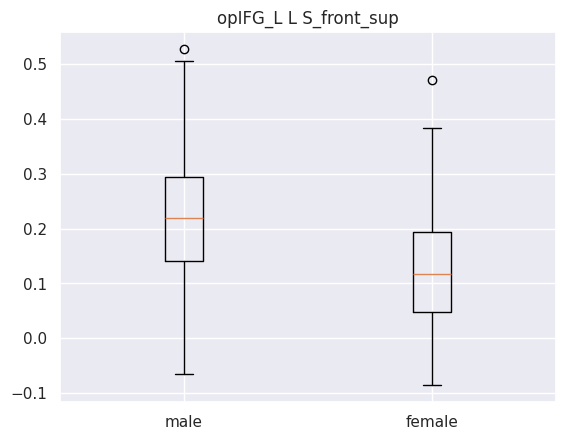

TtestResult(statistic=9.514226955534408, pvalue=1.1745948061525577e-19, df=444.0)
male mean : 0.22193633239999996
male std : 0.11249626112199279
female mean : 0.12588911007571682
female std : 0.10000267392277586


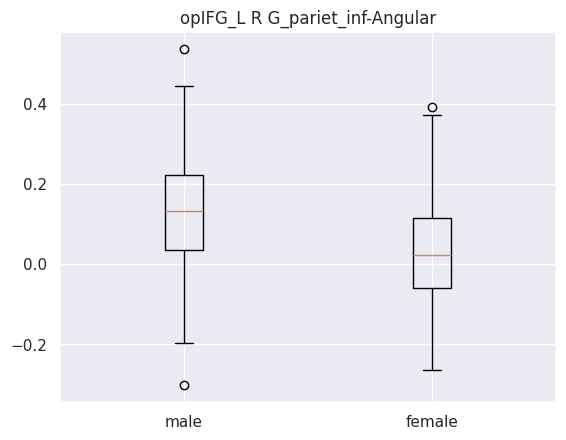

TtestResult(statistic=7.24780487230096, pvalue=1.8918423767886693e-12, df=444.0)
male mean : 0.12424016548681818
male std : 0.13424300726761648
female mean : 0.03453558849026549
female std : 0.1265180924203619


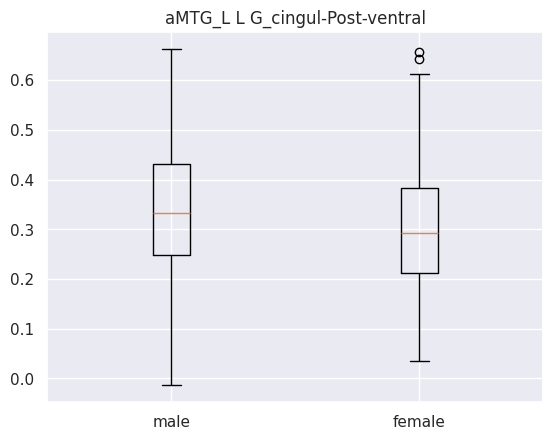

TtestResult(statistic=2.7358247046655375, pvalue=0.006471799539479473, df=444.0)
male mean : 0.3344936346227273
male std : 0.12852301357983476
female mean : 0.30081479229646013
female std : 0.1308069984904627


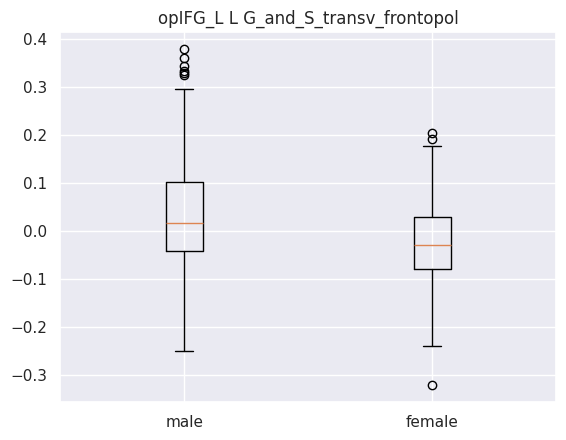

TtestResult(statistic=5.033838587916691, pvalue=6.999625036984745e-07, df=444.0)
male mean : 0.025597121174999998
male std : 0.11515068596736391
female mean : -0.023709215497699117
female std : 0.09002691208082556


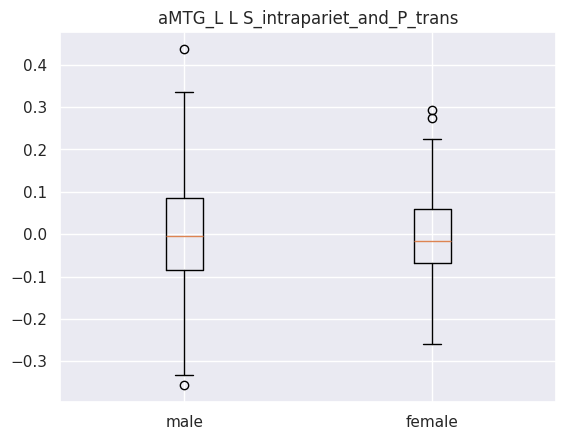

TtestResult(statistic=1.0441439448576817, pvalue=0.29698694253266955, df=444.0)
male mean : 0.004413317491818183
male std : 0.12667357592144304
female mean : -0.006823133387610619
female std : 0.09870796418027704


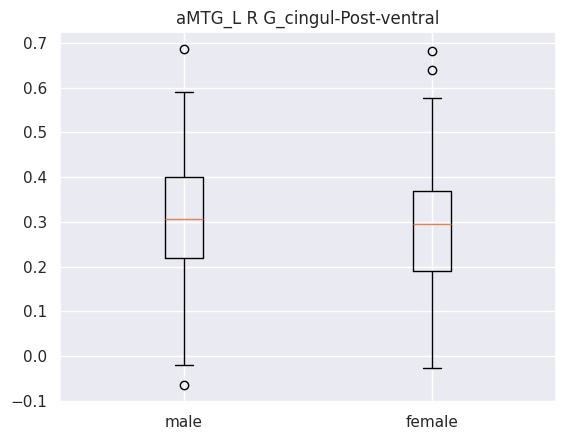

TtestResult(statistic=1.8738792848668957, pvalue=0.06160360622903291, df=444.0)
male mean : 0.30625412715000006
male std : 0.13256098239856265
female mean : 0.28295946666194693
female std : 0.12938146719020743


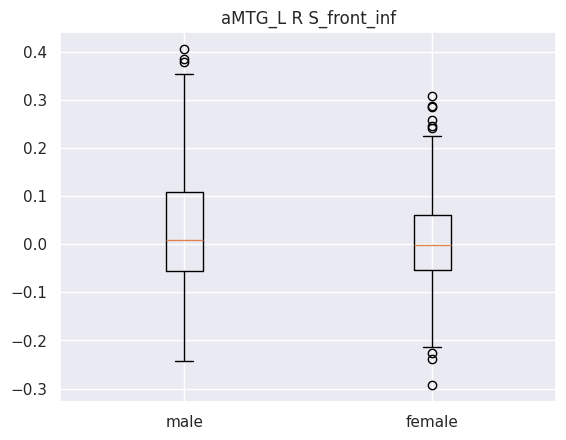

TtestResult(statistic=1.9193910426129293, pvalue=0.055575465964615225, df=444.0)
male mean : 0.025140619681999998
male std : 0.12506768589238804
female mean : 0.004515161334216815
female std : 0.10031688528841444


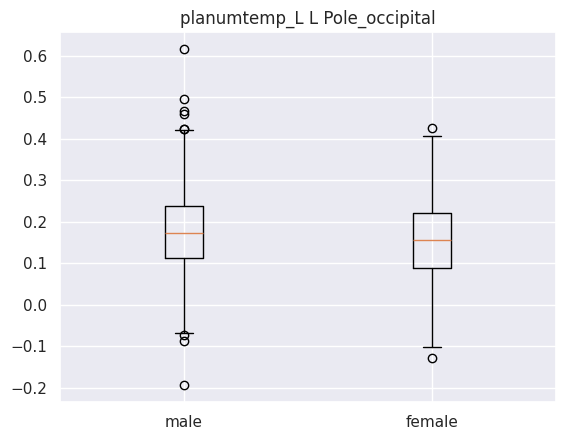

TtestResult(statistic=2.8966477425742636, pvalue=0.003958114551412912, df=444.0)
male mean : 0.18402248281818182
male std : 0.11334589412846845
female mean : 0.1545630971402655
female std : 0.10073153762994376


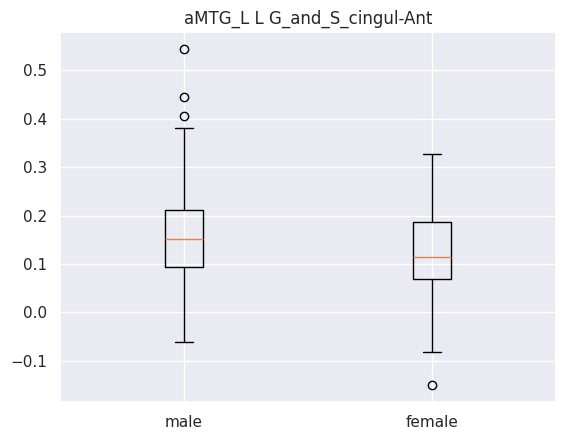

TtestResult(statistic=4.307060944860257, pvalue=2.038136442014065e-05, df=444.0)
male mean : 0.16099100311954548
male std : 0.0980609784038807
female mean : 0.1242215932681416
female std : 0.08124741946330903


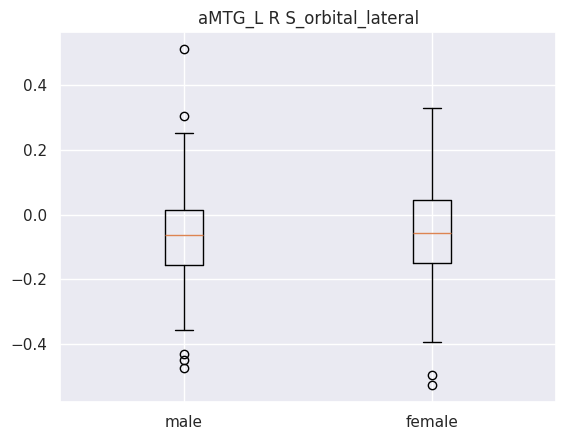

TtestResult(statistic=-0.9595545169231156, pvalue=0.337801699063937, df=444.0)
male mean : -0.06771869820213636
male std : 0.14263363470452184
female mean : -0.05464536117588496
female std : 0.14439482773638504
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [15]:
rois = ["opIFG_L", "planumtemp_L", "aMTG_L", "pITG_L", "opIFG_R", "planumtemp_R", "aMTG_R", "pITG_R"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_all_seed)
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
sensitivity = data_results["confusion_matrix"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))
bestRegion(ROIs, data, df_boot)


## Best regions for aMTG_L

     coefficient    seed                       labels
53      0.281044  aMTG_L                L S_front_sup
98      0.250923  aMTG_L       R G_pariet_inf-Angular
131     0.183568  aMTG_L   R S_oc_sup_and_transversal
22      0.180551  aMTG_L      L G_oc-temp_med-Parahip
4       0.175986  aMTG_L   L G_and_S_transv_frontopol
104     0.173773  aMTG_L                   R G_rectus
103     0.168947  aMTG_L                R G_precuneus
55      0.166147  aMTG_L  L S_intrapariet_and_P_trans
66      0.158217  aMTG_L              L S_postcentral
87      0.149105  aMTG_L       R G_front_inf-Triangul
The mean accuracy : 0.8202100000000002
The standard deviation of the accuracy : 0.042053908363456245
The lower boundry of the confidance interval of the accuracy : 0.737784339607626
The upper boundry of the confidance interval of the accuracy : 0.9026356603923744
Mean sensitivity : 0.8154806899097619 Std sensitivity : 0.05005300041329873
Mean specificity : 0.8303861582136113 Std specificity : 0.05303873

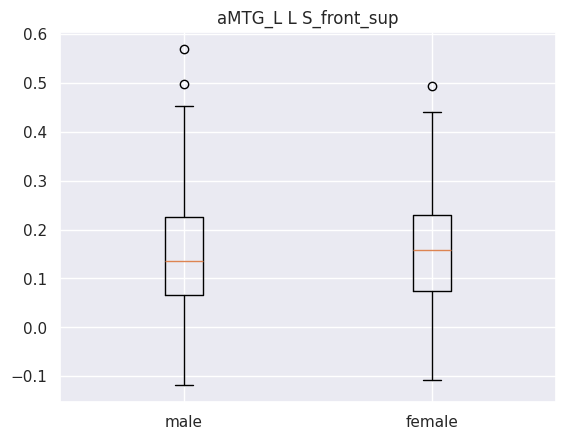

TtestResult(statistic=-0.9406515856219914, pvalue=0.3473949131207905, df=444.0)
male mean : 0.149155713895
male std : 0.12215414677633321
female mean : 0.15968833962980092
female std : 0.1137261077832309


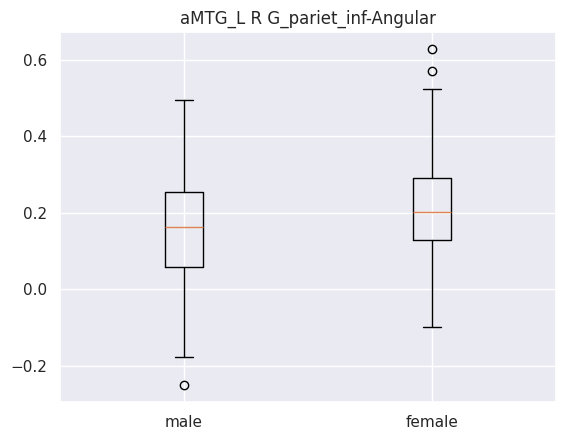

TtestResult(statistic=-3.9493086257770935, pvalue=9.112915695993898e-05, df=444.0)
male mean : 0.1597038146640909
male std : 0.14141209184423478
female mean : 0.20934205392477875
female std : 0.12301362367570179


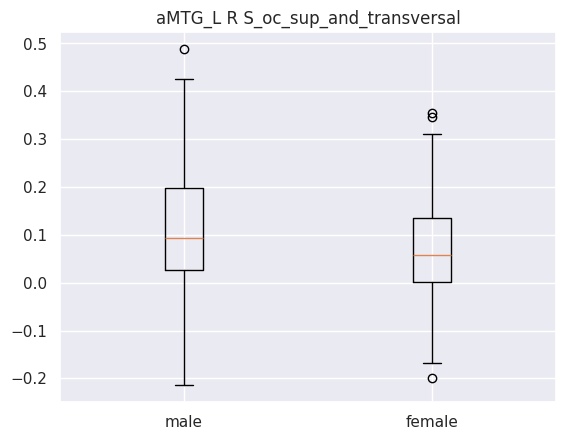

TtestResult(statistic=3.5613990096675714, pvalue=0.0004087562486128332, df=444.0)
male mean : 0.10625280339390909
male std : 0.12637717435553078
female mean : 0.06767066309955752
female std : 0.10078149226010065


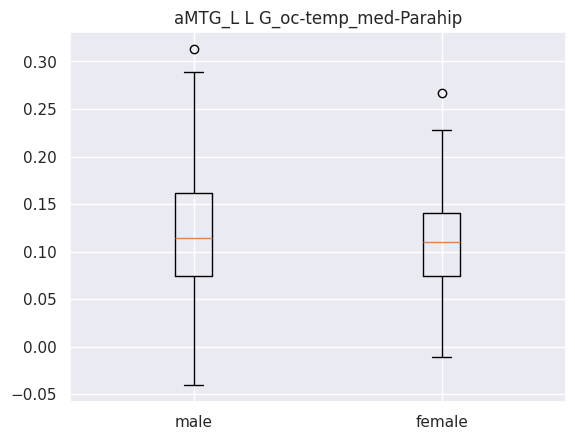

TtestResult(statistic=2.6168014548691065, pvalue=0.00917858413141157, df=444.0)
male mean : 0.12139309023636362
male std : 0.05894973262885631
female mean : 0.10806080625663717
female std : 0.04798219271826174


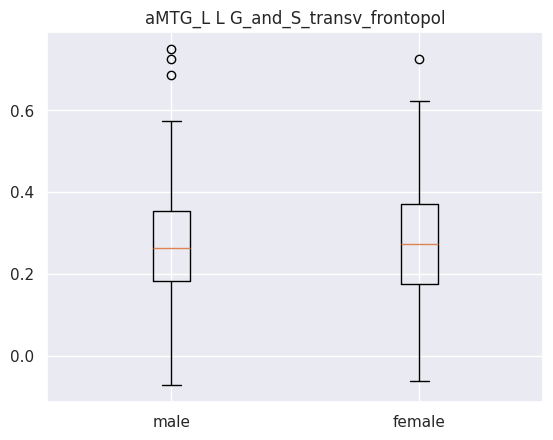

TtestResult(statistic=-0.13187058202998522, pvalue=0.8951463929773453, df=444.0)
male mean : 0.2736758421272727
male std : 0.13376710268148156
female mean : 0.2753599954026549
female std : 0.13529084478562486


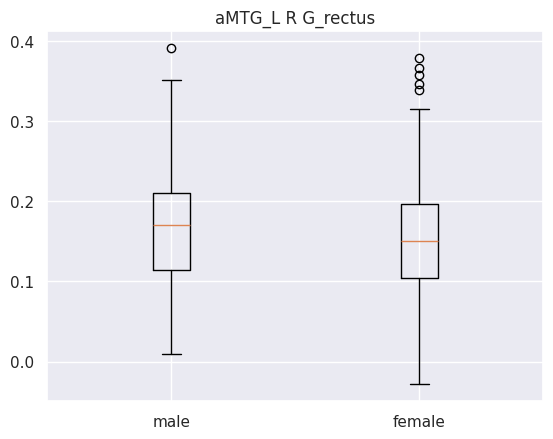

TtestResult(statistic=1.5156403489067496, pvalue=0.1303218993854485, df=444.0)
male mean : 0.1657639553590909
male std : 0.0682223379382807
female mean : 0.15580128479203542
female std : 0.07023035925739472


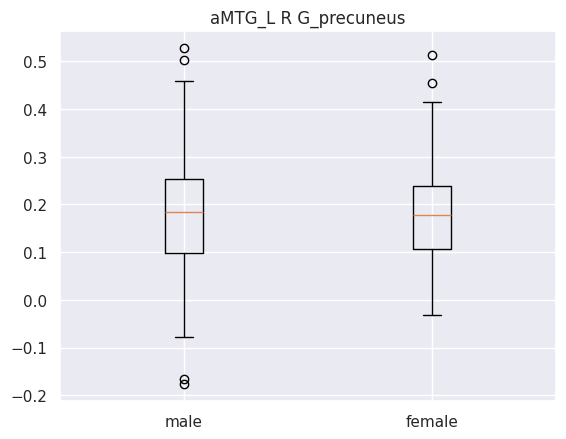

TtestResult(statistic=0.20836146513744597, pvalue=0.8350422894528916, df=444.0)
male mean : 0.1794498914168182
male std : 0.11811792236708751
female mean : 0.17732722280000002
female std : 0.09564836134166617


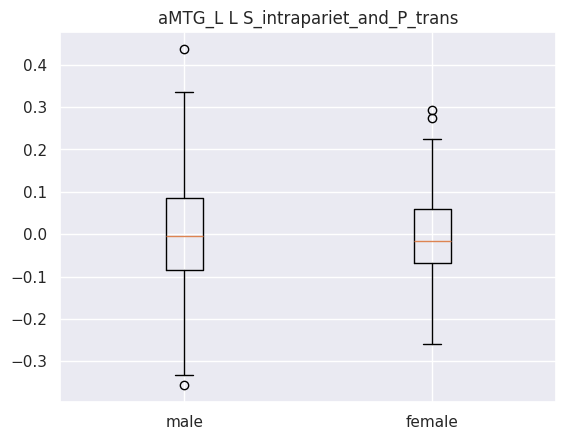

TtestResult(statistic=1.0441439448576817, pvalue=0.29698694253266955, df=444.0)
male mean : 0.004413317491818183
male std : 0.12667357592144304
female mean : -0.006823133387610619
female std : 0.09870796418027704


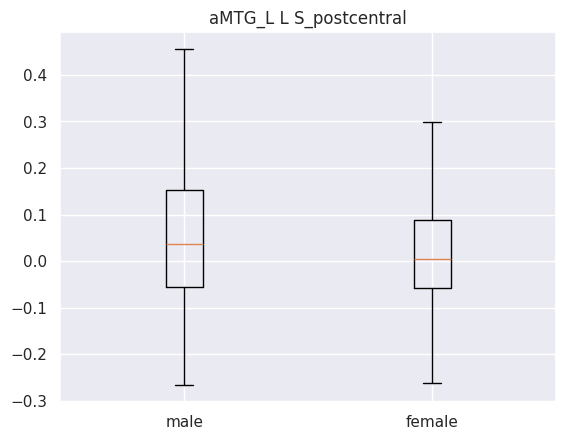

TtestResult(statistic=2.4484128219617074, pvalue=0.01473464302856492, df=444.0)
male mean : 0.04535718950954546
male std : 0.14137947053259706
female mean : 0.01543427044787611
female std : 0.11512896698383501


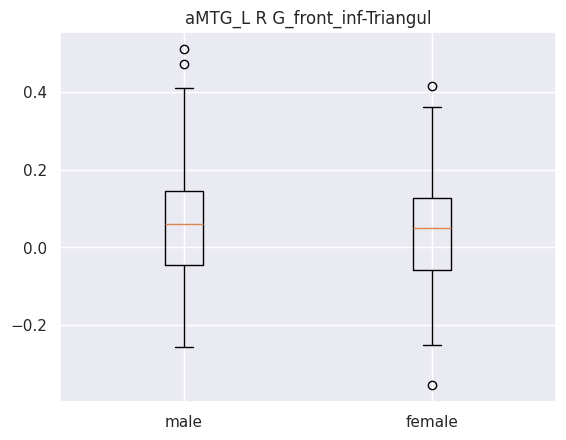

TtestResult(statistic=0.8029229066384681, pvalue=0.42244888658810364, df=444.0)
male mean : 0.05413531161409091
male std : 0.14048142342875752
female mean : 0.04356582297920354
female std : 0.13689628286994152
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [16]:
rois = ["aMTG_L"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_aMTG_L)
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
sensitivity = data_results["confusion_matrix"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))
bestRegion(ROIs, data, df_boot)

## Best regions aMTG_R

     coefficient    seed                       labels
66      0.235741  aMTG_R              L S_postcentral
53      0.235184  aMTG_R                L S_front_sup
22      0.215506  aMTG_R      L G_oc-temp_med-Parahip
98      0.214273  aMTG_R       R G_pariet_inf-Angular
55      0.196734  aMTG_R  L S_intrapariet_and_P_trans
96      0.173958  aMTG_R      R G_oc-temp_med-Parahip
4       0.162914  aMTG_R   L G_and_S_transv_frontopol
77      0.149204  aMTG_R         R G_and_S_subcentral
131     0.146683  aMTG_R   R S_oc_sup_and_transversal
90      0.130523  aMTG_R    R G_Ins_lg_and_S_cent_ins
The mean accuracy : 0.8109111111111114
The standard deviation of the accuracy : 0.043558497633061015
The lower boundry of the confidance interval of the accuracy : 0.7255364557503118
The upper boundry of the confidance interval of the accuracy : 0.8962857664719109
Mean sensitivity : 0.8088480095877181 Std sensitivity : 0.051696829941751885
Mean specificity : 0.818307480321062 Std specificity : 0.0536930

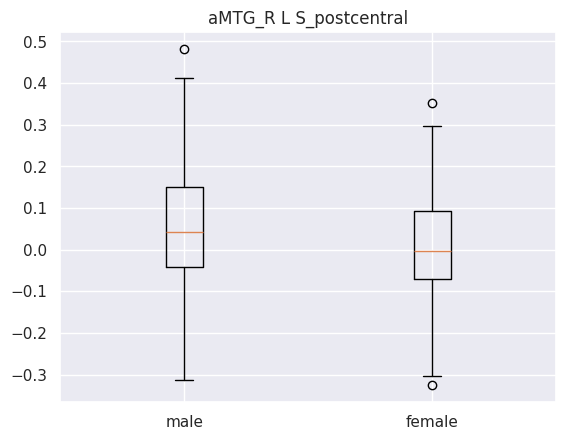

TtestResult(statistic=2.627621292338559, pvalue=0.008896140355824254, df=444.0)
male mean : 0.04901591075681818
male std : 0.13953276104441498
female mean : 0.016055526186592915
female std : 0.12453371759228786


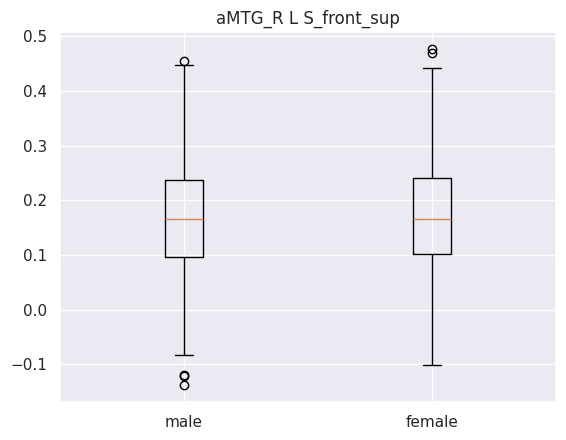

TtestResult(statistic=-0.08008365126456747, pvalue=0.9362068082925741, df=444.0)
male mean : 0.17175187354863636
male std : 0.11338550789442398
female mean : 0.1725857526397788
female std : 0.10597629980410962


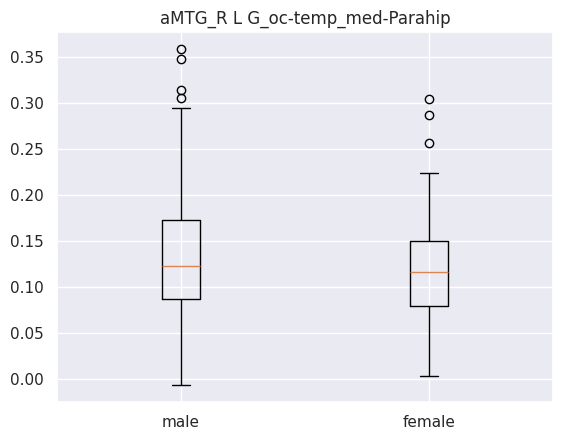

TtestResult(statistic=2.839191497277654, pvalue=0.004730402487154351, df=444.0)
male mean : 0.13388492833
male std : 0.06366889431603796
female mean : 0.11838812058539823
female std : 0.05078064169079939


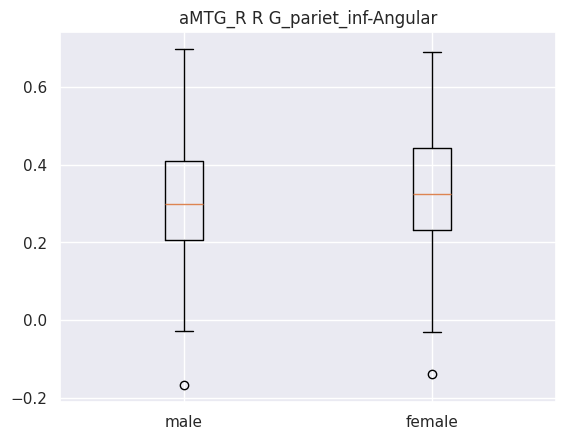

TtestResult(statistic=-1.2323437014086307, pvalue=0.21847289401376063, df=444.0)
male mean : 0.30850017917
male std : 0.1509961278933057
female mean : 0.3258114792300885
female std : 0.14499535619579842


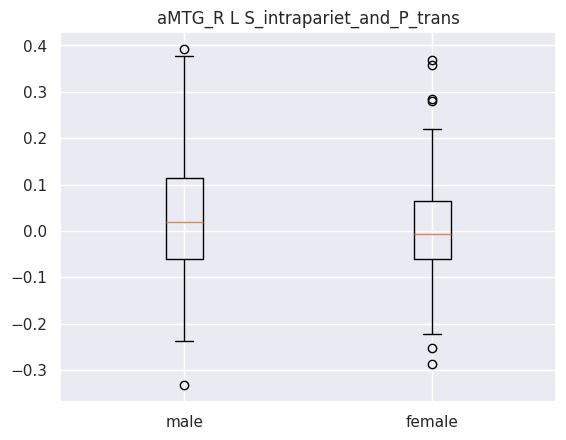

TtestResult(statistic=2.0033433133727625, pvalue=0.0457476860349034, df=444.0)
male mean : 0.02404788690863636
male std : 0.12464427867043203
female mean : 0.0021809927742920342
female std : 0.10473721060141471


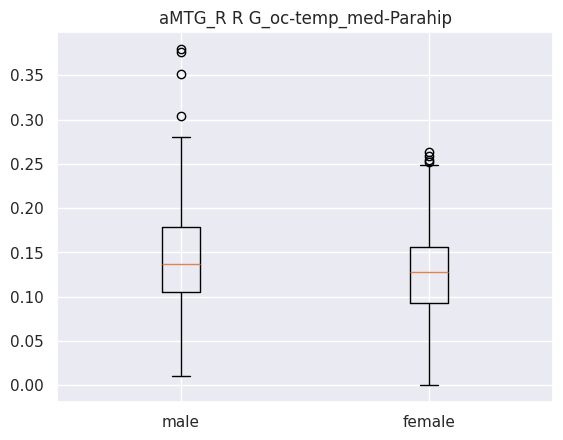

TtestResult(statistic=3.2230120586916766, pvalue=0.0013619508370199724, df=444.0)
male mean : 0.14602855690909092
male std : 0.06277541821437044
female mean : 0.1286269260214602
female std : 0.050481361154379095


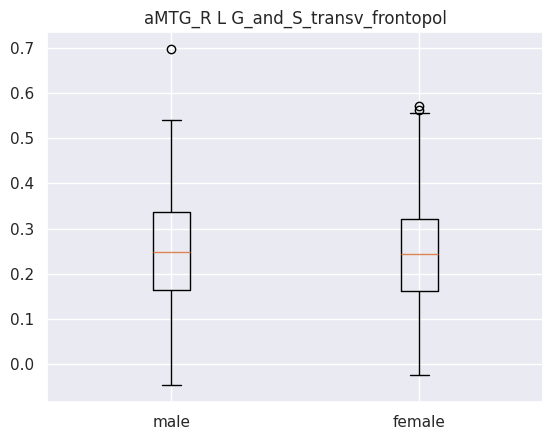

TtestResult(statistic=0.7806963776760073, pvalue=0.43539711360071087, df=444.0)
male mean : 0.25175311356636365
male std : 0.12076507584294517
female mean : 0.2429040562159292
female std : 0.11807395115490585


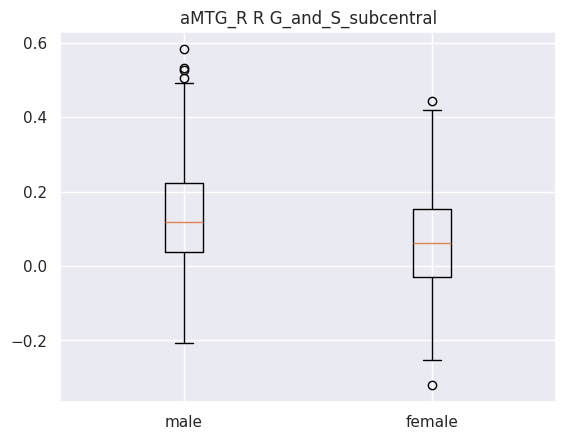

TtestResult(statistic=4.062267488891093, pvalue=5.7460358444403454e-05, df=444.0)
male mean : 0.12416156709794092
male std : 0.1454961305113495
female mean : 0.0702078637039823
female std : 0.13426643484180018


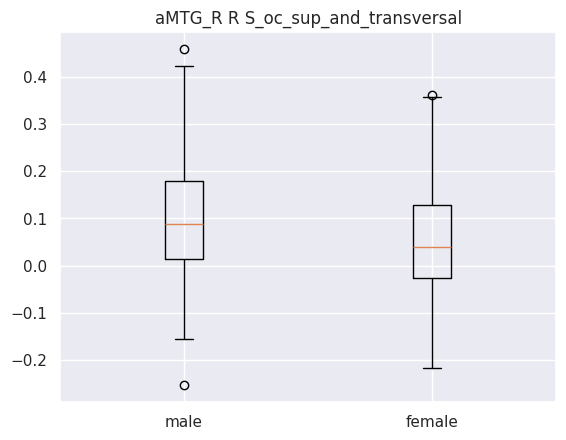

TtestResult(statistic=4.231939532641933, pvalue=2.8164514848048607e-05, df=444.0)
male mean : 0.10353396476636365
male std : 0.1292749411740477
female mean : 0.05450852847345132
female std : 0.1145602710940684


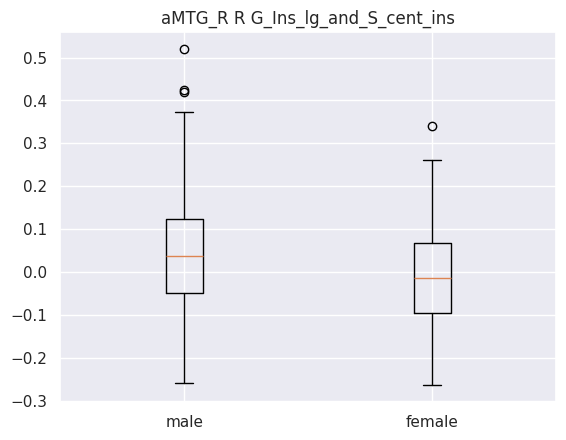

TtestResult(statistic=4.494099754685952, pvalue=8.92418981107013e-06, df=444.0)
male mean : 0.0445266324765
male std : 0.12931193503968358
female mean : -0.007410436407079646
female std : 0.11390051576344988
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [17]:
rois = ["aMTG_R"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_aMTG_R)
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
sensitivity = data_results["confusion_matrix"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))
bestRegion(ROIs, data, df_boot)

## Best regions opIFG_L

     coefficient     seed                       labels
125     0.202689  opIFG_L                R S_front_inf
20      0.200376  opIFG_L      L G_oc-temp_lat-fusifor
35      0.190572  opIFG_L      L G_temp_sup-Plan_tempo
144     0.189744  opIFG_L              R S_subparietal
91      0.188180  opIFG_L            R G_insular_short
79      0.158492  opIFG_L         R G_and_S_cingul-Ant
60      0.157379  opIFG_L  L S_oc-temp_med_and_Lingual
89      0.151293  opIFG_L                R G_front_sup
72      0.150238  opIFG_L             L S_temporal_sup
9       0.147801  opIFG_L      L G_cingul-Post-ventral
The mean accuracy : 0.8472244444444444
The standard deviation of the accuracy : 0.03985312534795734
The lower boundry of the confidance interval of the accuracy : 0.769112318762448
The upper boundry of the confidance interval of the accuracy : 0.9253365701264409
Mean sensitivity : 0.8420658930947892 Std sensitivity : 0.04859285455967222
Mean specificity : 0.857698111507087 Std specificity : 0

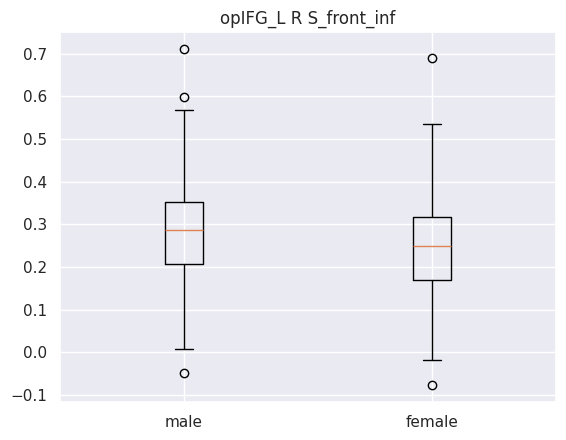

TtestResult(statistic=3.835811545215277, pvalue=0.0001432689580451875, df=444.0)
male mean : 0.2851604080318182
male std : 0.11340294993333086
female mean : 0.24395864221681413
female std : 0.11291671921913636


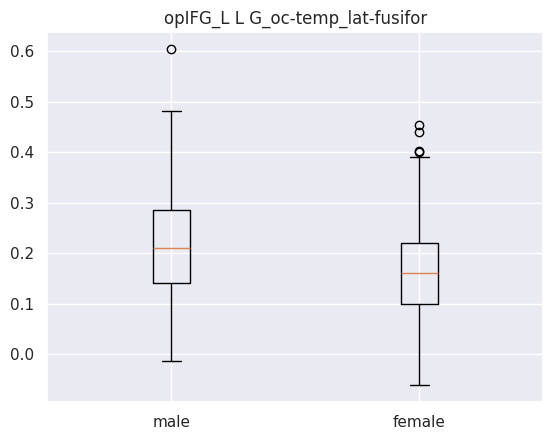

TtestResult(statistic=5.347205581276891, pvalue=1.4323542479964458e-07, df=444.0)
male mean : 0.21720834137113634
male std : 0.10505156622836234
female mean : 0.1665263415774336
female std : 0.09451242193790162


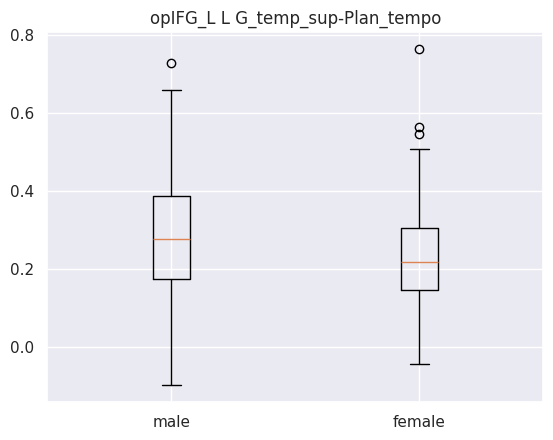

TtestResult(statistic=4.658112093864058, pvalue=4.223278693577736e-06, df=444.0)
male mean : 0.2863882349772728
male std : 0.14948277729148243
female mean : 0.22649747706194692
female std : 0.12022186901150231


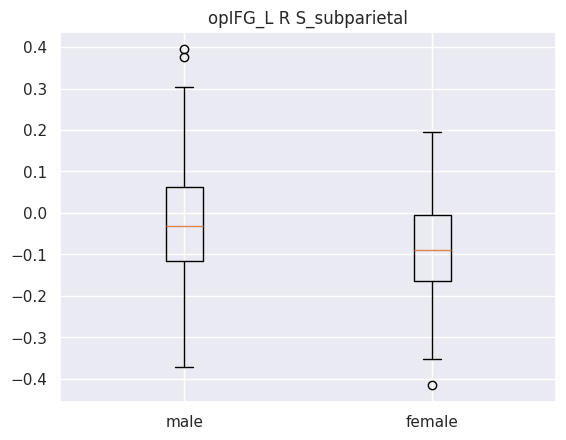

TtestResult(statistic=4.609312989745705, pvalue=5.2885387407695605e-06, df=444.0)
male mean : -0.024811179274522723
male std : 0.14365742689954286
female mean : -0.08184163840840707
female std : 0.1159257812279483


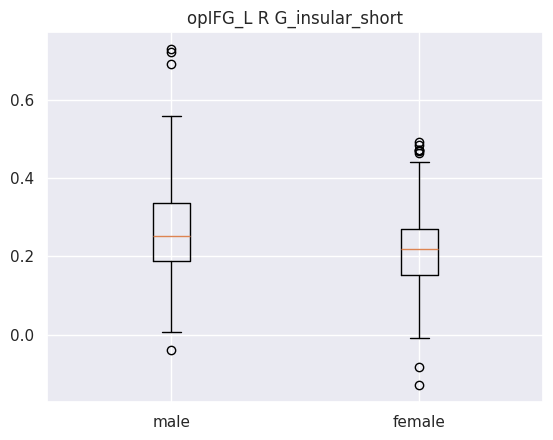

TtestResult(statistic=4.228696451103205, pvalue=2.855749277590576e-05, df=444.0)
male mean : 0.2642323993227273
male std : 0.12153962695267223
female mean : 0.21892150578761063
female std : 0.10375910549235366


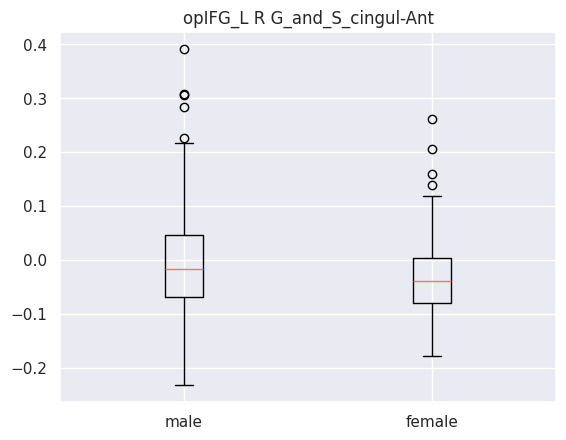

TtestResult(statistic=3.464665320247692, pvalue=0.0005824633674892333, df=444.0)
male mean : -0.006062558034272728
male std : 0.09768015129495845
female mean : -0.033554106136725666
female std : 0.0670920200770204


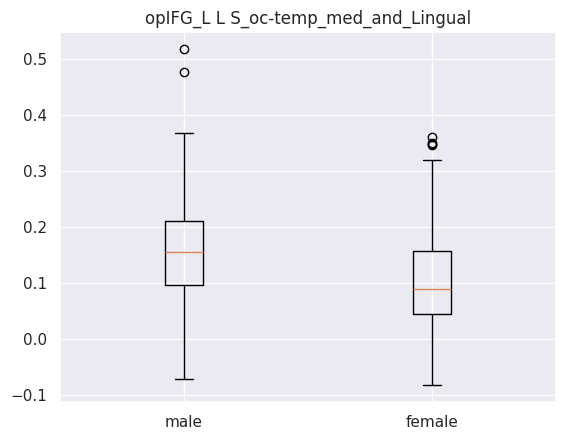

TtestResult(statistic=5.608872459876942, pvalue=3.5868373548282604e-08, df=444.0)
male mean : 0.15474476261090905
male std : 0.09145221886246907
female mean : 0.10766764768845133
female std : 0.08536736636712615


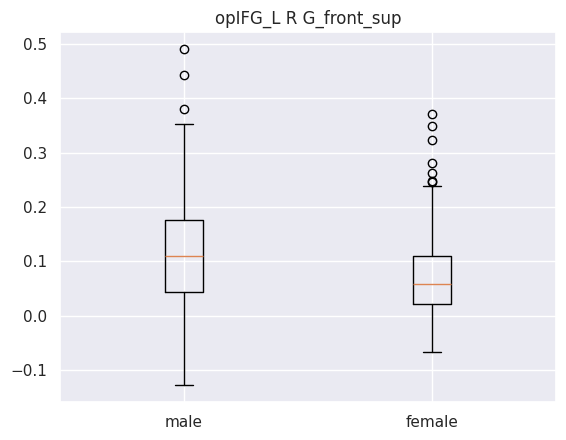

TtestResult(statistic=5.637293911515764, pvalue=3.0760252455572435e-08, df=444.0)
male mean : 0.11798845308907728
male std : 0.10117311695046627
female mean : 0.07026109567020353
female std : 0.07572629349379853


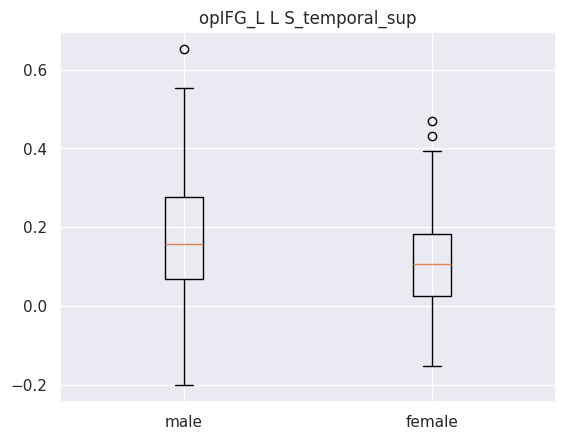

TtestResult(statistic=4.986420632756741, pvalue=8.837798072236852e-07, df=444.0)
male mean : 0.17709827854295454
male std : 0.14528631593413507
female mean : 0.11401556901061947
female std : 0.12043399442961387


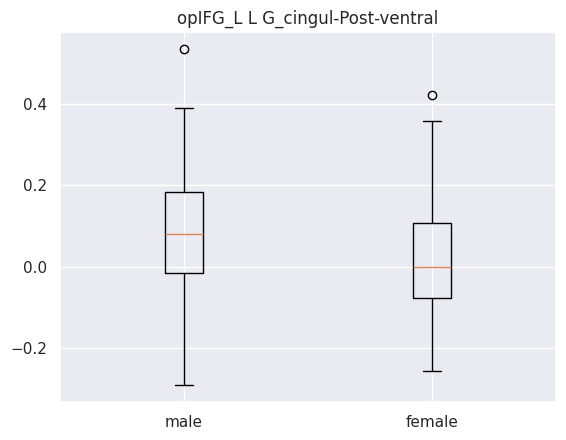

TtestResult(statistic=5.084136311641698, pvalue=5.454955637828819e-07, df=444.0)
male mean : 0.08083275604595454
male std : 0.1405096922901904
female mean : 0.018020681705044245
female std : 0.11920621954418258
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [18]:
rois = ["opIFG_L"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_opIFG_L)
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
sensitivity = data_results["confusion_matrix"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))
bestRegion(ROIs, data, df_boot)

## Best regions opIFG_R

     coefficient     seed                       labels
125     0.234703  opIFG_R                R S_front_inf
80      0.224280  opIFG_R     R G_and_S_cingul-Mid-Ant
91      0.181864  opIFG_R            R G_insular_short
144     0.168338  opIFG_R              R S_subparietal
20      0.165930  opIFG_R      L G_oc-temp_lat-fusifor
90      0.165617  opIFG_R    R G_Ins_lg_and_S_cent_ins
41      0.161333  opIFG_R             L Pole_occipital
117     0.152971  opIFG_R                R S_calcarine
63      0.152894  opIFG_R         L S_orbital-H_Shaped
60      0.151867  opIFG_R  L S_oc-temp_med_and_Lingual
The mean accuracy : 0.8309533333333334
The standard deviation of the accuracy : 0.04169986582564197
The lower boundry of the confidance interval of the accuracy : 0.7492215963150752
The upper boundry of the confidance interval of the accuracy : 0.9126850703515916
Mean sensitivity : 0.8322554230578544 Std sensitivity : 0.050887627795741186
Mean specificity : 0.8347027848251469 Std specificity 

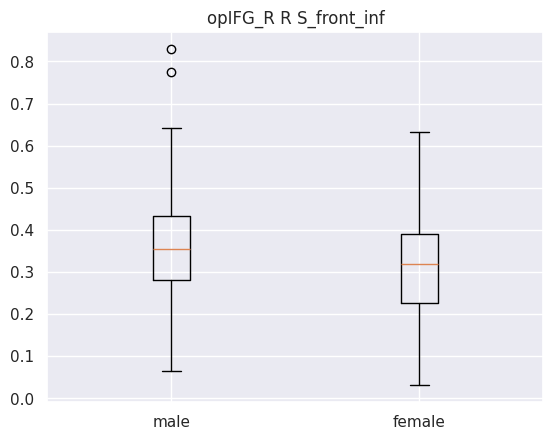

TtestResult(statistic=3.9946084585433304, pvalue=7.584042967238988e-05, df=444.0)
male mean : 0.36241775419090916
male std : 0.11709006437871611
female mean : 0.31739422023451325
female std : 0.12031934666421866


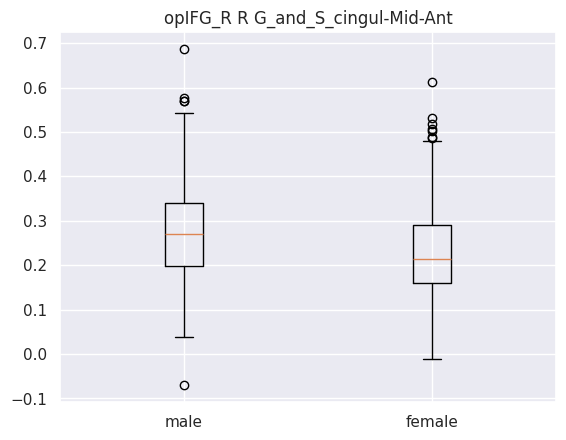

TtestResult(statistic=3.964127034948002, pvalue=8.583233085828756e-05, df=444.0)
male mean : 0.2759169506818182
male std : 0.11781973016961253
female mean : 0.2327772969358407
female std : 0.1114656795348218


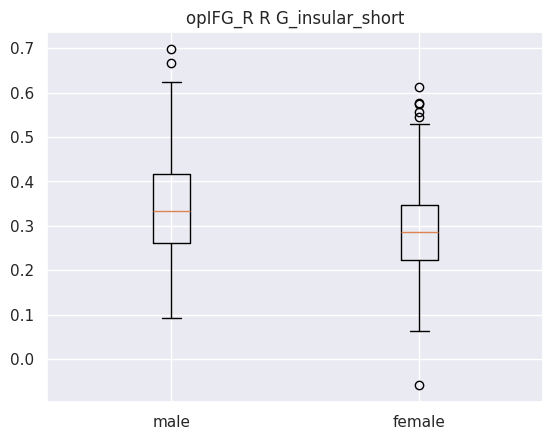

TtestResult(statistic=4.5606645152083, pvalue=6.6049251869165826e-06, df=444.0)
male mean : 0.34029636559545456
male std : 0.11365052713646152
female mean : 0.2927324357035398
female std : 0.10605668848768768


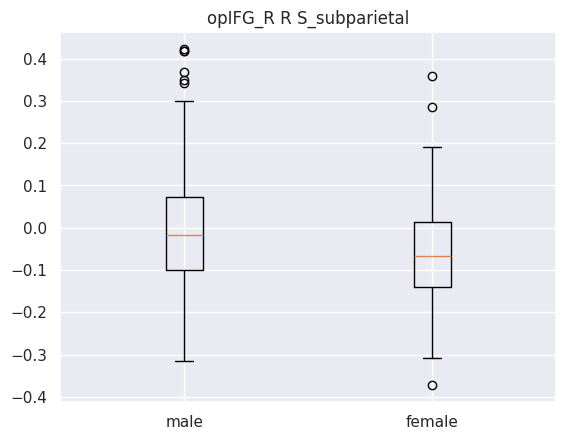

TtestResult(statistic=4.342181044945235, pvalue=1.749268283550659e-05, df=444.0)
male mean : -0.008883466066818179
male std : 0.14428559820039927
female mean : -0.06175231570632744
female std : 0.11046401972822666


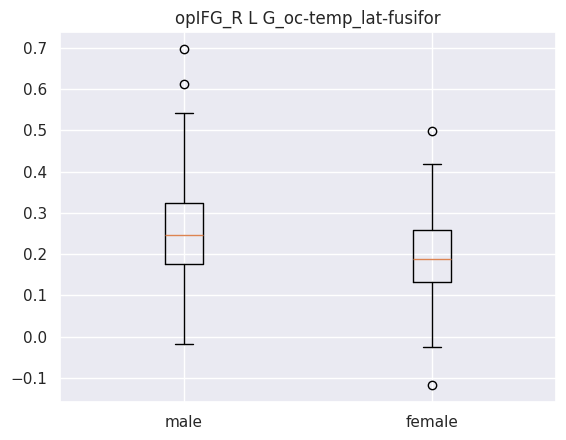

TtestResult(statistic=5.192733430788187, pvalue=3.162104238851161e-07, df=444.0)
male mean : 0.24746643591363637
male std : 0.1114361981429399
female mean : 0.1962682065265487
female std : 0.095928572655737


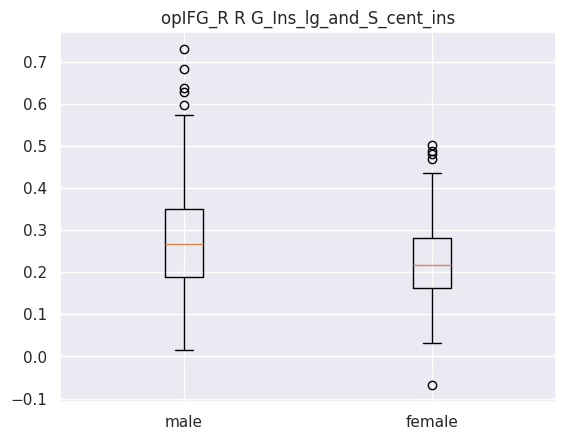

TtestResult(statistic=4.719580637797441, pvalue=3.1723919963938446e-06, df=444.0)
male mean : 0.2733611874181818
male std : 0.12407207041222522
female mean : 0.22280797660176993
female std : 0.1007125264660346


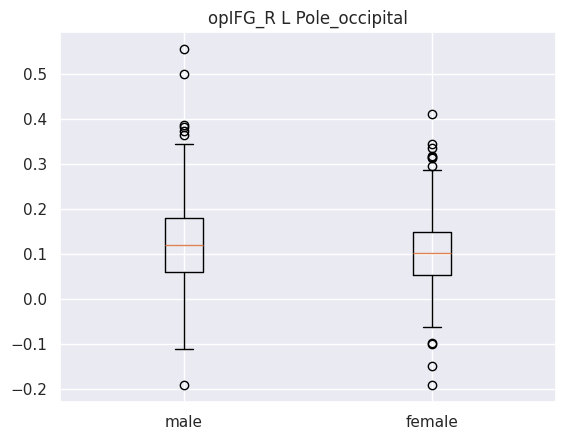

TtestResult(statistic=1.9668569199465695, pvalue=0.049822028600582956, df=444.0)
male mean : 0.1226511061215
male std : 0.10336637927130211
female mean : 0.10500797782699114
female std : 0.08498185574097446


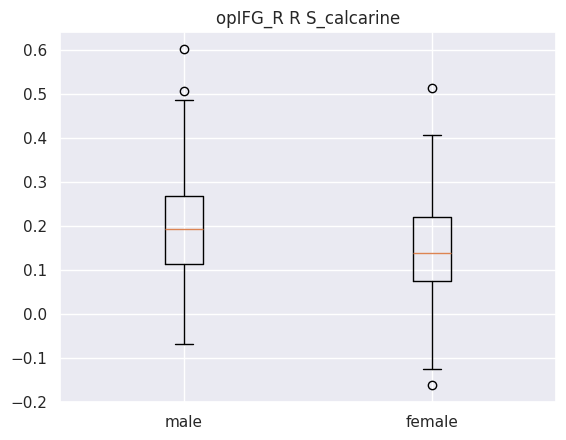

TtestResult(statistic=4.237827850565027, pvalue=2.7464151972045144e-05, df=444.0)
male mean : 0.19217596783045457
male std : 0.11294197663986946
female mean : 0.14892272028761064
female std : 0.10196970971881396


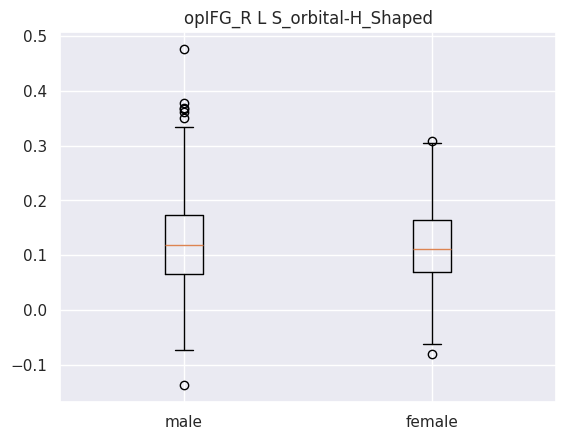

TtestResult(statistic=0.8561324777791736, pvalue=0.39238630056013113, df=444.0)
male mean : 0.12343299978045455
male std : 0.08958678153626323
female mean : 0.11666919567345133
female std : 0.07653337463165284


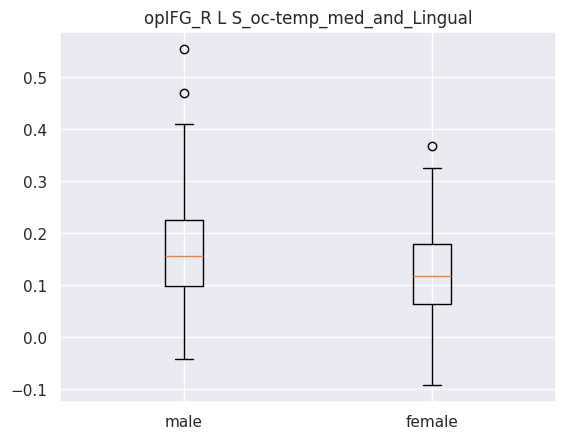

TtestResult(statistic=4.9683687670111105, pvalue=9.65358806851133e-07, df=444.0)
male mean : 0.16568285368454544
male std : 0.09795658686725976
female mean : 0.12266675558539823
female std : 0.08412303322404859
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [19]:
rois = ["opIFG_R"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_opIFG_R)
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
sensitivity = data_results["confusion_matrix"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))
bestRegion(ROIs, data, df_boot)

## Best regions pITG_L

     coefficient    seed                       labels
26      0.258569  pITG_L             L G_parietal_sup
125     0.251404  pITG_L                R S_front_inf
9       0.229381  pITG_L      L G_cingul-Post-ventral
73      0.196164  pITG_L      L S_temporal_transverse
20      0.178793  pITG_L      L G_oc-temp_lat-fusifor
75      0.174681  pITG_L      R G_and_S_occipital_inf
83      0.170141  pITG_L      R G_cingul-Post-ventral
55      0.161171  pITG_L  L S_intrapariet_and_P_trans
135     0.149312  pITG_L          R S_orbital_lateral
4       0.145410  pITG_L   L G_and_S_transv_frontopol
The mean accuracy : 0.8340655555555557
The standard deviation of the accuracy : 0.04090814339830513
The lower boundry of the confidance interval of the accuracy : 0.7538855944948777
The upper boundry of the confidance interval of the accuracy : 0.9142455166162338
Mean sensitivity : 0.8368868824147409 Std sensitivity : 0.04986718307660728
Mean specificity : 0.8359144147978517 Std specificity : 0.05096994

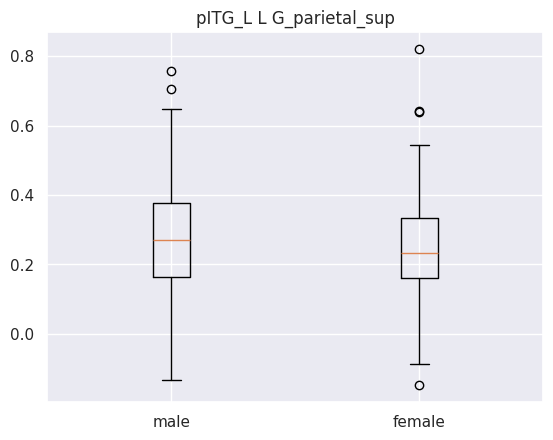

TtestResult(statistic=1.932579843967068, pvalue=0.05392366198499659, df=444.0)
male mean : 0.2742340569533182
male std : 0.16088494195816322
female mean : 0.2469608636460177
female std : 0.13572558594984654


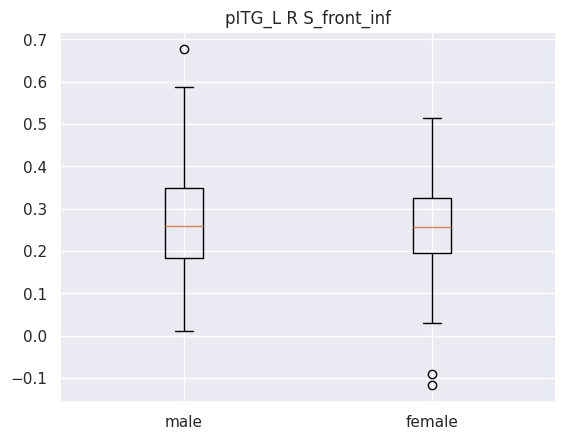

TtestResult(statistic=1.0020328934125462, pvalue=0.31687348431400925, df=444.0)
male mean : 0.2700681785363636
male std : 0.11105772730043446
female mean : 0.25973832161504423
female std : 0.10615524639315872


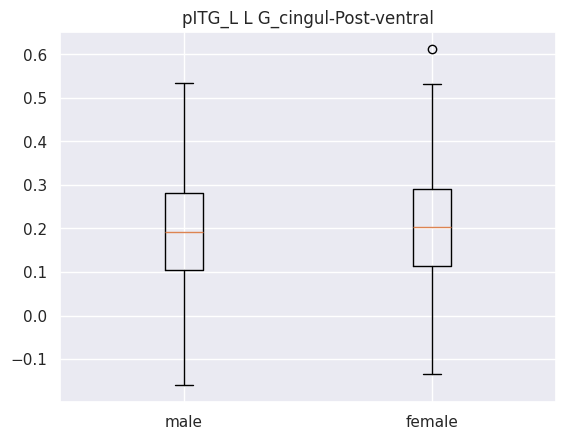

TtestResult(statistic=-0.8502284729847315, pvalue=0.3956563221847449, df=444.0)
male mean : 0.19532825054954547
male std : 0.12405214793600829
female mean : 0.2054311569070796
female std : 0.12626706102176716


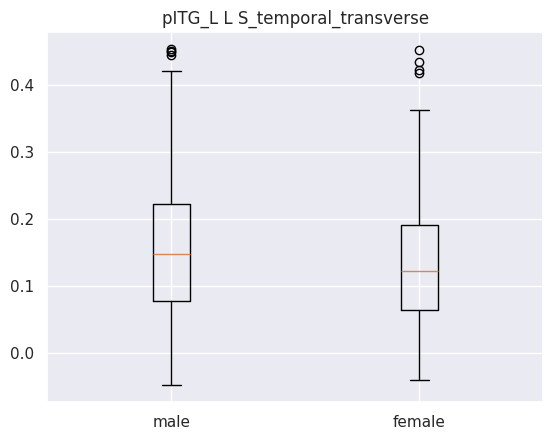

TtestResult(statistic=2.5571750426222266, pvalue=0.010883989566106632, df=444.0)
male mean : 0.1583446232454545
male std : 0.10578124515424395
female mean : 0.1342784206256637
female std : 0.09222667259385757


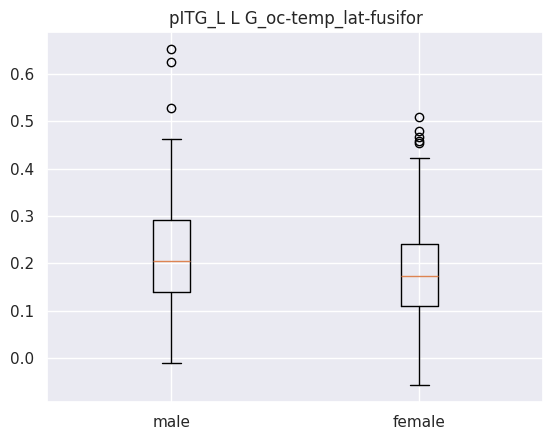

TtestResult(statistic=2.9177266272120463, pvalue=0.0037049025784669063, df=444.0)
male mean : 0.2166043530454545
male std : 0.10970491808955896
female mean : 0.18723372998539822
female std : 0.10235689928590931


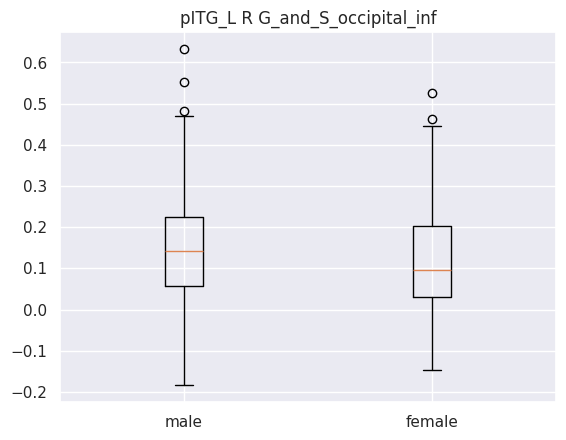

TtestResult(statistic=2.1181886492106354, pvalue=0.03471405998766398, df=444.0)
male mean : 0.14558922257772727
male std : 0.1311116449490574
female mean : 0.11931503520522121
female std : 0.13024516583608292


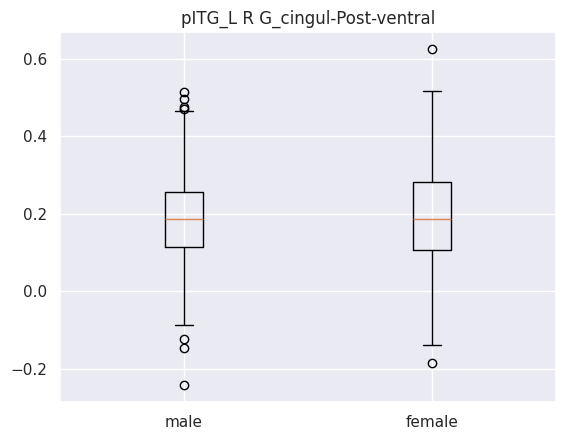

TtestResult(statistic=-0.7258276764624265, pvalue=0.4683268290899185, df=444.0)
male mean : 0.18240836490872728
male std : 0.12319924649574499
female mean : 0.19105889225530973
female std : 0.12780495959682228


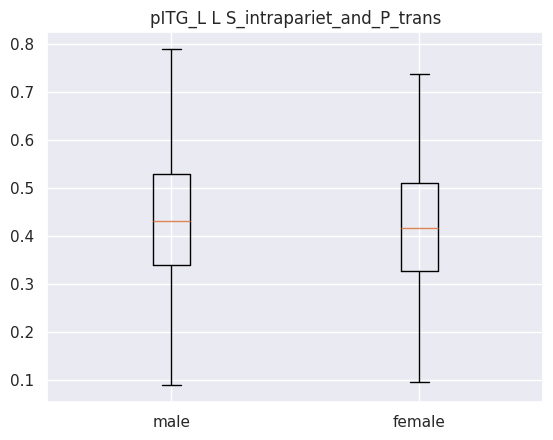

TtestResult(statistic=0.6041143572753404, pvalue=0.5460761592105134, df=444.0)
male mean : 0.4304373097727274
male std : 0.13301584196209193
female mean : 0.42295020637610614
female std : 0.1281282122063903


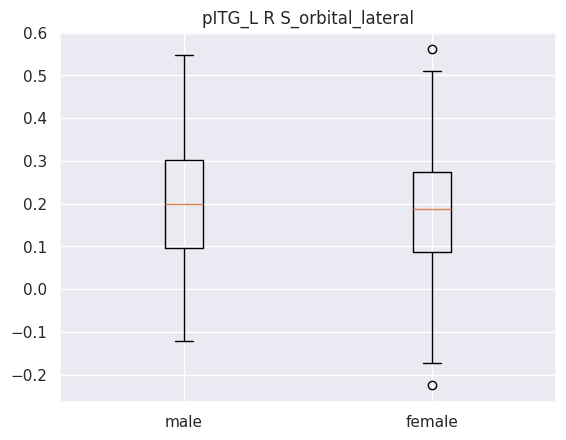

TtestResult(statistic=1.3108865376813061, pvalue=0.19057369875431965, df=444.0)
male mean : 0.20063633318604546
male std : 0.1449903023935802
female mean : 0.1830400494539823
female std : 0.13783407715558785


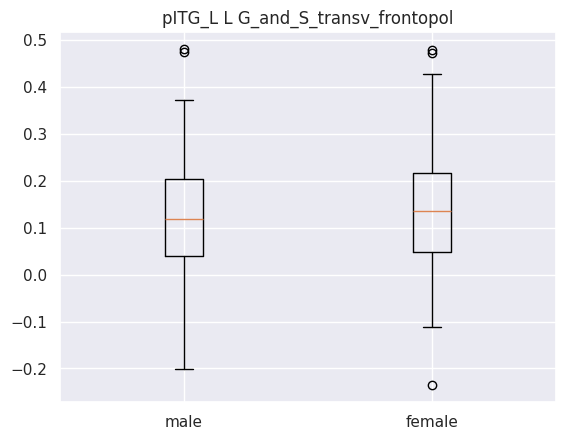

TtestResult(statistic=-1.162423120542947, pvalue=0.24568805822769893, df=444.0)
male mean : 0.12402863729863638
male std : 0.11615416814273921
female mean : 0.13712417481902656
female std : 0.12109015309239457
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [20]:
rois = ["pITG_L"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_pITG_L)
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
sensitivity = data_results["confusion_matrix"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))
bestRegion(ROIs, data, df_boot)

## Best regions pITG_R

     coefficient    seed                    labels
20      0.317350  pITG_R   L G_oc-temp_lat-fusifor
83      0.207225  pITG_R   R G_cingul-Post-ventral
91      0.203452  pITG_R         R G_insular_short
84      0.195611  pITG_R                R G_cuneus
125     0.194242  pITG_R             R S_front_inf
72      0.162033  pITG_R          L S_temporal_sup
80      0.158161  pITG_R  R G_and_S_cingul-Mid-Ant
32      0.146301  pITG_R   L G_temp_sup-G_T_transv
144     0.142211  pITG_R           R S_subparietal
19      0.136236  pITG_R         L G_occipital_sup
The mean accuracy : 0.8087766666666668
The standard deviation of the accuracy : 0.04366703136686832
The lower boundry of the confidance interval of the accuracy : 0.723189285187605
The upper boundry of the confidance interval of the accuracy : 0.8943640481457287
Mean sensitivity : 0.8030865538507487 Std sensitivity : 0.05111756646867676
Mean specificity : 0.8199458184890595 Std specificity : 0.05372855203856655


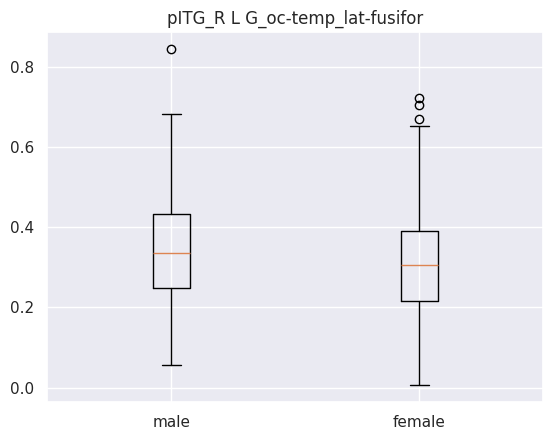

TtestResult(statistic=2.207601503782289, pvalue=0.027782692747375555, df=444.0)
male mean : 0.3381230503772727
male std : 0.13608853787659086
female mean : 0.31070127244911505
female std : 0.1255552430118421


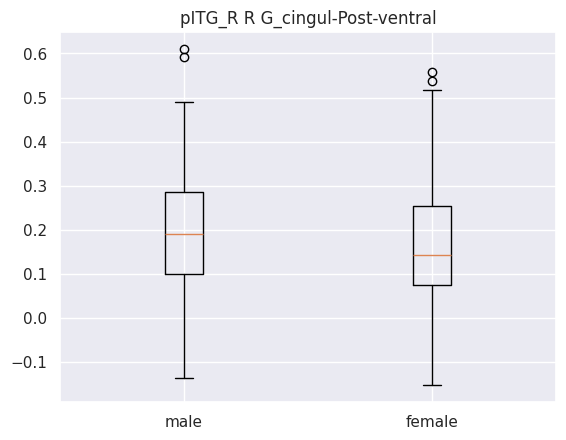

TtestResult(statistic=2.380140291533847, pvalue=0.01772726625126871, df=444.0)
male mean : 0.19296064746681815
male std : 0.1346758980066957
female mean : 0.16264045314955752
female std : 0.13373455574896778


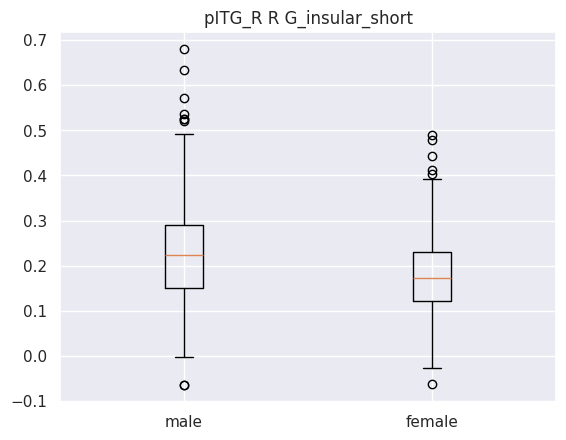

TtestResult(statistic=5.112160421970684, pvalue=4.743233770538839e-07, df=444.0)
male mean : 0.2313763518045455
male std : 0.12096734073549982
female mean : 0.1792633135699115
female std : 0.09227387552085549


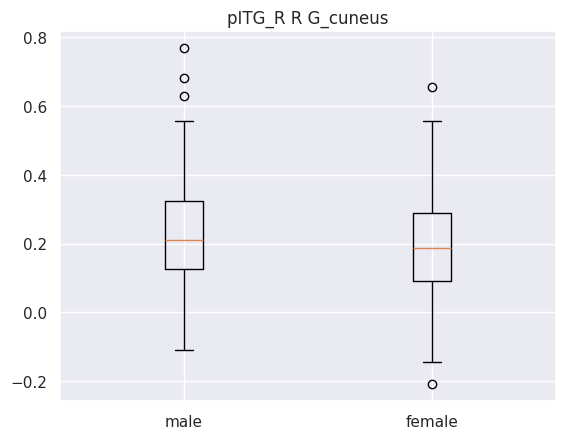

TtestResult(statistic=2.518734910789549, pvalue=0.012128078944136934, df=444.0)
male mean : 0.22664096681499996
male std : 0.14532160156704602
female mean : 0.192063495079646
female std : 0.14393677903416816


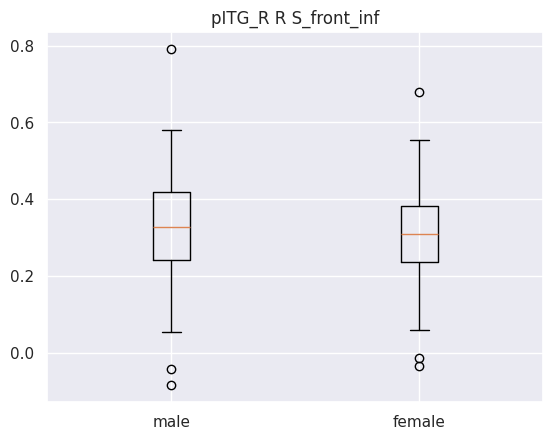

TtestResult(statistic=2.13538486489198, pvalue=0.03327622102378573, df=444.0)
male mean : 0.3298146207409091
male std : 0.12123145108487972
female mean : 0.3068887235929204
female std : 0.1045843071513845


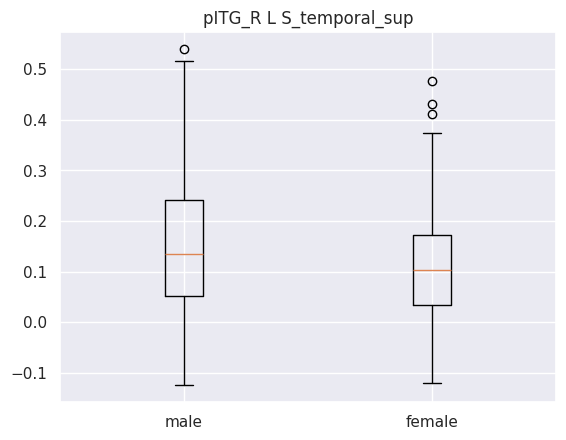

TtestResult(statistic=3.880451580314428, pvalue=0.00012007067421179041, df=444.0)
male mean : 0.15231047255386362
male std : 0.1297059803514484
female mean : 0.10898147674115045
female std : 0.10454350572317415


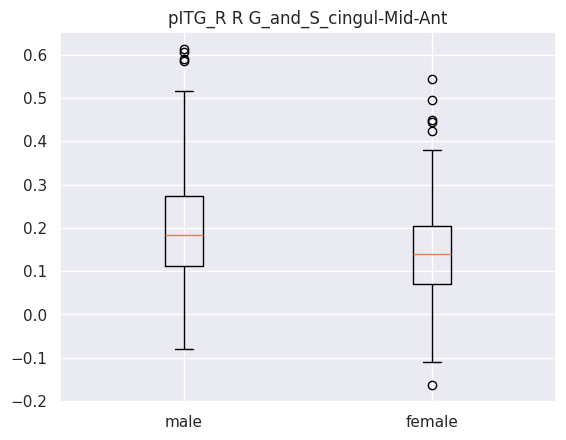

TtestResult(statistic=5.066890396884413, pvalue=5.943184005143566e-07, df=444.0)
male mean : 0.1998270520648636
male std : 0.12720804898662696
female mean : 0.14344552138243363
female std : 0.10661125501036757


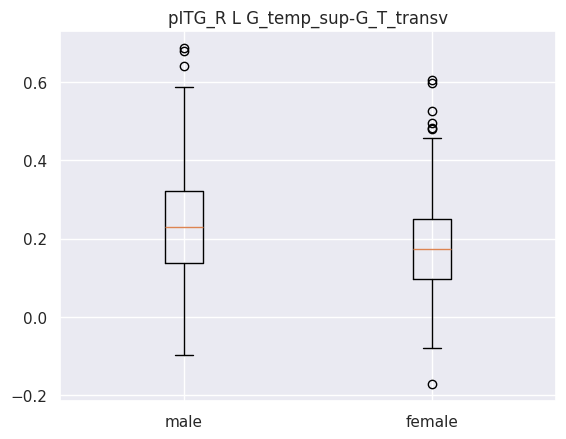

TtestResult(statistic=4.524709164152146, pvalue=7.774373381230067e-06, df=444.0)
male mean : 0.2398444346181818
male std : 0.1385572380212938
female mean : 0.1833660085743363
female std : 0.12423831506745996


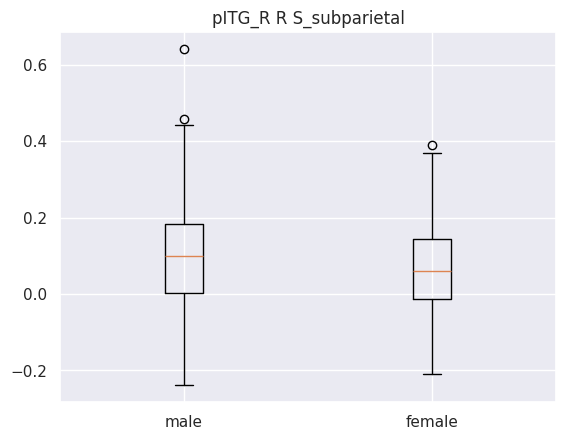

TtestResult(statistic=2.829717950526025, pvalue=0.004870145913425502, df=444.0)
male mean : 0.09907962378045454
male std : 0.14339205847252812
female mean : 0.06350742244464602
female std : 0.12080952413470375


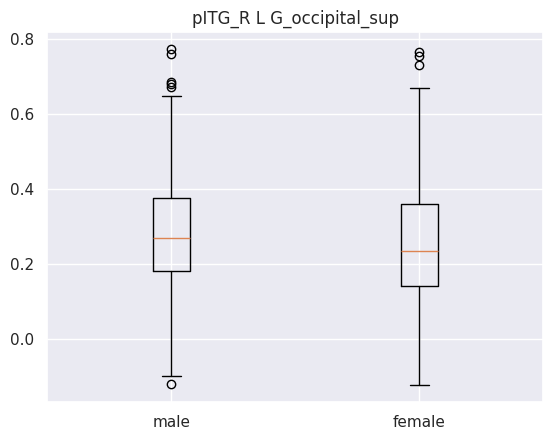

TtestResult(statistic=1.9000999167732846, pvalue=0.0580675668673942, df=444.0)
male mean : 0.2820350529227273
male std : 0.16444488939612117
female mean : 0.2527341717604425
female std : 0.1604892713694592
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [21]:
rois = ["pITG_R"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_pITG_R)
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
sensitivity = data_results["confusion_matrix"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))
bestRegion(ROIs, data, df_boot)

## Best regions planumtemp_L

     coefficient          seed                       labels
60      0.285785  planumtemp_L  L S_oc-temp_med_and_Lingual
66      0.214379  planumtemp_L              L S_postcentral
108     0.189177  planumtemp_L      R G_temp_sup-Plan_polar
20      0.177437  planumtemp_L      L G_oc-temp_lat-fusifor
99      0.169222  planumtemp_L      R G_pariet_inf-Supramar
32      0.146572  planumtemp_L      L G_temp_sup-G_T_transv
84      0.144802  planumtemp_L                   R G_cuneus
124     0.140053  planumtemp_L       R S_collat_transv_post
97      0.137739  planumtemp_L                  R G_orbital
12      0.137529  planumtemp_L        L G_front_inf-Orbital
The mean accuracy : 0.7954433333333334
The standard deviation of the accuracy : 0.04432193948546348
The lower boundry of the confidance interval of the accuracy : 0.708572331941825
The upper boundry of the confidance interval of the accuracy : 0.8823143347248418
Mean sensitivity : 0.7915346005222705 Std sensitivity : 0.051554777928525294


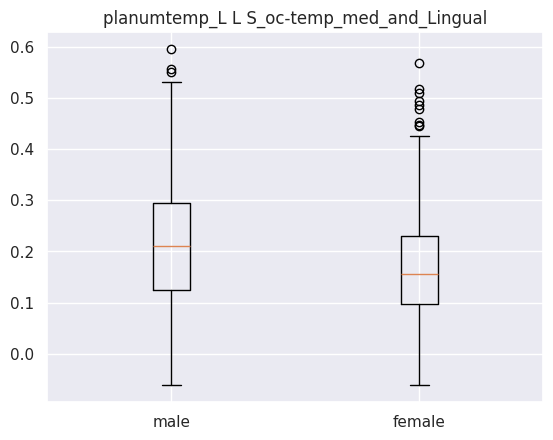

TtestResult(statistic=3.568169946152254, pvalue=0.00039862792533886367, df=444.0)
male mean : 0.21577463173863637
male std : 0.11920041520251866
female mean : 0.17618120696902656
female std : 0.11460830695377548


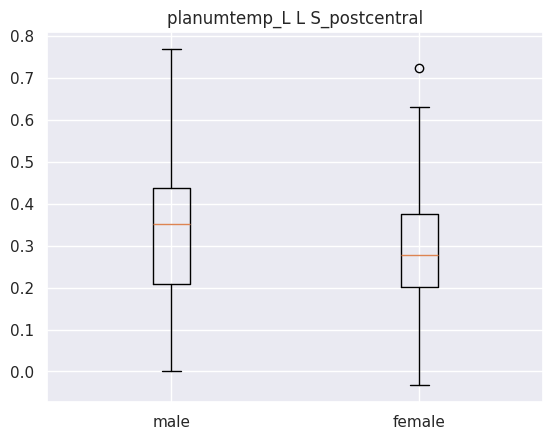

TtestResult(statistic=3.3982524664602822, pvalue=0.0007393236091411032, df=444.0)
male mean : 0.33581050932090906
male std : 0.15519364606058975
female mean : 0.28810105651946905
female std : 0.14043859969892733


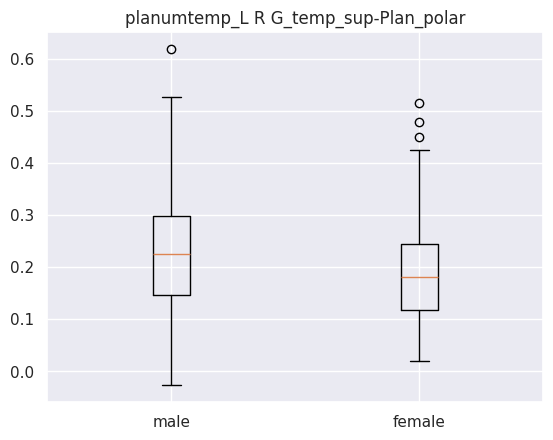

TtestResult(statistic=4.42054857038295, pvalue=1.2391524231536645e-05, df=444.0)
male mean : 0.231116042775
male std : 0.10743291511827939
female mean : 0.18849037465929203
female std : 0.09554310246985663


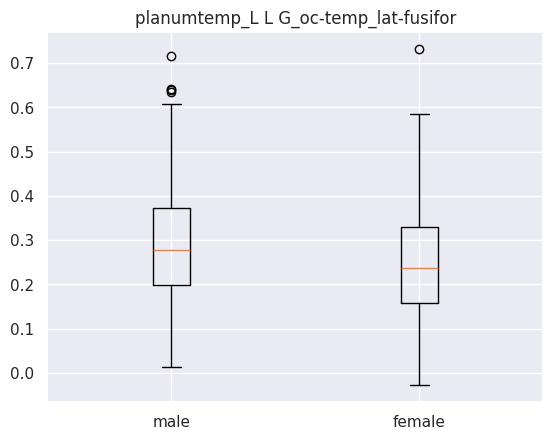

TtestResult(statistic=3.7622305190657452, pvalue=0.0001909807101357603, df=444.0)
male mean : 0.2942304806272728
male std : 0.13292350850751689
female mean : 0.24918162700884958
female std : 0.119170924743853


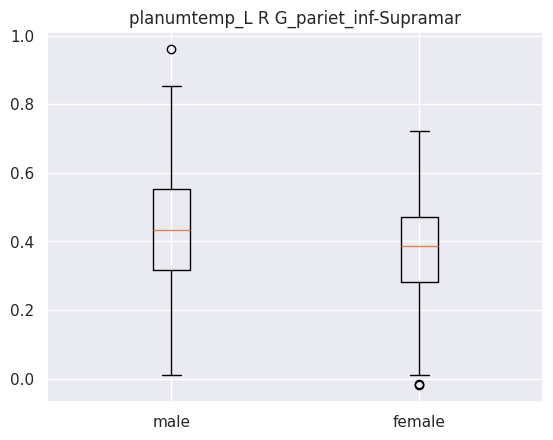

TtestResult(statistic=3.40846885515764, pvalue=0.0007128702515509998, df=444.0)
male mean : 0.4307228165545455
male std : 0.17295636548930826
female mean : 0.3790449651415929
female std : 0.14569081362589828


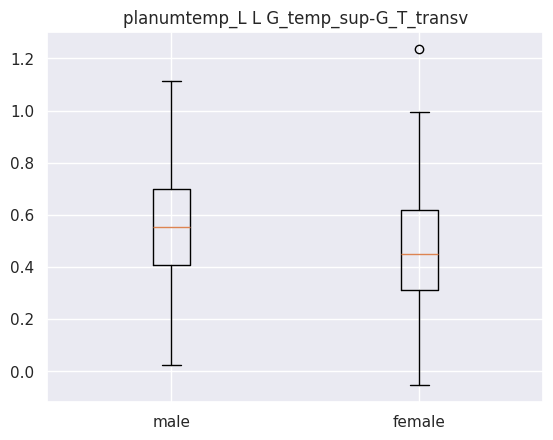

TtestResult(statistic=4.257820644190498, pvalue=2.5208094311888567e-05, df=444.0)
male mean : 0.5589595099318182
male std : 0.21319300616377004
female mean : 0.4754513254070797
female std : 0.20000588864178753


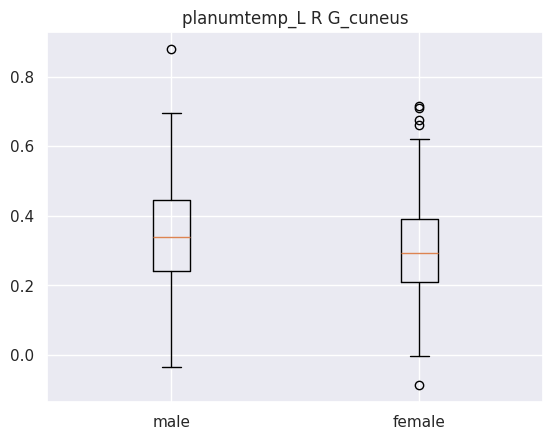

TtestResult(statistic=2.779045702868326, pvalue=0.005683247460462339, df=444.0)
male mean : 0.3442871131318182
male std : 0.15448762649047768
female mean : 0.30501909665823007
female std : 0.1431606319240156


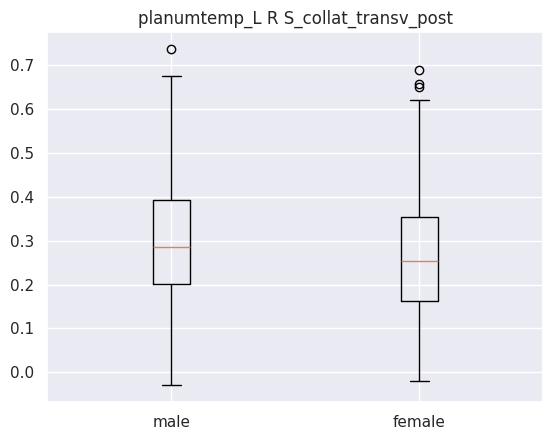

TtestResult(statistic=2.721180273283202, pvalue=0.006760590380353587, df=444.0)
male mean : 0.2982221393318182
male std : 0.14752263554395537
female mean : 0.26174931810398233
female std : 0.13476027522052467


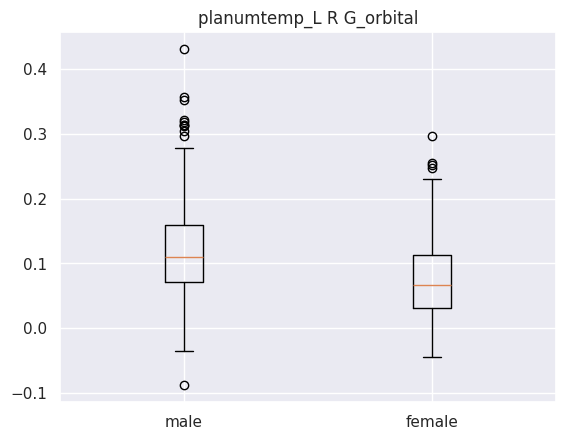

TtestResult(statistic=6.196595562626994, pvalue=1.3181987091251495e-09, df=444.0)
male mean : 0.11958186677313637
male std : 0.08248911781923307
female mean : 0.07573241422522124
female std : 0.06590387588645001


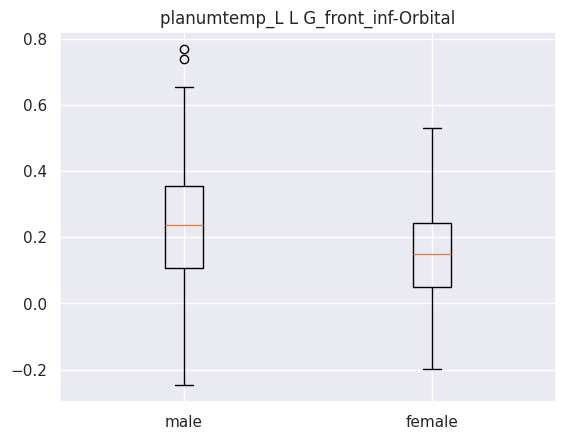

TtestResult(statistic=5.107135513546635, pvalue=4.863866810935087e-07, df=444.0)
male mean : 0.23303983193518182
male std : 0.172649773101282
female mean : 0.15810105575973452
female std : 0.13467953472609615
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [22]:
rois = ["planumtemp_L"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_planumtemp_L)
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
sensitivity = data_results["confusion_matrix"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))
bestRegion(ROIs, data, df_boot)

## Best regions planumtemp_R

     coefficient          seed                       labels
72      0.223593  planumtemp_R             L S_temporal_sup
60      0.222028  planumtemp_R  L S_oc-temp_med_and_Lingual
47      0.216804  planumtemp_R      L S_circular_insula_inf
108     0.211511  planumtemp_R      R G_temp_sup-Plan_polar
121     0.186898  planumtemp_R      R S_circular_insula_inf
145     0.171646  planumtemp_R             R S_temporal_inf
139     0.167862  planumtemp_R             R S_pericallosal
78      0.152822  planumtemp_R   R G_and_S_transv_frontopol
80      0.145916  planumtemp_R     R G_and_S_cingul-Mid-Ant
32      0.144998  planumtemp_R      L G_temp_sup-G_T_transv
The mean accuracy : 0.7970066666666668
The standard deviation of the accuracy : 0.04447058070396819
The lower boundry of the confidance interval of the accuracy : 0.709844328486889
The upper boundry of the confidance interval of the accuracy : 0.8841690048464445
Mean sensitivity : 0.7893166242418801 Std sensitivity : 0.0515266336808596
Me

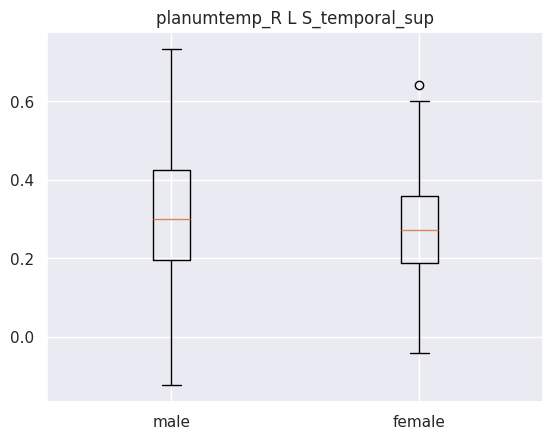

TtestResult(statistic=1.8695975920657857, pvalue=0.06219767425438533, df=444.0)
male mean : 0.3054438005095454
male std : 0.16618568479496404
female mean : 0.2788564426159292
female std : 0.13193744183702244


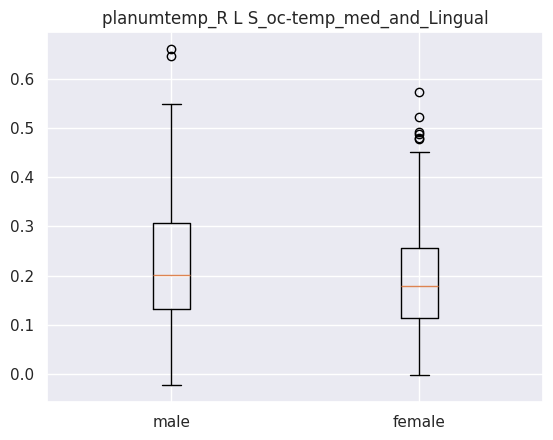

TtestResult(statistic=3.1406026539933913, pvalue=0.001798634977217268, df=444.0)
male mean : 0.22554338915745453
male std : 0.12167229969009292
female mean : 0.19155830762477874
female std : 0.10599522757213717


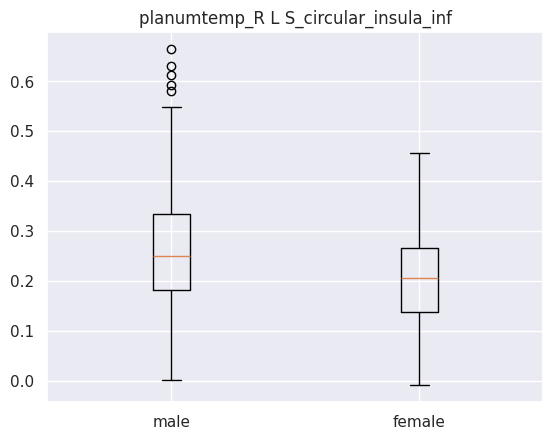

TtestResult(statistic=5.536682319675686, pvalue=5.283850273823166e-08, df=444.0)
male mean : 0.26314078573
male std : 0.11589033220243106
female mean : 0.20795944492035398
female std : 0.09317104682445226


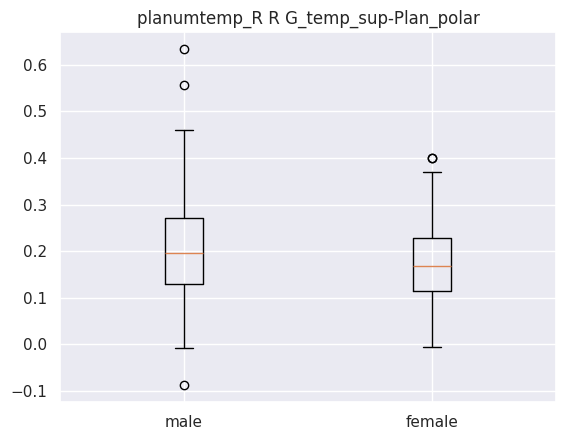

TtestResult(statistic=3.411258353986623, pvalue=0.0007058022781917119, df=444.0)
male mean : 0.20694257242727274
male std : 0.10325686123318684
female mean : 0.17643976180088497
female std : 0.08445412241365245


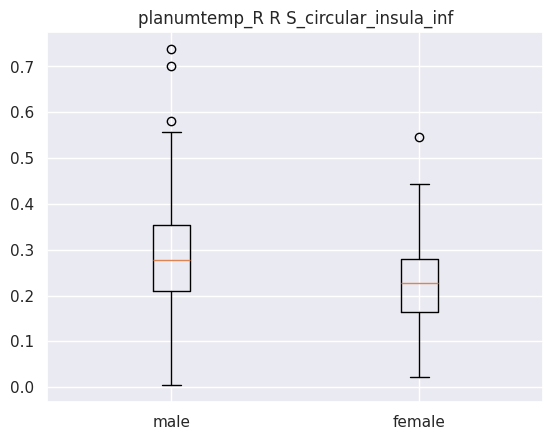

TtestResult(statistic=5.673022197146965, pvalue=2.5335329424316272e-08, df=444.0)
male mean : 0.28464964156636363
male std : 0.11115068945139177
female mean : 0.22998609894690267
female std : 0.0911493316406924


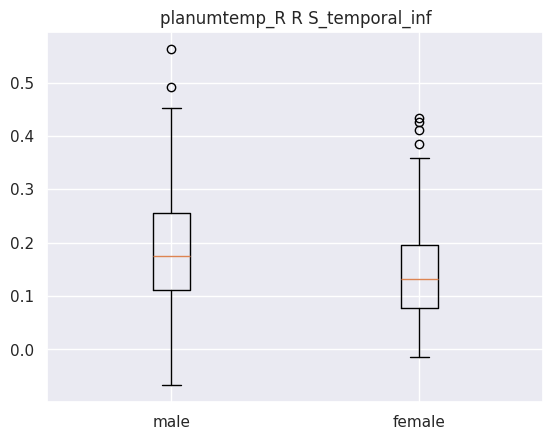

TtestResult(statistic=5.093445831834155, pvalue=5.207770662763331e-07, df=444.0)
male mean : 0.19109833336272727
male std : 0.11146610197202778
female mean : 0.14283558278274336
female std : 0.08700087808711052


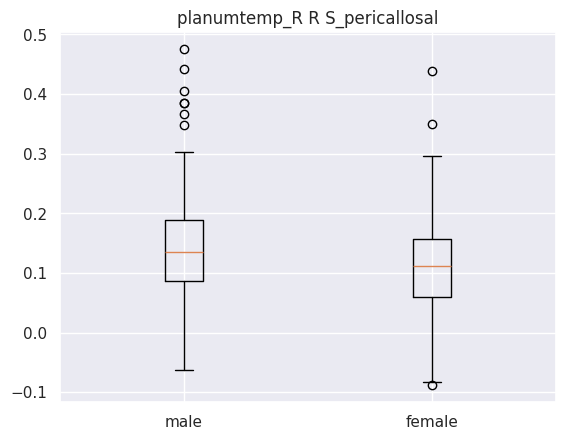

TtestResult(statistic=4.099512012037479, pvalue=4.9237855822734976e-05, df=444.0)
male mean : 0.14388453827454545
male std : 0.08547370646470348
female mean : 0.11232528979557523
female std : 0.07660129004358317


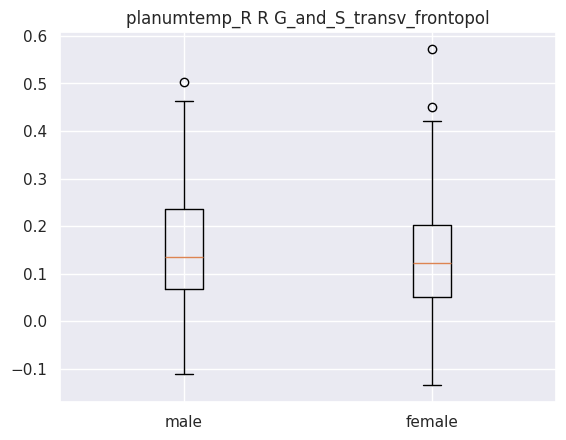

TtestResult(statistic=1.6197574048200072, pvalue=0.10599440842770202, df=444.0)
male mean : 0.14979874731818182
male std : 0.12757857054837393
female mean : 0.13102783685654867
female std : 0.11648592660505695


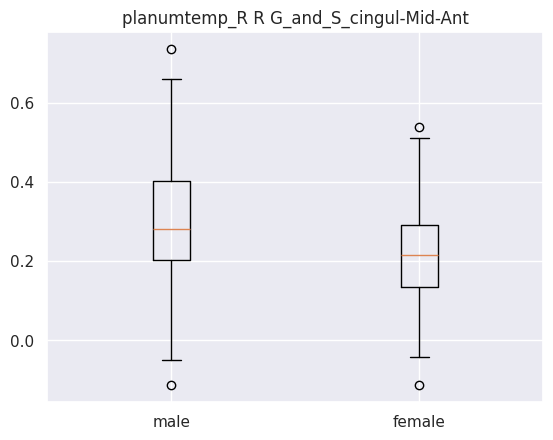

TtestResult(statistic=6.25879902032395, pvalue=9.150965155556426e-10, df=444.0)
male mean : 0.2963763690363636
male std : 0.14184665808875968
female mean : 0.22059838039203541
female std : 0.11188772976763034


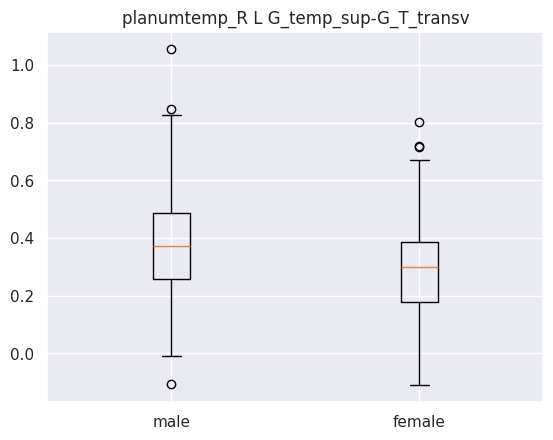

TtestResult(statistic=5.327111610985564, pvalue=1.5894850932283935e-07, df=444.0)
male mean : 0.3784629311636364
male std : 0.18082731693617612
female mean : 0.29372215279778763
female std : 0.15359132563789854
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [23]:
rois = ["planumtemp_R"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_planumtemp_R)
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
sensitivity = data_results["confusion_matrix"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))
bestRegion(ROIs, data, df_boot)

## Best regions for all left seeds

     coefficient          seed                       labels
53      0.123777       opIFG_L                L S_front_sup
98      0.113710       opIFG_L       R G_pariet_inf-Angular
351     0.105832        aMTG_L  L S_intrapariet_and_P_trans
421     0.105135        aMTG_L                R S_front_inf
322     0.103736        aMTG_L             L G_parietal_sup
305     0.100285        aMTG_L      L G_cingul-Post-ventral
4       0.100128       opIFG_L   L G_and_S_transv_frontopol
431     0.095805        aMTG_L          R S_orbital_lateral
273     0.093985  planumtemp_L                R S_front_inf
55      0.088499       opIFG_L  L S_intrapariet_and_P_trans
The mean accuracy : 0.9125455555555558
The standard deviation of the accuracy : 0.03167706104259511
The lower boundry of the confidance interval of the accuracy : 0.8504585159120694
The upper boundry of the confidance interval of the accuracy : 0.9746325951990422
Mean sensitivity : 0.9134898379989987 Std sensitivity : 0.04150831932387169


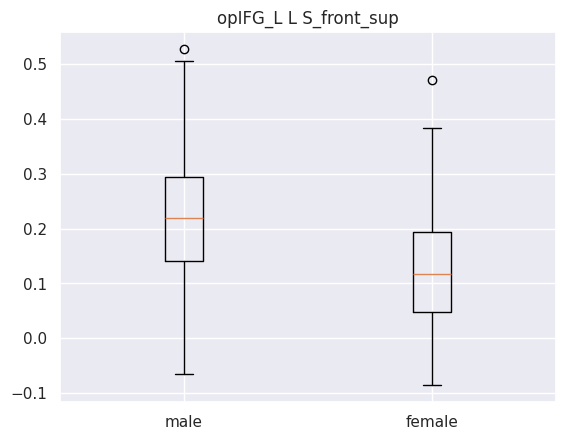

TtestResult(statistic=9.514226955534408, pvalue=1.1745948061525577e-19, df=444.0)
male mean : 0.22193633239999996
male std : 0.11249626112199279
female mean : 0.12588911007571682
female std : 0.10000267392277586


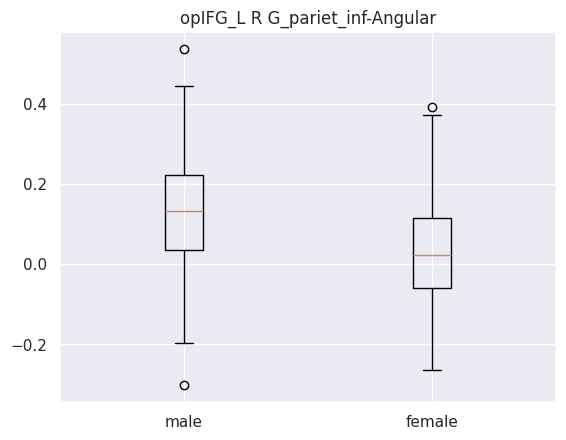

TtestResult(statistic=7.24780487230096, pvalue=1.8918423767886693e-12, df=444.0)
male mean : 0.12424016548681818
male std : 0.13424300726761648
female mean : 0.03453558849026549
female std : 0.1265180924203619


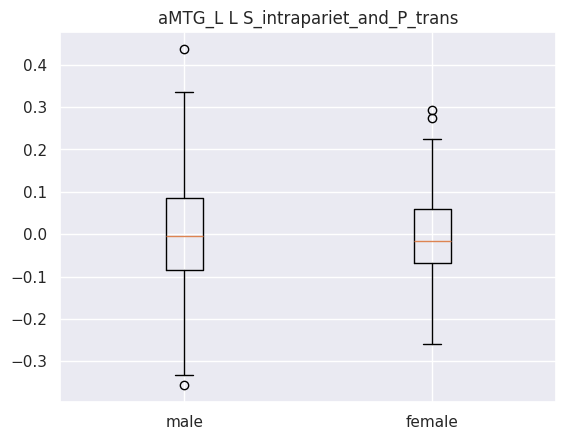

TtestResult(statistic=1.0441439448576817, pvalue=0.29698694253266955, df=444.0)
male mean : 0.004413317491818183
male std : 0.12667357592144304
female mean : -0.006823133387610619
female std : 0.09870796418027704


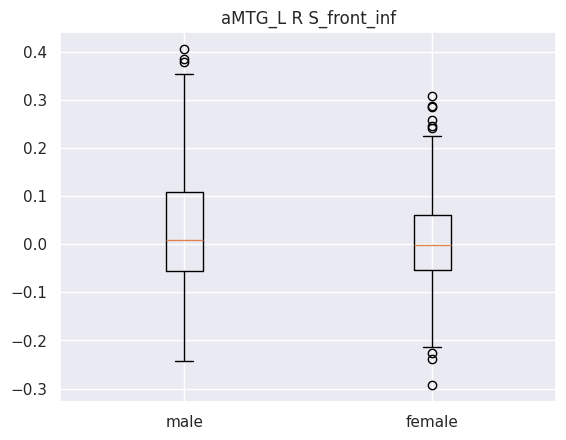

TtestResult(statistic=1.9193910426129293, pvalue=0.055575465964615225, df=444.0)
male mean : 0.025140619681999998
male std : 0.12506768589238804
female mean : 0.004515161334216815
female std : 0.10031688528841444


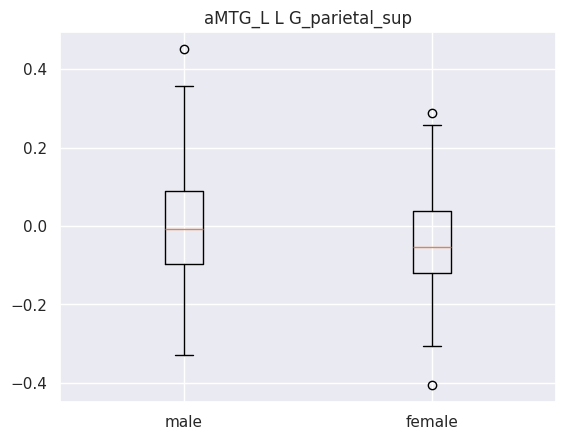

TtestResult(statistic=3.4850474873752884, pvalue=0.0005409444654669903, df=444.0)
male mean : 0.003152544490909089
male std : 0.1486536903265774
female mean : -0.040841305016592916
female std : 0.11571389999440254


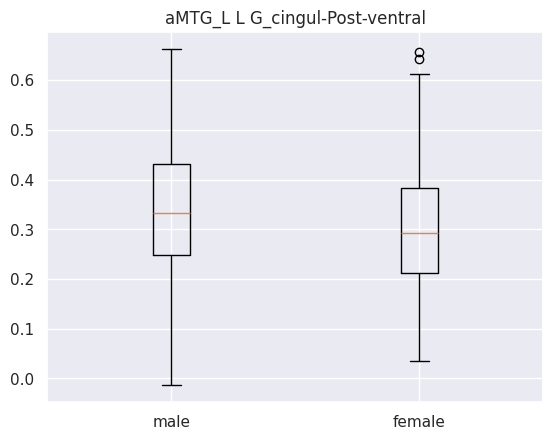

TtestResult(statistic=2.7358247046655375, pvalue=0.006471799539479473, df=444.0)
male mean : 0.3344936346227273
male std : 0.12852301357983476
female mean : 0.30081479229646013
female std : 0.1308069984904627


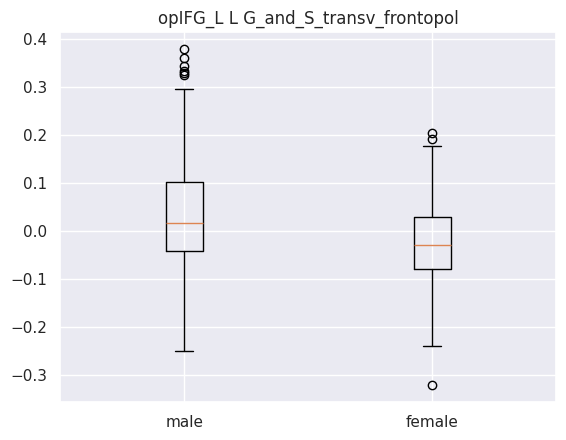

TtestResult(statistic=5.033838587916691, pvalue=6.999625036984745e-07, df=444.0)
male mean : 0.025597121174999998
male std : 0.11515068596736391
female mean : -0.023709215497699117
female std : 0.09002691208082556


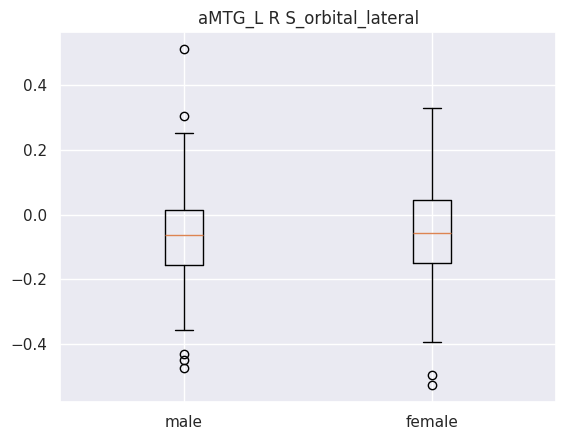

TtestResult(statistic=-0.9595545169231156, pvalue=0.337801699063937, df=444.0)
male mean : -0.06771869820213636
male std : 0.14263363470452184
female mean : -0.05464536117588496
female std : 0.14439482773638504


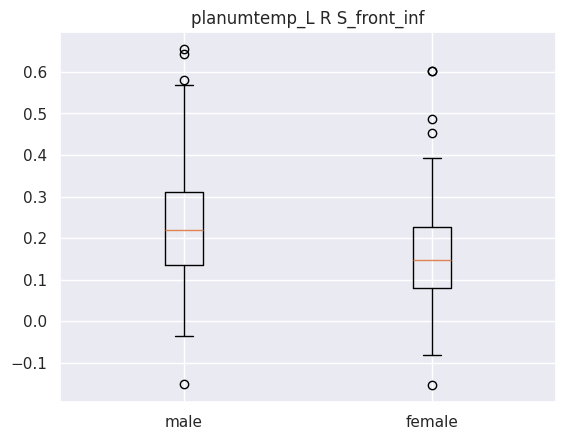

TtestResult(statistic=5.587999239745126, pvalue=4.0136433383783943e-08, df=444.0)
male mean : 0.2274188739409091
male std : 0.1272630755767123
female mean : 0.16257370877256638
female std : 0.11716102765540921


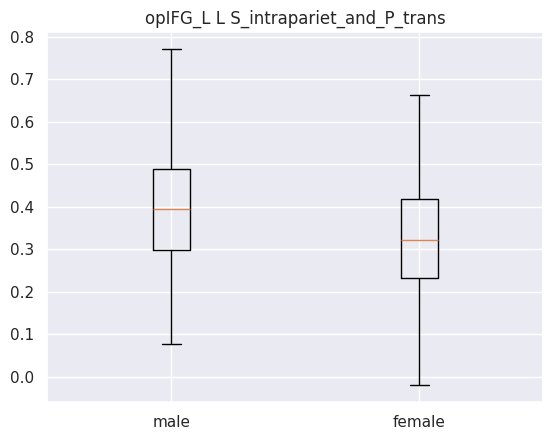

TtestResult(statistic=5.1258862531393055, pvalue=4.4282893375816664e-07, df=444.0)
male mean : 0.3898567061545455
male std : 0.13731628353334865
female mean : 0.32281164144557517
female std : 0.1382510384328816
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [24]:
rois = ["opIFG_L", "planumtemp_L", "aMTG_L", "pITG_L"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_all_left)
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
sensitivity = data_results["confusion_matrix"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))
bestRegion(ROIs, data, df_boot)

## Best regions of all right seeds

     coefficient          seed                       labels
53      0.134322       opIFG_R                L S_front_sup
66      0.114011       opIFG_R              L S_postcentral
316     0.104480        aMTG_R      L G_oc-temp_lat-fusifor
55      0.103655       opIFG_R  L S_intrapariet_and_P_trans
421     0.103610        aMTG_R                R S_front_inf
379     0.094846        aMTG_R      R G_cingul-Post-ventral
239     0.092743  planumtemp_R            R G_insular_short
522     0.086193        pITG_R   R G_and_S_transv_frontopol
273     0.085974  planumtemp_R                R S_front_inf
228     0.084403  planumtemp_R     R G_and_S_cingul-Mid-Ant
The mean accuracy : 0.8903488888888891
The standard deviation of the accuracy : 0.03524470722894888
The lower boundry of the confidance interval of the accuracy : 0.8212692627201492
The upper boundry of the confidance interval of the accuracy : 0.9594285150576289
Mean sensitivity : 0.8889100879516413 Std sensitivity : 0.044828656788072456

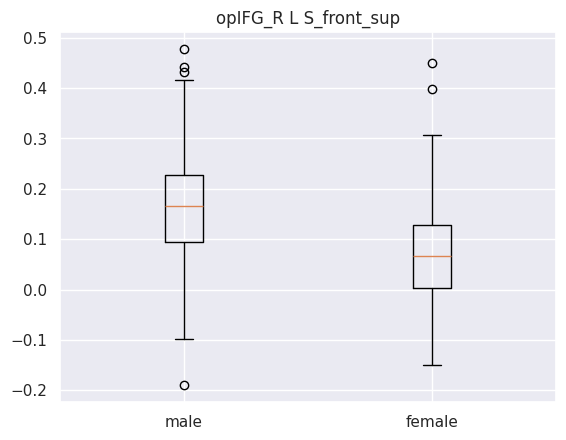

TtestResult(statistic=9.215326889220611, pvalue=1.248160215367442e-18, df=444.0)
male mean : 0.16320744882072724
male std : 0.10965043228920933
female mean : 0.07219020907314161
female std : 0.09828873030252666


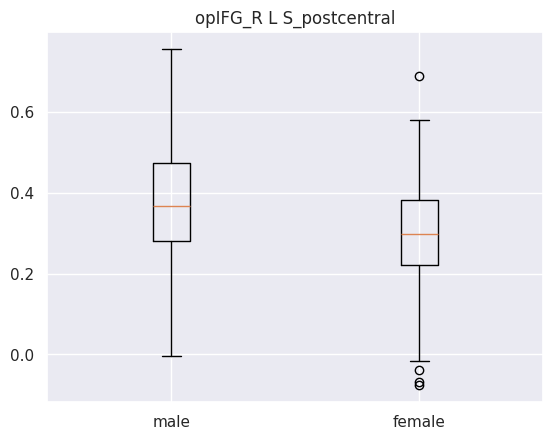

TtestResult(statistic=5.748096942910928, pvalue=1.6798182257112908e-08, df=444.0)
male mean : 0.37275803086818177
male std : 0.13910319518939593
female mean : 0.29995721800884956
female std : 0.12765335683486648


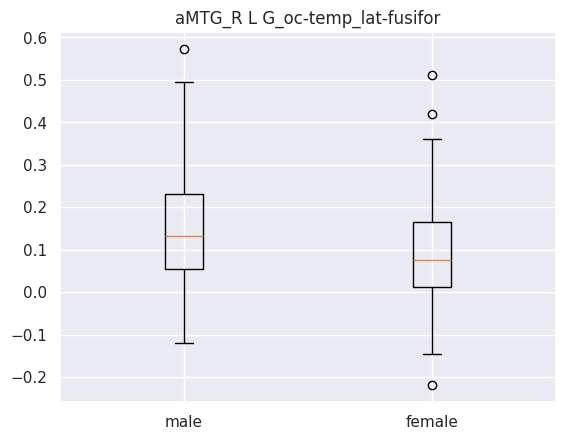

TtestResult(statistic=5.157132505636498, pvalue=3.7849853475325553e-07, df=444.0)
male mean : 0.15163267344727274
male std : 0.13083327172091533
female mean : 0.09148790766993664
female std : 0.11456737640495235


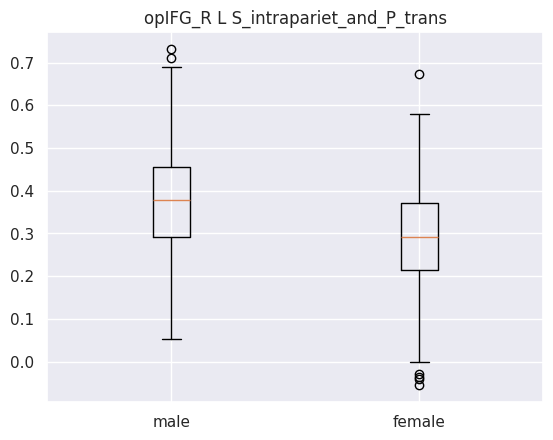

TtestResult(statistic=7.525715474692434, pvalue=2.943978024764579e-13, df=444.0)
male mean : 0.3783558262136364
male std : 0.13092386861978492
female mean : 0.2881963432641593
female std : 0.1214409141686982


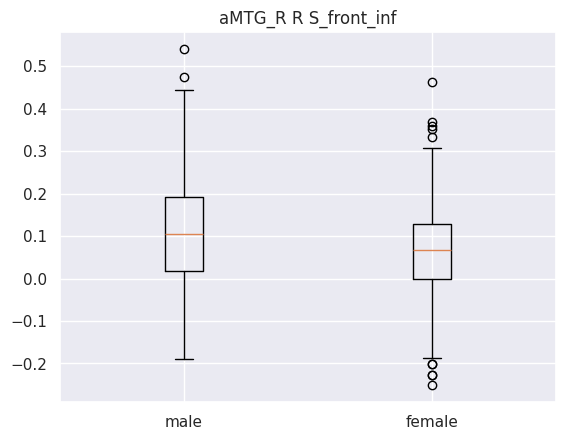

TtestResult(statistic=3.956278857457922, pvalue=8.86001863789618e-05, df=444.0)
male mean : 0.10791621693545454
male std : 0.12931995413969696
female mean : 0.06154310212610619
female std : 0.11751957032303513


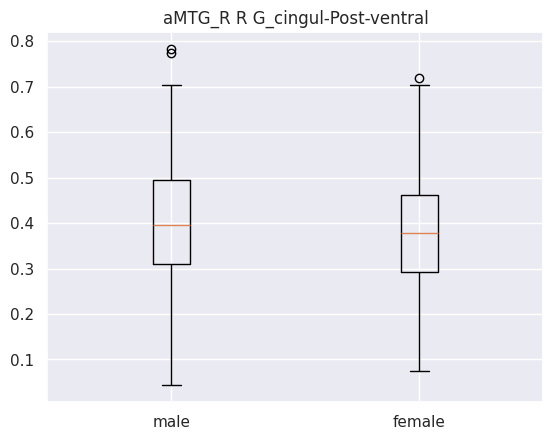

TtestResult(statistic=1.908818782319767, pvalue=0.056929922966081396, df=444.0)
male mean : 0.3987402407954545
male std : 0.13795183996980973
female mean : 0.37419803800884954
female std : 0.1329643689111022


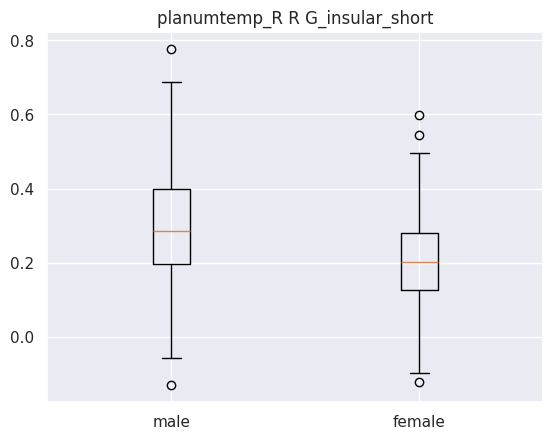

TtestResult(statistic=7.239063193304473, pvalue=2.0041429727150364e-12, df=444.0)
male mean : 0.29305110629318176
male std : 0.14523358447346782
female mean : 0.2019796631004425
female std : 0.11887194196042161


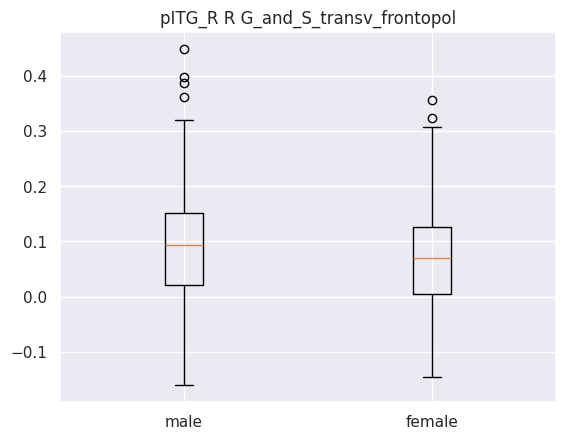

TtestResult(statistic=2.652366977979778, pvalue=0.008279246837594543, df=444.0)
male mean : 0.09232632171545455
male std : 0.10090598868239635
female mean : 0.06824433925265487
female std : 0.09023806023391034


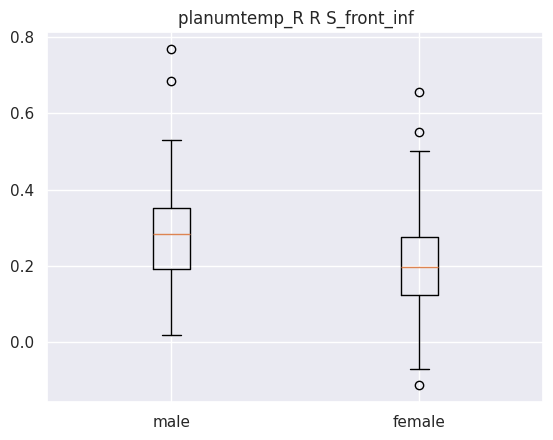

TtestResult(statistic=6.639061278911552, pvalue=9.234462597542052e-11, df=444.0)
male mean : 0.2812065720636364
male std : 0.1191306123770796
female mean : 0.20553979665486727
female std : 0.12096998265755837


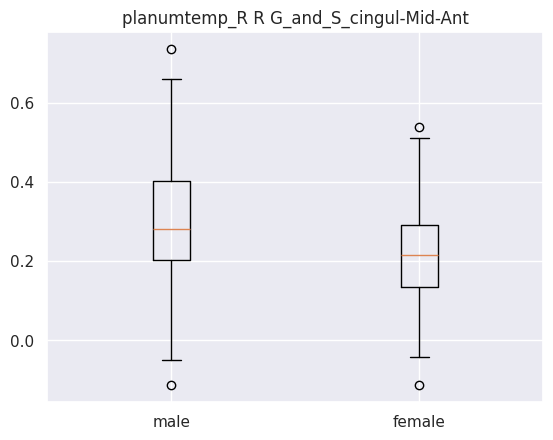

TtestResult(statistic=6.25879902032395, pvalue=9.150965155556426e-10, df=444.0)
male mean : 0.2963763690363636
male std : 0.14184665808875968
female mean : 0.22059838039203541
female std : 0.11188772976763034
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [25]:
rois = ["opIFG_R", "planumtemp_R", "aMTG_R", "pITG_R"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_all_right)
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
sensitivity = data_results["confusion_matrix"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))
bestRegion(ROIs, data, df_boot)

# Noise testing

In [15]:
study_dir = Path('/data/brambati/dataset/HCP/derivatives/training_sex_diff/')
results_path_all_seed = study_dir / "results_no_02" / "LinearSVC" / "seed-all_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"

moyenne, scoresZ, pvalue, data_results = compute_results(results_path_all_seed)

In [16]:
model_test = data_results["model"][random.randint(0, 10000)]
gender_test = np.asarray(df_boot["Gender"])
score, perm_score, p_val = permutation_test_score(model_test, x_correl, gender_test)

In [17]:
acc_iter = []
model_test = data_results["model"][random.randint(0, 10000)]
for i in range(0, 10000):
    gender_test = np.asarray(df_boot["Gender"])
    np.random.shuffle(gender_test)
    acc_rand = model_test.score(x_correl, gender_test)
    acc_iter.append(acc_rand)
    
acc_iter = np.asarray(acc_iter)

In [18]:
gender_test = np.asarray(df_boot["Gender"])
x_correl.size

528064

(0.4, 1.0)

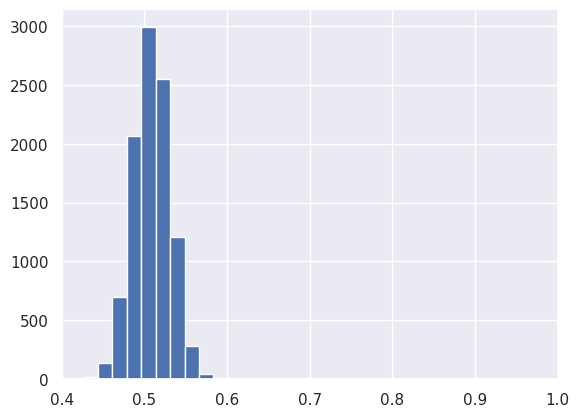

In [19]:
plt.hist(acc_iter)
plt.xlim([0.4, 1])

In [20]:
# accuracy should be around 0.50 (50%) if not it's a problem
acc_iter.mean()

0.5082058295964127

# Permutation testing

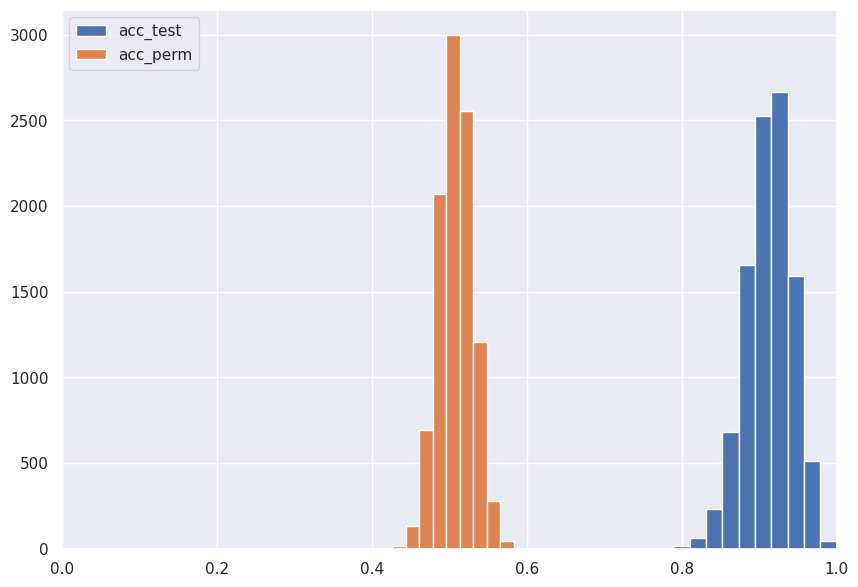

In [21]:
f = plt.figure()
plt.hist(data_results["acc_test"], label="acc_test")
plt.hist(acc_iter, label="acc_perm")
plt.legend(loc="upper left")
plt.xlim([0, 1])
f.set_figwidth(10)
f.set_figheight(7)

In [22]:
t_test = stats.ttest_ind(data_results["acc_test"], acc_iter)
print(t_test.pvalue)

0.0


# Independent validation testing (60/20/20) with z-transformed applied on r-pearson score

In [20]:
study_dir = Path('/data/brambati/dataset/HCP/derivatives/training_sex_diff/')
results_path_all_seed = study_dir / "results_no_02" / "LinearSVC" / "seed-all_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_aMTG_L = study_dir / "results_no_02" / "LinearSVC" / "seed-aMTG_L_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_aMTG_R = study_dir / "results_no_02" / "LinearSVC" / "seed-aMTG_R_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_opIFG_L = study_dir / "results_no_02" / "LinearSVC" / "seed-opIFG_L_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_opIFG_R = study_dir / "results_no_02" / "LinearSVC" / "seed-opIFG_R_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_pITG_L = study_dir / "results_no_02" / "LinearSVC" / "seed-pITG_L_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_pITG_R = study_dir / "results_no_02" / "LinearSVC" / "seed-pITG_R_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_planumtemp_L = study_dir / "results_no_02" / "LinearSVC" / "seed-planumtemp_L_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_planumtemp_R = study_dir / "results_no_02" / "LinearSVC" / "seed-planumtemp_R_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_all_left = study_dir / "results_no_02" / "LinearSVC" / "seed-left_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_all_right = study_dir / "results_no_02" / "LinearSVC" / "seed-right_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"

# FYI do not interpret the regions just look at the mean accuraccy which is the mean accuracy of the model on the validation sample

In [21]:
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_all_seed)

In [22]:
# mean confusion matrix
pdList = []
pdList.extend(data_results["confusion_matrix"])
concat_df = pd.concat(pdList)
mean_confusion = concat_df.groupby(concat_df.index)
mean_confusion = mean_confusion.mean()
print(mean_confusion)
sensitivity = data_results["confusion_matrix"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))

predicted class    Femme    Homme
actual class                     
Femme            43.9844   3.4564
Homme             4.3309  38.2283
Mean sensitivity : 0.9120698694753885 Std sensitivity : 0.04042987184339213
Mean specificity : 0.9189286442384533 Std specificity : 0.04301135593813137


In [23]:
# mean confusion matrix of the validation set
pdList = []
pdList.extend(data_results["confusion_matrix_validation"])
concat_df = pd.concat(pdList)
mean_confusion = concat_df.groupby(concat_df.index)
mean_confusion = mean_confusion.mean()
print(mean_confusion)
sensitivity = data_results["confusion_matrix_validation"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix_validation"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))

predicted class    Femme    Homme
actual class                     
Femme            44.7009   8.2991
Homme            16.1769  42.8231
Mean sensitivity : 0.7355723984184112 Std sensitivity : 0.031584241502584716
Mean specificity : 0.8390025764872804 Std specificity : 0.03335277222597128


## Best regions all seed validation accuraccy results no 02

Validation accuracy
The mean accuracy : 0.7814642857142857
The standard deviation of the accuracy : 0.026529765243543918
The lower boundry of the confidance interval of the accuracy : 0.7294659458369397
The upper boundry of the confidance interval of the accuracy : 0.8334626255916318

Confusion matrix (mean) :
predicted class    Femme    Homme
actual class                     
Femme            44.7009   8.2991
Homme            16.1769  42.8231
Mean sensitivity : 0.7355723984184112 Std sensitivity : 0.031584241502584716
Mean specificity : 0.8390025764872804 Std specificity : 0.03335277222597128

Testing accuracy
      coefficient          seed                       labels
263      0.071801  planumtemp_L             R Pole_occipital
98       0.066985       opIFG_L       R G_pariet_inf-Angular
1090     0.066145        pITG_R       L S_interm_prim-Jensen
189      0.063483  planumtemp_L             L Pole_occipital
351      0.051789        aMTG_L  L S_intrapariet_and_P_trans
379      0.0517

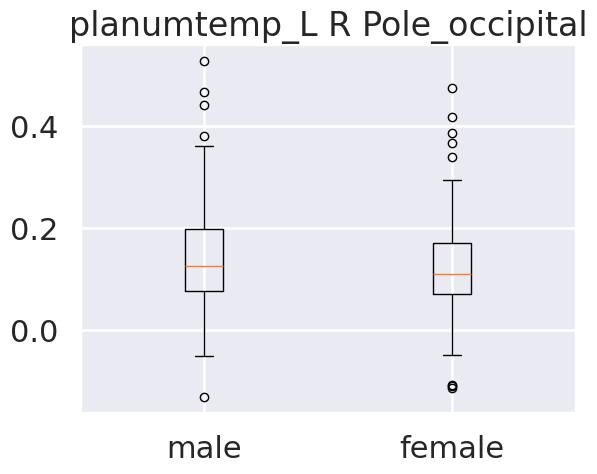

TtestResult(statistic=2.8830971461363837, pvalue=0.004129116113029113, df=444.0)
male mean : 0.1450978958106635
male std : 0.09686778643219356
female mean : 0.1200056767894468
female std : 0.08651973830457439


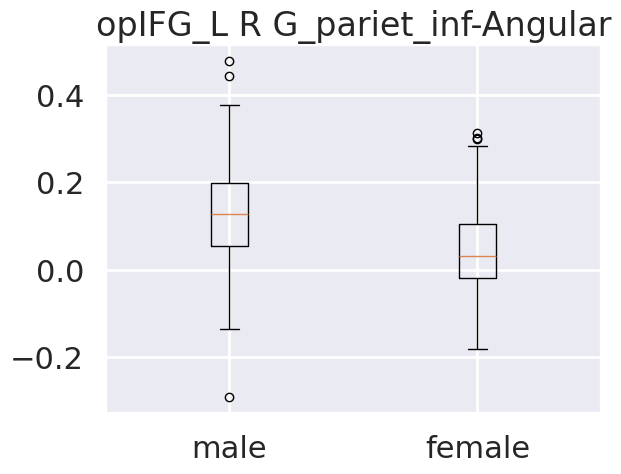

TtestResult(statistic=8.36453316136448, pvalue=7.884044598818814e-16, df=444.0)
male mean : 0.12652099691800947
male std : 0.11205031629586265
female mean : 0.04436252679727659
female std : 0.09482727144561362


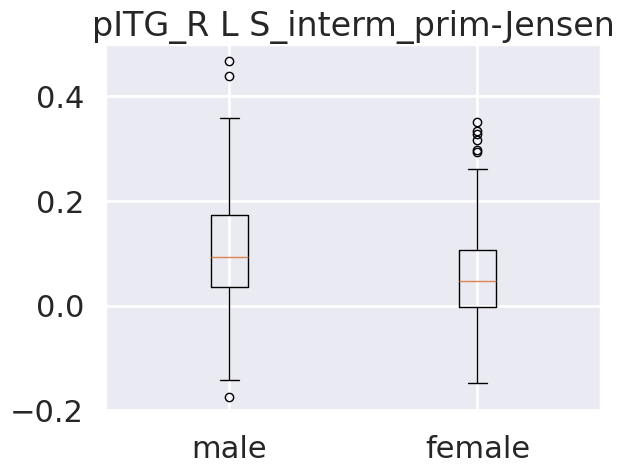

TtestResult(statistic=4.641000164550433, pvalue=4.570899935707834e-06, df=444.0)
male mean : 0.10024204454407584
male std : 0.10899325004998278
female mean : 0.056442184588638304
female std : 0.08968164578380426


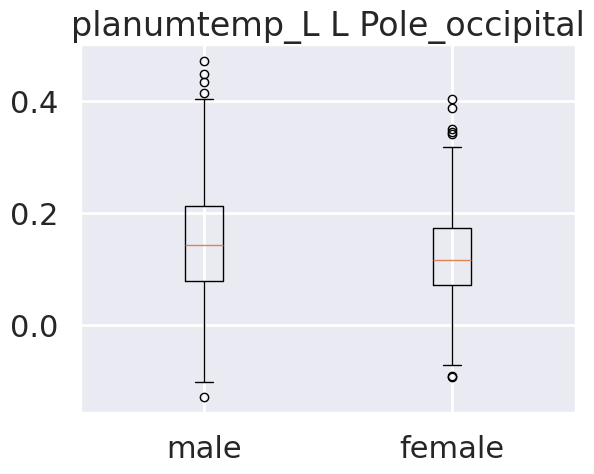

TtestResult(statistic=3.2624503110074787, pvalue=0.0011897491547535647, df=444.0)
male mean : 0.1509238786113744
male std : 0.0973540374590649
female mean : 0.12269890486851065
female std : 0.08492474456953504


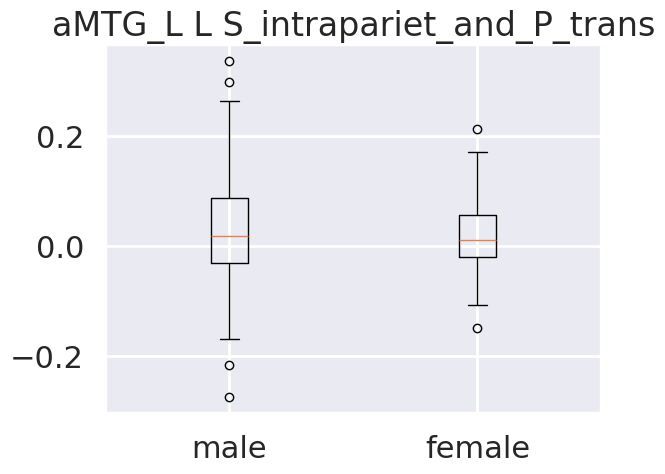

TtestResult(statistic=1.2152906043525493, pvalue=0.22490110147854064, df=444.0)
male mean : 0.027097741051184836
male std : 0.08743934494614101
female mean : 0.018400407782408514
female std : 0.06239762751688975


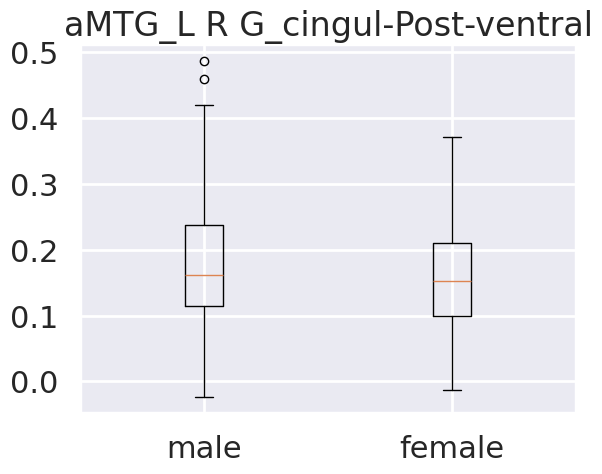

TtestResult(statistic=2.478307431460077, pvalue=0.013571417975220301, df=444.0)
male mean : 0.1782777795241706
male std : 0.09158518564726134
female mean : 0.15829262448893616
female std : 0.07828345293295201


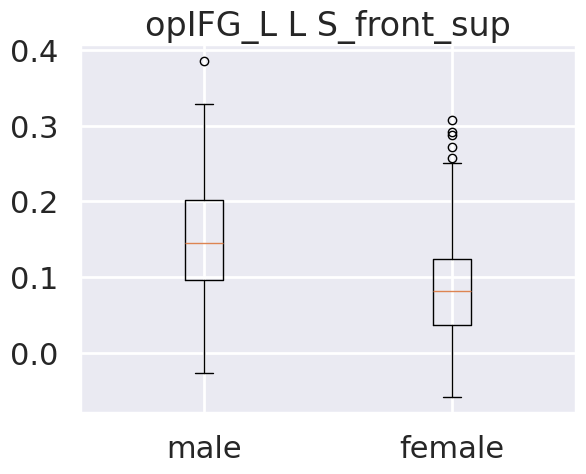

TtestResult(statistic=9.392381535030605, pvalue=3.0963588871687413e-19, df=444.0)
male mean : 0.15022324893838862
male std : 0.07243933596507521
female mean : 0.08831146950076596
female std : 0.06644850251834429


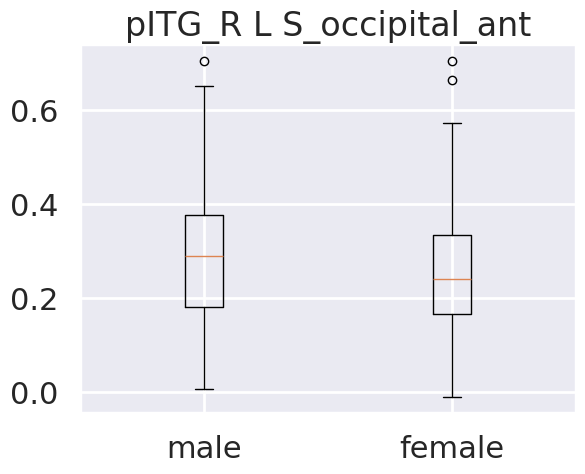

TtestResult(statistic=3.1195843617914436, pvalue=0.0019290290051488148, df=444.0)
male mean : 0.2941864701189574
male std : 0.14464420290564173
female mean : 0.2541460874319149
female std : 0.12577495870736924


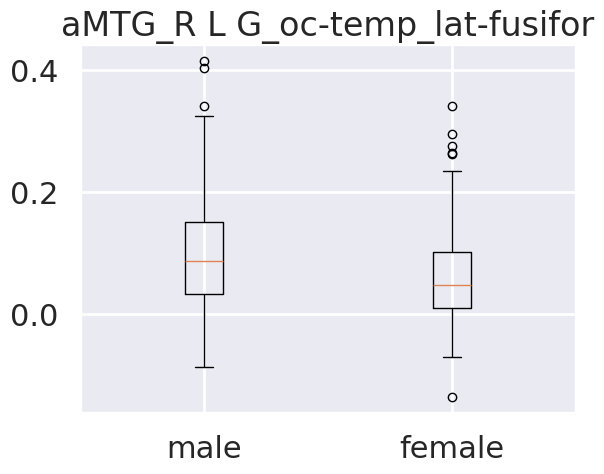

TtestResult(statistic=4.728335977215177, pvalue=3.0449299231438466e-06, df=444.0)
male mean : 0.10049291556744076
male std : 0.08873256390651249
female mean : 0.06442563383957446
female std : 0.07178152602552673


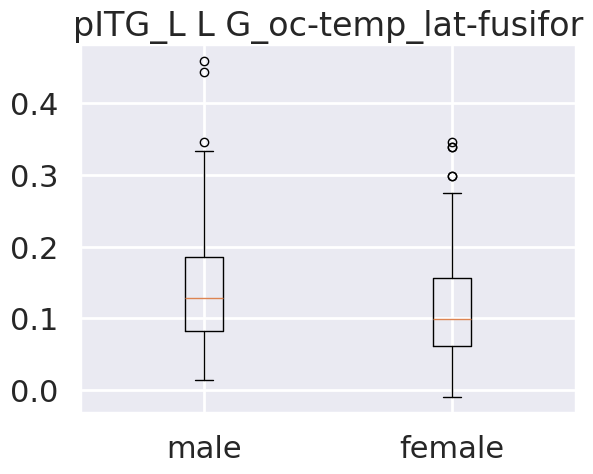

TtestResult(statistic=3.275834050563673, pvalue=0.0011360567722706225, df=444.0)
male mean : 0.13928527996682463
male std : 0.07670719318097458
female mean : 0.11658672618927658
female std : 0.06929713865976829
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [24]:
rois = ["opIFG_L", "planumtemp_L", "aMTG_L", "pITG_L", "opIFG_R", "planumtemp_R", "aMTG_R", "pITG_R"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_all_seed)


pdList = []
pdList.extend(data_results["confusion_matrix_validation"])
concat_df = pd.concat(pdList)
mean_confusion = concat_df.groupby(concat_df.index)
mean_confusion = mean_confusion.mean()


acc_vald = np.asarray(data_results["acc_validation"])
moy = np.mean(acc_vald)
se = np.std(acc_vald)
lower = moy - (1.96 * se)
upper = moy + (1.96 * se)
print("Validation accuracy")
print("The mean accuracy : " + str(moy))
print("The standard deviation of the accuracy : " + str(se))
print("The lower boundry of the confidance interval of the accuracy : " + str(lower))
print("The upper boundry of the confidance interval of the accuracy : " + str(upper))
print("\nConfusion matrix (mean) :")
print(mean_confusion)
sensitivity = data_results["confusion_matrix_validation"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix_validation"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))

print("\nTesting accuracy")
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
bestRegion(ROIs, data, df_boot)

## aMTG_L validation accuracy results no 02

Validation accuracy
The mean accuracy : 0.7034964285714286
The standard deviation of the accuracy : 0.030946445882445082
The lower boundry of the confidance interval of the accuracy : 0.6428413946418362
The upper boundry of the confidance interval of the accuracy : 0.764151462501021

Confusion matrix (mean) :
predicted class    Femme    Homme
actual class                     
Femme            41.2185  11.7815
Homme            21.4269  37.5731
Mean sensitivity : 0.6587323304978088 Std sensitivity : 0.0292818062714619
Mean specificity : 0.7642814214649036 Std specificity : 0.04627351051225694

Testing accuracy
     coefficient    seed                       labels
53      0.167188  aMTG_L                L S_front_sup
98      0.154625  aMTG_L       R G_pariet_inf-Angular
66      0.128913  aMTG_L              L S_postcentral
55      0.127359  aMTG_L  L S_intrapariet_and_P_trans
120     0.104863  aMTG_L      R S_circular_insula_ant
4       0.099770  aMTG_L   L G_and_S_transv_frontopol
61    

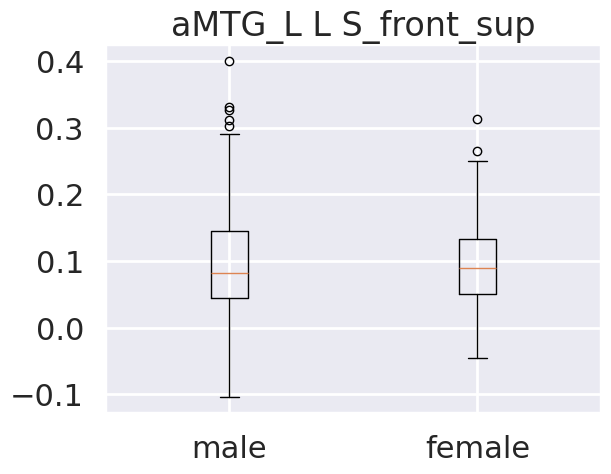

TtestResult(statistic=0.4912011671391859, pvalue=0.6235268805717777, df=444.0)
male mean : 0.09901800113601895
male std : 0.08021406273503431
female mean : 0.09568149075004256
female std : 0.06256558160246363


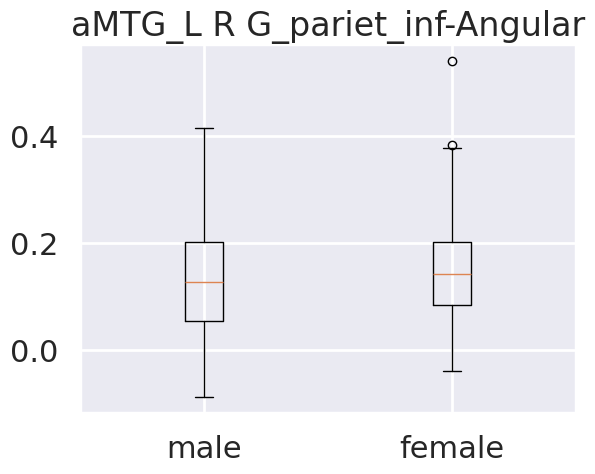

TtestResult(statistic=-2.1723621426356496, pvalue=0.030356740864042407, df=444.0)
male mean : 0.12969719007914693
male std : 0.10428542215805199
female mean : 0.14967700446608512
female std : 0.08946319459623692


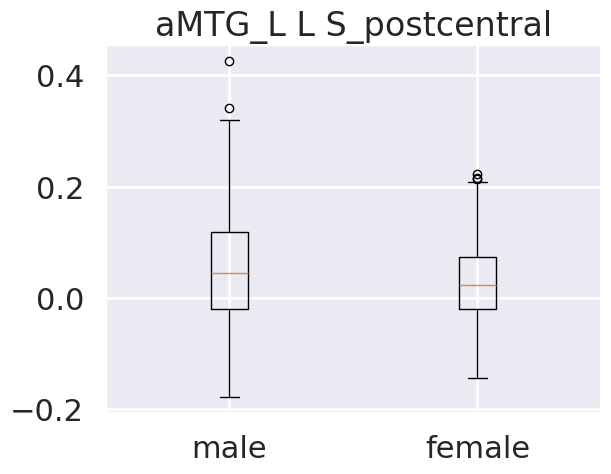

TtestResult(statistic=2.882791660383052, pvalue=0.004133047563661108, df=444.0)
male mean : 0.05474735993696683
male std : 0.09842588151574011
female mean : 0.031134386966170213
female std : 0.0734492087772794


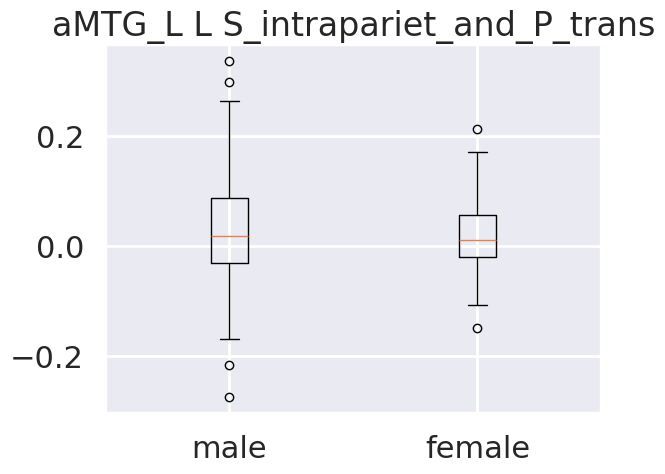

TtestResult(statistic=1.2152906043525493, pvalue=0.22490110147854064, df=444.0)
male mean : 0.027097741051184836
male std : 0.08743934494614101
female mean : 0.018400407782408514
female std : 0.06239762751688975


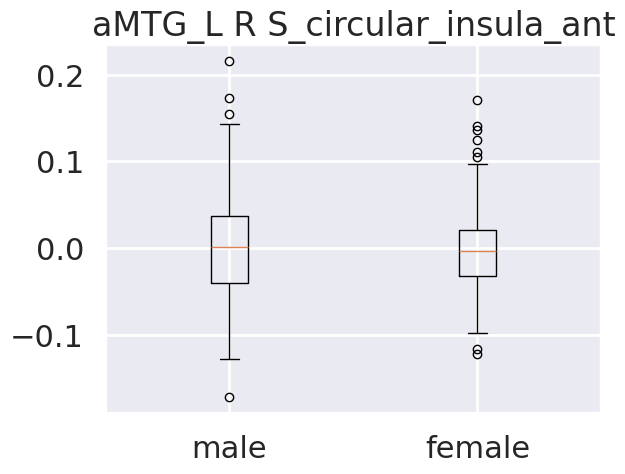

TtestResult(statistic=1.0675361148925908, pvalue=0.2863099057689824, df=444.0)
male mean : 0.0041714620607109015
male std : 0.06150850708774946
female mean : -0.0013528425582042553
female std : 0.04720231424207986


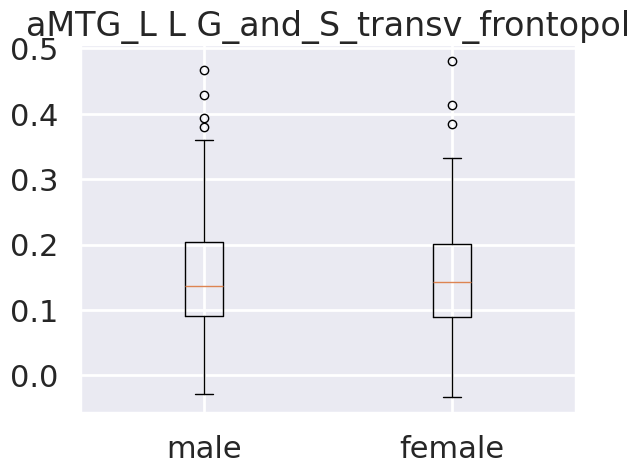

TtestResult(statistic=0.5773645319947094, pvalue=0.5639858742675287, df=444.0)
male mean : 0.15167272553592415
male std : 0.08338962473270713
female mean : 0.14714256017404256
female std : 0.08178101114464006


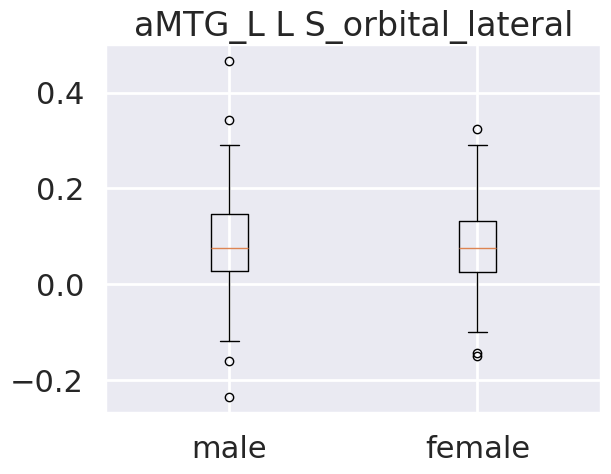

TtestResult(statistic=0.3199348330099824, pvalue=0.7491682265363367, df=444.0)
male mean : 0.08535453124069668
male std : 0.09821864005564646
female mean : 0.08268680981689362
female std : 0.07709003716886952


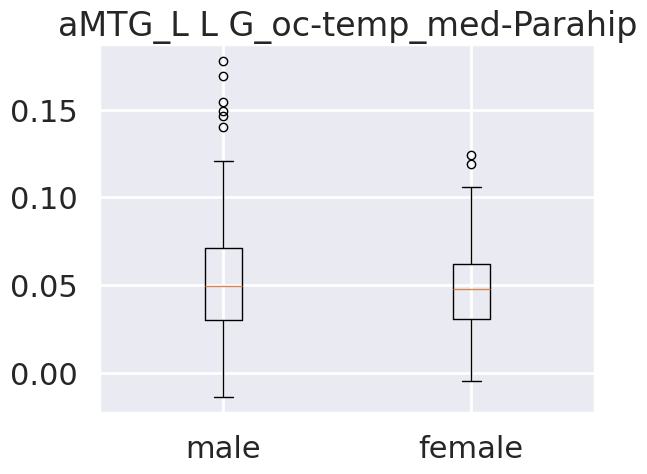

TtestResult(statistic=2.2581695728877578, pvalue=0.02441978882668705, df=444.0)
male mean : 0.05438222978056872
male std : 0.03175542035266642
female mean : 0.04845148728297872
female std : 0.023312445494557528


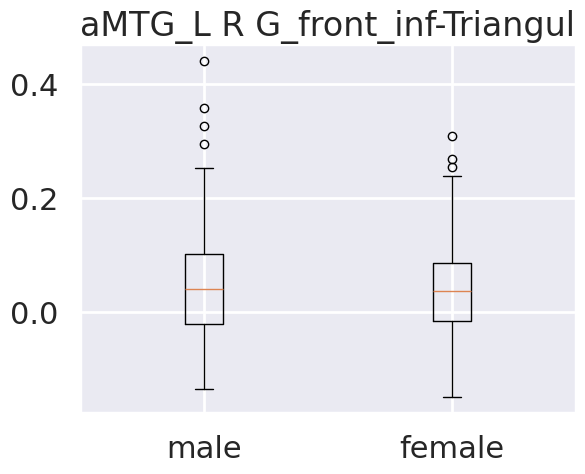

TtestResult(statistic=1.1136444490847257, pvalue=0.2660342606775769, df=444.0)
male mean : 0.04780451582393365
male std : 0.09392880446256563
female mean : 0.03872038397625532
female std : 0.07781453955141797


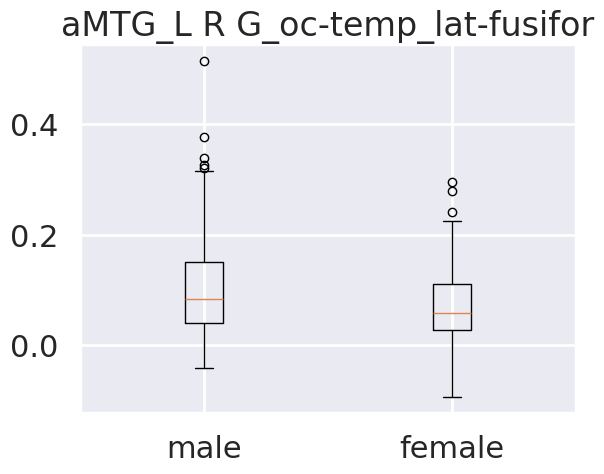

TtestResult(statistic=3.9890782405857905, pvalue=7.75671950399375e-05, df=444.0)
male mean : 0.10126961897914692
male std : 0.08443809661000735
female mean : 0.07311385128434042
female std : 0.06374086851244683
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [25]:
rois = ["aMTG_L"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_aMTG_L)


pdList = []
pdList.extend(data_results["confusion_matrix_validation"])
concat_df = pd.concat(pdList)
mean_confusion = concat_df.groupby(concat_df.index)
mean_confusion = mean_confusion.mean()


acc_vald = np.asarray(data_results["acc_validation"])
moy = np.mean(acc_vald)
se = np.std(acc_vald)
lower = moy - (1.96 * se)
upper = moy + (1.96 * se)
print("Validation accuracy")
print("The mean accuracy : " + str(moy))
print("The standard deviation of the accuracy : " + str(se))
print("The lower boundry of the confidance interval of the accuracy : " + str(lower))
print("The upper boundry of the confidance interval of the accuracy : " + str(upper))
print("\nConfusion matrix (mean) :")
print(mean_confusion)
sensitivity = data_results["confusion_matrix_validation"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix_validation"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))

print("\nTesting accuracy")
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
bestRegion(ROIs, data, df_boot)

## aMTG_R validation accuracy results no 02

Validation accuracy
The mean accuracy : 0.6885267857142857
The standard deviation of the accuracy : 0.028334079715809313
The lower boundry of the confidance interval of the accuracy : 0.6329919894712994
The upper boundry of the confidance interval of the accuracy : 0.744061581957272

Confusion matrix (mean) :
predicted class    Femme    Homme
actual class                     
Femme            41.6714  11.3286
Homme            23.5564  35.4436
Mean sensitivity : 0.6397169379184292 Std sensitivity : 0.027381284942358235
Mean specificity : 0.759619871398035 Std specificity : 0.03888652501016812

Testing accuracy
    coefficient    seed                       labels
66     0.149726  aMTG_R              L S_postcentral
53     0.145524  aMTG_R                L S_front_sup
61     0.131617  aMTG_R          L S_orbital_lateral
55     0.130347  aMTG_R  L S_intrapariet_and_P_trans
98     0.121201  aMTG_R       R G_pariet_inf-Angular
26     0.118028  aMTG_R             L G_parietal_sup
60     0.104

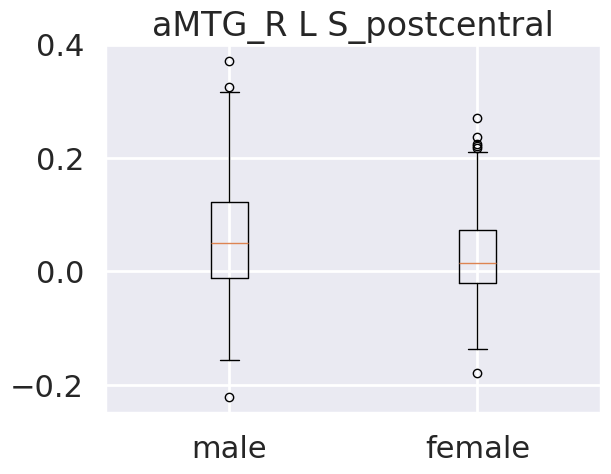

TtestResult(statistic=3.2621192404829027, pvalue=0.0011911066695271103, df=444.0)
male mean : 0.05576313479056872
male std : 0.10024889344091951
female mean : 0.028023138414468084
female std : 0.07852409778544568


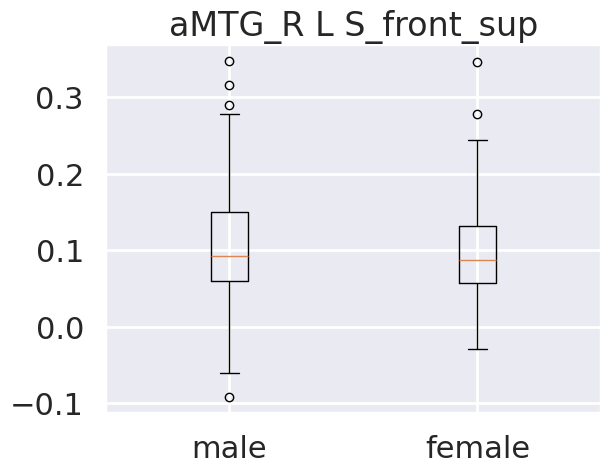

TtestResult(statistic=1.564042781797013, pvalue=0.11851995002345059, df=444.0)
male mean : 0.10693948500895735
male std : 0.07478829608267772
female mean : 0.09699578648144681
female std : 0.05889279214380111


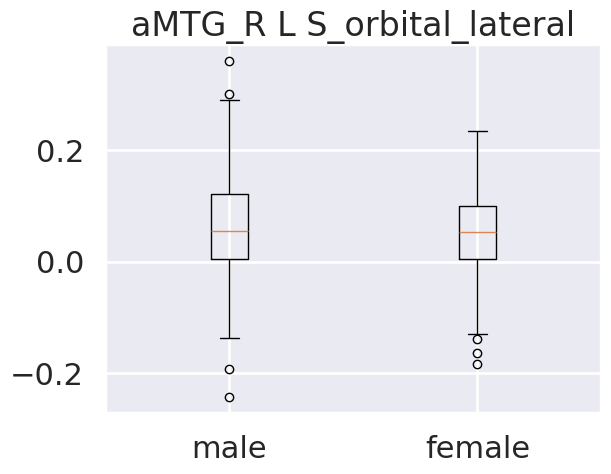

TtestResult(statistic=1.1696231399029458, pvalue=0.24278014683835317, df=444.0)
male mean : 0.06070153717054502
male std : 0.09239990232603817
female mean : 0.051424428961617016
female std : 0.07449227115106766


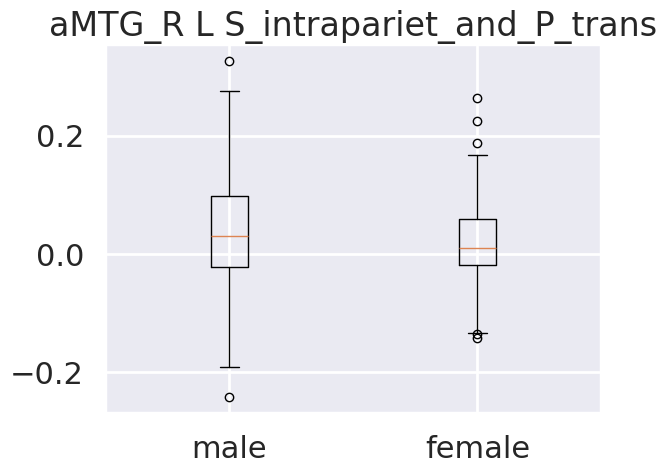

TtestResult(statistic=2.081480658940821, pvalue=0.03796229115090335, df=444.0)
male mean : 0.037425105367109
male std : 0.08994466337849082
female mean : 0.022057734861787238
female std : 0.06469646602839184


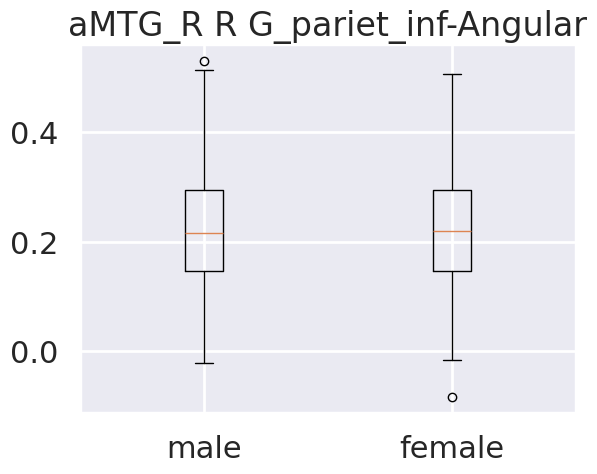

TtestResult(statistic=0.1988369728519595, pvalue=0.8424812902535094, df=444.0)
male mean : 0.22602510577014218
male std : 0.11163822771481056
female mean : 0.22400918702978725
female std : 0.10198631482703578


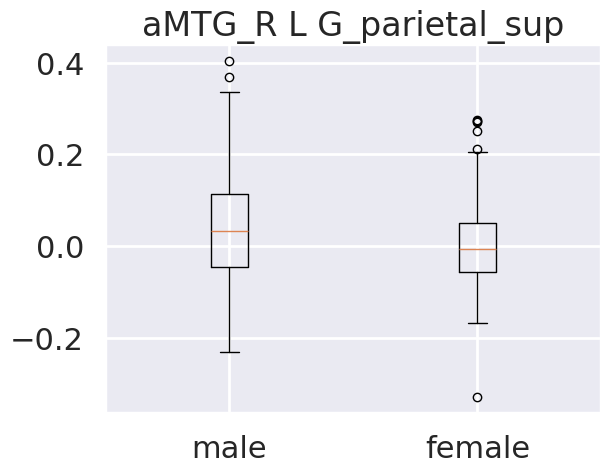

TtestResult(statistic=3.76235599868462, pvalue=0.00019088786796284696, df=444.0)
male mean : 0.04160714930995261
male std : 0.11793244485715922
female mean : 0.00472317503893617
female std : 0.08774968394654699


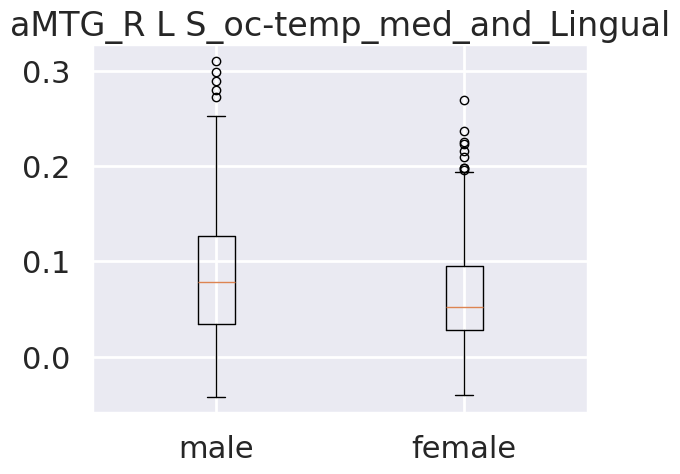

TtestResult(statistic=3.446465168906783, pvalue=0.0006220350531002364, df=444.0)
male mean : 0.08800415721516588
male std : 0.06792538797798878
female mean : 0.0676203209081702
female std : 0.056613589507009815


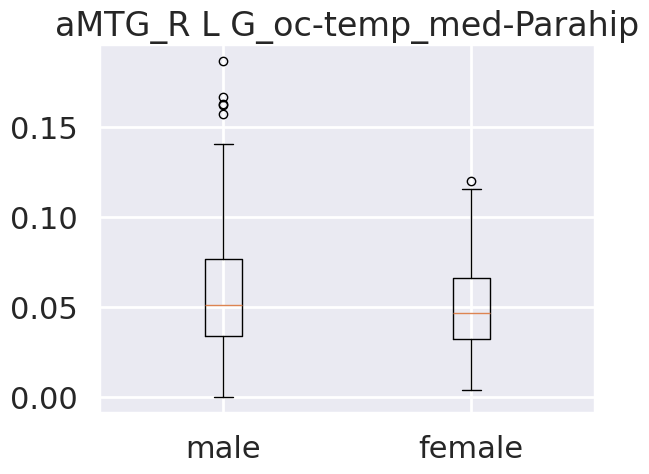

TtestResult(statistic=2.725752437980722, pvalue=0.006669202626596385, df=444.0)
male mean : 0.05781494194170617
male std : 0.03243982230042115
female mean : 0.050390622182978725
female std : 0.02476899224526237


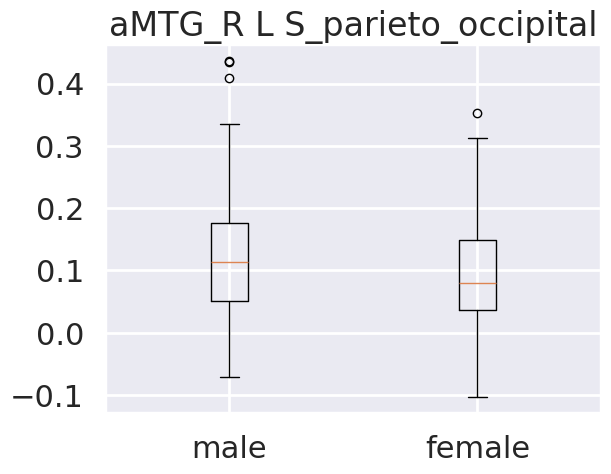

TtestResult(statistic=3.119116380110821, pvalue=0.001932028987808918, df=444.0)
male mean : 0.12120939217464455
male std : 0.09217554941861114
female mean : 0.095776577844
female std : 0.07960446515802458


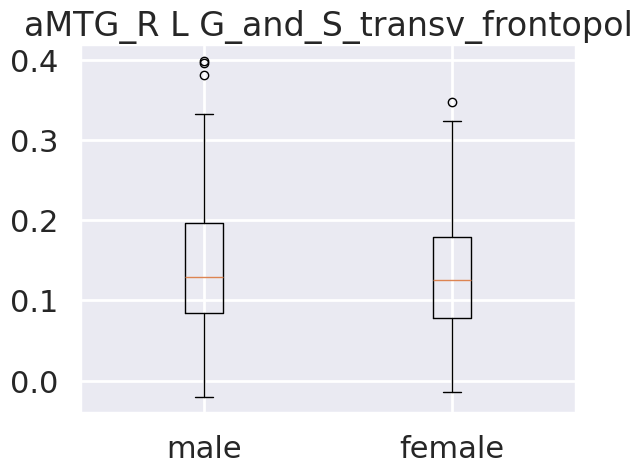

TtestResult(statistic=1.7030045611108224, pvalue=0.08926704420804905, df=444.0)
male mean : 0.1414880885563981
male std : 0.07746647306061678
female mean : 0.1296405444612766
female std : 0.06912270319897588
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [26]:
rois = ["aMTG_R"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_aMTG_R)


pdList = []
pdList.extend(data_results["confusion_matrix_validation"])
concat_df = pd.concat(pdList)
mean_confusion = concat_df.groupby(concat_df.index)
mean_confusion = mean_confusion.mean()


acc_vald = np.asarray(data_results["acc_validation"])
moy = np.mean(acc_vald)
se = np.std(acc_vald)
lower = moy - (1.96 * se)
upper = moy + (1.96 * se)
print("Validation accuracy")
print("The mean accuracy : " + str(moy))
print("The standard deviation of the accuracy : " + str(se))
print("The lower boundry of the confidance interval of the accuracy : " + str(lower))
print("The upper boundry of the confidance interval of the accuracy : " + str(upper))
print("\nConfusion matrix (mean) :")
print(mean_confusion)
sensitivity = data_results["confusion_matrix_validation"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix_validation"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))

print("\nTesting accuracy")
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
bestRegion(ROIs, data, df_boot)

## opIFG_L validation accuracy results no 02

Validation accuracy
The mean accuracy : 0.7375758928571429
The standard deviation of the accuracy : 0.026833035209225604
The lower boundry of the confidance interval of the accuracy : 0.6849831438470607
The upper boundry of the confidance interval of the accuracy : 0.790168641867225

Confusion matrix (mean) :
predicted class    Femme    Homme
actual class                     
Femme            42.3660  10.6340
Homme            18.7575  40.2425
Mean sensitivity : 0.6939164819483391 Std sensitivity : 0.027749869133069597
Mean specificity : 0.7926518635887055 Std specificity : 0.036543157179329676

Testing accuracy
     coefficient     seed                       labels
20      0.180546  opIFG_L      L G_oc-temp_lat-fusifor
144     0.137426  opIFG_L              R S_subparietal
86      0.132436  opIFG_L        R G_front_inf-Orbital
115     0.128835  opIFG_L             R Pole_occipital
125     0.109298  opIFG_L                R S_front_inf
41      0.107472  opIFG_L             L Pole_occipi

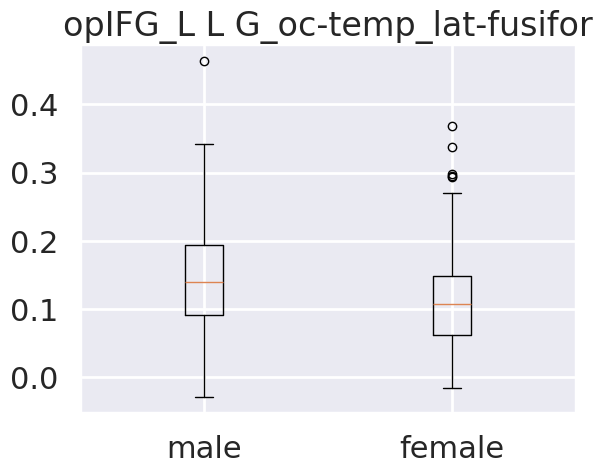

TtestResult(statistic=4.663171131013658, pvalue=4.125472266036231e-06, df=444.0)
male mean : 0.14554618908672984
male std : 0.07549904604302277
female mean : 0.11419731319319149
female std : 0.06614540398812135


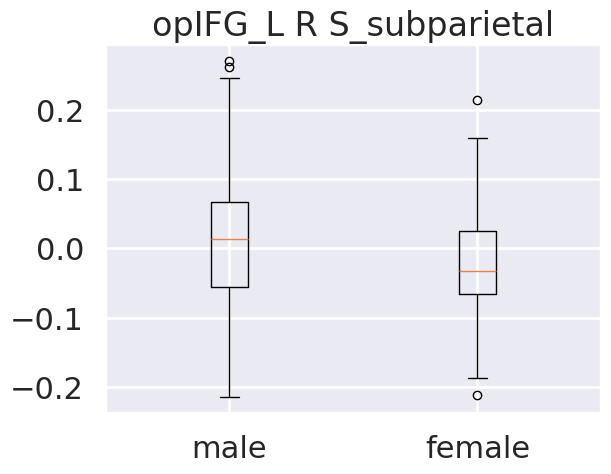

TtestResult(statistic=4.343779967949301, pvalue=1.7370958213908015e-05, df=444.0)
male mean : 0.011604652139336492
male std : 0.09624445766711937
female mean : -0.022882809215744683
female std : 0.0701705688033787


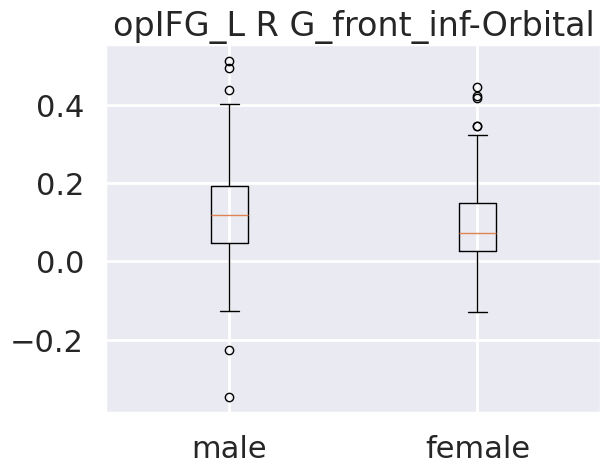

TtestResult(statistic=2.590010242688736, pvalue=0.00991280745976436, df=444.0)
male mean : 0.12008539356056873
male std : 0.12048529233368213
female mean : 0.09274929992765957
female std : 0.101808764888001


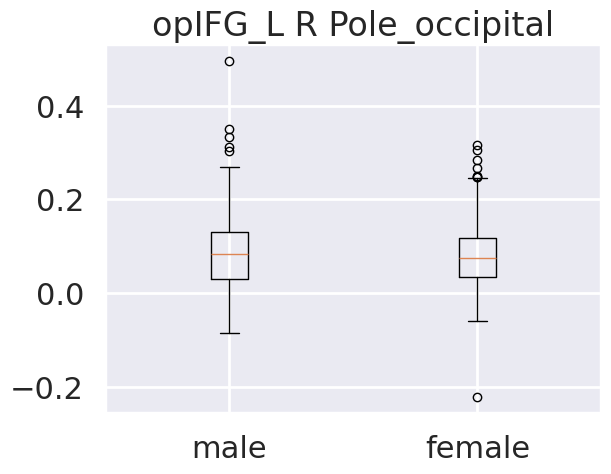

TtestResult(statistic=1.0562933159919166, pvalue=0.29140862404612333, df=444.0)
male mean : 0.0870557194335545
male std : 0.0859022171097756
female mean : 0.07901082808025532
female std : 0.07455712361626565


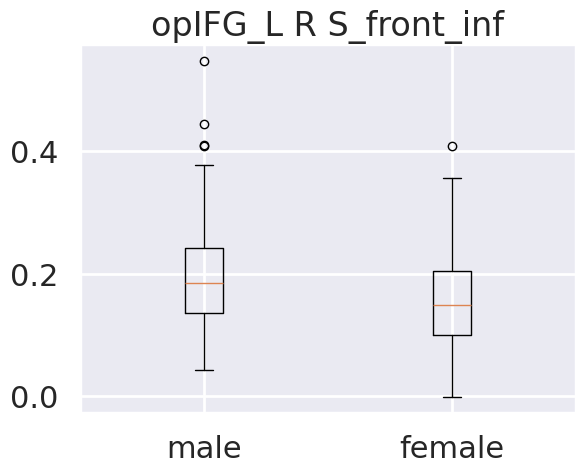

TtestResult(statistic=5.884962473252365, pvalue=7.853123991569667e-09, df=444.0)
male mean : 0.19521078224170613
male std : 0.07918319448273296
female mean : 0.1526708417155319
female std : 0.07311756765472813


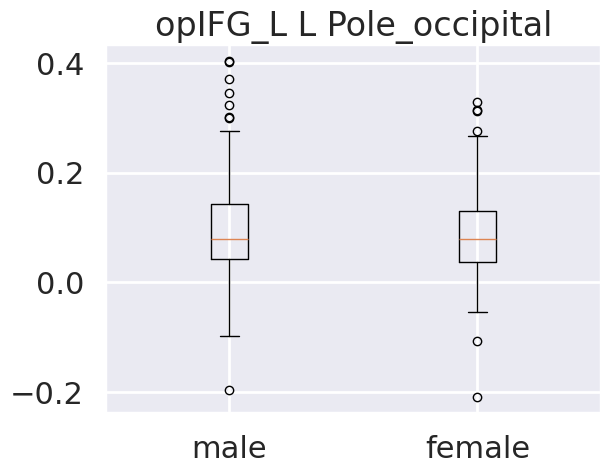

TtestResult(statistic=0.9458868030905412, pvalue=0.34472079500396957, df=444.0)
male mean : 0.09470529170082939
male std : 0.08837876172341082
female mean : 0.08733913702638298
female std : 0.07566935742613132


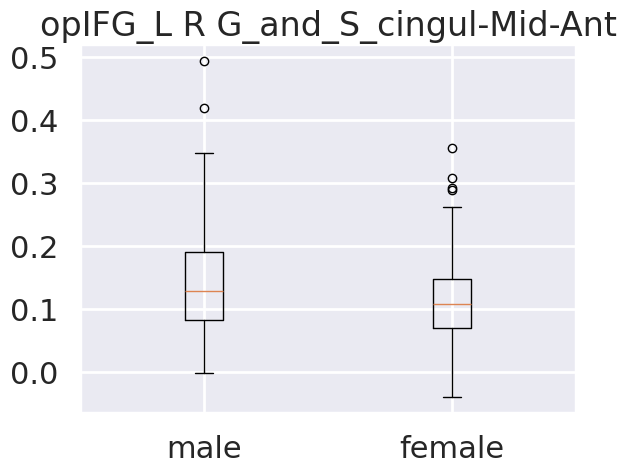

TtestResult(statistic=4.59802413533957, pvalue=5.569443863697757e-06, df=444.0)
male mean : 0.14388135524170614
male std : 0.07936365618429099
female mean : 0.11298714219148936
female std : 0.061867568449104786


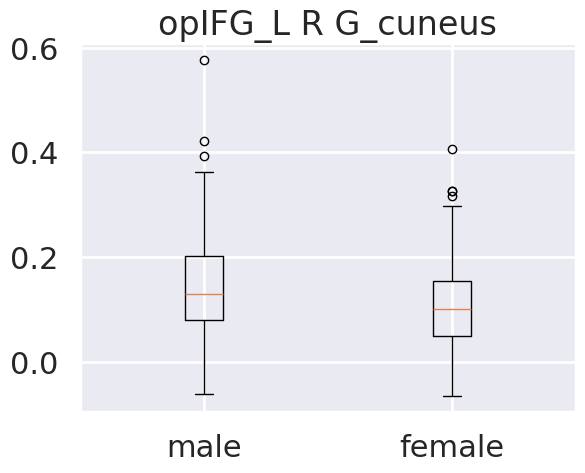

TtestResult(statistic=4.159387257368978, pvalue=3.831851643661411e-05, df=444.0)
male mean : 0.14290215239905213
male std : 0.09522010203612372
female mean : 0.10896249384468085
female std : 0.0764519019773217


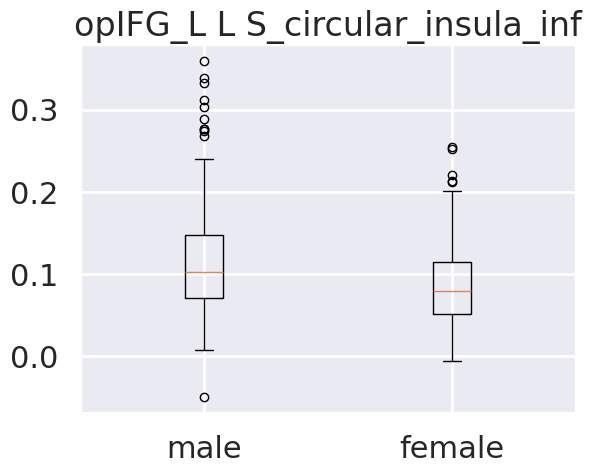

TtestResult(statistic=5.291587064411659, pvalue=1.9091305038741644e-07, df=444.0)
male mean : 0.11564617420663506
male std : 0.06740411339538012
female mean : 0.08649188888851064
female std : 0.04792604955663415


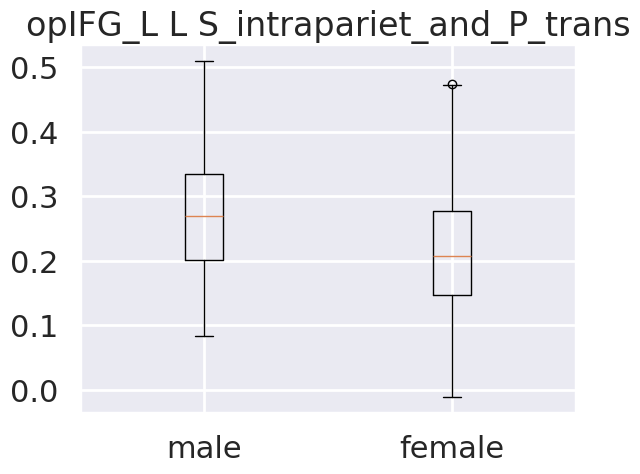

TtestResult(statistic=6.427201870497699, pvalue=3.357767316845091e-10, df=444.0)
male mean : 0.2702339562037915
male std : 0.09432151354355668
female mean : 0.21262982520234042
female std : 0.09426080476314916
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [27]:
rois = ["opIFG_L"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_opIFG_L)


pdList = []
pdList.extend(data_results["confusion_matrix_validation"])
concat_df = pd.concat(pdList)
mean_confusion = concat_df.groupby(concat_df.index)
mean_confusion = mean_confusion.mean()


acc_vald = np.asarray(data_results["acc_validation"])
moy = np.mean(acc_vald)
se = np.std(acc_vald)
lower = moy - (1.96 * se)
upper = moy + (1.96 * se)
print("Validation accuracy")
print("The mean accuracy : " + str(moy))
print("The standard deviation of the accuracy : " + str(se))
print("The lower boundry of the confidance interval of the accuracy : " + str(lower))
print("The upper boundry of the confidance interval of the accuracy : " + str(upper))
print("\nConfusion matrix (mean) :")
print(mean_confusion)
sensitivity = data_results["confusion_matrix_validation"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix_validation"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))

print("\nTesting accuracy")
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
bestRegion(ROIs, data, df_boot)

## opIFG_R validation accuracy results no 02

Validation accuracy
The mean accuracy : 0.7246205357142858
The standard deviation of the accuracy : 0.02620850362893906
The lower boundry of the confidance interval of the accuracy : 0.6732518686015652
The upper boundry of the confidance interval of the accuracy : 0.7759892028270063

Confusion matrix (mean) :
predicted class    Femme    Homme
actual class                     
Femme            40.3820  12.6180
Homme            18.2245  40.7755
Mean sensitivity : 0.6902301546785793 Std sensitivity : 0.029730993084035557
Mean specificity : 0.7654667459970471 Std specificity : 0.034761515384072024

Testing accuracy
     coefficient     seed                       labels
20      0.173838  opIFG_R      L G_oc-temp_lat-fusifor
80      0.143235  opIFG_R     R G_and_S_cingul-Mid-Ant
41      0.142273  opIFG_R             L Pole_occipital
125     0.126392  opIFG_R                R S_front_inf
115     0.107594  opIFG_R             R Pole_occipital
63      0.104041  opIFG_R         L S_orbital-H_Sha

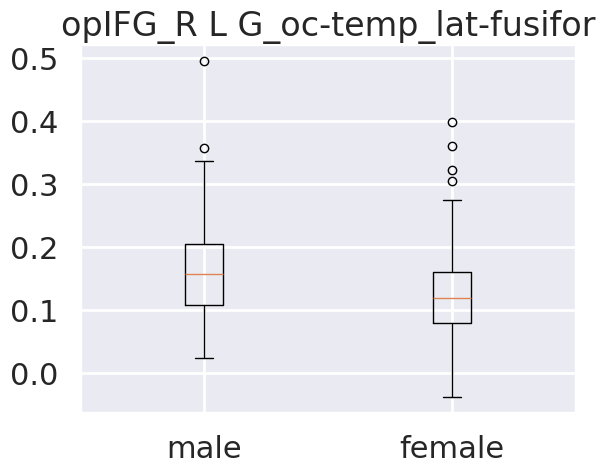

TtestResult(statistic=5.176783299097902, pvalue=3.427806367244311e-07, df=444.0)
male mean : 0.1588799625450237
male std : 0.07451696010056195
female mean : 0.12480377087659575
female std : 0.06415457178008915


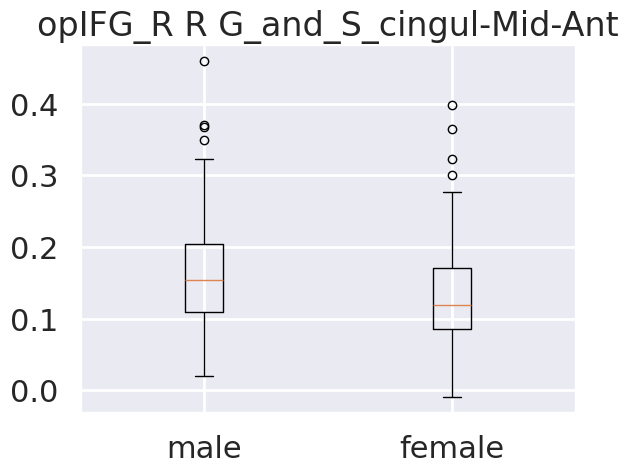

TtestResult(statistic=4.599432398551541, pvalue=5.533634586157913e-06, df=444.0)
male mean : 0.1602096582985782
male std : 0.0717659842501242
female mean : 0.13023491812404256
female std : 0.06555178033909799


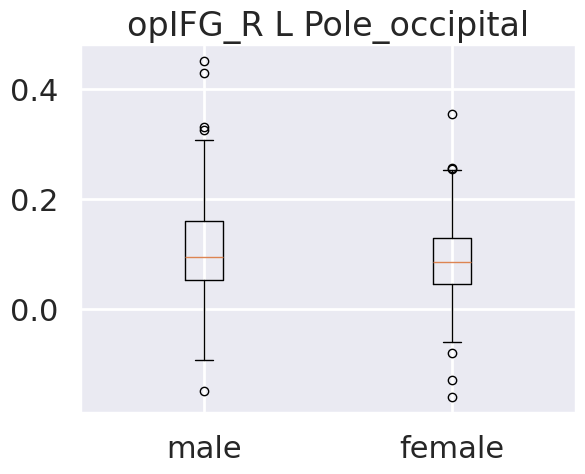

TtestResult(statistic=2.7255737216892197, pvalue=0.006672753748655803, df=444.0)
male mean : 0.10897551201556399
male std : 0.08329908686213744
female mean : 0.0891805879514468
female std : 0.06963803399752087


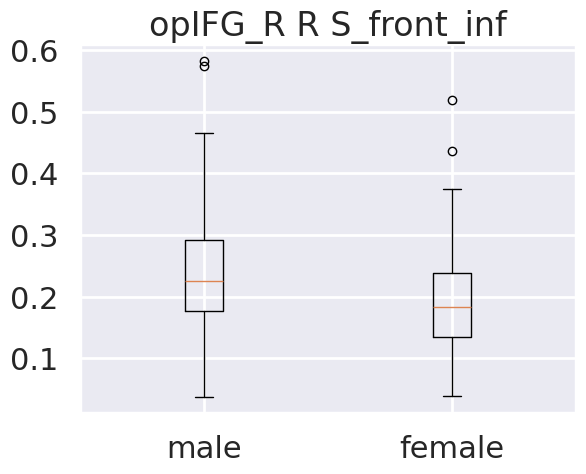

TtestResult(statistic=5.947915932893488, pvalue=5.508767725982762e-09, df=444.0)
male mean : 0.23696873745971564
male std : 0.08550430086562916
female mean : 0.19078449430212768
female std : 0.0781036749017774


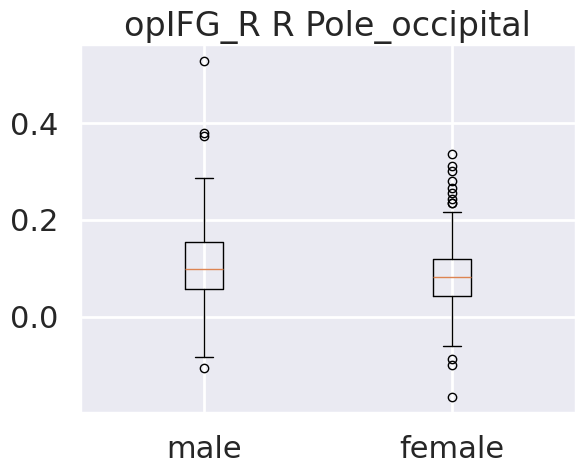

TtestResult(statistic=2.887685163066, pvalue=0.004070478752466148, df=444.0)
male mean : 0.10594447359004738
male std : 0.0806119552649185
female mean : 0.08515797526327659
female std : 0.07105978717669892


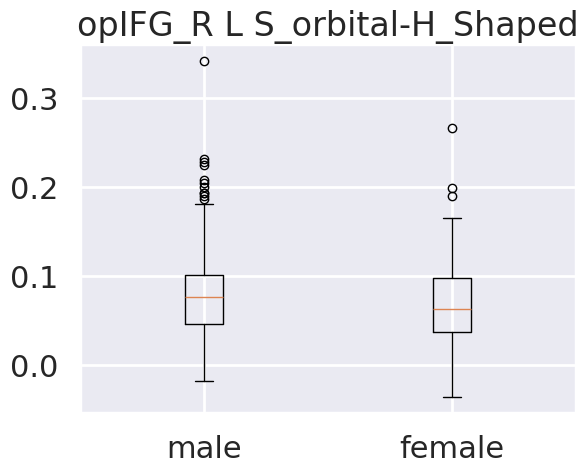

TtestResult(statistic=2.6292314457292116, pvalue=0.008854781060143924, df=444.0)
male mean : 0.08188100154616113
male std : 0.052568384324703385
female mean : 0.06968179238340426
female std : 0.045175743118779504


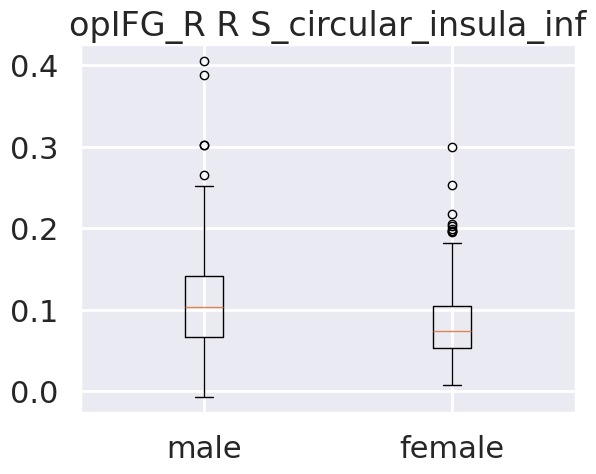

TtestResult(statistic=5.366590436746158, pvalue=1.295113022416867e-07, df=444.0)
male mean : 0.11096852988767772
male std : 0.06342691049723577
female mean : 0.08291211082978725
female std : 0.046141346848333244


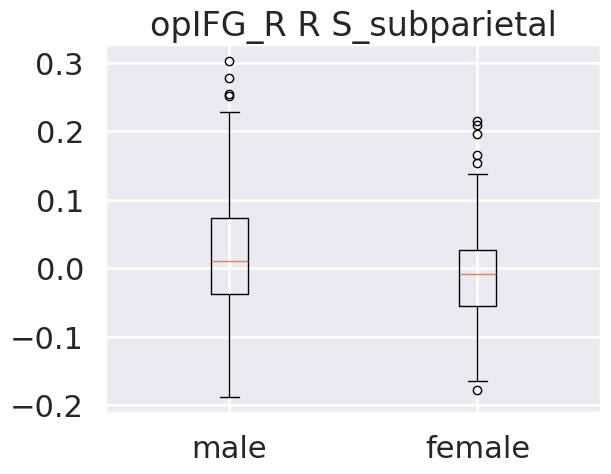

TtestResult(statistic=4.170778804634583, pvalue=3.652101411865382e-05, df=444.0)
male mean : 0.02046037378578199
male std : 0.09045713696995894
female mean : -0.010307747571999998
female std : 0.06391035459472331


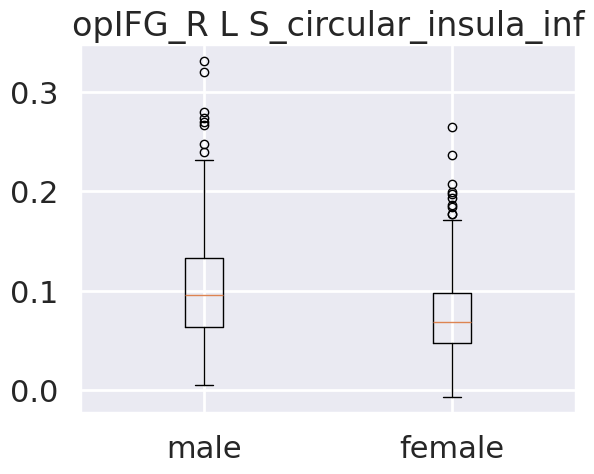

TtestResult(statistic=5.2508662645312825, pvalue=2.352433244231258e-07, df=444.0)
male mean : 0.10348876252890994
male std : 0.059155982523175756
female mean : 0.07749799998723406
female std : 0.04477047867485129


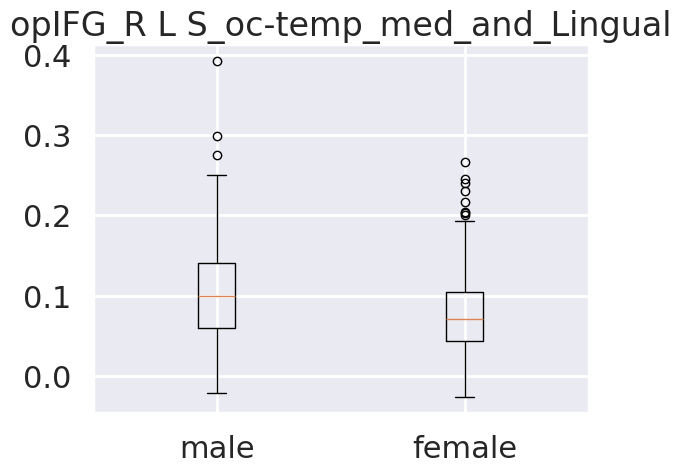

TtestResult(statistic=4.830324918055688, pvalue=1.87976159575421e-06, df=444.0)
male mean : 0.10494199282654029
male std : 0.060932589606714556
female mean : 0.07906732310387235
female std : 0.0519014672736226
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [28]:
rois = ["opIFG_R"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_opIFG_R)


pdList = []
pdList.extend(data_results["confusion_matrix_validation"])
concat_df = pd.concat(pdList)
mean_confusion = concat_df.groupby(concat_df.index)
mean_confusion = mean_confusion.mean()



acc_vald = np.asarray(data_results["acc_validation"])
moy = np.mean(acc_vald)
se = np.std(acc_vald)
lower = moy - (1.96 * se)
upper = moy + (1.96 * se)
print("Validation accuracy")
print("The mean accuracy : " + str(moy))
print("The standard deviation of the accuracy : " + str(se))
print("The lower boundry of the confidance interval of the accuracy : " + str(lower))
print("The upper boundry of the confidance interval of the accuracy : " + str(upper))
print("\nConfusion matrix (mean) :")
print(mean_confusion)
sensitivity = data_results["confusion_matrix_validation"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix_validation"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))

print("\nTesting accuracy")
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
bestRegion(ROIs, data, df_boot)

## pITG_L validation accuracy results no 02

Validation accuracy
The mean accuracy : 0.6939276785714287
The standard deviation of the accuracy : 0.028228471781178047
The lower boundry of the confidance interval of the accuracy : 0.6385998738803197
The upper boundry of the confidance interval of the accuracy : 0.7492554832625377

Confusion matrix (mean) :
predicted class    Femme    Homme
actual class                     
Femme            41.3237  11.6763
Homme            22.6038  36.3962
Mean sensitivity : 0.6475438163544878 Std sensitivity : 0.029194282605905775
Mean specificity : 0.7585850484554859 Std specificity : 0.03561746648295716

Testing accuracy
     coefficient    seed                       labels
55      0.151141  pITG_L  L S_intrapariet_and_P_trans
86      0.150547  pITG_L        R G_front_inf-Orbital
9       0.150195  pITG_L      L G_cingul-Post-ventral
83      0.149966  pITG_L      R G_cingul-Post-ventral
125     0.143229  pITG_L                R S_front_inf
20      0.138878  pITG_L      L G_oc-temp_lat-fusifor
19 

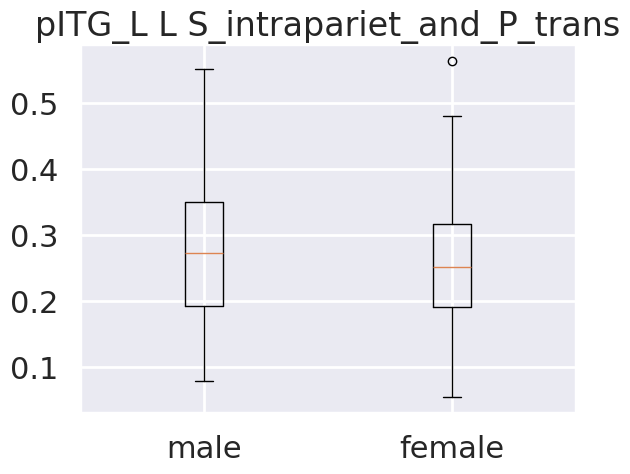

TtestResult(statistic=2.6049250509899857, pvalue=0.00949783108939388, df=444.0)
male mean : 0.27778639065876776
male std : 0.09652693229546287
female mean : 0.254653592693617
female std : 0.09055004671913315


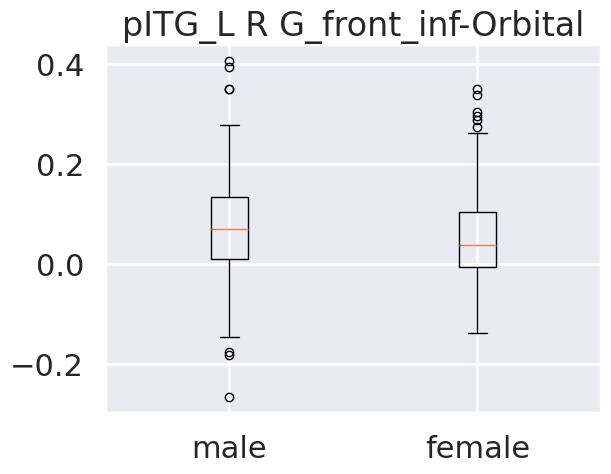

TtestResult(statistic=2.1796515056678336, pvalue=0.029808040037670316, df=444.0)
male mean : 0.07252172444170615
male std : 0.10080732758673992
female mean : 0.052920380447404256
female std : 0.08867448391605957


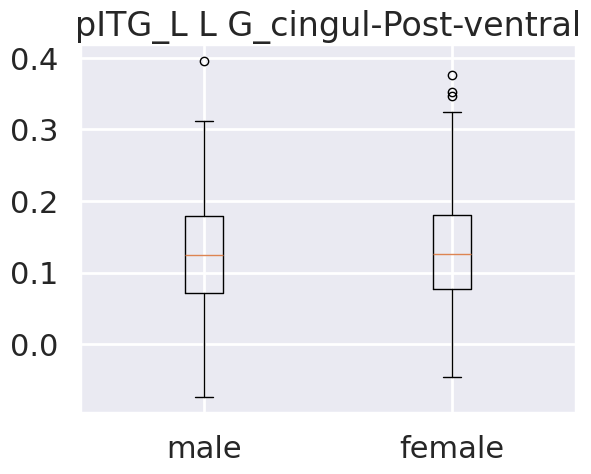

TtestResult(statistic=-0.7724237550352638, pvalue=0.4402744498219793, df=444.0)
male mean : 0.127128284757109
male std : 0.07222617653279273
female mean : 0.1326232745323404
female std : 0.07711437096412027


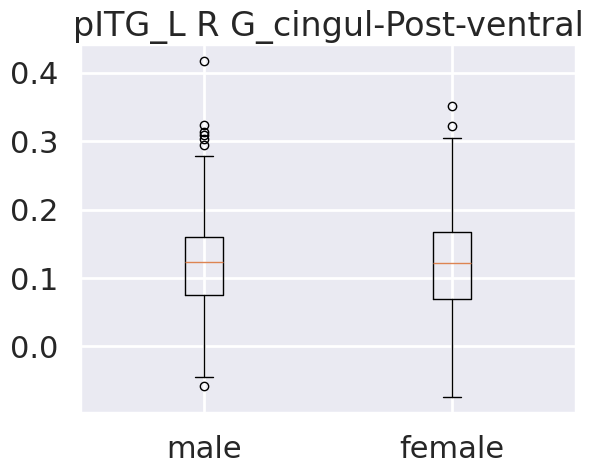

TtestResult(statistic=-0.612728556148096, pvalue=0.5403695352260143, df=444.0)
male mean : 0.12137713021469193
male std : 0.07320446759994569
female mean : 0.1257123220574468
female std : 0.07552111050746853


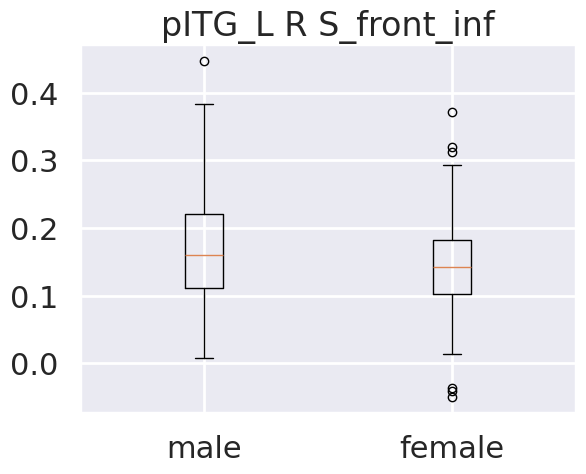

TtestResult(statistic=3.527371743685806, pvalue=0.00046341073109008694, df=444.0)
male mean : 0.16778896423222747
male std : 0.07482114559431507
female mean : 0.14443713783829784
female std : 0.064649075986272


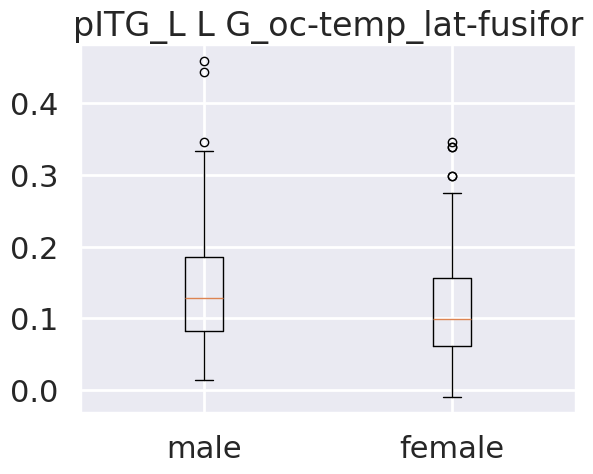

TtestResult(statistic=3.275834050563673, pvalue=0.0011360567722706225, df=444.0)
male mean : 0.13928527996682463
male std : 0.07670719318097458
female mean : 0.11658672618927658
female std : 0.06929713865976829


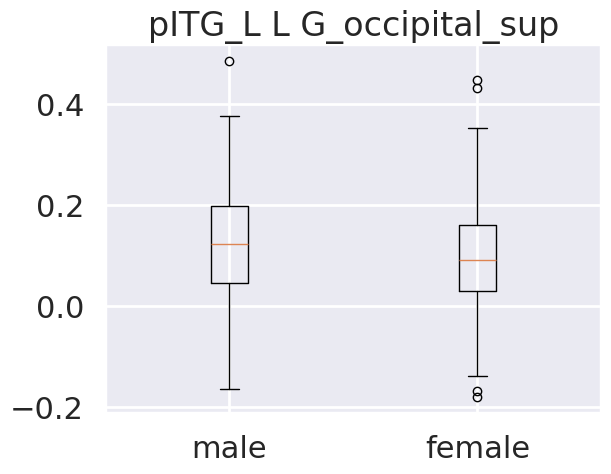

TtestResult(statistic=3.0520810289421307, pvalue=0.002408980454890271, df=444.0)
male mean : 0.1266533429549763
male std : 0.10587342505297256
female mean : 0.0965959863007234
female std : 0.10152774622861853


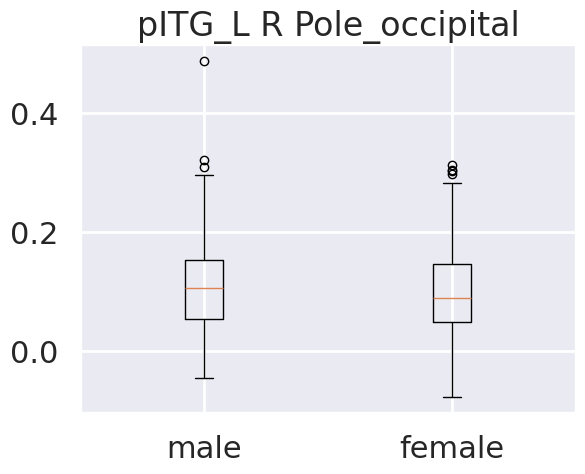

TtestResult(statistic=1.265861877322234, pvalue=0.2062263407488006, df=444.0)
male mean : 0.11211165639336493
male std : 0.07260016420089903
female mean : 0.10322566489706382
female std : 0.07495471127594824


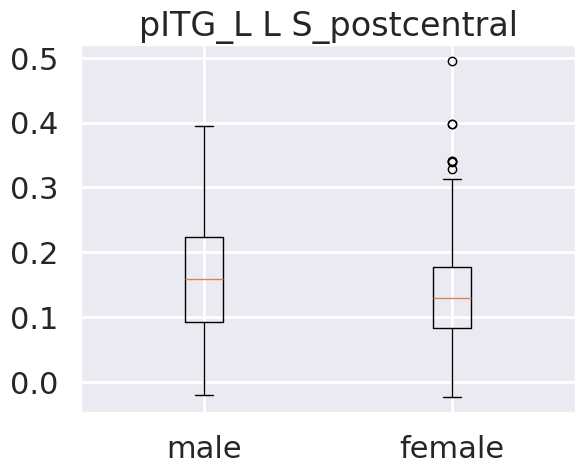

TtestResult(statistic=3.2960887569681274, pvalue=0.0010590599397127252, df=444.0)
male mean : 0.16579266225118483
male std : 0.09025561441296917
female mean : 0.1391957490468085
female std : 0.07976842848115447


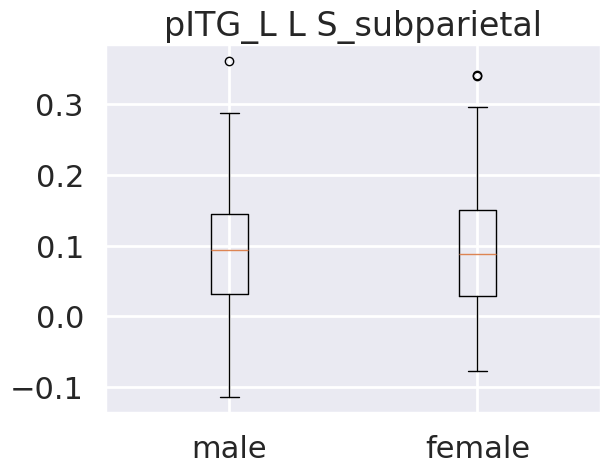

TtestResult(statistic=0.07166105027322052, pvalue=0.9429039214102952, df=444.0)
male mean : 0.09233229492985784
male std : 0.07861437126972175
female mean : 0.09178478666570214
female std : 0.08192989677477129
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [29]:
rois = ["pITG_L"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_pITG_L)


pdList = []
pdList.extend(data_results["confusion_matrix_validation"])
concat_df = pd.concat(pdList)
mean_confusion = concat_df.groupby(concat_df.index)
mean_confusion = mean_confusion.mean()



acc_vald = np.asarray(data_results["acc_validation"])
moy = np.mean(acc_vald)
se = np.std(acc_vald)
lower = moy - (1.96 * se)
upper = moy + (1.96 * se)
print("Validation accuracy")
print("The mean accuracy : " + str(moy))
print("The standard deviation of the accuracy : " + str(se))
print("The lower boundry of the confidance interval of the accuracy : " + str(lower))
print("The upper boundry of the confidance interval of the accuracy : " + str(upper))
print("\nConfusion matrix (mean) :")
print(mean_confusion)
sensitivity = data_results["confusion_matrix_validation"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix_validation"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))

print("\nTesting accuracy")
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
bestRegion(ROIs, data, df_boot)

## pITG_R validation accuracy results no 02

Validation accuracy
The mean accuracy : 0.7480919642857143
The standard deviation of the accuracy : 0.023985194715268353
The lower boundry of the confidance interval of the accuracy : 0.7010809826437884
The upper boundry of the confidance interval of the accuracy : 0.7951029459276403

Confusion matrix (mean) :
predicted class    Femme    Homme
actual class                     
Femme            43.2734   9.7266
Homme            18.4871  40.5129
Mean sensitivity : 0.7017387578153488 Std sensitivity : 0.027363796601610355
Mean specificity : 0.8078104800058465 Std specificity : 0.03200416192834705

Testing accuracy
     coefficient    seed                    labels
20      0.230630  pITG_R   L G_oc-temp_lat-fusifor
83      0.173208  pITG_R   R G_cingul-Post-ventral
125     0.149623  pITG_R             R S_front_inf
80      0.136362  pITG_R  R G_and_S_cingul-Mid-Ant
32      0.115947  pITG_R   L G_temp_sup-G_T_transv
84      0.115235  pITG_R                R G_cuneus
94      0.110347  pITG_R

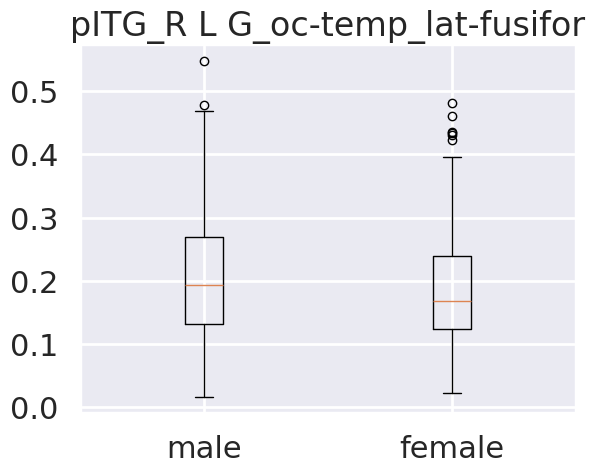

TtestResult(statistic=2.4163793122918227, pvalue=0.016078141849334877, df=444.0)
male mean : 0.20453742202369668
male std : 0.09940831680569412
female mean : 0.18324247592340423
female std : 0.08626094020084352


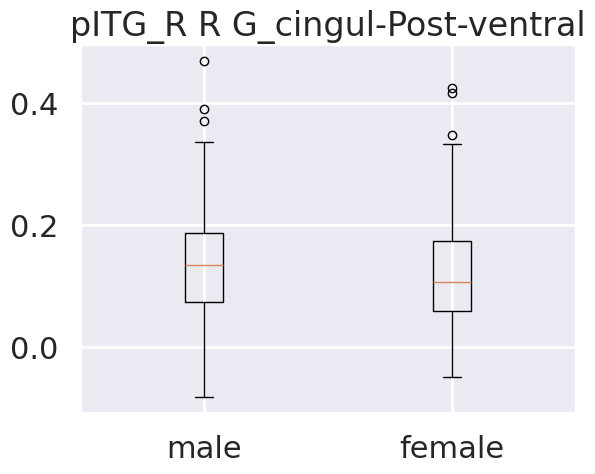

TtestResult(statistic=2.225527824005661, pvalue=0.026547313770183056, df=444.0)
male mean : 0.13792608536729858
male std : 0.0913432072591626
female mean : 0.11908777939502127
female std : 0.08694213306856728


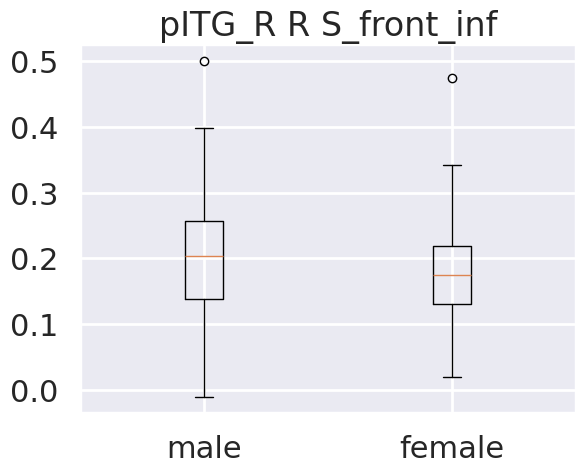

TtestResult(statistic=4.066436348071244, pvalue=5.647893423533811e-05, df=444.0)
male mean : 0.2058407092037915
male std : 0.08159592195327331
female mean : 0.17740230067659576
female std : 0.06553958179844248


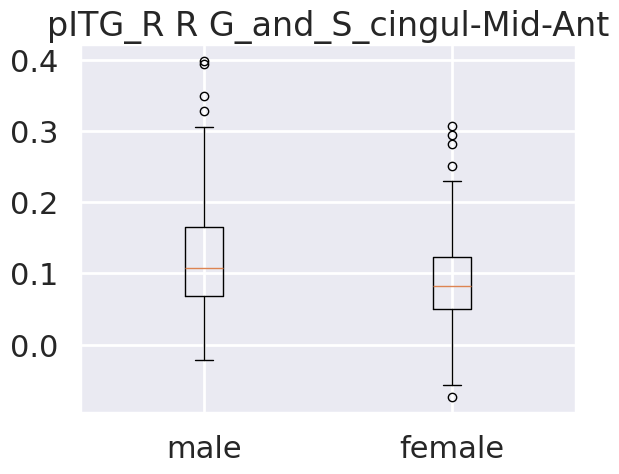

TtestResult(statistic=4.600027640439905, pvalue=5.518565377868144e-06, df=444.0)
male mean : 0.12042437503791467
male std : 0.07776189254634676
female mean : 0.09035040455829788
female std : 0.05957252115420796


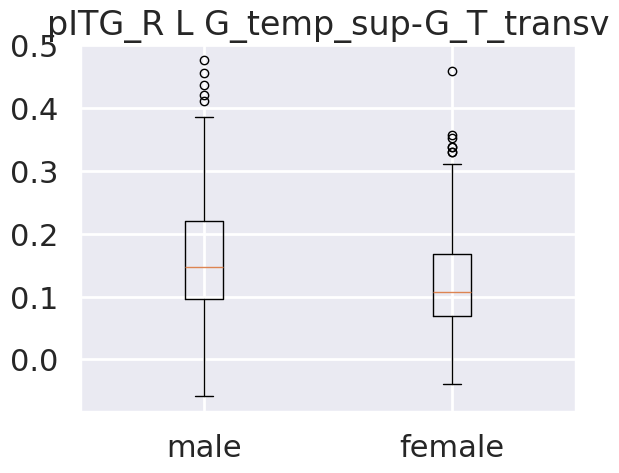

TtestResult(statistic=4.63770969479579, pvalue=4.640825531221423e-06, df=444.0)
male mean : 0.16541289226540287
male std : 0.0981036254370344
female mean : 0.1258804217680851
female std : 0.08137129558622526


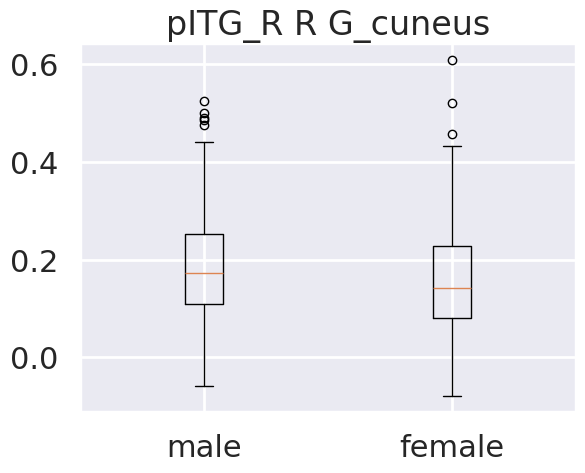

TtestResult(statistic=2.715527902640313, pvalue=0.006875129371679124, df=444.0)
male mean : 0.18589586856668242
male std : 0.11490296743042099
female mean : 0.1574173363242553
female std : 0.10605694313812855


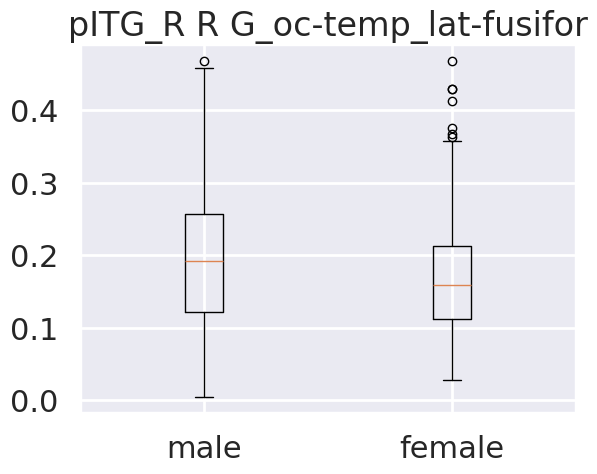

TtestResult(statistic=3.235350879546403, pvalue=0.001305741773838133, df=444.0)
male mean : 0.19698570930805684
male std : 0.09813256060896283
female mean : 0.1690754523404255
female std : 0.08357944003887514


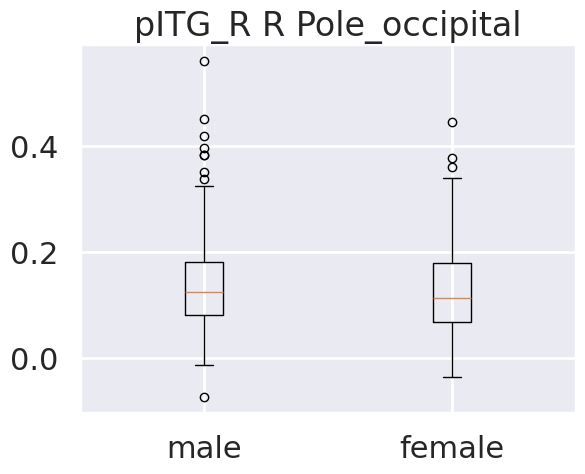

TtestResult(statistic=1.6743894117139027, pvalue=0.09475828567746696, df=444.0)
male mean : 0.14234086296113746
male std : 0.09423475516653777
female mean : 0.1282222304106383
female std : 0.08343646573029594


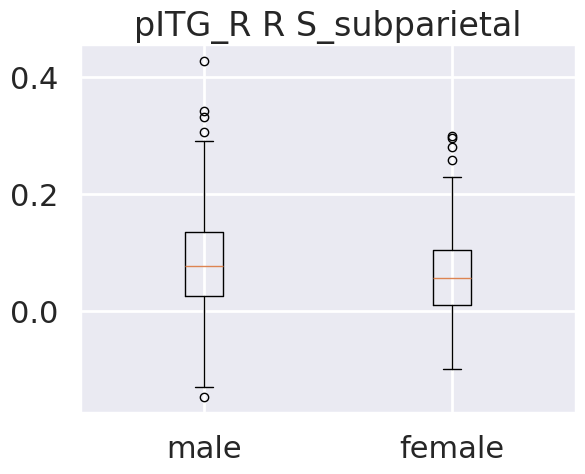

TtestResult(statistic=2.735047934138372, pvalue=0.006486833391675547, df=444.0)
male mean : 0.08345943679966825
male std : 0.09449059335131096
female mean : 0.06167374757455319
female std : 0.07287459097882863


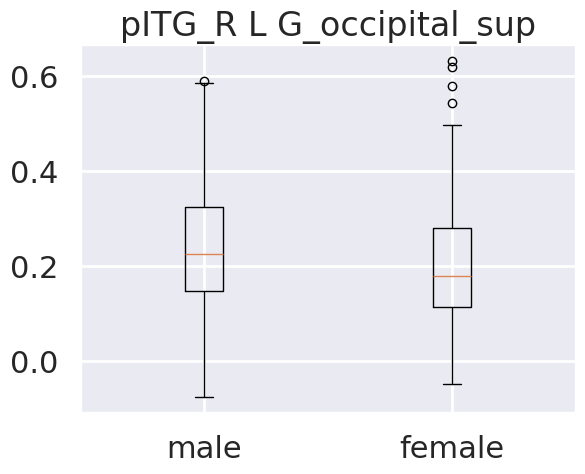

TtestResult(statistic=2.7689121464219495, pvalue=0.005859897451827995, df=444.0)
male mean : 0.23867880892274881
male std : 0.13621502466672755
female mean : 0.20476369438297873
female std : 0.12187720905354
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [30]:
rois = ["pITG_R"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_pITG_R)


pdList = []
pdList.extend(data_results["confusion_matrix_validation"])
concat_df = pd.concat(pdList)
mean_confusion = concat_df.groupby(concat_df.index)
mean_confusion = mean_confusion.mean()


acc_vald = np.asarray(data_results["acc_validation"])
moy = np.mean(acc_vald)
se = np.std(acc_vald)
lower = moy - (1.96 * se)
upper = moy + (1.96 * se)
print("Validation accuracy")
print("The mean accuracy : " + str(moy))
print("The standard deviation of the accuracy : " + str(se))
print("The lower boundry of the confidance interval of the accuracy : " + str(lower))
print("The upper boundry of the confidance interval of the accuracy : " + str(upper))
print("\nConfusion matrix (mean) :")
print(mean_confusion)
sensitivity = data_results["confusion_matrix_validation"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix_validation"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))

print("\nTesting accuracy")
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
bestRegion(ROIs, data, df_boot)

## planumtemp_L validation accuracy results no 02

Validation accuracy
The mean accuracy : 0.6906169642857142
The standard deviation of the accuracy : 0.027470747994480883
The lower boundry of the confidance interval of the accuracy : 0.6367742982165316
The upper boundry of the confidance interval of the accuracy : 0.7444596303548967

Confusion matrix (mean) :
predicted class    Femme    Homme
actual class                     
Femme            38.6160  14.3840
Homme            20.2669  38.7331
Mean sensitivity : 0.6567261698289082 Std sensitivity : 0.028802953331590782
Mean specificity : 0.7312621139221338 Std specificity : 0.036979125241827664

Testing accuracy
     coefficient          seed                       labels
20      0.183659  planumtemp_L      L G_oc-temp_lat-fusifor
94      0.154378  planumtemp_L      R G_oc-temp_lat-fusifor
60      0.148369  planumtemp_L  L S_oc-temp_med_and_Lingual
80      0.138911  planumtemp_L     R G_and_S_cingul-Mid-Ant
66      0.132798  planumtemp_L              L S_postcentral
6       0.106840  pl

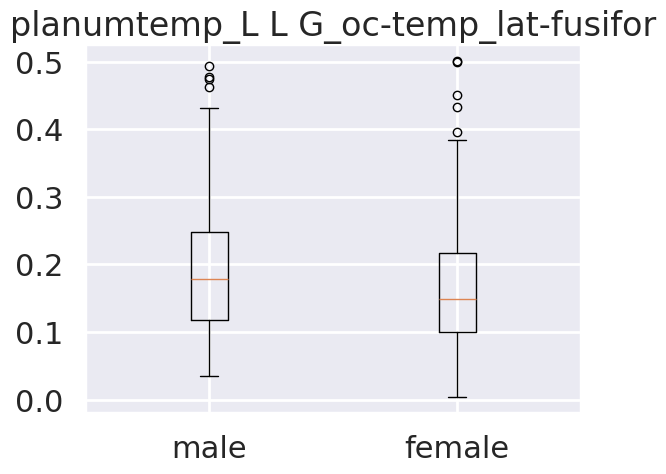

TtestResult(statistic=2.8505214236776864, pvalue=0.004568063320215879, df=444.0)
male mean : 0.19013747229383887
male std : 0.0942588906021302
female mean : 0.16540072089787233
female std : 0.0885506133878502


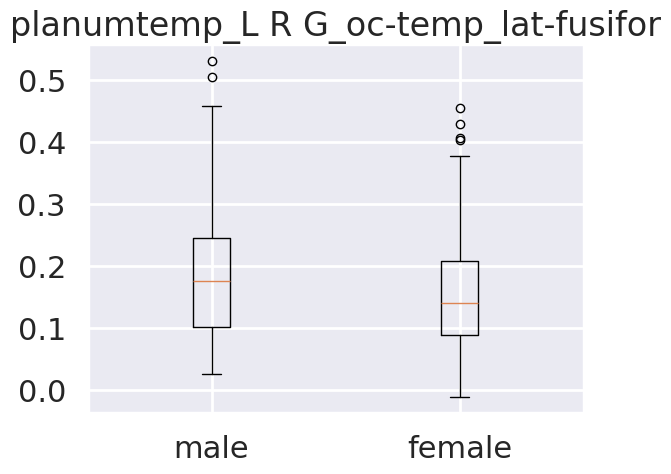

TtestResult(statistic=3.2922770251714493, pvalue=0.0010731693319095802, df=444.0)
male mean : 0.18307036592890996
male std : 0.09782784804200209
female mean : 0.15447305707234046
female std : 0.0851798270744238


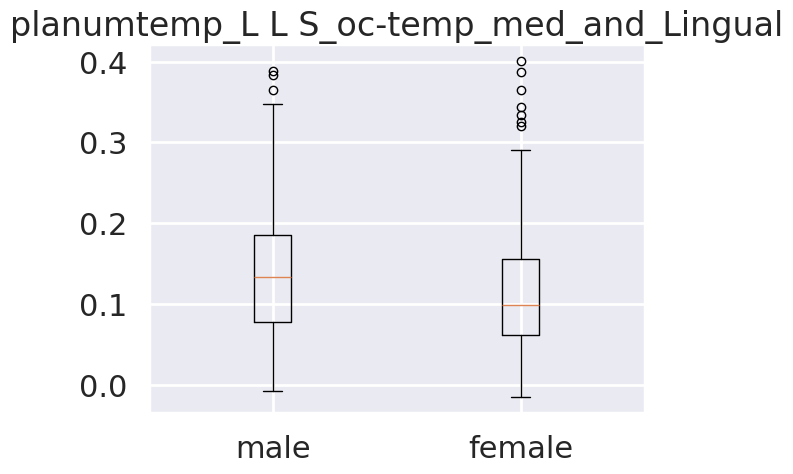

TtestResult(statistic=2.741818946204881, pvalue=0.006356838873081657, df=444.0)
male mean : 0.13728378161611374
male std : 0.07765054098418366
female mean : 0.11705511856085106
female std : 0.07758800539705143


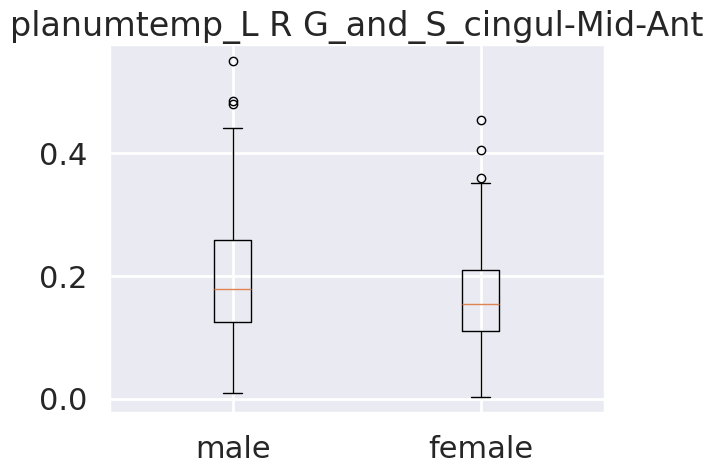

TtestResult(statistic=3.8902832939809864, pvalue=0.00011546268731542869, df=444.0)
male mean : 0.1972758429052133
male std : 0.10030875497847032
female mean : 0.16431204968085106
female std : 0.07776358246318395


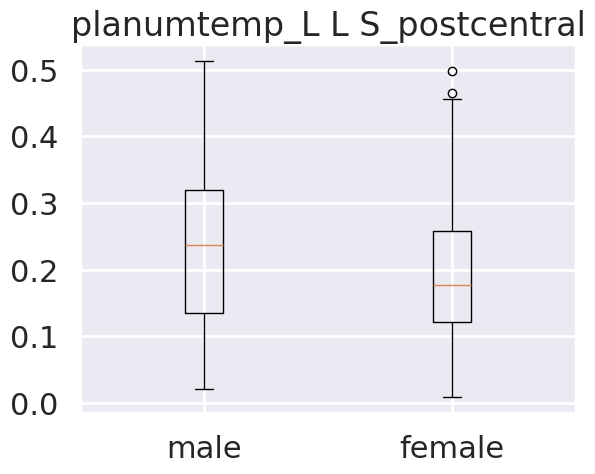

TtestResult(statistic=4.056626180589467, pvalue=5.881425283247614e-05, df=444.0)
male mean : 0.2338852373127962
male std : 0.11550593485179186
female mean : 0.19276792242553195
female std : 0.09798397802979554


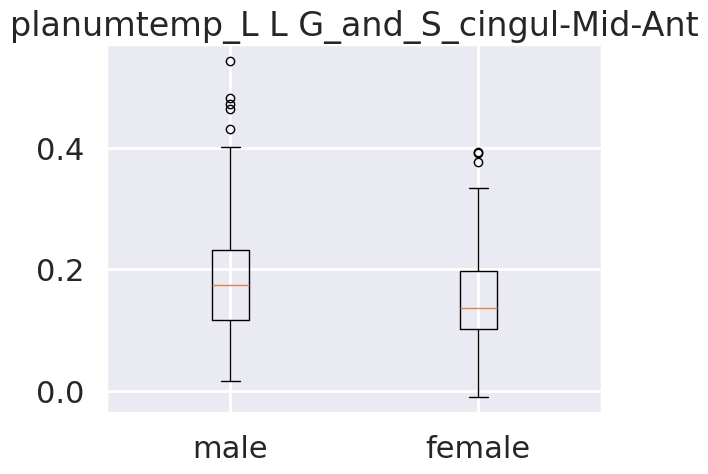

TtestResult(statistic=4.068456098737874, pvalue=5.600919789206141e-05, df=444.0)
male mean : 0.18399241431753555
male std : 0.09502523348826016
female mean : 0.15122356932127656
female std : 0.07429123059969363


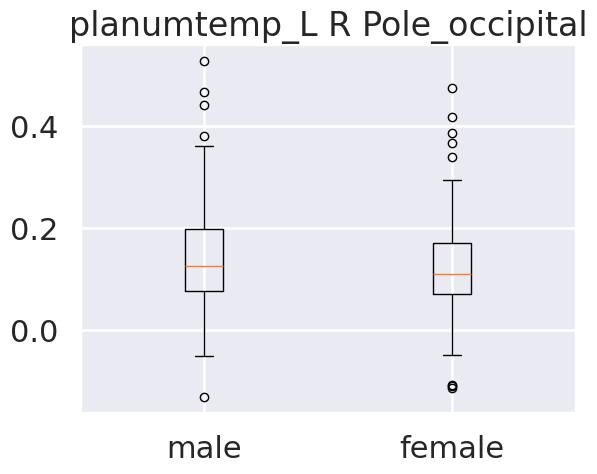

TtestResult(statistic=2.8830971461363837, pvalue=0.004129116113029113, df=444.0)
male mean : 0.1450978958106635
male std : 0.09686778643219356
female mean : 0.1200056767894468
female std : 0.08651973830457439


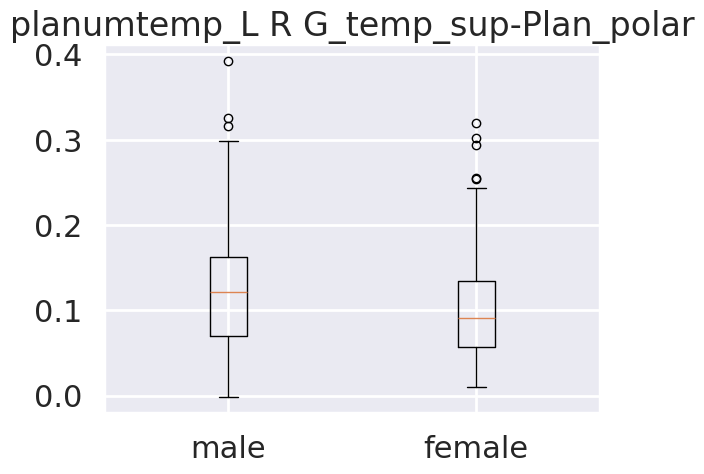

TtestResult(statistic=4.278894056104646, pvalue=2.3022034920513832e-05, df=444.0)
male mean : 0.12645605686398104
male std : 0.06618191967512217
female mean : 0.10129650282978722
female std : 0.05770237332369242


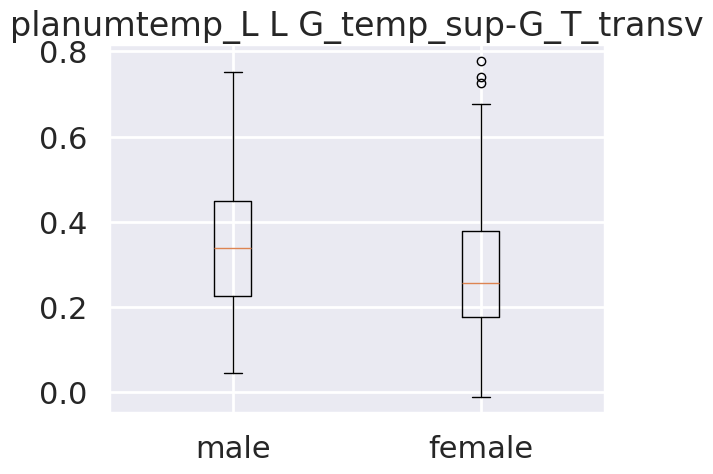

TtestResult(statistic=4.45745520231655, pvalue=1.0515686807631912e-05, df=444.0)
male mean : 0.3496300091327014
male std : 0.15255641237612336
female mean : 0.2872824054042553
female std : 0.14212346956816255


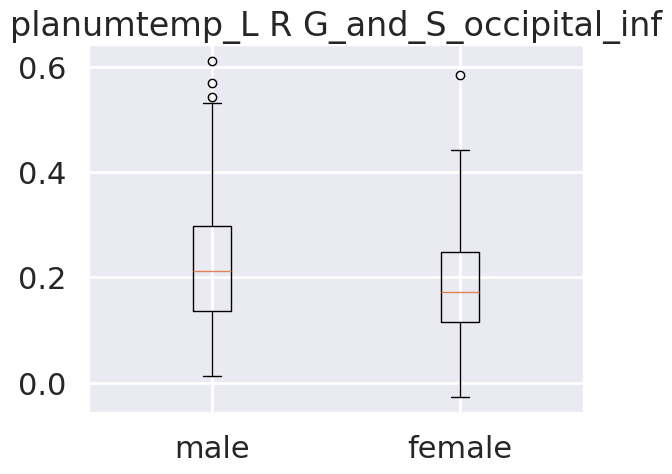

TtestResult(statistic=3.9738927865653464, pvalue=8.250259025849211e-05, df=444.0)
male mean : 0.22833552801895732
male std : 0.11627865120317238
female mean : 0.18739327032765957
female std : 0.1007813469604281
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [31]:
rois = ["planumtemp_L"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_planumtemp_L)


pdList = []
pdList.extend(data_results["confusion_matrix_validation"])
concat_df = pd.concat(pdList)
mean_confusion = concat_df.groupby(concat_df.index)
mean_confusion = mean_confusion.mean()

acc_vald = np.asarray(data_results["acc_validation"])
moy = np.mean(acc_vald)
se = np.std(acc_vald)
lower = moy - (1.96 * se)
upper = moy + (1.96 * se)
print("Validation accuracy")
print("The mean accuracy : " + str(moy))
print("The standard deviation of the accuracy : " + str(se))
print("The lower boundry of the confidance interval of the accuracy : " + str(lower))
print("The upper boundry of the confidance interval of the accuracy : " + str(upper))
print("\nConfusion matrix (mean) :")
print(mean_confusion)
sensitivity = data_results["confusion_matrix_validation"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix_validation"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))

print("\nTesting accuracy")
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
bestRegion(ROIs, data, df_boot)

## planumtemp_R validation accuracy results no 02

Validation accuracy
The mean accuracy : 0.6800767857142856
The standard deviation of the accuracy : 0.031022095020554072
The lower boundry of the confidance interval of the accuracy : 0.6192734794739997
The upper boundry of the confidance interval of the accuracy : 0.7408800919545716

Confusion matrix (mean) :
predicted class    Femme    Homme
actual class                     
Femme            39.9012  13.0988
Homme            22.7326  36.2674
Mean sensitivity : 0.6383021484130448 Std sensitivity : 0.03146521024436354
Mean specificity : 0.7371187016672347 Std specificity : 0.041882887334576784

Testing accuracy
     coefficient          seed                       labels
58      0.150781  planumtemp_R            L S_occipital_ant
80      0.134267  planumtemp_R     R G_and_S_cingul-Mid-Ant
72      0.133345  planumtemp_R             L S_temporal_sup
60      0.128371  planumtemp_R  L S_oc-temp_med_and_Lingual
121     0.128362  planumtemp_R      R S_circular_insula_inf
108     0.122781  pla

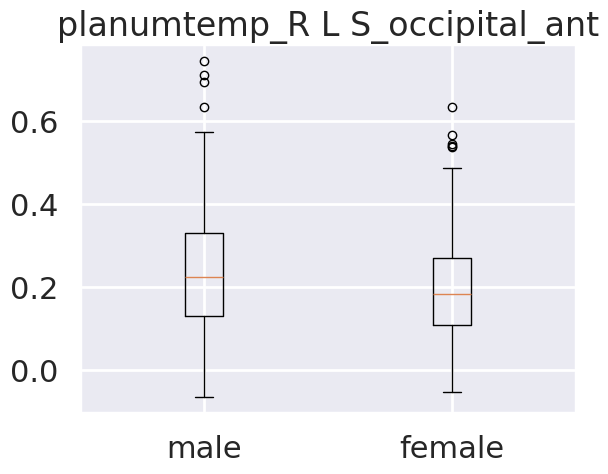

TtestResult(statistic=3.8009420406553938, pvalue=0.0001642715034397074, df=444.0)
male mean : 0.24748182751303316
male std : 0.15074424636702757
female mean : 0.19806916976297875
female std : 0.12286817560512481


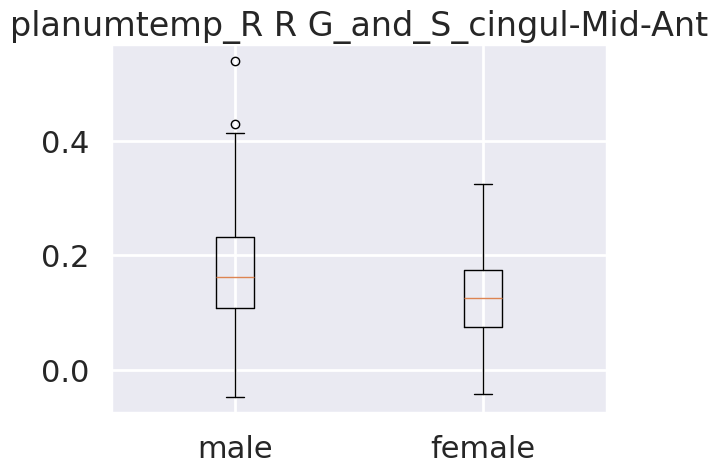

TtestResult(statistic=5.691205982824872, pvalue=2.2944326602425957e-08, df=444.0)
male mean : 0.17074738403317535
male std : 0.0886167569380666
female mean : 0.12859566155063828
female std : 0.06687098085916524


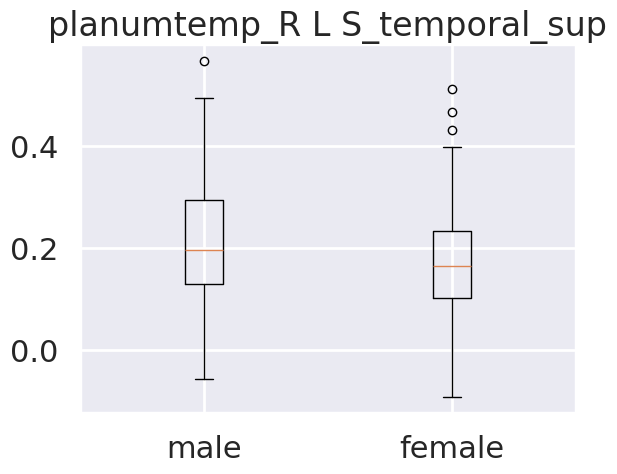

TtestResult(statistic=3.7492979719935224, pvalue=0.00020078118200028371, df=444.0)
male mean : 0.2128017606601896
male std : 0.12023297875763193
female mean : 0.17412700181280427
female std : 0.09680297024215465


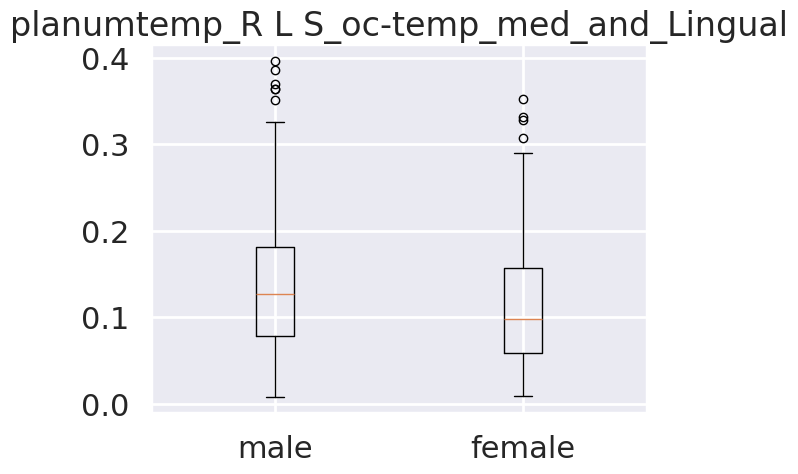

TtestResult(statistic=3.4683708553569645, pvalue=0.0005747002972371409, df=444.0)
male mean : 0.13773403446445498
male std : 0.07954452416072107
female mean : 0.11316921810212766
female std : 0.06968221622768991


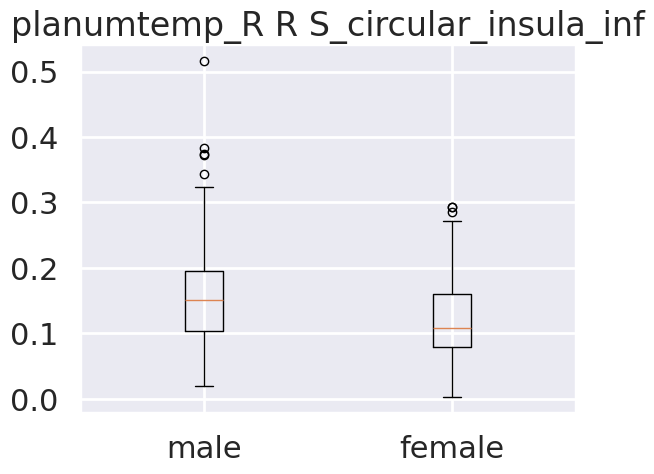

TtestResult(statistic=5.522677044505606, pvalue=5.6935635106855364e-08, df=444.0)
male mean : 0.15734653379146923
male std : 0.07327744189278278
female mean : 0.12254758828765956
female std : 0.05931904729014012


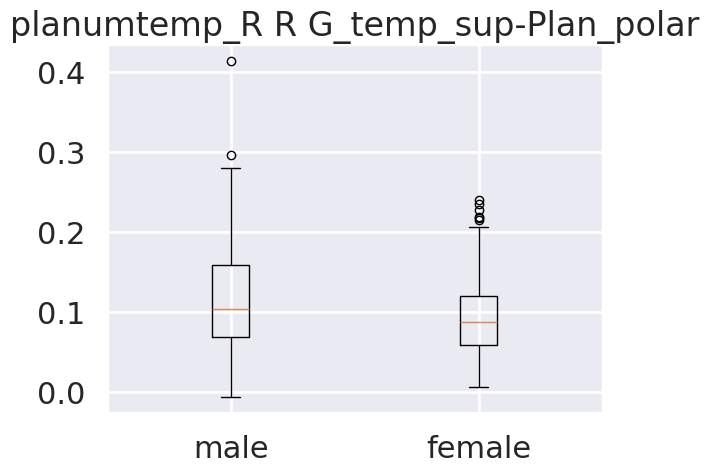

TtestResult(statistic=4.206844216028738, pvalue=3.1345007603195484e-05, df=444.0)
male mean : 0.11633572743791469
male std : 0.0627642699685286
female mean : 0.09400403725531915
female std : 0.04880711517610225


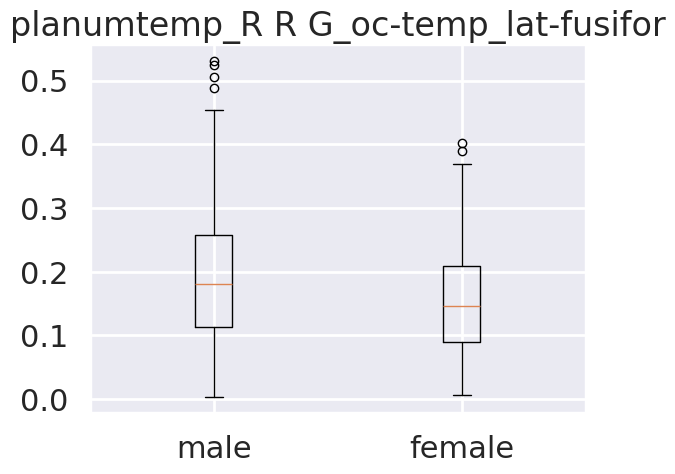

TtestResult(statistic=4.087823724171709, pvalue=5.168947184912931e-05, df=444.0)
male mean : 0.1916040306099526
male std : 0.10283105036686208
female mean : 0.1556855788425532
female std : 0.08199454077156562


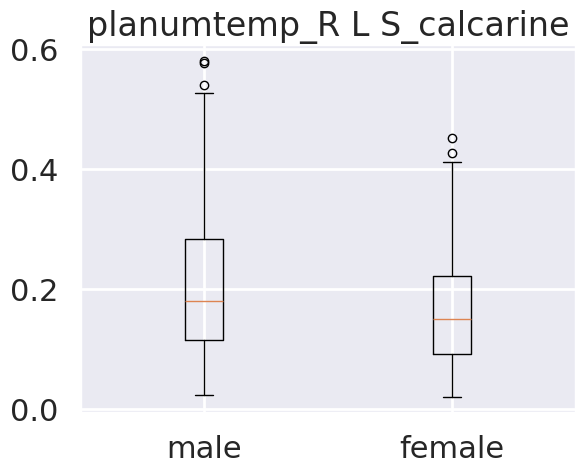

TtestResult(statistic=4.178662372102482, pvalue=3.5324390429998664e-05, df=444.0)
male mean : 0.20779662080094785
male std : 0.11901486482118238
female mean : 0.16571786605106384
female std : 0.09263994196425407


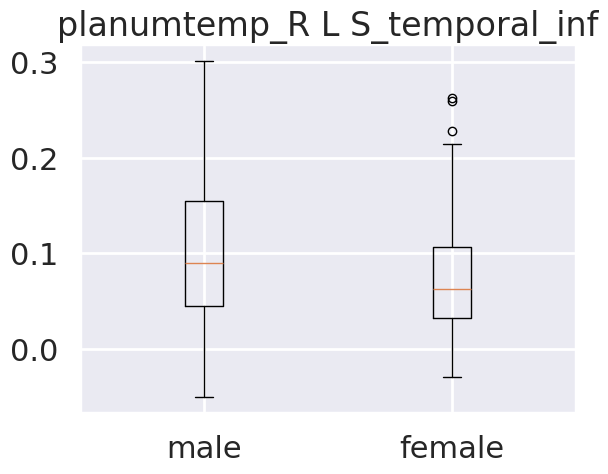

TtestResult(statistic=4.197079534336505, pvalue=3.267279105393717e-05, df=444.0)
male mean : 0.098917741314218
male std : 0.0687100367917049
female mean : 0.07421792154382978
female std : 0.055099251011639844


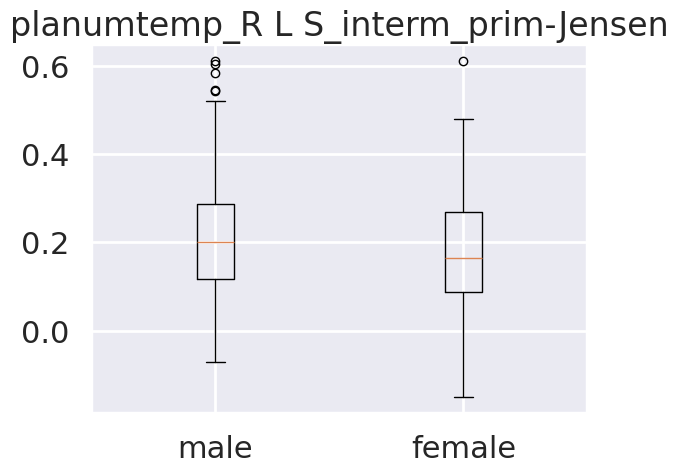

TtestResult(statistic=2.6254252305075942, pvalue=0.008952828713910387, df=444.0)
male mean : 0.21259454358009477
male std : 0.14249738970687054
female mean : 0.17944125416382978
female std : 0.12354592973173553
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [32]:
rois = ["planumtemp_R"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_planumtemp_R)


pdList = []
pdList.extend(data_results["confusion_matrix_validation"])
concat_df = pd.concat(pdList)
mean_confusion = concat_df.groupby(concat_df.index)
mean_confusion = mean_confusion.mean()

acc_vald = np.asarray(data_results["acc_validation"])
moy = np.mean(acc_vald)
se = np.std(acc_vald)
lower = moy - (1.96 * se)
upper = moy + (1.96 * se)
print("Validation accuracy")
print("The mean accuracy : " + str(moy))
print("The standard deviation of the accuracy : " + str(se))
print("The lower boundry of the confidance interval of the accuracy : " + str(lower))
print("The upper boundry of the confidance interval of the accuracy : " + str(upper))
print("\nConfusion matrix (mean) :")
print(mean_confusion)
sensitivity = data_results["confusion_matrix_validation"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix_validation"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))

print("\nTesting accuracy")
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
bestRegion(ROIs, data, df_boot)

## all left validation accuracy results no 02

Validation accuracy
The mean accuracy : 0.7811535714285716
The standard deviation of the accuracy : 0.024953214129810275
The lower boundry of the confidance interval of the accuracy : 0.7322452717341434
The upper boundry of the confidance interval of the accuracy : 0.8300618711229997

Confusion matrix (mean) :
predicted class    Femme    Homme
actual class                     
Femme            44.0981   8.9019
Homme            15.6089  43.3911
Mean sensitivity : 0.7398679214383211 Std sensitivity : 0.030502170318765492
Mean specificity : 0.8312694124144396 Std specificity : 0.033155338494251244

Testing accuracy
     coefficient          seed                       labels
263     0.104078  planumtemp_L             R Pole_occipital
98      0.098345       opIFG_L       R G_pariet_inf-Angular
464     0.091769        pITG_L      L G_oc-temp_lat-fusifor
189     0.090473  planumtemp_L             L Pole_occipital
53      0.086882       opIFG_L                L S_front_sup
234     0.084454  pl

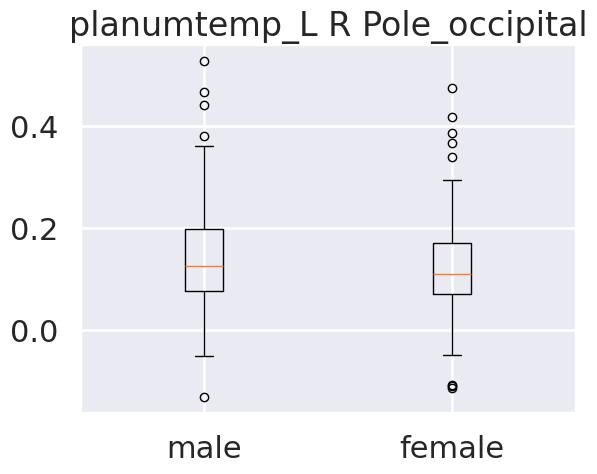

TtestResult(statistic=2.8830971461363837, pvalue=0.004129116113029113, df=444.0)
male mean : 0.1450978958106635
male std : 0.09686778643219356
female mean : 0.1200056767894468
female std : 0.08651973830457439


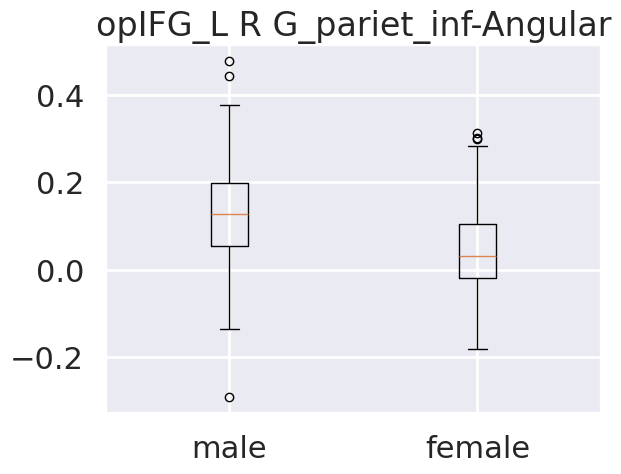

TtestResult(statistic=8.36453316136448, pvalue=7.884044598818814e-16, df=444.0)
male mean : 0.12652099691800947
male std : 0.11205031629586265
female mean : 0.04436252679727659
female std : 0.09482727144561362


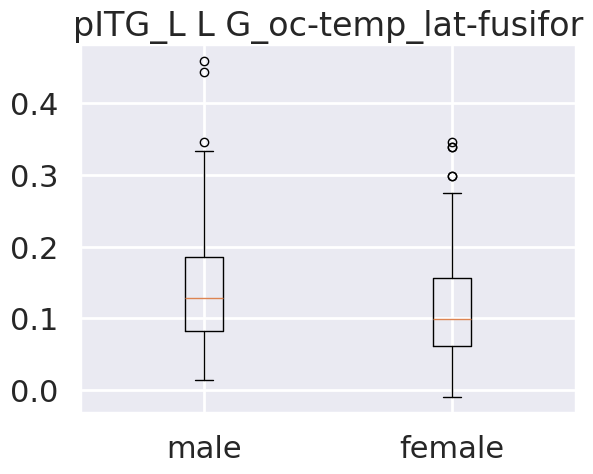

TtestResult(statistic=3.275834050563673, pvalue=0.0011360567722706225, df=444.0)
male mean : 0.13928527996682463
male std : 0.07670719318097458
female mean : 0.11658672618927658
female std : 0.06929713865976829


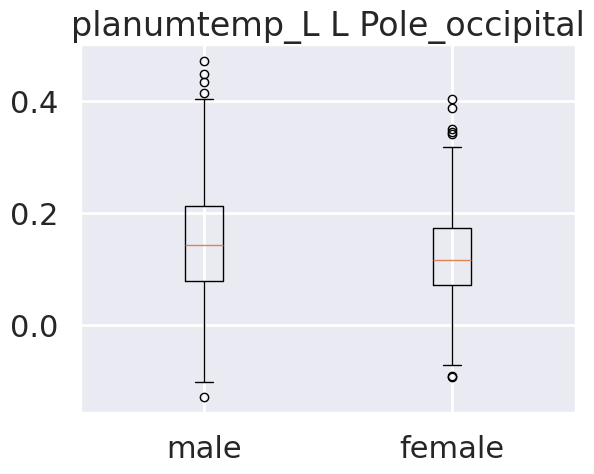

TtestResult(statistic=3.2624503110074787, pvalue=0.0011897491547535647, df=444.0)
male mean : 0.1509238786113744
male std : 0.0973540374590649
female mean : 0.12269890486851065
female std : 0.08492474456953504


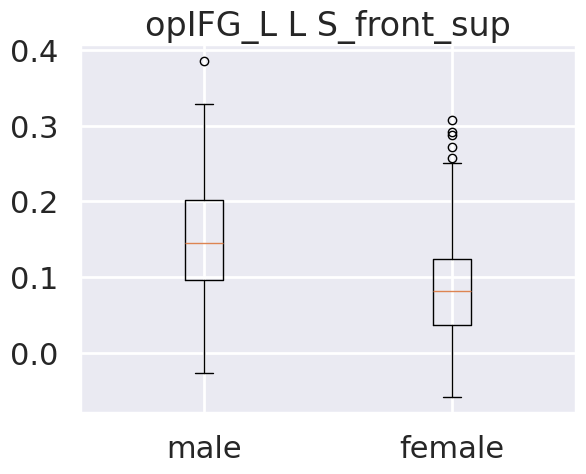

TtestResult(statistic=9.392381535030605, pvalue=3.0963588871687413e-19, df=444.0)
male mean : 0.15022324893838862
male std : 0.07243933596507521
female mean : 0.08831146950076596
female std : 0.06644850251834429


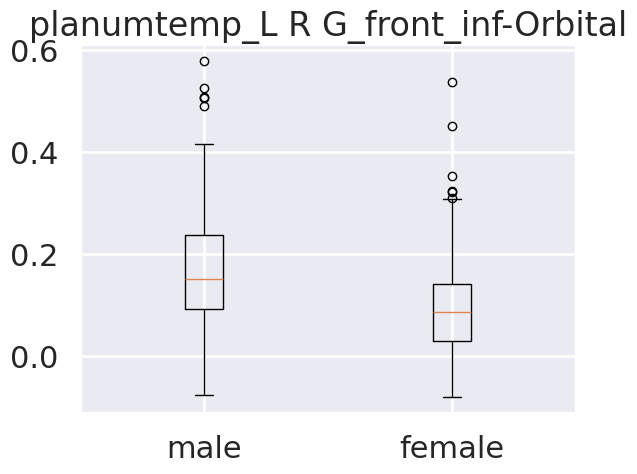

TtestResult(statistic=7.81805069131277, pvalue=3.9341990764708535e-14, df=444.0)
male mean : 0.17241957559763033
male std : 0.11327035225905915
female mean : 0.09635612358170213
female std : 0.09145115973292998


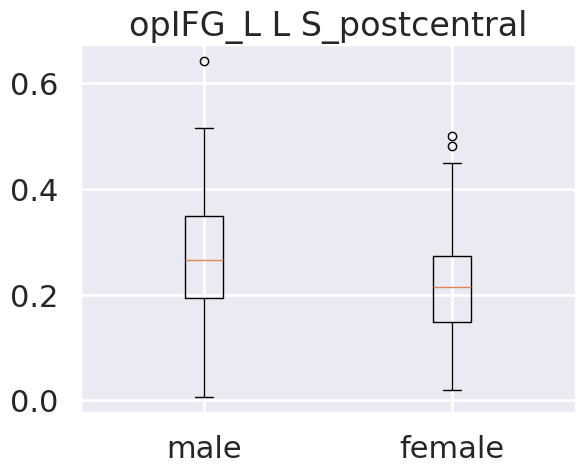

TtestResult(statistic=6.067888557380934, pvalue=2.7794658743318966e-09, df=444.0)
male mean : 0.2739751052763033
male std : 0.11117662240373184
female mean : 0.21474562371914896
female std : 0.09442435413445043


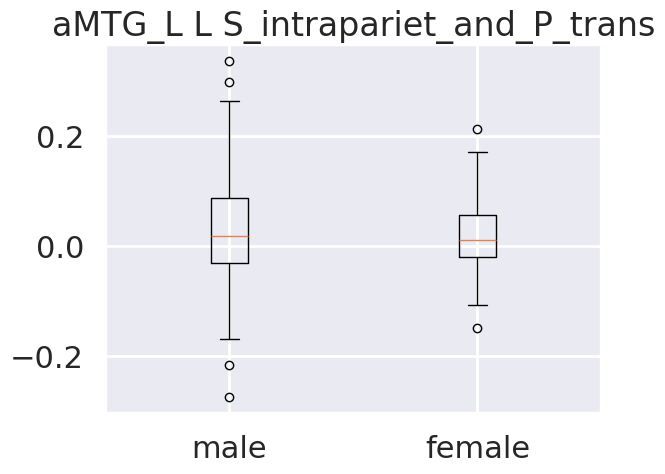

TtestResult(statistic=1.2152906043525493, pvalue=0.22490110147854064, df=444.0)
male mean : 0.027097741051184836
male std : 0.08743934494614101
female mean : 0.018400407782408514
female std : 0.06239762751688975


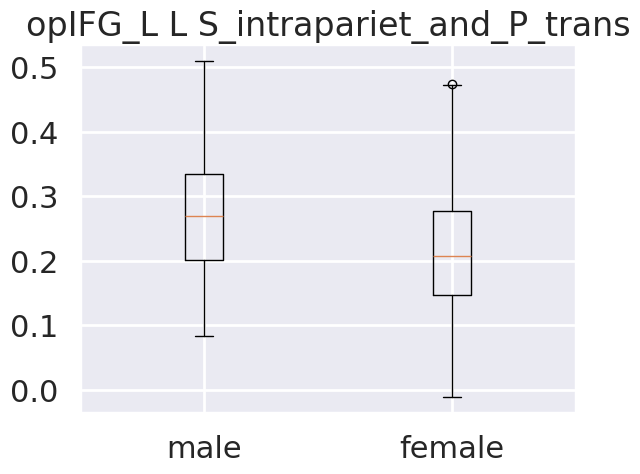

TtestResult(statistic=6.427201870497699, pvalue=3.357767316845091e-10, df=444.0)
male mean : 0.2702339562037915
male std : 0.09432151354355668
female mean : 0.21262982520234042
female std : 0.09426080476314916


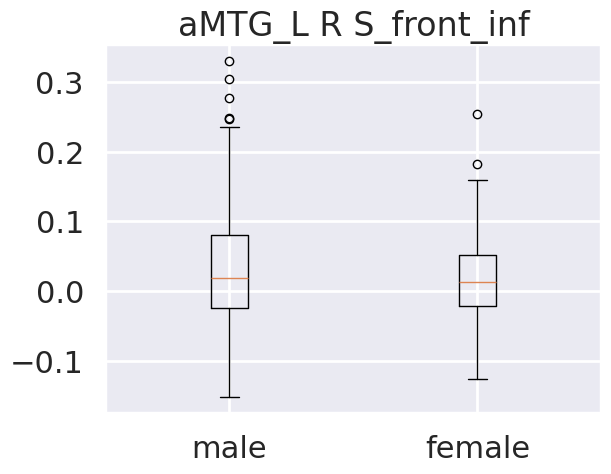

TtestResult(statistic=1.711697678978652, pvalue=0.08765072553574642, df=444.0)
male mean : 0.030188685882938392
male std : 0.08228056241988818
female mean : 0.01869213095948936
female std : 0.058284090389342055
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [33]:
rois = ["opIFG_L", "planumtemp_L", "aMTG_L", "pITG_L"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_all_left)


pdList = []
pdList.extend(data_results["confusion_matrix_validation"])
concat_df = pd.concat(pdList)
mean_confusion = concat_df.groupby(concat_df.index)
mean_confusion = mean_confusion.mean()

acc_vald = np.asarray(data_results["acc_validation"])
moy = np.mean(acc_vald)
se = np.std(acc_vald)
lower = moy - (1.96 * se)
upper = moy + (1.96 * se)
print("Validation accuracy")
print("The mean accuracy : " + str(moy))
print("The standard deviation of the accuracy : " + str(se))
print("The lower boundry of the confidance interval of the accuracy : " + str(lower))
print("The upper boundry of the confidance interval of the accuracy : " + str(upper))
print("\nConfusion matrix (mean) :")
print(mean_confusion)
sensitivity = data_results["confusion_matrix_validation"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix_validation"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))

print("\nTesting accuracy")
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
bestRegion(ROIs, data, df_boot)

## all right validation accuracy results no 02

Validation accuracy
The mean accuracy : 0.7732589285714285
The standard deviation of the accuracy : 0.028964064150552953
The lower boundry of the confidance interval of the accuracy : 0.7164893628363448
The upper boundry of the confidance interval of the accuracy : 0.8300284943065123

Confusion matrix (mean) :
predicted class    Femme    Homme
actual class                     
Femme            44.9221   8.0779
Homme            17.3171  41.6829
Mean sensitivity : 0.723106577616324 Std sensitivity : 0.03249886110949144
Mean specificity : 0.8396139866525723 Std specificity : 0.03946557527326713

Testing accuracy
     coefficient          seed                       labels
498     0.101035        pITG_R       L S_interm_prim-Jensen
316     0.097452        aMTG_R      L G_oc-temp_lat-fusifor
524     0.090328        pITG_R     R G_and_S_cingul-Mid-Ant
189     0.088741  planumtemp_R             L Pole_occipital
421     0.086145        aMTG_R                R S_front_inf
502     0.083964       

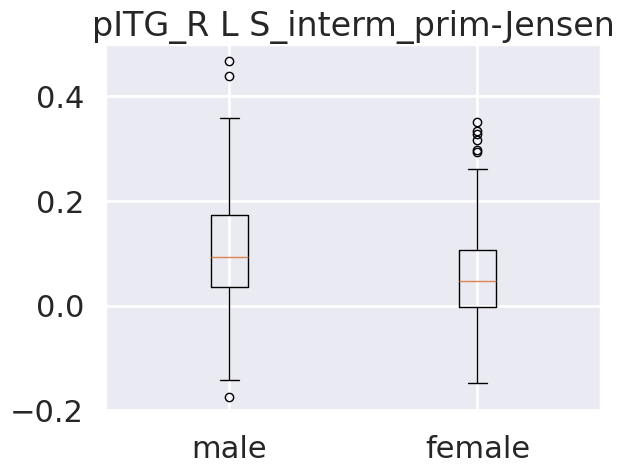

TtestResult(statistic=4.641000164550433, pvalue=4.570899935707834e-06, df=444.0)
male mean : 0.10024204454407584
male std : 0.10899325004998278
female mean : 0.056442184588638304
female std : 0.08968164578380426


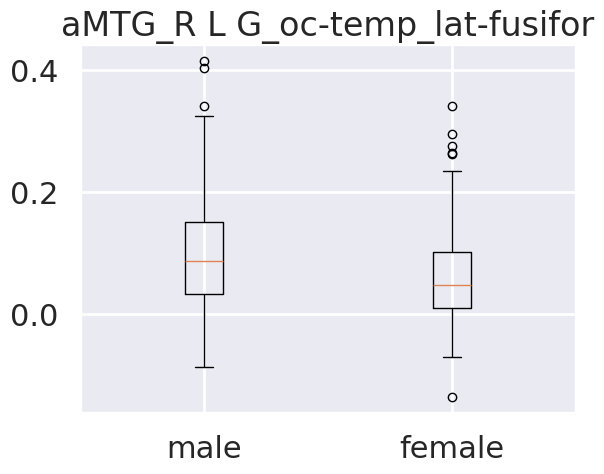

TtestResult(statistic=4.728335977215177, pvalue=3.0449299231438466e-06, df=444.0)
male mean : 0.10049291556744076
male std : 0.08873256390651249
female mean : 0.06442563383957446
female std : 0.07178152602552673


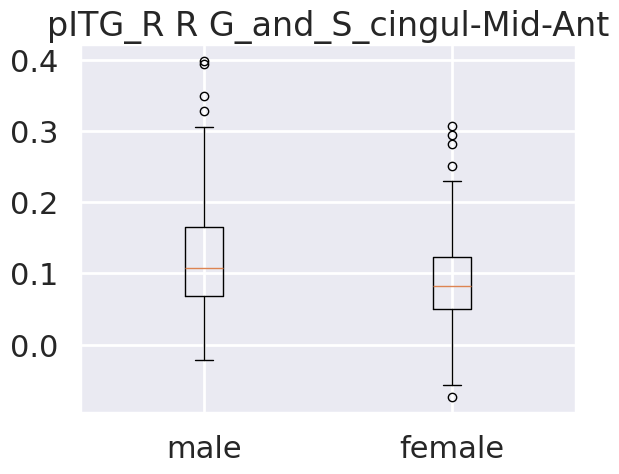

TtestResult(statistic=4.600027640439905, pvalue=5.518565377868144e-06, df=444.0)
male mean : 0.12042437503791467
male std : 0.07776189254634676
female mean : 0.09035040455829788
female std : 0.05957252115420796


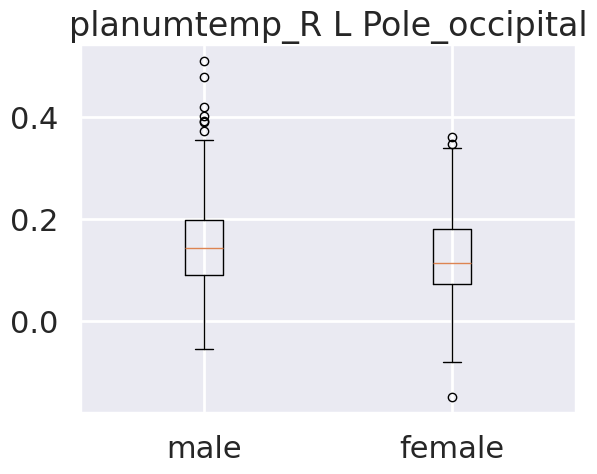

TtestResult(statistic=3.466356835556034, pvalue=0.0005789075811182437, df=444.0)
male mean : 0.1559526358341232
male std : 0.09580451884056192
female mean : 0.12642922241531918
female std : 0.08364505045318264


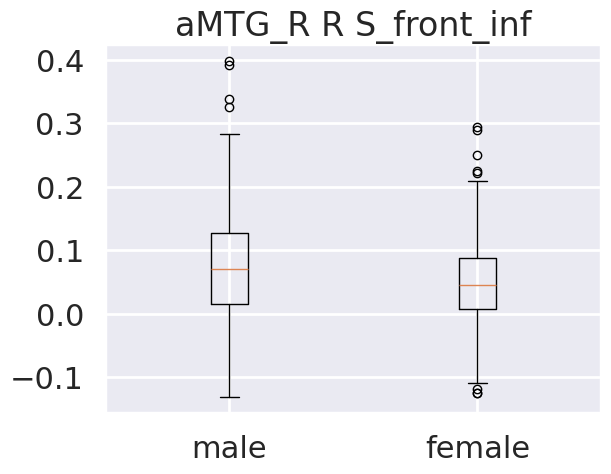

TtestResult(statistic=3.335901726480186, pvalue=0.0009216377349416962, df=444.0)
male mean : 0.07517456851943127
male std : 0.088533779097146
female mean : 0.050113374225063824
female std : 0.0694077438137764


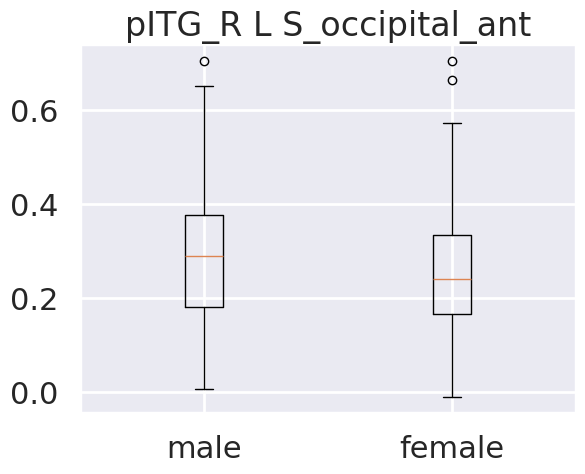

TtestResult(statistic=3.1195843617914436, pvalue=0.0019290290051488148, df=444.0)
male mean : 0.2941864701189574
male std : 0.14464420290564173
female mean : 0.2541460874319149
female std : 0.12577495870736924


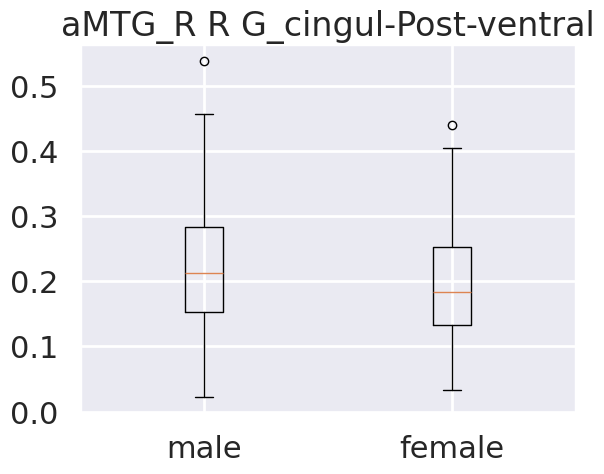

TtestResult(statistic=2.922353709233082, pvalue=0.0036513359925845965, df=444.0)
male mean : 0.22116097911374405
male std : 0.09382954946418635
female mean : 0.19657145856170213
female std : 0.08346855990908168


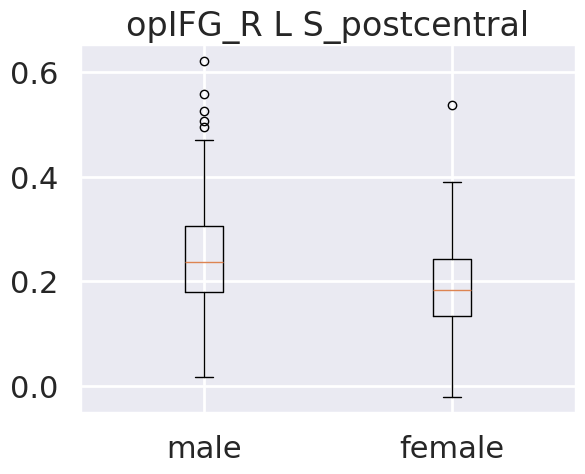

TtestResult(statistic=6.406382158686503, pvalue=3.8051774061160153e-10, df=444.0)
male mean : 0.24538767387203797
male std : 0.09987726441030285
female mean : 0.18966612626255316
female std : 0.08327246284776511


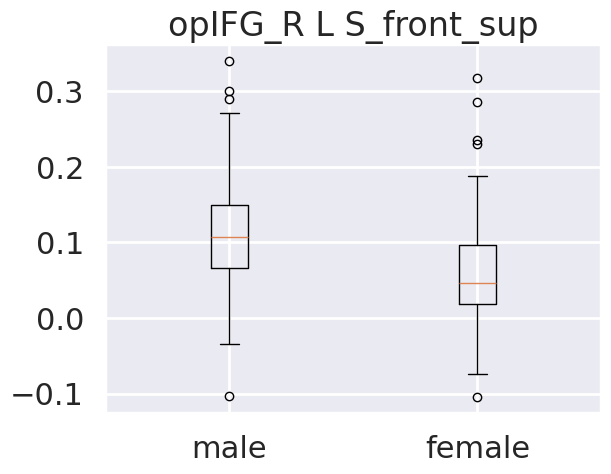

TtestResult(statistic=8.615404795814058, pvalue=1.2309818615958996e-16, df=444.0)
male mean : 0.11084387636729857
male std : 0.07187370925973573
female mean : 0.05657821136085107
female std : 0.06078883643700153


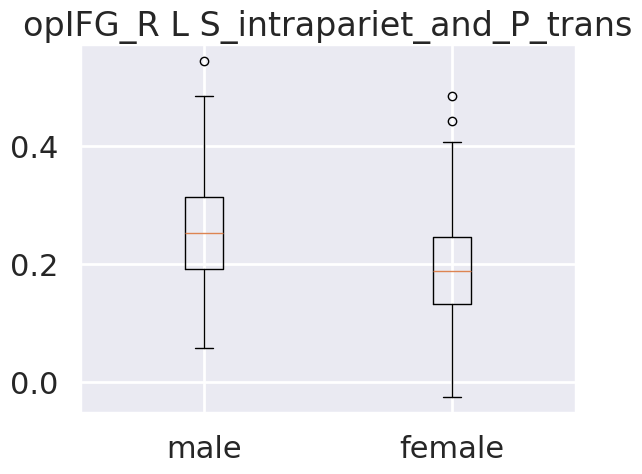

TtestResult(statistic=8.2164688924199, pvalue=2.316840417879698e-15, df=444.0)
male mean : 0.25726011294312795
male std : 0.09011348233992743
female mean : 0.1890884152145532
female std : 0.08466926171614057
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [34]:
rois = ["opIFG_R", "planumtemp_R", "aMTG_R", "pITG_R"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_all_right)


pdList = []
pdList.extend(data_results["confusion_matrix_validation"])
concat_df = pd.concat(pdList)
mean_confusion = concat_df.groupby(concat_df.index)
mean_confusion = mean_confusion.mean()

acc_vald = np.asarray(data_results["acc_validation"])
moy = np.mean(acc_vald)
se = np.std(acc_vald)
lower = moy - (1.96 * se)
upper = moy + (1.96 * se)
print("Validation accuracy")
print("The mean accuracy : " + str(moy))
print("The standard deviation of the accuracy : " + str(se))
print("The lower boundry of the confidance interval of the accuracy : " + str(lower))
print("The upper boundry of the confidance interval of the accuracy : " + str(upper))
print("\nConfusion matrix (mean) :")
print(mean_confusion)
sensitivity = data_results["confusion_matrix_validation"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix_validation"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))

print("\nTesting accuracy")
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
bestRegion(ROIs, data, df_boot)

## Test classification feature by feature on an independent set

In [8]:
# 263      0.071801  planumtemp_L             R Pole_occipital
# 98       0.066985       opIFG_L       R G_pariet_inf-Angular
# 1090     0.066145        pITG_R       L S_interm_prim-Jensen
# 189      0.063483  planumtemp_L             L Pole_occipital
# 351      0.051789        aMTG_L  L S_intrapariet_and_P_trans
# 379      0.051756        aMTG_L      R G_cingul-Post-ventral
# 53       0.051418       opIFG_L                L S_front_sup
# 1094     0.051398        pITG_R            L S_occipital_ant
# 908      0.050601        aMTG_R      L G_oc-temp_lat-fusifor
# 464      0.049779        pITG_L      L G_oc-temp_lat-fusifor

# the best feature (seed and their region)
seeds = ["planumtemp_L", "opIFG_L", "pITG_R", "planumtemp_L", "aMTG_L", "aMTG_L" , "opIFG_L", "pITG_R", "aMTG_R", "pITG_L"]
regions = ["R_Pole_occipital", 
          "R_G_pariet_inf-Angular", 
          "L_S_interm_prim-Jensen", 
          "L_Pole_occipital", 
          "L_S_intrapariet_and_P_trans", 
          "R_G_cingul-Post-ventral",
           "L_S_front_sup",
         "L_S_occipital_ant",
         "L_G_oc-temp_lat-fusifor",
         "L_G_oc-temp_lat-fusifor"]

file_path = "/data/brambati/dataset/HCP/derivatives/seed-to-voxel-nilearn/results_no/atlas_means/destrieux_fisherz/seed-{seed_name}_atlas-destrieux_mean-all4_gmcorrected__fisherz.csv"
Final_df = pd.read_csv("/data/brambati/dataset/HCP/derivatives/training_sex_diff/HCP_matched_age_educ_validation_02.csv")

x = []
y = []
for i in range(0, len(seeds)):
    file = file_path.format(seed_name=seeds[i])
    loaded = pd.read_csv(file_path.format(seed_name=seeds[i]))
    signal = loaded[seeds[i]+"__"+regions[i]]
    for subject in Final_df["Subject"]:
        sub_sex = Final_df.loc[Final_df["Subject"] == subject]["Gender"].values[0]
        value = loaded.loc[loaded["Unnamed: 0"] == "sub-"+str(subject)][seeds[i]+"__"+regions[i]].values[0]
        x.append(value)
        y.append(sub_sex)
    x = np.asarray(x)
    x = x.reshape(-1,1)
    print("Testing : "+seeds[i]+" "+regions[i])
    model = machine_learning(x,y)
    print("\n")
    x = []
    y = []
        

Testing : planumtemp_L R_Pole_occipital
train: 89 test: 23
[array([0.4 , 0.8 , 0.6 , 0.6 , 0.2 , 0.8 , 0.8 , 0.8 , 1.  , 0.25, 0.5 ,
       0.75, 0.75, 0.5 , 0.75, 0.75, 0.5 , 0.5 , 0.75, 0.5 ])]
predicted class  Femme  Homme
actual class                 
Femme                7      4
Homme                4      8
accuracy test (r2) = 0.6521739130434783
accuracy train (r2) = 0.6292134831460674


Testing : opIFG_L R_G_pariet_inf-Angular
train: 89 test: 23
[array([0.8 , 0.4 , 0.4 , 0.6 , 0.8 , 0.8 , 0.8 , 0.4 , 0.6 , 0.5 , 0.25,
       0.75, 0.5 , 0.5 , 0.75, 0.5 , 1.  , 0.5 , 0.75, 0.75])]
predicted class  Femme  Homme
actual class                 
Femme                4      7
Homme                4      8
accuracy test (r2) = 0.5217391304347826
accuracy train (r2) = 0.6179775280898876


Testing : pITG_R L_S_interm_prim-Jensen
train: 89 test: 23
[array([0.4 , 1.  , 0.6 , 0.6 , 0.6 , 0.6 , 0.8 , 0.6 , 0.8 , 0.75, 0.25,
       0.75, 0.75, 0.5 , 0.75, 0.75, 0.75, 0.25, 0.75, 0.5 ])]
predi

## Validation set

In [54]:
seeds = ["opIFG_L", "opIFG_L", "aMTG_L", "opIFG_L", "aMTG_L", "aMTG_L" , "aMTG_L", "planumtemp_L", "aMTG_L", "aMTG_L"]
regions = ["L_S_front_sup", 
          "R_G_pariet_inf-Angular", 
          "L_G_cingul-Post-ventral", 
          "L_G_and_S_transv_frontopol", 
          "L_S_intrapariet_and_P_trans", 
          "R_G_cingul-Post-ventral",
           "R_S_front_inf",
         "L_Pole_occipital",
         "L_G_and_S_cingul-Ant",
         "R_S_orbital_lateral"]

file_path = "/data/brambati/dataset/HCP/derivatives/seed-to-voxel-nilearn/results_2024/atlas_means/destrieux_fisherz/seed-{seed_name}_atlas-destrieux_mean-all4_gmcorrected__fisherz.csv"
Final_df = pd.read_csv("/data/brambati/dataset/HCP/derivatives/training_sex_diff/HCP_matched_age_educ_validation.csv")

for i in range(0, 1):
    file = file_path.format(seed_name=seeds[i])
    loaded = pd.read_csv(file_path.format(seed_name=seeds[i]))
    Final_df["Unnamed: 0"] = Final_df["Subject"].apply(lambda x : "sub-"+str(x))
    loaded = loaded[loaded["Unnamed: 0"].isin(Final_df["Unnamed: 0"])]
    signal = loaded[seeds[i]+"__"+regions[i]]
    acc = 0
    for index, row in loaded.iterrows():
        real = Final_df[Final_df["Unnamed: 0"] == row["Unnamed: 0"]]["Gender"].values[0]
        prediction = model["model"].predict([[row[seeds[i]+"__"+regions[i]]]])[0]
        if real == prediction:
            acc += 1
    print("Accuracy for the prediction on the validation set with the " +seeds[i]+"__"+regions[i]+" pair: " + str(acc/len(loaded)))

Accuracy for the prediction on the validation set with the opIFG_L__L_S_front_sup pair: 0.5714285714285714


## Mean AUC

In [23]:
study_dir = Path('/data/brambati/dataset/HCP/derivatives/training_sex_diff/')
results_path_all_seed = study_dir / "results_no_02" / "LinearSVC" / "seed-all_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_all_seed)

In [24]:
data_results

,len_X_train,len_X_test,score,confusion_matrix,confusion_matrix_validation,acc_train,acc_test,acc_validation,auc_train,auc_test,auc_validation,model
0,356,90,[0.9132539682539683],predicted class Femme Homme actual class ...,predicted class Femme Homme actual class ...,1.0,0.911111,0.776786,1.0,0.908956,0.779501,"LinearSVC(dual=False, max_iter=10000)"
1,356,90,[0.9185714285714287],predicted class Femme Homme actual class ...,predicted class Femme Homme actual class ...,1.0,0.866667,0.750000,1.0,0.863095,0.755996,"LinearSVC(dual=False, max_iter=10000)"
2,356,90,[0.9126984126984127],predicted class Femme Homme actual class ...,predicted class Femme Homme actual class ...,1.0,0.933333,0.803571,1.0,0.932806,0.804925,"LinearSVC(dual=False, max_iter=10000)"
3,356,90,[0.9213492063492064],predicted class Femme Homme actual class ...,predicted class Femme Homme actual class ...,1.0,0.911111,0.750000,1.0,0.911561,0.752159,"LinearSVC(dual=False, max_iter=10000)"
4,356,90,[0.9100793650793652],predicted class Femme Homme actual class ...,predicted class Femme Homme actual class ...,1.0,0.866667,0.785714,1.0,0.858220,0.791813,"LinearSVC(dual=False, max_iter=10000)"
...,...,...,...,...,...,...,...,...,...,...,...,...
9995,356,90,[0.8988888888888888],predicted class Femme Homme actual class ...,predicted class Femme Homme actual class ...,1.0,0.944444,0.785714,1.0,0.944444,0.790854,"LinearSVC(dual=False, max_iter=10000)"
9996,356,90,[0.924126984126984],predicted class Femme Homme actual class ...,predicted class Femme Homme actual class ...,1.0,0.922222,0.794643,1.0,0.918155,0.799328,"LinearSVC(dual=False, max_iter=10000)"
9997,356,90,[0.8960317460317461],predicted class Femme Homme actual class ...,predicted class Femme Homme actual class ...,1.0,0.911111,0.794643,1.0,0.918367,0.795491,"LinearSVC(dual=False, max_iter=10000)"
9998,356,90,[0.8907936507936508],predicted class Femme Homme actual class ...,predicted class Femme Homme actual class ...,1.0,0.855556,0.767857,1.0,0.851806,0.773905,"LinearSVC(dual=False, max_iter=10000)"


In [25]:
# auc test
auc = data_results["auc_test"]
auc_test = np.asarray(auc)
moy = np.mean(auc_test)
se = np.std(auc_test)
lower = moy - (1.96 * se)
upper = moy + (1.96 * se)

print("The mean AUC : " + str(moy))
print("The standard deviation of the AUC : " + str(se))
print("The lower boundry of the confidance interval of the AUC : " + str(lower))
print("The upper boundry of the confidance interval of the AUC : " + str(upper))

The mean AUC : 0.9123273010789302
The standard deviation of the AUC : 0.032267522762310055
The lower boundry of the confidance interval of the AUC : 0.8490829564648026
The upper boundry of the confidance interval of the AUC : 0.9755716456930579


In [26]:
# auc validation
auc = data_results["auc_validation"]
auc_test = np.asarray(auc)
moy = np.mean(auc_test)
se = np.std(auc_test)
lower = moy - (1.96 * se)
upper = moy + (1.96 * se)

print("The mean AUC : " + str(moy))
print("The standard deviation of the AUC : " + str(se))
print("The lower boundry of the confidance interval of the AUC : " + str(lower))
print("The upper boundry of the confidance interval of the AUC : " + str(upper))

The mean AUC : 0.7846142308922289
The standard deviation of the AUC : 0.026214053642241348
The lower boundry of the confidance interval of the AUC : 0.7332346857534359
The upper boundry of the confidance interval of the AUC : 0.835993776031022


# Resutls wm 01

In [81]:
study_dir = Path('/data/brambati/dataset/HCP/derivatives/training_sex_diff/results_wm_01/LinearSVC/')
results_path_all_seed = study_dir / "seed-all_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_aMTG_L = study_dir / "seed-aMTG_L_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_aMTG_R = study_dir / "seed-aMTG_R_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_opIFG_L = study_dir / "seed-opIFG_L_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_opIFG_R = study_dir / "seed-opIFG_R_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_pITG_L = study_dir / "seed-pITG_L_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_pITG_R = study_dir / "seed-pITG_R_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_planumtemp_L = study_dir / "seed-planumtemp_L_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_planumtemp_R = study_dir / "seed-planumtemp_R_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_all_left = study_dir / "seed-left_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_all_right = study_dir / "seed-right_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
all_results = [results_path_all_seed, results_path_aMTG_L, results_path_aMTG_R, results_path_opIFG_L, results_path_opIFG_R, results_path_pITG_L, results_path_pITG_R, results_path_planumtemp_L, results_path_planumtemp_R, results_path_all_left, results_path_all_right]

In [82]:
# fetching label from destrieux atlas minus two labels not used
atlas_dest = datasets.fetch_atlas_destrieux_2009(legacy_format=False)
label = atlas_dest["labels"].drop([0,42,117]) # correction for the destrieux atlas labels
label = label.reset_index()

-------------------------------------------------------------------------------------------------------
['opIFG_L', 'planumtemp_L', 'aMTG_L', 'pITG_L', 'opIFG_R', 'planumtemp_R', 'aMTG_R', 'pITG_R']
-------------------------------------------------------------------------------------------------------
      coefficient          seed                      labels
53       0.076144       opIFG_L               L S_front_sup
98       0.069329       opIFG_L      R G_pariet_inf-Angular
422      0.065315        aMTG_L            R S_front_middle
421      0.064355        aMTG_L               R S_front_inf
1013     0.060580        aMTG_R               R S_front_inf
301      0.060371        aMTG_L        L G_and_S_cingul-Ant
305      0.059266        aMTG_L     L G_cingul-Post-ventral
4        0.056628       opIFG_L  L G_and_S_transv_frontopol
189      0.055237  planumtemp_L            L Pole_occipital
300      0.053906        aMTG_L  L G_and_S_transv_frontopol
The mean accuracy : 0.904463333333333

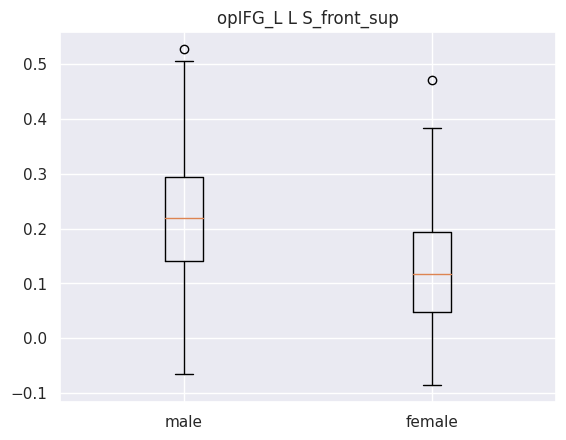

Ttest_indResult(statistic=9.514226955534408, pvalue=1.1745948061525577e-19)
male mean : 0.22193633239999996
male std : 0.11249626112199279
female mean : 0.12588911007571682
female std : 0.10000267392277586


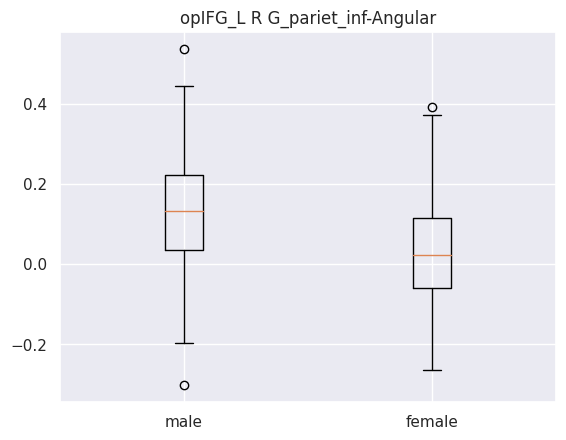

Ttest_indResult(statistic=7.24780487230096, pvalue=1.8918423767886693e-12)
male mean : 0.12424016548681818
male std : 0.13424300726761648
female mean : 0.03453558849026549
female std : 0.1265180924203619


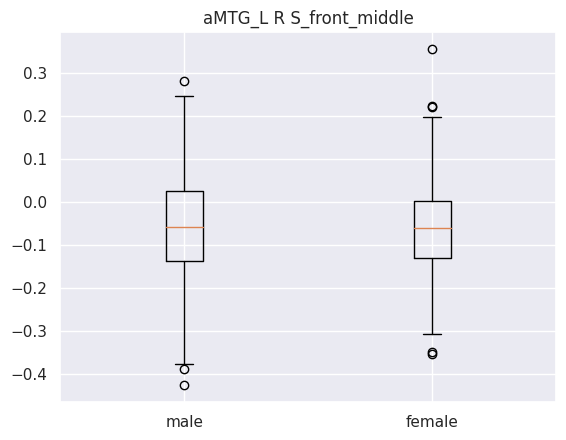

Ttest_indResult(statistic=-0.1288149656454001, pvalue=0.8975623921747511)
male mean : -0.06136301187972727
male std : 0.12937809167247663
female mean : -0.05989662055278762
female std : 0.10994256393017068


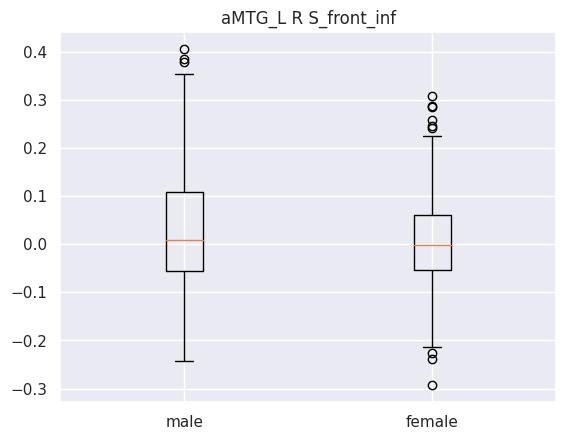

Ttest_indResult(statistic=1.9193910426129293, pvalue=0.055575465964615225)
male mean : 0.025140619681999998
male std : 0.12506768589238804
female mean : 0.004515161334216815
female std : 0.10031688528841444


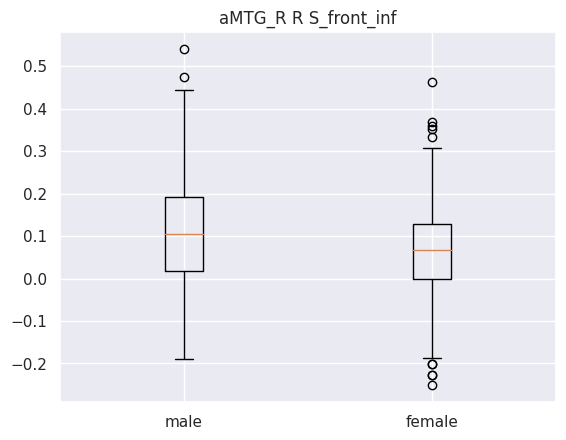

Ttest_indResult(statistic=3.956278857457922, pvalue=8.86001863789618e-05)
male mean : 0.10791621693545454
male std : 0.12931995413969696
female mean : 0.06154310212610619
female std : 0.11751957032303513


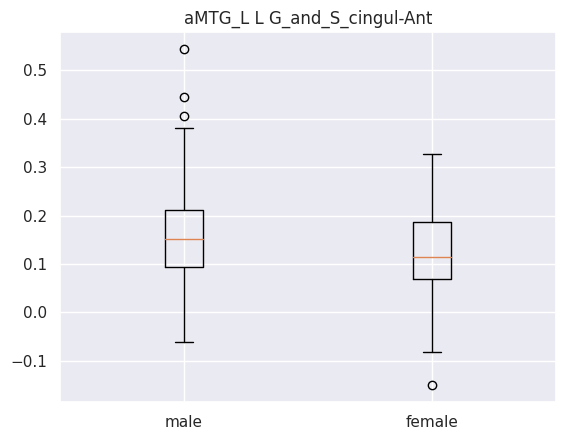

Ttest_indResult(statistic=4.307060944860257, pvalue=2.038136442014065e-05)
male mean : 0.16099100311954548
male std : 0.0980609784038807
female mean : 0.1242215932681416
female std : 0.08124741946330903


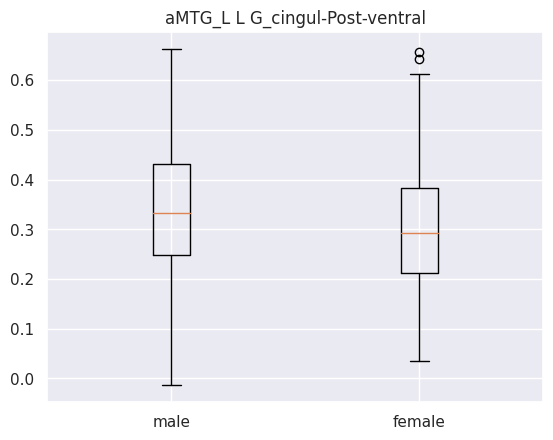

Ttest_indResult(statistic=2.7358247046655375, pvalue=0.006471799539479473)
male mean : 0.3344936346227273
male std : 0.12852301357983476
female mean : 0.30081479229646013
female std : 0.1308069984904627


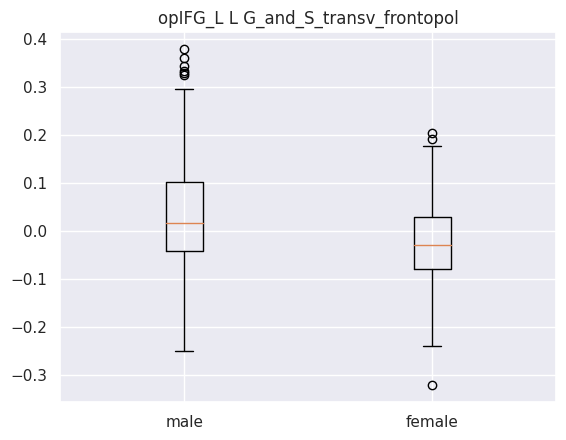

Ttest_indResult(statistic=5.033838587916691, pvalue=6.999625036984745e-07)
male mean : 0.025597121174999998
male std : 0.11515068596736391
female mean : -0.023709215497699117
female std : 0.09002691208082556


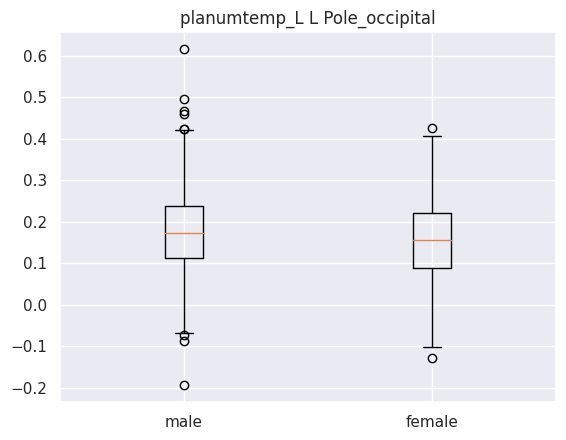

Ttest_indResult(statistic=2.8966477425742636, pvalue=0.003958114551412912)
male mean : 0.18402248281818182
male std : 0.11334589412846845
female mean : 0.1545630971402655
female std : 0.10073153762994376


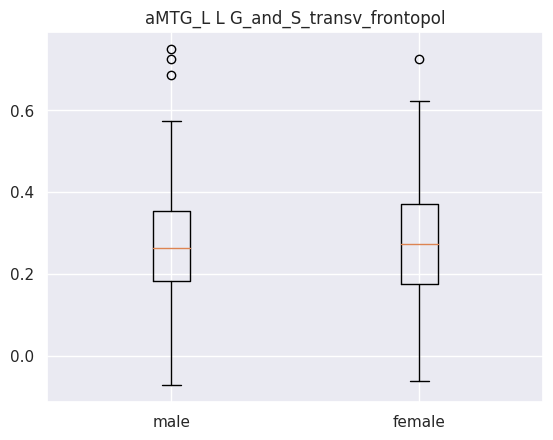

Ttest_indResult(statistic=-0.13187058202998522, pvalue=0.8951463929773453)
male mean : 0.2736758421272727
male std : 0.13376710268148156
female mean : 0.2753599954026549
female std : 0.13529084478562486
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['aMTG_L']
-------------------------------------------------------------------------------------------------------
     coefficient    seed                      labels
98      0.254345  aMTG_L      R G_pariet_inf-Angular
53      0.247339  aMTG_L               L S_front_sup
22      0.221981  aMTG_L     L G_oc-temp_med-Parahip
104     0.199961  aMTG_L                  R G_rectus
131     0.197597  aMTG_L  R S_oc_sup_and_transversal
103     0.177538  aMTG_L               R G_precuneus
66      0.167226  aMTG_L             L S_postcentral
4       0.165337  aMTG_L  L G_and_S_transv_frontopol
96      0.150952  aMTG_L     R G_o

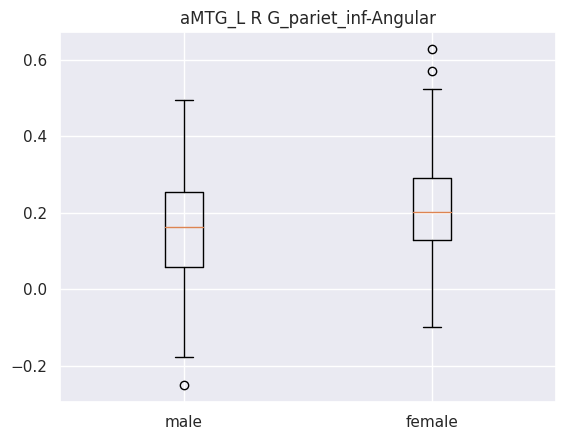

Ttest_indResult(statistic=-3.9493086257770935, pvalue=9.112915695993898e-05)
male mean : 0.1597038146640909
male std : 0.14141209184423478
female mean : 0.20934205392477875
female std : 0.12301362367570179


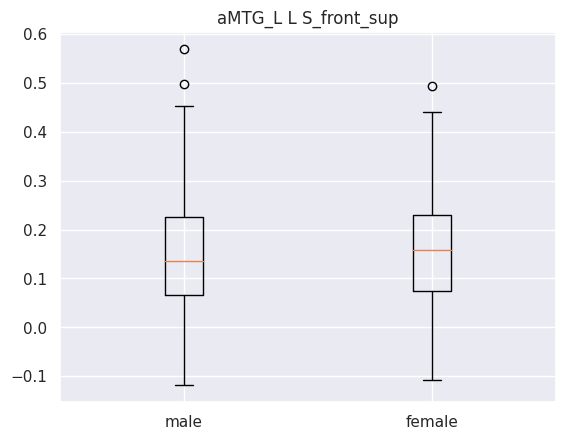

Ttest_indResult(statistic=-0.9406515856219914, pvalue=0.3473949131207905)
male mean : 0.149155713895
male std : 0.12215414677633321
female mean : 0.15968833962980092
female std : 0.1137261077832309


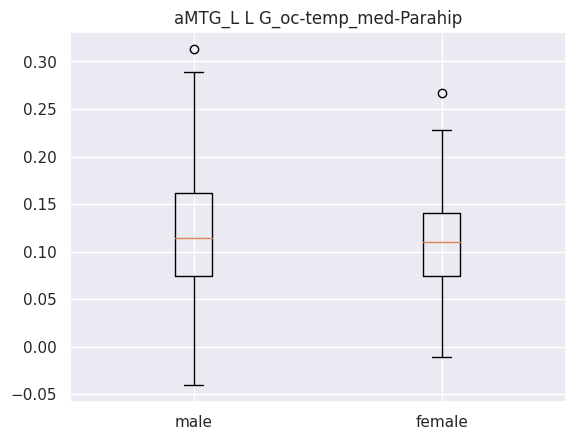

Ttest_indResult(statistic=2.6168014548691065, pvalue=0.00917858413141157)
male mean : 0.12139309023636362
male std : 0.05894973262885631
female mean : 0.10806080625663717
female std : 0.04798219271826174


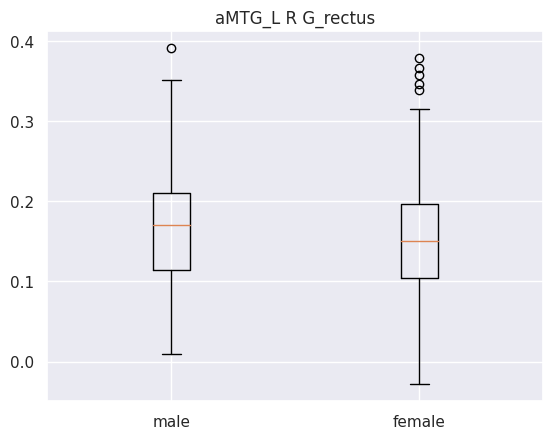

Ttest_indResult(statistic=1.5156403489067496, pvalue=0.1303218993854485)
male mean : 0.1657639553590909
male std : 0.0682223379382807
female mean : 0.15580128479203542
female std : 0.07023035925739472


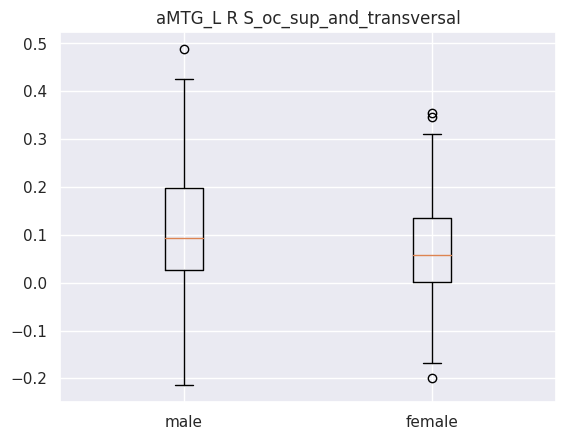

Ttest_indResult(statistic=3.5613990096675714, pvalue=0.0004087562486128332)
male mean : 0.10625280339390909
male std : 0.12637717435553078
female mean : 0.06767066309955752
female std : 0.10078149226010065


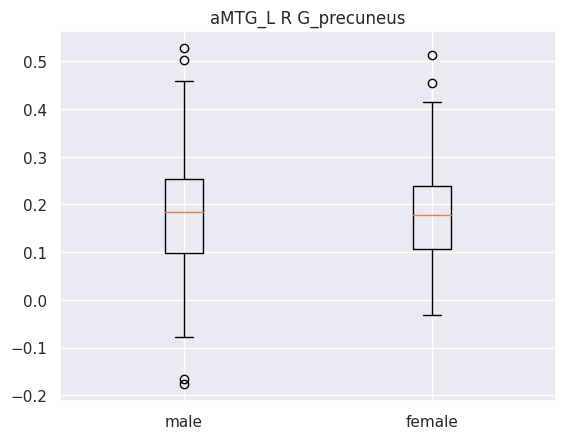

Ttest_indResult(statistic=0.20836146513744597, pvalue=0.8350422894528916)
male mean : 0.1794498914168182
male std : 0.11811792236708751
female mean : 0.17732722280000002
female std : 0.09564836134166617


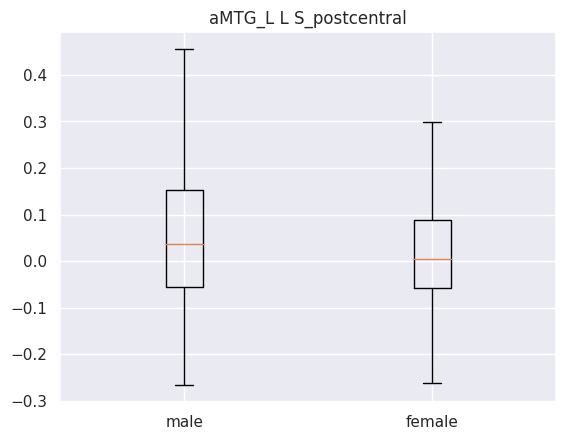

Ttest_indResult(statistic=2.4484128219617074, pvalue=0.01473464302856492)
male mean : 0.04535718950954546
male std : 0.14137947053259706
female mean : 0.01543427044787611
female std : 0.11512896698383501


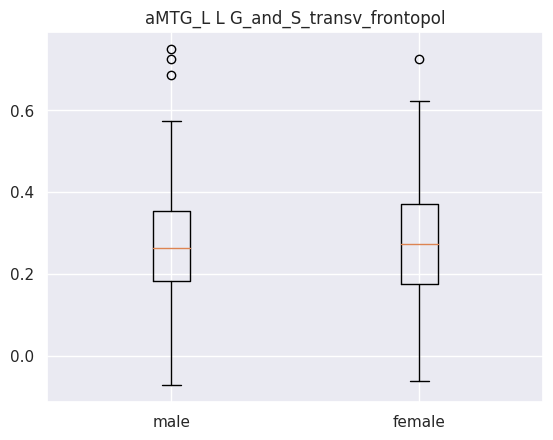

Ttest_indResult(statistic=-0.13187058202998522, pvalue=0.8951463929773453)
male mean : 0.2736758421272727
male std : 0.13376710268148156
female mean : 0.2753599954026549
female std : 0.13529084478562486


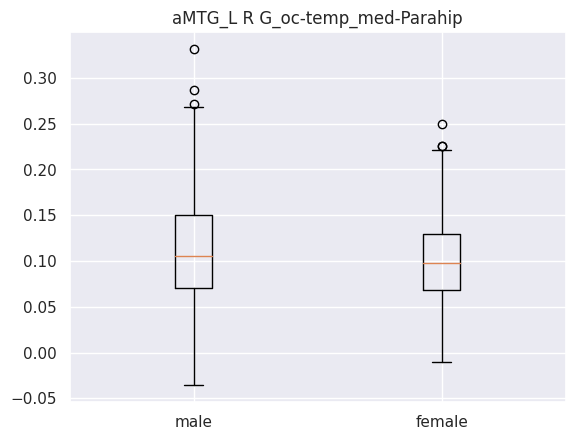

Ttest_indResult(statistic=2.824275015327996, pvalue=0.0049521189756473)
male mean : 0.11477974225227273
male std : 0.058736191830444526
female mean : 0.10050169280283186
female std : 0.04731973538271092


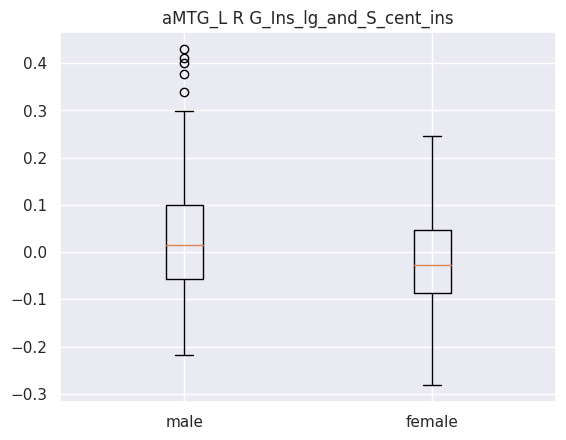

Ttest_indResult(statistic=3.681665216455551, pvalue=0.0002602364041619344)
male mean : 0.02278002829522727
male std : 0.11774230758215139
female mean : -0.015473884240707966
female std : 0.10074475793993512
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['aMTG_R']
-------------------------------------------------------------------------------------------------------
     coefficient    seed                       labels
22      0.244152  aMTG_R      L G_oc-temp_med-Parahip
53      0.226778  aMTG_R                L S_front_sup
66      0.219443  aMTG_R              L S_postcentral
96      0.217688  aMTG_R      R G_oc-temp_med-Parahip
98      0.200564  aMTG_R       R G_pariet_inf-Angular
55      0.183858  aMTG_R  L S_intrapariet_and_P_trans
90      0.172870  aMTG_R    R G_Ins_lg_and_S_cent_ins
104     0.156547  aMTG_R                   R G_rectus
4       0.152718  aMT

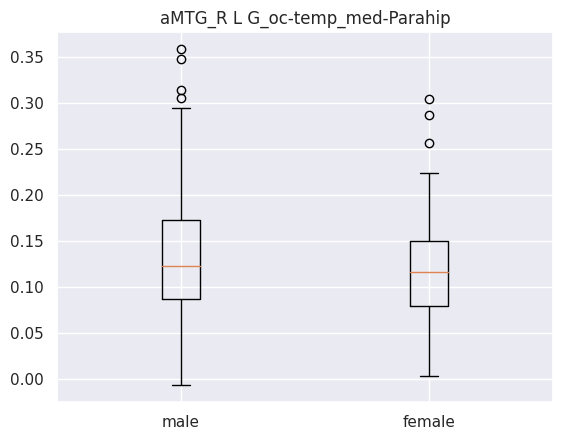

Ttest_indResult(statistic=2.839191497277654, pvalue=0.004730402487154351)
male mean : 0.13388492833
male std : 0.06366889431603796
female mean : 0.11838812058539823
female std : 0.05078064169079939


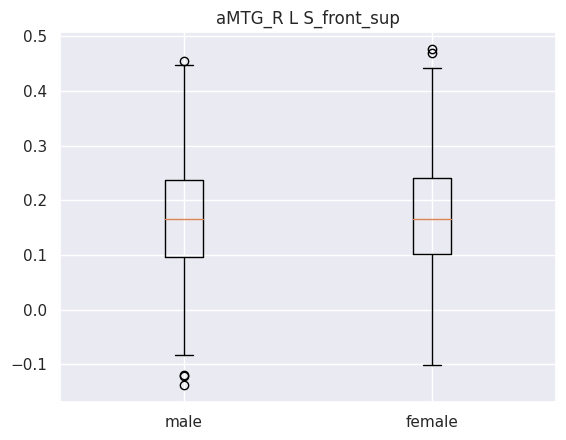

Ttest_indResult(statistic=-0.08008365126456747, pvalue=0.9362068082925741)
male mean : 0.17175187354863636
male std : 0.11338550789442398
female mean : 0.1725857526397788
female std : 0.10597629980410962


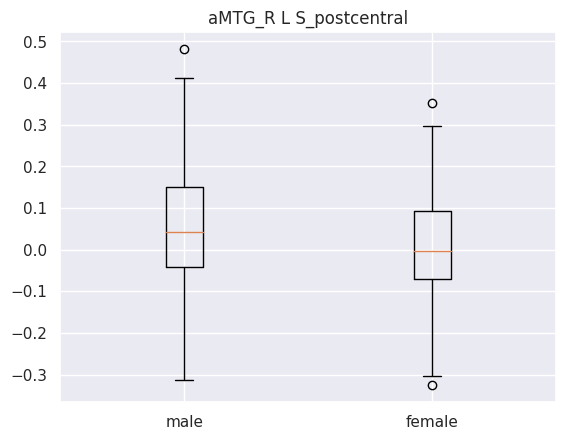

Ttest_indResult(statistic=2.627621292338559, pvalue=0.008896140355824254)
male mean : 0.04901591075681818
male std : 0.13953276104441498
female mean : 0.016055526186592915
female std : 0.12453371759228786


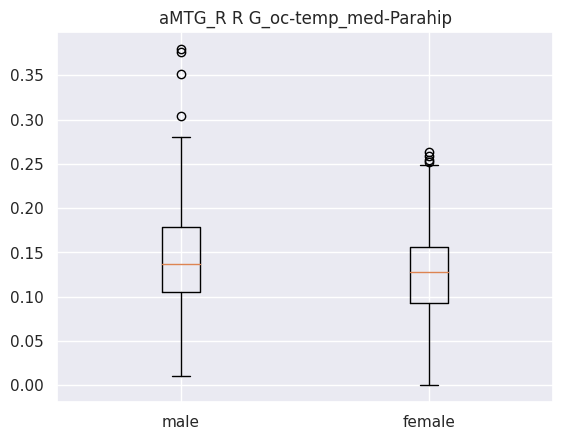

Ttest_indResult(statistic=3.2230120586916766, pvalue=0.0013619508370199724)
male mean : 0.14602855690909092
male std : 0.06277541821437044
female mean : 0.1286269260214602
female std : 0.050481361154379095


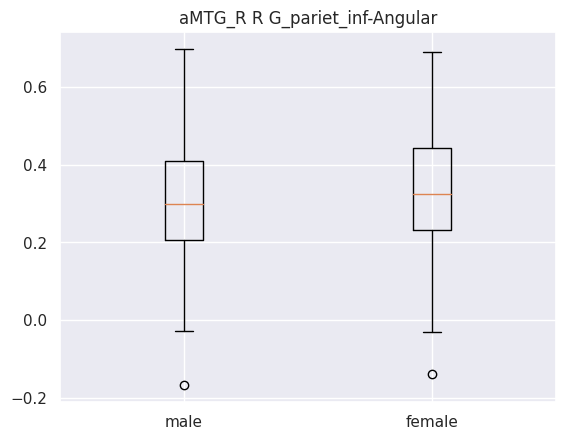

Ttest_indResult(statistic=-1.2323437014086307, pvalue=0.21847289401376063)
male mean : 0.30850017917
male std : 0.1509961278933057
female mean : 0.3258114792300885
female std : 0.14499535619579842


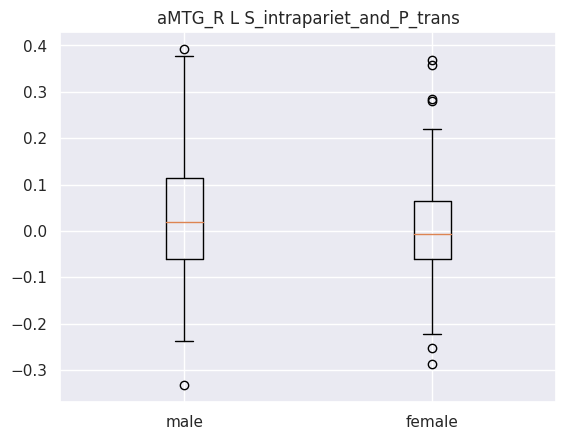

Ttest_indResult(statistic=2.0033433133727625, pvalue=0.0457476860349034)
male mean : 0.02404788690863636
male std : 0.12464427867043203
female mean : 0.0021809927742920342
female std : 0.10473721060141471


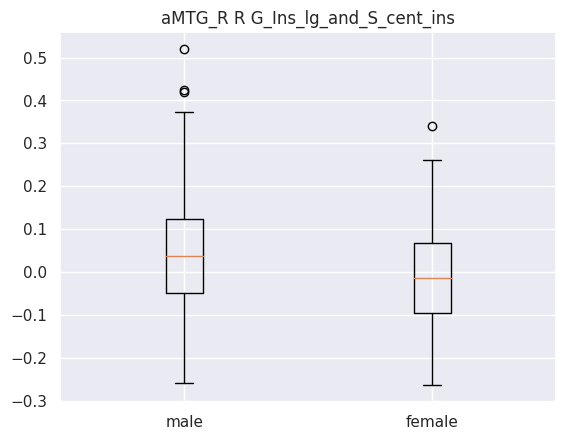

Ttest_indResult(statistic=4.494099754685952, pvalue=8.92418981107013e-06)
male mean : 0.0445266324765
male std : 0.12931193503968358
female mean : -0.007410436407079646
female std : 0.11390051576344988


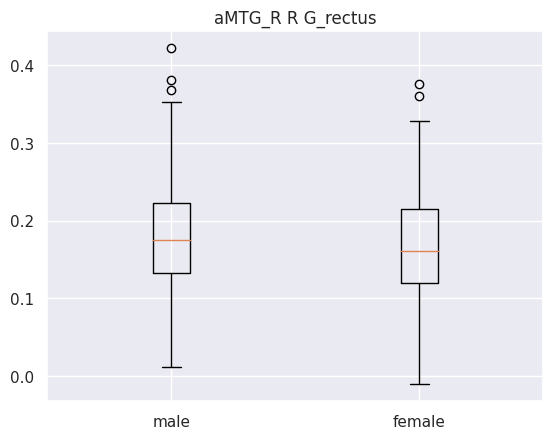

Ttest_indResult(statistic=1.9556394665406327, pvalue=0.0511344240664779)
male mean : 0.1794522245181818
male std : 0.07123758746046512
female mean : 0.16650174143982302
female std : 0.06829511318721243


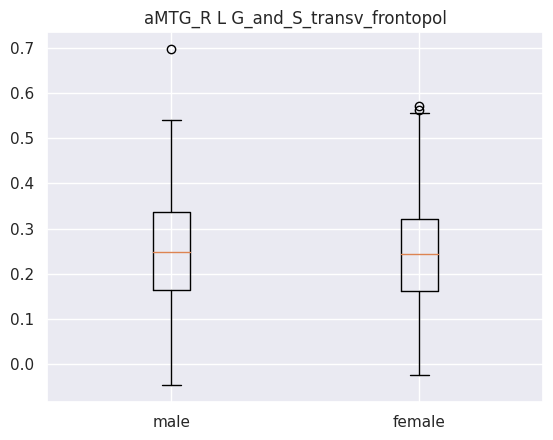

Ttest_indResult(statistic=0.7806963776760073, pvalue=0.43539711360071087)
male mean : 0.25175311356636365
male std : 0.12076507584294517
female mean : 0.2429040562159292
female std : 0.11807395115490585


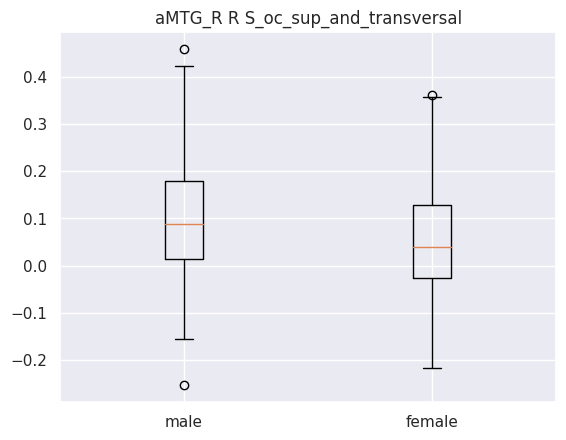

Ttest_indResult(statistic=4.231939532641933, pvalue=2.8164514848048607e-05)
male mean : 0.10353396476636365
male std : 0.1292749411740477
female mean : 0.05450852847345132
female std : 0.1145602710940684
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['opIFG_L']
-------------------------------------------------------------------------------------------------------
     coefficient     seed                       labels
125     0.216892  opIFG_L                R S_front_inf
20      0.204766  opIFG_L      L G_oc-temp_lat-fusifor
35      0.204411  opIFG_L      L G_temp_sup-Plan_tempo
79      0.198224  opIFG_L         R G_and_S_cingul-Ant
144     0.194794  opIFG_L              R S_subparietal
91      0.179175  opIFG_L            R G_insular_short
60      0.161698  opIFG_L  L S_oc-temp_med_and_Lingual
47      0.157873  opIFG_L      L S_circular_insula_inf
1       0.1513

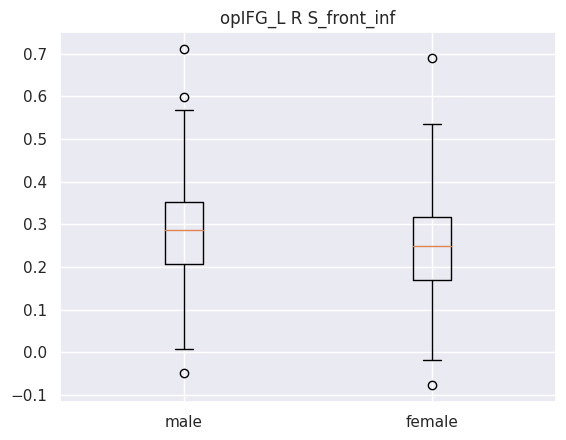

Ttest_indResult(statistic=3.835811545215277, pvalue=0.0001432689580451875)
male mean : 0.2851604080318182
male std : 0.11340294993333086
female mean : 0.24395864221681413
female std : 0.11291671921913636


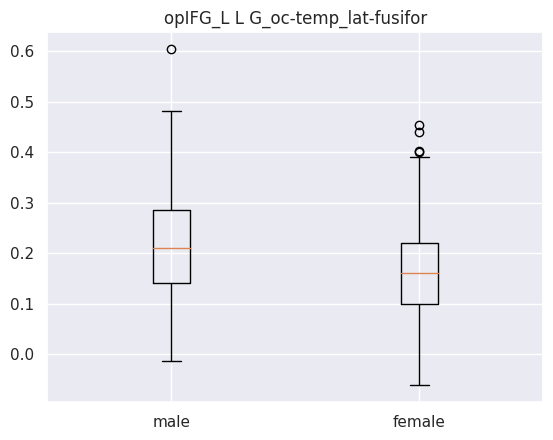

Ttest_indResult(statistic=5.347205581276891, pvalue=1.4323542479964458e-07)
male mean : 0.21720834137113634
male std : 0.10505156622836234
female mean : 0.1665263415774336
female std : 0.09451242193790162


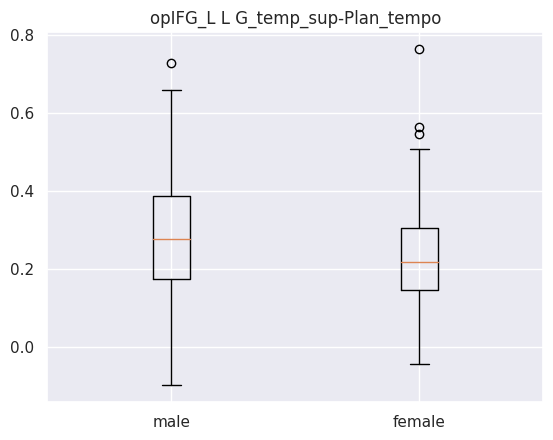

Ttest_indResult(statistic=4.658112093864058, pvalue=4.223278693577736e-06)
male mean : 0.2863882349772728
male std : 0.14948277729148243
female mean : 0.22649747706194692
female std : 0.12022186901150231


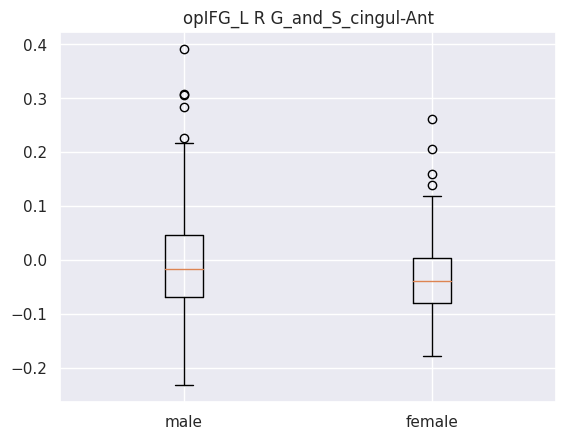

Ttest_indResult(statistic=3.464665320247692, pvalue=0.0005824633674892333)
male mean : -0.006062558034272728
male std : 0.09768015129495845
female mean : -0.033554106136725666
female std : 0.0670920200770204


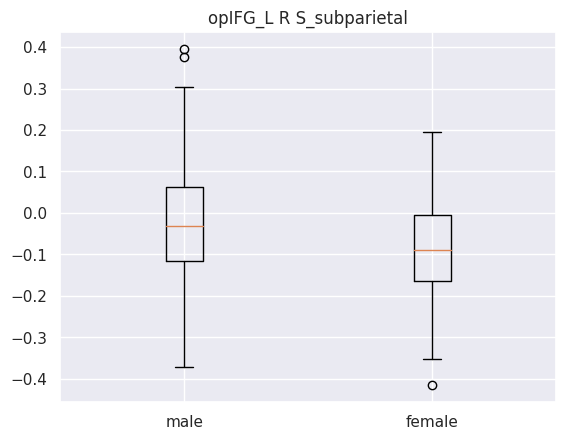

Ttest_indResult(statistic=4.609312989745705, pvalue=5.2885387407695605e-06)
male mean : -0.024811179274522723
male std : 0.14365742689954286
female mean : -0.08184163840840707
female std : 0.1159257812279483


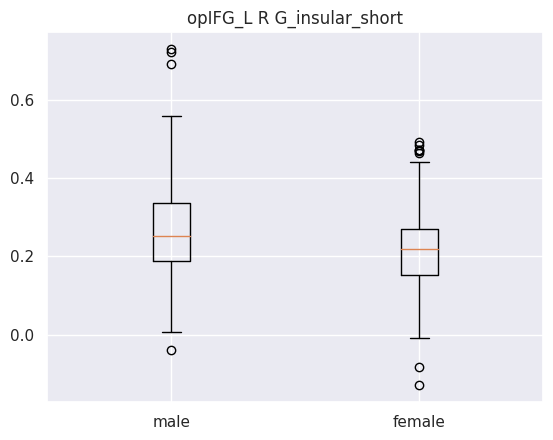

Ttest_indResult(statistic=4.228696451103205, pvalue=2.855749277590576e-05)
male mean : 0.2642323993227273
male std : 0.12153962695267223
female mean : 0.21892150578761063
female std : 0.10375910549235366


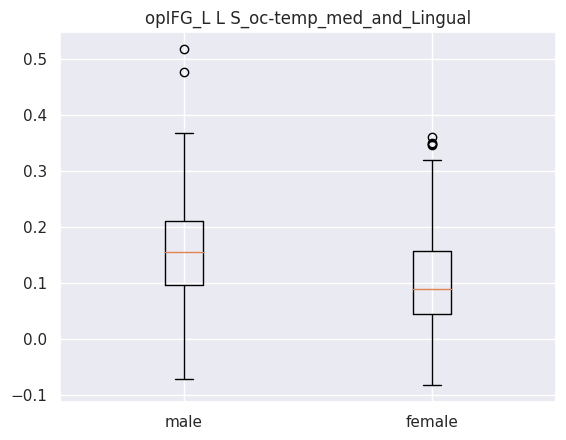

Ttest_indResult(statistic=5.608872459876942, pvalue=3.5868373548282604e-08)
male mean : 0.15474476261090905
male std : 0.09145221886246907
female mean : 0.10766764768845133
female std : 0.08536736636712615


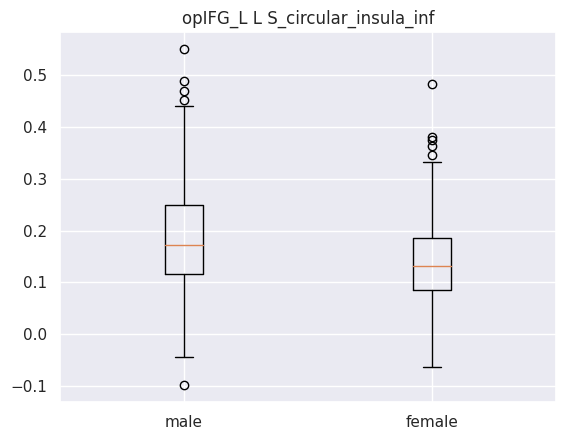

Ttest_indResult(statistic=5.521425671090101, pvalue=5.731639475936297e-08)
male mean : 0.18788899746363638
male std : 0.10418852948770023
female mean : 0.13893758282522123
female std : 0.08153292407600472


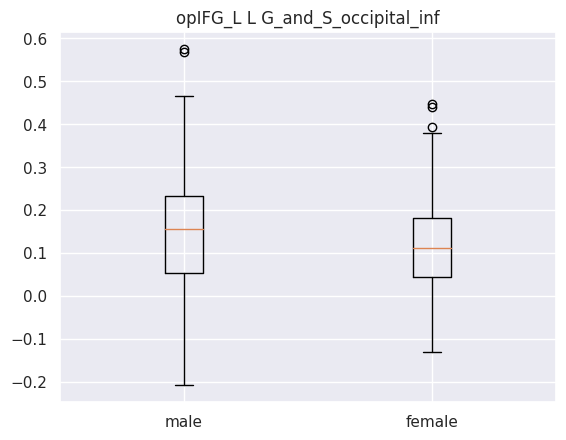

Ttest_indResult(statistic=3.05191381594728, pvalue=0.002410294840666242)
male mean : 0.15546942175227274
male std : 0.13201789524707933
female mean : 0.11997070040309733
female std : 0.112540443719782


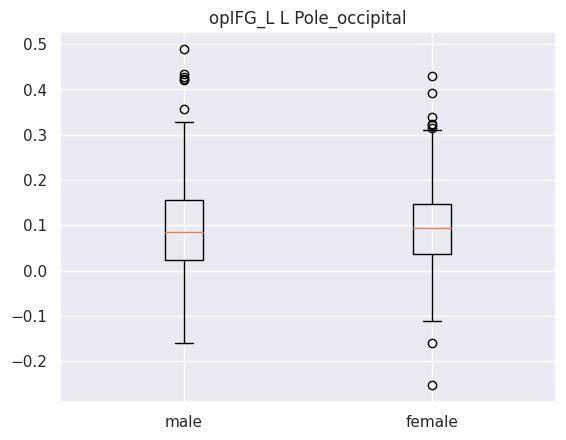

Ttest_indResult(statistic=0.41319809936730145, pvalue=0.6796609598891232)
male mean : 0.10181187025654546
male std : 0.10793048805971699
female mean : 0.09780579236287609
female std : 0.09616272201075322
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['opIFG_R']
-------------------------------------------------------------------------------------------------------
     coefficient     seed                       labels
125     0.225181  opIFG_R                R S_front_inf
90      0.216860  opIFG_R    R G_Ins_lg_and_S_cent_ins
41      0.192370  opIFG_R             L Pole_occipital
144     0.183568  opIFG_R              R S_subparietal
63      0.177447  opIFG_R         L S_orbital-H_Shaped
80      0.177072  opIFG_R     R G_and_S_cingul-Mid-Ant
133     0.171700  opIFG_R              R S_oc-temp_lat
20      0.161732  opIFG_R      L G_oc-temp_lat-fusifor
91      0.1511

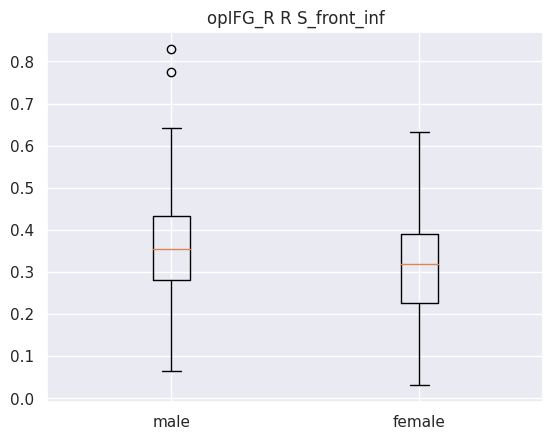

Ttest_indResult(statistic=3.9946084585433304, pvalue=7.584042967238988e-05)
male mean : 0.36241775419090916
male std : 0.11709006437871611
female mean : 0.31739422023451325
female std : 0.12031934666421866


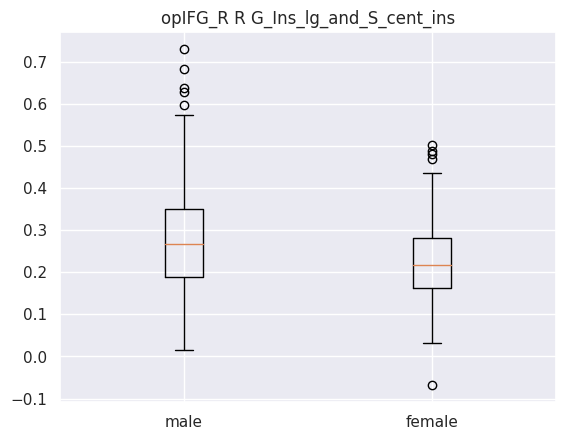

Ttest_indResult(statistic=4.719580637797441, pvalue=3.1723919963938446e-06)
male mean : 0.2733611874181818
male std : 0.12407207041222522
female mean : 0.22280797660176993
female std : 0.1007125264660346


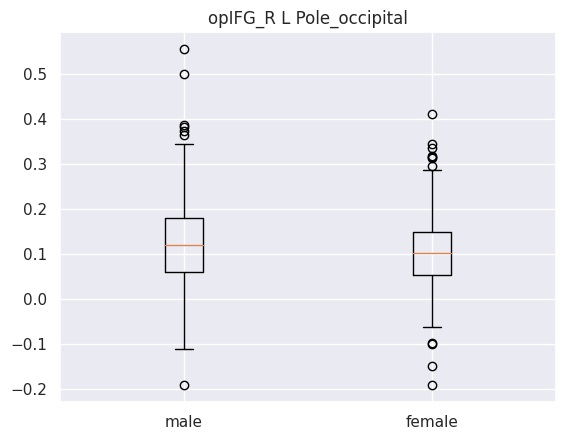

Ttest_indResult(statistic=1.9668569199465695, pvalue=0.049822028600582956)
male mean : 0.1226511061215
male std : 0.10336637927130211
female mean : 0.10500797782699114
female std : 0.08498185574097446


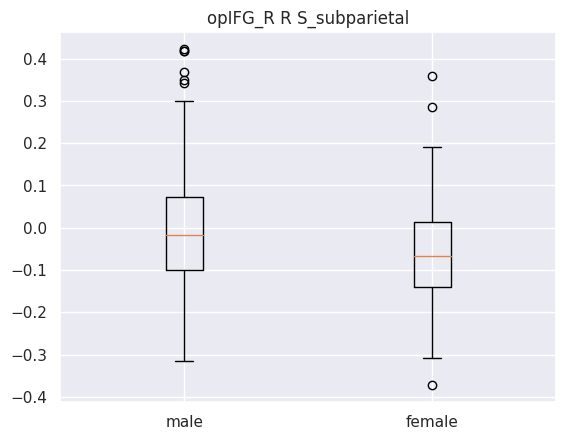

Ttest_indResult(statistic=4.342181044945235, pvalue=1.749268283550659e-05)
male mean : -0.008883466066818179
male std : 0.14428559820039927
female mean : -0.06175231570632744
female std : 0.11046401972822666


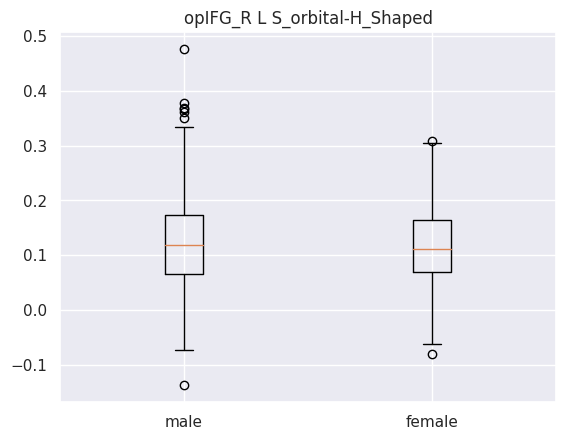

Ttest_indResult(statistic=0.8561324777791736, pvalue=0.39238630056013113)
male mean : 0.12343299978045455
male std : 0.08958678153626323
female mean : 0.11666919567345133
female std : 0.07653337463165284


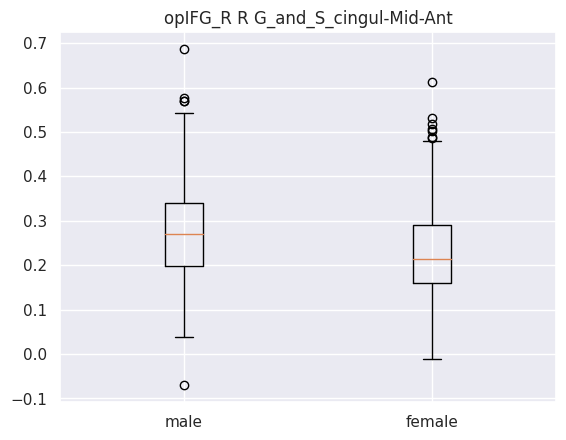

Ttest_indResult(statistic=3.964127034948002, pvalue=8.583233085828756e-05)
male mean : 0.2759169506818182
male std : 0.11781973016961253
female mean : 0.2327772969358407
female std : 0.1114656795348218


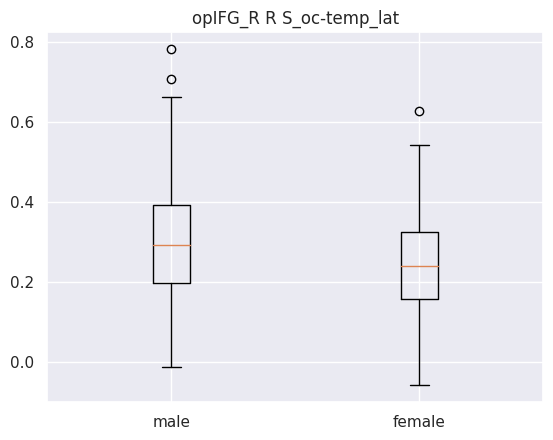

Ttest_indResult(statistic=4.97547687161809, pvalue=9.324034541529675e-07)
male mean : 0.30454724075
male std : 0.14300093870348446
female mean : 0.24131148349911505
female std : 0.12438290112734252


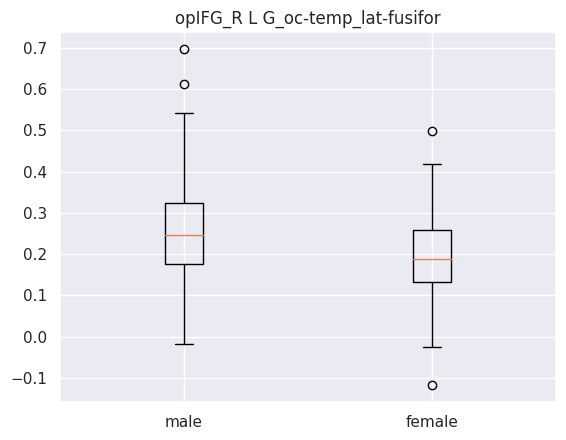

Ttest_indResult(statistic=5.192733430788187, pvalue=3.162104238851161e-07)
male mean : 0.24746643591363637
male std : 0.1114361981429399
female mean : 0.1962682065265487
female std : 0.095928572655737


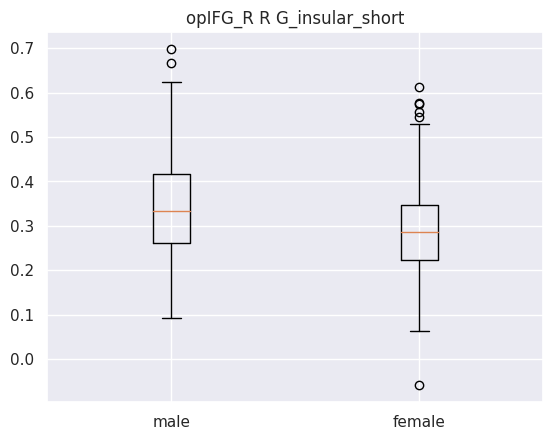

Ttest_indResult(statistic=4.5606645152083, pvalue=6.6049251869165826e-06)
male mean : 0.34029636559545456
male std : 0.11365052713646152
female mean : 0.2927324357035398
female std : 0.10605668848768768


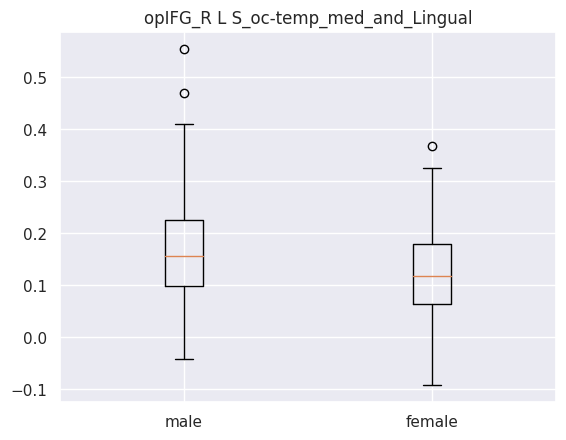

Ttest_indResult(statistic=4.9683687670111105, pvalue=9.65358806851133e-07)
male mean : 0.16568285368454544
male std : 0.09795658686725976
female mean : 0.12266675558539823
female std : 0.08412303322404859
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['pITG_L']
-------------------------------------------------------------------------------------------------------
     coefficient    seed                      labels
125     0.263092  pITG_L               R S_front_inf
26      0.230662  pITG_L            L G_parietal_sup
9       0.194183  pITG_L     L G_cingul-Post-ventral
75      0.170773  pITG_L     R G_and_S_occipital_inf
20      0.158580  pITG_L     L G_oc-temp_lat-fusifor
47      0.155613  pITG_L     L S_circular_insula_inf
126     0.155345  pITG_L            R S_front_middle
4       0.155006  pITG_L  L G_and_S_transv_frontopol
41      0.154047  pITG_L        

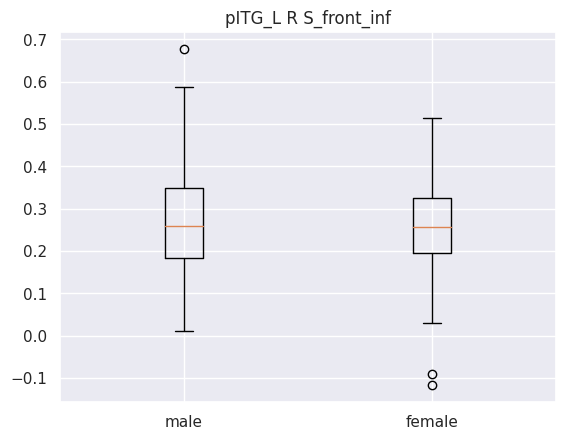

Ttest_indResult(statistic=1.0020328934125462, pvalue=0.31687348431400925)
male mean : 0.2700681785363636
male std : 0.11105772730043446
female mean : 0.25973832161504423
female std : 0.10615524639315872


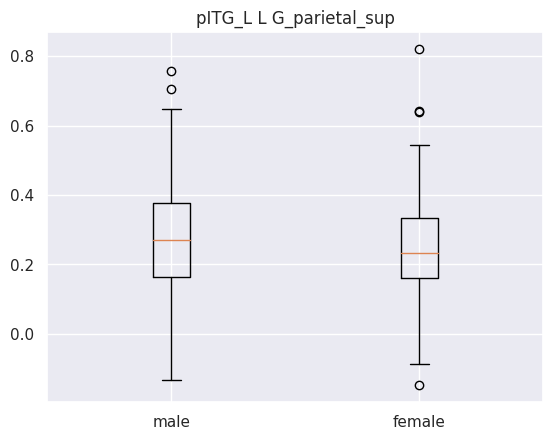

Ttest_indResult(statistic=1.932579843967068, pvalue=0.05392366198499659)
male mean : 0.2742340569533182
male std : 0.16088494195816322
female mean : 0.2469608636460177
female std : 0.13572558594984654


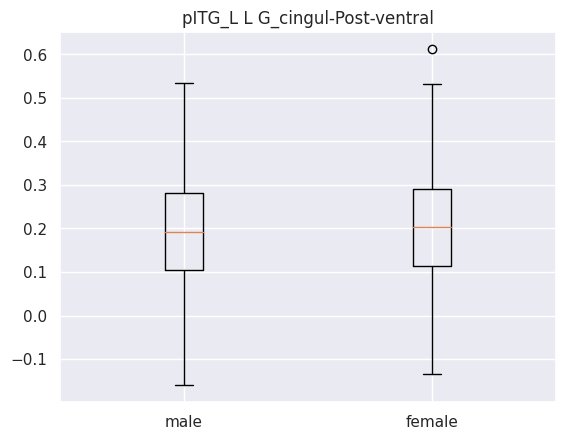

Ttest_indResult(statistic=-0.8502284729847315, pvalue=0.3956563221847449)
male mean : 0.19532825054954547
male std : 0.12405214793600829
female mean : 0.2054311569070796
female std : 0.12626706102176716


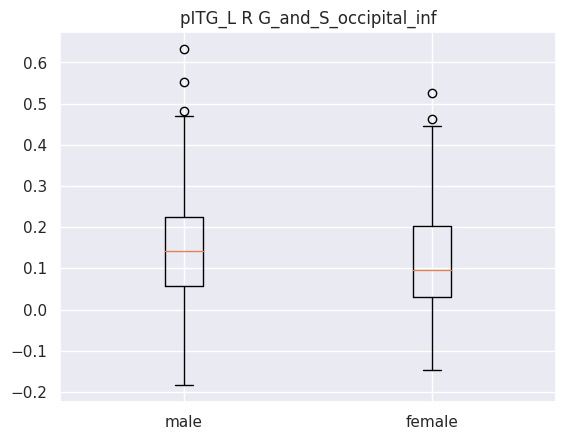

Ttest_indResult(statistic=2.1181886492106354, pvalue=0.03471405998766398)
male mean : 0.14558922257772727
male std : 0.1311116449490574
female mean : 0.11931503520522121
female std : 0.13024516583608292


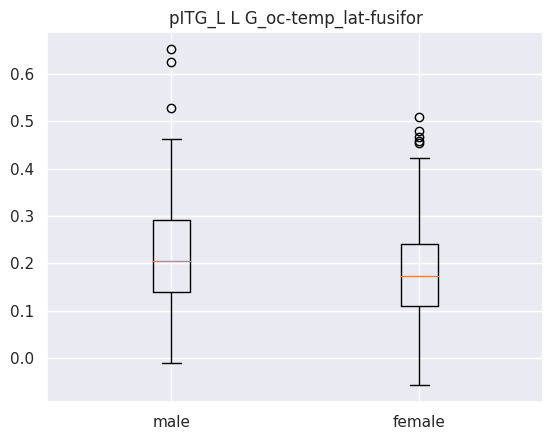

Ttest_indResult(statistic=2.9177266272120463, pvalue=0.0037049025784669063)
male mean : 0.2166043530454545
male std : 0.10970491808955896
female mean : 0.18723372998539822
female std : 0.10235689928590931


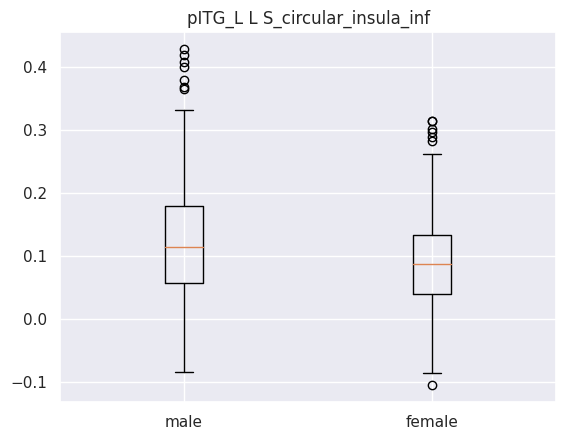

Ttest_indResult(statistic=3.9734819180293077, pvalue=8.264017668278905e-05)
male mean : 0.12536593451390907
male std : 0.09488172282108827
female mean : 0.09301565086106195
female std : 0.07585327208955041


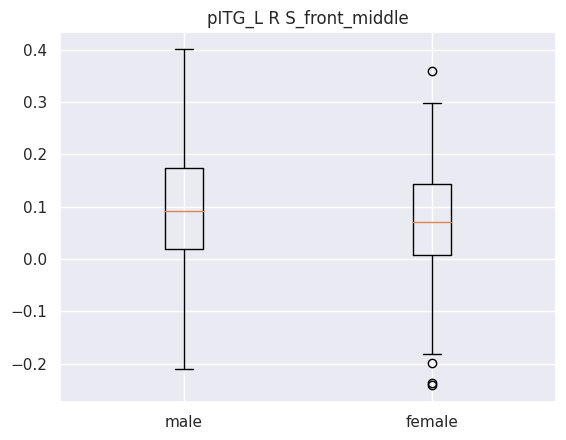

Ttest_indResult(statistic=2.262227860903967, pvalue=0.024165930044473365)
male mean : 0.09672683969472727
male std : 0.10691554436745918
female mean : 0.07428678904690267
female std : 0.10209048708783634


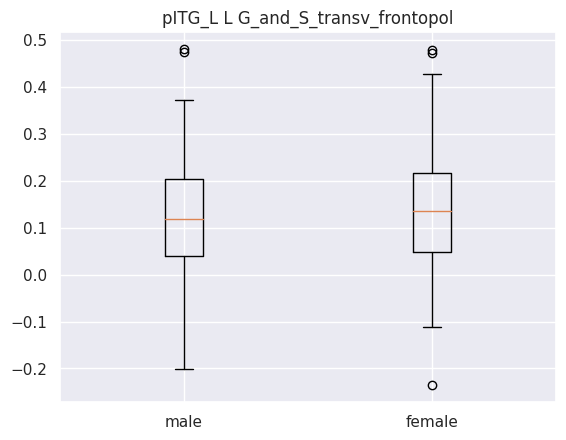

Ttest_indResult(statistic=-1.162423120542947, pvalue=0.24568805822769893)
male mean : 0.12402863729863638
male std : 0.11615416814273921
female mean : 0.13712417481902656
female std : 0.12109015309239457


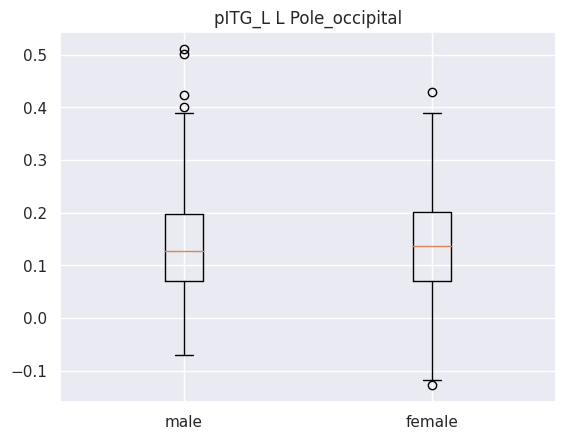

Ttest_indResult(statistic=0.12064913567187839, pvalue=0.9040235258199408)
male mean : 0.14238426120045453
male std : 0.10132866936785162
female mean : 0.14123193651615043
female std : 0.09992003369997071


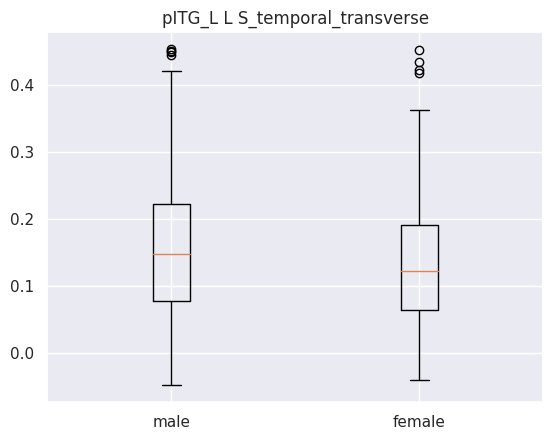

Ttest_indResult(statistic=2.5571750426222266, pvalue=0.010883989566106632)
male mean : 0.1583446232454545
male std : 0.10578124515424395
female mean : 0.1342784206256637
female std : 0.09222667259385757
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['pITG_R']
-------------------------------------------------------------------------------------------------------
     coefficient    seed                     labels
20      0.325124  pITG_R    L G_oc-temp_lat-fusifor
125     0.227912  pITG_R              R S_front_inf
91      0.222136  pITG_R          R G_insular_short
84      0.210250  pITG_R                 R G_cuneus
90      0.200715  pITG_R  R G_Ins_lg_and_S_cent_ins
83      0.162059  pITG_R    R G_cingul-Post-ventral
37      0.160284  pITG_R        L G_temporal_middle
32      0.155782  pITG_R    L G_temp_sup-G_T_transv
79      0.135785  pITG_R       R G_and_S_ci

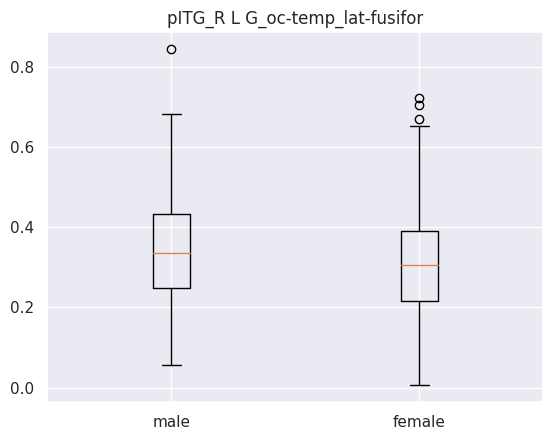

Ttest_indResult(statistic=2.207601503782289, pvalue=0.027782692747375555)
male mean : 0.3381230503772727
male std : 0.13608853787659086
female mean : 0.31070127244911505
female std : 0.1255552430118421


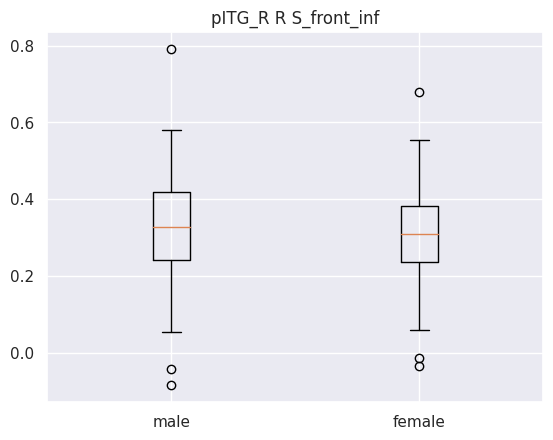

Ttest_indResult(statistic=2.13538486489198, pvalue=0.03327622102378573)
male mean : 0.3298146207409091
male std : 0.12123145108487972
female mean : 0.3068887235929204
female std : 0.1045843071513845


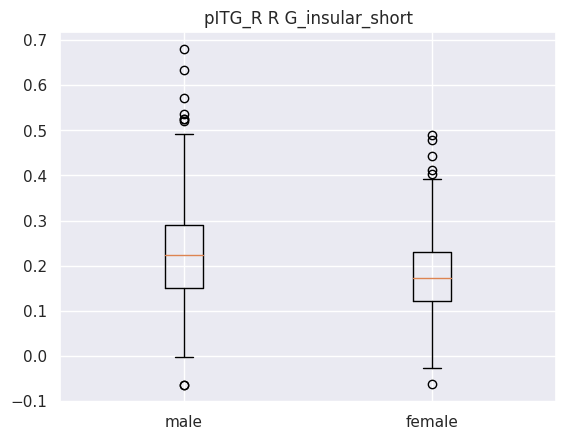

Ttest_indResult(statistic=5.112160421970684, pvalue=4.743233770538839e-07)
male mean : 0.2313763518045455
male std : 0.12096734073549982
female mean : 0.1792633135699115
female std : 0.09227387552085549


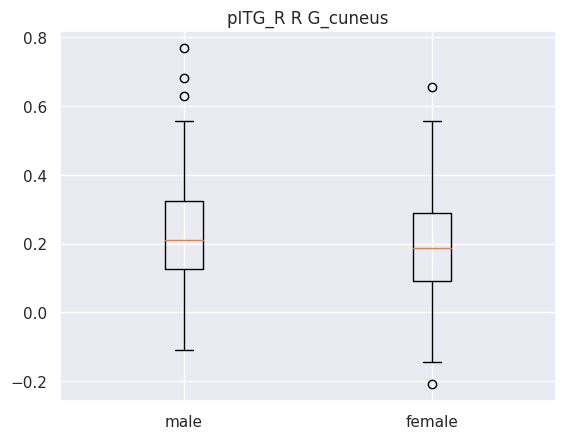

Ttest_indResult(statistic=2.518734910789549, pvalue=0.012128078944136934)
male mean : 0.22664096681499996
male std : 0.14532160156704602
female mean : 0.192063495079646
female std : 0.14393677903416816


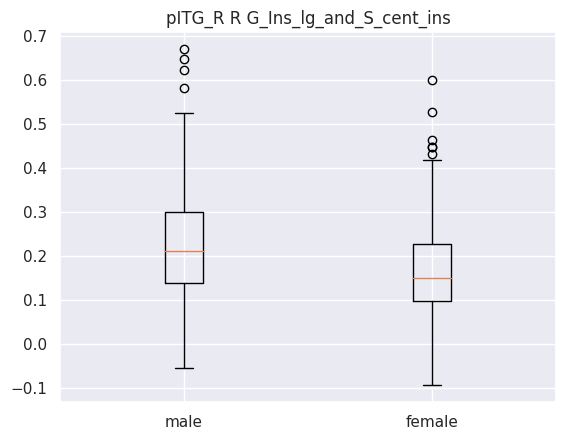

Ttest_indResult(statistic=4.79480473729521, pvalue=2.2257592661098134e-06)
male mean : 0.22383738302749998
male std : 0.12979418493858147
female mean : 0.16870598920176993
female std : 0.11205330730614246


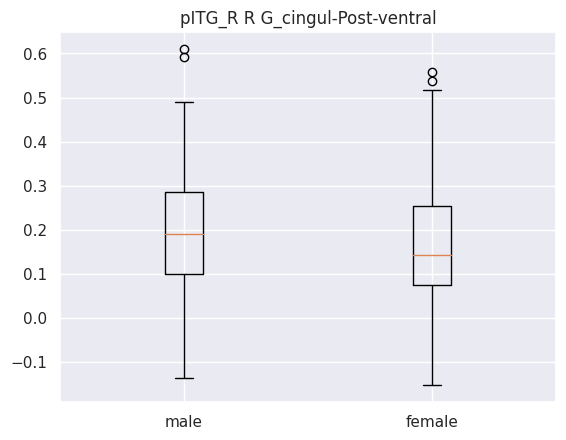

Ttest_indResult(statistic=2.380140291533847, pvalue=0.01772726625126871)
male mean : 0.19296064746681815
male std : 0.1346758980066957
female mean : 0.16264045314955752
female std : 0.13373455574896778


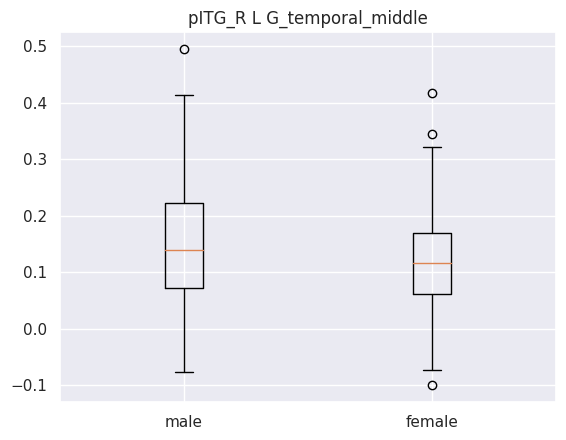

Ttest_indResult(statistic=3.595598385671502, pvalue=0.00035995732255156147)
male mean : 0.1529786022181818
male std : 0.10755245282266605
female mean : 0.12025123656144249
female std : 0.08297170332847886


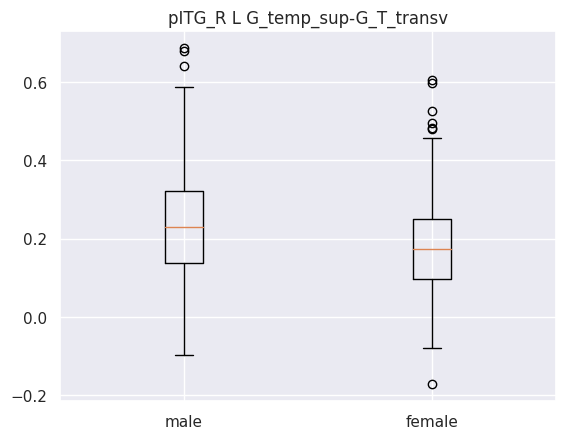

Ttest_indResult(statistic=4.524709164152146, pvalue=7.774373381230067e-06)
male mean : 0.2398444346181818
male std : 0.1385572380212938
female mean : 0.1833660085743363
female std : 0.12423831506745996


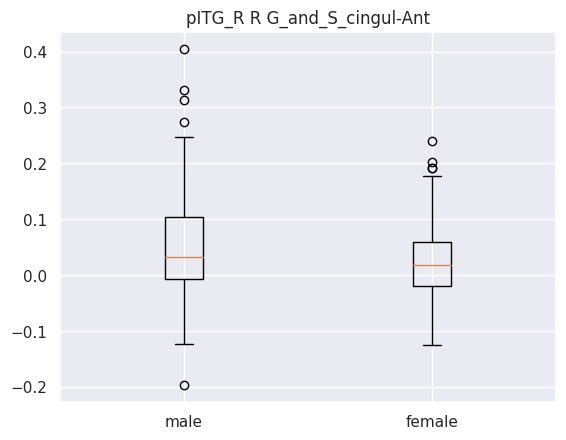

Ttest_indResult(statistic=3.3660004581303236, pvalue=0.0008289579997513635)
male mean : 0.04933961785272728
male std : 0.08588680640744353
female mean : 0.025453949248053095
female std : 0.062030754045511526


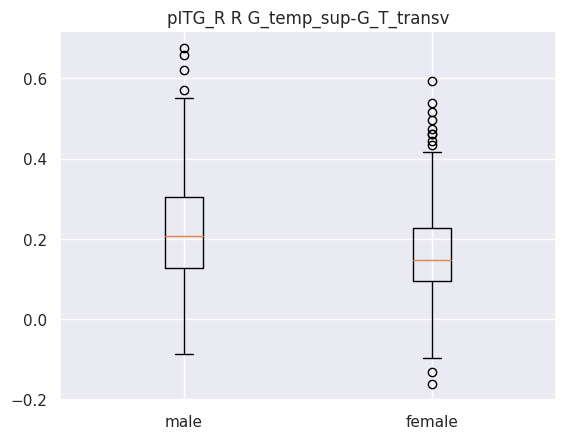

Ttest_indResult(statistic=4.672234192485094, pvalue=3.955675949020428e-06)
male mean : 0.22456284625045456
male std : 0.1360627966964213
female mean : 0.16773981286283188
female std : 0.11988681519631378
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['planumtemp_L']
-------------------------------------------------------------------------------------------------------
     coefficient          seed                       labels
60      0.263555  planumtemp_L  L S_oc-temp_med_and_Lingual
108     0.216431  planumtemp_L      R G_temp_sup-Plan_polar
66      0.185443  planumtemp_L              L S_postcentral
99      0.170339  planumtemp_L      R G_pariet_inf-Supramar
124     0.159182  planumtemp_L       R S_collat_transv_post
84      0.147154  planumtemp_L                   R G_cuneus
20      0.145653  planumtemp_L      L G_oc-temp_lat-fusifor
41      0.140610  planum

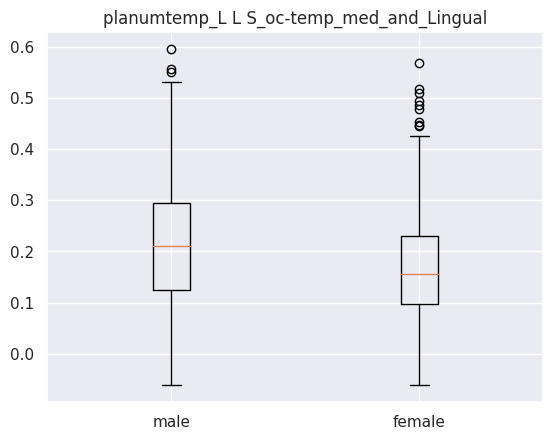

Ttest_indResult(statistic=3.568169946152254, pvalue=0.00039862792533886367)
male mean : 0.21577463173863637
male std : 0.11920041520251866
female mean : 0.17618120696902656
female std : 0.11460830695377548


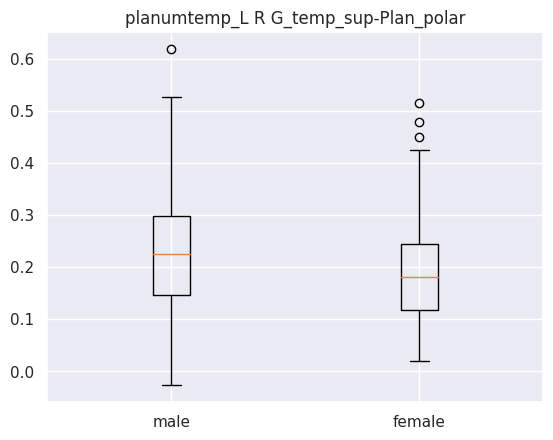

Ttest_indResult(statistic=4.42054857038295, pvalue=1.2391524231536645e-05)
male mean : 0.231116042775
male std : 0.10743291511827939
female mean : 0.18849037465929203
female std : 0.09554310246985663


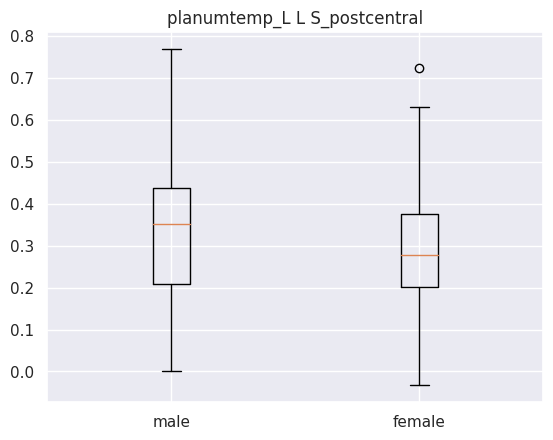

Ttest_indResult(statistic=3.3982524664602822, pvalue=0.0007393236091411032)
male mean : 0.33581050932090906
male std : 0.15519364606058975
female mean : 0.28810105651946905
female std : 0.14043859969892733


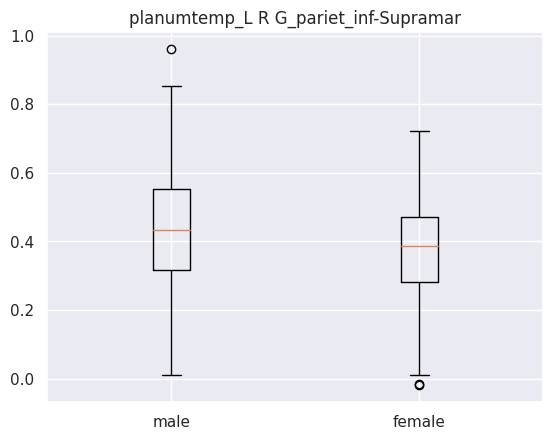

Ttest_indResult(statistic=3.40846885515764, pvalue=0.0007128702515509998)
male mean : 0.4307228165545455
male std : 0.17295636548930826
female mean : 0.3790449651415929
female std : 0.14569081362589828


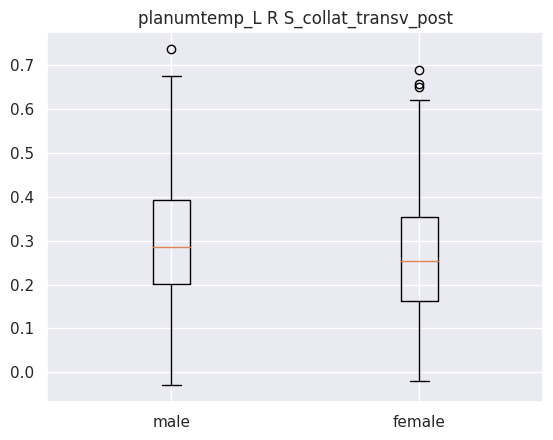

Ttest_indResult(statistic=2.721180273283202, pvalue=0.006760590380353587)
male mean : 0.2982221393318182
male std : 0.14752263554395537
female mean : 0.26174931810398233
female std : 0.13476027522052467


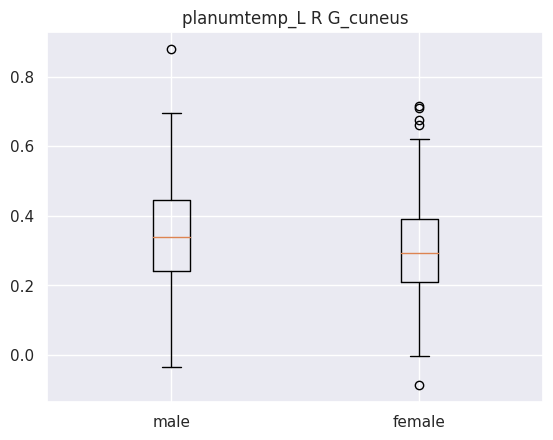

Ttest_indResult(statistic=2.779045702868326, pvalue=0.005683247460462339)
male mean : 0.3442871131318182
male std : 0.15448762649047768
female mean : 0.30501909665823007
female std : 0.1431606319240156


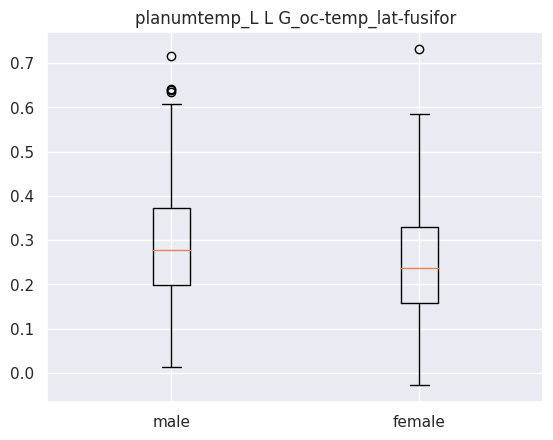

Ttest_indResult(statistic=3.7622305190657452, pvalue=0.0001909807101357603)
male mean : 0.2942304806272728
male std : 0.13292350850751689
female mean : 0.24918162700884958
female std : 0.119170924743853


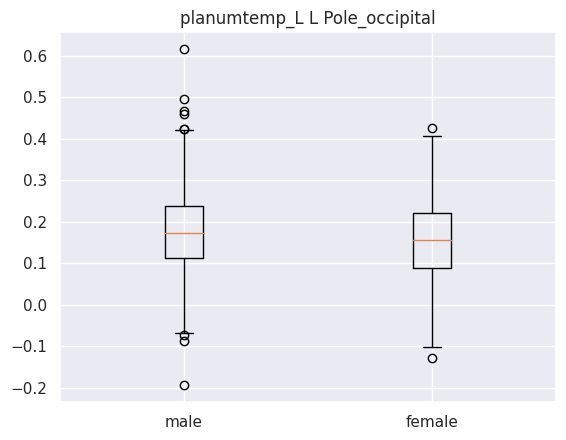

Ttest_indResult(statistic=2.8966477425742636, pvalue=0.003958114551412912)
male mean : 0.18402248281818182
male std : 0.11334589412846845
female mean : 0.1545630971402655
female std : 0.10073153762994376


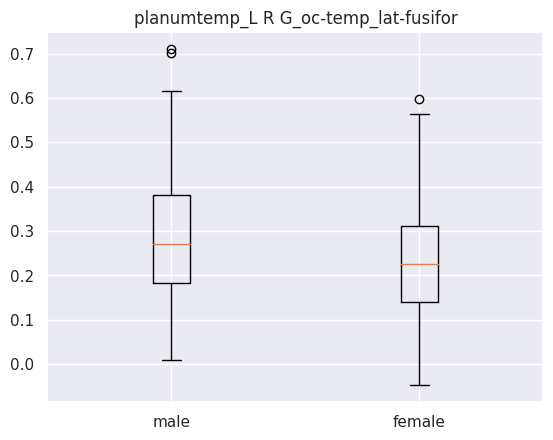

Ttest_indResult(statistic=4.055614333449546, pvalue=5.9060276690219876e-05)
male mean : 0.28515832146363634
male std : 0.13827308909461045
female mean : 0.23584467546176993
female std : 0.11734248121055887


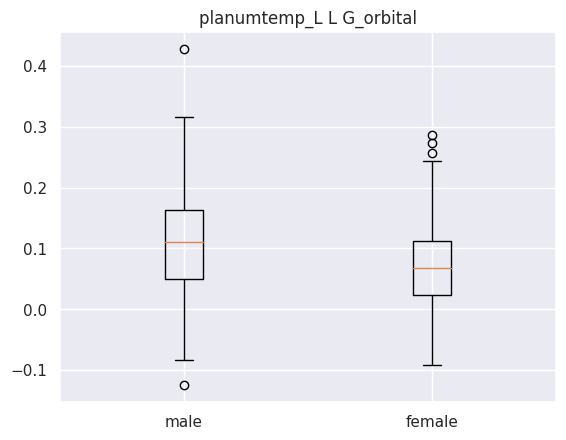

Ttest_indResult(statistic=5.437576085428286, pvalue=8.933485701927108e-08)
male mean : 0.11258804022227273
male std : 0.08233688253116413
female mean : 0.07398011917654868
female std : 0.06664634866953
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['planumtemp_R']
-------------------------------------------------------------------------------------------------------
     coefficient          seed                       labels
121     0.242715  planumtemp_R      R S_circular_insula_inf
108     0.241772  planumtemp_R      R G_temp_sup-Plan_polar
60      0.222155  planumtemp_R  L S_oc-temp_med_and_Lingual
72      0.195784  planumtemp_R             L S_temporal_sup
47      0.194629  planumtemp_R      L S_circular_insula_inf
139     0.176589  planumtemp_R             R S_pericallosal
41      0.167393  planumtemp_R             L Pole_occipital
145     0.166382  planumte

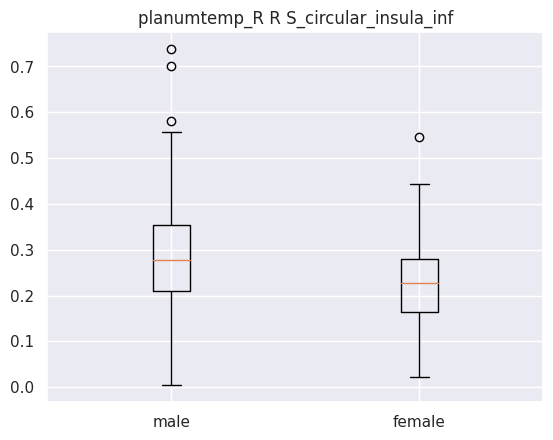

Ttest_indResult(statistic=5.673022197146965, pvalue=2.5335329424316272e-08)
male mean : 0.28464964156636363
male std : 0.11115068945139177
female mean : 0.22998609894690267
female std : 0.0911493316406924


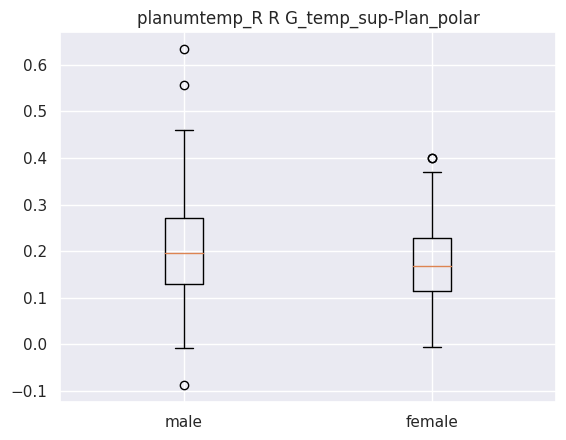

Ttest_indResult(statistic=3.411258353986623, pvalue=0.0007058022781917119)
male mean : 0.20694257242727274
male std : 0.10325686123318684
female mean : 0.17643976180088497
female std : 0.08445412241365245


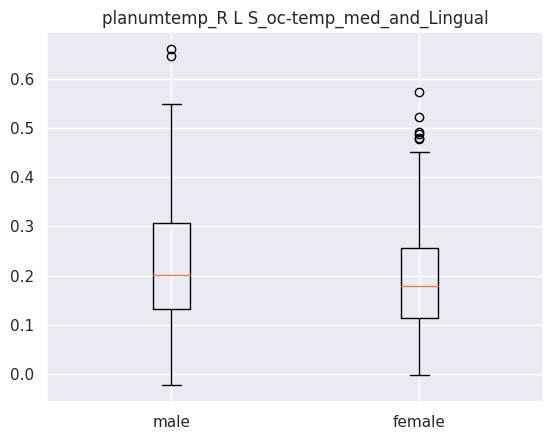

Ttest_indResult(statistic=3.1406026539933913, pvalue=0.001798634977217268)
male mean : 0.22554338915745453
male std : 0.12167229969009292
female mean : 0.19155830762477874
female std : 0.10599522757213717


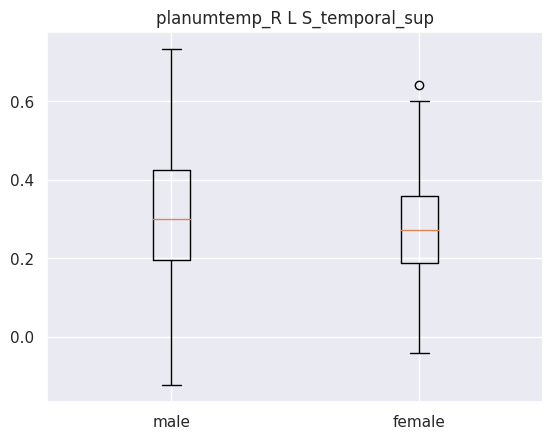

Ttest_indResult(statistic=1.8695975920657857, pvalue=0.06219767425438533)
male mean : 0.3054438005095454
male std : 0.16618568479496404
female mean : 0.2788564426159292
female std : 0.13193744183702244


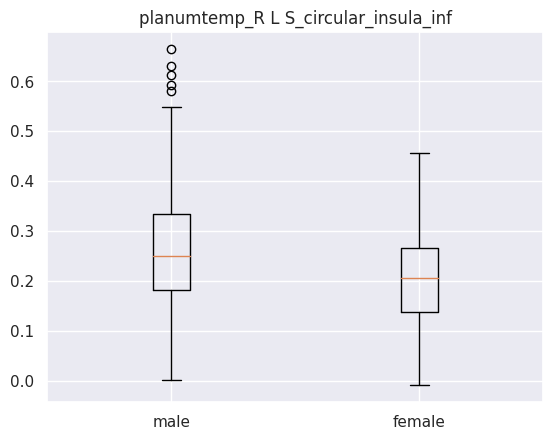

Ttest_indResult(statistic=5.536682319675686, pvalue=5.283850273823166e-08)
male mean : 0.26314078573
male std : 0.11589033220243106
female mean : 0.20795944492035398
female std : 0.09317104682445226


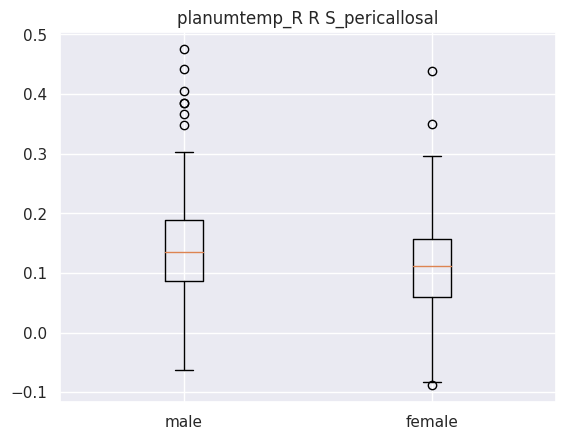

Ttest_indResult(statistic=4.099512012037479, pvalue=4.9237855822734976e-05)
male mean : 0.14388453827454545
male std : 0.08547370646470348
female mean : 0.11232528979557523
female std : 0.07660129004358317


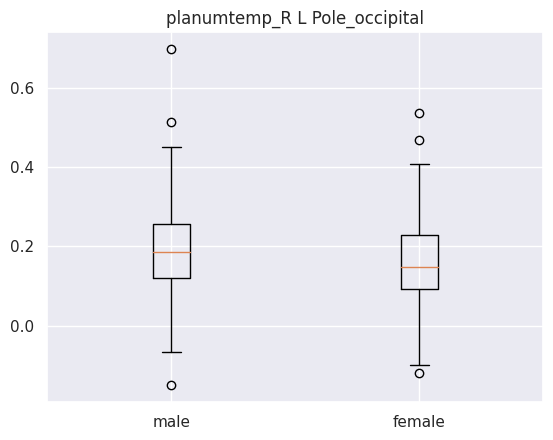

Ttest_indResult(statistic=3.0338050141925272, pvalue=0.002556601060476057)
male mean : 0.19206652156681817
male std : 0.1129203389533213
female mean : 0.16056218522699112
female std : 0.10585433102955759


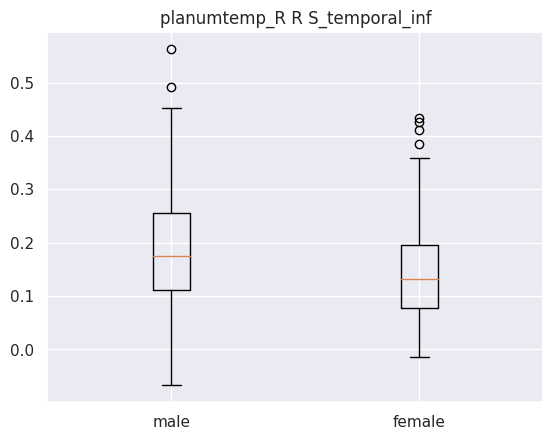

Ttest_indResult(statistic=5.093445831834155, pvalue=5.207770662763331e-07)
male mean : 0.19109833336272727
male std : 0.11146610197202778
female mean : 0.14283558278274336
female std : 0.08700087808711052


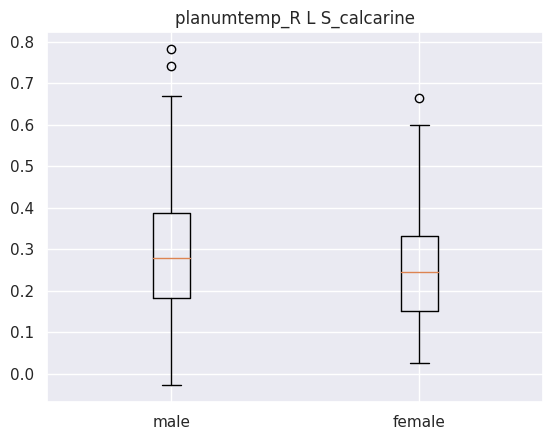

Ttest_indResult(statistic=3.077226310995013, pvalue=0.0022186529221928436)
male mean : 0.29213731421531824
male std : 0.1534333544769532
female mean : 0.2511115497699115
female std : 0.12653653671097487


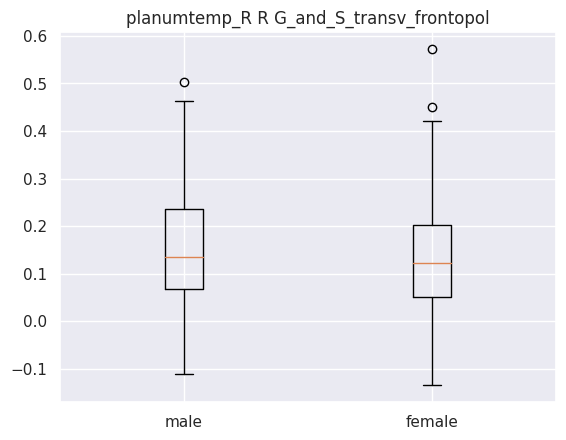

Ttest_indResult(statistic=1.6197574048200072, pvalue=0.10599440842770202)
male mean : 0.14979874731818182
male std : 0.12757857054837393
female mean : 0.13102783685654867
female std : 0.11648592660505695
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['opIFG_L', 'planumtemp_L', 'aMTG_L', 'pITG_L']
-------------------------------------------------------------------------------------------------------
     coefficient     seed                       labels
53      0.134427  opIFG_L                L S_front_sup
422     0.115411   aMTG_L             R S_front_middle
98      0.114153  opIFG_L       R G_pariet_inf-Angular
421     0.113381   aMTG_L                R S_front_inf
431     0.101514   aMTG_L          R S_orbital_lateral
351     0.097606   aMTG_L  L S_intrapariet_and_P_trans
322     0.095708   aMTG_L             L G_parietal_sup
300     0.091746   aMTG_L   L G_a

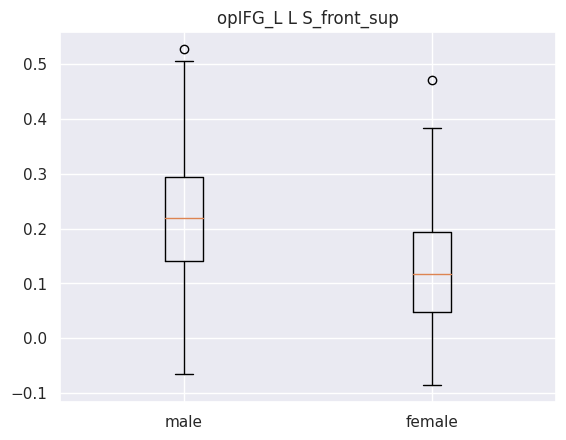

Ttest_indResult(statistic=9.514226955534408, pvalue=1.1745948061525577e-19)
male mean : 0.22193633239999996
male std : 0.11249626112199279
female mean : 0.12588911007571682
female std : 0.10000267392277586


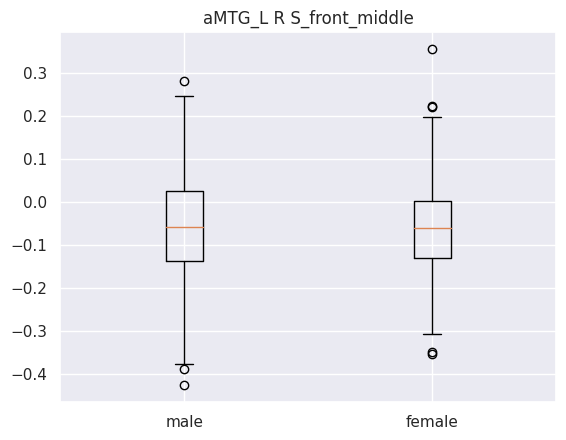

Ttest_indResult(statistic=-0.1288149656454001, pvalue=0.8975623921747511)
male mean : -0.06136301187972727
male std : 0.12937809167247663
female mean : -0.05989662055278762
female std : 0.10994256393017068


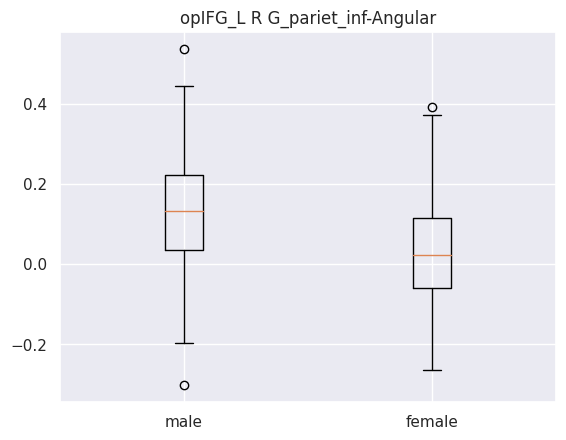

Ttest_indResult(statistic=7.24780487230096, pvalue=1.8918423767886693e-12)
male mean : 0.12424016548681818
male std : 0.13424300726761648
female mean : 0.03453558849026549
female std : 0.1265180924203619


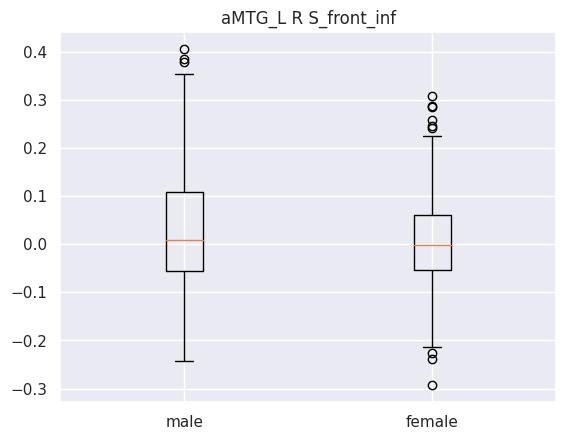

Ttest_indResult(statistic=1.9193910426129293, pvalue=0.055575465964615225)
male mean : 0.025140619681999998
male std : 0.12506768589238804
female mean : 0.004515161334216815
female std : 0.10031688528841444


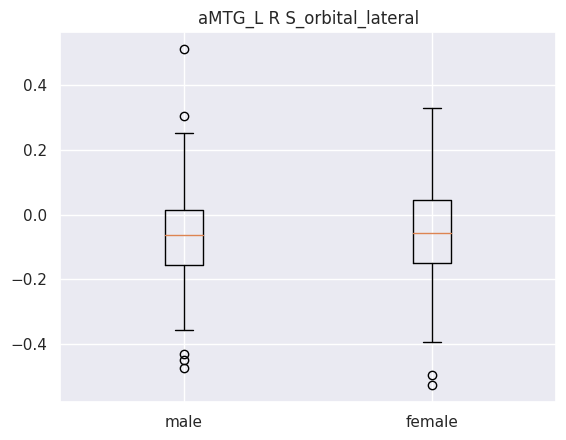

Ttest_indResult(statistic=-0.9595545169231156, pvalue=0.337801699063937)
male mean : -0.06771869820213636
male std : 0.14263363470452184
female mean : -0.05464536117588496
female std : 0.14439482773638504


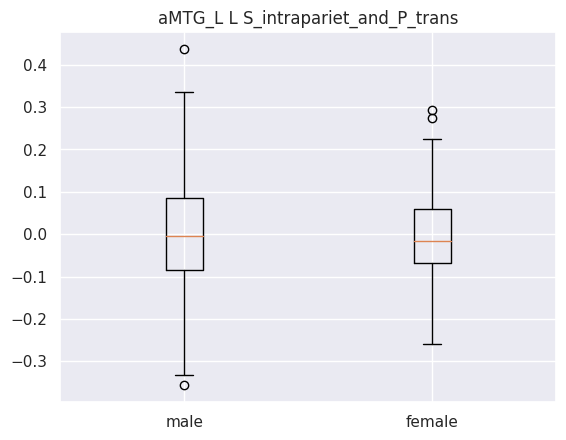

Ttest_indResult(statistic=1.0441439448576817, pvalue=0.29698694253266955)
male mean : 0.004413317491818183
male std : 0.12667357592144304
female mean : -0.006823133387610619
female std : 0.09870796418027704


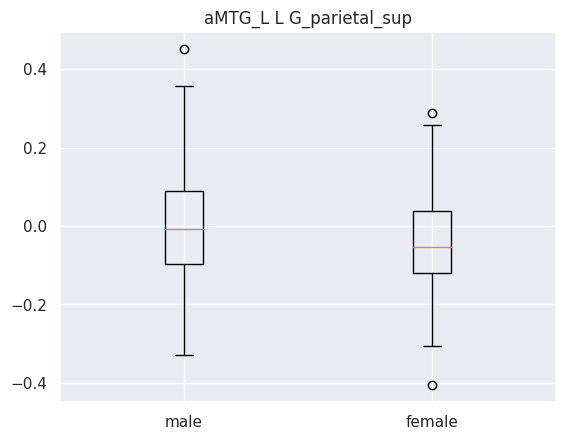

Ttest_indResult(statistic=3.4850474873752884, pvalue=0.0005409444654669903)
male mean : 0.003152544490909089
male std : 0.1486536903265774
female mean : -0.040841305016592916
female std : 0.11571389999440254


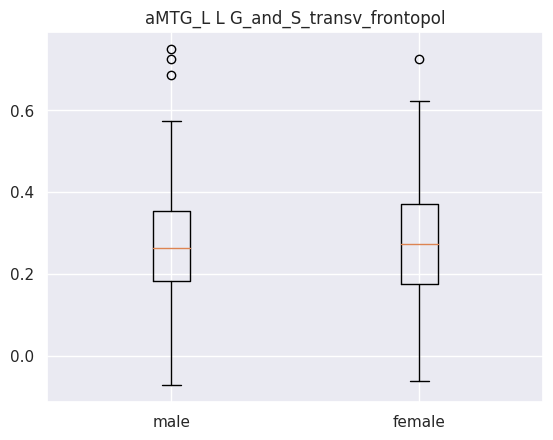

Ttest_indResult(statistic=-0.13187058202998522, pvalue=0.8951463929773453)
male mean : 0.2736758421272727
male std : 0.13376710268148156
female mean : 0.2753599954026549
female std : 0.13529084478562486


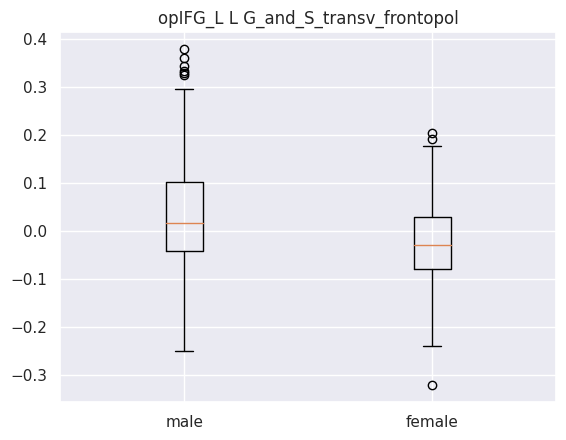

Ttest_indResult(statistic=5.033838587916691, pvalue=6.999625036984745e-07)
male mean : 0.025597121174999998
male std : 0.11515068596736391
female mean : -0.023709215497699117
female std : 0.09002691208082556


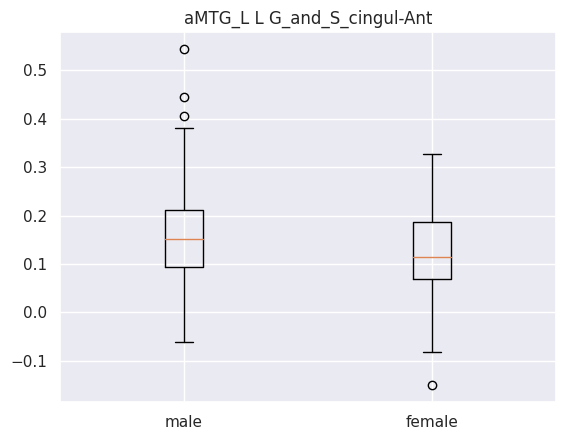

Ttest_indResult(statistic=4.307060944860257, pvalue=2.038136442014065e-05)
male mean : 0.16099100311954548
male std : 0.0980609784038807
female mean : 0.1242215932681416
female std : 0.08124741946330903
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['opIFG_R', 'planumtemp_R', 'aMTG_R', 'pITG_R']
-------------------------------------------------------------------------------------------------------
     coefficient          seed                       labels
421     0.143093        aMTG_R                R S_front_inf
53      0.125329       opIFG_R                L S_front_sup
66      0.118382       opIFG_R              L S_postcentral
55      0.115428       opIFG_R  L S_intrapariet_and_P_trans
135     0.113675       opIFG_R          R S_orbital_lateral
316     0.108906        aMTG_R      L G_oc-temp_lat-fusifor
281     0.096251  planumtemp_R              R S_oc-tem

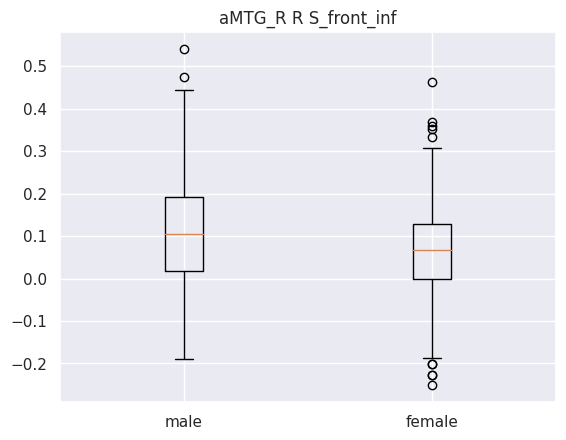

Ttest_indResult(statistic=3.956278857457922, pvalue=8.86001863789618e-05)
male mean : 0.10791621693545454
male std : 0.12931995413969696
female mean : 0.06154310212610619
female std : 0.11751957032303513


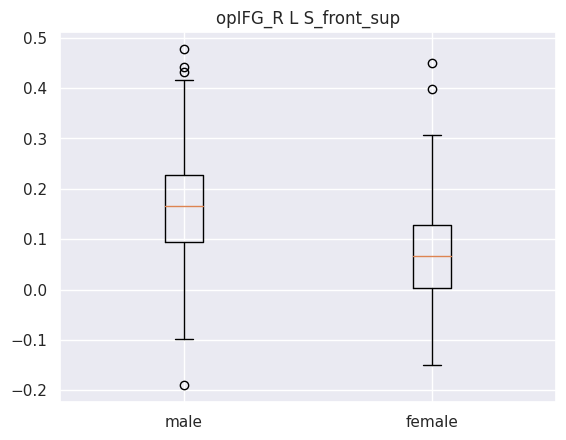

Ttest_indResult(statistic=9.215326889220611, pvalue=1.248160215367442e-18)
male mean : 0.16320744882072724
male std : 0.10965043228920933
female mean : 0.07219020907314161
female std : 0.09828873030252666


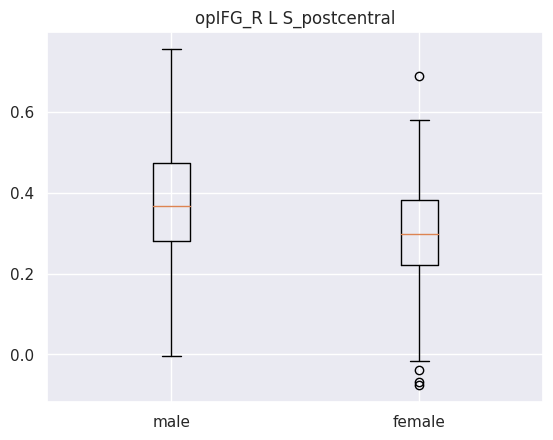

Ttest_indResult(statistic=5.748096942910928, pvalue=1.6798182257112908e-08)
male mean : 0.37275803086818177
male std : 0.13910319518939593
female mean : 0.29995721800884956
female std : 0.12765335683486648


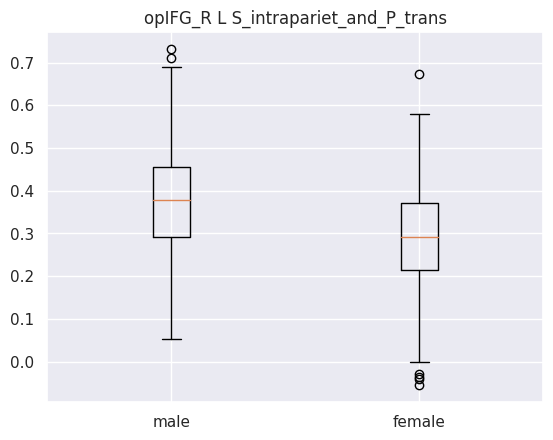

Ttest_indResult(statistic=7.525715474692434, pvalue=2.943978024764579e-13)
male mean : 0.3783558262136364
male std : 0.13092386861978492
female mean : 0.2881963432641593
female std : 0.1214409141686982


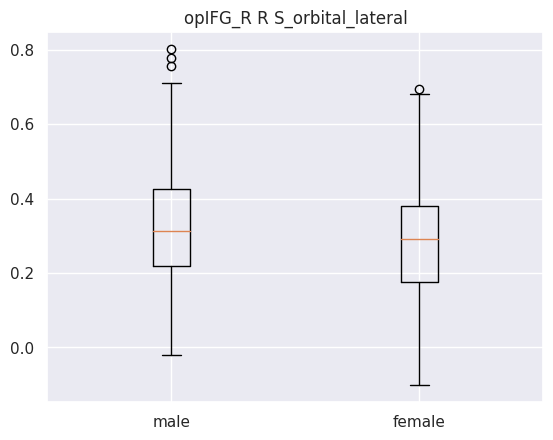

Ttest_indResult(statistic=2.744861835289781, pvalue=0.006299189228159366)
male mean : 0.3271381634947727
male std : 0.15738718014219788
female mean : 0.28616663755176996
female std : 0.15711147119637517


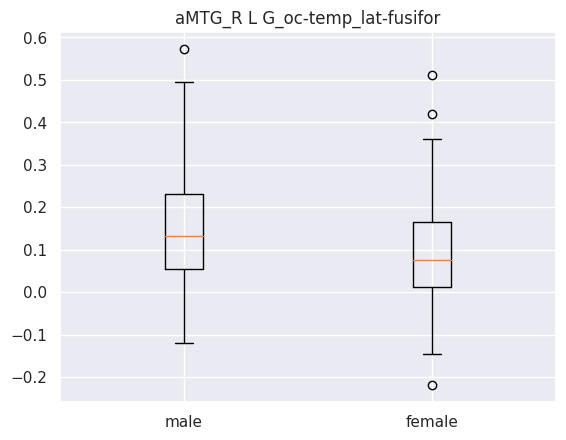

Ttest_indResult(statistic=5.157132505636498, pvalue=3.7849853475325553e-07)
male mean : 0.15163267344727274
male std : 0.13083327172091533
female mean : 0.09148790766993664
female std : 0.11456737640495235


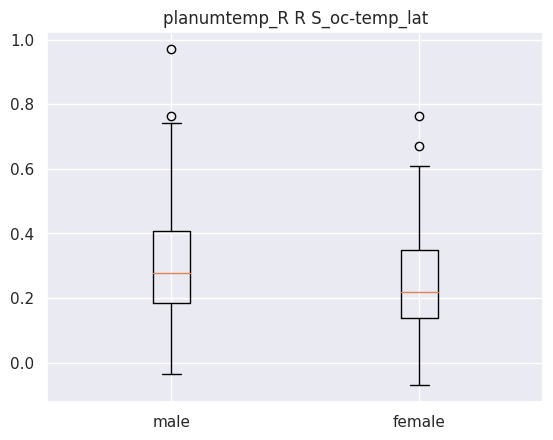

Ttest_indResult(statistic=4.3848505906610145, pvalue=1.4507989080998383e-05)
male mean : 0.30642626261363637
male std : 0.17063263131444123
female mean : 0.24031956101371682
female std : 0.14641438044368835


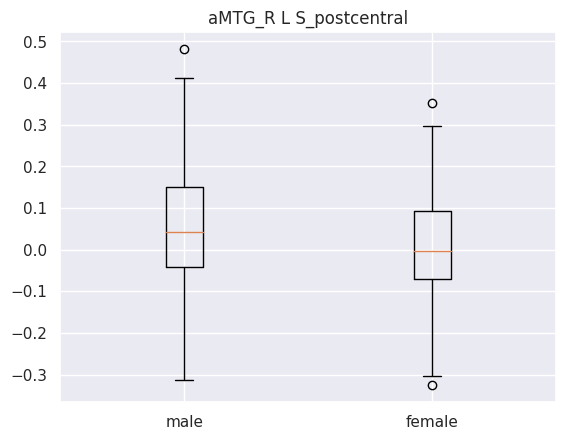

Ttest_indResult(statistic=2.627621292338559, pvalue=0.008896140355824254)
male mean : 0.04901591075681818
male std : 0.13953276104441498
female mean : 0.016055526186592915
female std : 0.12453371759228786


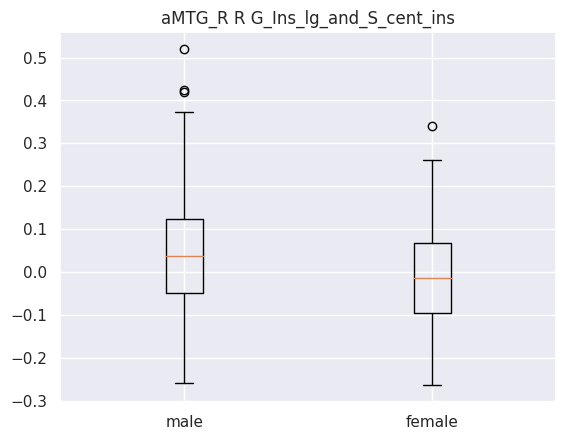

Ttest_indResult(statistic=4.494099754685952, pvalue=8.92418981107013e-06)
male mean : 0.0445266324765
male std : 0.12931193503968358
female mean : -0.007410436407079646
female std : 0.11390051576344988


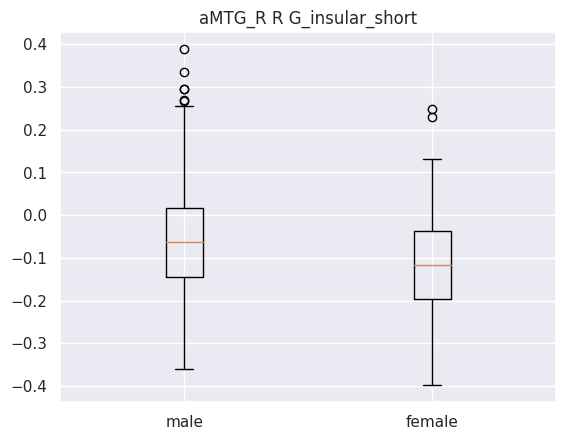

Ttest_indResult(statistic=4.791406408347229, pvalue=2.2619068113837188e-06)
male mean : -0.057874727749363634
male std : 0.131067036894437
female mean : -0.11392378271912831
female std : 0.11509617159718821
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []




In [86]:
for result in all_results:
    if result == results_path_all_seed:
        rois = ["opIFG_L", "planumtemp_L", "aMTG_L", "pITG_L", "opIFG_R", "planumtemp_R", "aMTG_R", "pITG_R"] # modified to rois of interest
    elif result == results_path_aMTG_L:
        rois = ["aMTG_L"]
    elif result == results_path_aMTG_R:
        rois = ["aMTG_R"]
    elif result == results_path_opIFG_L:
        rois = ["opIFG_L"]
    elif result == results_path_opIFG_R:
        rois = ["opIFG_R"]
    elif result == results_path_pITG_L:
        rois = ["pITG_L"]
    elif result == results_path_pITG_R:
        rois = ["pITG_R"]
    elif result == results_path_planumtemp_L:
        rois = ["planumtemp_L"]
    elif result == results_path_planumtemp_R:
        rois = ["planumtemp_R"]
    elif result == results_path_all_left:
        rois = ["opIFG_L", "planumtemp_L", "aMTG_L", "pITG_L"]
    elif result == results_path_all_right:
        rois = ["opIFG_R", "planumtemp_R", "aMTG_R", "pITG_R"]
    print("-------------------------------------------------------------------------------------------------------")
    print(rois)
    print("-------------------------------------------------------------------------------------------------------")
    moyenne, scoresZ, pvalue, data_results = compute_results(result)
    ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
    sensitivity = data_results["confusion_matrix"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
    specificity = data_results["confusion_matrix"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
    print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
    print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))
    print("Validation accuracy")
    moyenne, scoresZ, pvalue, data_results = compute_results(result)
    pdList = []
    pdList.extend(data_results["confusion_matrix_validation"])
    concat_df = pd.concat(pdList)
    mean_confusion = concat_df.groupby(concat_df.index)
    mean_confusion = mean_confusion.mean()
    sensitivity, specificity = sensitivity_specificity(mean_confusion)
    print("Sensitivity : " + str(sensitivity))
    print("Specificity : " + str(specificity))
    print("mean Accuracy validation : " + str(data_results["acc_validation"].mean()))
    bestRegion(ROIs, data, df_boot)
    print("\n")


      coefficient          seed                      labels
53       0.076144       opIFG_L               L S_front_sup
98       0.069329       opIFG_L      R G_pariet_inf-Angular
422      0.065315        aMTG_L            R S_front_middle
421      0.064355        aMTG_L               R S_front_inf
1013     0.060580        aMTG_R               R S_front_inf
301      0.060371        aMTG_L        L G_and_S_cingul-Ant
305      0.059266        aMTG_L     L G_cingul-Post-ventral
4        0.056628       opIFG_L  L G_and_S_transv_frontopol
189      0.055237  planumtemp_L            L Pole_occipital
300      0.053906        aMTG_L  L G_and_S_transv_frontopol
The mean accuracy : 0.9044633333333335
The standard deviation of the accuracy : 0.03318548156076319
The lower boundry of the confidance interval of the accuracy : 0.8394197894742377
The upper boundry of the confidance interval of the accuracy : 0.9695068771924293
Mean sensitivity : 0.9042588762934938 Std sensitivity : 0.04307419842882615


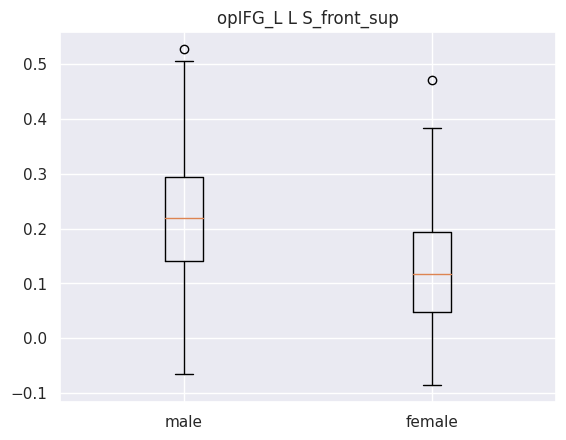

Ttest_indResult(statistic=9.514226955534408, pvalue=1.1745948061525577e-19)
male mean : 0.22193633239999996
male std : 0.11249626112199279
female mean : 0.12588911007571682
female std : 0.10000267392277586


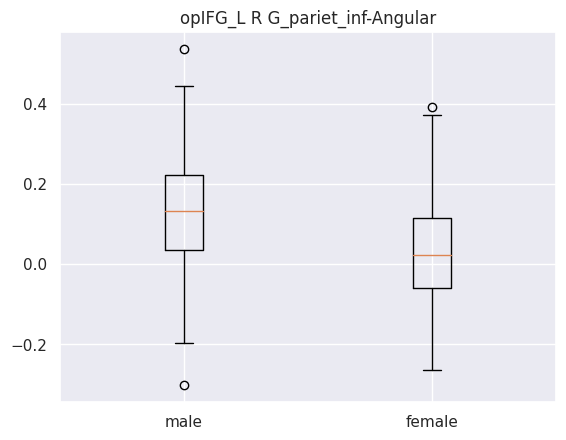

Ttest_indResult(statistic=7.24780487230096, pvalue=1.8918423767886693e-12)
male mean : 0.12424016548681818
male std : 0.13424300726761648
female mean : 0.03453558849026549
female std : 0.1265180924203619


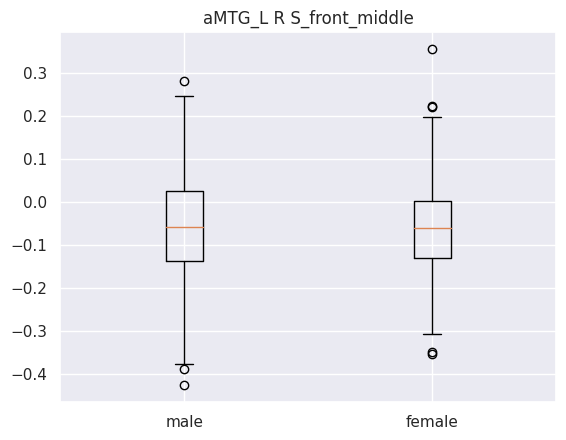

Ttest_indResult(statistic=-0.1288149656454001, pvalue=0.8975623921747511)
male mean : -0.06136301187972727
male std : 0.12937809167247663
female mean : -0.05989662055278762
female std : 0.10994256393017068


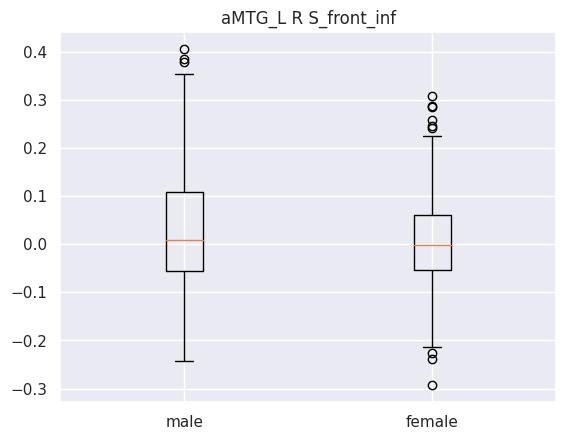

Ttest_indResult(statistic=1.9193910426129293, pvalue=0.055575465964615225)
male mean : 0.025140619681999998
male std : 0.12506768589238804
female mean : 0.004515161334216815
female std : 0.10031688528841444


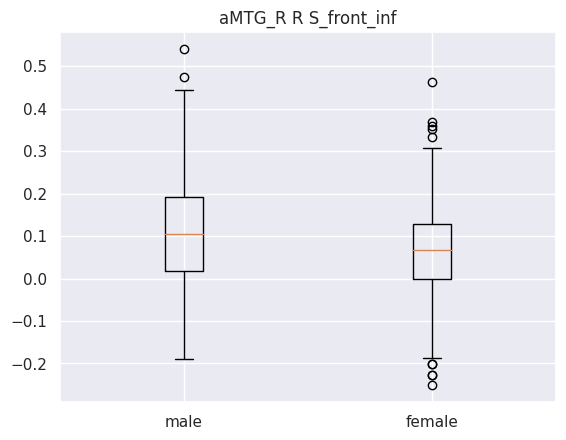

Ttest_indResult(statistic=3.956278857457922, pvalue=8.86001863789618e-05)
male mean : 0.10791621693545454
male std : 0.12931995413969696
female mean : 0.06154310212610619
female std : 0.11751957032303513


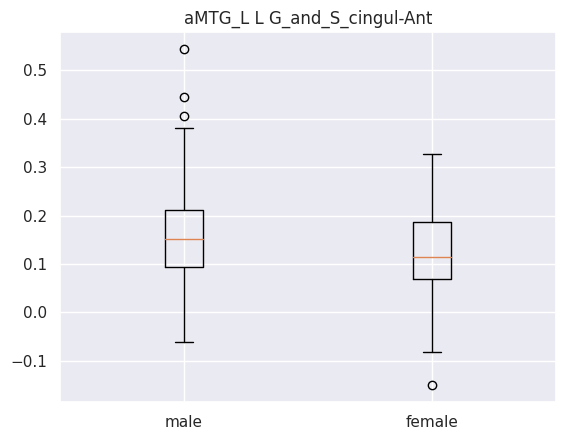

Ttest_indResult(statistic=4.307060944860257, pvalue=2.038136442014065e-05)
male mean : 0.16099100311954548
male std : 0.0980609784038807
female mean : 0.1242215932681416
female std : 0.08124741946330903


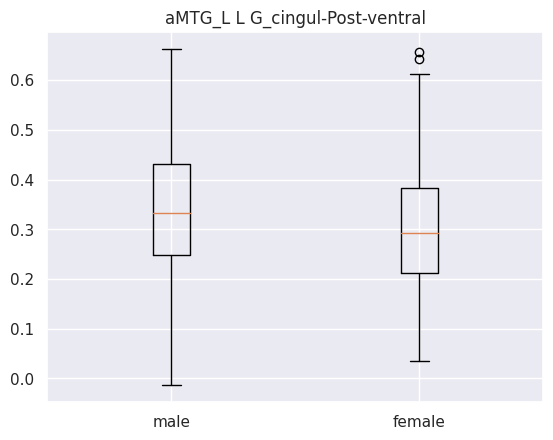

Ttest_indResult(statistic=2.7358247046655375, pvalue=0.006471799539479473)
male mean : 0.3344936346227273
male std : 0.12852301357983476
female mean : 0.30081479229646013
female std : 0.1308069984904627


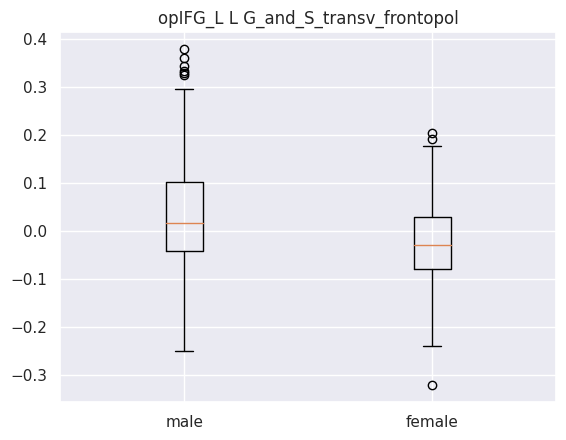

Ttest_indResult(statistic=5.033838587916691, pvalue=6.999625036984745e-07)
male mean : 0.025597121174999998
male std : 0.11515068596736391
female mean : -0.023709215497699117
female std : 0.09002691208082556


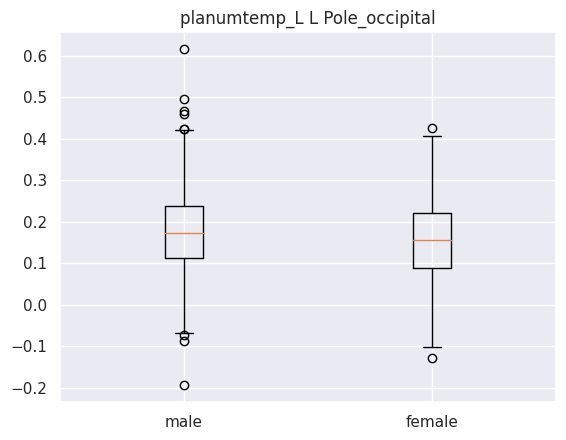

Ttest_indResult(statistic=2.8966477425742636, pvalue=0.003958114551412912)
male mean : 0.18402248281818182
male std : 0.11334589412846845
female mean : 0.1545630971402655
female std : 0.10073153762994376


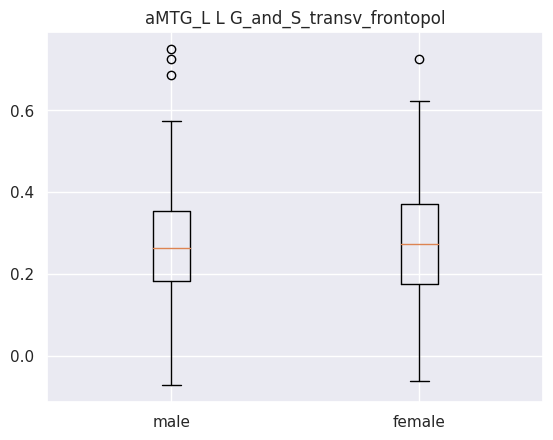

Ttest_indResult(statistic=-0.13187058202998522, pvalue=0.8951463929773453)
male mean : 0.2736758421272727
male std : 0.13376710268148156
female mean : 0.2753599954026549
female std : 0.13529084478562486
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [23]:
rois = ["opIFG_L", "planumtemp_L", "aMTG_L", "pITG_L", "opIFG_R", "planumtemp_R", "aMTG_R", "pITG_R"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_all_seed)
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
sensitivity = data_results["confusion_matrix"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))
bestRegion(ROIs, data, df_boot)


     coefficient    seed                      labels
98      0.254345  aMTG_L      R G_pariet_inf-Angular
53      0.247339  aMTG_L               L S_front_sup
22      0.221981  aMTG_L     L G_oc-temp_med-Parahip
104     0.199961  aMTG_L                  R G_rectus
131     0.197597  aMTG_L  R S_oc_sup_and_transversal
103     0.177538  aMTG_L               R G_precuneus
66      0.167226  aMTG_L             L S_postcentral
4       0.165337  aMTG_L  L G_and_S_transv_frontopol
96      0.150952  aMTG_L     R G_oc-temp_med-Parahip
90      0.150416  aMTG_L   R G_Ins_lg_and_S_cent_ins
The mean accuracy : 0.8175355555555558
The standard deviation of the accuracy : 0.04265289818355595
The lower boundry of the confidance interval of the accuracy : 0.7339358751157862
The upper boundry of the confidance interval of the accuracy : 0.9011352359953254
Mean sensitivity : 0.815954370327389 Std sensitivity : 0.0509054517521331
Mean specificity : 0.8242375936876714 Std specificity : 0.05283841356696713


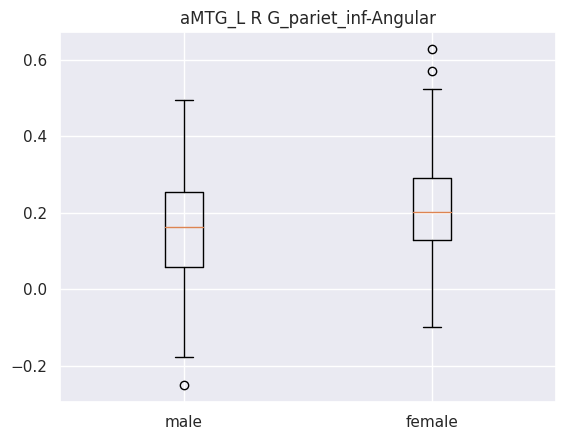

Ttest_indResult(statistic=-3.9493086257770935, pvalue=9.112915695993898e-05)
male mean : 0.1597038146640909
male std : 0.14141209184423478
female mean : 0.20934205392477875
female std : 0.12301362367570179


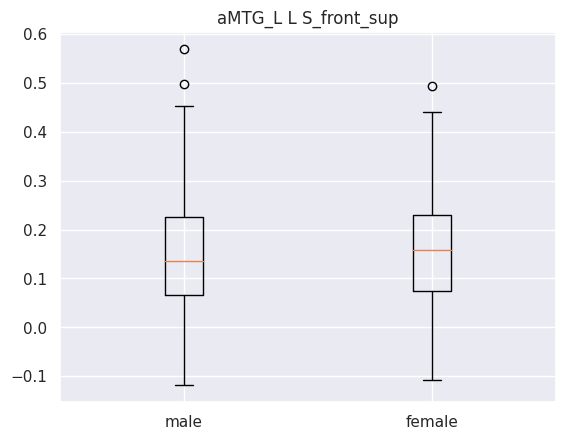

Ttest_indResult(statistic=-0.9406515856219914, pvalue=0.3473949131207905)
male mean : 0.149155713895
male std : 0.12215414677633321
female mean : 0.15968833962980092
female std : 0.1137261077832309


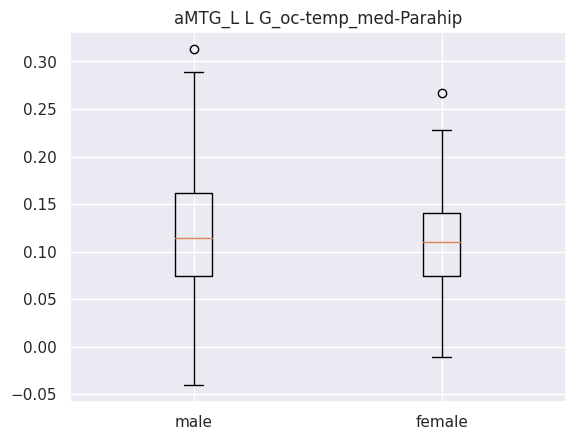

Ttest_indResult(statistic=2.6168014548691065, pvalue=0.00917858413141157)
male mean : 0.12139309023636362
male std : 0.05894973262885631
female mean : 0.10806080625663717
female std : 0.04798219271826174


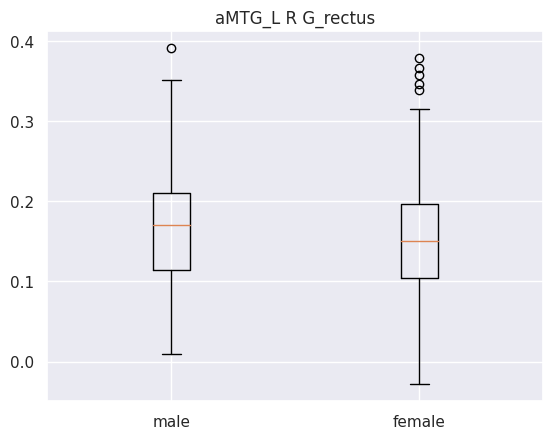

Ttest_indResult(statistic=1.5156403489067496, pvalue=0.1303218993854485)
male mean : 0.1657639553590909
male std : 0.0682223379382807
female mean : 0.15580128479203542
female std : 0.07023035925739472


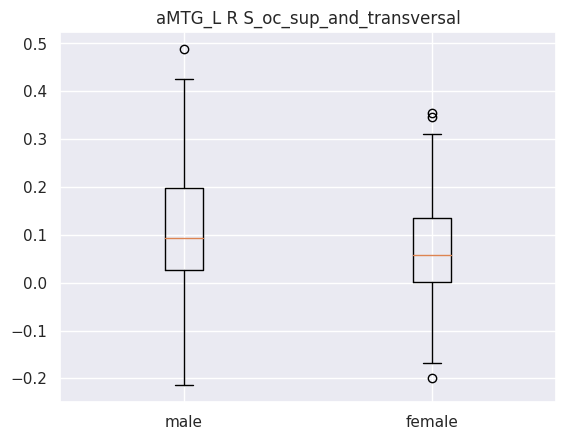

Ttest_indResult(statistic=3.5613990096675714, pvalue=0.0004087562486128332)
male mean : 0.10625280339390909
male std : 0.12637717435553078
female mean : 0.06767066309955752
female std : 0.10078149226010065


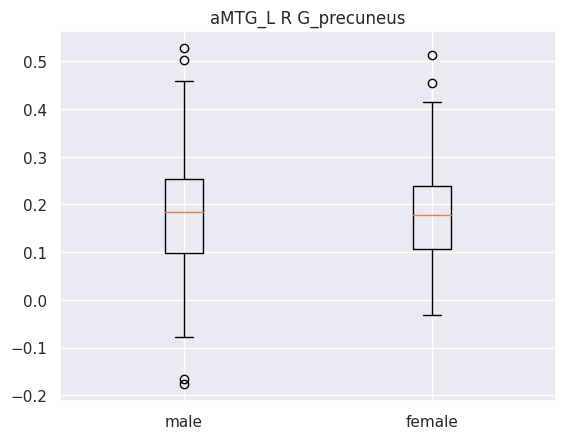

Ttest_indResult(statistic=0.20836146513744597, pvalue=0.8350422894528916)
male mean : 0.1794498914168182
male std : 0.11811792236708751
female mean : 0.17732722280000002
female std : 0.09564836134166617


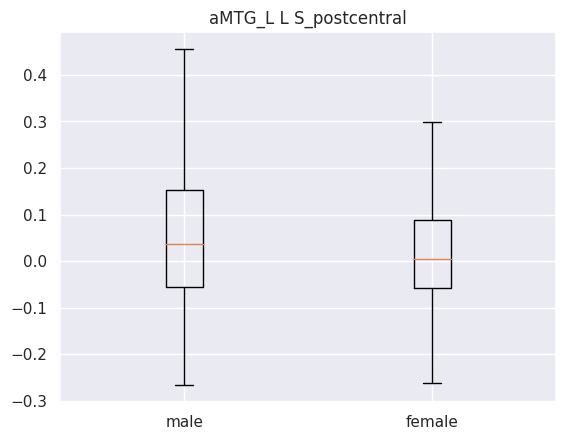

Ttest_indResult(statistic=2.4484128219617074, pvalue=0.01473464302856492)
male mean : 0.04535718950954546
male std : 0.14137947053259706
female mean : 0.01543427044787611
female std : 0.11512896698383501


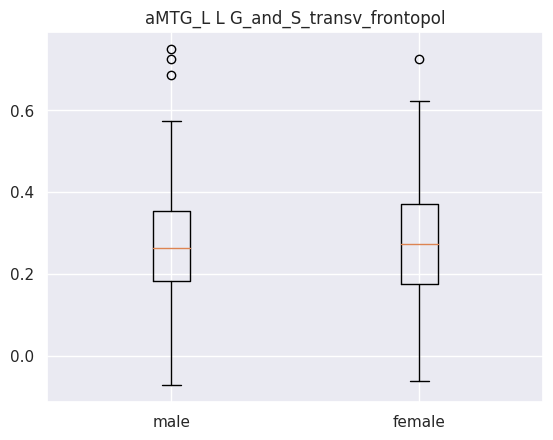

Ttest_indResult(statistic=-0.13187058202998522, pvalue=0.8951463929773453)
male mean : 0.2736758421272727
male std : 0.13376710268148156
female mean : 0.2753599954026549
female std : 0.13529084478562486


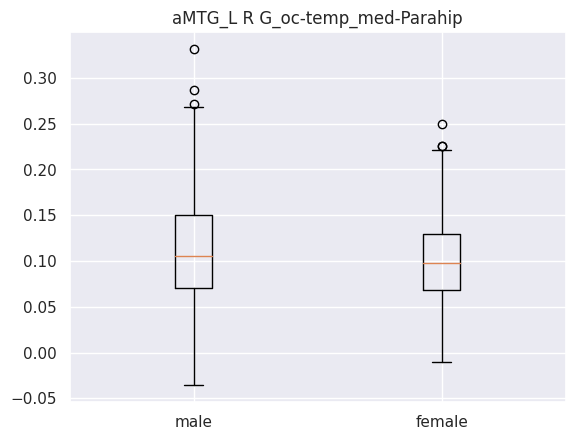

Ttest_indResult(statistic=2.824275015327996, pvalue=0.0049521189756473)
male mean : 0.11477974225227273
male std : 0.058736191830444526
female mean : 0.10050169280283186
female std : 0.04731973538271092


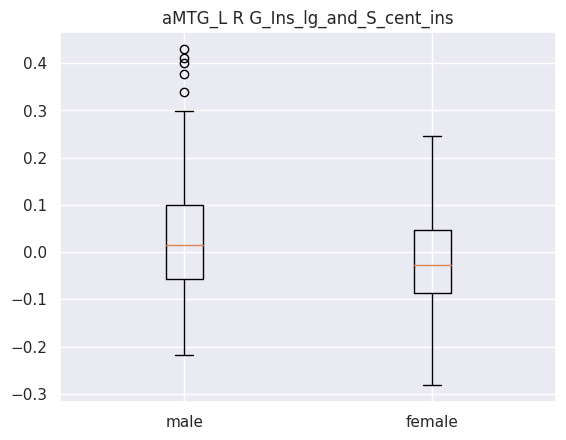

Ttest_indResult(statistic=3.681665216455551, pvalue=0.0002602364041619344)
male mean : 0.02278002829522727
male std : 0.11774230758215139
female mean : -0.015473884240707966
female std : 0.10074475793993512
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [25]:
rois = ["aMTG_L"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_aMTG_L)
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
sensitivity = data_results["confusion_matrix"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))
bestRegion(ROIs, data, df_boot)


     coefficient    seed                       labels
22      0.244152  aMTG_R      L G_oc-temp_med-Parahip
53      0.226778  aMTG_R                L S_front_sup
66      0.219443  aMTG_R              L S_postcentral
96      0.217688  aMTG_R      R G_oc-temp_med-Parahip
98      0.200564  aMTG_R       R G_pariet_inf-Angular
55      0.183858  aMTG_R  L S_intrapariet_and_P_trans
90      0.172870  aMTG_R    R G_Ins_lg_and_S_cent_ins
104     0.156547  aMTG_R                   R G_rectus
4       0.152718  aMTG_R   L G_and_S_transv_frontopol
131     0.146043  aMTG_R   R S_oc_sup_and_transversal
The mean accuracy : 0.8016800000000001
The standard deviation of the accuracy : 0.043604477287386124
The lower boundry of the confidance interval of the accuracy : 0.7162152245167233
The upper boundry of the confidance interval of the accuracy : 0.8871447754832769
Mean sensitivity : 0.8004778392928547 Std sensitivity : 0.05128398792621867
Mean specificity : 0.8080729735127765 Std specificity : 0.0537715

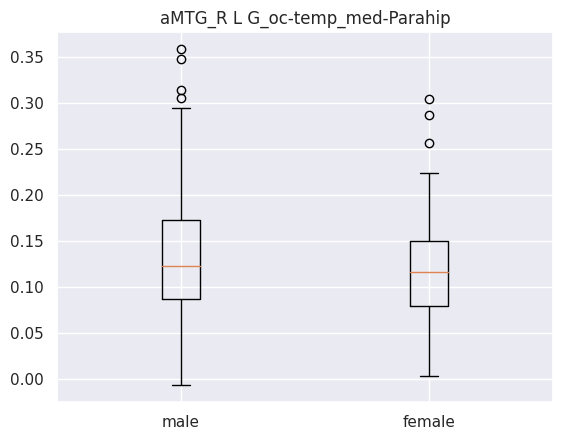

Ttest_indResult(statistic=2.839191497277654, pvalue=0.004730402487154351)
male mean : 0.13388492833
male std : 0.06366889431603796
female mean : 0.11838812058539823
female std : 0.05078064169079939


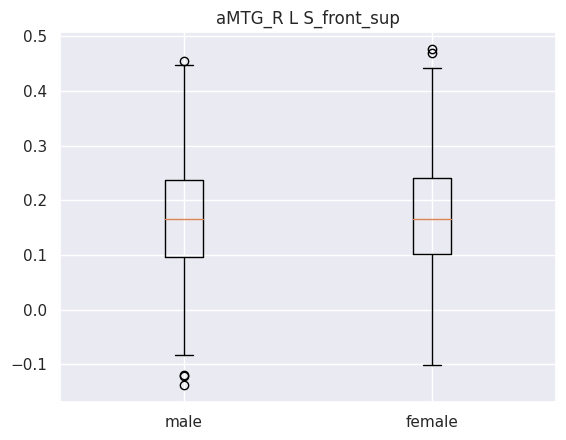

Ttest_indResult(statistic=-0.08008365126456747, pvalue=0.9362068082925741)
male mean : 0.17175187354863636
male std : 0.11338550789442398
female mean : 0.1725857526397788
female std : 0.10597629980410962


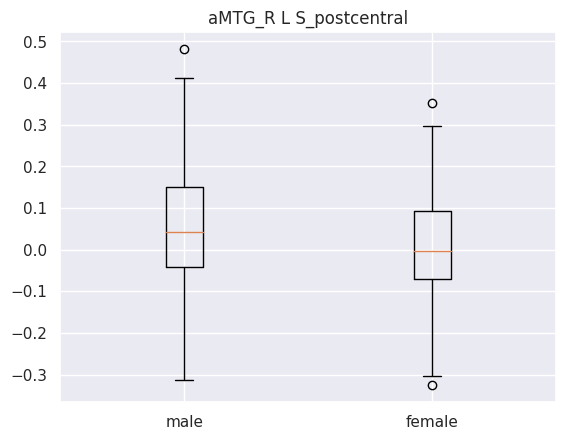

Ttest_indResult(statistic=2.627621292338559, pvalue=0.008896140355824254)
male mean : 0.04901591075681818
male std : 0.13953276104441498
female mean : 0.016055526186592915
female std : 0.12453371759228786


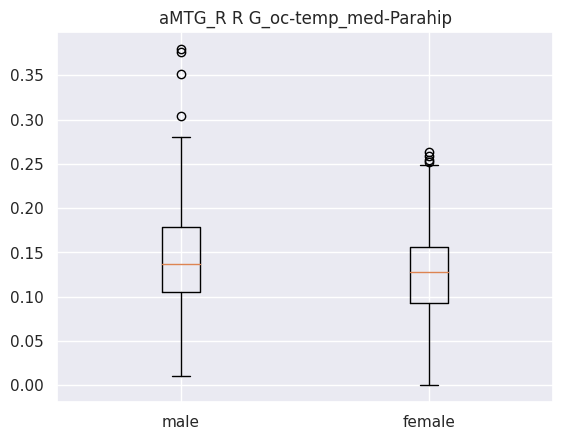

Ttest_indResult(statistic=3.2230120586916766, pvalue=0.0013619508370199724)
male mean : 0.14602855690909092
male std : 0.06277541821437044
female mean : 0.1286269260214602
female std : 0.050481361154379095


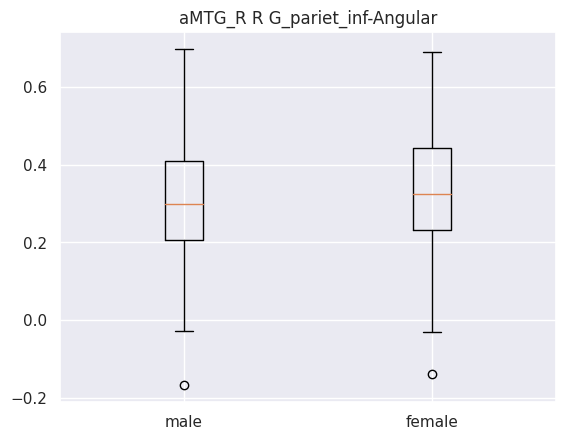

Ttest_indResult(statistic=-1.2323437014086307, pvalue=0.21847289401376063)
male mean : 0.30850017917
male std : 0.1509961278933057
female mean : 0.3258114792300885
female std : 0.14499535619579842


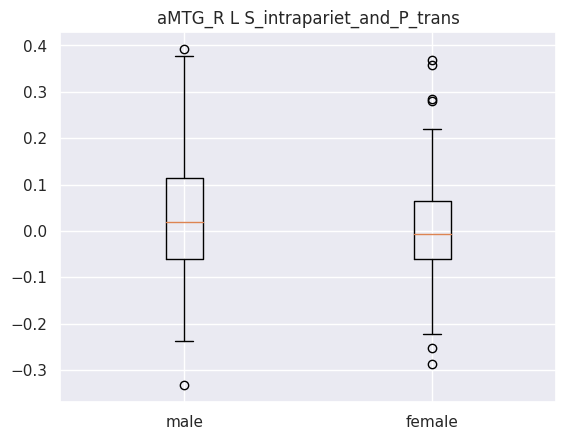

Ttest_indResult(statistic=2.0033433133727625, pvalue=0.0457476860349034)
male mean : 0.02404788690863636
male std : 0.12464427867043203
female mean : 0.0021809927742920342
female std : 0.10473721060141471


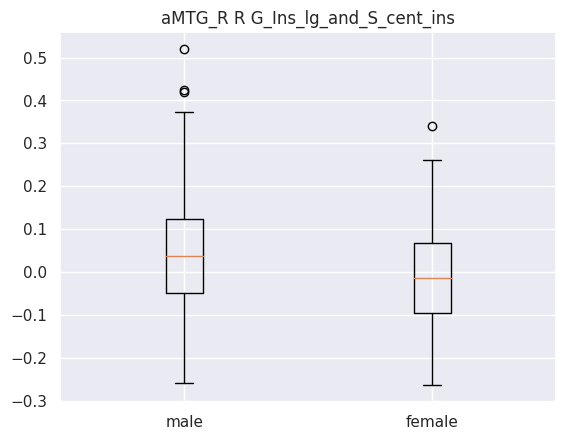

Ttest_indResult(statistic=4.494099754685952, pvalue=8.92418981107013e-06)
male mean : 0.0445266324765
male std : 0.12931193503968358
female mean : -0.007410436407079646
female std : 0.11390051576344988


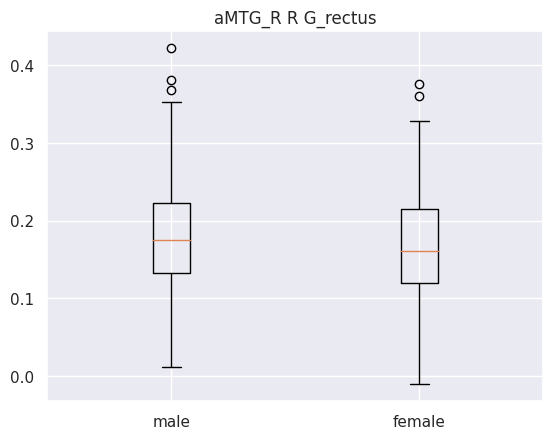

Ttest_indResult(statistic=1.9556394665406327, pvalue=0.0511344240664779)
male mean : 0.1794522245181818
male std : 0.07123758746046512
female mean : 0.16650174143982302
female std : 0.06829511318721243


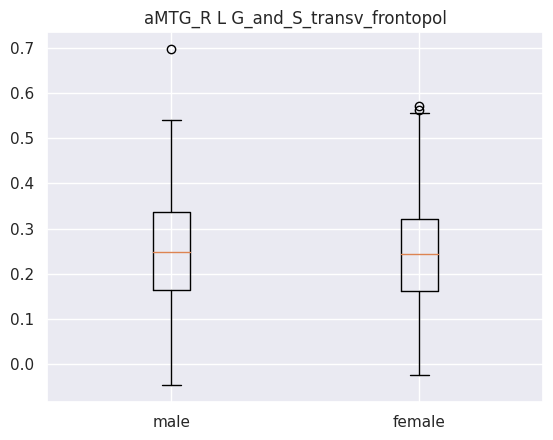

Ttest_indResult(statistic=0.7806963776760073, pvalue=0.43539711360071087)
male mean : 0.25175311356636365
male std : 0.12076507584294517
female mean : 0.2429040562159292
female std : 0.11807395115490585


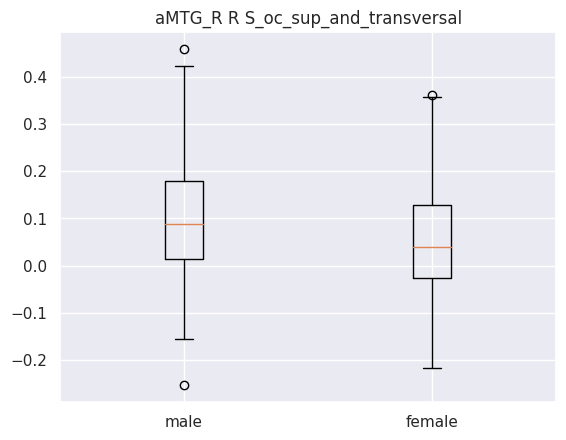

Ttest_indResult(statistic=4.231939532641933, pvalue=2.8164514848048607e-05)
male mean : 0.10353396476636365
male std : 0.1292749411740477
female mean : 0.05450852847345132
female std : 0.1145602710940684
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [26]:
rois = ["aMTG_R"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_aMTG_R)
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
sensitivity = data_results["confusion_matrix"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))
bestRegion(ROIs, data, df_boot)


     coefficient     seed                       labels
125     0.216892  opIFG_L                R S_front_inf
20      0.204766  opIFG_L      L G_oc-temp_lat-fusifor
35      0.204411  opIFG_L      L G_temp_sup-Plan_tempo
79      0.198224  opIFG_L         R G_and_S_cingul-Ant
144     0.194794  opIFG_L              R S_subparietal
91      0.179175  opIFG_L            R G_insular_short
60      0.161698  opIFG_L  L S_oc-temp_med_and_Lingual
47      0.157873  opIFG_L      L S_circular_insula_inf
1       0.151315  opIFG_L      L G_and_S_occipital_inf
41      0.141047  opIFG_L             L Pole_occipital
The mean accuracy : 0.8384311111111112
The standard deviation of the accuracy : 0.04067623226904058
The lower boundry of the confidance interval of the accuracy : 0.7587056958637917
The upper boundry of the confidance interval of the accuracy : 0.9181565263584308
Mean sensitivity : 0.8329385721787536 Std sensitivity : 0.049084879392642486
Mean specificity : 0.8494774864227161 Std specificity 

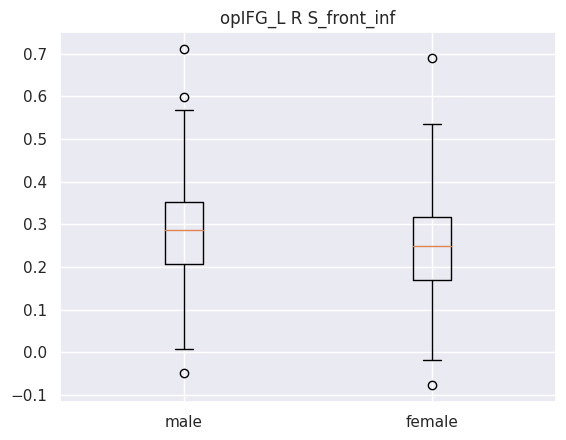

Ttest_indResult(statistic=3.835811545215277, pvalue=0.0001432689580451875)
male mean : 0.2851604080318182
male std : 0.11340294993333086
female mean : 0.24395864221681413
female std : 0.11291671921913636


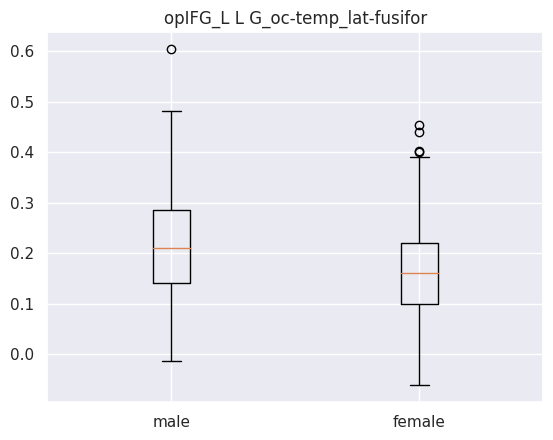

Ttest_indResult(statistic=5.347205581276891, pvalue=1.4323542479964458e-07)
male mean : 0.21720834137113634
male std : 0.10505156622836234
female mean : 0.1665263415774336
female std : 0.09451242193790162


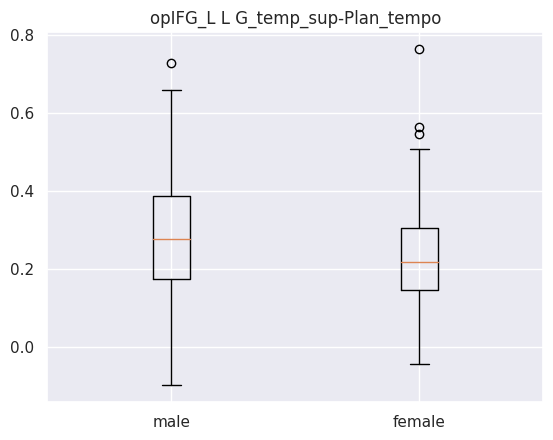

Ttest_indResult(statistic=4.658112093864058, pvalue=4.223278693577736e-06)
male mean : 0.2863882349772728
male std : 0.14948277729148243
female mean : 0.22649747706194692
female std : 0.12022186901150231


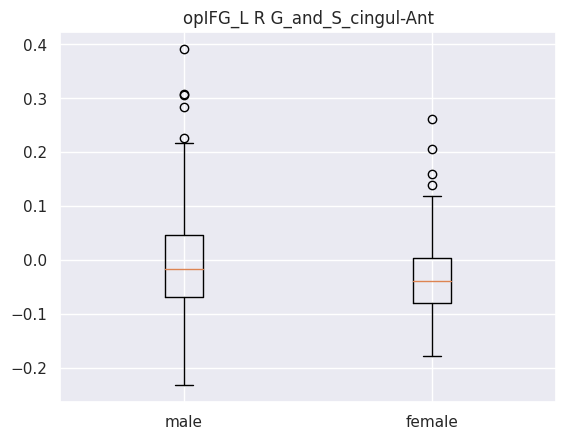

Ttest_indResult(statistic=3.464665320247692, pvalue=0.0005824633674892333)
male mean : -0.006062558034272728
male std : 0.09768015129495845
female mean : -0.033554106136725666
female std : 0.0670920200770204


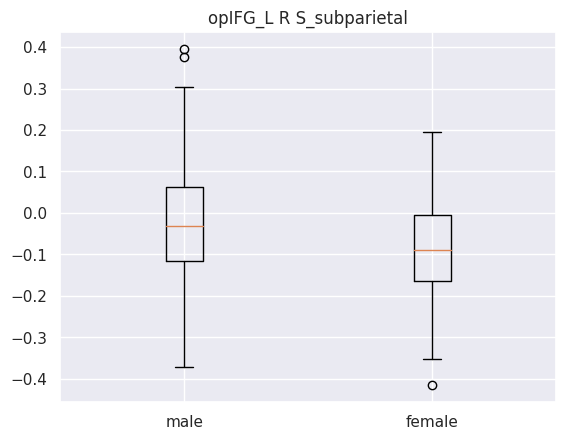

Ttest_indResult(statistic=4.609312989745705, pvalue=5.2885387407695605e-06)
male mean : -0.024811179274522723
male std : 0.14365742689954286
female mean : -0.08184163840840707
female std : 0.1159257812279483


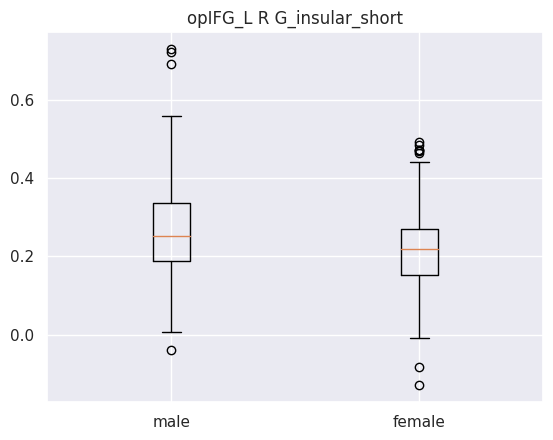

Ttest_indResult(statistic=4.228696451103205, pvalue=2.855749277590576e-05)
male mean : 0.2642323993227273
male std : 0.12153962695267223
female mean : 0.21892150578761063
female std : 0.10375910549235366


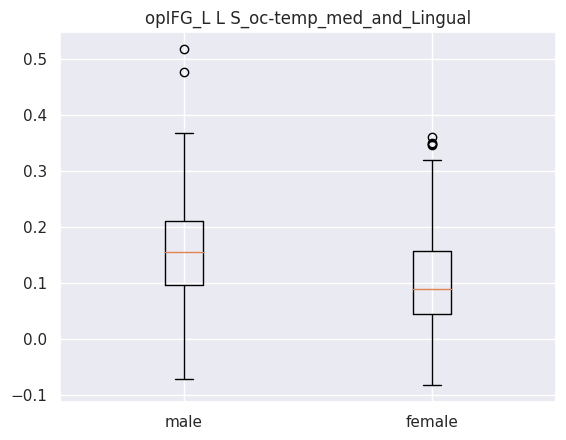

Ttest_indResult(statistic=5.608872459876942, pvalue=3.5868373548282604e-08)
male mean : 0.15474476261090905
male std : 0.09145221886246907
female mean : 0.10766764768845133
female std : 0.08536736636712615


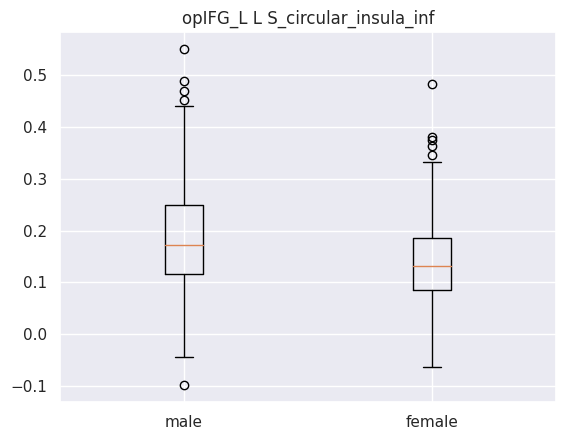

Ttest_indResult(statistic=5.521425671090101, pvalue=5.731639475936297e-08)
male mean : 0.18788899746363638
male std : 0.10418852948770023
female mean : 0.13893758282522123
female std : 0.08153292407600472


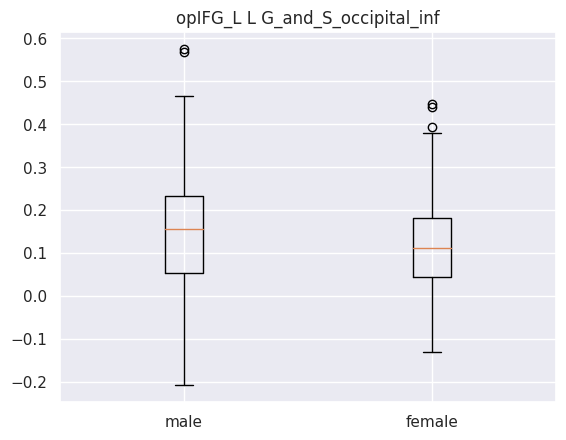

Ttest_indResult(statistic=3.05191381594728, pvalue=0.002410294840666242)
male mean : 0.15546942175227274
male std : 0.13201789524707933
female mean : 0.11997070040309733
female std : 0.112540443719782


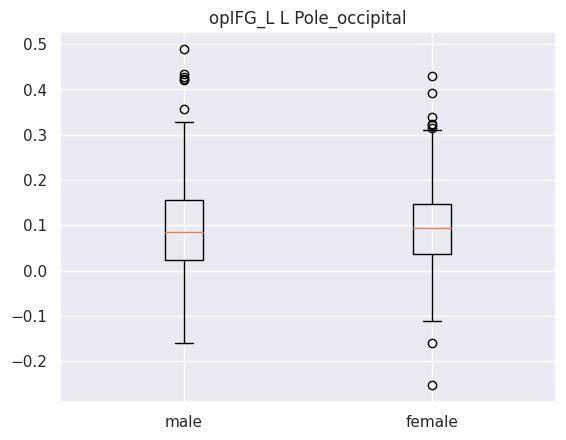

Ttest_indResult(statistic=0.41319809936730145, pvalue=0.6796609598891232)
male mean : 0.10181187025654546
male std : 0.10793048805971699
female mean : 0.09780579236287609
female std : 0.09616272201075322
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [27]:
rois = ["opIFG_L"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_opIFG_L)
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
sensitivity = data_results["confusion_matrix"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))
bestRegion(ROIs, data, df_boot)


     coefficient     seed                       labels
125     0.225181  opIFG_R                R S_front_inf
90      0.216860  opIFG_R    R G_Ins_lg_and_S_cent_ins
41      0.192370  opIFG_R             L Pole_occipital
144     0.183568  opIFG_R              R S_subparietal
63      0.177447  opIFG_R         L S_orbital-H_Shaped
80      0.177072  opIFG_R     R G_and_S_cingul-Mid-Ant
133     0.171700  opIFG_R              R S_oc-temp_lat
20      0.161732  opIFG_R      L G_oc-temp_lat-fusifor
91      0.151196  opIFG_R            R G_insular_short
60      0.144170  opIFG_R  L S_oc-temp_med_and_Lingual
The mean accuracy : 0.8146300000000001
The standard deviation of the accuracy : 0.042748765212114535
The lower boundry of the confidance interval of the accuracy : 0.7308424201842556
The upper boundry of the confidance interval of the accuracy : 0.8984175798157445
Mean sensitivity : 0.8163361249332465 Std sensitivity : 0.05140379679726446
Mean specificity : 0.8178287089479575 Std specificity 

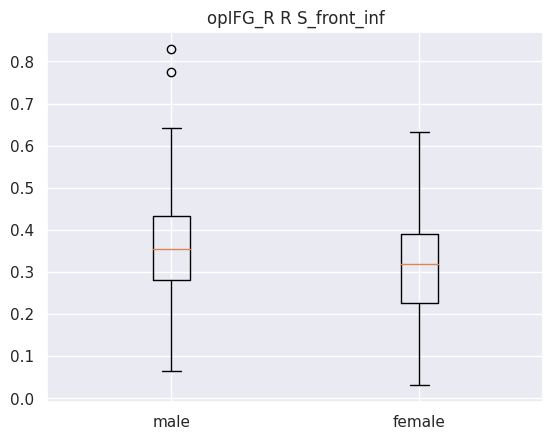

Ttest_indResult(statistic=3.9946084585433304, pvalue=7.584042967238988e-05)
male mean : 0.36241775419090916
male std : 0.11709006437871611
female mean : 0.31739422023451325
female std : 0.12031934666421866


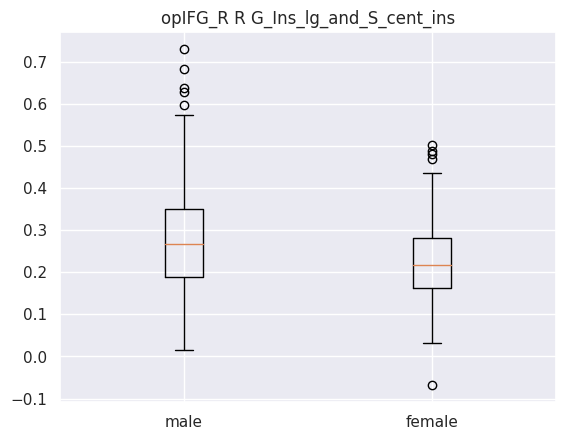

Ttest_indResult(statistic=4.719580637797441, pvalue=3.1723919963938446e-06)
male mean : 0.2733611874181818
male std : 0.12407207041222522
female mean : 0.22280797660176993
female std : 0.1007125264660346


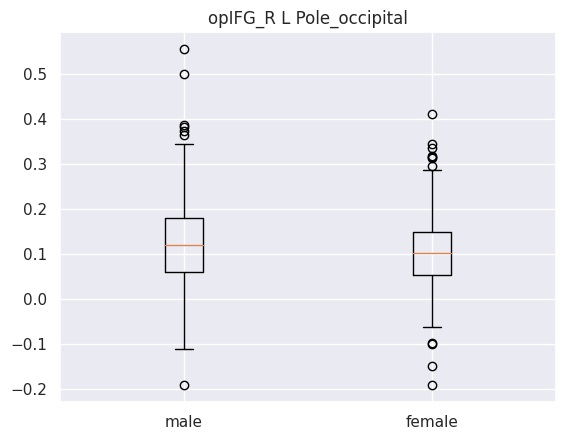

Ttest_indResult(statistic=1.9668569199465695, pvalue=0.049822028600582956)
male mean : 0.1226511061215
male std : 0.10336637927130211
female mean : 0.10500797782699114
female std : 0.08498185574097446


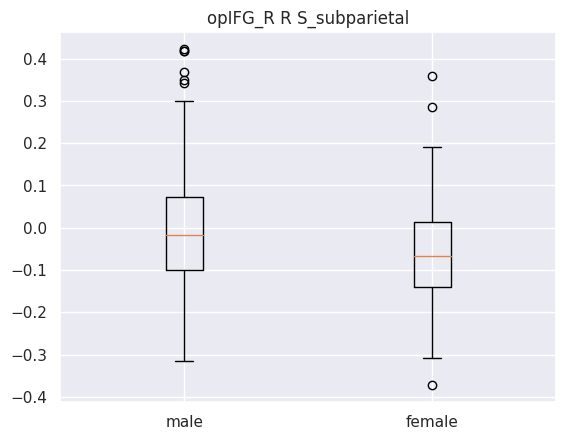

Ttest_indResult(statistic=4.342181044945235, pvalue=1.749268283550659e-05)
male mean : -0.008883466066818179
male std : 0.14428559820039927
female mean : -0.06175231570632744
female std : 0.11046401972822666


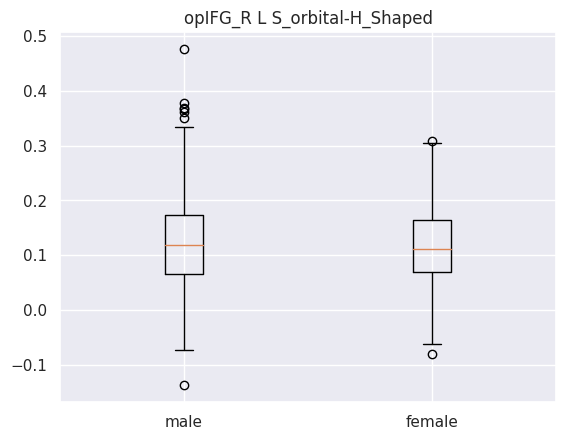

Ttest_indResult(statistic=0.8561324777791736, pvalue=0.39238630056013113)
male mean : 0.12343299978045455
male std : 0.08958678153626323
female mean : 0.11666919567345133
female std : 0.07653337463165284


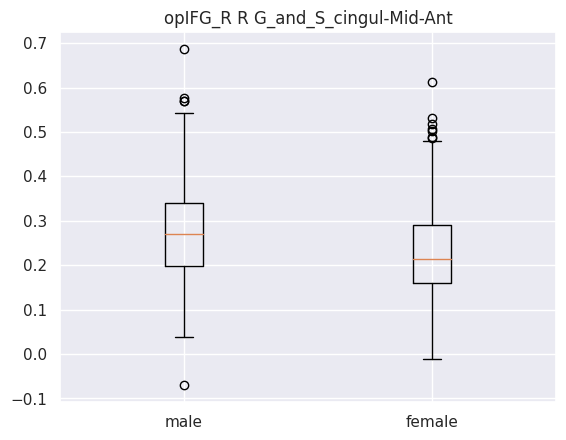

Ttest_indResult(statistic=3.964127034948002, pvalue=8.583233085828756e-05)
male mean : 0.2759169506818182
male std : 0.11781973016961253
female mean : 0.2327772969358407
female std : 0.1114656795348218


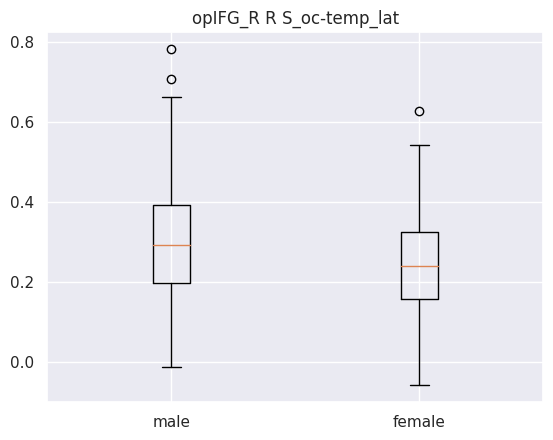

Ttest_indResult(statistic=4.97547687161809, pvalue=9.324034541529675e-07)
male mean : 0.30454724075
male std : 0.14300093870348446
female mean : 0.24131148349911505
female std : 0.12438290112734252


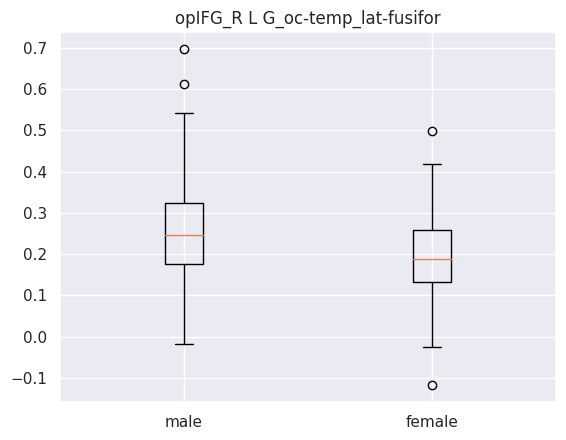

Ttest_indResult(statistic=5.192733430788187, pvalue=3.162104238851161e-07)
male mean : 0.24746643591363637
male std : 0.1114361981429399
female mean : 0.1962682065265487
female std : 0.095928572655737


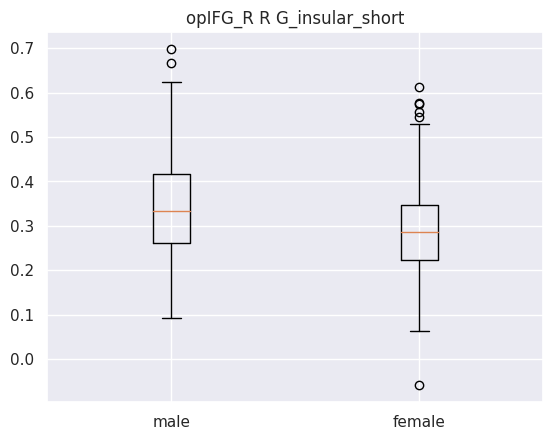

Ttest_indResult(statistic=4.5606645152083, pvalue=6.6049251869165826e-06)
male mean : 0.34029636559545456
male std : 0.11365052713646152
female mean : 0.2927324357035398
female std : 0.10605668848768768


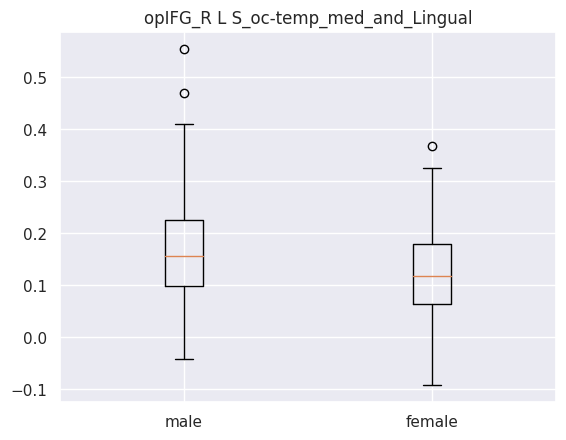

Ttest_indResult(statistic=4.9683687670111105, pvalue=9.65358806851133e-07)
male mean : 0.16568285368454544
male std : 0.09795658686725976
female mean : 0.12266675558539823
female std : 0.08412303322404859
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [28]:
rois = ["opIFG_R"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_opIFG_R)
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
sensitivity = data_results["confusion_matrix"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))
bestRegion(ROIs, data, df_boot)


     coefficient    seed                      labels
125     0.263092  pITG_L               R S_front_inf
26      0.230662  pITG_L            L G_parietal_sup
9       0.194183  pITG_L     L G_cingul-Post-ventral
75      0.170773  pITG_L     R G_and_S_occipital_inf
20      0.158580  pITG_L     L G_oc-temp_lat-fusifor
47      0.155613  pITG_L     L S_circular_insula_inf
126     0.155345  pITG_L            R S_front_middle
4       0.155006  pITG_L  L G_and_S_transv_frontopol
41      0.154047  pITG_L            L Pole_occipital
73      0.153739  pITG_L     L S_temporal_transverse
The mean accuracy : 0.8279944444444445
The standard deviation of the accuracy : 0.041527649200841454
The lower boundry of the confidance interval of the accuracy : 0.7466002520107953
The upper boundry of the confidance interval of the accuracy : 0.9093886368780937
Mean sensitivity : 0.8296900368654747 Std sensitivity : 0.05038282818663172
Mean specificity : 0.8311883355552622 Std specificity : 0.05179117979679938


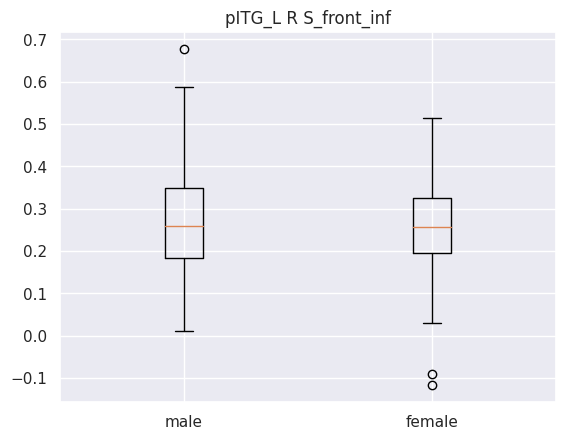

Ttest_indResult(statistic=1.0020328934125462, pvalue=0.31687348431400925)
male mean : 0.2700681785363636
male std : 0.11105772730043446
female mean : 0.25973832161504423
female std : 0.10615524639315872


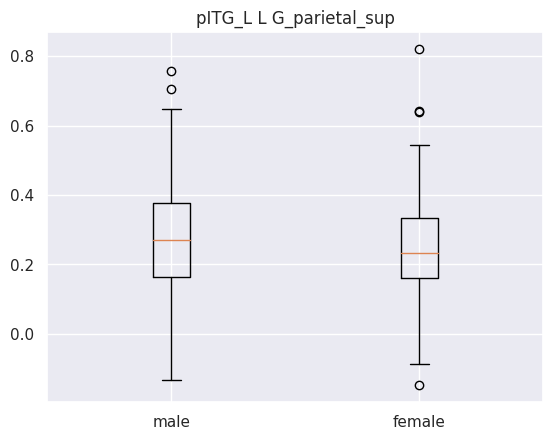

Ttest_indResult(statistic=1.932579843967068, pvalue=0.05392366198499659)
male mean : 0.2742340569533182
male std : 0.16088494195816322
female mean : 0.2469608636460177
female std : 0.13572558594984654


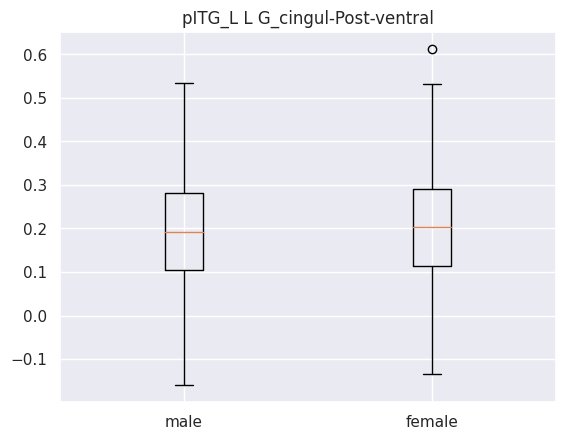

Ttest_indResult(statistic=-0.8502284729847315, pvalue=0.3956563221847449)
male mean : 0.19532825054954547
male std : 0.12405214793600829
female mean : 0.2054311569070796
female std : 0.12626706102176716


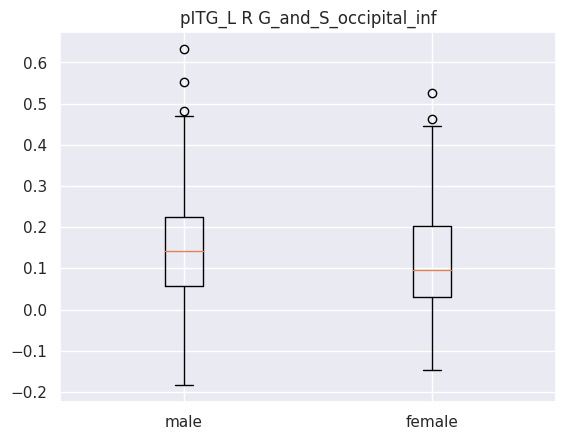

Ttest_indResult(statistic=2.1181886492106354, pvalue=0.03471405998766398)
male mean : 0.14558922257772727
male std : 0.1311116449490574
female mean : 0.11931503520522121
female std : 0.13024516583608292


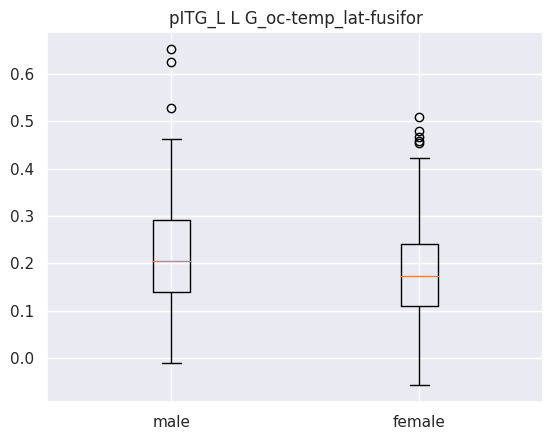

Ttest_indResult(statistic=2.9177266272120463, pvalue=0.0037049025784669063)
male mean : 0.2166043530454545
male std : 0.10970491808955896
female mean : 0.18723372998539822
female std : 0.10235689928590931


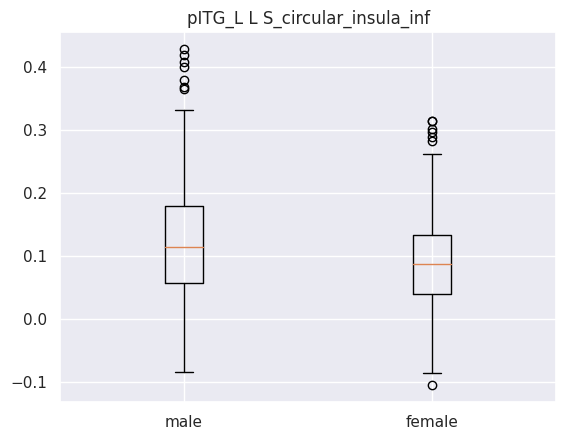

Ttest_indResult(statistic=3.9734819180293077, pvalue=8.264017668278905e-05)
male mean : 0.12536593451390907
male std : 0.09488172282108827
female mean : 0.09301565086106195
female std : 0.07585327208955041


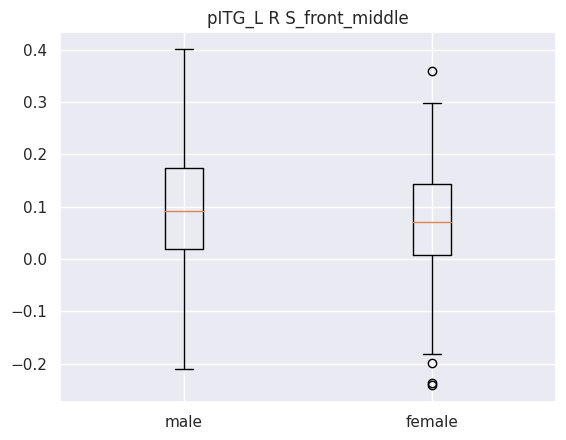

Ttest_indResult(statistic=2.262227860903967, pvalue=0.024165930044473365)
male mean : 0.09672683969472727
male std : 0.10691554436745918
female mean : 0.07428678904690267
female std : 0.10209048708783634


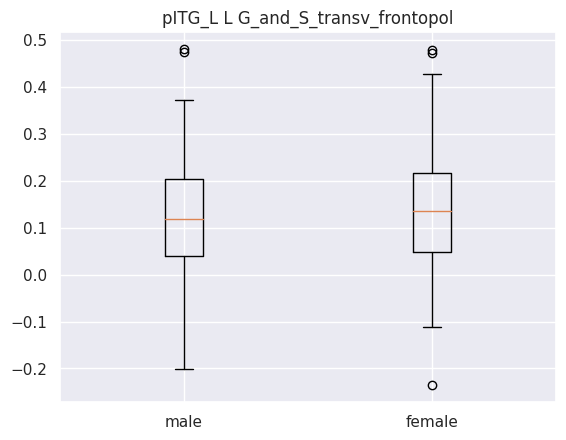

Ttest_indResult(statistic=-1.162423120542947, pvalue=0.24568805822769893)
male mean : 0.12402863729863638
male std : 0.11615416814273921
female mean : 0.13712417481902656
female std : 0.12109015309239457


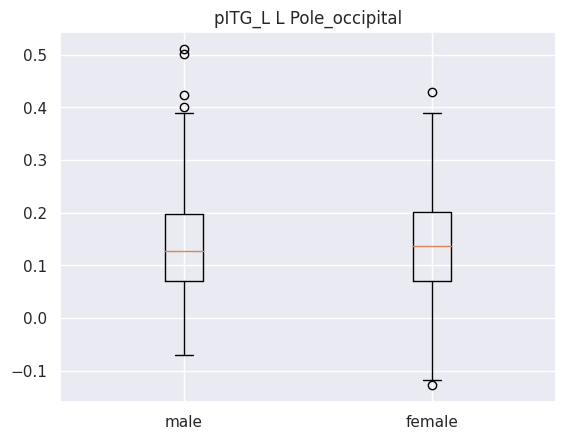

Ttest_indResult(statistic=0.12064913567187839, pvalue=0.9040235258199408)
male mean : 0.14238426120045453
male std : 0.10132866936785162
female mean : 0.14123193651615043
female std : 0.09992003369997071


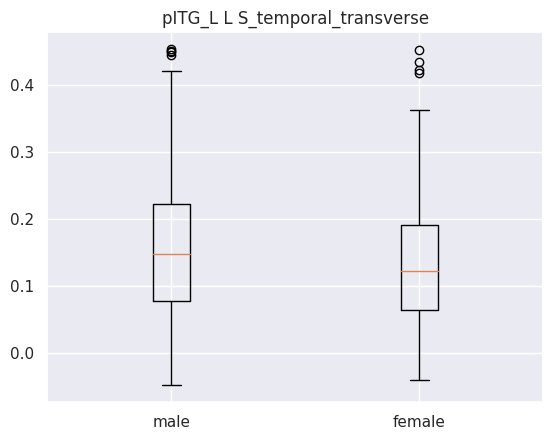

Ttest_indResult(statistic=2.5571750426222266, pvalue=0.010883989566106632)
male mean : 0.1583446232454545
male std : 0.10578124515424395
female mean : 0.1342784206256637
female std : 0.09222667259385757
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [29]:
rois = ["pITG_L"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_pITG_L)
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
sensitivity = data_results["confusion_matrix"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))
bestRegion(ROIs, data, df_boot)


     coefficient    seed                     labels
20      0.325124  pITG_R    L G_oc-temp_lat-fusifor
125     0.227912  pITG_R              R S_front_inf
91      0.222136  pITG_R          R G_insular_short
84      0.210250  pITG_R                 R G_cuneus
90      0.200715  pITG_R  R G_Ins_lg_and_S_cent_ins
83      0.162059  pITG_R    R G_cingul-Post-ventral
37      0.160284  pITG_R        L G_temporal_middle
32      0.155782  pITG_R    L G_temp_sup-G_T_transv
79      0.135785  pITG_R       R G_and_S_cingul-Ant
106     0.133638  pITG_R    R G_temp_sup-G_T_transv
The mean accuracy : 0.7835500000000002
The standard deviation of the accuracy : 0.04524176447803976
The lower boundry of the confidance interval of the accuracy : 0.6948761416230422
The upper boundry of the confidance interval of the accuracy : 0.8722238583769581
Mean sensitivity : 0.7799399250177648 Std sensitivity : 0.05190106735419084
Mean specificity : 0.7925994344704413 Std specificity : 0.05586484450610664


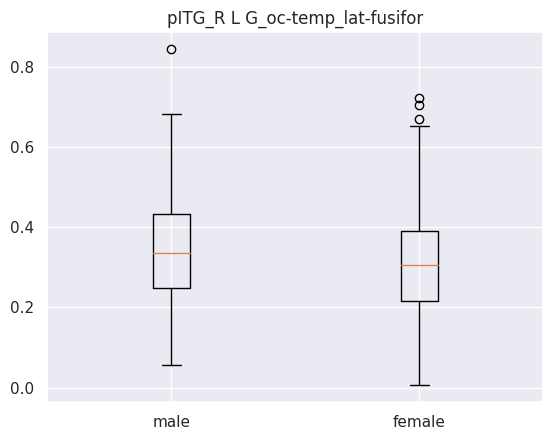

Ttest_indResult(statistic=2.207601503782289, pvalue=0.027782692747375555)
male mean : 0.3381230503772727
male std : 0.13608853787659086
female mean : 0.31070127244911505
female std : 0.1255552430118421


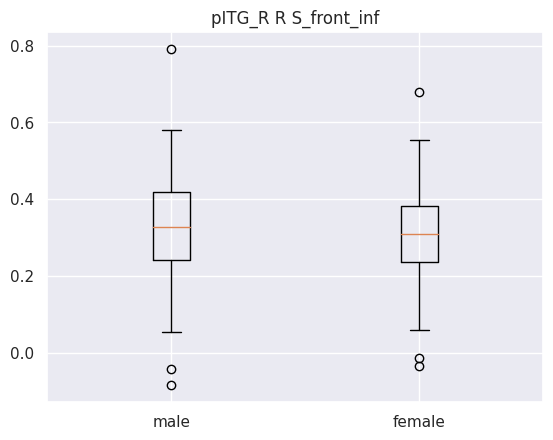

Ttest_indResult(statistic=2.13538486489198, pvalue=0.03327622102378573)
male mean : 0.3298146207409091
male std : 0.12123145108487972
female mean : 0.3068887235929204
female std : 0.1045843071513845


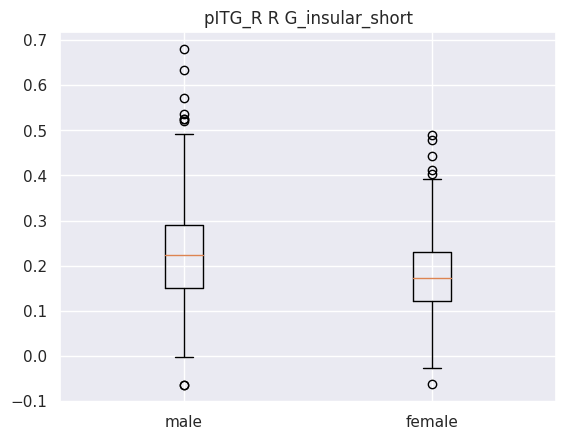

Ttest_indResult(statistic=5.112160421970684, pvalue=4.743233770538839e-07)
male mean : 0.2313763518045455
male std : 0.12096734073549982
female mean : 0.1792633135699115
female std : 0.09227387552085549


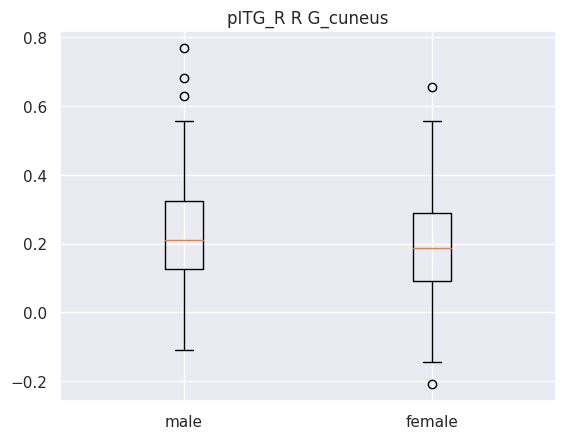

Ttest_indResult(statistic=2.518734910789549, pvalue=0.012128078944136934)
male mean : 0.22664096681499996
male std : 0.14532160156704602
female mean : 0.192063495079646
female std : 0.14393677903416816


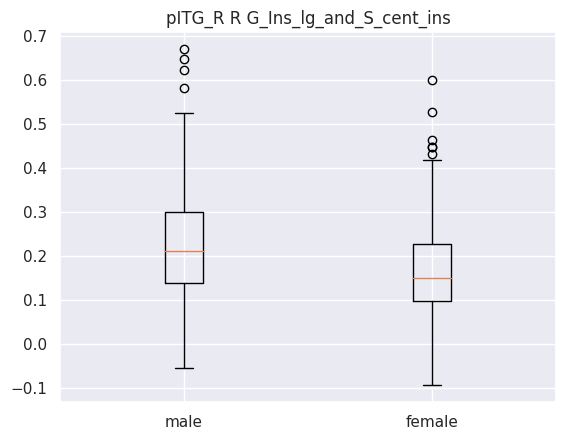

Ttest_indResult(statistic=4.79480473729521, pvalue=2.2257592661098134e-06)
male mean : 0.22383738302749998
male std : 0.12979418493858147
female mean : 0.16870598920176993
female std : 0.11205330730614246


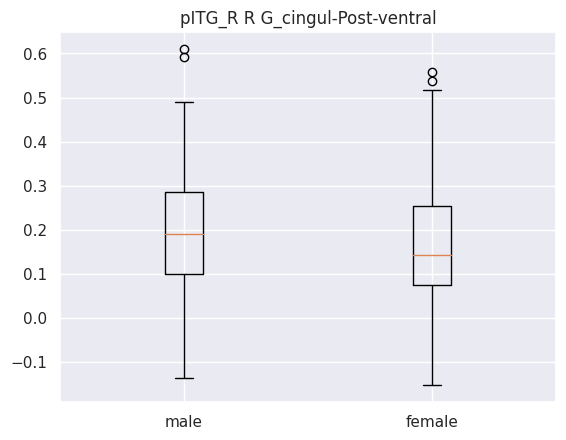

Ttest_indResult(statistic=2.380140291533847, pvalue=0.01772726625126871)
male mean : 0.19296064746681815
male std : 0.1346758980066957
female mean : 0.16264045314955752
female std : 0.13373455574896778


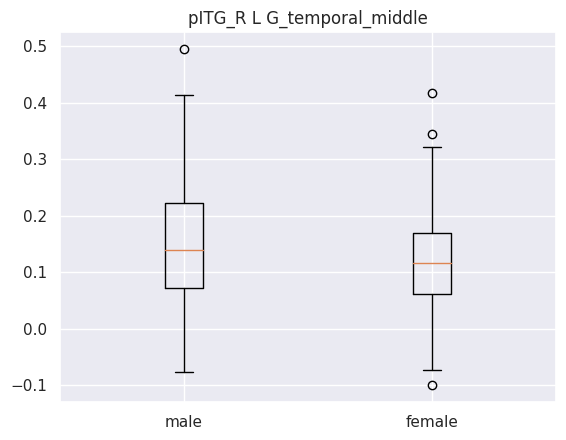

Ttest_indResult(statistic=3.595598385671502, pvalue=0.00035995732255156147)
male mean : 0.1529786022181818
male std : 0.10755245282266605
female mean : 0.12025123656144249
female std : 0.08297170332847886


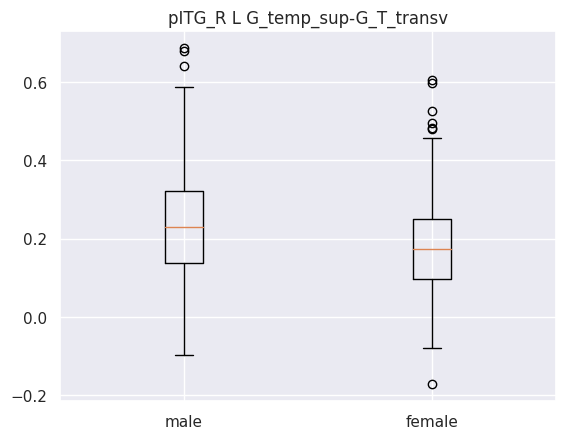

Ttest_indResult(statistic=4.524709164152146, pvalue=7.774373381230067e-06)
male mean : 0.2398444346181818
male std : 0.1385572380212938
female mean : 0.1833660085743363
female std : 0.12423831506745996


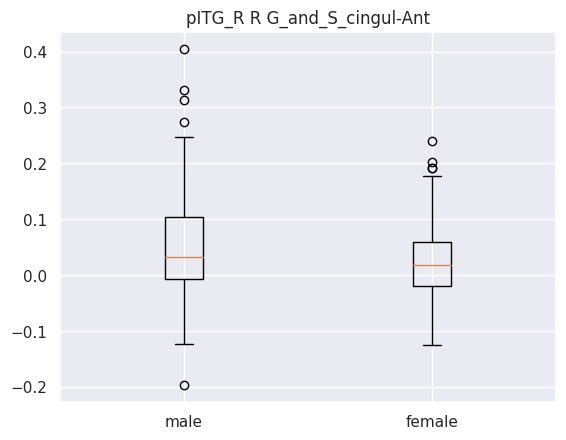

Ttest_indResult(statistic=3.3660004581303236, pvalue=0.0008289579997513635)
male mean : 0.04933961785272728
male std : 0.08588680640744353
female mean : 0.025453949248053095
female std : 0.062030754045511526


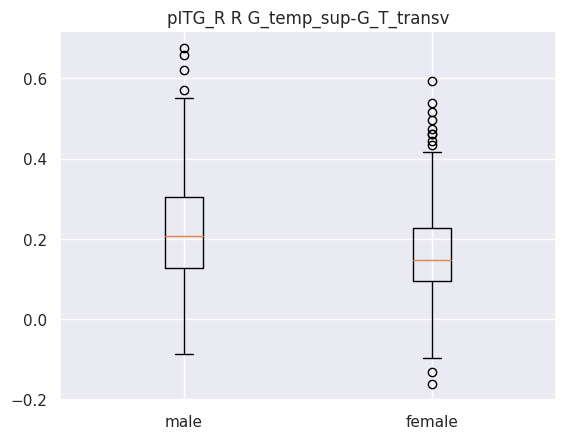

Ttest_indResult(statistic=4.672234192485094, pvalue=3.955675949020428e-06)
male mean : 0.22456284625045456
male std : 0.1360627966964213
female mean : 0.16773981286283188
female std : 0.11988681519631378
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [30]:
rois = ["pITG_R"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_pITG_R)
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
sensitivity = data_results["confusion_matrix"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))
bestRegion(ROIs, data, df_boot)


     coefficient          seed                       labels
60      0.263555  planumtemp_L  L S_oc-temp_med_and_Lingual
108     0.216431  planumtemp_L      R G_temp_sup-Plan_polar
66      0.185443  planumtemp_L              L S_postcentral
99      0.170339  planumtemp_L      R G_pariet_inf-Supramar
124     0.159182  planumtemp_L       R S_collat_transv_post
84      0.147154  planumtemp_L                   R G_cuneus
20      0.145653  planumtemp_L      L G_oc-temp_lat-fusifor
41      0.140610  planumtemp_L             L Pole_occipital
94      0.140199  planumtemp_L      R G_oc-temp_lat-fusifor
23      0.136717  planumtemp_L                  L G_orbital
The mean accuracy : 0.7805166666666667
The standard deviation of the accuracy : 0.046456321912943264
The lower boundry of the confidance interval of the accuracy : 0.6894622757172979
The upper boundry of the confidance interval of the accuracy : 0.8715710576160356
Mean sensitivity : 0.7784407463642444 Std sensitivity : 0.05319582634731609

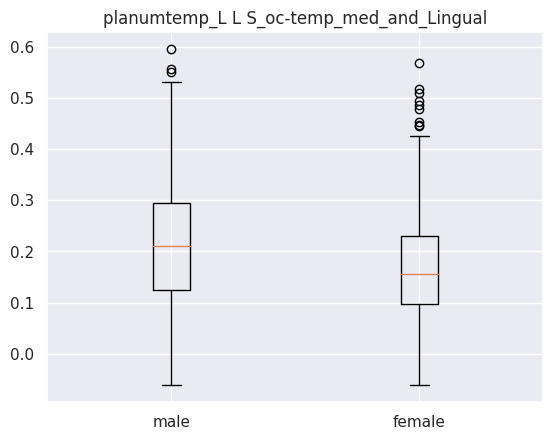

Ttest_indResult(statistic=3.568169946152254, pvalue=0.00039862792533886367)
male mean : 0.21577463173863637
male std : 0.11920041520251866
female mean : 0.17618120696902656
female std : 0.11460830695377548


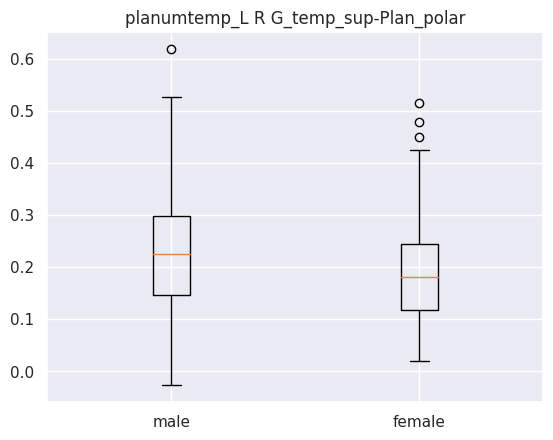

Ttest_indResult(statistic=4.42054857038295, pvalue=1.2391524231536645e-05)
male mean : 0.231116042775
male std : 0.10743291511827939
female mean : 0.18849037465929203
female std : 0.09554310246985663


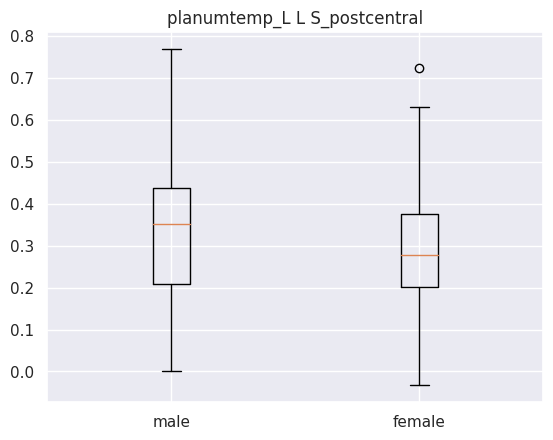

Ttest_indResult(statistic=3.3982524664602822, pvalue=0.0007393236091411032)
male mean : 0.33581050932090906
male std : 0.15519364606058975
female mean : 0.28810105651946905
female std : 0.14043859969892733


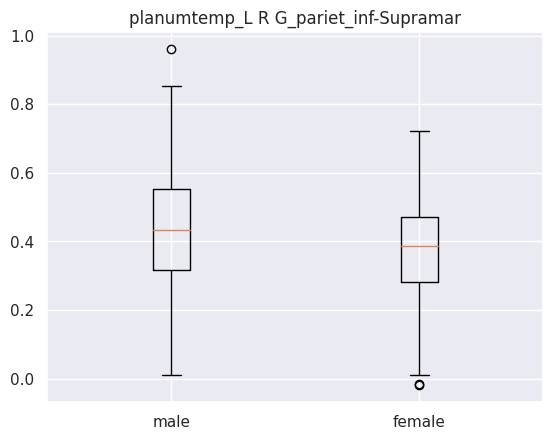

Ttest_indResult(statistic=3.40846885515764, pvalue=0.0007128702515509998)
male mean : 0.4307228165545455
male std : 0.17295636548930826
female mean : 0.3790449651415929
female std : 0.14569081362589828


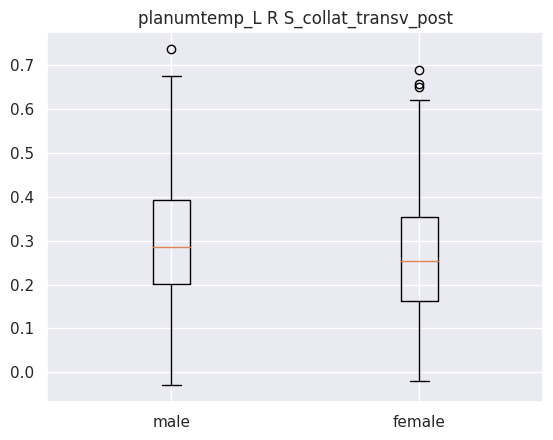

Ttest_indResult(statistic=2.721180273283202, pvalue=0.006760590380353587)
male mean : 0.2982221393318182
male std : 0.14752263554395537
female mean : 0.26174931810398233
female std : 0.13476027522052467


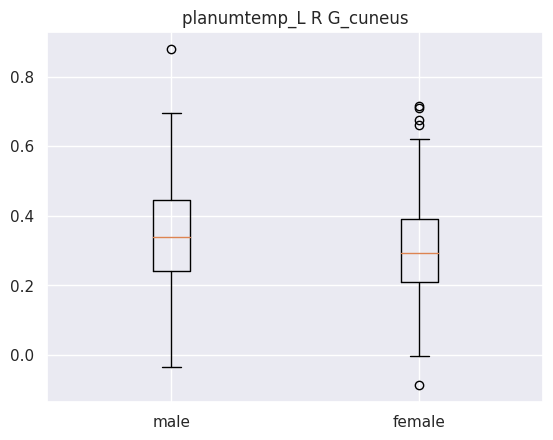

Ttest_indResult(statistic=2.779045702868326, pvalue=0.005683247460462339)
male mean : 0.3442871131318182
male std : 0.15448762649047768
female mean : 0.30501909665823007
female std : 0.1431606319240156


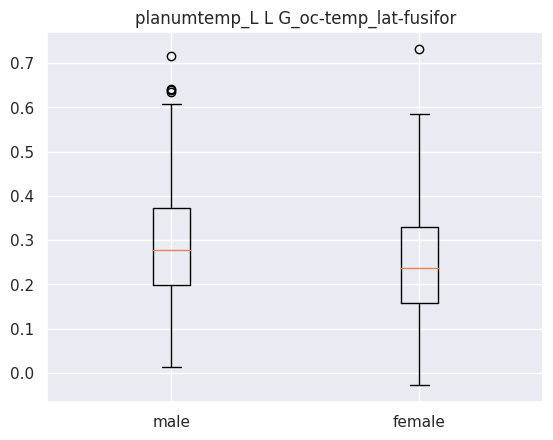

Ttest_indResult(statistic=3.7622305190657452, pvalue=0.0001909807101357603)
male mean : 0.2942304806272728
male std : 0.13292350850751689
female mean : 0.24918162700884958
female std : 0.119170924743853


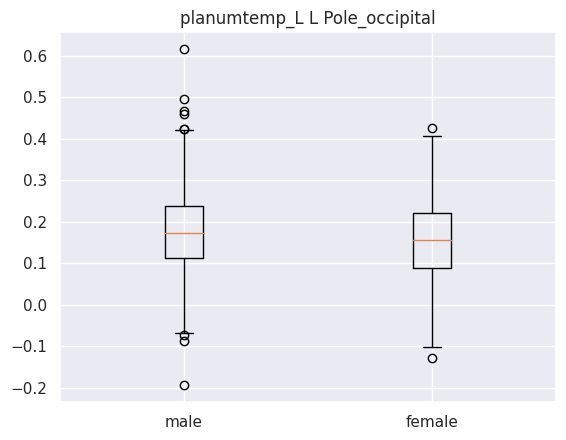

Ttest_indResult(statistic=2.8966477425742636, pvalue=0.003958114551412912)
male mean : 0.18402248281818182
male std : 0.11334589412846845
female mean : 0.1545630971402655
female std : 0.10073153762994376


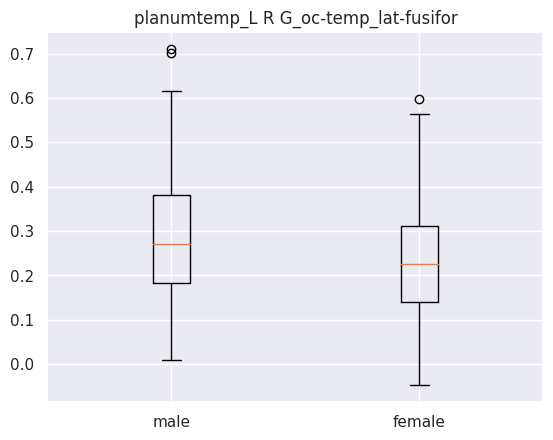

Ttest_indResult(statistic=4.055614333449546, pvalue=5.9060276690219876e-05)
male mean : 0.28515832146363634
male std : 0.13827308909461045
female mean : 0.23584467546176993
female std : 0.11734248121055887


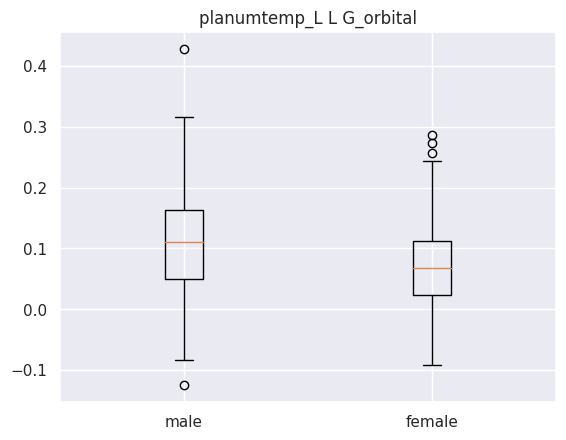

Ttest_indResult(statistic=5.437576085428286, pvalue=8.933485701927108e-08)
male mean : 0.11258804022227273
male std : 0.08233688253116413
female mean : 0.07398011917654868
female std : 0.06664634866953
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [31]:
rois = ["planumtemp_L"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_planumtemp_L)
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
sensitivity = data_results["confusion_matrix"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))
bestRegion(ROIs, data, df_boot)


     coefficient          seed                       labels
121     0.242715  planumtemp_R      R S_circular_insula_inf
108     0.241772  planumtemp_R      R G_temp_sup-Plan_polar
60      0.222155  planumtemp_R  L S_oc-temp_med_and_Lingual
72      0.195784  planumtemp_R             L S_temporal_sup
47      0.194629  planumtemp_R      L S_circular_insula_inf
139     0.176589  planumtemp_R             R S_pericallosal
41      0.167393  planumtemp_R             L Pole_occipital
145     0.166382  planumtemp_R             R S_temporal_inf
43      0.163936  planumtemp_R                L S_calcarine
78      0.158793  planumtemp_R   R G_and_S_transv_frontopol
The mean accuracy : 0.7692955555555556
The standard deviation of the accuracy : 0.046014517891532054
The lower boundry of the confidance interval of the accuracy : 0.6791071004881528
The upper boundry of the confidance interval of the accuracy : 0.8594840106229584
Mean sensitivity : 0.7618198738110258 Std sensitivity : 0.05193751033759093

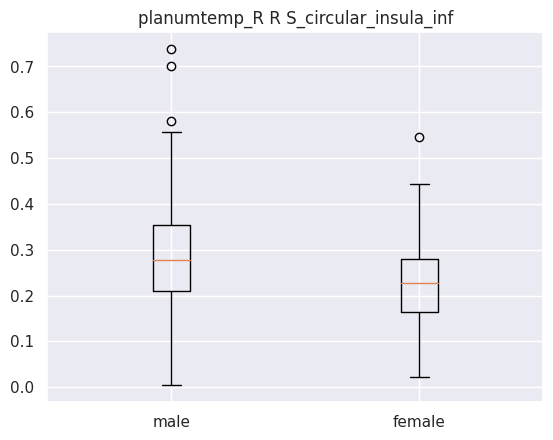

Ttest_indResult(statistic=5.673022197146965, pvalue=2.5335329424316272e-08)
male mean : 0.28464964156636363
male std : 0.11115068945139177
female mean : 0.22998609894690267
female std : 0.0911493316406924


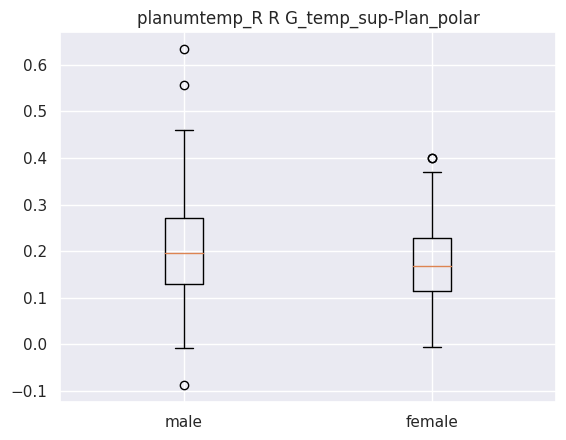

Ttest_indResult(statistic=3.411258353986623, pvalue=0.0007058022781917119)
male mean : 0.20694257242727274
male std : 0.10325686123318684
female mean : 0.17643976180088497
female std : 0.08445412241365245


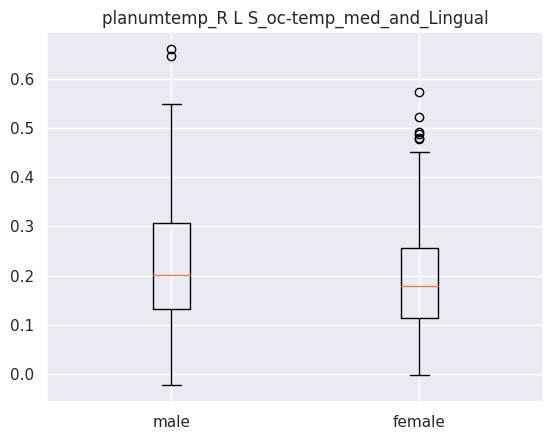

Ttest_indResult(statistic=3.1406026539933913, pvalue=0.001798634977217268)
male mean : 0.22554338915745453
male std : 0.12167229969009292
female mean : 0.19155830762477874
female std : 0.10599522757213717


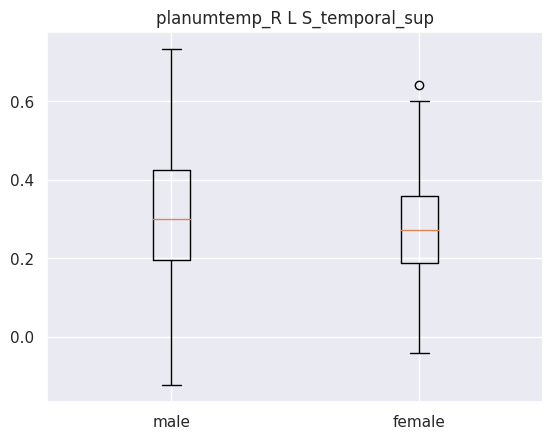

Ttest_indResult(statistic=1.8695975920657857, pvalue=0.06219767425438533)
male mean : 0.3054438005095454
male std : 0.16618568479496404
female mean : 0.2788564426159292
female std : 0.13193744183702244


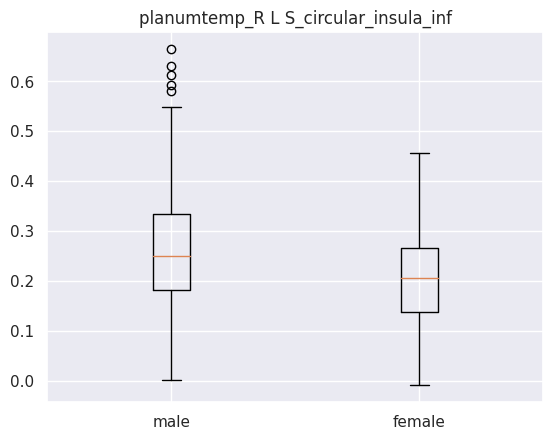

Ttest_indResult(statistic=5.536682319675686, pvalue=5.283850273823166e-08)
male mean : 0.26314078573
male std : 0.11589033220243106
female mean : 0.20795944492035398
female std : 0.09317104682445226


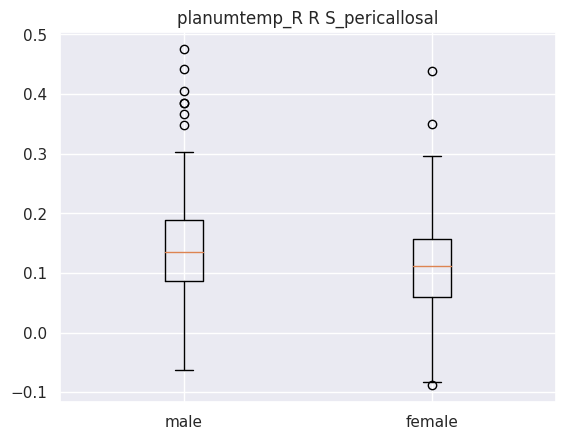

Ttest_indResult(statistic=4.099512012037479, pvalue=4.9237855822734976e-05)
male mean : 0.14388453827454545
male std : 0.08547370646470348
female mean : 0.11232528979557523
female std : 0.07660129004358317


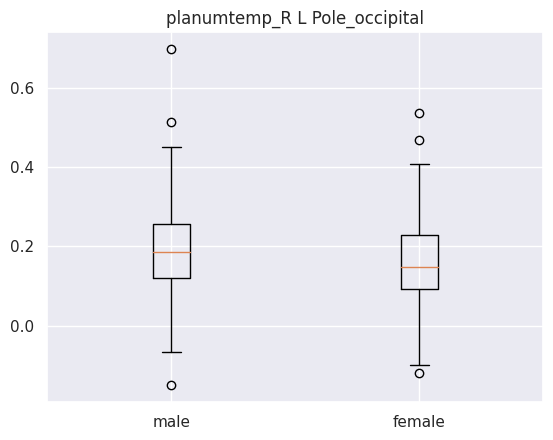

Ttest_indResult(statistic=3.0338050141925272, pvalue=0.002556601060476057)
male mean : 0.19206652156681817
male std : 0.1129203389533213
female mean : 0.16056218522699112
female std : 0.10585433102955759


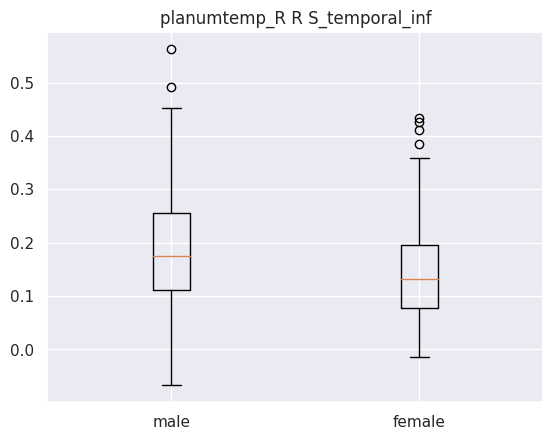

Ttest_indResult(statistic=5.093445831834155, pvalue=5.207770662763331e-07)
male mean : 0.19109833336272727
male std : 0.11146610197202778
female mean : 0.14283558278274336
female std : 0.08700087808711052


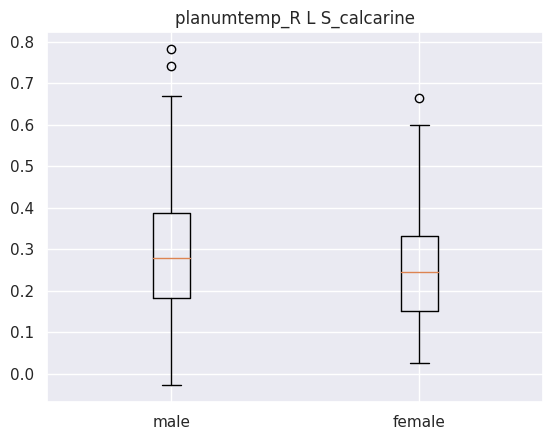

Ttest_indResult(statistic=3.077226310995013, pvalue=0.0022186529221928436)
male mean : 0.29213731421531824
male std : 0.1534333544769532
female mean : 0.2511115497699115
female std : 0.12653653671097487


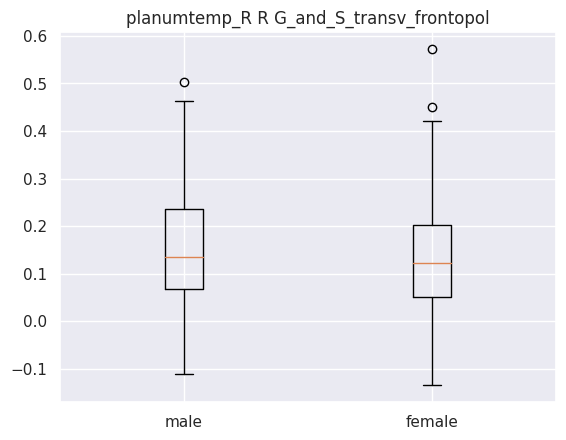

Ttest_indResult(statistic=1.6197574048200072, pvalue=0.10599440842770202)
male mean : 0.14979874731818182
male std : 0.12757857054837393
female mean : 0.13102783685654867
female std : 0.11648592660505695
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [32]:
rois = ["planumtemp_R"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_planumtemp_R)
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
sensitivity = data_results["confusion_matrix"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))
bestRegion(ROIs, data, df_boot)


     coefficient     seed                       labels
53      0.134427  opIFG_L                L S_front_sup
422     0.115411   aMTG_L             R S_front_middle
98      0.114153  opIFG_L       R G_pariet_inf-Angular
421     0.113381   aMTG_L                R S_front_inf
431     0.101514   aMTG_L          R S_orbital_lateral
351     0.097606   aMTG_L  L S_intrapariet_and_P_trans
322     0.095708   aMTG_L             L G_parietal_sup
300     0.091746   aMTG_L   L G_and_S_transv_frontopol
4       0.091739  opIFG_L   L G_and_S_transv_frontopol
301     0.091233   aMTG_L         L G_and_S_cingul-Ant
The mean accuracy : 0.9113255555555557
The standard deviation of the accuracy : 0.03178851316333941
The lower boundry of the confidance interval of the accuracy : 0.8490200697554104
The upper boundry of the confidance interval of the accuracy : 0.973631041355701
Mean sensitivity : 0.9129839705908854 Std sensitivity : 0.04135744172480987
Mean specificity : 0.9132411826811864 Std specificity : 

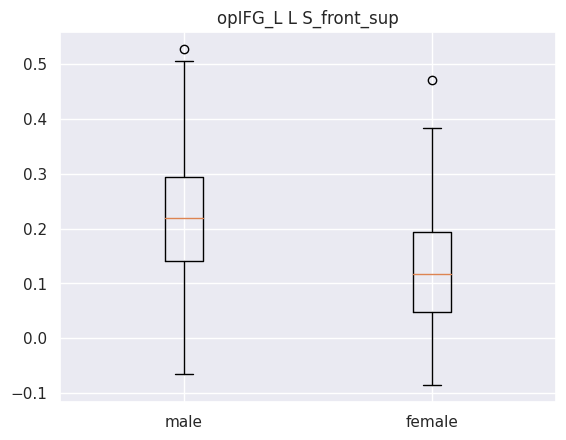

Ttest_indResult(statistic=9.514226955534408, pvalue=1.1745948061525577e-19)
male mean : 0.22193633239999996
male std : 0.11249626112199279
female mean : 0.12588911007571682
female std : 0.10000267392277586


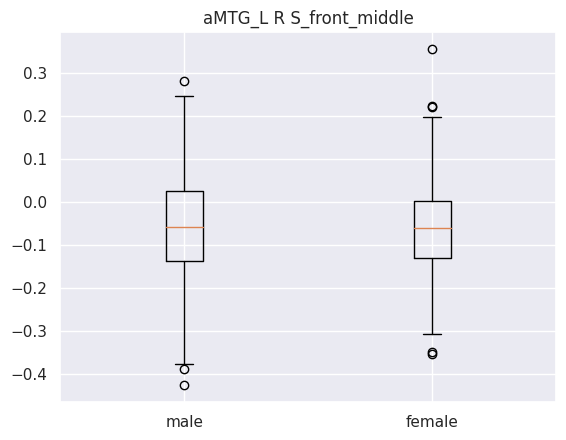

Ttest_indResult(statistic=-0.1288149656454001, pvalue=0.8975623921747511)
male mean : -0.06136301187972727
male std : 0.12937809167247663
female mean : -0.05989662055278762
female std : 0.10994256393017068


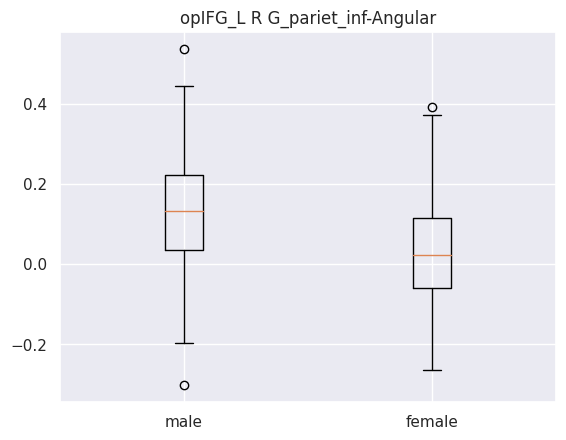

Ttest_indResult(statistic=7.24780487230096, pvalue=1.8918423767886693e-12)
male mean : 0.12424016548681818
male std : 0.13424300726761648
female mean : 0.03453558849026549
female std : 0.1265180924203619


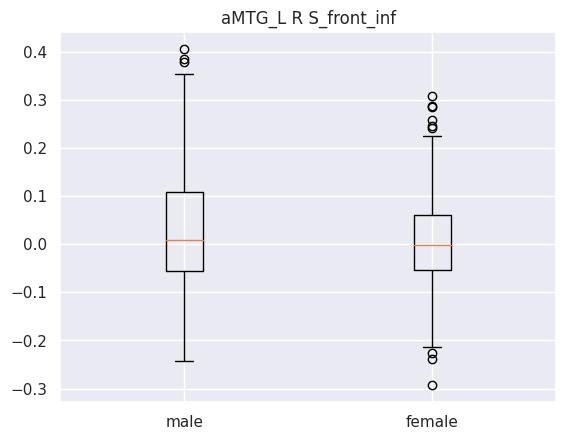

Ttest_indResult(statistic=1.9193910426129293, pvalue=0.055575465964615225)
male mean : 0.025140619681999998
male std : 0.12506768589238804
female mean : 0.004515161334216815
female std : 0.10031688528841444


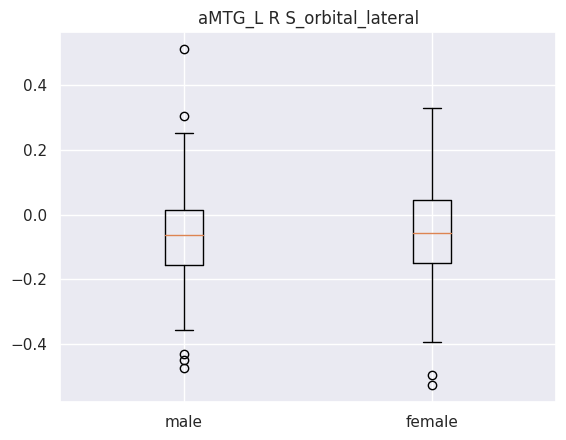

Ttest_indResult(statistic=-0.9595545169231156, pvalue=0.337801699063937)
male mean : -0.06771869820213636
male std : 0.14263363470452184
female mean : -0.05464536117588496
female std : 0.14439482773638504


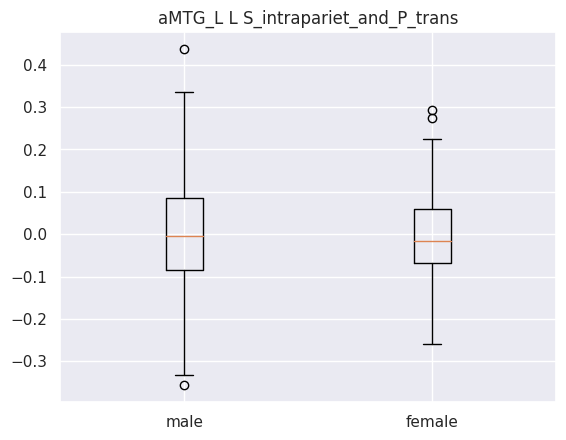

Ttest_indResult(statistic=1.0441439448576817, pvalue=0.29698694253266955)
male mean : 0.004413317491818183
male std : 0.12667357592144304
female mean : -0.006823133387610619
female std : 0.09870796418027704


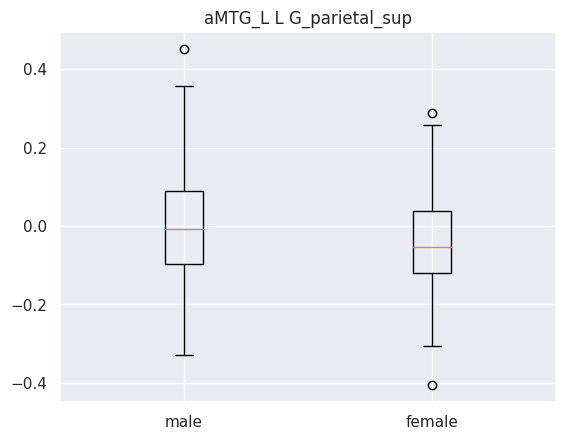

Ttest_indResult(statistic=3.4850474873752884, pvalue=0.0005409444654669903)
male mean : 0.003152544490909089
male std : 0.1486536903265774
female mean : -0.040841305016592916
female std : 0.11571389999440254


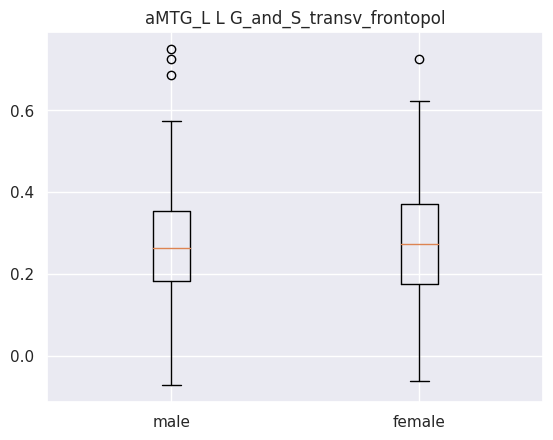

Ttest_indResult(statistic=-0.13187058202998522, pvalue=0.8951463929773453)
male mean : 0.2736758421272727
male std : 0.13376710268148156
female mean : 0.2753599954026549
female std : 0.13529084478562486


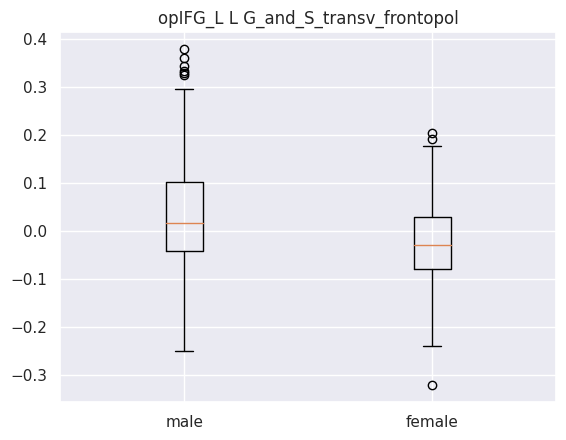

Ttest_indResult(statistic=5.033838587916691, pvalue=6.999625036984745e-07)
male mean : 0.025597121174999998
male std : 0.11515068596736391
female mean : -0.023709215497699117
female std : 0.09002691208082556


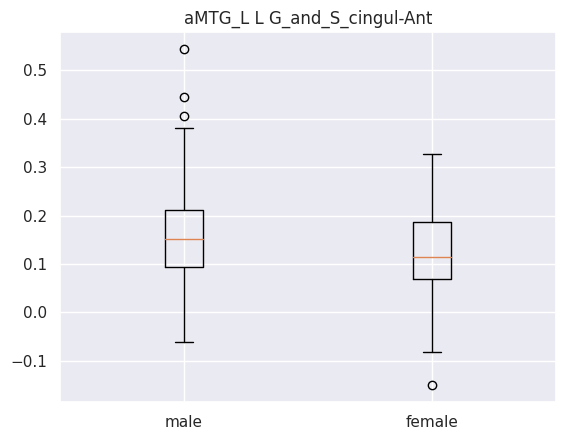

Ttest_indResult(statistic=4.307060944860257, pvalue=2.038136442014065e-05)
male mean : 0.16099100311954548
male std : 0.0980609784038807
female mean : 0.1242215932681416
female std : 0.08124741946330903
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [33]:
rois = ["opIFG_L", "planumtemp_L", "aMTG_L", "pITG_L"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_all_left)
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
sensitivity = data_results["confusion_matrix"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))
bestRegion(ROIs, data, df_boot)


     coefficient          seed                       labels
421     0.143093        aMTG_R                R S_front_inf
53      0.125329       opIFG_R                L S_front_sup
66      0.118382       opIFG_R              L S_postcentral
55      0.115428       opIFG_R  L S_intrapariet_and_P_trans
135     0.113675       opIFG_R          R S_orbital_lateral
316     0.108906        aMTG_R      L G_oc-temp_lat-fusifor
281     0.096251  planumtemp_R              R S_oc-temp_lat
362     0.092414        aMTG_R              L S_postcentral
386     0.089357        aMTG_R    R G_Ins_lg_and_S_cent_ins
387     0.086029        aMTG_R            R G_insular_short
The mean accuracy : 0.8809966666666669
The standard deviation of the accuracy : 0.03627394723693781
The lower boundry of the confidance interval of the accuracy : 0.8098997300822688
The upper boundry of the confidance interval of the accuracy : 0.952093603251065
Mean sensitivity : 0.8809117231363082 Std sensitivity : 0.046054046466117125


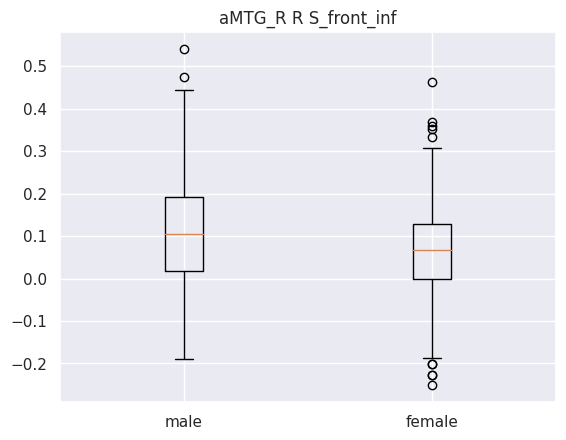

Ttest_indResult(statistic=3.956278857457922, pvalue=8.86001863789618e-05)
male mean : 0.10791621693545454
male std : 0.12931995413969696
female mean : 0.06154310212610619
female std : 0.11751957032303513


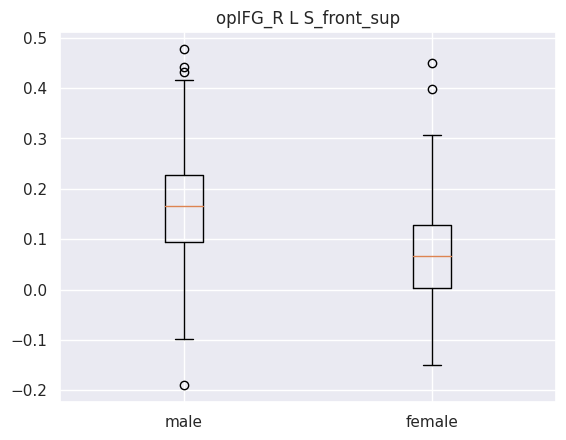

Ttest_indResult(statistic=9.215326889220611, pvalue=1.248160215367442e-18)
male mean : 0.16320744882072724
male std : 0.10965043228920933
female mean : 0.07219020907314161
female std : 0.09828873030252666


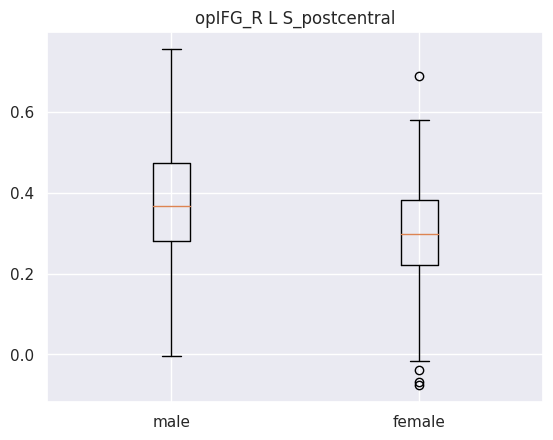

Ttest_indResult(statistic=5.748096942910928, pvalue=1.6798182257112908e-08)
male mean : 0.37275803086818177
male std : 0.13910319518939593
female mean : 0.29995721800884956
female std : 0.12765335683486648


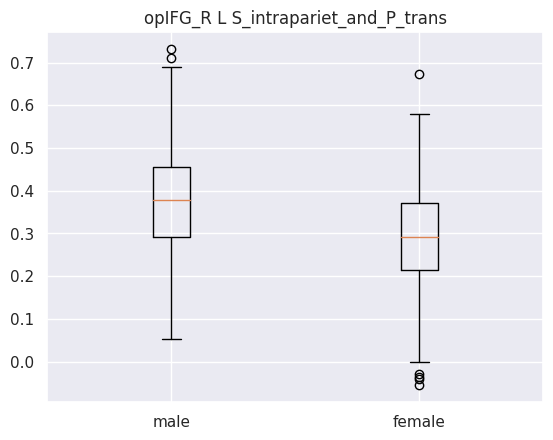

Ttest_indResult(statistic=7.525715474692434, pvalue=2.943978024764579e-13)
male mean : 0.3783558262136364
male std : 0.13092386861978492
female mean : 0.2881963432641593
female std : 0.1214409141686982


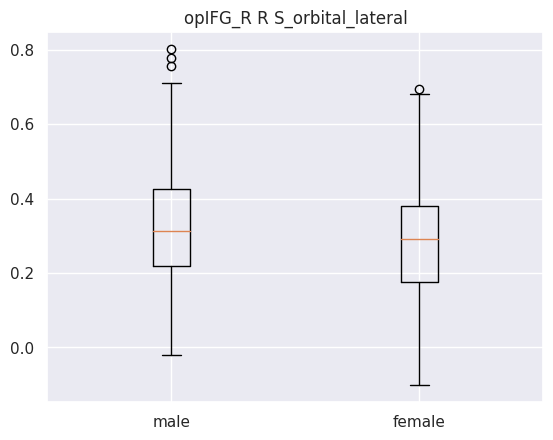

Ttest_indResult(statistic=2.744861835289781, pvalue=0.006299189228159366)
male mean : 0.3271381634947727
male std : 0.15738718014219788
female mean : 0.28616663755176996
female std : 0.15711147119637517


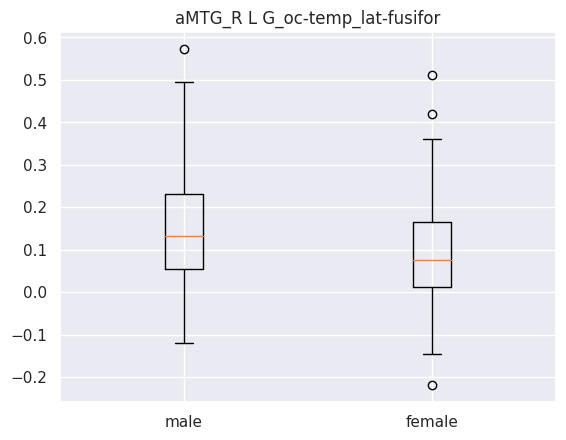

Ttest_indResult(statistic=5.157132505636498, pvalue=3.7849853475325553e-07)
male mean : 0.15163267344727274
male std : 0.13083327172091533
female mean : 0.09148790766993664
female std : 0.11456737640495235


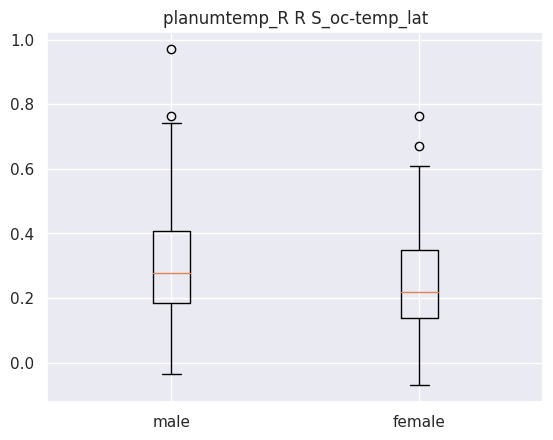

Ttest_indResult(statistic=4.3848505906610145, pvalue=1.4507989080998383e-05)
male mean : 0.30642626261363637
male std : 0.17063263131444123
female mean : 0.24031956101371682
female std : 0.14641438044368835


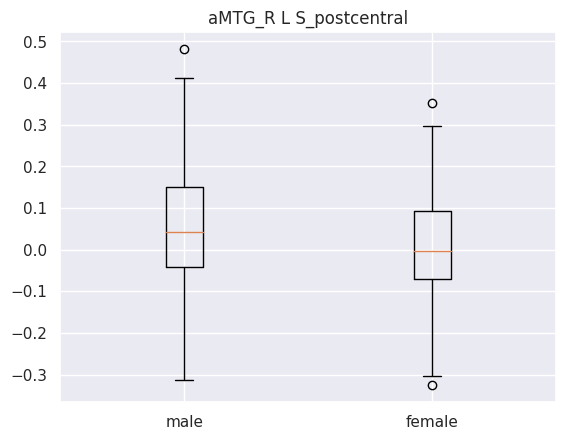

Ttest_indResult(statistic=2.627621292338559, pvalue=0.008896140355824254)
male mean : 0.04901591075681818
male std : 0.13953276104441498
female mean : 0.016055526186592915
female std : 0.12453371759228786


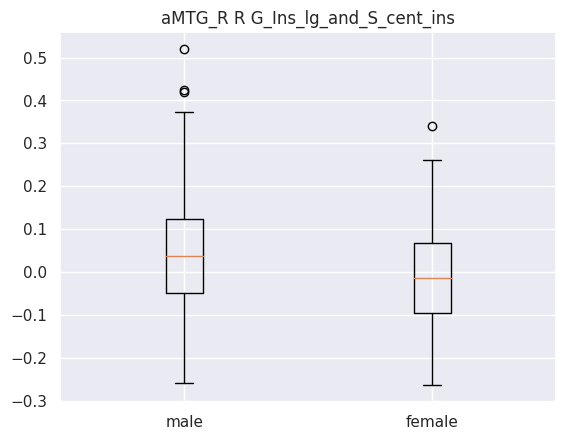

Ttest_indResult(statistic=4.494099754685952, pvalue=8.92418981107013e-06)
male mean : 0.0445266324765
male std : 0.12931193503968358
female mean : -0.007410436407079646
female std : 0.11390051576344988


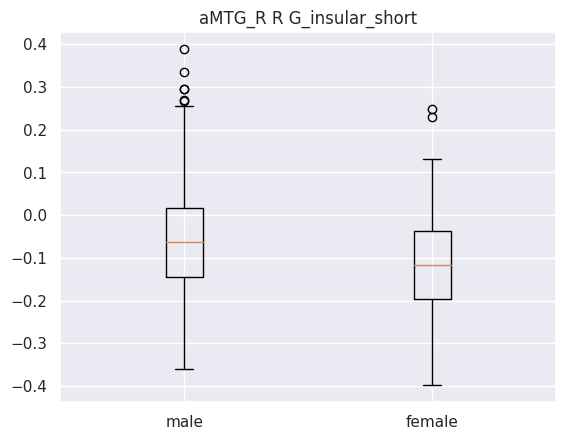

Ttest_indResult(statistic=4.791406408347229, pvalue=2.2619068113837188e-06)
male mean : -0.057874727749363634
male std : 0.131067036894437
female mean : -0.11392378271912831
female std : 0.11509617159718821
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


In [34]:
rois = ["opIFG_R", "planumtemp_R", "aMTG_R", "pITG_R"] # modified to rois of interest
moyenne, scoresZ, pvalue, data_results = compute_results(results_path_all_right)
ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
sensitivity = data_results["confusion_matrix"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
specificity = data_results["confusion_matrix"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))
bestRegion(ROIs, data, df_boot)


# Results wm 02

In [87]:
study_dir = Path('/data/brambati/dataset/HCP/derivatives/training_sex_diff/results_wm_02/LinearSVC/')
results_path_all_seed = study_dir / "seed-all_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_aMTG_L = study_dir / "seed-aMTG_L_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_aMTG_R = study_dir / "seed-aMTG_R_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_opIFG_L = study_dir / "seed-opIFG_L_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_opIFG_R = study_dir / "seed-opIFG_R_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_pITG_L = study_dir / "seed-pITG_L_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_pITG_R = study_dir / "seed-pITG_R_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_planumtemp_L = study_dir / "seed-planumtemp_L_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_planumtemp_R = study_dir / "seed-planumtemp_R_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_all_left = study_dir / "seed-left_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_all_right = study_dir / "seed-right_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
all_results = [results_path_all_seed, results_path_aMTG_L, results_path_aMTG_R, results_path_opIFG_L, results_path_opIFG_R, results_path_pITG_L, results_path_pITG_R, results_path_planumtemp_L, results_path_planumtemp_R, results_path_all_left, results_path_all_right]

In [88]:
# fetching label from destrieux atlas minus two labels not used
atlas_dest = datasets.fetch_atlas_destrieux_2009(legacy_format=False)
label = atlas_dest["labels"].drop([0,42,117]) # correction for the destrieux atlas labels
label = label.reset_index()

-------------------------------------------------------------------------------------------------------
['opIFG_L', 'planumtemp_L', 'aMTG_L', 'pITG_L', 'opIFG_R', 'planumtemp_R', 'aMTG_R', 'pITG_R']
-------------------------------------------------------------------------------------------------------
      coefficient          seed                       labels
98       0.076190       opIFG_L       R G_pariet_inf-Angular
422      0.073980        aMTG_L             R S_front_middle
1013     0.068757        aMTG_R                R S_front_inf
351      0.064106        aMTG_L  L S_intrapariet_and_P_trans
379      0.063116        aMTG_L      R G_cingul-Post-ventral
189      0.059016  planumtemp_L             L Pole_occipital
301      0.058613        aMTG_L         L G_and_S_cingul-Ant
1090     0.057939        pITG_R       L S_interm_prim-Jensen
1094     0.054540        pITG_R            L S_occipital_ant
53       0.052777       opIFG_L                L S_front_sup
The mean accuracy : 0.9056

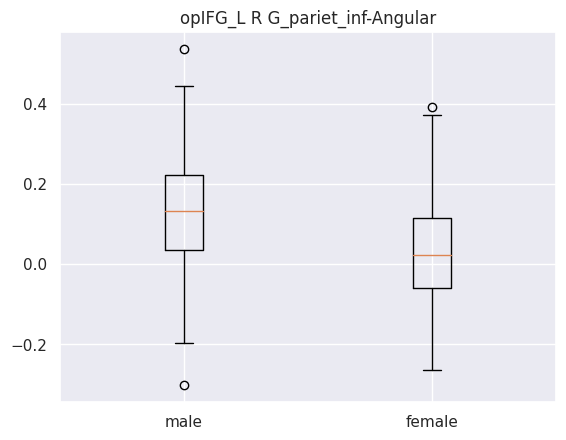

Ttest_indResult(statistic=7.24780487230096, pvalue=1.8918423767886693e-12)
male mean : 0.12424016548681818
male std : 0.13424300726761648
female mean : 0.03453558849026549
female std : 0.1265180924203619


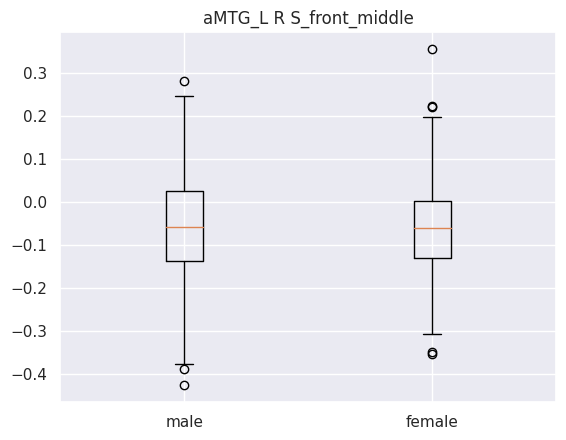

Ttest_indResult(statistic=-0.1288149656454001, pvalue=0.8975623921747511)
male mean : -0.06136301187972727
male std : 0.12937809167247663
female mean : -0.05989662055278762
female std : 0.10994256393017068


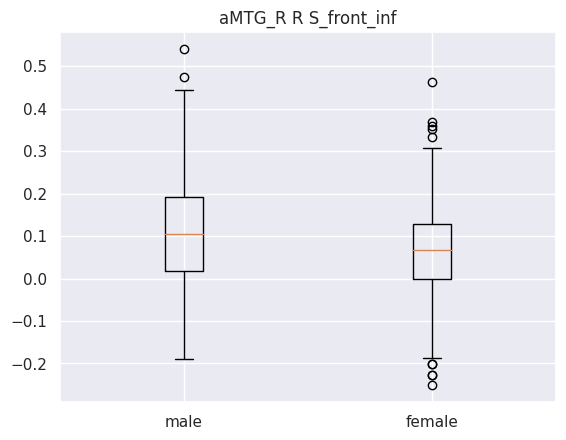

Ttest_indResult(statistic=3.956278857457922, pvalue=8.86001863789618e-05)
male mean : 0.10791621693545454
male std : 0.12931995413969696
female mean : 0.06154310212610619
female std : 0.11751957032303513


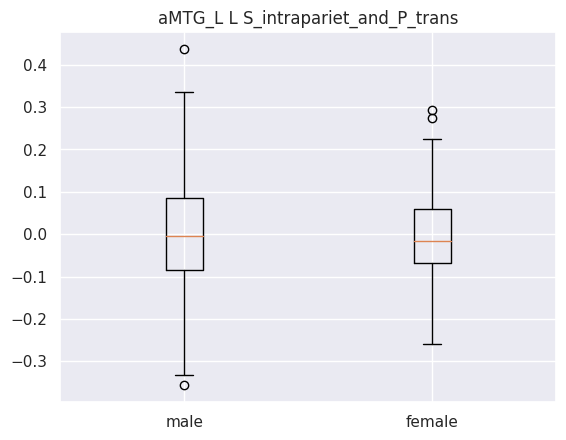

Ttest_indResult(statistic=1.0441439448576817, pvalue=0.29698694253266955)
male mean : 0.004413317491818183
male std : 0.12667357592144304
female mean : -0.006823133387610619
female std : 0.09870796418027704


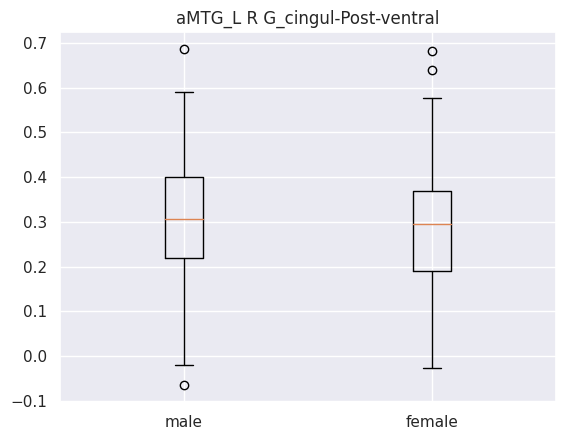

Ttest_indResult(statistic=1.8738792848668957, pvalue=0.06160360622903291)
male mean : 0.30625412715000006
male std : 0.13256098239856265
female mean : 0.28295946666194693
female std : 0.12938146719020743


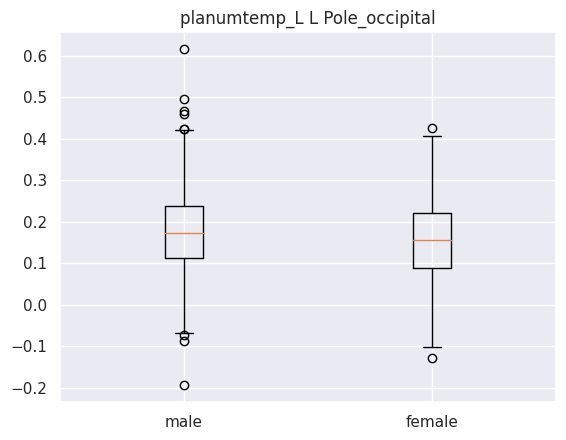

Ttest_indResult(statistic=2.8966477425742636, pvalue=0.003958114551412912)
male mean : 0.18402248281818182
male std : 0.11334589412846845
female mean : 0.1545630971402655
female std : 0.10073153762994376


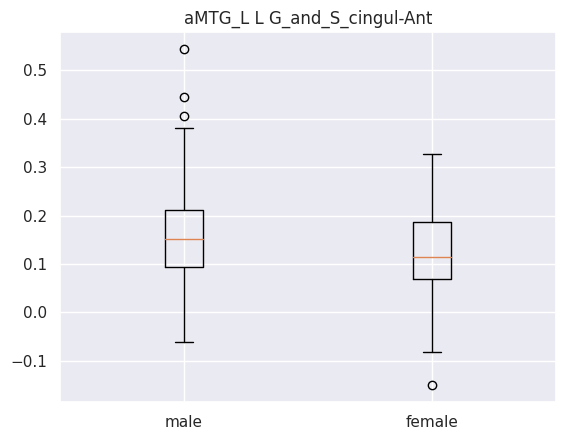

Ttest_indResult(statistic=4.307060944860257, pvalue=2.038136442014065e-05)
male mean : 0.16099100311954548
male std : 0.0980609784038807
female mean : 0.1242215932681416
female std : 0.08124741946330903


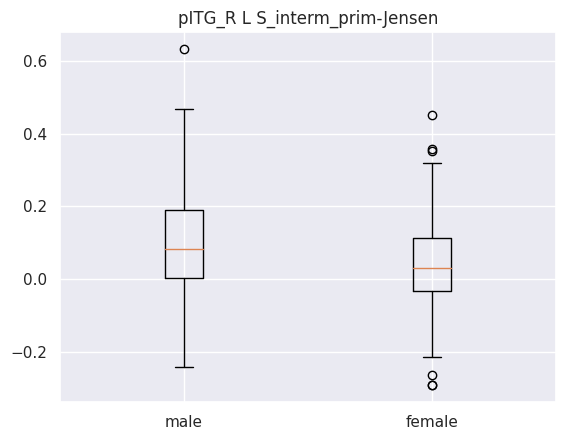

Ttest_indResult(statistic=5.007996133956906, pvalue=7.949942585866972e-07)
male mean : 0.0980466264909091
male std : 0.14302591474588874
female mean : 0.035939954145840704
female std : 0.11734710737051729


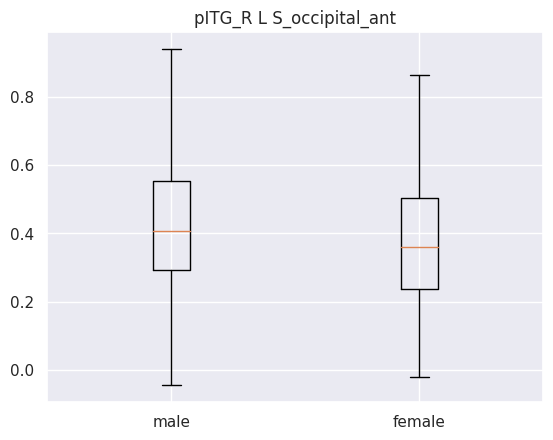

Ttest_indResult(statistic=2.404235146691141, pvalue=0.016615050670348956)
male mean : 0.41801690174090916
male std : 0.18448765190931446
female mean : 0.376694192960177
female std : 0.1776694904570346


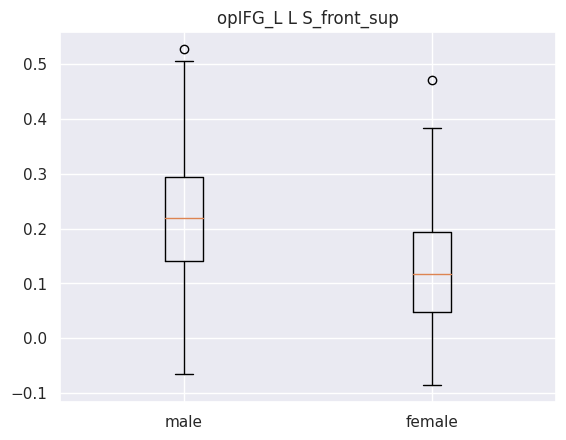

Ttest_indResult(statistic=9.514226955534408, pvalue=1.1745948061525577e-19)
male mean : 0.22193633239999996
male std : 0.11249626112199279
female mean : 0.12588911007571682
female std : 0.10000267392277586
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['aMTG_L']
-------------------------------------------------------------------------------------------------------
     coefficient    seed                       labels
98      0.251050  aMTG_L       R G_pariet_inf-Angular
104     0.220744  aMTG_L                   R G_rectus
22      0.208938  aMTG_L      L G_oc-temp_med-Parahip
64      0.205499  aMTG_L        L S_parieto_occipital
120     0.187161  aMTG_L      R S_circular_insula_ant
53      0.171297  aMTG_L                L S_front_sup
55      0.165051  aMTG_L  L S_intrapariet_and_P_trans
10      0.160273  aMTG_L                   L G_cuneus
90      0.159618  aMTG

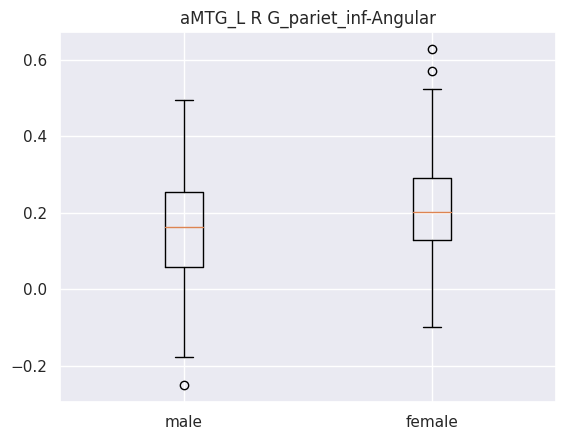

Ttest_indResult(statistic=-3.9493086257770935, pvalue=9.112915695993898e-05)
male mean : 0.1597038146640909
male std : 0.14141209184423478
female mean : 0.20934205392477875
female std : 0.12301362367570179


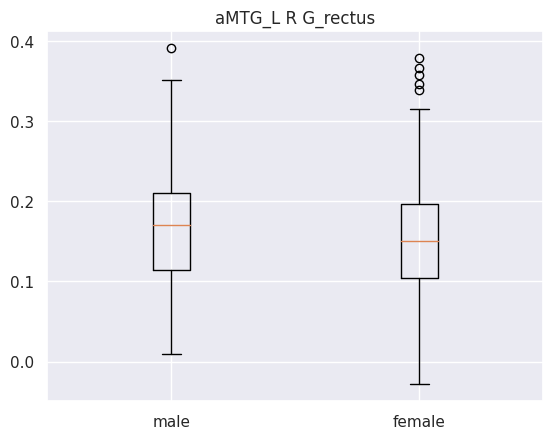

Ttest_indResult(statistic=1.5156403489067496, pvalue=0.1303218993854485)
male mean : 0.1657639553590909
male std : 0.0682223379382807
female mean : 0.15580128479203542
female std : 0.07023035925739472


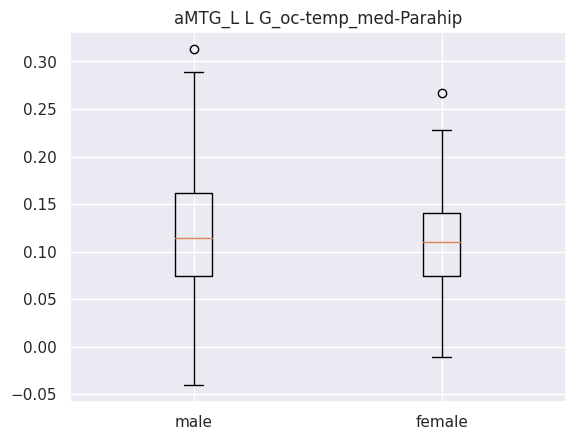

Ttest_indResult(statistic=2.6168014548691065, pvalue=0.00917858413141157)
male mean : 0.12139309023636362
male std : 0.05894973262885631
female mean : 0.10806080625663717
female std : 0.04798219271826174


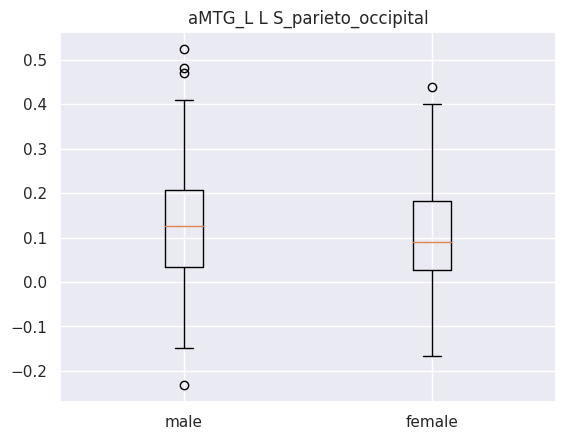

Ttest_indResult(statistic=2.2094508035541147, pvalue=0.027652989359519833)
male mean : 0.12847853708772727
male std : 0.12373033607080648
female mean : 0.10449228901026548
female std : 0.1044487733534802


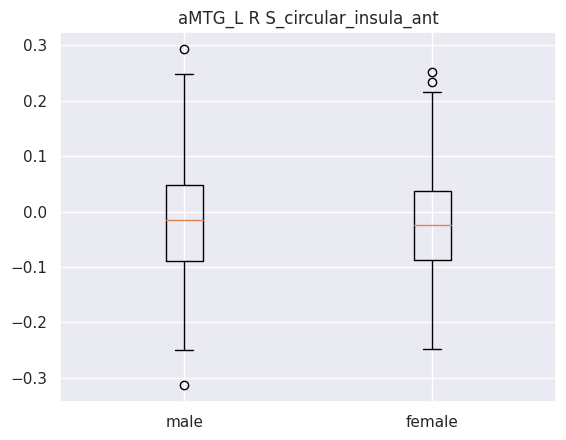

Ttest_indResult(statistic=0.7324587038892733, pvalue=0.4642751139979112)
male mean : -0.014839359866818185
male std : 0.11195276745376999
female mean : -0.02199007155882301
female std : 0.09312999917448096


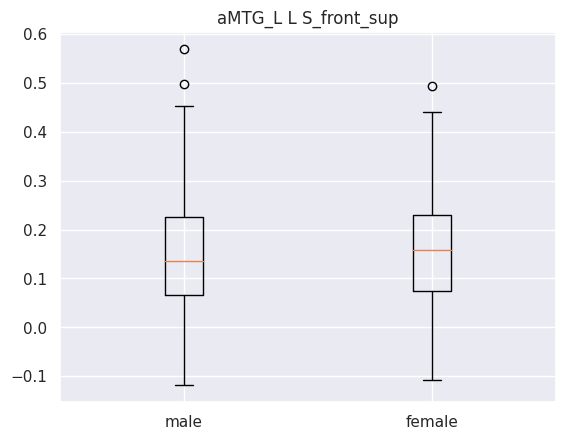

Ttest_indResult(statistic=-0.9406515856219914, pvalue=0.3473949131207905)
male mean : 0.149155713895
male std : 0.12215414677633321
female mean : 0.15968833962980092
female std : 0.1137261077832309


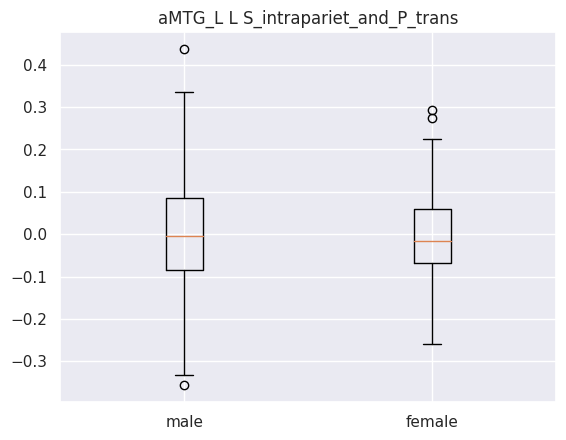

Ttest_indResult(statistic=1.0441439448576817, pvalue=0.29698694253266955)
male mean : 0.004413317491818183
male std : 0.12667357592144304
female mean : -0.006823133387610619
female std : 0.09870796418027704


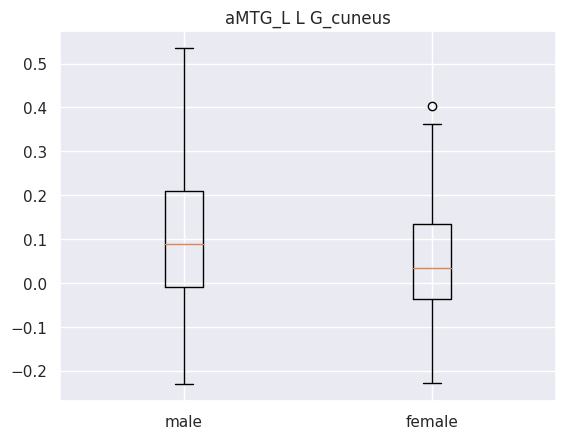

Ttest_indResult(statistic=3.767805891841048, pvalue=0.0001868963222038319)
male mean : 0.09790634755395457
male std : 0.14139254886748248
female mean : 0.05090613541340707
female std : 0.12090664915408816


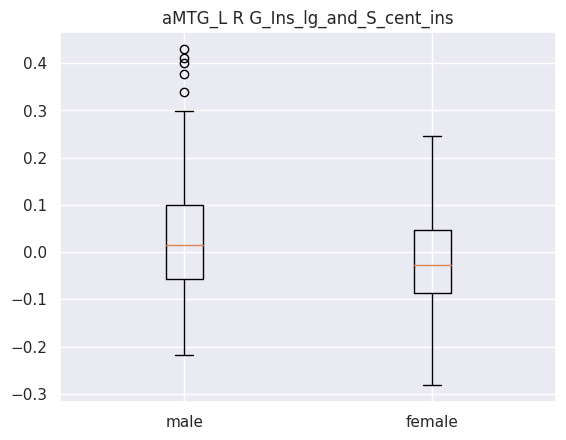

Ttest_indResult(statistic=3.681665216455551, pvalue=0.0002602364041619344)
male mean : 0.02278002829522727
male std : 0.11774230758215139
female mean : -0.015473884240707966
female std : 0.10074475793993512


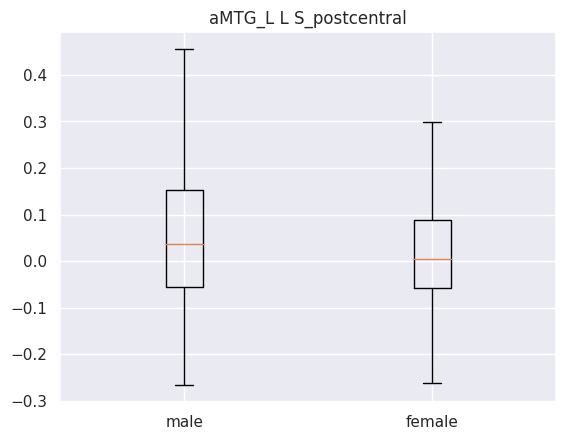

Ttest_indResult(statistic=2.4484128219617074, pvalue=0.01473464302856492)
male mean : 0.04535718950954546
male std : 0.14137947053259706
female mean : 0.01543427044787611
female std : 0.11512896698383501
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['aMTG_R']
-------------------------------------------------------------------------------------------------------
     coefficient    seed                      labels
22      0.222033  aMTG_R     L G_oc-temp_med-Parahip
98      0.214976  aMTG_R      R G_pariet_inf-Angular
96      0.201910  aMTG_R     R G_oc-temp_med-Parahip
66      0.182924  aMTG_R             L S_postcentral
26      0.181915  aMTG_R            L G_parietal_sup
90      0.181148  aMTG_R   R G_Ins_lg_and_S_cent_ins
64      0.170190  aMTG_R       L S_parieto_occipital
4       0.167114  aMTG_R  L G_and_S_transv_frontopol
104     0.161022  aMTG_R         

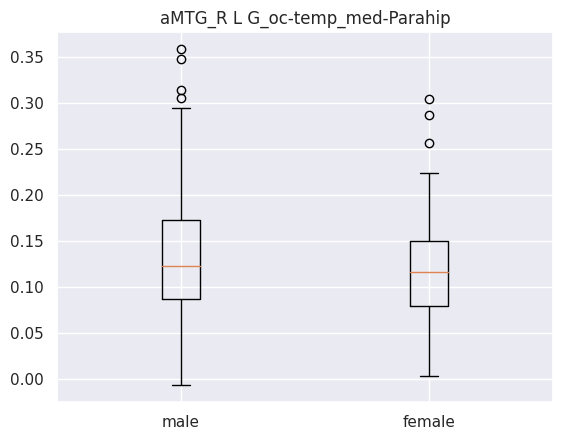

Ttest_indResult(statistic=2.839191497277654, pvalue=0.004730402487154351)
male mean : 0.13388492833
male std : 0.06366889431603796
female mean : 0.11838812058539823
female std : 0.05078064169079939


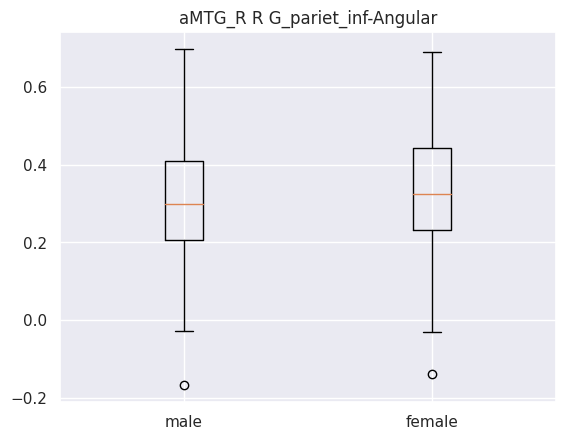

Ttest_indResult(statistic=-1.2323437014086307, pvalue=0.21847289401376063)
male mean : 0.30850017917
male std : 0.1509961278933057
female mean : 0.3258114792300885
female std : 0.14499535619579842


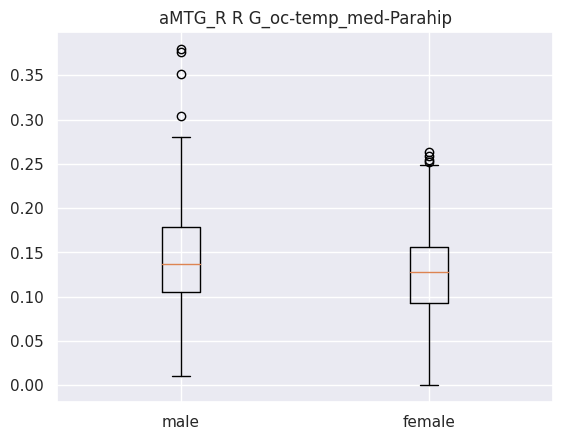

Ttest_indResult(statistic=3.2230120586916766, pvalue=0.0013619508370199724)
male mean : 0.14602855690909092
male std : 0.06277541821437044
female mean : 0.1286269260214602
female std : 0.050481361154379095


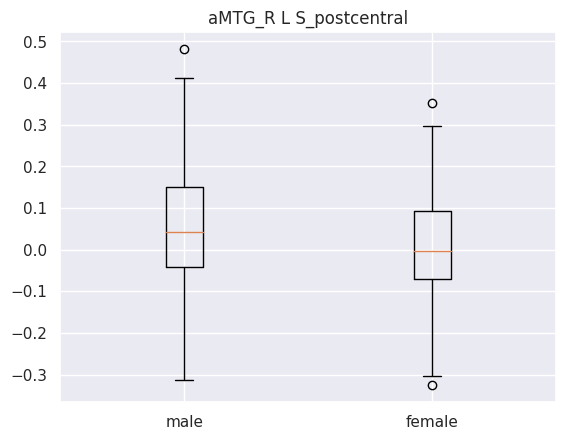

Ttest_indResult(statistic=2.627621292338559, pvalue=0.008896140355824254)
male mean : 0.04901591075681818
male std : 0.13953276104441498
female mean : 0.016055526186592915
female std : 0.12453371759228786


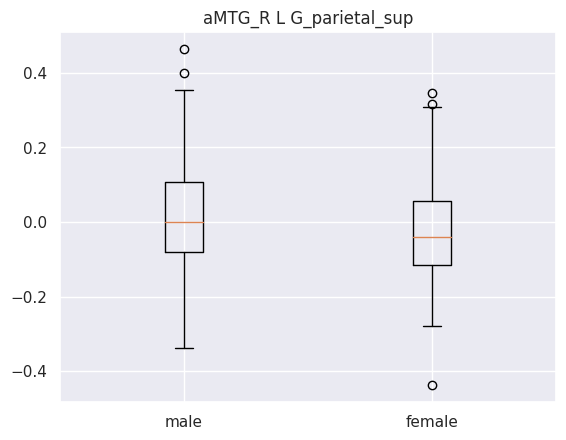

Ttest_indResult(statistic=3.687795634704116, pvalue=0.00025423057819420956)
male mean : 0.016972076357409095
male std : 0.1450332513278706
female mean : -0.030223680599159294
female std : 0.12407561780895006


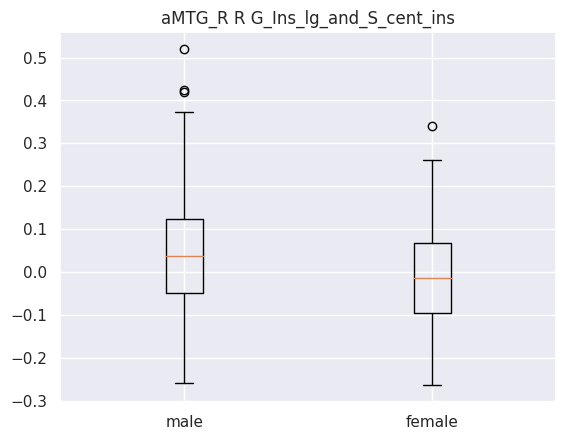

Ttest_indResult(statistic=4.494099754685952, pvalue=8.92418981107013e-06)
male mean : 0.0445266324765
male std : 0.12931193503968358
female mean : -0.007410436407079646
female std : 0.11390051576344988


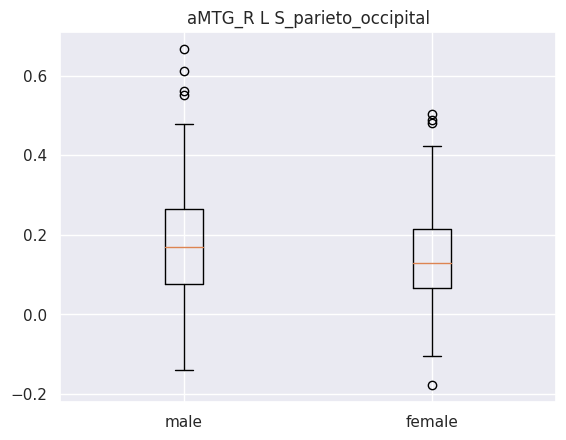

Ttest_indResult(statistic=2.7856826957720897, pvalue=0.005570176920800892)
male mean : 0.1771041583763636
male std : 0.1337103914918067
female mean : 0.1436597400653097
female std : 0.11901572309886627


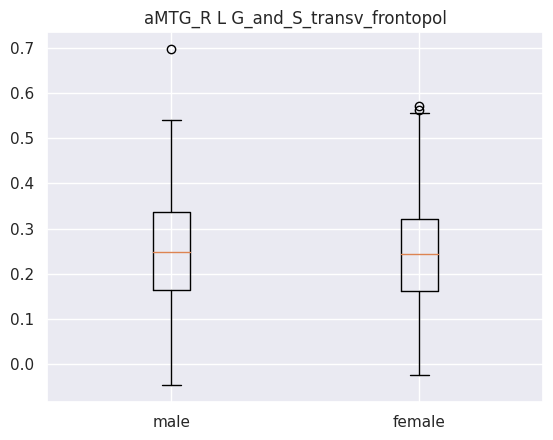

Ttest_indResult(statistic=0.7806963776760073, pvalue=0.43539711360071087)
male mean : 0.25175311356636365
male std : 0.12076507584294517
female mean : 0.2429040562159292
female std : 0.11807395115490585


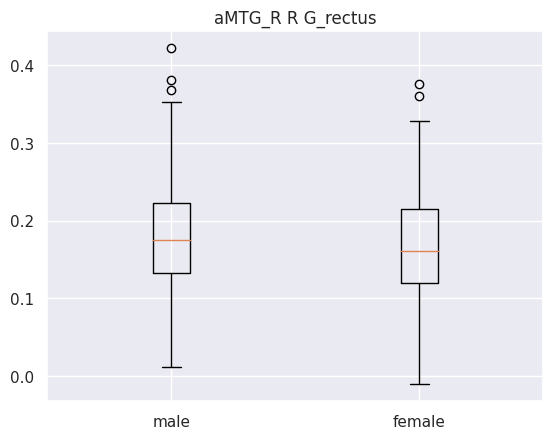

Ttest_indResult(statistic=1.9556394665406327, pvalue=0.0511344240664779)
male mean : 0.1794522245181818
male std : 0.07123758746046512
female mean : 0.16650174143982302
female std : 0.06829511318721243


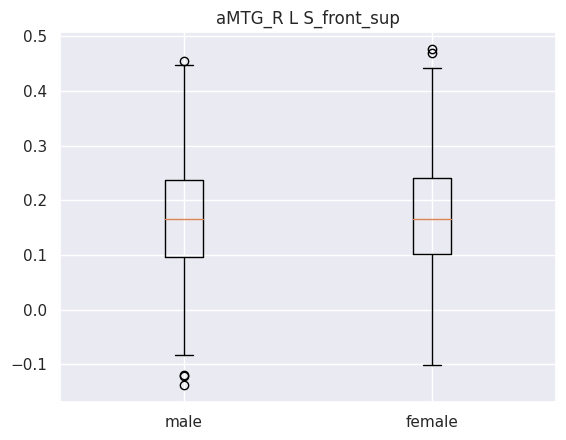

Ttest_indResult(statistic=-0.08008365126456747, pvalue=0.9362068082925741)
male mean : 0.17175187354863636
male std : 0.11338550789442398
female mean : 0.1725857526397788
female std : 0.10597629980410962
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['opIFG_L']
-------------------------------------------------------------------------------------------------------
     coefficient     seed                       labels
20      0.231027  opIFG_L      L G_oc-temp_lat-fusifor
144     0.213573  opIFG_L              R S_subparietal
47      0.188966  opIFG_L      L S_circular_insula_inf
35      0.187918  opIFG_L      L G_temp_sup-Plan_tempo
86      0.175719  opIFG_L        R G_front_inf-Orbital
1       0.174577  opIFG_L      L G_and_S_occipital_inf
55      0.161942  opIFG_L  L S_intrapariet_and_P_trans
136     0.153535  opIFG_L       R S_orbital_med-olfact
60      0.1484

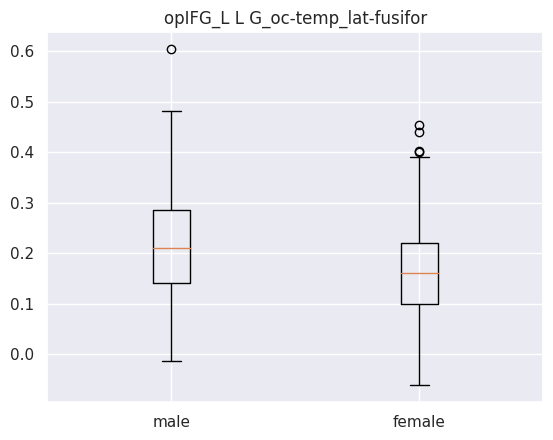

Ttest_indResult(statistic=5.347205581276891, pvalue=1.4323542479964458e-07)
male mean : 0.21720834137113634
male std : 0.10505156622836234
female mean : 0.1665263415774336
female std : 0.09451242193790162


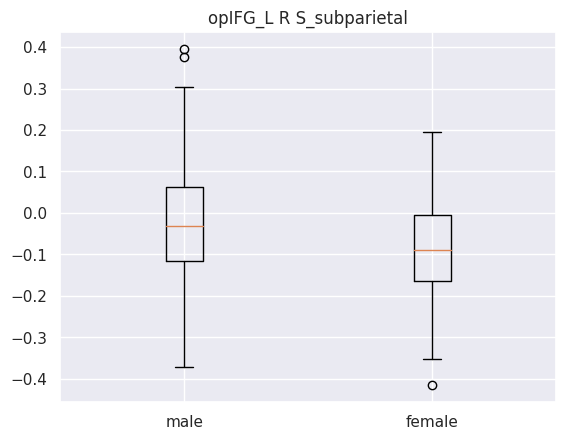

Ttest_indResult(statistic=4.609312989745705, pvalue=5.2885387407695605e-06)
male mean : -0.024811179274522723
male std : 0.14365742689954286
female mean : -0.08184163840840707
female std : 0.1159257812279483


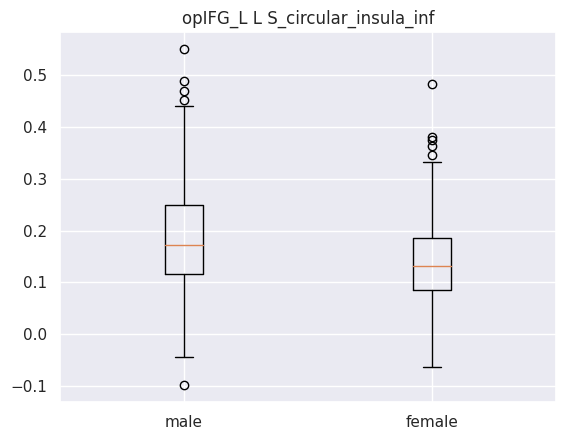

Ttest_indResult(statistic=5.521425671090101, pvalue=5.731639475936297e-08)
male mean : 0.18788899746363638
male std : 0.10418852948770023
female mean : 0.13893758282522123
female std : 0.08153292407600472


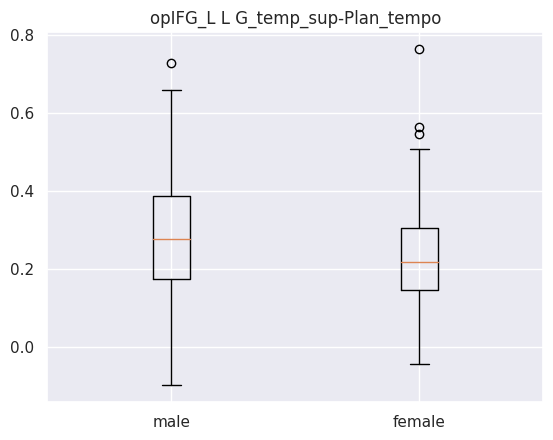

Ttest_indResult(statistic=4.658112093864058, pvalue=4.223278693577736e-06)
male mean : 0.2863882349772728
male std : 0.14948277729148243
female mean : 0.22649747706194692
female std : 0.12022186901150231


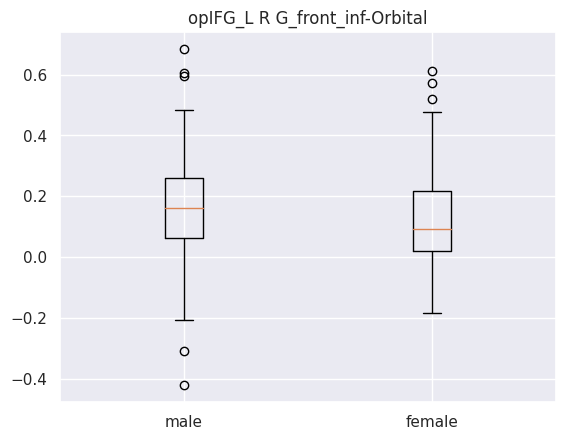

Ttest_indResult(statistic=2.8700219557338875, pvalue=0.004300467745953177)
male mean : 0.16176995975213632
male std : 0.1624989648112715
female mean : 0.11882039737123894
female std : 0.1527833017666561


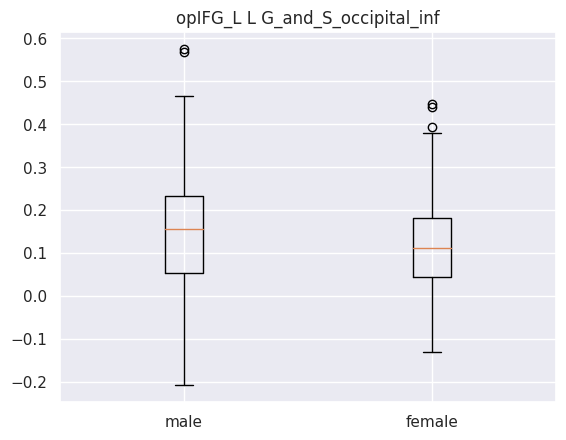

Ttest_indResult(statistic=3.05191381594728, pvalue=0.002410294840666242)
male mean : 0.15546942175227274
male std : 0.13201789524707933
female mean : 0.11997070040309733
female std : 0.112540443719782


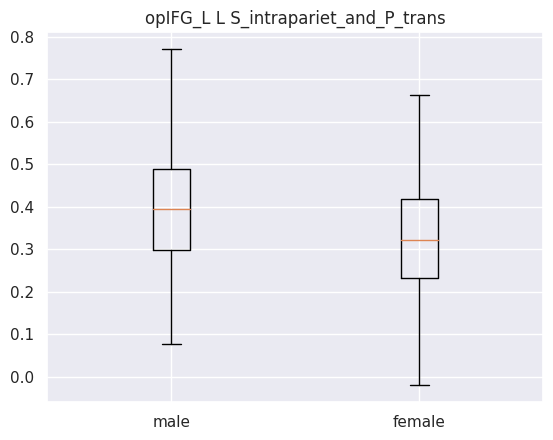

Ttest_indResult(statistic=5.1258862531393055, pvalue=4.4282893375816664e-07)
male mean : 0.3898567061545455
male std : 0.13731628353334865
female mean : 0.32281164144557517
female std : 0.1382510384328816


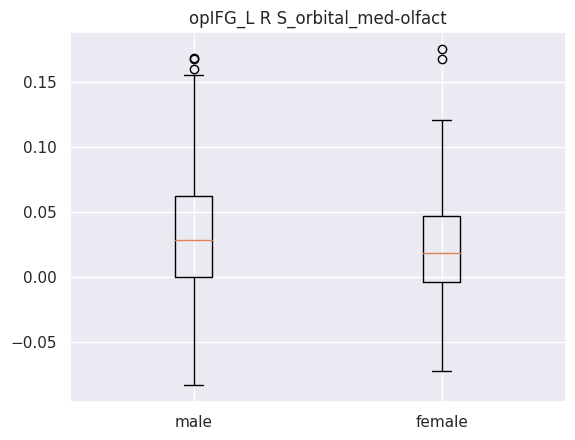

Ttest_indResult(statistic=2.8796988817512768, pvalue=0.004173042437122773)
male mean : 0.03379650349818182
male std : 0.04840078630084152
female mean : 0.021650458484203543
female std : 0.04019706609673652


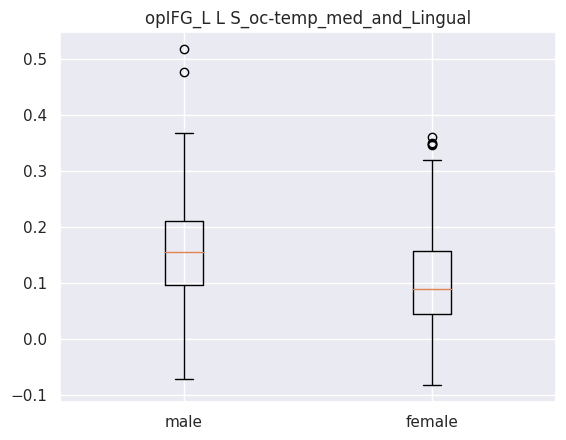

Ttest_indResult(statistic=5.608872459876942, pvalue=3.5868373548282604e-08)
male mean : 0.15474476261090905
male std : 0.09145221886246907
female mean : 0.10766764768845133
female std : 0.08536736636712615


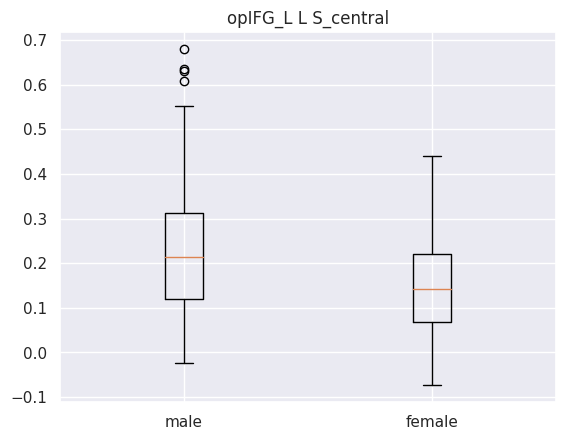

Ttest_indResult(statistic=5.944270222419872, pvalue=5.623516686557401e-09)
male mean : 0.22208382952818181
male std : 0.1345946589094845
female mean : 0.15323422234734513
female std : 0.1083831494123327
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['opIFG_R']
-------------------------------------------------------------------------------------------------------
     coefficient     seed                       labels
41      0.232943  opIFG_R             L Pole_occipital
80      0.219618  opIFG_R     R G_and_S_cingul-Mid-Ant
47      0.204990  opIFG_R      L S_circular_insula_inf
63      0.198680  opIFG_R         L S_orbital-H_Shaped
20      0.195124  opIFG_R      L G_oc-temp_lat-fusifor
144     0.165217  opIFG_R              R S_subparietal
125     0.151011  opIFG_R                R S_front_inf
121     0.138605  opIFG_R      R S_circular_insula_inf
60      0.13644

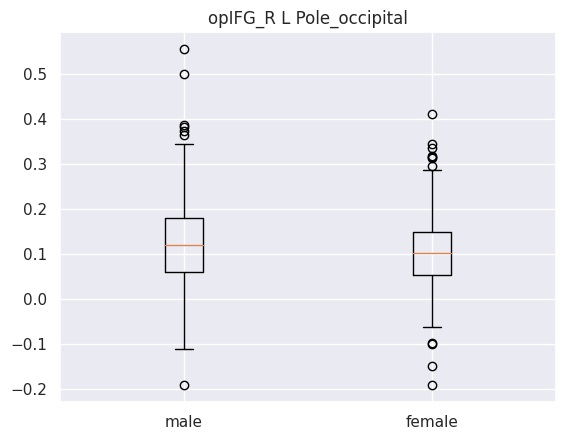

Ttest_indResult(statistic=1.9668569199465695, pvalue=0.049822028600582956)
male mean : 0.1226511061215
male std : 0.10336637927130211
female mean : 0.10500797782699114
female std : 0.08498185574097446


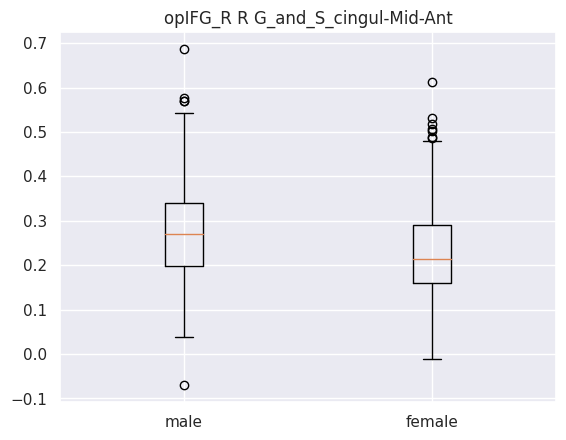

Ttest_indResult(statistic=3.964127034948002, pvalue=8.583233085828756e-05)
male mean : 0.2759169506818182
male std : 0.11781973016961253
female mean : 0.2327772969358407
female std : 0.1114656795348218


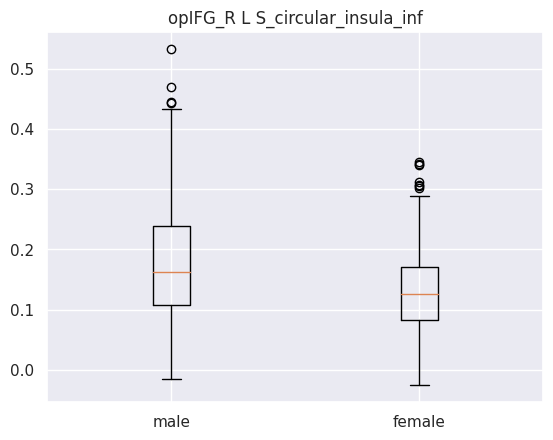

Ttest_indResult(statistic=5.317158946038209, pvalue=1.6733840077039355e-07)
male mean : 0.17774089511590907
male std : 0.0986333730111213
female mean : 0.1336734924256637
female std : 0.0746535455333046


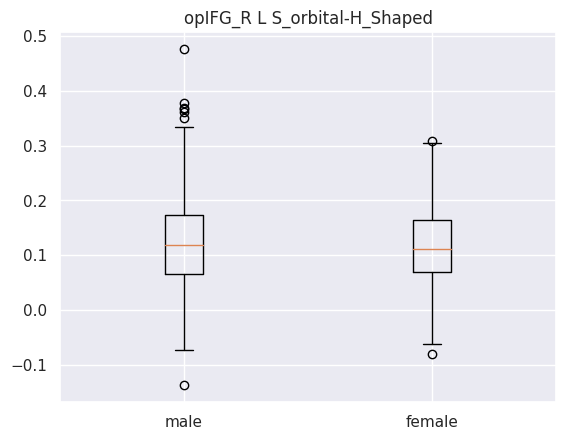

Ttest_indResult(statistic=0.8561324777791736, pvalue=0.39238630056013113)
male mean : 0.12343299978045455
male std : 0.08958678153626323
female mean : 0.11666919567345133
female std : 0.07653337463165284


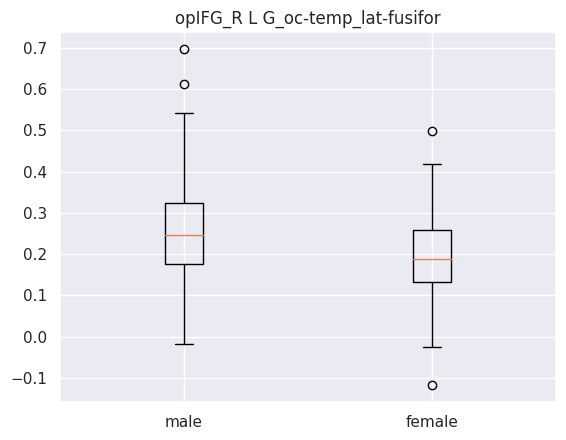

Ttest_indResult(statistic=5.192733430788187, pvalue=3.162104238851161e-07)
male mean : 0.24746643591363637
male std : 0.1114361981429399
female mean : 0.1962682065265487
female std : 0.095928572655737


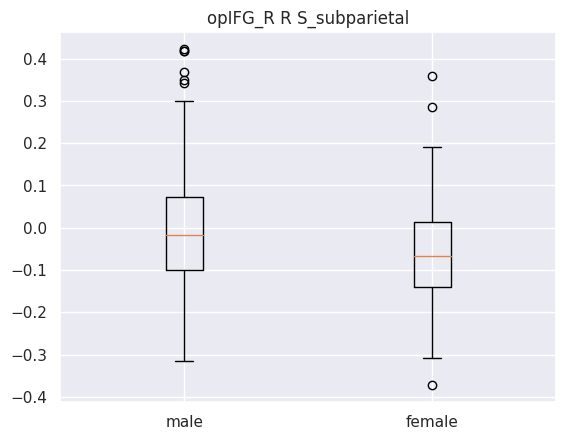

Ttest_indResult(statistic=4.342181044945235, pvalue=1.749268283550659e-05)
male mean : -0.008883466066818179
male std : 0.14428559820039927
female mean : -0.06175231570632744
female std : 0.11046401972822666


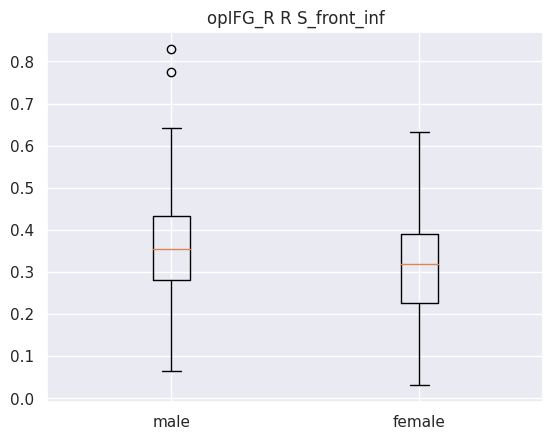

Ttest_indResult(statistic=3.9946084585433304, pvalue=7.584042967238988e-05)
male mean : 0.36241775419090916
male std : 0.11709006437871611
female mean : 0.31739422023451325
female std : 0.12031934666421866


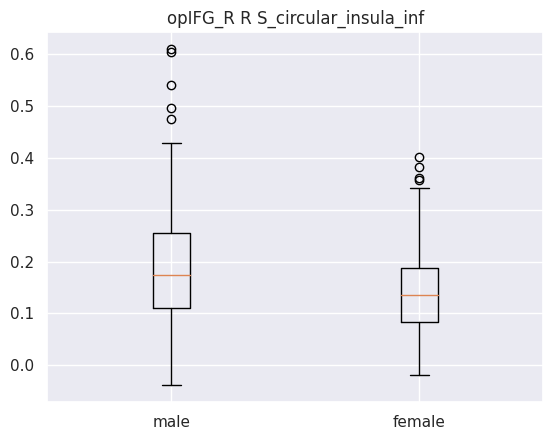

Ttest_indResult(statistic=5.136747637344303, pvalue=4.1935107117731044e-07)
male mean : 0.186023299325
male std : 0.10521632072608898
female mean : 0.14072201191084072
female std : 0.07910363032785167


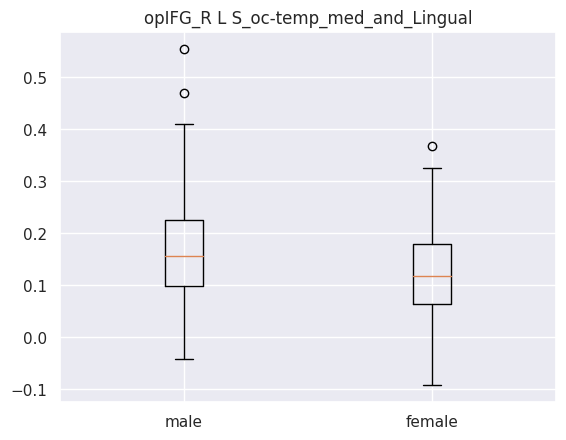

Ttest_indResult(statistic=4.9683687670111105, pvalue=9.65358806851133e-07)
male mean : 0.16568285368454544
male std : 0.09795658686725976
female mean : 0.12266675558539823
female std : 0.08412303322404859


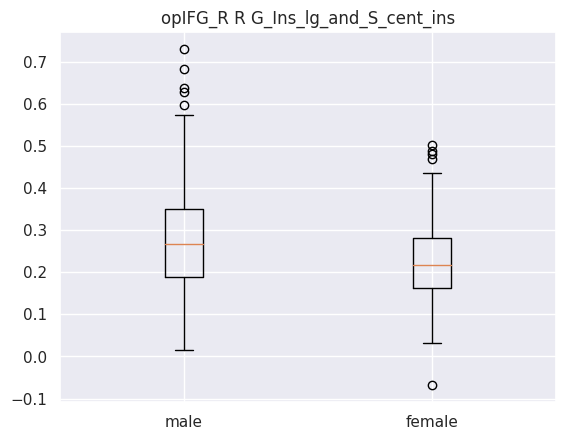

Ttest_indResult(statistic=4.719580637797441, pvalue=3.1723919963938446e-06)
male mean : 0.2733611874181818
male std : 0.12407207041222522
female mean : 0.22280797660176993
female std : 0.1007125264660346
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['pITG_L']
-------------------------------------------------------------------------------------------------------
     coefficient    seed                       labels
125     0.203947  pITG_L                R S_front_inf
126     0.196543  pITG_L             R S_front_middle
83      0.187415  pITG_L      R G_cingul-Post-ventral
86      0.184185  pITG_L        R G_front_inf-Orbital
20      0.183896  pITG_L      L G_oc-temp_lat-fusifor
5       0.182068  pITG_L         L G_and_S_cingul-Ant
26      0.164388  pITG_L             L G_parietal_sup
9       0.163840  pITG_L      L G_cingul-Post-ventral
41      0.148751  pITG_L

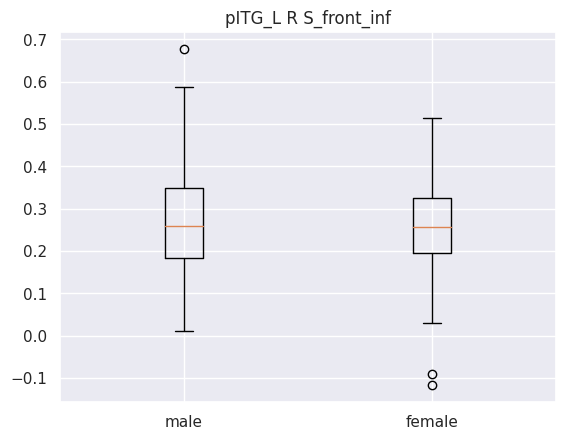

Ttest_indResult(statistic=1.0020328934125462, pvalue=0.31687348431400925)
male mean : 0.2700681785363636
male std : 0.11105772730043446
female mean : 0.25973832161504423
female std : 0.10615524639315872


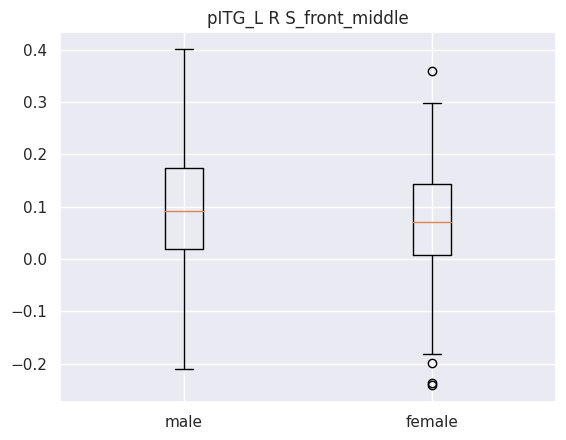

Ttest_indResult(statistic=2.262227860903967, pvalue=0.024165930044473365)
male mean : 0.09672683969472727
male std : 0.10691554436745918
female mean : 0.07428678904690267
female std : 0.10209048708783634


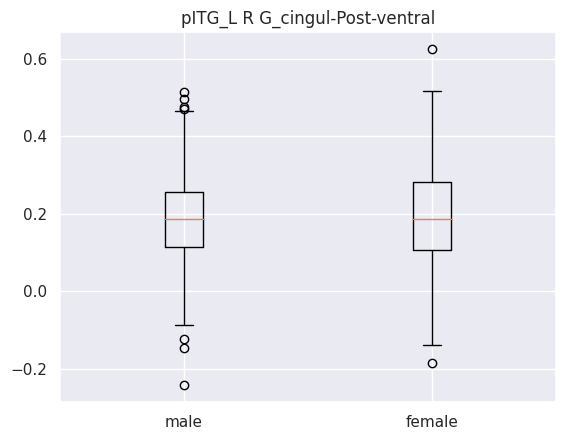

Ttest_indResult(statistic=-0.7258276764624265, pvalue=0.4683268290899185)
male mean : 0.18240836490872728
male std : 0.12319924649574499
female mean : 0.19105889225530973
female std : 0.12780495959682228


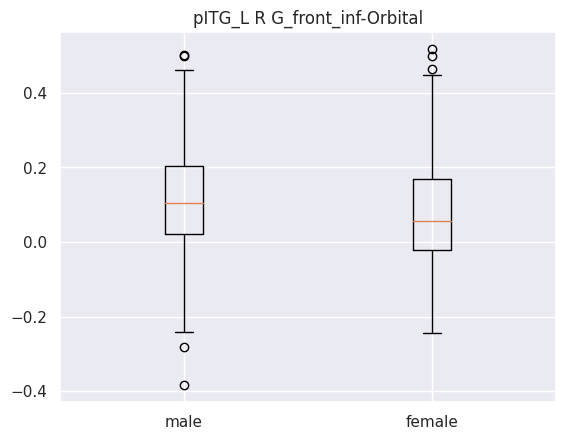

Ttest_indResult(statistic=2.1985301607329877, pvalue=0.02842657546406812)
male mean : 0.10284580619136363
male std : 0.14888510757101564
female mean : 0.07244750026106195
female std : 0.1424496079400281


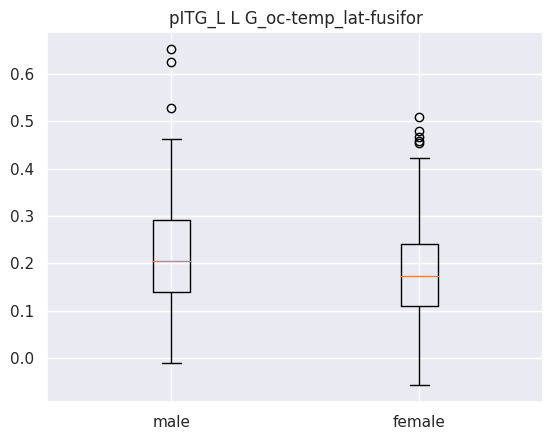

Ttest_indResult(statistic=2.9177266272120463, pvalue=0.0037049025784669063)
male mean : 0.2166043530454545
male std : 0.10970491808955896
female mean : 0.18723372998539822
female std : 0.10235689928590931


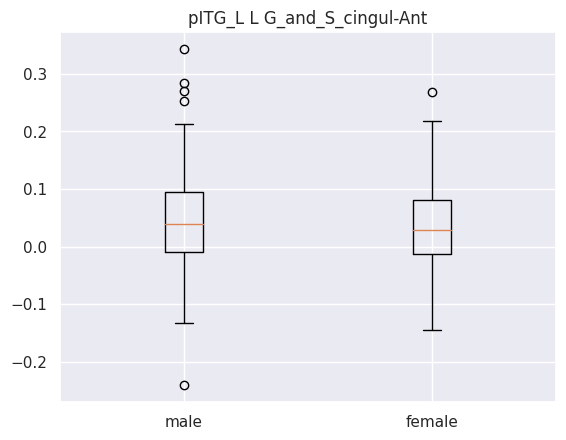

Ttest_indResult(statistic=0.9423641748942606, pvalue=0.34651867898691713)
male mean : 0.04273676698363637
male std : 0.08120406336224366
female mean : 0.035810986843185844
female std : 0.07355665164454465


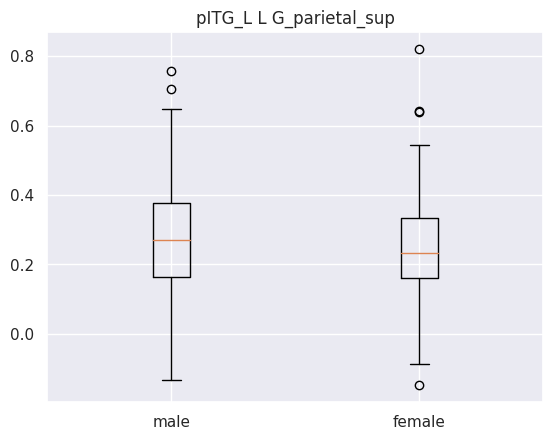

Ttest_indResult(statistic=1.932579843967068, pvalue=0.05392366198499659)
male mean : 0.2742340569533182
male std : 0.16088494195816322
female mean : 0.2469608636460177
female std : 0.13572558594984654


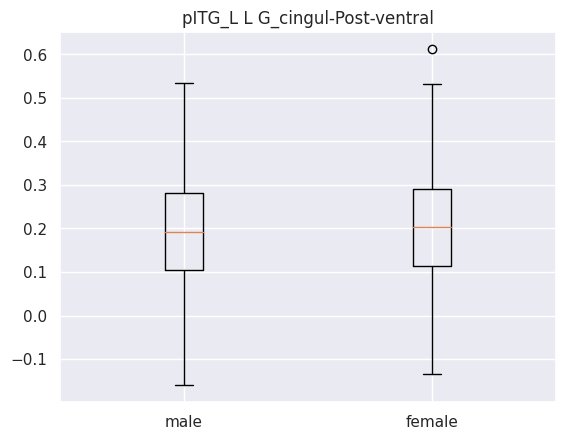

Ttest_indResult(statistic=-0.8502284729847315, pvalue=0.3956563221847449)
male mean : 0.19532825054954547
male std : 0.12405214793600829
female mean : 0.2054311569070796
female std : 0.12626706102176716


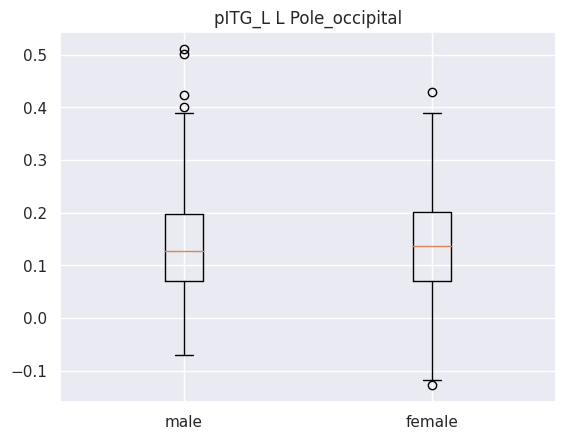

Ttest_indResult(statistic=0.12064913567187839, pvalue=0.9040235258199408)
male mean : 0.14238426120045453
male std : 0.10132866936785162
female mean : 0.14123193651615043
female std : 0.09992003369997071


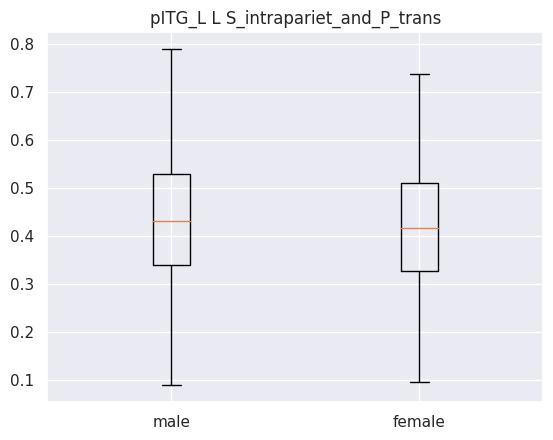

Ttest_indResult(statistic=0.6041143572753404, pvalue=0.5460761592105134)
male mean : 0.4304373097727274
male std : 0.13301584196209193
female mean : 0.42295020637610614
female std : 0.1281282122063903
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['pITG_R']
-------------------------------------------------------------------------------------------------------
     coefficient    seed                   labels
20      0.328399  pITG_R  L G_oc-temp_lat-fusifor
91      0.224409  pITG_R        R G_insular_short
32      0.181398  pITG_R  L G_temp_sup-G_T_transv
83      0.174336  pITG_R  R G_cingul-Post-ventral
125     0.174149  pITG_R            R S_front_inf
84      0.170008  pITG_R               R G_cuneus
47      0.136427  pITG_R  L S_circular_insula_inf
97      0.136182  pITG_R              R G_orbital
79      0.128748  pITG_R     R G_and_S_cingul-Ant
71      0.124

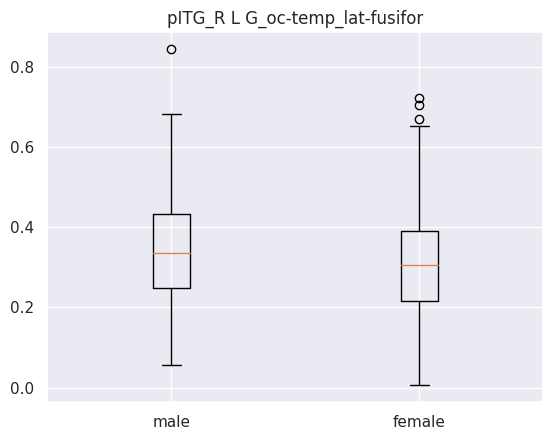

Ttest_indResult(statistic=2.207601503782289, pvalue=0.027782692747375555)
male mean : 0.3381230503772727
male std : 0.13608853787659086
female mean : 0.31070127244911505
female std : 0.1255552430118421


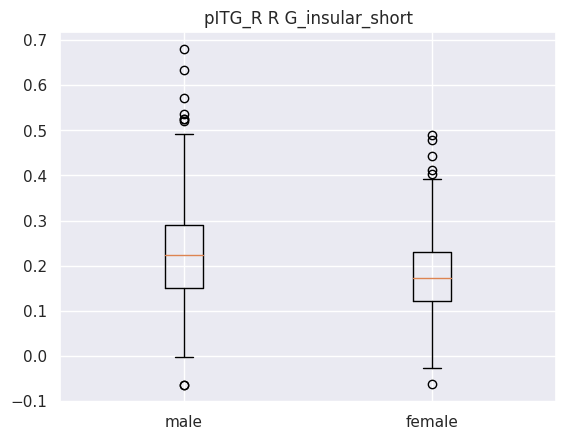

Ttest_indResult(statistic=5.112160421970684, pvalue=4.743233770538839e-07)
male mean : 0.2313763518045455
male std : 0.12096734073549982
female mean : 0.1792633135699115
female std : 0.09227387552085549


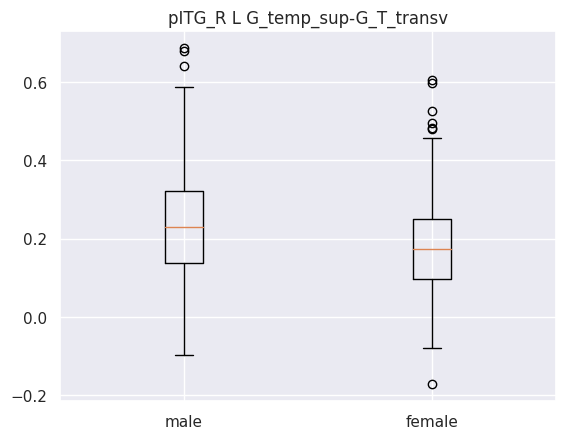

Ttest_indResult(statistic=4.524709164152146, pvalue=7.774373381230067e-06)
male mean : 0.2398444346181818
male std : 0.1385572380212938
female mean : 0.1833660085743363
female std : 0.12423831506745996


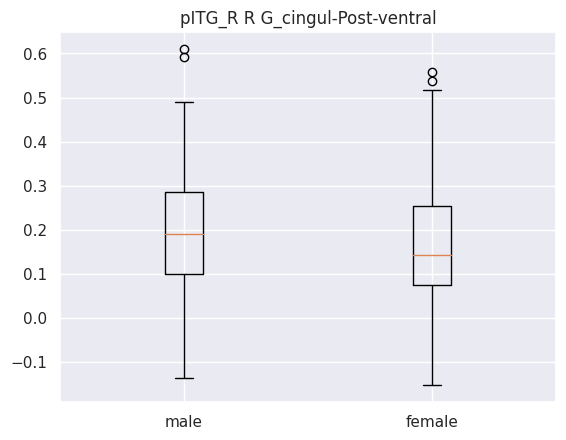

Ttest_indResult(statistic=2.380140291533847, pvalue=0.01772726625126871)
male mean : 0.19296064746681815
male std : 0.1346758980066957
female mean : 0.16264045314955752
female std : 0.13373455574896778


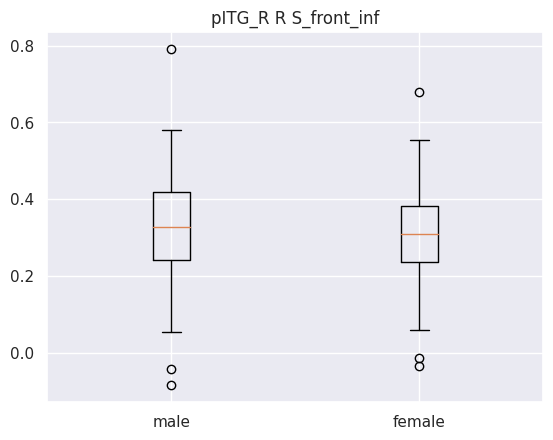

Ttest_indResult(statistic=2.13538486489198, pvalue=0.03327622102378573)
male mean : 0.3298146207409091
male std : 0.12123145108487972
female mean : 0.3068887235929204
female std : 0.1045843071513845


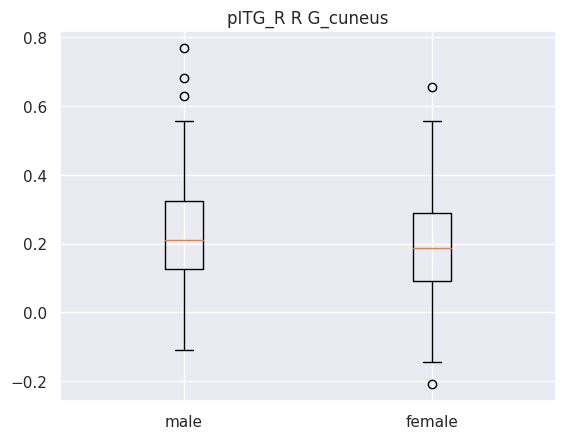

Ttest_indResult(statistic=2.518734910789549, pvalue=0.012128078944136934)
male mean : 0.22664096681499996
male std : 0.14532160156704602
female mean : 0.192063495079646
female std : 0.14393677903416816


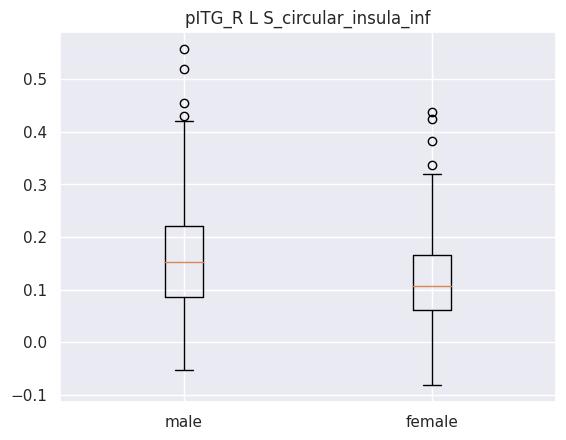

Ttest_indResult(statistic=4.89703456997614, pvalue=1.364854621754719e-06)
male mean : 0.16269722603772727
male std : 0.10568304695233927
female mean : 0.118230450025354
female std : 0.08476948994850746


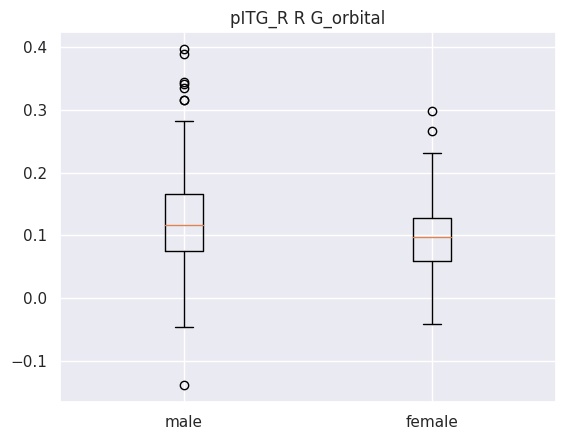

Ttest_indResult(statistic=4.236449914746934, pvalue=2.7626540321598403e-05)
male mean : 0.12251845401545454
male std : 0.07970739028304982
female mean : 0.09531688159690266
female std : 0.05333586734107206


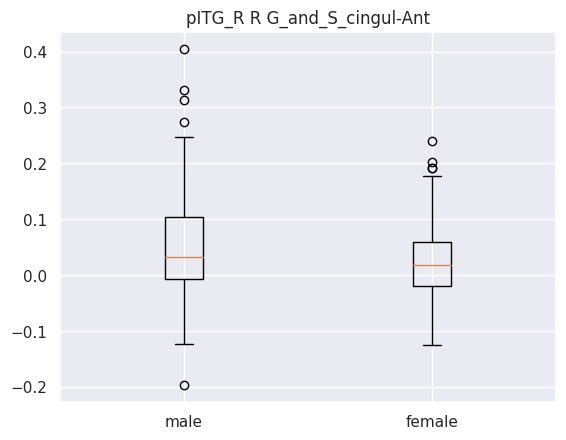

Ttest_indResult(statistic=3.3660004581303236, pvalue=0.0008289579997513635)
male mean : 0.04933961785272728
male std : 0.08588680640744353
female mean : 0.025453949248053095
female std : 0.062030754045511526


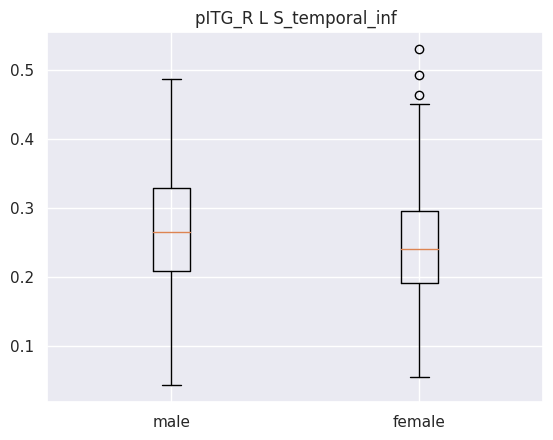

Ttest_indResult(statistic=3.8006792811414565, pvalue=0.0001644402787740319)
male mean : 0.27266513860454544
male std : 0.0867374978622548
female mean : 0.2433624244955752
female std : 0.07546479523645871
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['planumtemp_L']
-------------------------------------------------------------------------------------------------------
     coefficient          seed                       labels
60      0.303369  planumtemp_L  L S_oc-temp_med_and_Lingual
94      0.204186  planumtemp_L      R G_oc-temp_lat-fusifor
108     0.204148  planumtemp_L      R G_temp_sup-Plan_polar
20      0.175790  planumtemp_L      L G_oc-temp_lat-fusifor
66      0.175684  planumtemp_L              L S_postcentral
41      0.171513  planumtemp_L             L Pole_occipital
115     0.151963  planumtemp_L             R Pole_occipital
80      0.134653  planum

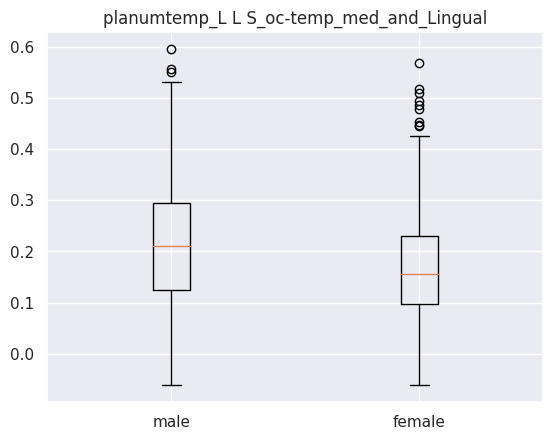

Ttest_indResult(statistic=3.568169946152254, pvalue=0.00039862792533886367)
male mean : 0.21577463173863637
male std : 0.11920041520251866
female mean : 0.17618120696902656
female std : 0.11460830695377548


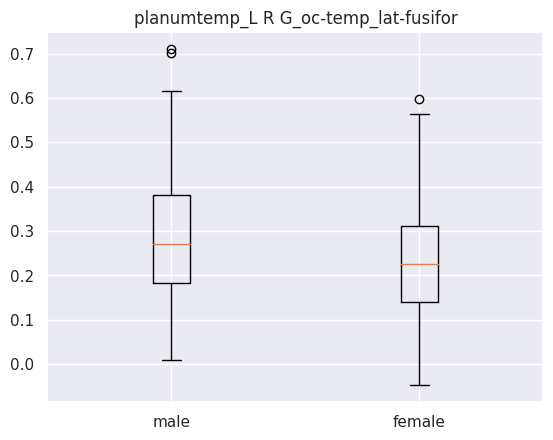

Ttest_indResult(statistic=4.055614333449546, pvalue=5.9060276690219876e-05)
male mean : 0.28515832146363634
male std : 0.13827308909461045
female mean : 0.23584467546176993
female std : 0.11734248121055887


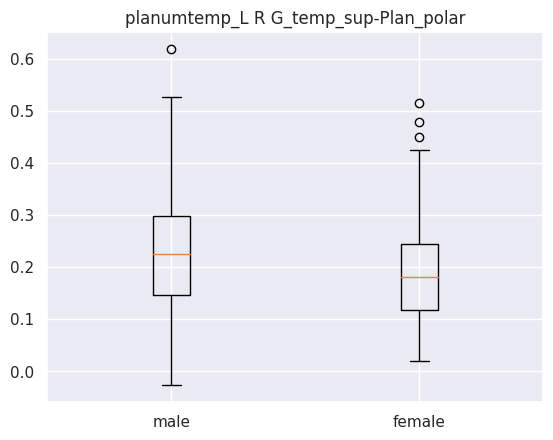

Ttest_indResult(statistic=4.42054857038295, pvalue=1.2391524231536645e-05)
male mean : 0.231116042775
male std : 0.10743291511827939
female mean : 0.18849037465929203
female std : 0.09554310246985663


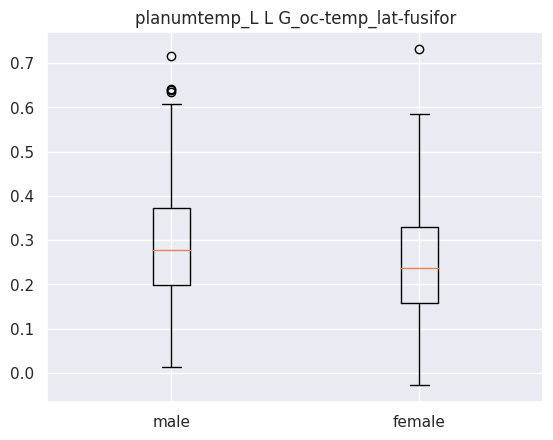

Ttest_indResult(statistic=3.7622305190657452, pvalue=0.0001909807101357603)
male mean : 0.2942304806272728
male std : 0.13292350850751689
female mean : 0.24918162700884958
female std : 0.119170924743853


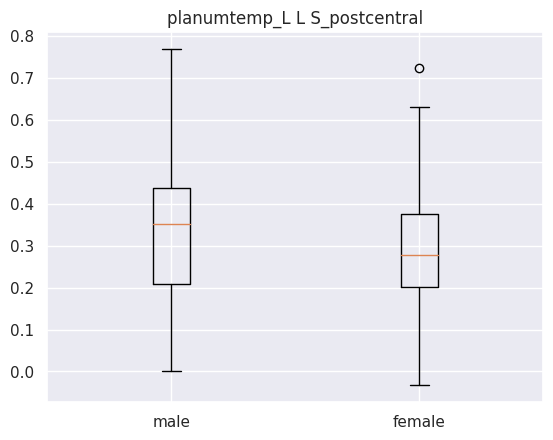

Ttest_indResult(statistic=3.3982524664602822, pvalue=0.0007393236091411032)
male mean : 0.33581050932090906
male std : 0.15519364606058975
female mean : 0.28810105651946905
female std : 0.14043859969892733


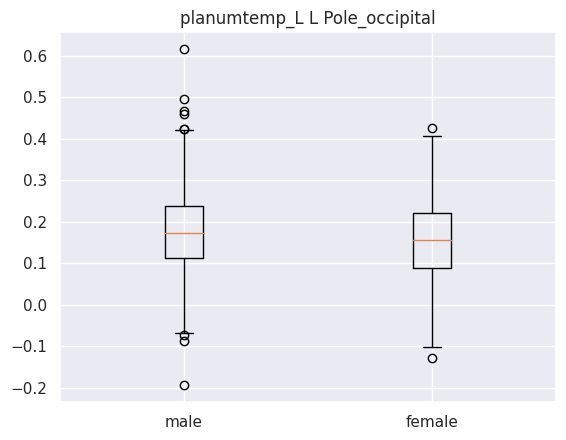

Ttest_indResult(statistic=2.8966477425742636, pvalue=0.003958114551412912)
male mean : 0.18402248281818182
male std : 0.11334589412846845
female mean : 0.1545630971402655
female std : 0.10073153762994376


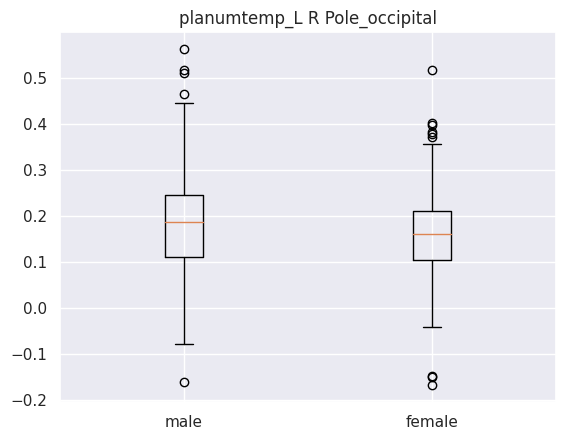

Ttest_indResult(statistic=3.1021672492680086, pvalue=0.002043621734370567)
male mean : 0.19048745212727272
male std : 0.11516897002896241
female mean : 0.15857792705907078
female std : 0.10129749612281899


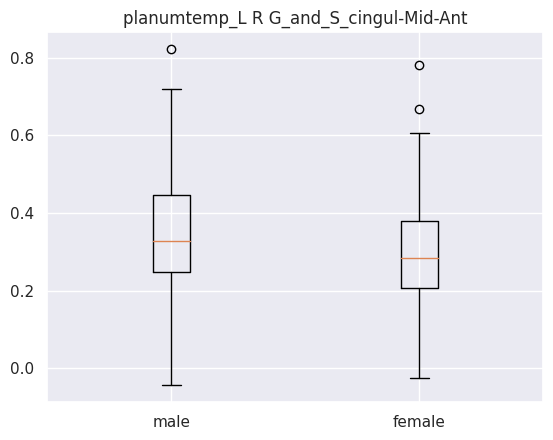

Ttest_indResult(statistic=3.8051753404859485, pvalue=0.00016157481517790111)
male mean : 0.3462315183818182
male std : 0.15279713785746743
female mean : 0.29550286457610614
female std : 0.1272706591388005


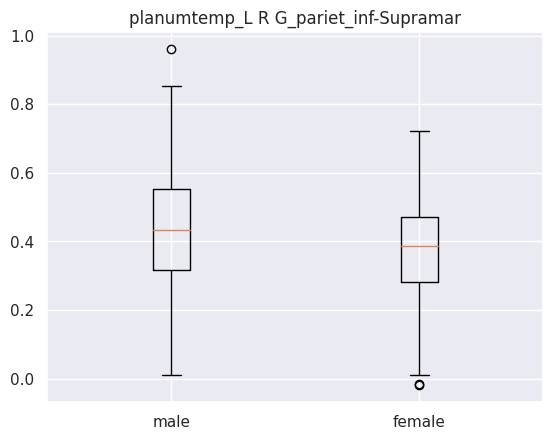

Ttest_indResult(statistic=3.40846885515764, pvalue=0.0007128702515509998)
male mean : 0.4307228165545455
male std : 0.17295636548930826
female mean : 0.3790449651415929
female std : 0.14569081362589828


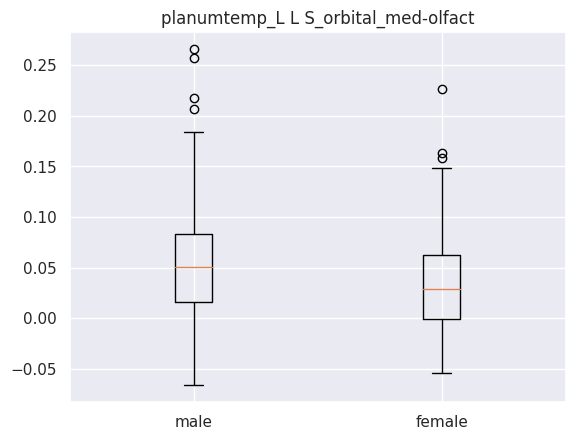

Ttest_indResult(statistic=4.612397849246387, pvalue=5.214176814315357e-06)
male mean : 0.05503674099986364
male std : 0.054886513859582514
female mean : 0.0327609114555531
female std : 0.04664601774192849
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['planumtemp_R']
-------------------------------------------------------------------------------------------------------
     coefficient          seed                       labels
108     0.257692  planumtemp_R      R G_temp_sup-Plan_polar
60      0.235041  planumtemp_R  L S_oc-temp_med_and_Lingual
121     0.229733  planumtemp_R      R S_circular_insula_inf
47      0.188215  planumtemp_R      L S_circular_insula_inf
71      0.179768  planumtemp_R             L S_temporal_inf
43      0.175604  planumtemp_R                L S_calcarine
34      0.173264  planumtemp_R      L G_temp_sup-Plan_polar
41      0.162008  planu

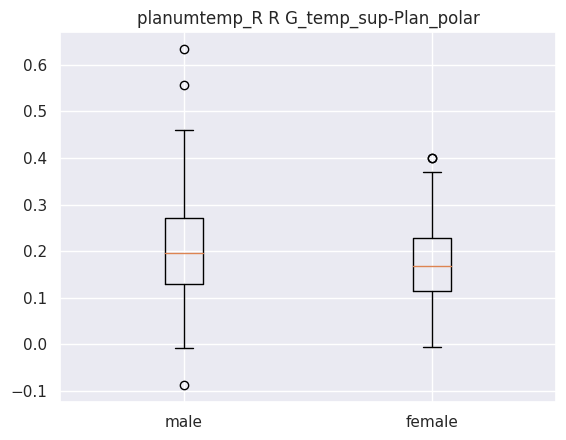

Ttest_indResult(statistic=3.411258353986623, pvalue=0.0007058022781917119)
male mean : 0.20694257242727274
male std : 0.10325686123318684
female mean : 0.17643976180088497
female std : 0.08445412241365245


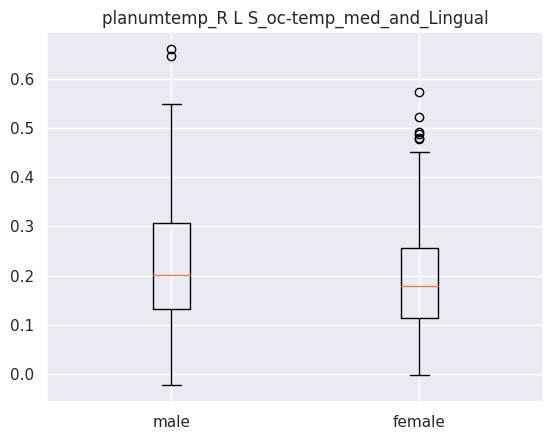

Ttest_indResult(statistic=3.1406026539933913, pvalue=0.001798634977217268)
male mean : 0.22554338915745453
male std : 0.12167229969009292
female mean : 0.19155830762477874
female std : 0.10599522757213717


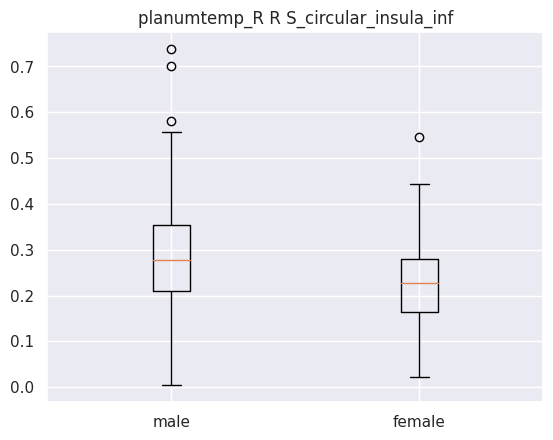

Ttest_indResult(statistic=5.673022197146965, pvalue=2.5335329424316272e-08)
male mean : 0.28464964156636363
male std : 0.11115068945139177
female mean : 0.22998609894690267
female std : 0.0911493316406924


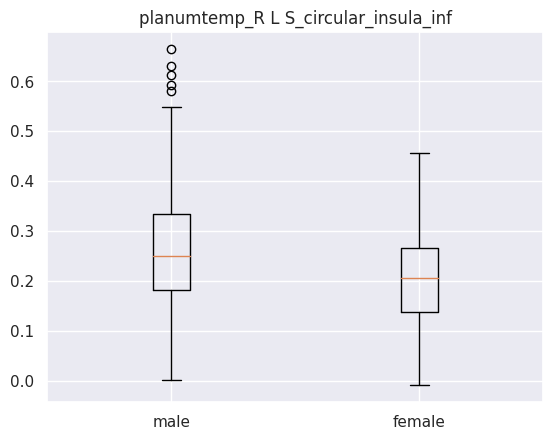

Ttest_indResult(statistic=5.536682319675686, pvalue=5.283850273823166e-08)
male mean : 0.26314078573
male std : 0.11589033220243106
female mean : 0.20795944492035398
female std : 0.09317104682445226


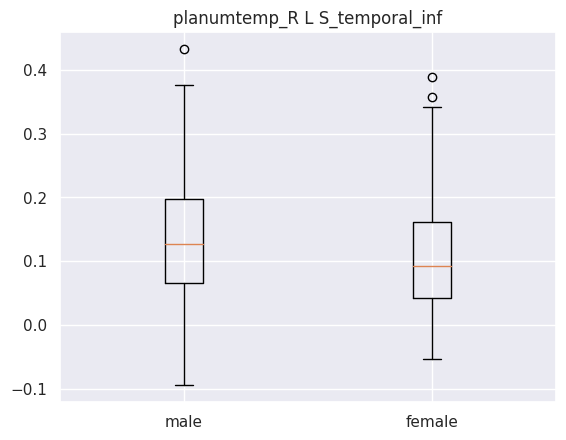

Ttest_indResult(statistic=3.5203211380713637, pvalue=0.00047555957279595007)
male mean : 0.13618860501363633
male std : 0.09803815107346184
female mean : 0.10560188299292035
female std : 0.08471995502464047


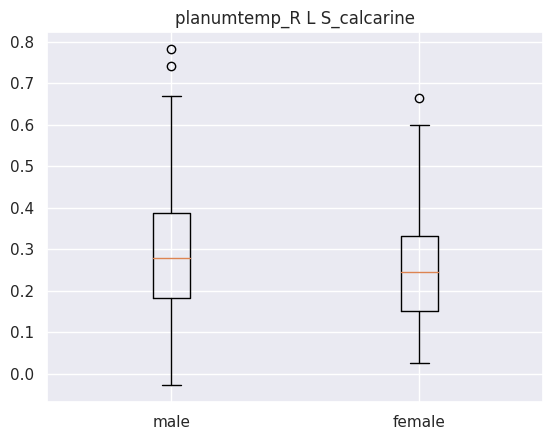

Ttest_indResult(statistic=3.077226310995013, pvalue=0.0022186529221928436)
male mean : 0.29213731421531824
male std : 0.1534333544769532
female mean : 0.2511115497699115
female std : 0.12653653671097487


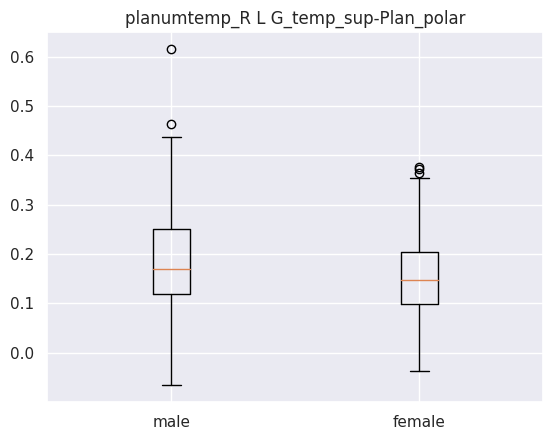

Ttest_indResult(statistic=3.9124736725367666, pvalue=0.0001056699302943903)
male mean : 0.18650230000727275
male std : 0.1005579266160588
female mean : 0.1531059958738938
female std : 0.07819243612625354


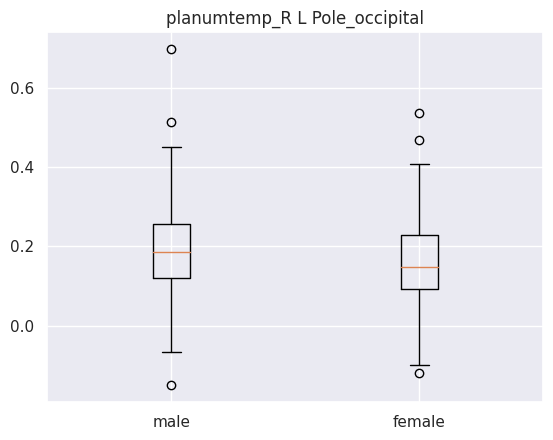

Ttest_indResult(statistic=3.0338050141925272, pvalue=0.002556601060476057)
male mean : 0.19206652156681817
male std : 0.1129203389533213
female mean : 0.16056218522699112
female std : 0.10585433102955759


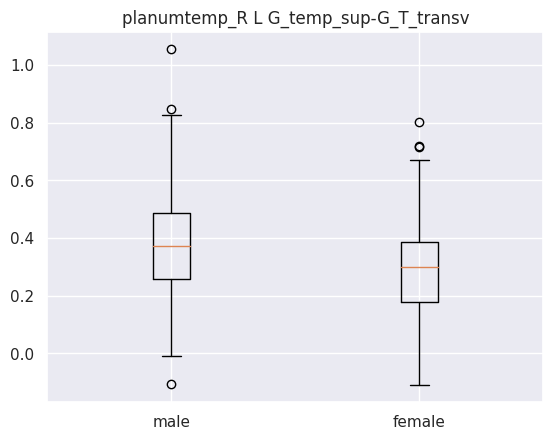

Ttest_indResult(statistic=5.327111610985564, pvalue=1.5894850932283935e-07)
male mean : 0.3784629311636364
male std : 0.18082731693617612
female mean : 0.29372215279778763
female std : 0.15359132563789854


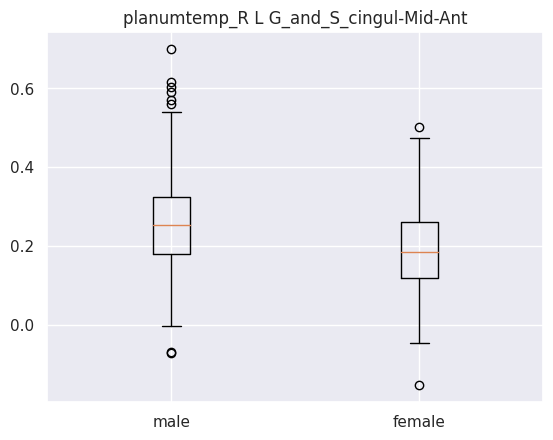

Ttest_indResult(statistic=6.465412310985327, pvalue=2.6667894778556934e-10)
male mean : 0.25810467424590905
male std : 0.12666036425502353
female mean : 0.18757680905309737
female std : 0.1021987914781494
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['opIFG_L', 'planumtemp_L', 'aMTG_L', 'pITG_L']
-------------------------------------------------------------------------------------------------------
     coefficient          seed                       labels
98      0.137036       opIFG_L       R G_pariet_inf-Angular
422     0.125975        aMTG_L             R S_front_middle
53      0.107239       opIFG_L                L S_front_sup
351     0.104548        aMTG_L  L S_intrapariet_and_P_trans
66      0.104450       opIFG_L              L S_postcentral
234     0.094052  planumtemp_L        R G_front_inf-Orbital
379     0.093282        aMTG_L      R G_cingul-Post-

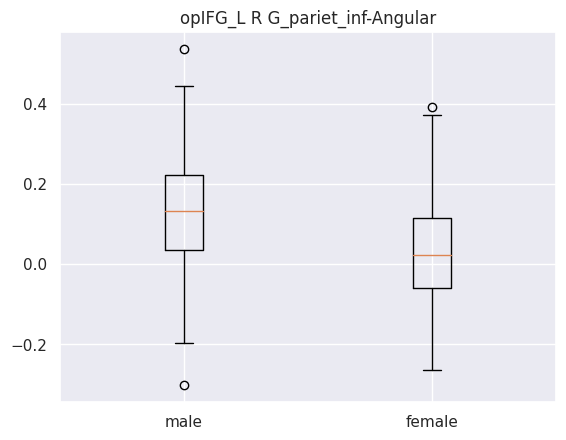

Ttest_indResult(statistic=7.24780487230096, pvalue=1.8918423767886693e-12)
male mean : 0.12424016548681818
male std : 0.13424300726761648
female mean : 0.03453558849026549
female std : 0.1265180924203619


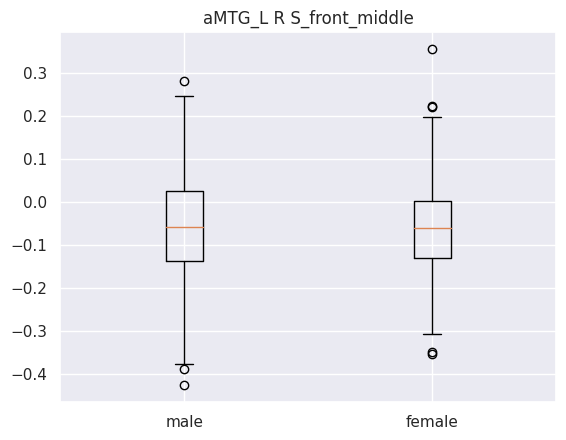

Ttest_indResult(statistic=-0.1288149656454001, pvalue=0.8975623921747511)
male mean : -0.06136301187972727
male std : 0.12937809167247663
female mean : -0.05989662055278762
female std : 0.10994256393017068


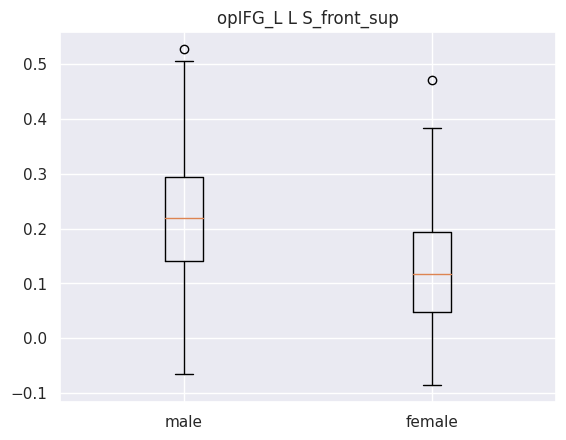

Ttest_indResult(statistic=9.514226955534408, pvalue=1.1745948061525577e-19)
male mean : 0.22193633239999996
male std : 0.11249626112199279
female mean : 0.12588911007571682
female std : 0.10000267392277586


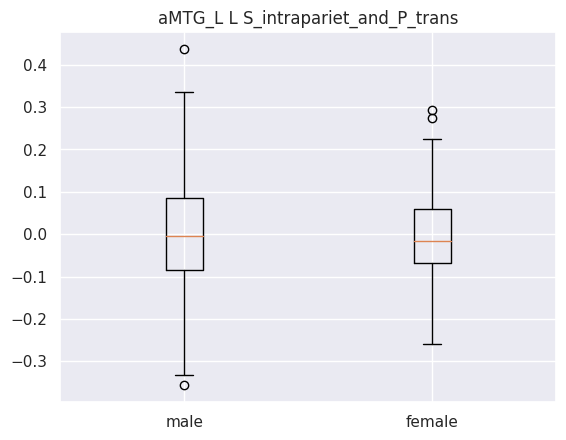

Ttest_indResult(statistic=1.0441439448576817, pvalue=0.29698694253266955)
male mean : 0.004413317491818183
male std : 0.12667357592144304
female mean : -0.006823133387610619
female std : 0.09870796418027704


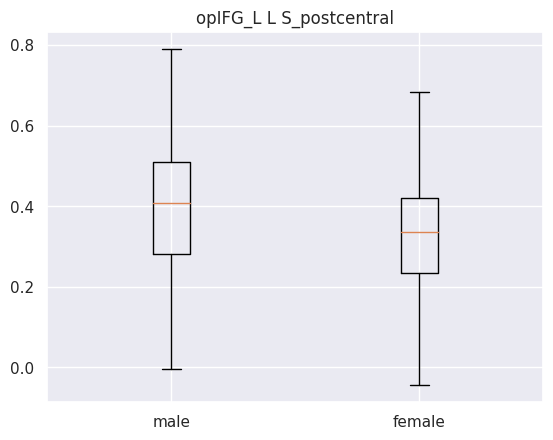

Ttest_indResult(statistic=5.176173981414192, pvalue=3.43837391925615e-07)
male mean : 0.4032316063681817
male std : 0.1555923989988481
female mean : 0.33058522653097344
female std : 0.13990642927460226


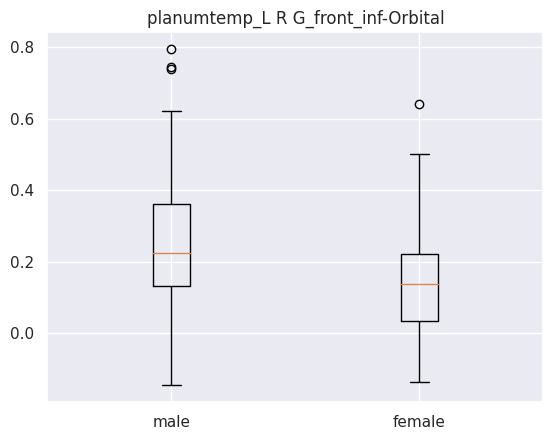

Ttest_indResult(statistic=7.8052472861239455, pvalue=4.301782597970894e-14)
male mean : 0.24620069368954547
male std : 0.16223879526985452
female mean : 0.13694807325752212
female std : 0.131482454749017


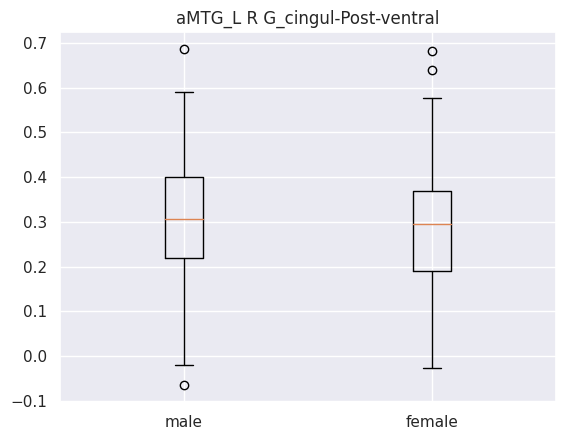

Ttest_indResult(statistic=1.8738792848668957, pvalue=0.06160360622903291)
male mean : 0.30625412715000006
male std : 0.13256098239856265
female mean : 0.28295946666194693
female std : 0.12938146719020743


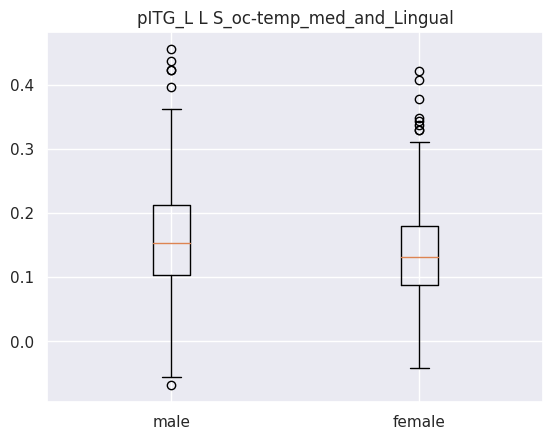

Ttest_indResult(statistic=2.534887051635256, pvalue=0.011590690703500536)
male mean : 0.16269696059577277
male std : 0.09227264486380996
female mean : 0.14188002446283188
female std : 0.08051104486564893


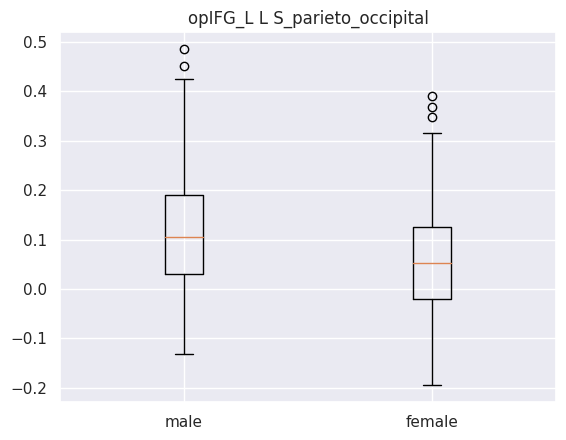

Ttest_indResult(statistic=5.610433302239221, pvalue=3.5567601770632e-08)
male mean : 0.11807421377392727
male std : 0.12128577150079514
female mean : 0.0581894286120354
female std : 0.10311460381263064


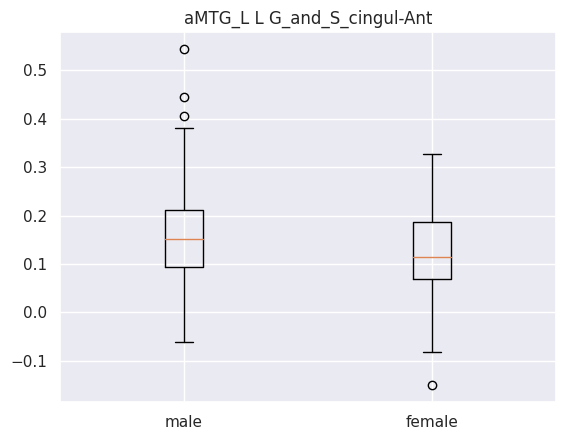

Ttest_indResult(statistic=4.307060944860257, pvalue=2.038136442014065e-05)
male mean : 0.16099100311954548
male std : 0.0980609784038807
female mean : 0.1242215932681416
female std : 0.08124741946330903
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['opIFG_R', 'planumtemp_R', 'aMTG_R', 'pITG_R']
-------------------------------------------------------------------------------------------------------
     coefficient          seed                       labels
421     0.130591        aMTG_R                R S_front_inf
189     0.117774  planumtemp_R             L Pole_occipital
66      0.110589       opIFG_R              L S_postcentral
498     0.106838        pITG_R       L S_interm_prim-Jensen
120     0.105263       opIFG_R      R S_circular_insula_ant
502     0.105118        pITG_R            L S_occipital_ant
316     0.103617        aMTG_R      L G_oc-temp_lat-fu

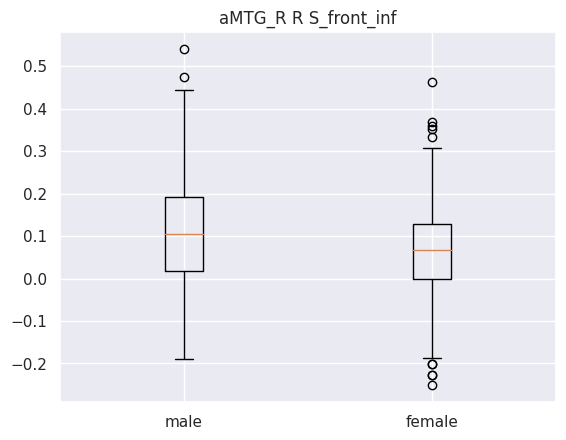

Ttest_indResult(statistic=3.956278857457922, pvalue=8.86001863789618e-05)
male mean : 0.10791621693545454
male std : 0.12931995413969696
female mean : 0.06154310212610619
female std : 0.11751957032303513


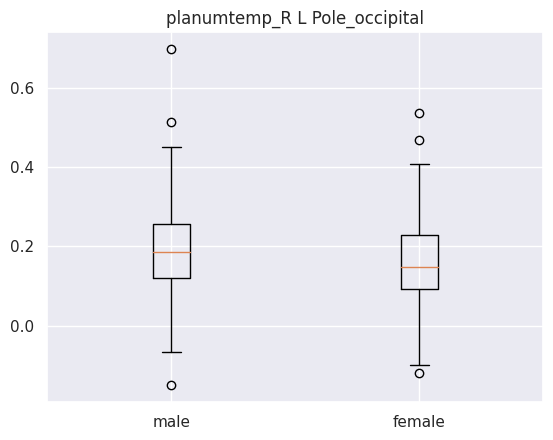

Ttest_indResult(statistic=3.0338050141925272, pvalue=0.002556601060476057)
male mean : 0.19206652156681817
male std : 0.1129203389533213
female mean : 0.16056218522699112
female std : 0.10585433102955759


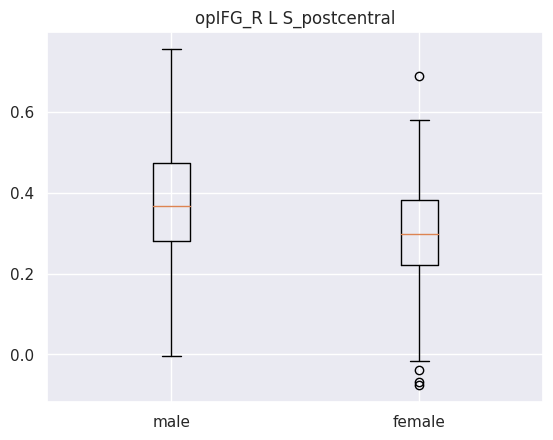

Ttest_indResult(statistic=5.748096942910928, pvalue=1.6798182257112908e-08)
male mean : 0.37275803086818177
male std : 0.13910319518939593
female mean : 0.29995721800884956
female std : 0.12765335683486648


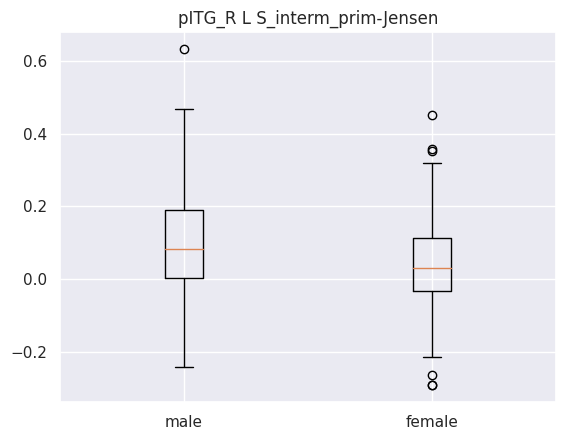

Ttest_indResult(statistic=5.007996133956906, pvalue=7.949942585866972e-07)
male mean : 0.0980466264909091
male std : 0.14302591474588874
female mean : 0.035939954145840704
female std : 0.11734710737051729


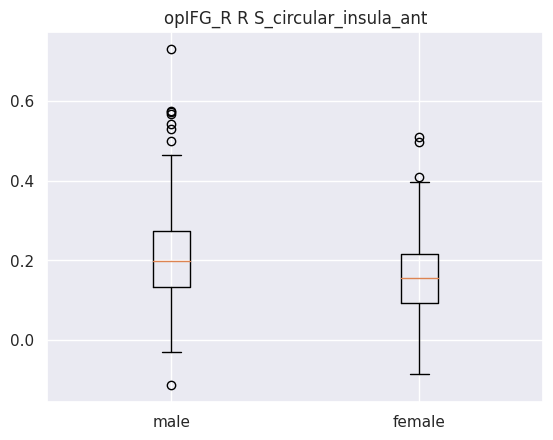

Ttest_indResult(statistic=5.2924843036655735, pvalue=1.9003389567791272e-07)
male mean : 0.21558394754363636
male std : 0.12082565507412785
female mean : 0.15951880155575224
female std : 0.10181469485023342


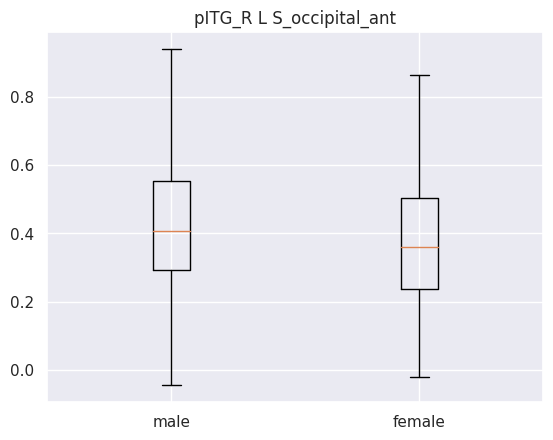

Ttest_indResult(statistic=2.404235146691141, pvalue=0.016615050670348956)
male mean : 0.41801690174090916
male std : 0.18448765190931446
female mean : 0.376694192960177
female std : 0.1776694904570346


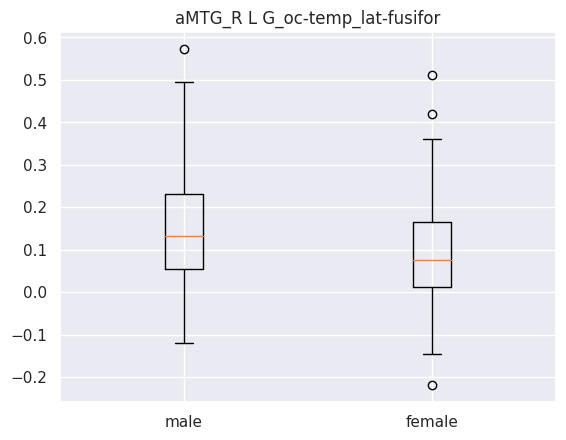

Ttest_indResult(statistic=5.157132505636498, pvalue=3.7849853475325553e-07)
male mean : 0.15163267344727274
male std : 0.13083327172091533
female mean : 0.09148790766993664
female std : 0.11456737640495235


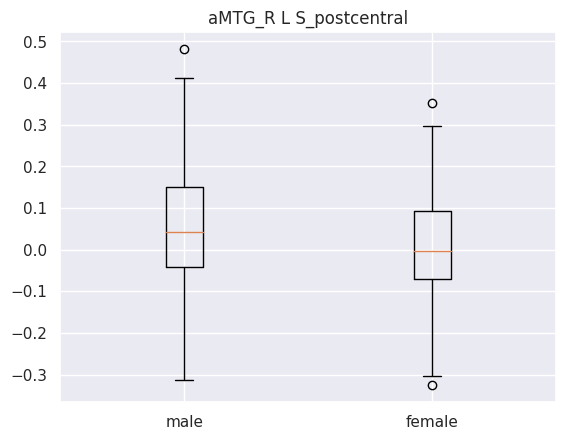

Ttest_indResult(statistic=2.627621292338559, pvalue=0.008896140355824254)
male mean : 0.04901591075681818
male std : 0.13953276104441498
female mean : 0.016055526186592915
female std : 0.12453371759228786


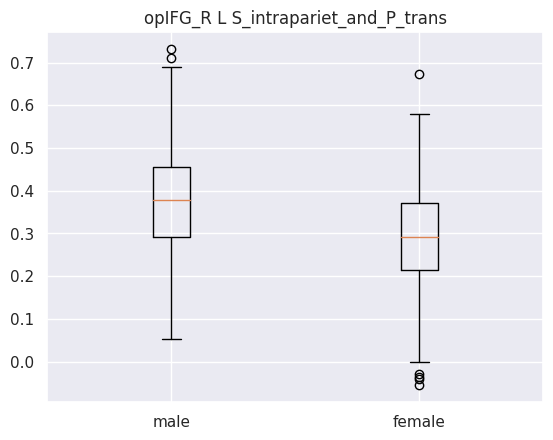

Ttest_indResult(statistic=7.525715474692434, pvalue=2.943978024764579e-13)
male mean : 0.3783558262136364
male std : 0.13092386861978492
female mean : 0.2881963432641593
female std : 0.1214409141686982


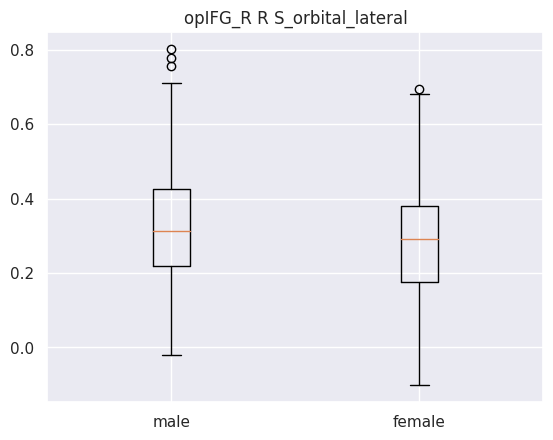

Ttest_indResult(statistic=2.744861835289781, pvalue=0.006299189228159366)
male mean : 0.3271381634947727
male std : 0.15738718014219788
female mean : 0.28616663755176996
female std : 0.15711147119637517
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []




In [89]:
for result in all_results:
    if result == results_path_all_seed:
        rois = ["opIFG_L", "planumtemp_L", "aMTG_L", "pITG_L", "opIFG_R", "planumtemp_R", "aMTG_R", "pITG_R"] # modified to rois of interest
    elif result == results_path_aMTG_L:
        rois = ["aMTG_L"]
    elif result == results_path_aMTG_R:
        rois = ["aMTG_R"]
    elif result == results_path_opIFG_L:
        rois = ["opIFG_L"]
    elif result == results_path_opIFG_R:
        rois = ["opIFG_R"]
    elif result == results_path_pITG_L:
        rois = ["pITG_L"]
    elif result == results_path_pITG_R:
        rois = ["pITG_R"]
    elif result == results_path_planumtemp_L:
        rois = ["planumtemp_L"]
    elif result == results_path_planumtemp_R:
        rois = ["planumtemp_R"]
    elif result == results_path_all_left:
        rois = ["opIFG_L", "planumtemp_L", "aMTG_L", "pITG_L"]
    elif result == results_path_all_right:
        rois = ["opIFG_R", "planumtemp_R", "aMTG_R", "pITG_R"]
    print("-------------------------------------------------------------------------------------------------------")
    print(rois)
    print("-------------------------------------------------------------------------------------------------------")
    moyenne, scoresZ, pvalue, data_results = compute_results(result)
    ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
    sensitivity = data_results["confusion_matrix"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
    specificity = data_results["confusion_matrix"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
    print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
    print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))
    print("Validation accuracy")
    moyenne, scoresZ, pvalue, data_results = compute_results(result)
    pdList = []
    pdList.extend(data_results["confusion_matrix_validation"])
    concat_df = pd.concat(pdList)
    mean_confusion = concat_df.groupby(concat_df.index)
    mean_confusion = mean_confusion.mean()
    sensitivity, specificity = sensitivity_specificity(mean_confusion)
    print("Sensitivity : " + str(sensitivity))
    print("Specificity : " + str(specificity))
    print("mean Accuracy validation : " + str(data_results["acc_validation"].mean()))
    bestRegion(ROIs, data, df_boot)
    print("\n")


# Results no 02

In [12]:
study_dir = Path('/data/brambati/dataset/HCP/derivatives/training_sex_diff/results_no_02/LinearSVC/')
results_path_all_seed = study_dir / "seed-all_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_aMTG_L = study_dir / "seed-aMTG_L_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_aMTG_R = study_dir / "seed-aMTG_R_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_opIFG_L = study_dir / "seed-opIFG_L_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_opIFG_R = study_dir / "seed-opIFG_R_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_pITG_L = study_dir / "seed-pITG_L_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_pITG_R = study_dir / "seed-pITG_R_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_planumtemp_L = study_dir / "seed-planumtemp_L_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_planumtemp_R = study_dir / "seed-planumtemp_R_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_all_left = study_dir / "seed-left_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_all_right = study_dir / "seed-right_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
all_results = [results_path_all_seed, results_path_aMTG_L, results_path_aMTG_R, results_path_opIFG_L, results_path_opIFG_R, results_path_pITG_L, results_path_pITG_R, results_path_planumtemp_L, results_path_planumtemp_R, results_path_all_left, results_path_all_right]

In [13]:
# fetching label from destrieux atlas minus two labels not used
atlas_dest = datasets.fetch_atlas_destrieux_2009(legacy_format=False)
label = atlas_dest["labels"].drop([0,42,117]) # correction for the destrieux atlas labels
label = label.reset_index()

[get_dataset_dir] Dataset found in /home/cderoy/nilearn_data/destrieux_2009


-------------------------------------------------------------------------------------------------------
['opIFG_L', 'planumtemp_L', 'aMTG_L', 'pITG_L', 'opIFG_R', 'planumtemp_R', 'aMTG_R', 'pITG_R']
-------------------------------------------------------------------------------------------------------
      coefficient          seed                       labels
263      0.071801  planumtemp_L             R Pole_occipital
98       0.066985       opIFG_L       R G_pariet_inf-Angular
1090     0.066145        pITG_R       L S_interm_prim-Jensen
189      0.063483  planumtemp_L             L Pole_occipital
351      0.051789        aMTG_L  L S_intrapariet_and_P_trans
379      0.051756        aMTG_L      R G_cingul-Post-ventral
53       0.051418       opIFG_L                L S_front_sup
1094     0.051398        pITG_R            L S_occipital_ant
908      0.050601        aMTG_R      L G_oc-temp_lat-fusifor
464      0.049779        pITG_L      L G_oc-temp_lat-fusifor
The mean accuracy : 0.9134

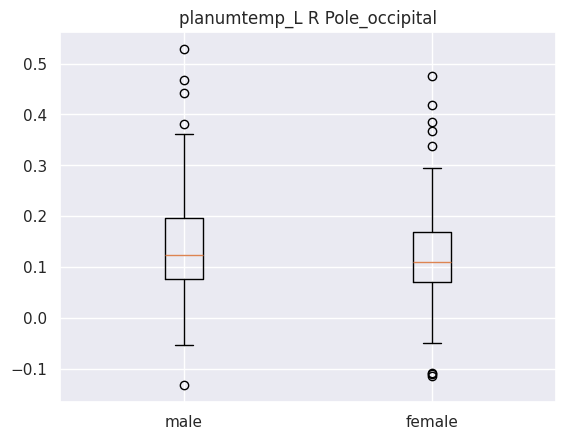

TtestResult(statistic=2.8830971461363837, pvalue=0.004129116113029113, df=444.0)
male mean : 0.1450978958106635
male std : 0.09686778643219356
female mean : 0.1200056767894468
female std : 0.08651973830457439


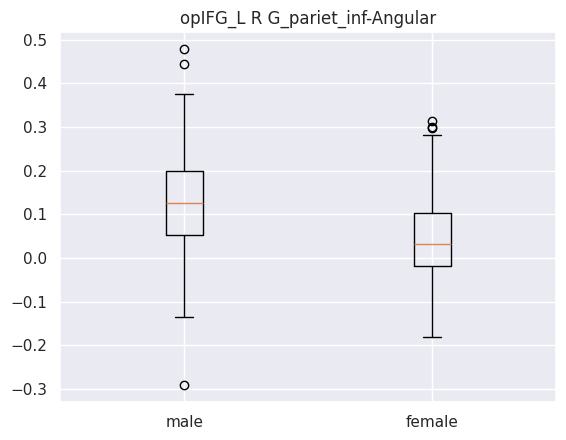

TtestResult(statistic=8.36453316136448, pvalue=7.884044598818814e-16, df=444.0)
male mean : 0.12652099691800947
male std : 0.11205031629586265
female mean : 0.04436252679727659
female std : 0.09482727144561362


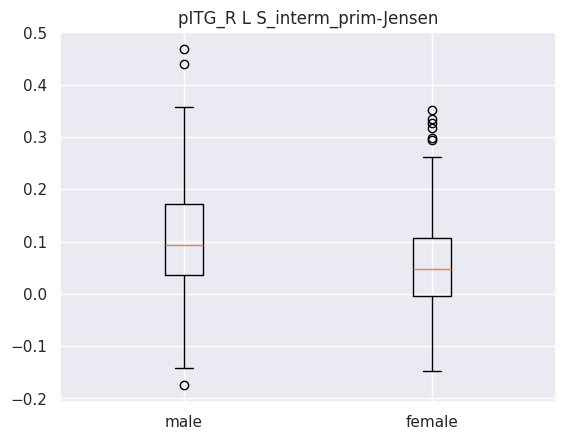

TtestResult(statistic=4.641000164550433, pvalue=4.570899935707834e-06, df=444.0)
male mean : 0.10024204454407584
male std : 0.10899325004998278
female mean : 0.056442184588638304
female std : 0.08968164578380426


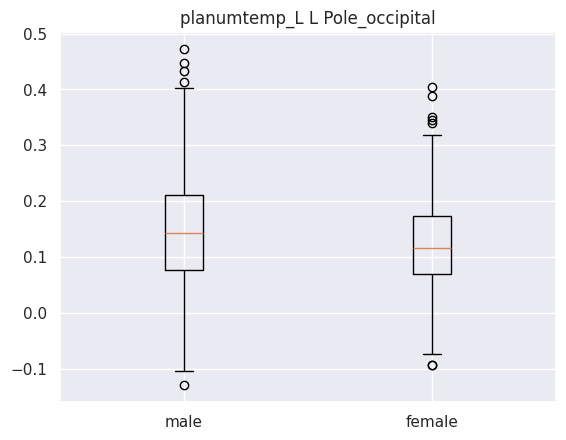

TtestResult(statistic=3.2624503110074787, pvalue=0.0011897491547535647, df=444.0)
male mean : 0.1509238786113744
male std : 0.0973540374590649
female mean : 0.12269890486851065
female std : 0.08492474456953504


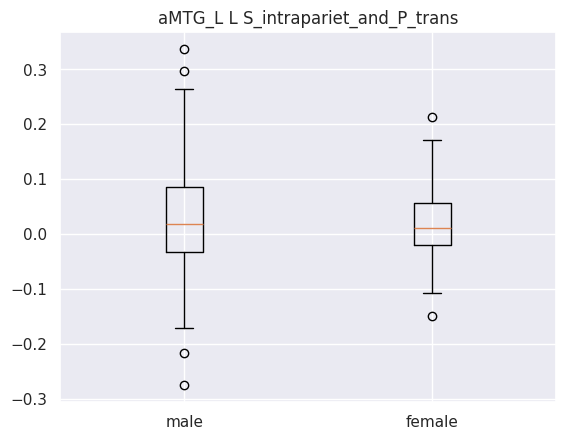

TtestResult(statistic=1.2152906043525493, pvalue=0.22490110147854064, df=444.0)
male mean : 0.027097741051184836
male std : 0.08743934494614101
female mean : 0.018400407782408514
female std : 0.06239762751688975


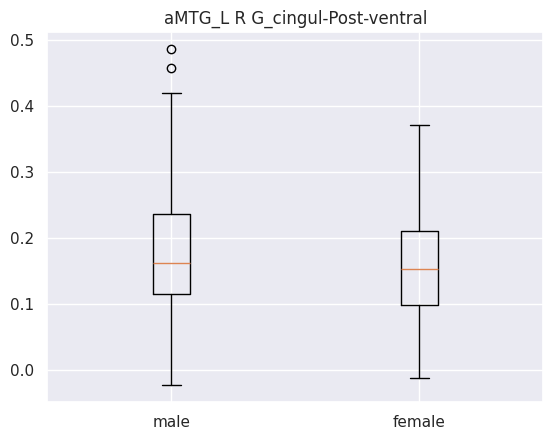

TtestResult(statistic=2.478307431460077, pvalue=0.013571417975220301, df=444.0)
male mean : 0.1782777795241706
male std : 0.09158518564726134
female mean : 0.15829262448893616
female std : 0.07828345293295201


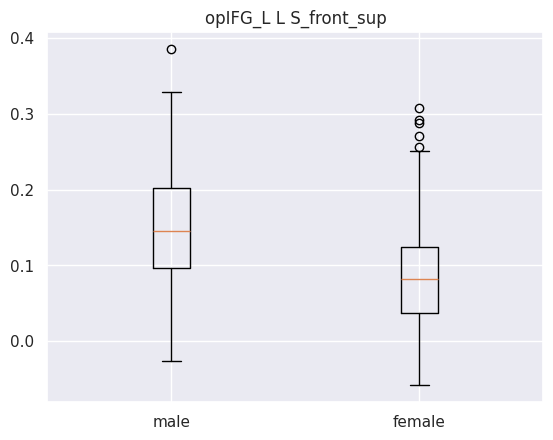

TtestResult(statistic=9.392381535030605, pvalue=3.0963588871687413e-19, df=444.0)
male mean : 0.15022324893838862
male std : 0.07243933596507521
female mean : 0.08831146950076596
female std : 0.06644850251834429


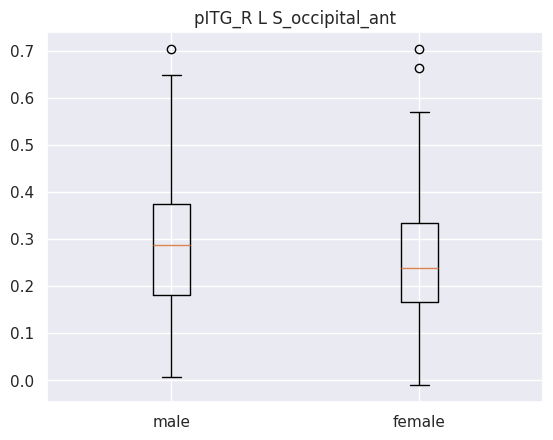

TtestResult(statistic=3.1195843617914436, pvalue=0.0019290290051488148, df=444.0)
male mean : 0.2941864701189574
male std : 0.14464420290564173
female mean : 0.2541460874319149
female std : 0.12577495870736924


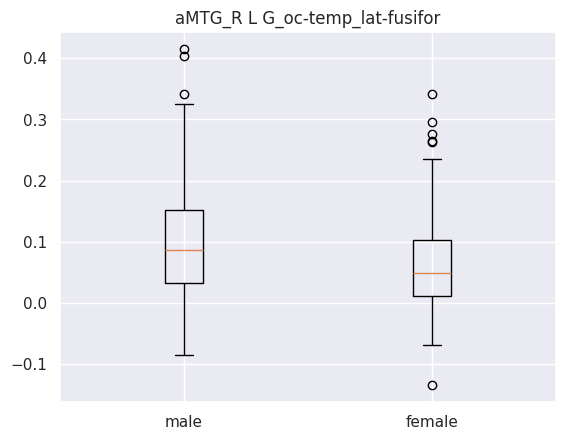

TtestResult(statistic=4.728335977215177, pvalue=3.0449299231438466e-06, df=444.0)
male mean : 0.10049291556744076
male std : 0.08873256390651249
female mean : 0.06442563383957446
female std : 0.07178152602552673


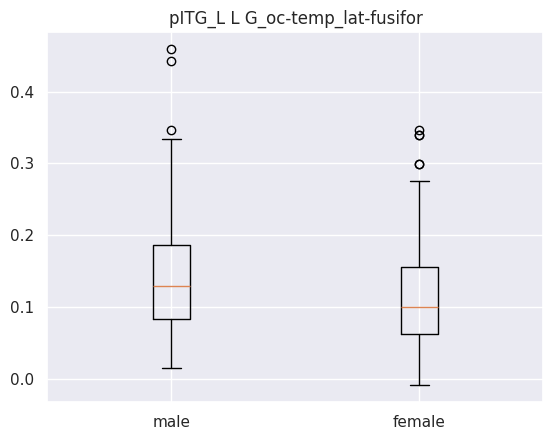

TtestResult(statistic=3.275834050563673, pvalue=0.0011360567722706225, df=444.0)
male mean : 0.13928527996682463
male std : 0.07670719318097458
female mean : 0.11658672618927658
female std : 0.06929713865976829
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['aMTG_L']
-------------------------------------------------------------------------------------------------------
     coefficient    seed                       labels
53      0.167188  aMTG_L                L S_front_sup
98      0.154625  aMTG_L       R G_pariet_inf-Angular
66      0.128913  aMTG_L              L S_postcentral
55      0.127359  aMTG_L  L S_intrapariet_and_P_trans
120     0.104863  aMTG_L      R S_circular_insula_ant
4       0.099770  aMTG_L   L G_and_S_transv_frontopol
61      0.099123  aMTG_L          L S_orbital_lateral
22      0.096935  aMTG_L      L G_oc-temp_med-Parahip
87      0.096706 

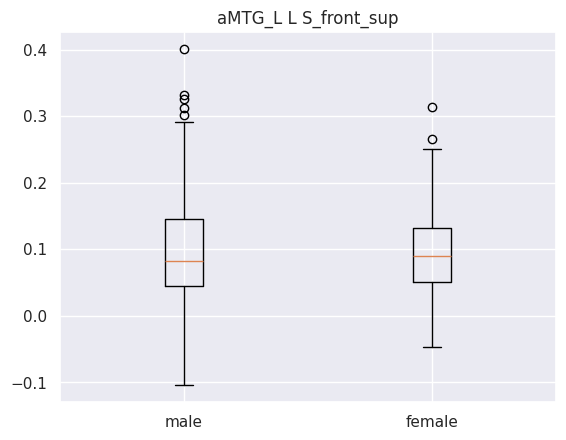

TtestResult(statistic=0.4912011671391859, pvalue=0.6235268805717777, df=444.0)
male mean : 0.09901800113601895
male std : 0.08021406273503431
female mean : 0.09568149075004256
female std : 0.06256558160246363


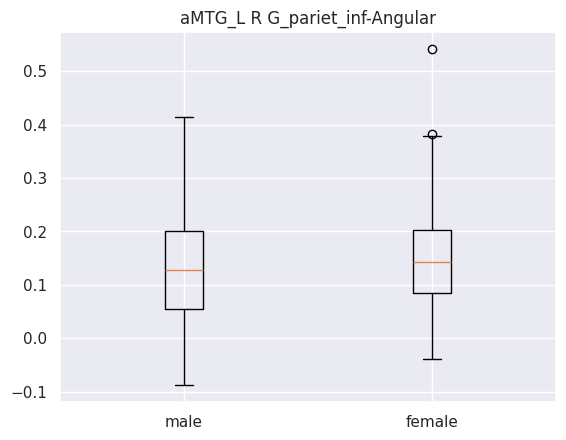

TtestResult(statistic=-2.1723621426356496, pvalue=0.030356740864042407, df=444.0)
male mean : 0.12969719007914693
male std : 0.10428542215805199
female mean : 0.14967700446608512
female std : 0.08946319459623692


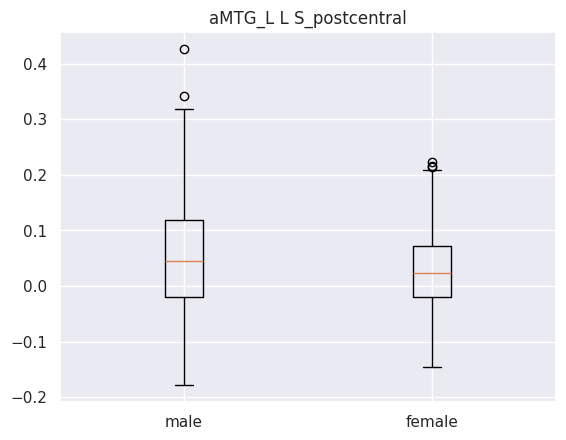

TtestResult(statistic=2.882791660383052, pvalue=0.004133047563661108, df=444.0)
male mean : 0.05474735993696683
male std : 0.09842588151574011
female mean : 0.031134386966170213
female std : 0.0734492087772794


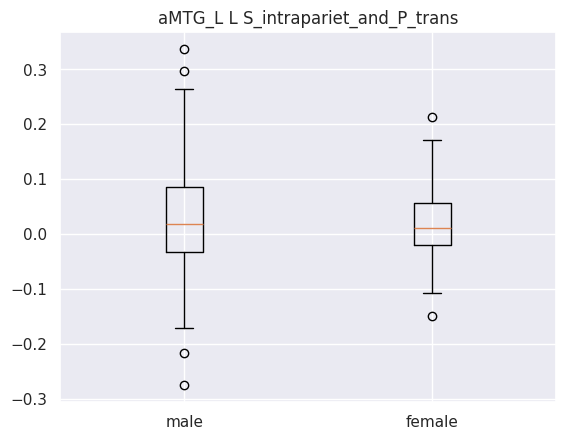

TtestResult(statistic=1.2152906043525493, pvalue=0.22490110147854064, df=444.0)
male mean : 0.027097741051184836
male std : 0.08743934494614101
female mean : 0.018400407782408514
female std : 0.06239762751688975


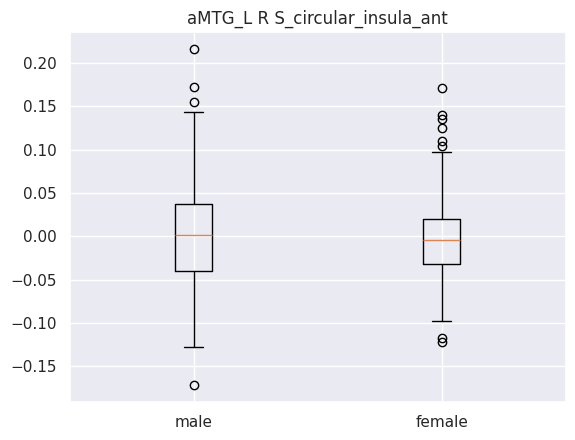

TtestResult(statistic=1.0675361148925908, pvalue=0.2863099057689824, df=444.0)
male mean : 0.0041714620607109015
male std : 0.06150850708774946
female mean : -0.0013528425582042553
female std : 0.04720231424207986


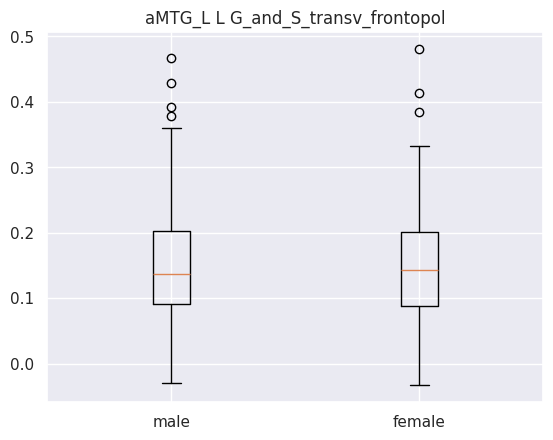

TtestResult(statistic=0.5773645319947094, pvalue=0.5639858742675287, df=444.0)
male mean : 0.15167272553592415
male std : 0.08338962473270713
female mean : 0.14714256017404256
female std : 0.08178101114464006


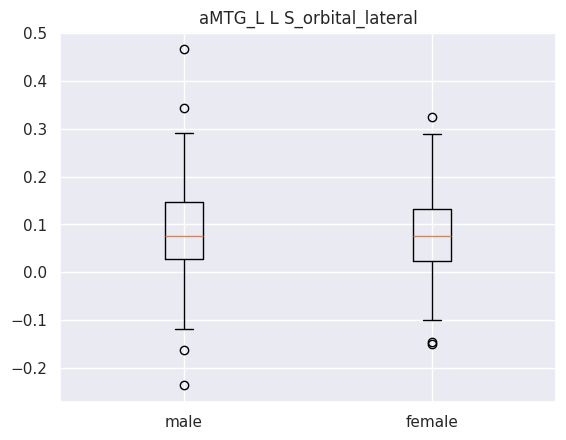

TtestResult(statistic=0.3199348330099824, pvalue=0.7491682265363367, df=444.0)
male mean : 0.08535453124069668
male std : 0.09821864005564646
female mean : 0.08268680981689362
female std : 0.07709003716886952


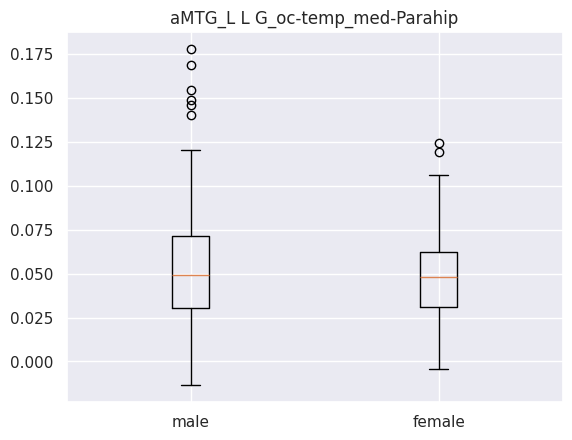

TtestResult(statistic=2.2581695728877578, pvalue=0.02441978882668705, df=444.0)
male mean : 0.05438222978056872
male std : 0.03175542035266642
female mean : 0.04845148728297872
female std : 0.023312445494557528


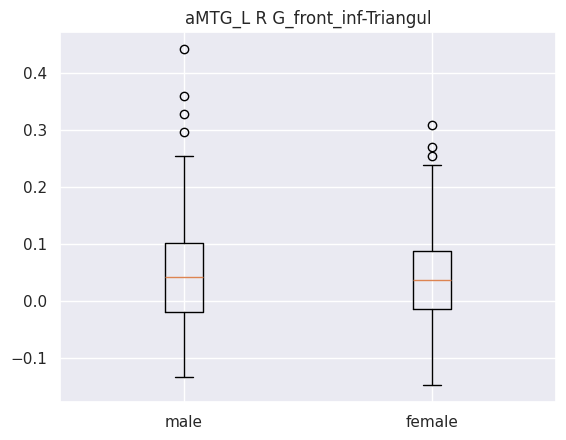

TtestResult(statistic=1.1136444490847257, pvalue=0.2660342606775769, df=444.0)
male mean : 0.04780451582393365
male std : 0.09392880446256563
female mean : 0.03872038397625532
female std : 0.07781453955141797


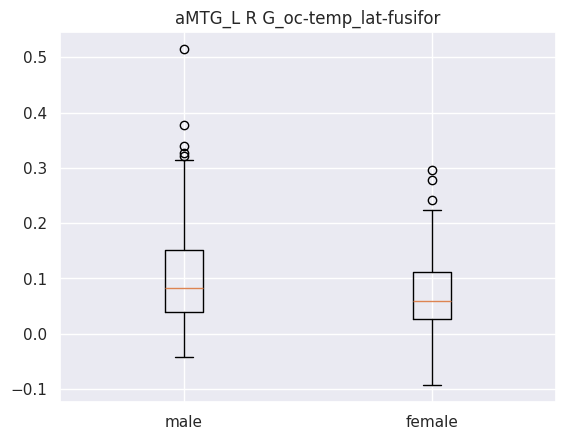

TtestResult(statistic=3.9890782405857905, pvalue=7.75671950399375e-05, df=444.0)
male mean : 0.10126961897914692
male std : 0.08443809661000735
female mean : 0.07311385128434042
female std : 0.06374086851244683
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['aMTG_R']
-------------------------------------------------------------------------------------------------------
    coefficient    seed                       labels
66     0.149726  aMTG_R              L S_postcentral
53     0.145524  aMTG_R                L S_front_sup
61     0.131617  aMTG_R          L S_orbital_lateral
55     0.130347  aMTG_R  L S_intrapariet_and_P_trans
98     0.121201  aMTG_R       R G_pariet_inf-Angular
26     0.118028  aMTG_R             L G_parietal_sup
60     0.104617  aMTG_R  L S_oc-temp_med_and_Lingual
22     0.100576  aMTG_R      L G_oc-temp_med-Parahip
64     0.097528  aMTG_R   

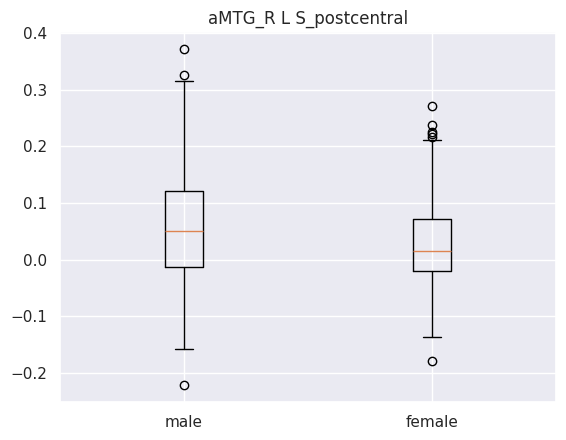

TtestResult(statistic=3.2621192404829027, pvalue=0.0011911066695271103, df=444.0)
male mean : 0.05576313479056872
male std : 0.10024889344091951
female mean : 0.028023138414468084
female std : 0.07852409778544568


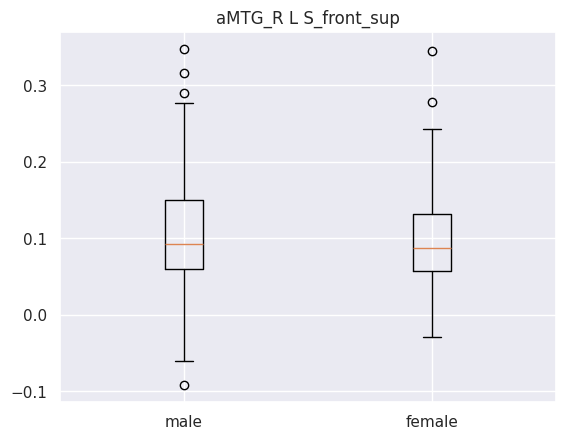

TtestResult(statistic=1.564042781797013, pvalue=0.11851995002345059, df=444.0)
male mean : 0.10693948500895735
male std : 0.07478829608267772
female mean : 0.09699578648144681
female std : 0.05889279214380111


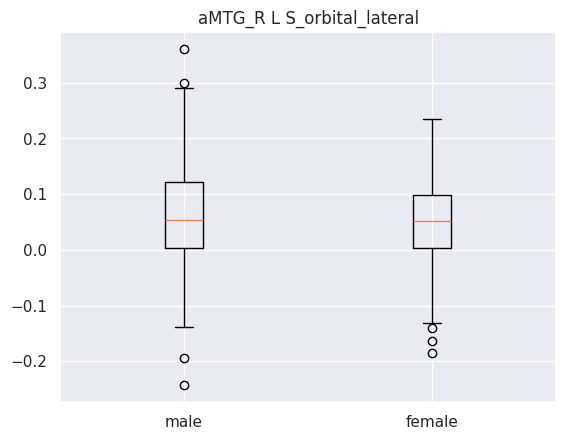

TtestResult(statistic=1.1696231399029458, pvalue=0.24278014683835317, df=444.0)
male mean : 0.06070153717054502
male std : 0.09239990232603817
female mean : 0.051424428961617016
female std : 0.07449227115106766


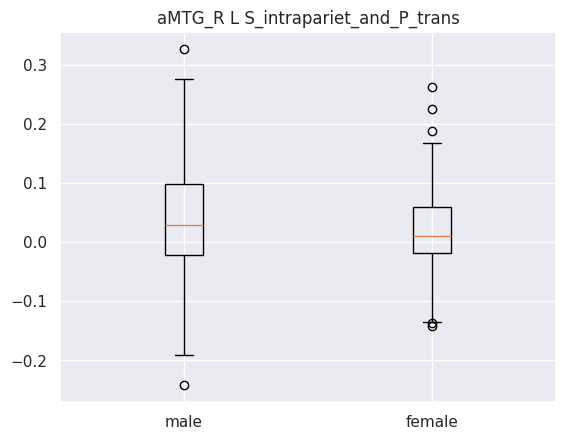

TtestResult(statistic=2.081480658940821, pvalue=0.03796229115090335, df=444.0)
male mean : 0.037425105367109
male std : 0.08994466337849082
female mean : 0.022057734861787238
female std : 0.06469646602839184


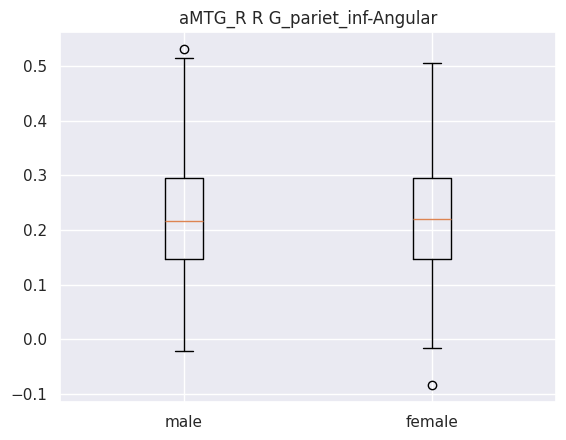

TtestResult(statistic=0.1988369728519595, pvalue=0.8424812902535094, df=444.0)
male mean : 0.22602510577014218
male std : 0.11163822771481056
female mean : 0.22400918702978725
female std : 0.10198631482703578


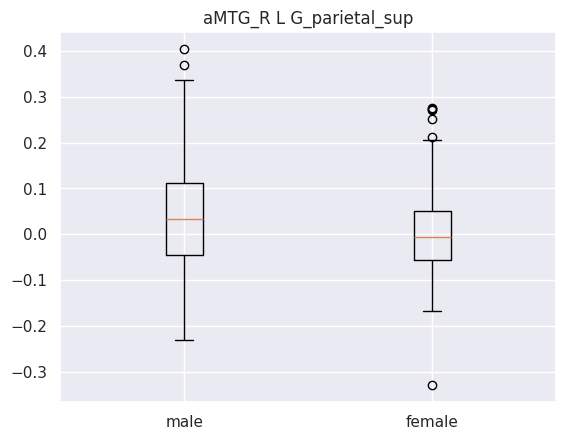

TtestResult(statistic=3.76235599868462, pvalue=0.00019088786796284696, df=444.0)
male mean : 0.04160714930995261
male std : 0.11793244485715922
female mean : 0.00472317503893617
female std : 0.08774968394654699


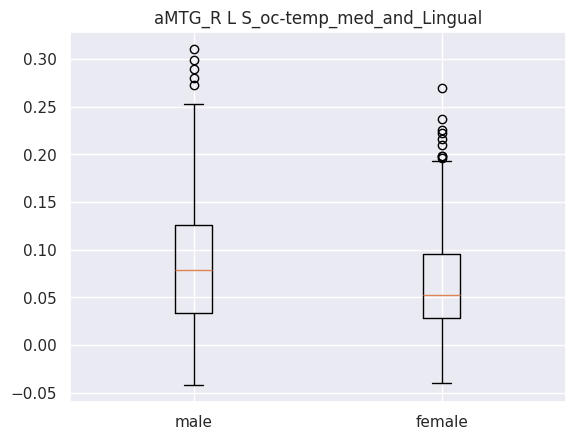

TtestResult(statistic=3.446465168906783, pvalue=0.0006220350531002364, df=444.0)
male mean : 0.08800415721516588
male std : 0.06792538797798878
female mean : 0.0676203209081702
female std : 0.056613589507009815


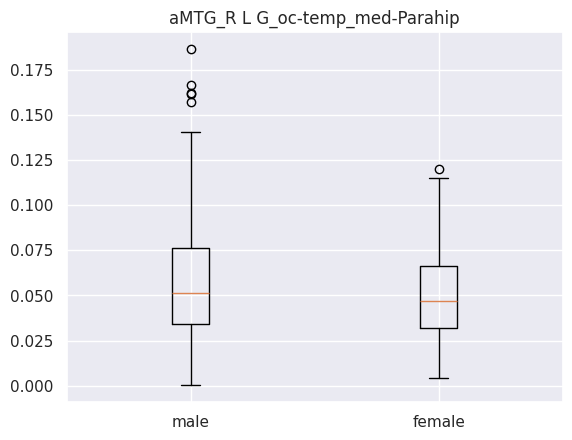

TtestResult(statistic=2.725752437980722, pvalue=0.006669202626596385, df=444.0)
male mean : 0.05781494194170617
male std : 0.03243982230042115
female mean : 0.050390622182978725
female std : 0.02476899224526237


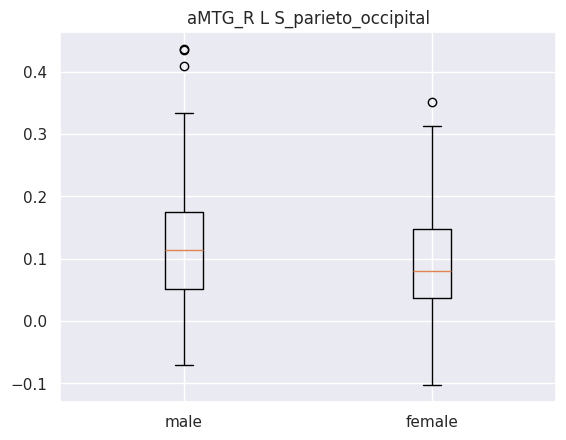

TtestResult(statistic=3.119116380110821, pvalue=0.001932028987808918, df=444.0)
male mean : 0.12120939217464455
male std : 0.09217554941861114
female mean : 0.095776577844
female std : 0.07960446515802458


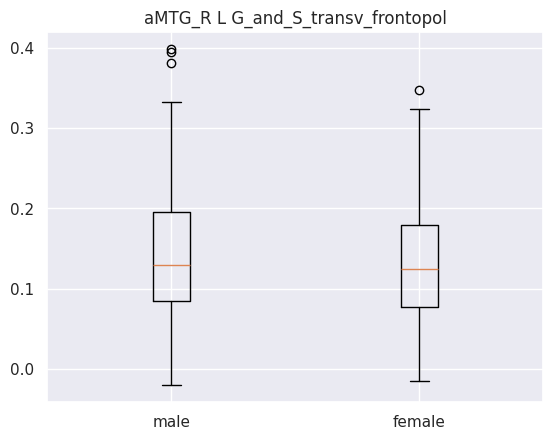

TtestResult(statistic=1.7030045611108224, pvalue=0.08926704420804905, df=444.0)
male mean : 0.1414880885563981
male std : 0.07746647306061678
female mean : 0.1296405444612766
female std : 0.06912270319897588
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['opIFG_L']
-------------------------------------------------------------------------------------------------------
     coefficient     seed                       labels
20      0.180546  opIFG_L      L G_oc-temp_lat-fusifor
144     0.137426  opIFG_L              R S_subparietal
86      0.132436  opIFG_L        R G_front_inf-Orbital
115     0.128835  opIFG_L             R Pole_occipital
125     0.109298  opIFG_L                R S_front_inf
41      0.107472  opIFG_L             L Pole_occipital
80      0.101964  opIFG_L     R G_and_S_cingul-Mid-Ant
84      0.098485  opIFG_L                   R G_cuneus
47      0.

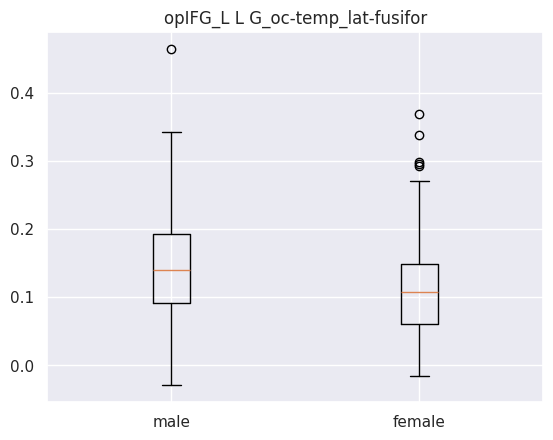

TtestResult(statistic=4.663171131013658, pvalue=4.125472266036231e-06, df=444.0)
male mean : 0.14554618908672984
male std : 0.07549904604302277
female mean : 0.11419731319319149
female std : 0.06614540398812135


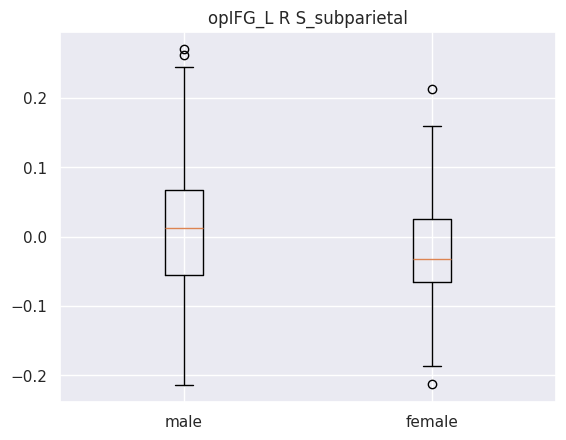

TtestResult(statistic=4.343779967949301, pvalue=1.7370958213908015e-05, df=444.0)
male mean : 0.011604652139336492
male std : 0.09624445766711937
female mean : -0.022882809215744683
female std : 0.0701705688033787


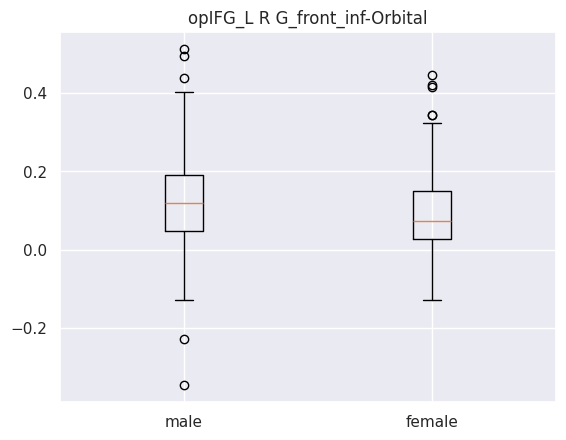

TtestResult(statistic=2.590010242688736, pvalue=0.00991280745976436, df=444.0)
male mean : 0.12008539356056873
male std : 0.12048529233368213
female mean : 0.09274929992765957
female std : 0.101808764888001


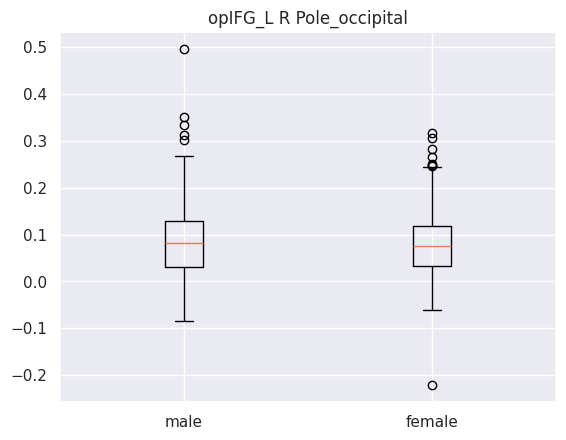

TtestResult(statistic=1.0562933159919166, pvalue=0.29140862404612333, df=444.0)
male mean : 0.0870557194335545
male std : 0.0859022171097756
female mean : 0.07901082808025532
female std : 0.07455712361626565


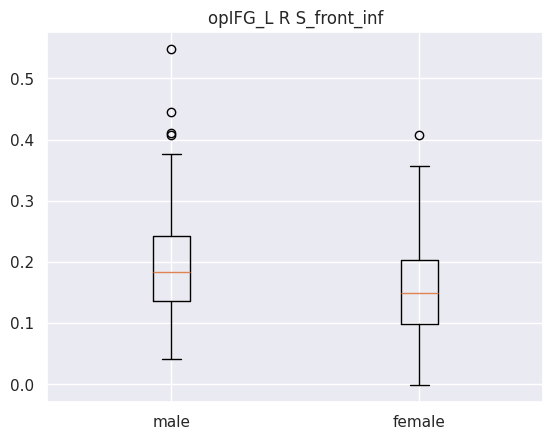

TtestResult(statistic=5.884962473252365, pvalue=7.853123991569667e-09, df=444.0)
male mean : 0.19521078224170613
male std : 0.07918319448273296
female mean : 0.1526708417155319
female std : 0.07311756765472813


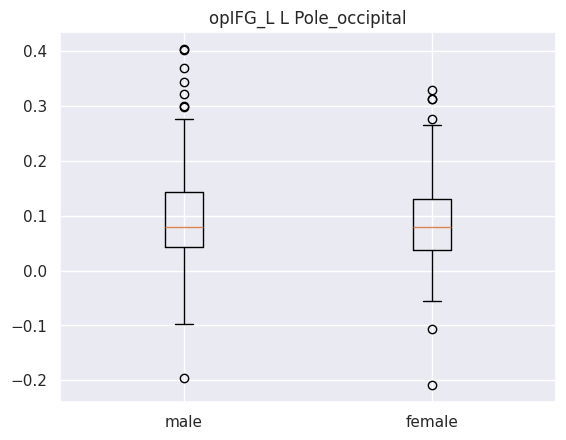

TtestResult(statistic=0.9458868030905412, pvalue=0.34472079500396957, df=444.0)
male mean : 0.09470529170082939
male std : 0.08837876172341082
female mean : 0.08733913702638298
female std : 0.07566935742613132


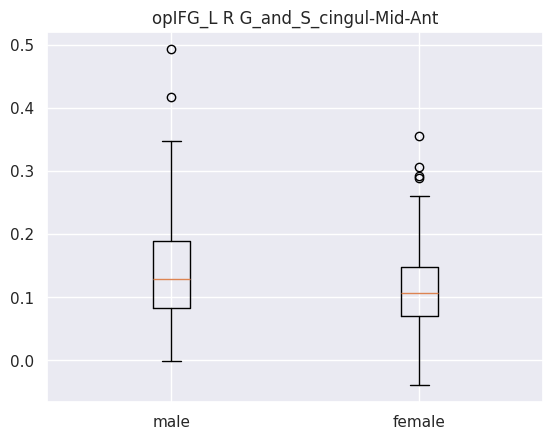

TtestResult(statistic=4.59802413533957, pvalue=5.569443863697757e-06, df=444.0)
male mean : 0.14388135524170614
male std : 0.07936365618429099
female mean : 0.11298714219148936
female std : 0.061867568449104786


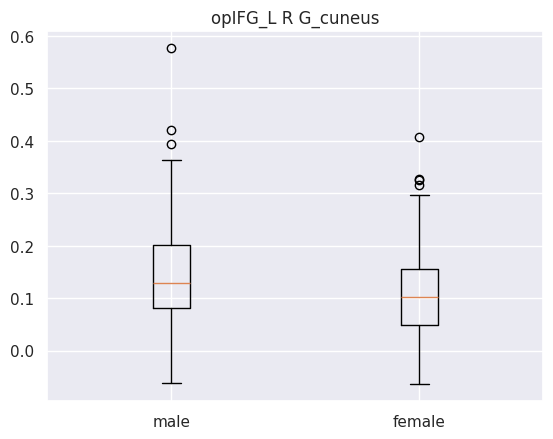

TtestResult(statistic=4.159387257368978, pvalue=3.831851643661411e-05, df=444.0)
male mean : 0.14290215239905213
male std : 0.09522010203612372
female mean : 0.10896249384468085
female std : 0.0764519019773217


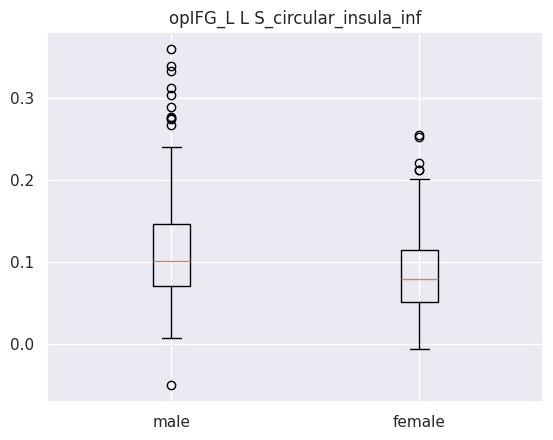

TtestResult(statistic=5.291587064411659, pvalue=1.9091305038741644e-07, df=444.0)
male mean : 0.11564617420663506
male std : 0.06740411339538012
female mean : 0.08649188888851064
female std : 0.04792604955663415


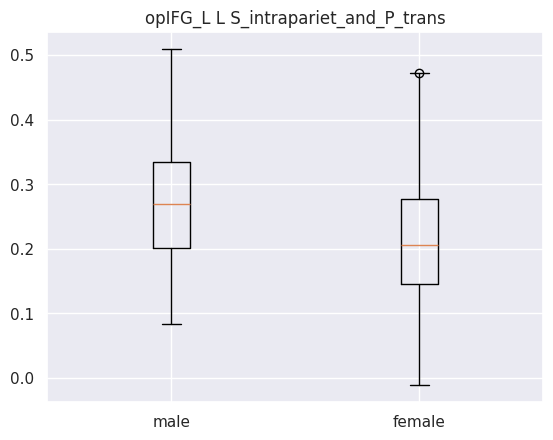

TtestResult(statistic=6.427201870497699, pvalue=3.357767316845091e-10, df=444.0)
male mean : 0.2702339562037915
male std : 0.09432151354355668
female mean : 0.21262982520234042
female std : 0.09426080476314916
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['opIFG_R']
-------------------------------------------------------------------------------------------------------
     coefficient     seed                       labels
20      0.173838  opIFG_R      L G_oc-temp_lat-fusifor
80      0.143235  opIFG_R     R G_and_S_cingul-Mid-Ant
41      0.142273  opIFG_R             L Pole_occipital
125     0.126392  opIFG_R                R S_front_inf
115     0.107594  opIFG_R             R Pole_occipital
63      0.104041  opIFG_R         L S_orbital-H_Shaped
121     0.103443  opIFG_R      R S_circular_insula_inf
144     0.101524  opIFG_R              R S_subparietal
47      

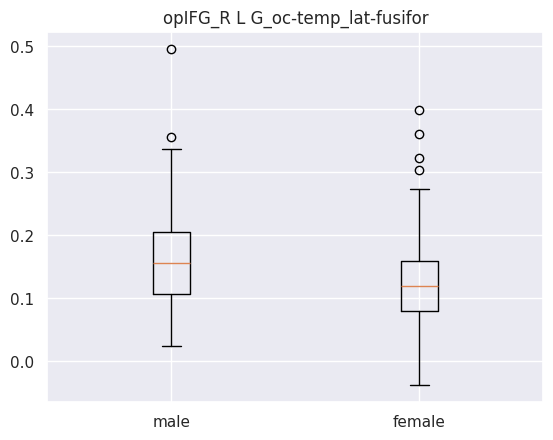

TtestResult(statistic=5.176783299097902, pvalue=3.427806367244311e-07, df=444.0)
male mean : 0.1588799625450237
male std : 0.07451696010056195
female mean : 0.12480377087659575
female std : 0.06415457178008915


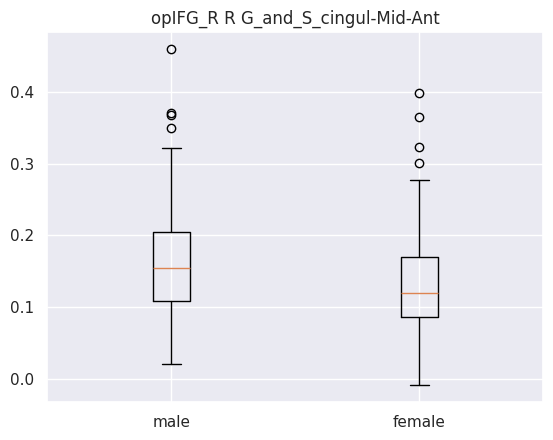

TtestResult(statistic=4.599432398551541, pvalue=5.533634586157913e-06, df=444.0)
male mean : 0.1602096582985782
male std : 0.0717659842501242
female mean : 0.13023491812404256
female std : 0.06555178033909799


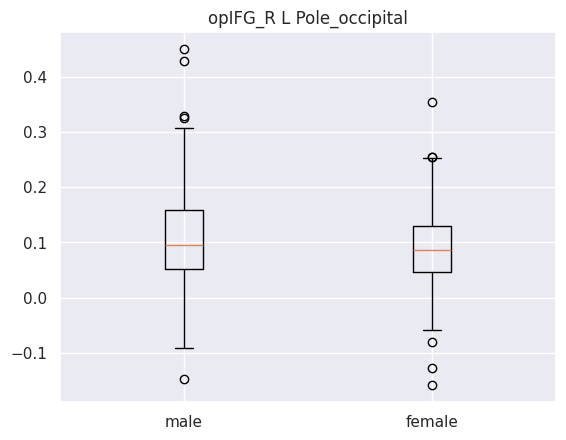

TtestResult(statistic=2.7255737216892197, pvalue=0.006672753748655803, df=444.0)
male mean : 0.10897551201556399
male std : 0.08329908686213744
female mean : 0.0891805879514468
female std : 0.06963803399752087


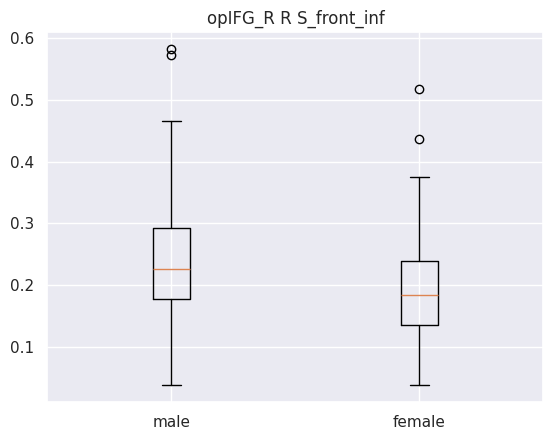

TtestResult(statistic=5.947915932893488, pvalue=5.508767725982762e-09, df=444.0)
male mean : 0.23696873745971564
male std : 0.08550430086562916
female mean : 0.19078449430212768
female std : 0.0781036749017774


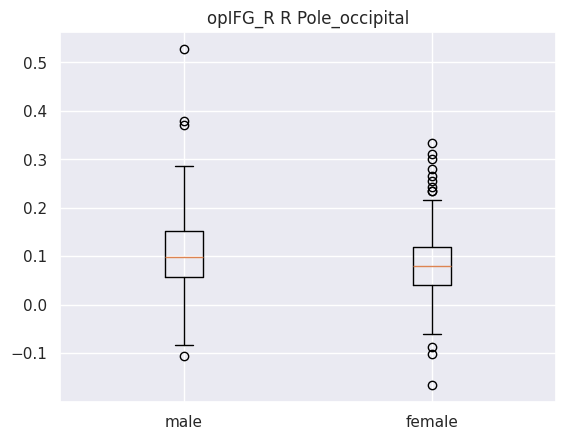

TtestResult(statistic=2.887685163066, pvalue=0.004070478752466148, df=444.0)
male mean : 0.10594447359004738
male std : 0.0806119552649185
female mean : 0.08515797526327659
female std : 0.07105978717669892


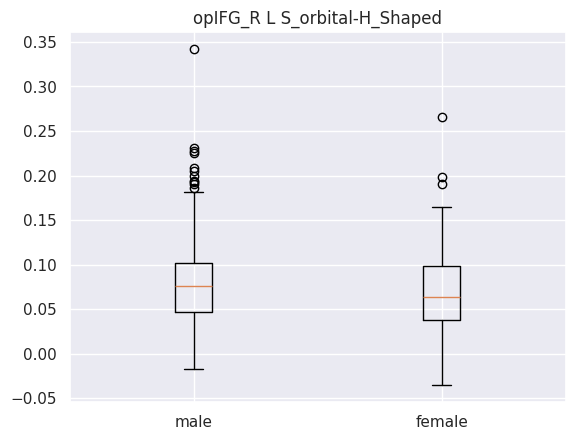

TtestResult(statistic=2.6292314457292116, pvalue=0.008854781060143924, df=444.0)
male mean : 0.08188100154616113
male std : 0.052568384324703385
female mean : 0.06968179238340426
female std : 0.045175743118779504


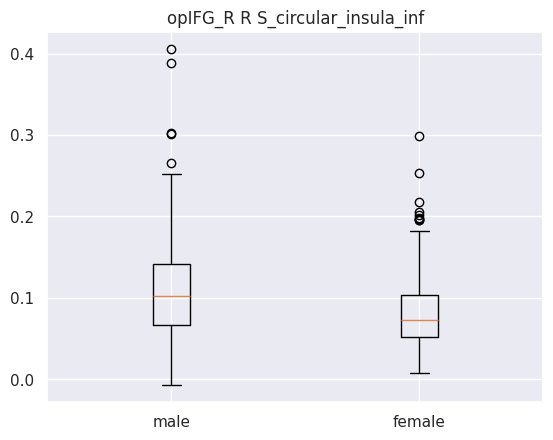

TtestResult(statistic=5.366590436746158, pvalue=1.295113022416867e-07, df=444.0)
male mean : 0.11096852988767772
male std : 0.06342691049723577
female mean : 0.08291211082978725
female std : 0.046141346848333244


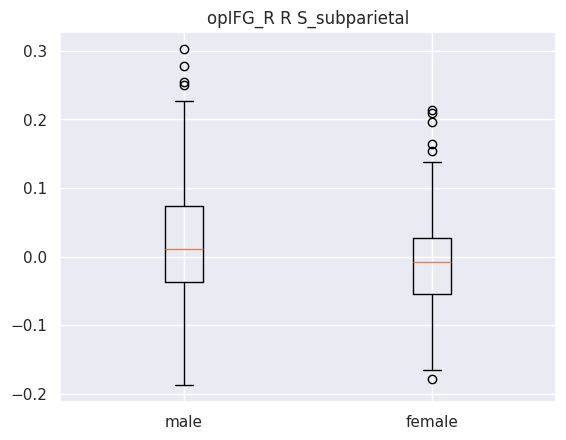

TtestResult(statistic=4.170778804634583, pvalue=3.652101411865382e-05, df=444.0)
male mean : 0.02046037378578199
male std : 0.09045713696995894
female mean : -0.010307747571999998
female std : 0.06391035459472331


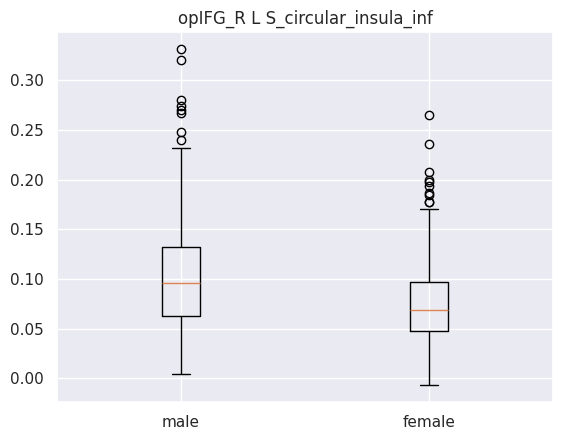

TtestResult(statistic=5.2508662645312825, pvalue=2.352433244231258e-07, df=444.0)
male mean : 0.10348876252890994
male std : 0.059155982523175756
female mean : 0.07749799998723406
female std : 0.04477047867485129


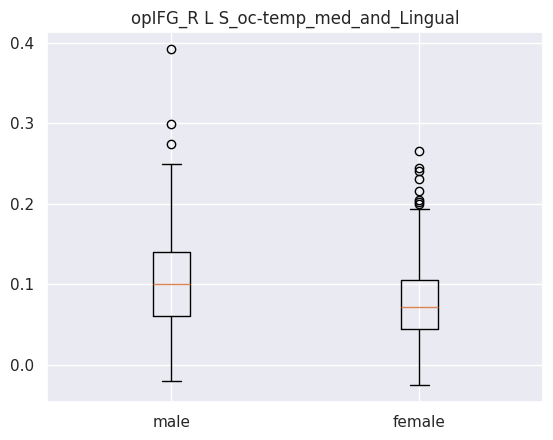

TtestResult(statistic=4.830324918055688, pvalue=1.87976159575421e-06, df=444.0)
male mean : 0.10494199282654029
male std : 0.060932589606714556
female mean : 0.07906732310387235
female std : 0.0519014672736226
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['pITG_L']
-------------------------------------------------------------------------------------------------------
     coefficient    seed                       labels
55      0.151141  pITG_L  L S_intrapariet_and_P_trans
86      0.150547  pITG_L        R G_front_inf-Orbital
9       0.150195  pITG_L      L G_cingul-Post-ventral
83      0.149966  pITG_L      R G_cingul-Post-ventral
125     0.143229  pITG_L                R S_front_inf
20      0.138878  pITG_L      L G_oc-temp_lat-fusifor
19      0.128027  pITG_L            L G_occipital_sup
115     0.124819  pITG_L             R Pole_occipital
66      0.111268  

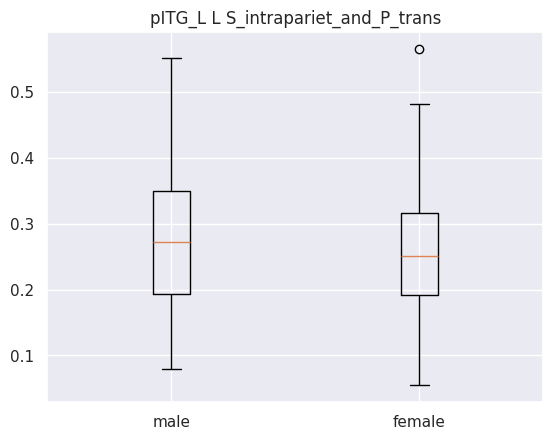

TtestResult(statistic=2.6049250509899857, pvalue=0.00949783108939388, df=444.0)
male mean : 0.27778639065876776
male std : 0.09652693229546287
female mean : 0.254653592693617
female std : 0.09055004671913315


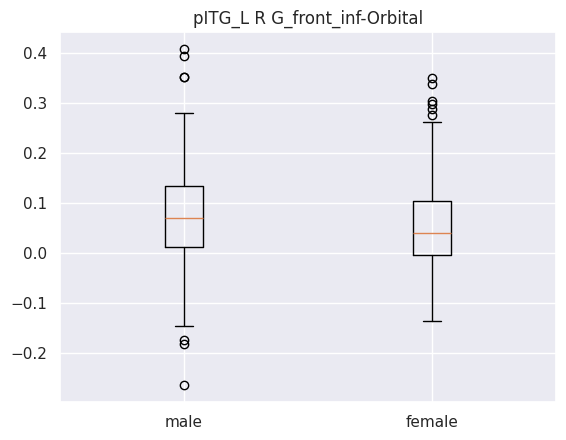

TtestResult(statistic=2.1796515056678336, pvalue=0.029808040037670316, df=444.0)
male mean : 0.07252172444170615
male std : 0.10080732758673992
female mean : 0.052920380447404256
female std : 0.08867448391605957


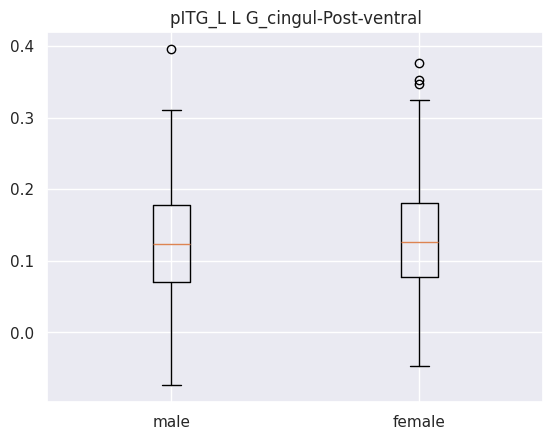

TtestResult(statistic=-0.7724237550352638, pvalue=0.4402744498219793, df=444.0)
male mean : 0.127128284757109
male std : 0.07222617653279273
female mean : 0.1326232745323404
female std : 0.07711437096412027


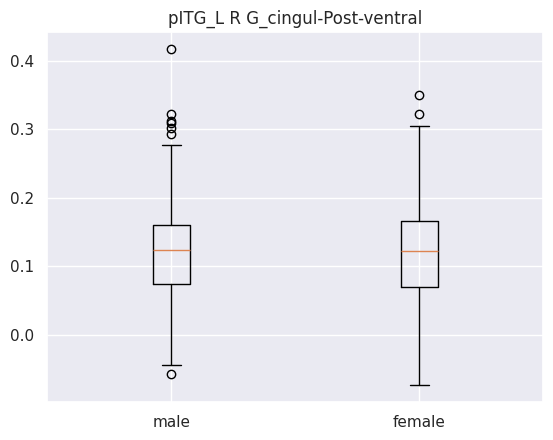

TtestResult(statistic=-0.612728556148096, pvalue=0.5403695352260143, df=444.0)
male mean : 0.12137713021469193
male std : 0.07320446759994569
female mean : 0.1257123220574468
female std : 0.07552111050746853


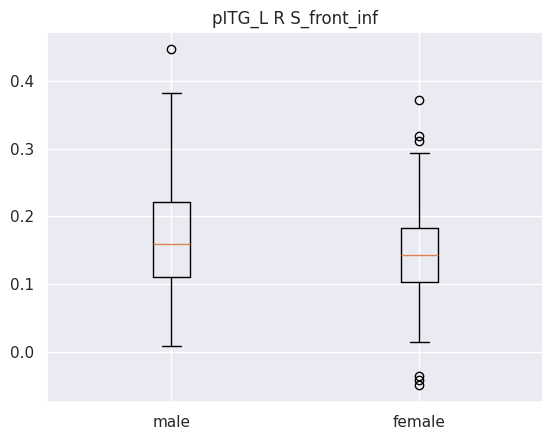

TtestResult(statistic=3.527371743685806, pvalue=0.00046341073109008694, df=444.0)
male mean : 0.16778896423222747
male std : 0.07482114559431507
female mean : 0.14443713783829784
female std : 0.064649075986272


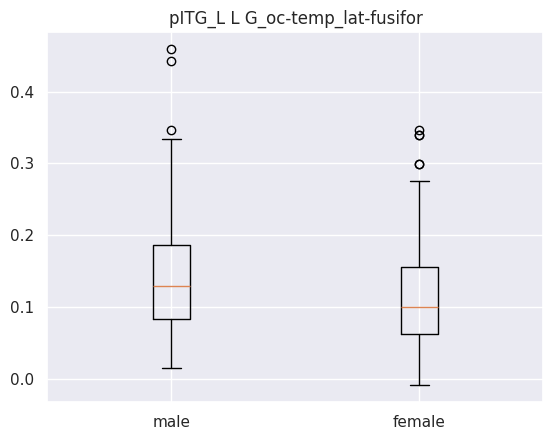

TtestResult(statistic=3.275834050563673, pvalue=0.0011360567722706225, df=444.0)
male mean : 0.13928527996682463
male std : 0.07670719318097458
female mean : 0.11658672618927658
female std : 0.06929713865976829


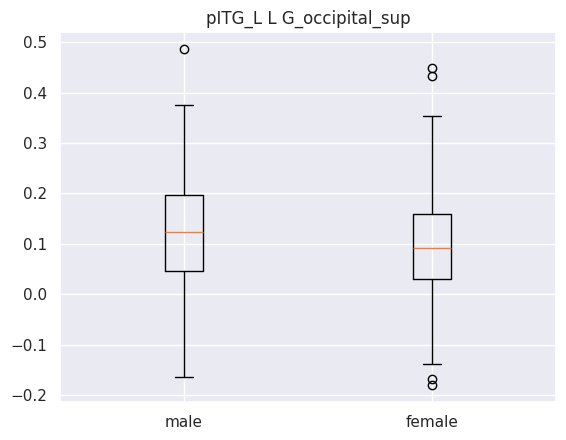

TtestResult(statistic=3.0520810289421307, pvalue=0.002408980454890271, df=444.0)
male mean : 0.1266533429549763
male std : 0.10587342505297256
female mean : 0.0965959863007234
female std : 0.10152774622861853


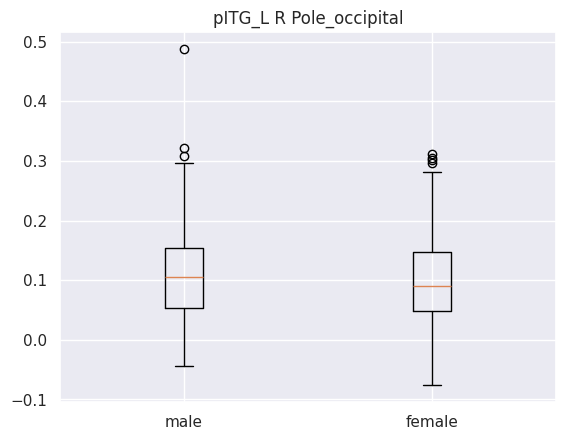

TtestResult(statistic=1.265861877322234, pvalue=0.2062263407488006, df=444.0)
male mean : 0.11211165639336493
male std : 0.07260016420089903
female mean : 0.10322566489706382
female std : 0.07495471127594824


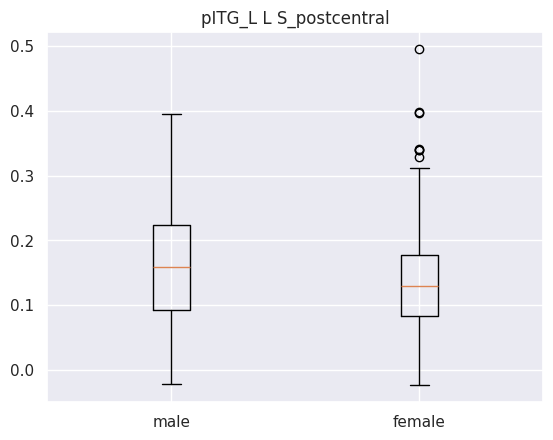

TtestResult(statistic=3.2960887569681274, pvalue=0.0010590599397127252, df=444.0)
male mean : 0.16579266225118483
male std : 0.09025561441296917
female mean : 0.1391957490468085
female std : 0.07976842848115447


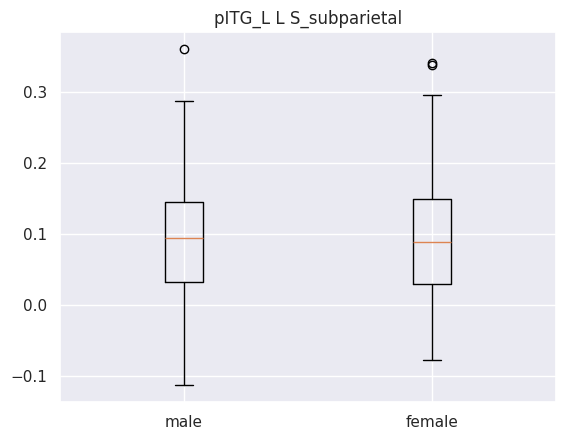

TtestResult(statistic=0.07166105027322052, pvalue=0.9429039214102952, df=444.0)
male mean : 0.09233229492985784
male std : 0.07861437126972175
female mean : 0.09178478666570214
female std : 0.08192989677477129
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['pITG_R']
-------------------------------------------------------------------------------------------------------
     coefficient    seed                    labels
20      0.230630  pITG_R   L G_oc-temp_lat-fusifor
83      0.173208  pITG_R   R G_cingul-Post-ventral
125     0.149623  pITG_R             R S_front_inf
80      0.136362  pITG_R  R G_and_S_cingul-Mid-Ant
32      0.115947  pITG_R   L G_temp_sup-G_T_transv
84      0.115235  pITG_R                R G_cuneus
94      0.110347  pITG_R   R G_oc-temp_lat-fusifor
115     0.101662  pITG_R          R Pole_occipital
144     0.097953  pITG_R           R S_subpar

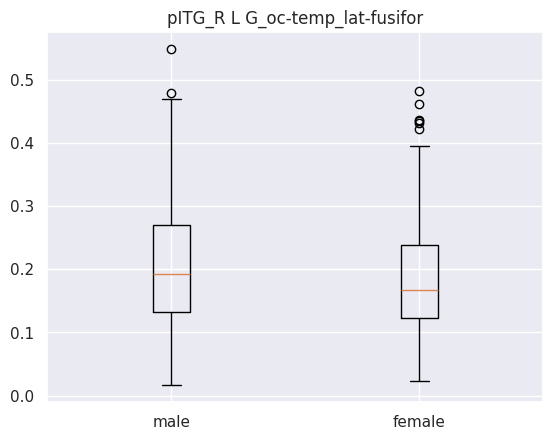

TtestResult(statistic=2.4163793122918227, pvalue=0.016078141849334877, df=444.0)
male mean : 0.20453742202369668
male std : 0.09940831680569412
female mean : 0.18324247592340423
female std : 0.08626094020084352


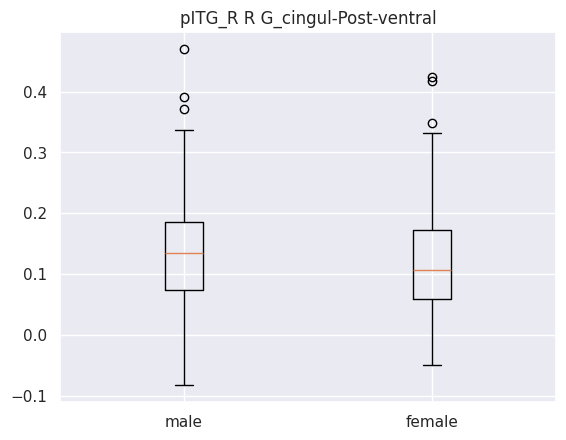

TtestResult(statistic=2.225527824005661, pvalue=0.026547313770183056, df=444.0)
male mean : 0.13792608536729858
male std : 0.0913432072591626
female mean : 0.11908777939502127
female std : 0.08694213306856728


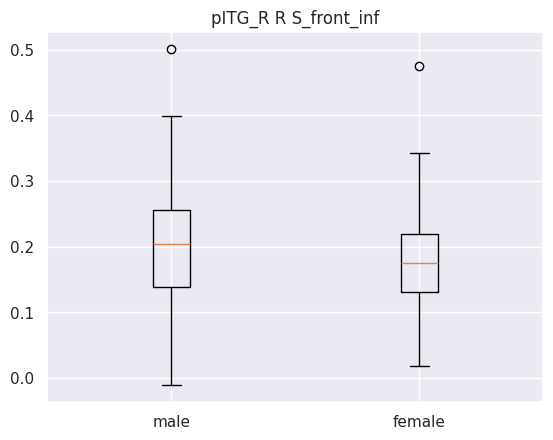

TtestResult(statistic=4.066436348071244, pvalue=5.647893423533811e-05, df=444.0)
male mean : 0.2058407092037915
male std : 0.08159592195327331
female mean : 0.17740230067659576
female std : 0.06553958179844248


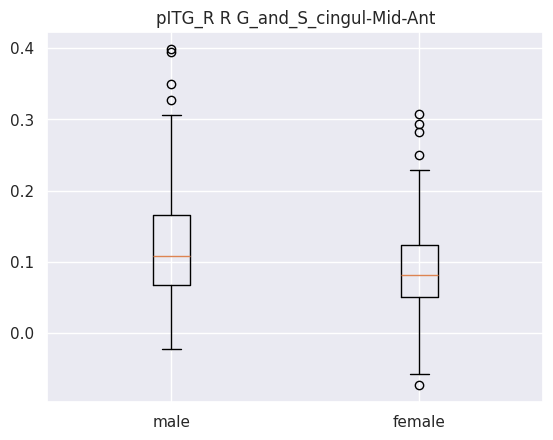

TtestResult(statistic=4.600027640439905, pvalue=5.518565377868144e-06, df=444.0)
male mean : 0.12042437503791467
male std : 0.07776189254634676
female mean : 0.09035040455829788
female std : 0.05957252115420796


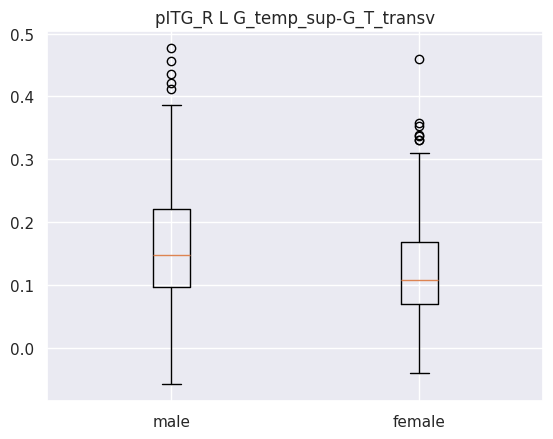

TtestResult(statistic=4.63770969479579, pvalue=4.640825531221423e-06, df=444.0)
male mean : 0.16541289226540287
male std : 0.0981036254370344
female mean : 0.1258804217680851
female std : 0.08137129558622526


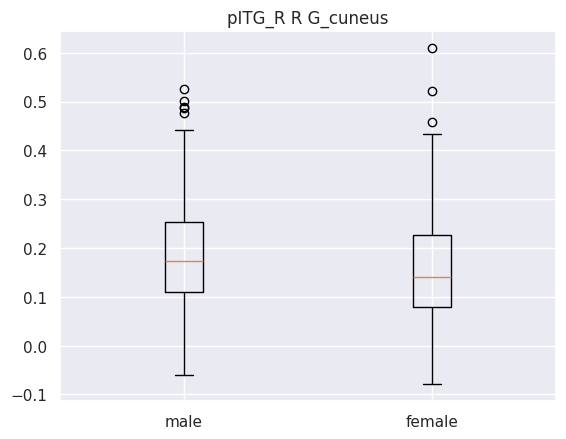

TtestResult(statistic=2.715527902640313, pvalue=0.006875129371679124, df=444.0)
male mean : 0.18589586856668242
male std : 0.11490296743042099
female mean : 0.1574173363242553
female std : 0.10605694313812855


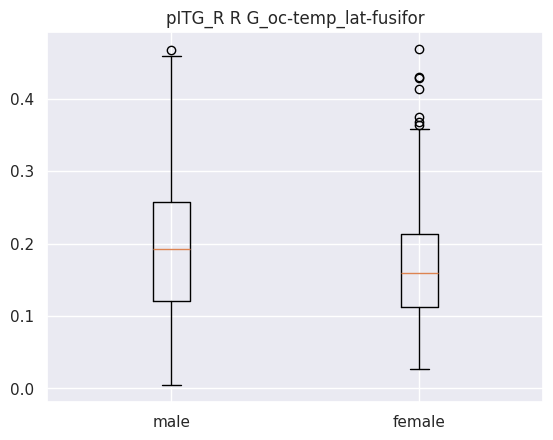

TtestResult(statistic=3.235350879546403, pvalue=0.001305741773838133, df=444.0)
male mean : 0.19698570930805684
male std : 0.09813256060896283
female mean : 0.1690754523404255
female std : 0.08357944003887514


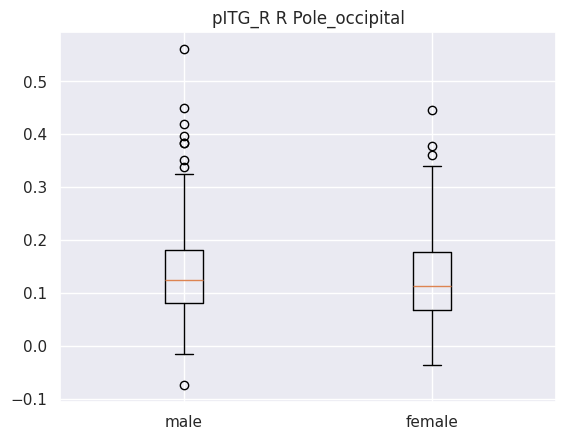

TtestResult(statistic=1.6743894117139027, pvalue=0.09475828567746696, df=444.0)
male mean : 0.14234086296113746
male std : 0.09423475516653777
female mean : 0.1282222304106383
female std : 0.08343646573029594


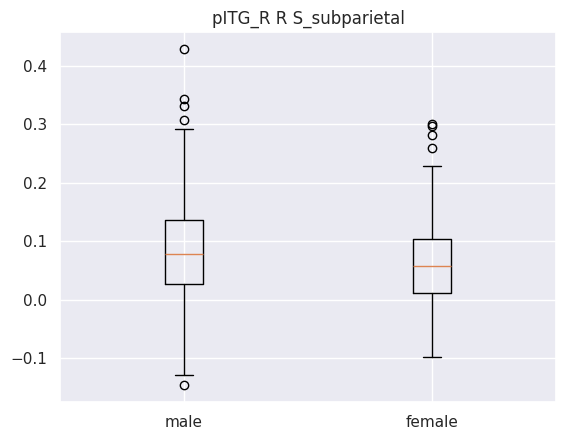

TtestResult(statistic=2.735047934138372, pvalue=0.006486833391675547, df=444.0)
male mean : 0.08345943679966825
male std : 0.09449059335131096
female mean : 0.06167374757455319
female std : 0.07287459097882863


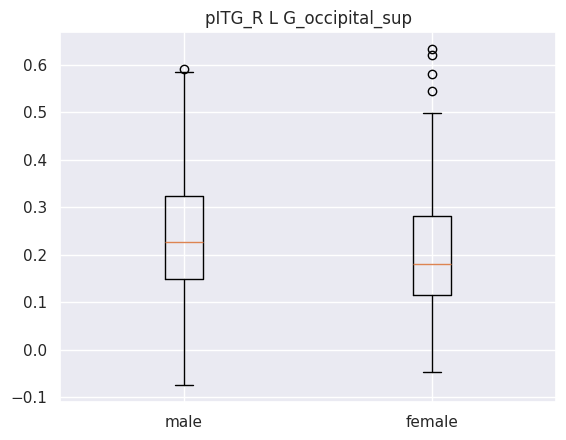

TtestResult(statistic=2.7689121464219495, pvalue=0.005859897451827995, df=444.0)
male mean : 0.23867880892274881
male std : 0.13621502466672755
female mean : 0.20476369438297873
female std : 0.12187720905354
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['planumtemp_L']
-------------------------------------------------------------------------------------------------------
     coefficient          seed                       labels
20      0.183659  planumtemp_L      L G_oc-temp_lat-fusifor
94      0.154378  planumtemp_L      R G_oc-temp_lat-fusifor
60      0.148369  planumtemp_L  L S_oc-temp_med_and_Lingual
80      0.138911  planumtemp_L     R G_and_S_cingul-Mid-Ant
66      0.132798  planumtemp_L              L S_postcentral
6       0.106840  planumtemp_L     L G_and_S_cingul-Mid-Ant
115     0.106433  planumtemp_L             R Pole_occipital
108     0.105813  pl

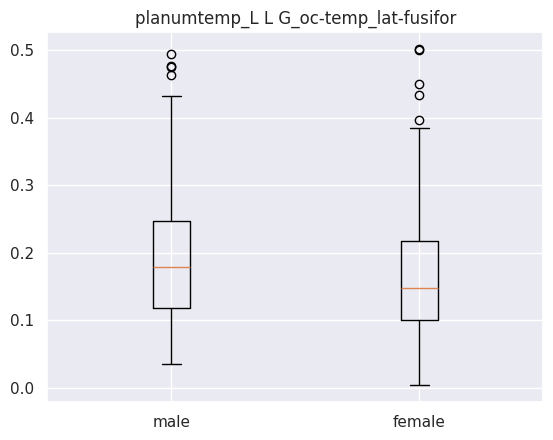

TtestResult(statistic=2.8505214236776864, pvalue=0.004568063320215879, df=444.0)
male mean : 0.19013747229383887
male std : 0.0942588906021302
female mean : 0.16540072089787233
female std : 0.0885506133878502


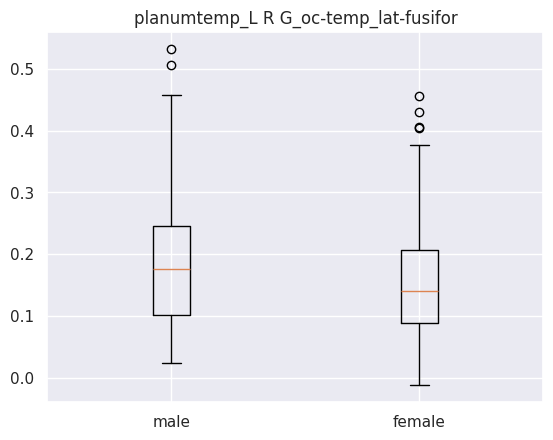

TtestResult(statistic=3.2922770251714493, pvalue=0.0010731693319095802, df=444.0)
male mean : 0.18307036592890996
male std : 0.09782784804200209
female mean : 0.15447305707234046
female std : 0.0851798270744238


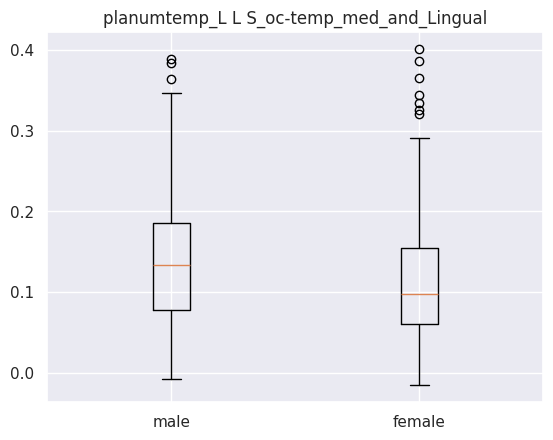

TtestResult(statistic=2.741818946204881, pvalue=0.006356838873081657, df=444.0)
male mean : 0.13728378161611374
male std : 0.07765054098418366
female mean : 0.11705511856085106
female std : 0.07758800539705143


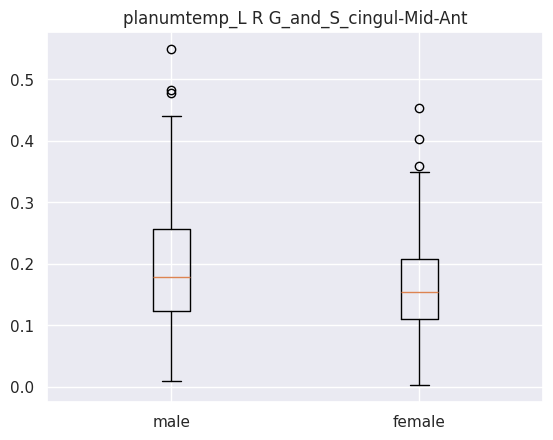

TtestResult(statistic=3.8902832939809864, pvalue=0.00011546268731542869, df=444.0)
male mean : 0.1972758429052133
male std : 0.10030875497847032
female mean : 0.16431204968085106
female std : 0.07776358246318395


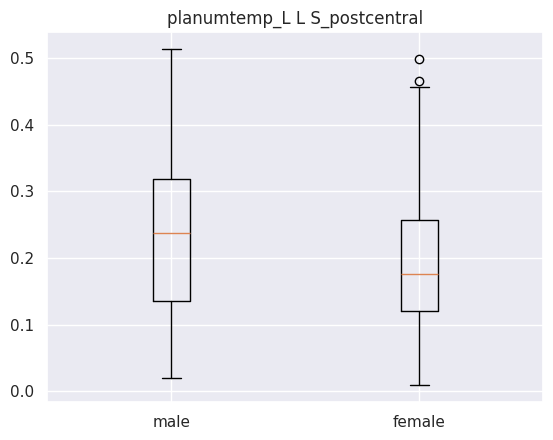

TtestResult(statistic=4.056626180589467, pvalue=5.881425283247614e-05, df=444.0)
male mean : 0.2338852373127962
male std : 0.11550593485179186
female mean : 0.19276792242553195
female std : 0.09798397802979554


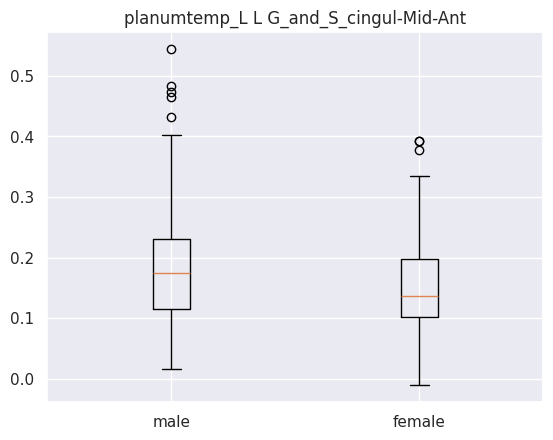

TtestResult(statistic=4.068456098737874, pvalue=5.600919789206141e-05, df=444.0)
male mean : 0.18399241431753555
male std : 0.09502523348826016
female mean : 0.15122356932127656
female std : 0.07429123059969363


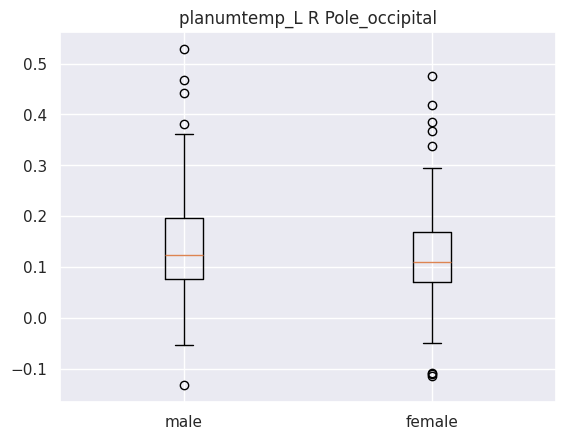

TtestResult(statistic=2.8830971461363837, pvalue=0.004129116113029113, df=444.0)
male mean : 0.1450978958106635
male std : 0.09686778643219356
female mean : 0.1200056767894468
female std : 0.08651973830457439


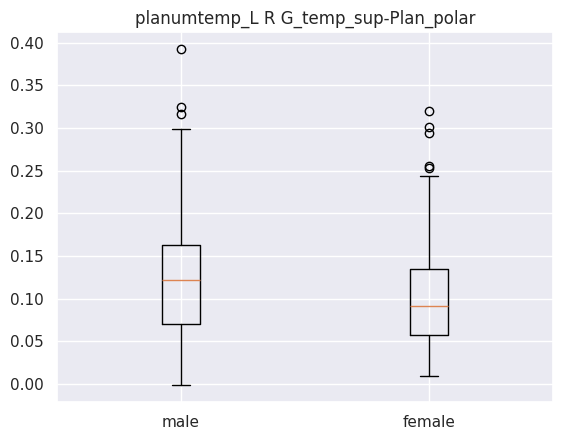

TtestResult(statistic=4.278894056104646, pvalue=2.3022034920513832e-05, df=444.0)
male mean : 0.12645605686398104
male std : 0.06618191967512217
female mean : 0.10129650282978722
female std : 0.05770237332369242


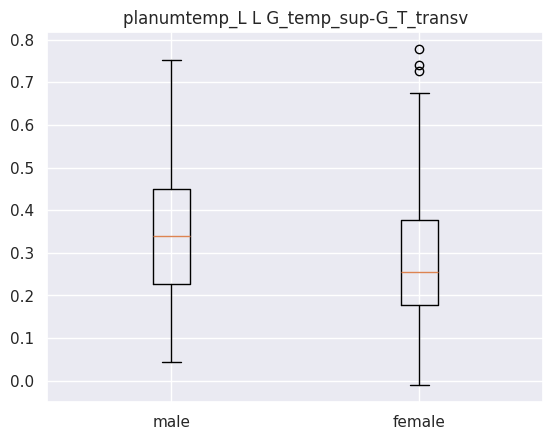

TtestResult(statistic=4.45745520231655, pvalue=1.0515686807631912e-05, df=444.0)
male mean : 0.3496300091327014
male std : 0.15255641237612336
female mean : 0.2872824054042553
female std : 0.14212346956816255


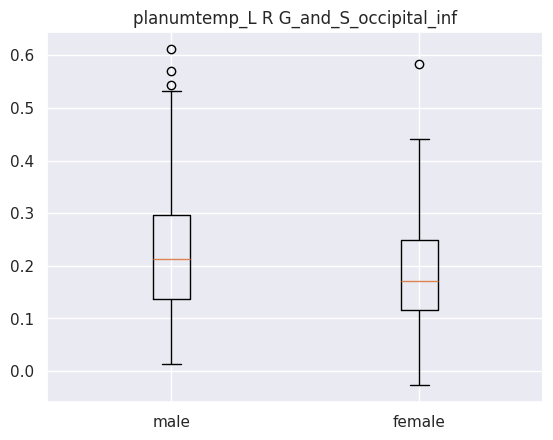

TtestResult(statistic=3.9738927865653464, pvalue=8.250259025849211e-05, df=444.0)
male mean : 0.22833552801895732
male std : 0.11627865120317238
female mean : 0.18739327032765957
female std : 0.1007813469604281
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['planumtemp_R']
-------------------------------------------------------------------------------------------------------
     coefficient          seed                       labels
58      0.150781  planumtemp_R            L S_occipital_ant
80      0.134267  planumtemp_R     R G_and_S_cingul-Mid-Ant
72      0.133345  planumtemp_R             L S_temporal_sup
60      0.128371  planumtemp_R  L S_oc-temp_med_and_Lingual
121     0.128362  planumtemp_R      R S_circular_insula_inf
108     0.122781  planumtemp_R      R G_temp_sup-Plan_polar
94      0.113755  planumtemp_R      R G_oc-temp_lat-fusifor
43      0.112864 

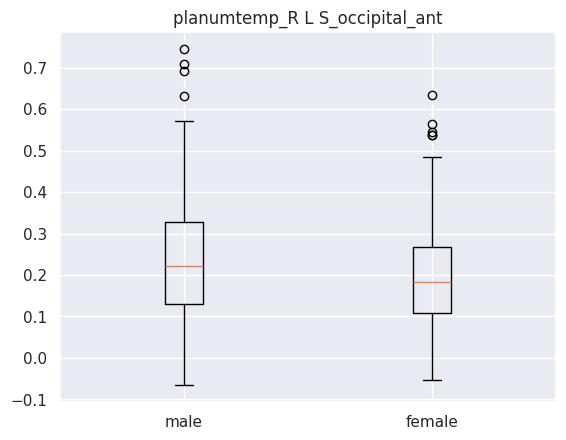

TtestResult(statistic=3.8009420406553938, pvalue=0.0001642715034397074, df=444.0)
male mean : 0.24748182751303316
male std : 0.15074424636702757
female mean : 0.19806916976297875
female std : 0.12286817560512481


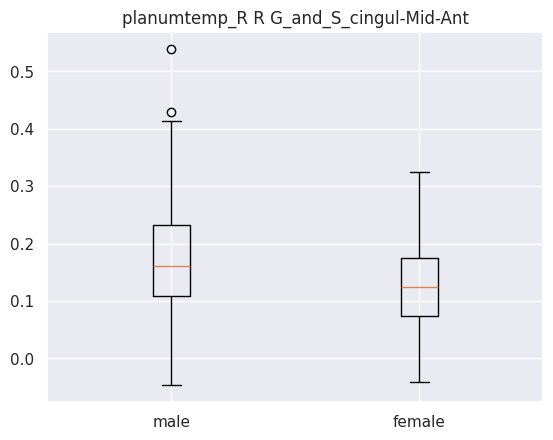

TtestResult(statistic=5.691205982824872, pvalue=2.2944326602425957e-08, df=444.0)
male mean : 0.17074738403317535
male std : 0.0886167569380666
female mean : 0.12859566155063828
female std : 0.06687098085916524


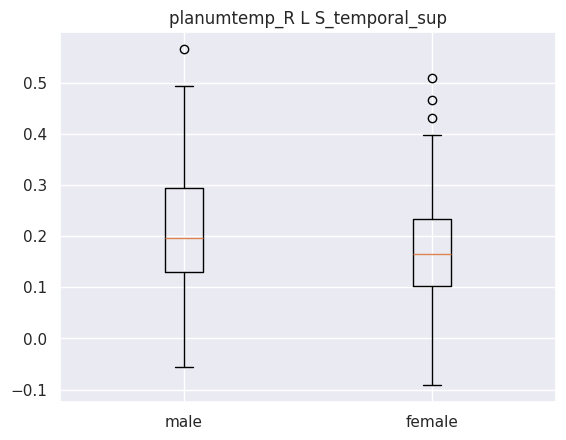

TtestResult(statistic=3.7492979719935224, pvalue=0.00020078118200028371, df=444.0)
male mean : 0.2128017606601896
male std : 0.12023297875763193
female mean : 0.17412700181280427
female std : 0.09680297024215465


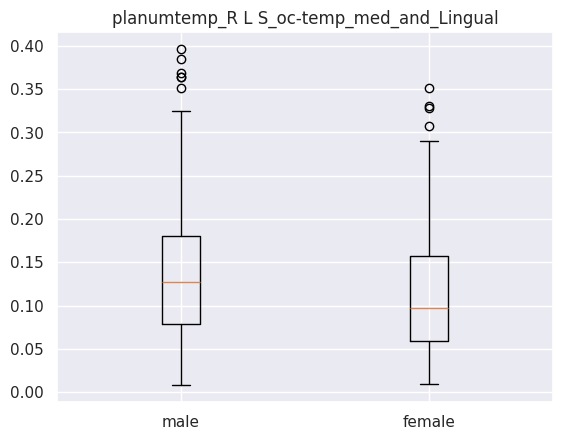

TtestResult(statistic=3.4683708553569645, pvalue=0.0005747002972371409, df=444.0)
male mean : 0.13773403446445498
male std : 0.07954452416072107
female mean : 0.11316921810212766
female std : 0.06968221622768991


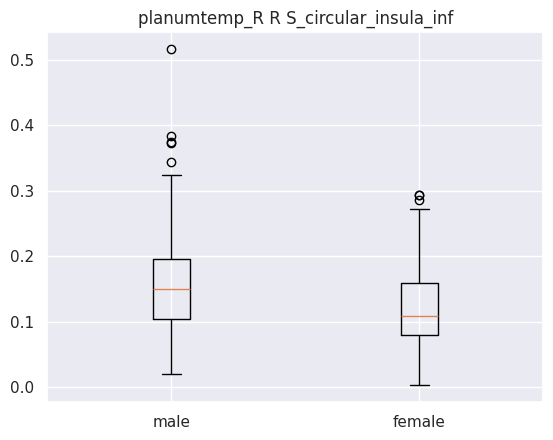

TtestResult(statistic=5.522677044505606, pvalue=5.6935635106855364e-08, df=444.0)
male mean : 0.15734653379146923
male std : 0.07327744189278278
female mean : 0.12254758828765956
female std : 0.05931904729014012


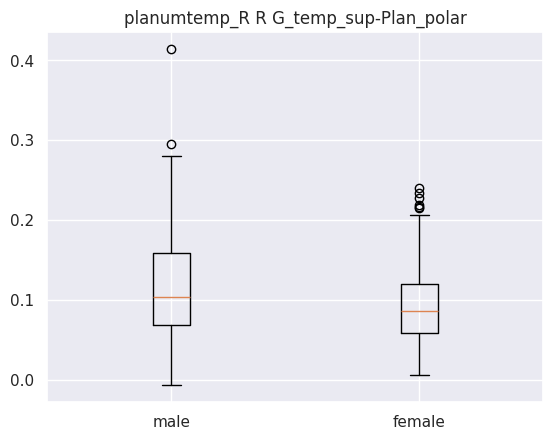

TtestResult(statistic=4.206844216028738, pvalue=3.1345007603195484e-05, df=444.0)
male mean : 0.11633572743791469
male std : 0.0627642699685286
female mean : 0.09400403725531915
female std : 0.04880711517610225


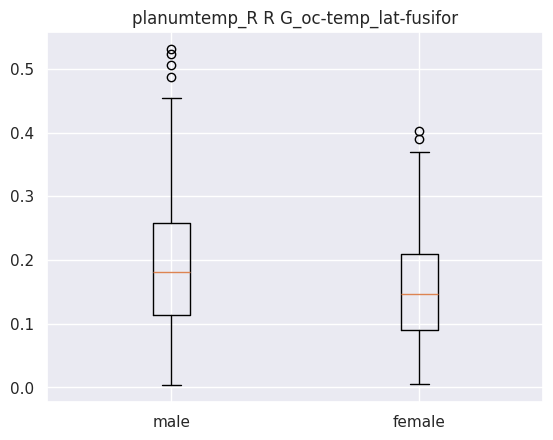

TtestResult(statistic=4.087823724171709, pvalue=5.168947184912931e-05, df=444.0)
male mean : 0.1916040306099526
male std : 0.10283105036686208
female mean : 0.1556855788425532
female std : 0.08199454077156562


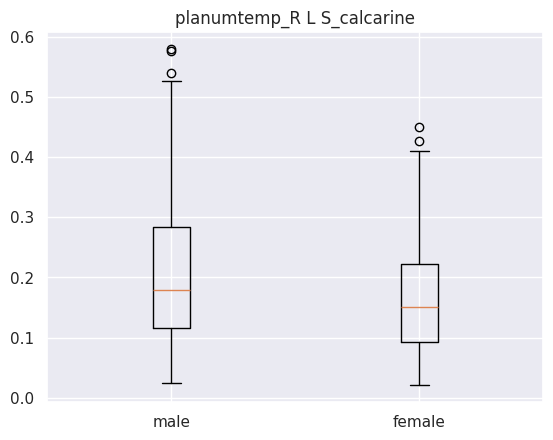

TtestResult(statistic=4.178662372102482, pvalue=3.5324390429998664e-05, df=444.0)
male mean : 0.20779662080094785
male std : 0.11901486482118238
female mean : 0.16571786605106384
female std : 0.09263994196425407


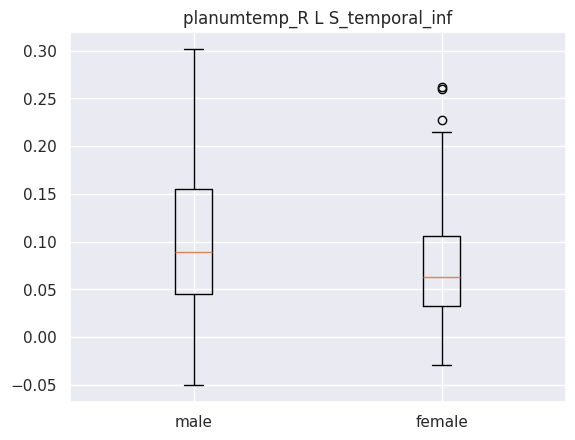

TtestResult(statistic=4.197079534336505, pvalue=3.267279105393717e-05, df=444.0)
male mean : 0.098917741314218
male std : 0.0687100367917049
female mean : 0.07421792154382978
female std : 0.055099251011639844


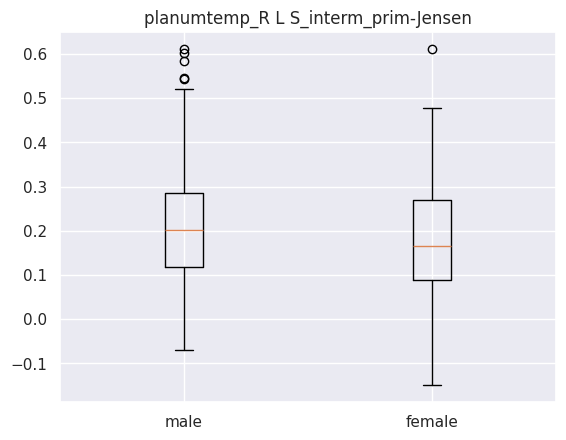

TtestResult(statistic=2.6254252305075942, pvalue=0.008952828713910387, df=444.0)
male mean : 0.21259454358009477
male std : 0.14249738970687054
female mean : 0.17944125416382978
female std : 0.12354592973173553
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['opIFG_L', 'planumtemp_L', 'aMTG_L', 'pITG_L']
-------------------------------------------------------------------------------------------------------
     coefficient          seed                       labels
263     0.104078  planumtemp_L             R Pole_occipital
98      0.098345       opIFG_L       R G_pariet_inf-Angular
464     0.091769        pITG_L      L G_oc-temp_lat-fusifor
189     0.090473  planumtemp_L             L Pole_occipital
53      0.086882       opIFG_L                L S_front_sup
234     0.084454  planumtemp_L        R G_front_inf-Orbital
66      0.080355       opIFG_L              L 

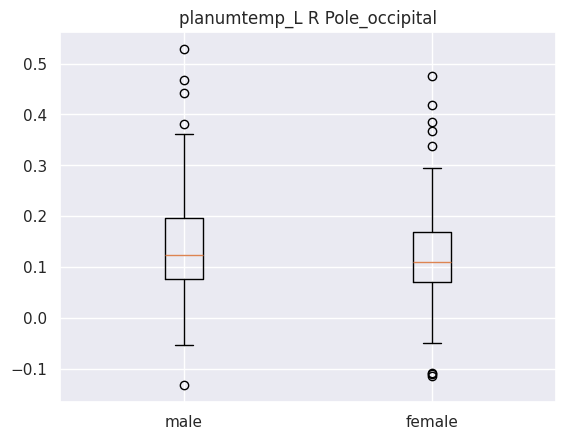

TtestResult(statistic=2.8830971461363837, pvalue=0.004129116113029113, df=444.0)
male mean : 0.1450978958106635
male std : 0.09686778643219356
female mean : 0.1200056767894468
female std : 0.08651973830457439


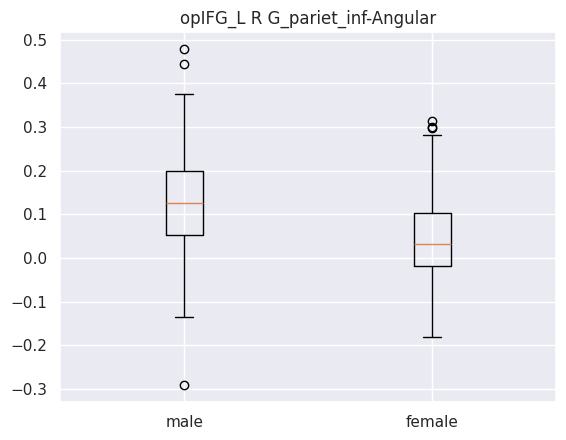

TtestResult(statistic=8.36453316136448, pvalue=7.884044598818814e-16, df=444.0)
male mean : 0.12652099691800947
male std : 0.11205031629586265
female mean : 0.04436252679727659
female std : 0.09482727144561362


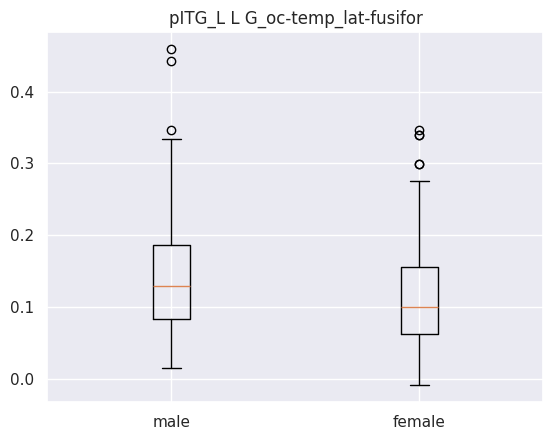

TtestResult(statistic=3.275834050563673, pvalue=0.0011360567722706225, df=444.0)
male mean : 0.13928527996682463
male std : 0.07670719318097458
female mean : 0.11658672618927658
female std : 0.06929713865976829


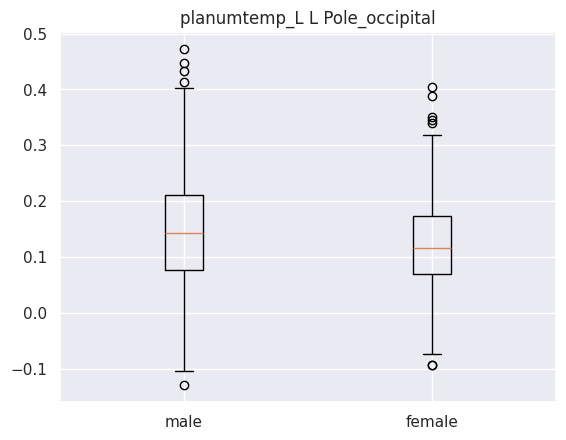

TtestResult(statistic=3.2624503110074787, pvalue=0.0011897491547535647, df=444.0)
male mean : 0.1509238786113744
male std : 0.0973540374590649
female mean : 0.12269890486851065
female std : 0.08492474456953504


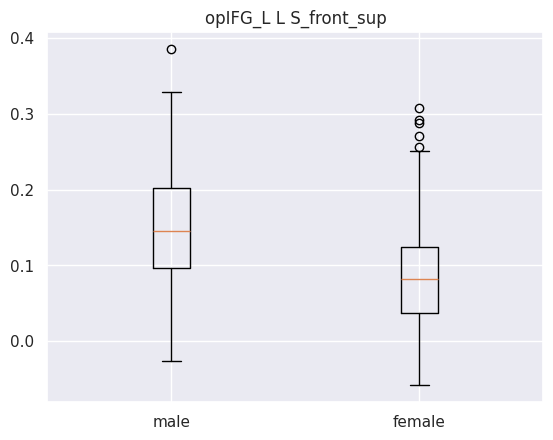

TtestResult(statistic=9.392381535030605, pvalue=3.0963588871687413e-19, df=444.0)
male mean : 0.15022324893838862
male std : 0.07243933596507521
female mean : 0.08831146950076596
female std : 0.06644850251834429


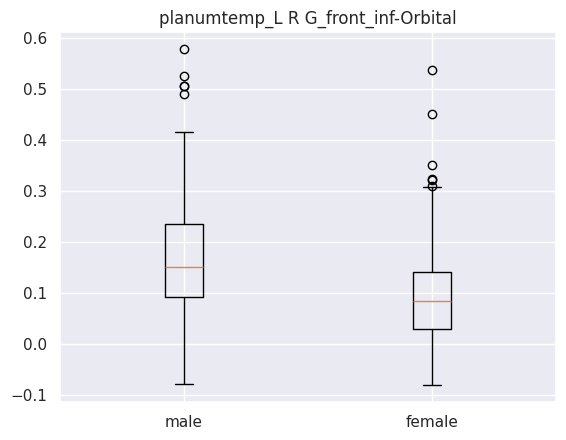

TtestResult(statistic=7.81805069131277, pvalue=3.9341990764708535e-14, df=444.0)
male mean : 0.17241957559763033
male std : 0.11327035225905915
female mean : 0.09635612358170213
female std : 0.09145115973292998


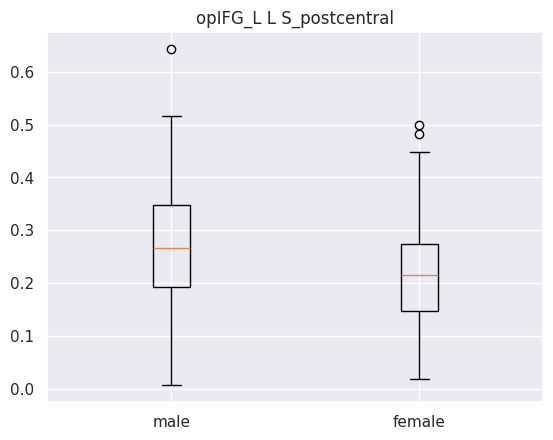

TtestResult(statistic=6.067888557380934, pvalue=2.7794658743318966e-09, df=444.0)
male mean : 0.2739751052763033
male std : 0.11117662240373184
female mean : 0.21474562371914896
female std : 0.09442435413445043


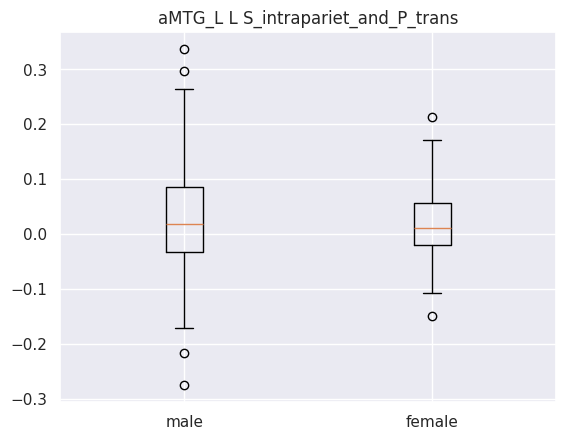

TtestResult(statistic=1.2152906043525493, pvalue=0.22490110147854064, df=444.0)
male mean : 0.027097741051184836
male std : 0.08743934494614101
female mean : 0.018400407782408514
female std : 0.06239762751688975


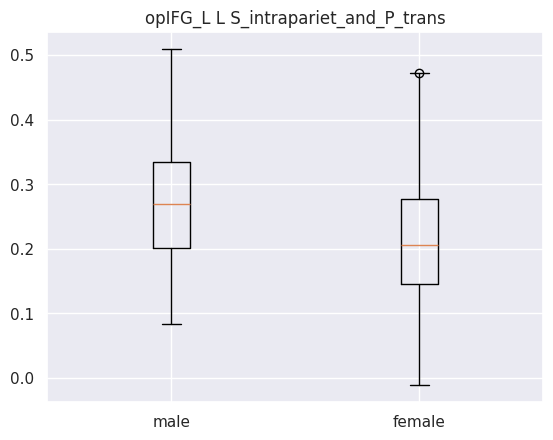

TtestResult(statistic=6.427201870497699, pvalue=3.357767316845091e-10, df=444.0)
male mean : 0.2702339562037915
male std : 0.09432151354355668
female mean : 0.21262982520234042
female std : 0.09426080476314916


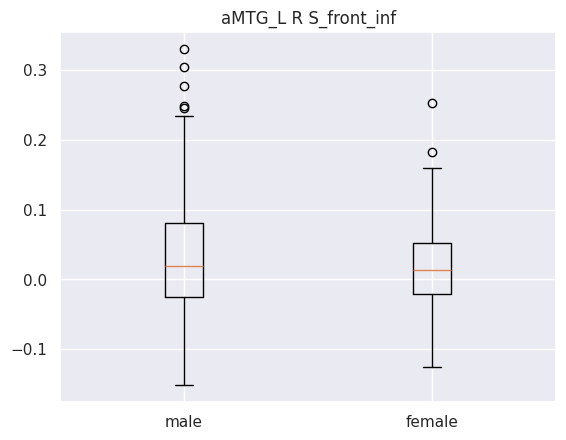

TtestResult(statistic=1.711697678978652, pvalue=0.08765072553574642, df=444.0)
male mean : 0.030188685882938392
male std : 0.08228056241988818
female mean : 0.01869213095948936
female std : 0.058284090389342055
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['opIFG_R', 'planumtemp_R', 'aMTG_R', 'pITG_R']
-------------------------------------------------------------------------------------------------------
     coefficient          seed                       labels
498     0.101035        pITG_R       L S_interm_prim-Jensen
316     0.097452        aMTG_R      L G_oc-temp_lat-fusifor
524     0.090328        pITG_R     R G_and_S_cingul-Mid-Ant
189     0.088741  planumtemp_R             L Pole_occipital
421     0.086145        aMTG_R                R S_front_inf
502     0.083964        pITG_R            L S_occipital_ant
379     0.082650        aMTG_R      R G_cingul

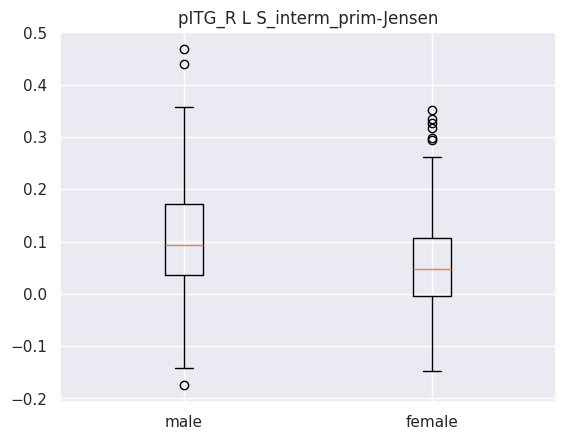

TtestResult(statistic=4.641000164550433, pvalue=4.570899935707834e-06, df=444.0)
male mean : 0.10024204454407584
male std : 0.10899325004998278
female mean : 0.056442184588638304
female std : 0.08968164578380426


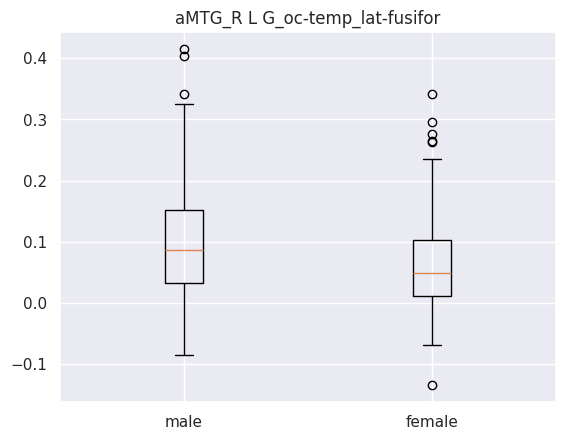

TtestResult(statistic=4.728335977215177, pvalue=3.0449299231438466e-06, df=444.0)
male mean : 0.10049291556744076
male std : 0.08873256390651249
female mean : 0.06442563383957446
female std : 0.07178152602552673


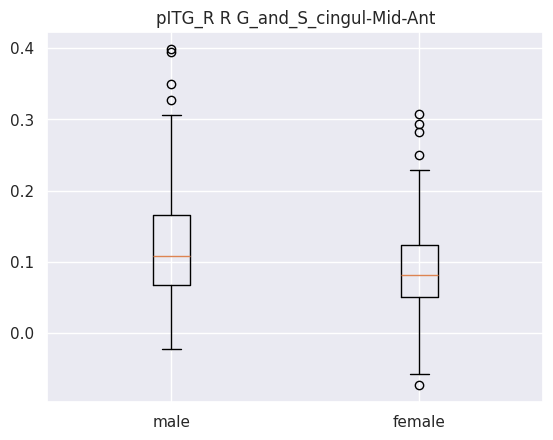

TtestResult(statistic=4.600027640439905, pvalue=5.518565377868144e-06, df=444.0)
male mean : 0.12042437503791467
male std : 0.07776189254634676
female mean : 0.09035040455829788
female std : 0.05957252115420796


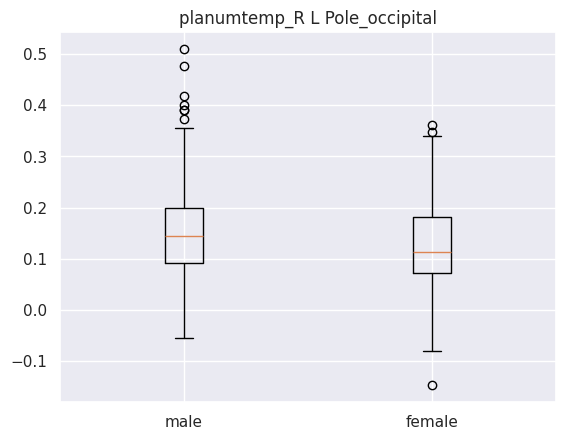

TtestResult(statistic=3.466356835556034, pvalue=0.0005789075811182437, df=444.0)
male mean : 0.1559526358341232
male std : 0.09580451884056192
female mean : 0.12642922241531918
female std : 0.08364505045318264


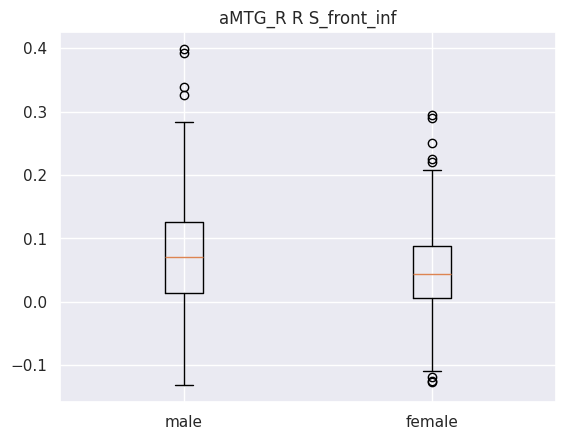

TtestResult(statistic=3.335901726480186, pvalue=0.0009216377349416962, df=444.0)
male mean : 0.07517456851943127
male std : 0.088533779097146
female mean : 0.050113374225063824
female std : 0.0694077438137764


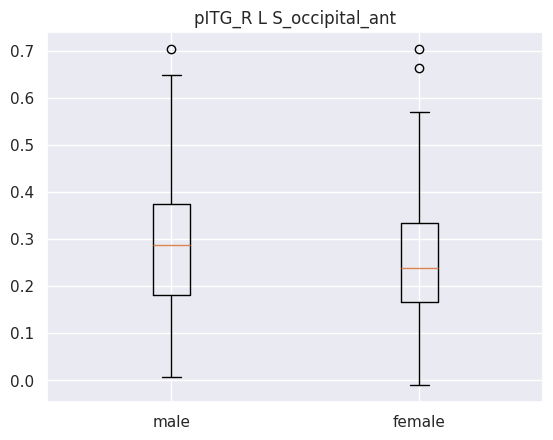

TtestResult(statistic=3.1195843617914436, pvalue=0.0019290290051488148, df=444.0)
male mean : 0.2941864701189574
male std : 0.14464420290564173
female mean : 0.2541460874319149
female std : 0.12577495870736924


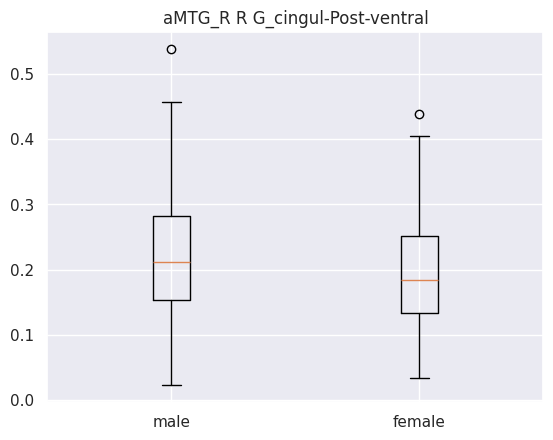

TtestResult(statistic=2.922353709233082, pvalue=0.0036513359925845965, df=444.0)
male mean : 0.22116097911374405
male std : 0.09382954946418635
female mean : 0.19657145856170213
female std : 0.08346855990908168


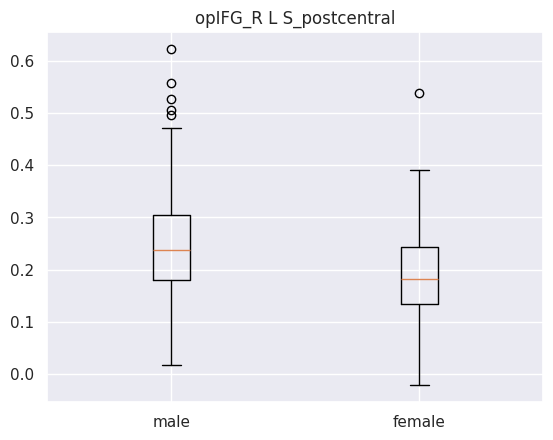

TtestResult(statistic=6.406382158686503, pvalue=3.8051774061160153e-10, df=444.0)
male mean : 0.24538767387203797
male std : 0.09987726441030285
female mean : 0.18966612626255316
female std : 0.08327246284776511


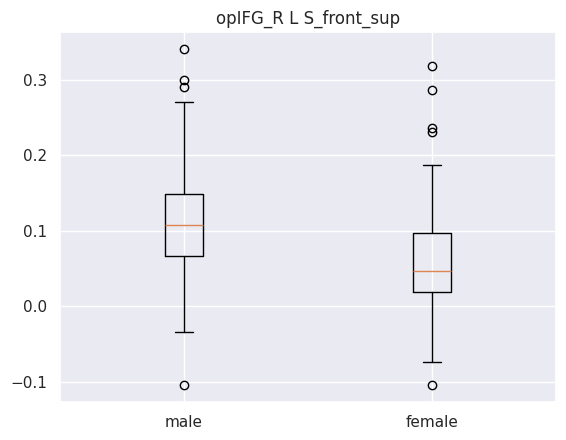

TtestResult(statistic=8.615404795814058, pvalue=1.2309818615958996e-16, df=444.0)
male mean : 0.11084387636729857
male std : 0.07187370925973573
female mean : 0.05657821136085107
female std : 0.06078883643700153


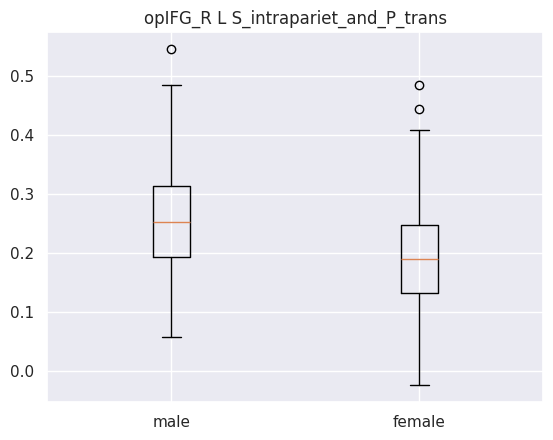

TtestResult(statistic=8.2164688924199, pvalue=2.316840417879698e-15, df=444.0)
male mean : 0.25726011294312795
male std : 0.09011348233992743
female mean : 0.1890884152145532
female std : 0.08466926171614057
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []




In [17]:
for result in all_results:
    if result == results_path_all_seed:
        rois = ["opIFG_L", "planumtemp_L", "aMTG_L", "pITG_L", "opIFG_R", "planumtemp_R", "aMTG_R", "pITG_R"] # modified to rois of interest
    elif result == results_path_aMTG_L:
        rois = ["aMTG_L"]
    elif result == results_path_aMTG_R:
        rois = ["aMTG_R"]
    elif result == results_path_opIFG_L:
        rois = ["opIFG_L"]
    elif result == results_path_opIFG_R:
        rois = ["opIFG_R"]
    elif result == results_path_pITG_L:
        rois = ["pITG_L"]
    elif result == results_path_pITG_R:
        rois = ["pITG_R"]
    elif result == results_path_planumtemp_L:
        rois = ["planumtemp_L"]
    elif result == results_path_planumtemp_R:
        rois = ["planumtemp_R"]
    elif result == results_path_all_left:
        rois = ["opIFG_L", "planumtemp_L", "aMTG_L", "pITG_L"]
    elif result == results_path_all_right:
        rois = ["opIFG_R", "planumtemp_R", "aMTG_R", "pITG_R"]
    print("-------------------------------------------------------------------------------------------------------")
    print(rois)
    print("-------------------------------------------------------------------------------------------------------")
    moyenne, scoresZ, pvalue, data_results = compute_results(result)
    ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
    sensitivity = data_results["confusion_matrix"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
    specificity = data_results["confusion_matrix"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
    print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
    print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))
    print("Validation accuracy")
    moyenne, scoresZ, pvalue, data_results = compute_results(result)
    pdList = []
    pdList.extend(data_results["confusion_matrix_validation"])
    concat_df = pd.concat(pdList)
    mean_confusion = concat_df.groupby(concat_df.index)
    mean_confusion = mean_confusion.mean()
    sensitivity, specificity = sensitivity_specificity(mean_confusion)
    print("Sensitivity : " + str(sensitivity))
    print("Specificity : " + str(specificity))
    print("mean Accuracy validation : " + str(data_results["acc_validation"].mean()))
    bestRegion(ROIs, data, df_boot)
    print("\n")

# Results gsr 02

In [94]:
study_dir = Path('/data/brambati/dataset/HCP/derivatives/training_sex_diff/results_gsr_02/LinearSVC/')
results_path_all_seed = study_dir / "seed-all_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_aMTG_L = study_dir / "seed-aMTG_L_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_aMTG_R = study_dir / "seed-aMTG_R_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_opIFG_L = study_dir / "seed-opIFG_L_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_opIFG_R = study_dir / "seed-opIFG_R_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_pITG_L = study_dir / "seed-pITG_L_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_pITG_R = study_dir / "seed-pITG_R_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_planumtemp_L = study_dir / "seed-planumtemp_L_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_planumtemp_R = study_dir / "seed-planumtemp_R_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_all_left = study_dir / "seed-left_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
results_path_all_right = study_dir / "seed-right_atlas-destrieux_mean-all4_gmcorrected_iteration-10000_LinearSVC.pkl"
all_results = [results_path_all_seed, results_path_aMTG_L, results_path_aMTG_R, results_path_opIFG_L, results_path_opIFG_R, results_path_pITG_L, results_path_pITG_R, results_path_planumtemp_L, results_path_planumtemp_R, results_path_all_left, results_path_all_right]

In [95]:
# fetching label from destrieux atlas minus two labels not used
atlas_dest = datasets.fetch_atlas_destrieux_2009(legacy_format=False)
label = atlas_dest["labels"].drop([0,42,117]) # correction for the destrieux atlas labels
label = label.reset_index()

-------------------------------------------------------------------------------------------------------
['opIFG_L', 'planumtemp_L', 'aMTG_L', 'pITG_L', 'opIFG_R', 'planumtemp_R', 'aMTG_R', 'pITG_R']
-------------------------------------------------------------------------------------------------------
      coefficient          seed                      labels
149      0.123747  planumtemp_L     L G_and_S_occipital_inf
263      0.114840  planumtemp_L            R Pole_occipital
189      0.111908  planumtemp_L            L Pole_occipital
53       0.102685       opIFG_L               L S_front_sup
1090     0.099728        pITG_R      L S_interm_prim-Jensen
278      0.094654  planumtemp_L   R S_oc_middle_and_Lunatus
98       0.094187       opIFG_L      R G_pariet_inf-Angular
884      0.088933  planumtemp_R             R S_subparietal
223      0.083269  planumtemp_L     R G_and_S_occipital_inf
300      0.081604        aMTG_L  L G_and_S_transv_frontopol
The mean accuracy : 0.902082222222222

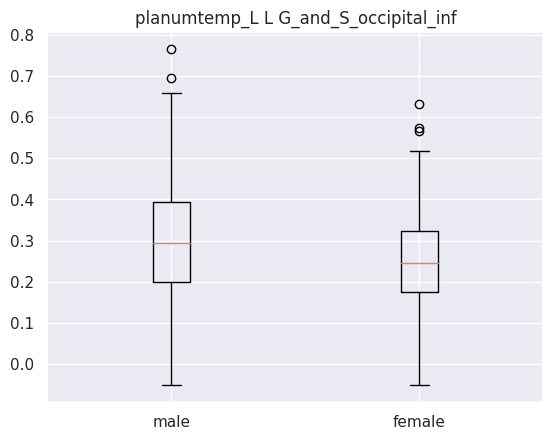

Ttest_indResult(statistic=4.062848625647285, pvalue=5.7322582795216496e-05)
male mean : 0.30012571736045457
male std : 0.14531143258700227
female mean : 0.24886884809292031
female std : 0.11959963365654121


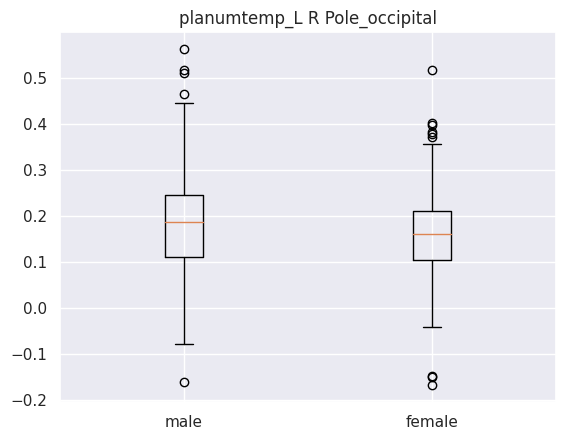

Ttest_indResult(statistic=3.1021672492680086, pvalue=0.002043621734370567)
male mean : 0.19048745212727272
male std : 0.11516897002896241
female mean : 0.15857792705907078
female std : 0.10129749612281899


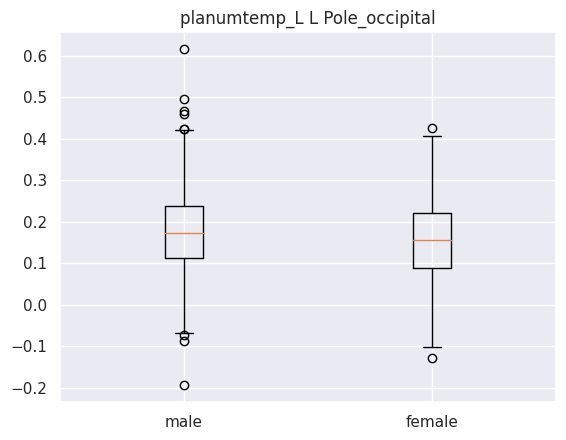

Ttest_indResult(statistic=2.8966477425742636, pvalue=0.003958114551412912)
male mean : 0.18402248281818182
male std : 0.11334589412846845
female mean : 0.1545630971402655
female std : 0.10073153762994376


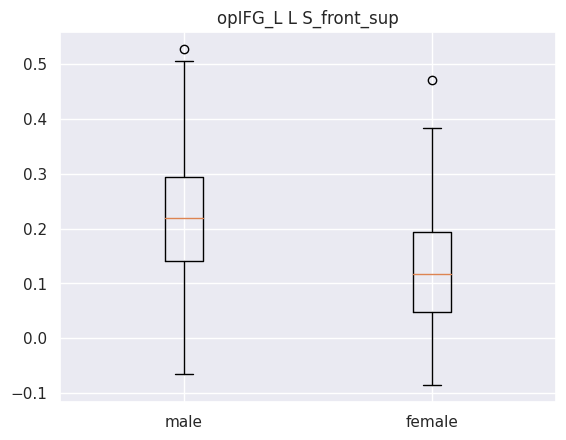

Ttest_indResult(statistic=9.514226955534408, pvalue=1.1745948061525577e-19)
male mean : 0.22193633239999996
male std : 0.11249626112199279
female mean : 0.12588911007571682
female std : 0.10000267392277586


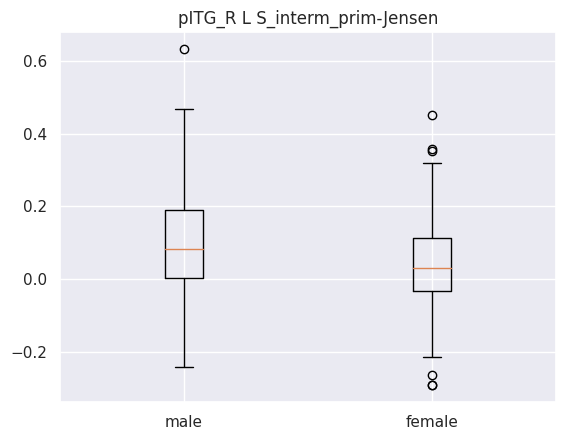

Ttest_indResult(statistic=5.007996133956906, pvalue=7.949942585866972e-07)
male mean : 0.0980466264909091
male std : 0.14302591474588874
female mean : 0.035939954145840704
female std : 0.11734710737051729


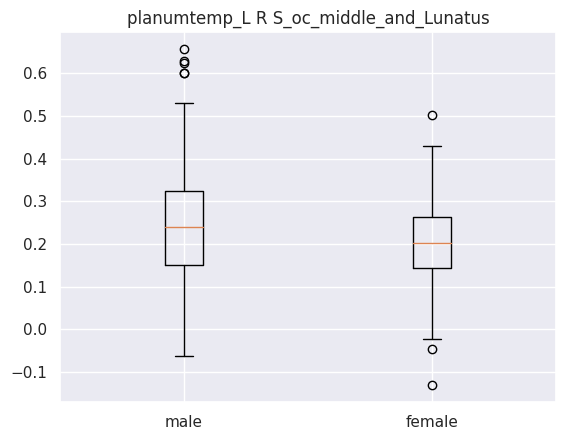

Ttest_indResult(statistic=4.287769800660265, pvalue=2.21565520549817e-05)
male mean : 0.2501186846863636
male std : 0.13630743242980192
female mean : 0.20154915945530977
female std : 0.10007719194915646


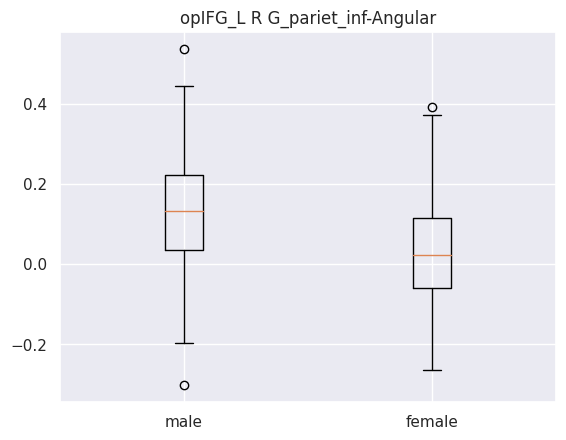

Ttest_indResult(statistic=7.24780487230096, pvalue=1.8918423767886693e-12)
male mean : 0.12424016548681818
male std : 0.13424300726761648
female mean : 0.03453558849026549
female std : 0.1265180924203619


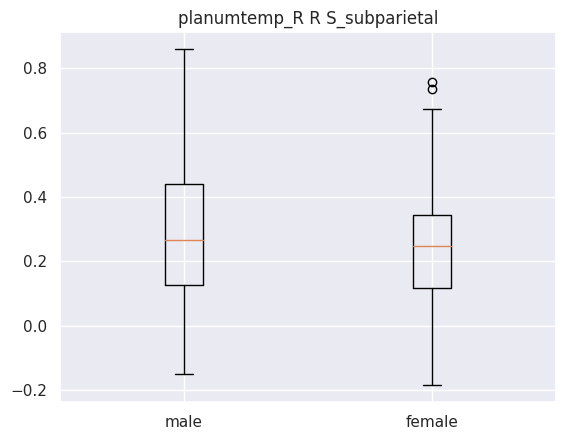

Ttest_indResult(statistic=2.8075668872297204, pvalue=0.0052116316108214876)
male mean : 0.2896251211704545
male std : 0.20367778731138816
female mean : 0.2395944374004425
female std : 0.1707762541855722


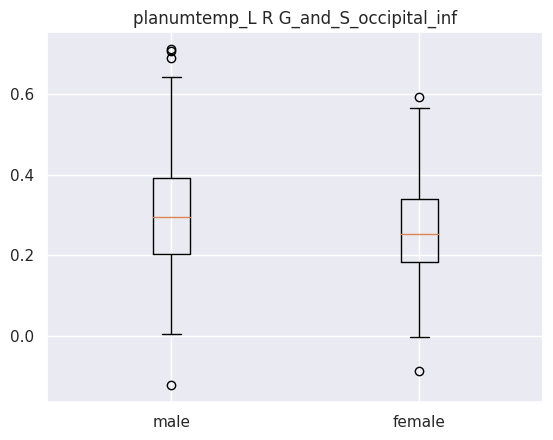

Ttest_indResult(statistic=3.531736949871788, pvalue=0.00045603535995372815)
male mean : 0.3035152627109091
male std : 0.14361189077675587
female mean : 0.25931693665619465
female std : 0.11926479827017382


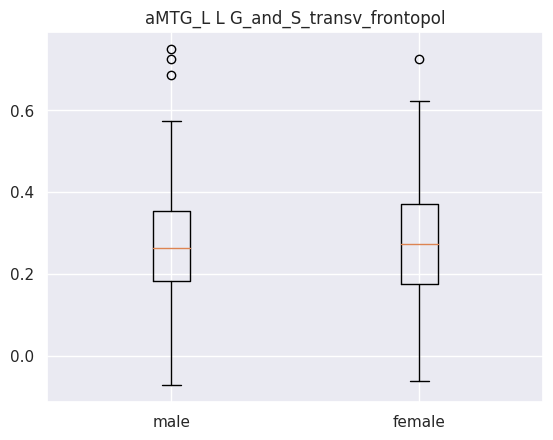

Ttest_indResult(statistic=-0.13187058202998522, pvalue=0.8951463929773453)
male mean : 0.2736758421272727
male std : 0.13376710268148156
female mean : 0.2753599954026549
female std : 0.13529084478562486
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['aMTG_L']
-------------------------------------------------------------------------------------------------------
     coefficient    seed                       labels
98      0.327722  aMTG_L       R G_pariet_inf-Angular
53      0.237352  aMTG_L                L S_front_sup
55      0.200489  aMTG_L  L S_intrapariet_and_P_trans
85      0.200084  aMTG_L      R G_front_inf-Opercular
120     0.198911  aMTG_L      R S_circular_insula_ant
87      0.180254  aMTG_L       R G_front_inf-Triangul
77      0.173171  aMTG_L         R G_and_S_subcentral
131     0.162384  aMTG_L   R S_oc_sup_and_transversal
61      0.158411  aMTG_L 

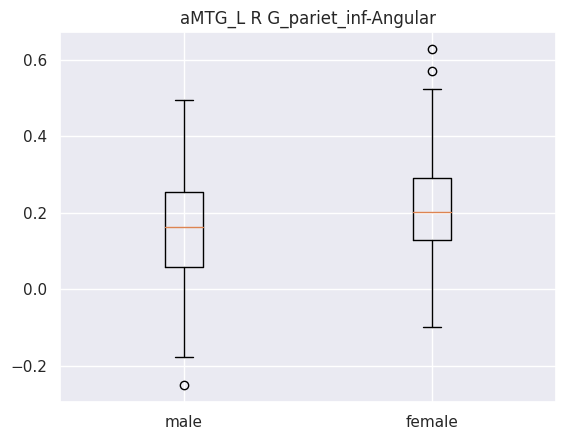

Ttest_indResult(statistic=-3.9493086257770935, pvalue=9.112915695993898e-05)
male mean : 0.1597038146640909
male std : 0.14141209184423478
female mean : 0.20934205392477875
female std : 0.12301362367570179


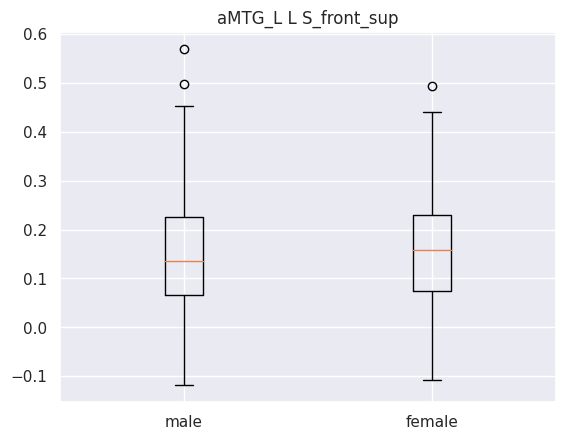

Ttest_indResult(statistic=-0.9406515856219914, pvalue=0.3473949131207905)
male mean : 0.149155713895
male std : 0.12215414677633321
female mean : 0.15968833962980092
female std : 0.1137261077832309


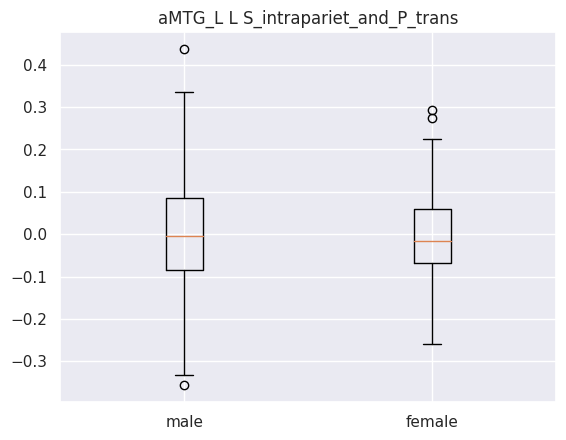

Ttest_indResult(statistic=1.0441439448576817, pvalue=0.29698694253266955)
male mean : 0.004413317491818183
male std : 0.12667357592144304
female mean : -0.006823133387610619
female std : 0.09870796418027704


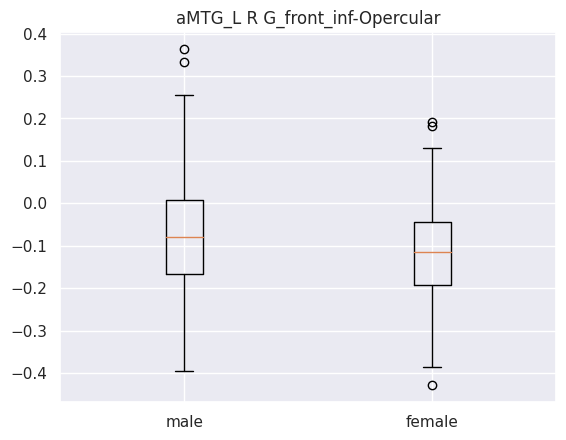

Ttest_indResult(statistic=3.273927718221966, pvalue=0.0011435647599131202)
male mean : -0.0767888999
male std : 0.1297994745618856
female mean : -0.11431425813230088
female std : 0.11123038327233818


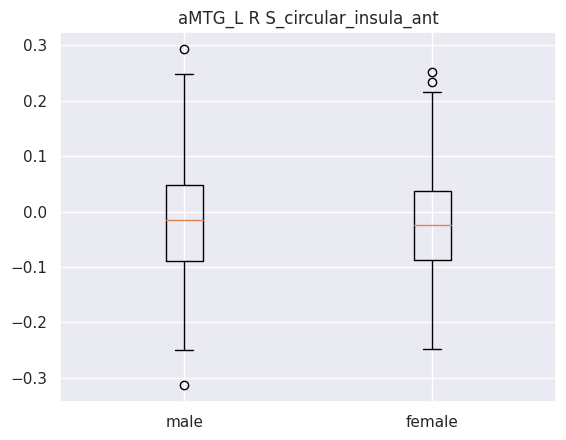

Ttest_indResult(statistic=0.7324587038892733, pvalue=0.4642751139979112)
male mean : -0.014839359866818185
male std : 0.11195276745376999
female mean : -0.02199007155882301
female std : 0.09312999917448096


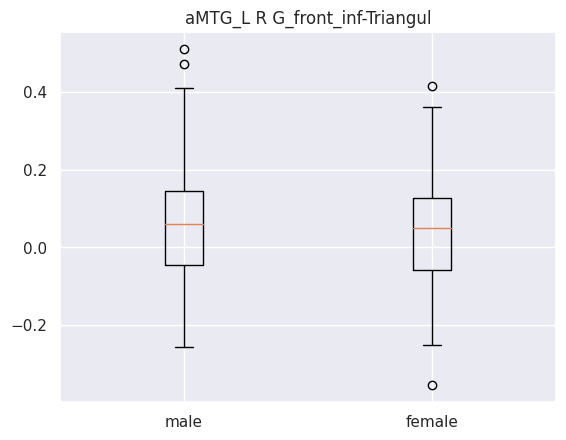

Ttest_indResult(statistic=0.8029229066384681, pvalue=0.42244888658810364)
male mean : 0.05413531161409091
male std : 0.14048142342875752
female mean : 0.04356582297920354
female std : 0.13689628286994152


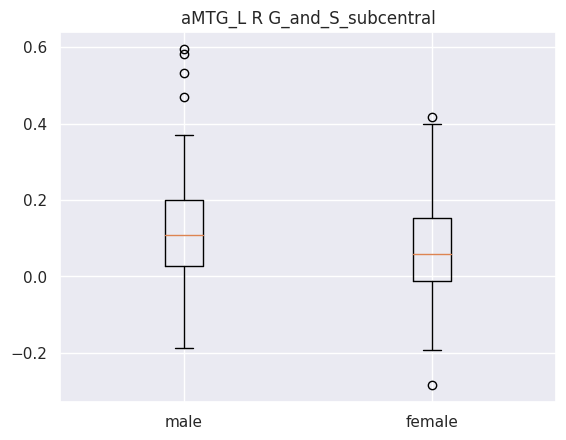

Ttest_indResult(statistic=3.653976525523843, pvalue=0.0002890634342814702)
male mean : 0.11633276292077274
male std : 0.13125775728446906
female mean : 0.07271175159646018
female std : 0.12017260533078429


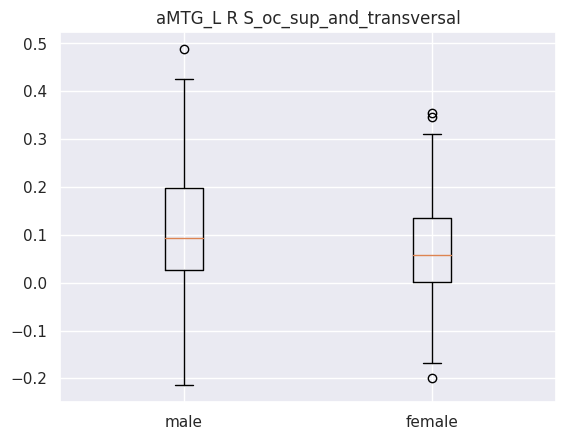

Ttest_indResult(statistic=3.5613990096675714, pvalue=0.0004087562486128332)
male mean : 0.10625280339390909
male std : 0.12637717435553078
female mean : 0.06767066309955752
female std : 0.10078149226010065


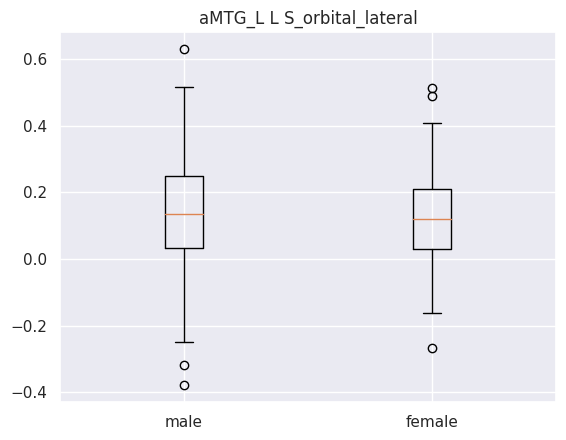

Ttest_indResult(statistic=0.877281044887303, pvalue=0.3808084363343459)
male mean : 0.13632853796136365
male std : 0.1663573877657206
female mean : 0.12388209242345131
female std : 0.1309360608959538


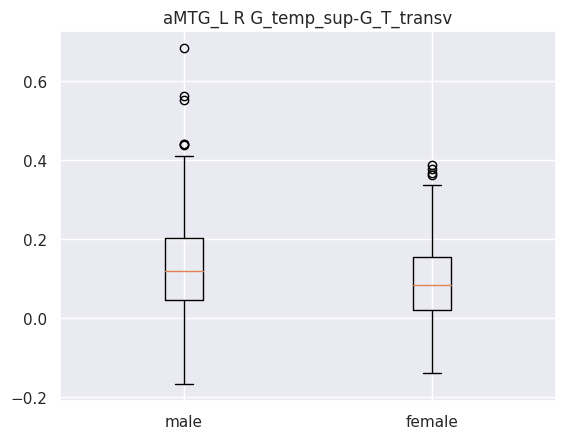

Ttest_indResult(statistic=3.7701717078529744, pvalue=0.00018518819798595042)
male mean : 0.13596376442986363
male std : 0.1234991476441461
female mean : 0.09633152333849558
female std : 0.09671906503879116
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['aMTG_R']
-------------------------------------------------------------------------------------------------------
     coefficient    seed                       labels
98      0.239529  aMTG_R       R G_pariet_inf-Angular
26      0.223566  aMTG_R             L G_parietal_sup
61      0.216234  aMTG_R          L S_orbital_lateral
53      0.214754  aMTG_R                L S_front_sup
55      0.214608  aMTG_R  L S_intrapariet_and_P_trans
114     0.187696  aMTG_R               R Lat_Fis-post
64      0.179345  aMTG_R        L S_parieto_occipital
22      0.174077  aMTG_R      L G_oc-temp_med-Parahip
126     0.173677  aMTG

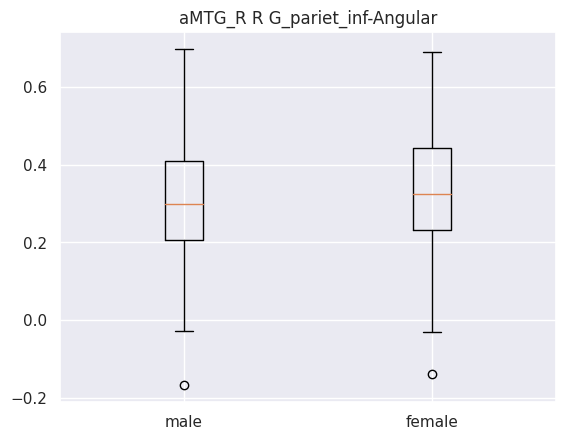

Ttest_indResult(statistic=-1.2323437014086307, pvalue=0.21847289401376063)
male mean : 0.30850017917
male std : 0.1509961278933057
female mean : 0.3258114792300885
female std : 0.14499535619579842


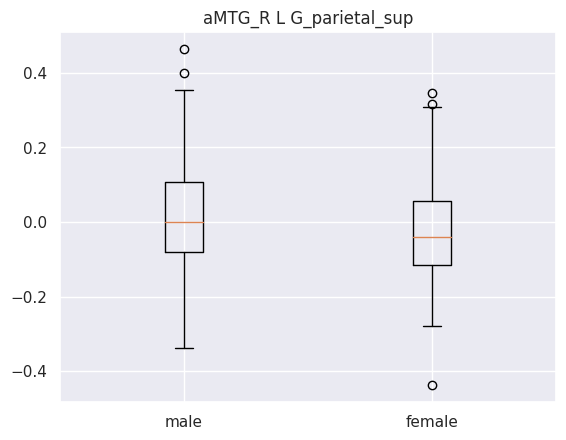

Ttest_indResult(statistic=3.687795634704116, pvalue=0.00025423057819420956)
male mean : 0.016972076357409095
male std : 0.1450332513278706
female mean : -0.030223680599159294
female std : 0.12407561780895006


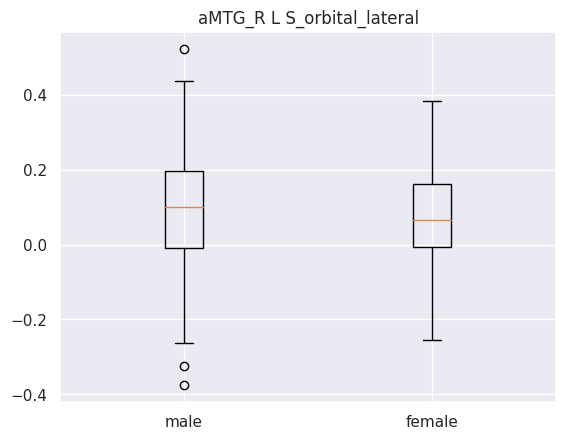

Ttest_indResult(statistic=1.7342817405321398, pvalue=0.08356216387384464)
male mean : 0.09487905712181818
male std : 0.15032183154583945
female mean : 0.07166199463849558
female std : 0.13135384900242203


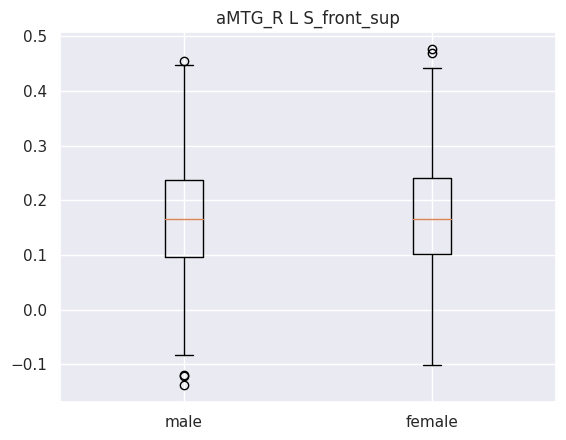

Ttest_indResult(statistic=-0.08008365126456747, pvalue=0.9362068082925741)
male mean : 0.17175187354863636
male std : 0.11338550789442398
female mean : 0.1725857526397788
female std : 0.10597629980410962


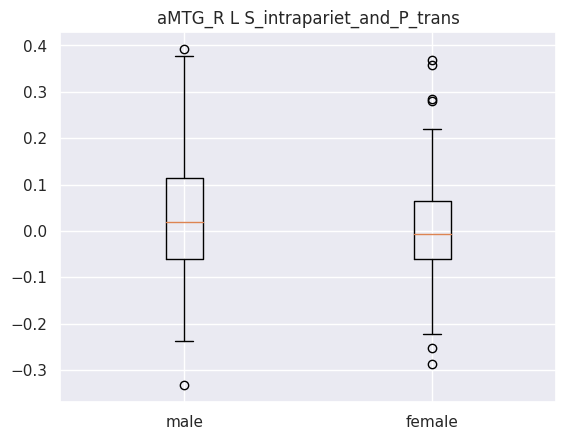

Ttest_indResult(statistic=2.0033433133727625, pvalue=0.0457476860349034)
male mean : 0.02404788690863636
male std : 0.12464427867043203
female mean : 0.0021809927742920342
female std : 0.10473721060141471


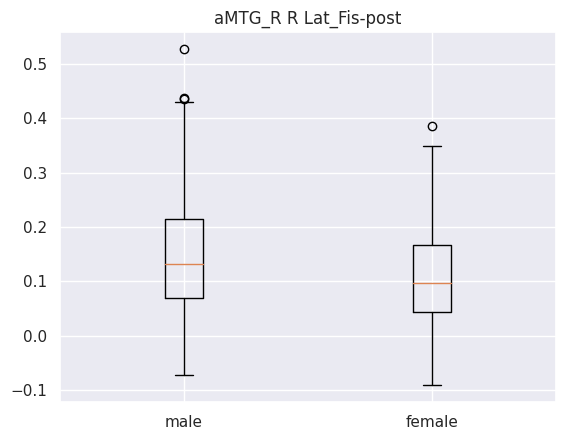

Ttest_indResult(statistic=4.494499436511146, pvalue=8.908176075583958e-06)
male mean : 0.15324251039654546
male std : 0.11185401126170393
female mean : 0.11034453286724513
female std : 0.08816248956060074


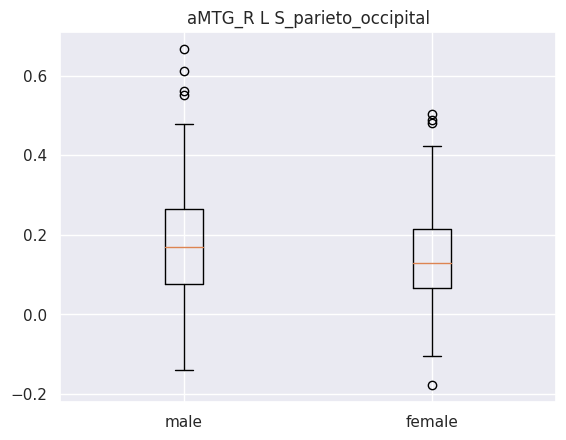

Ttest_indResult(statistic=2.7856826957720897, pvalue=0.005570176920800892)
male mean : 0.1771041583763636
male std : 0.1337103914918067
female mean : 0.1436597400653097
female std : 0.11901572309886627


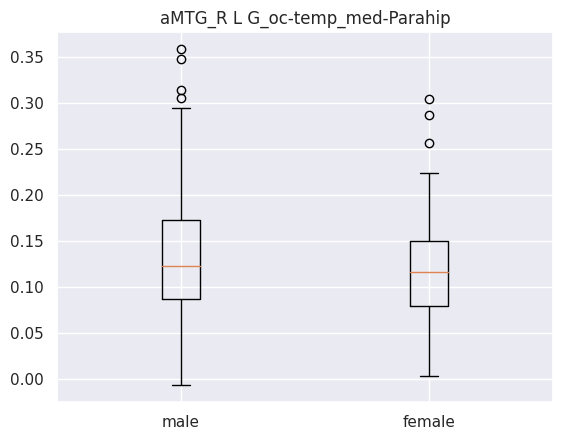

Ttest_indResult(statistic=2.839191497277654, pvalue=0.004730402487154351)
male mean : 0.13388492833
male std : 0.06366889431603796
female mean : 0.11838812058539823
female std : 0.05078064169079939


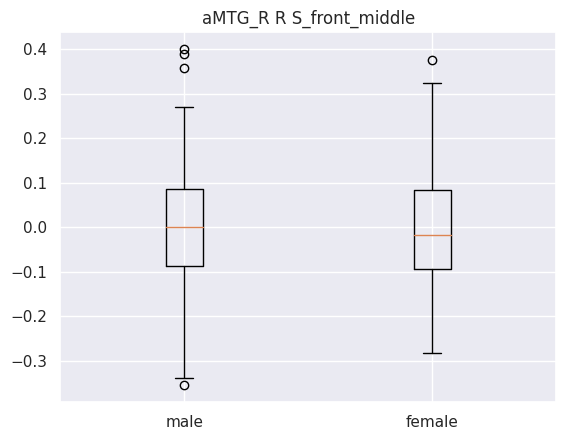

Ttest_indResult(statistic=0.7447056065883535, pvalue=0.4568436898807169)
male mean : -0.0029861810154545457
male std : 0.13238093195574754
female mean : -0.012133770542035401
female std : 0.12643670781491048


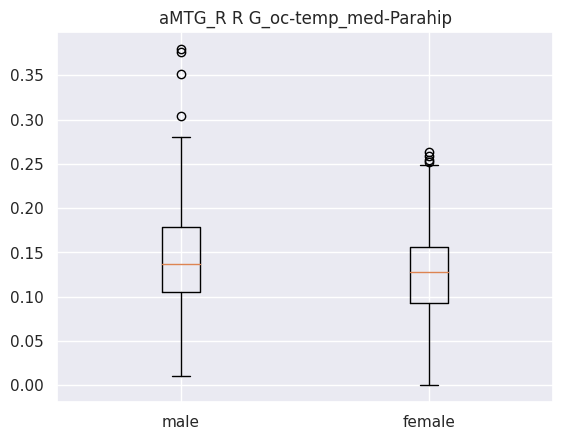

Ttest_indResult(statistic=3.2230120586916766, pvalue=0.0013619508370199724)
male mean : 0.14602855690909092
male std : 0.06277541821437044
female mean : 0.1286269260214602
female std : 0.050481361154379095
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['opIFG_L']
-------------------------------------------------------------------------------------------------------
     coefficient     seed                     labels
1       0.249285  opIFG_L    L G_and_S_occipital_inf
144     0.235430  opIFG_L            R S_subparietal
35      0.213575  opIFG_L    L G_temp_sup-Plan_tempo
115     0.204451  opIFG_L           R Pole_occipital
41      0.199240  opIFG_L           L Pole_occipital
130     0.188844  opIFG_L  R S_oc_middle_and_Lunatus
88      0.165023  opIFG_L           R G_front_middle
86      0.156737  opIFG_L      R G_front_inf-Orbital
63      0.145530  opIFG_L     

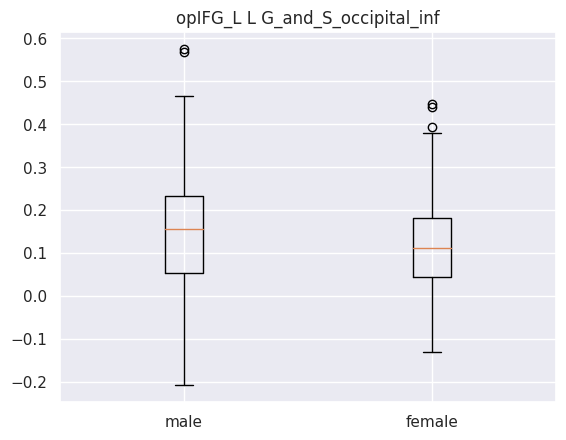

Ttest_indResult(statistic=3.05191381594728, pvalue=0.002410294840666242)
male mean : 0.15546942175227274
male std : 0.13201789524707933
female mean : 0.11997070040309733
female std : 0.112540443719782


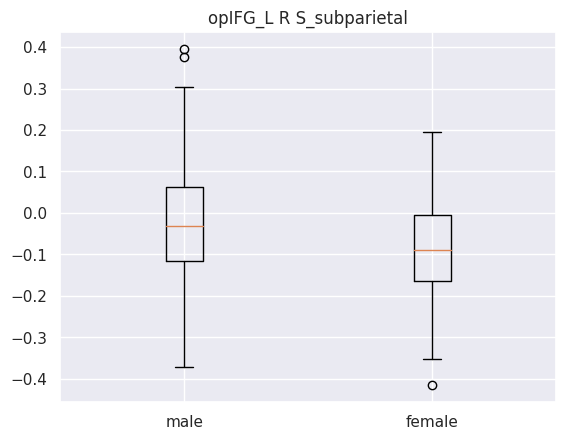

Ttest_indResult(statistic=4.609312989745705, pvalue=5.2885387407695605e-06)
male mean : -0.024811179274522723
male std : 0.14365742689954286
female mean : -0.08184163840840707
female std : 0.1159257812279483


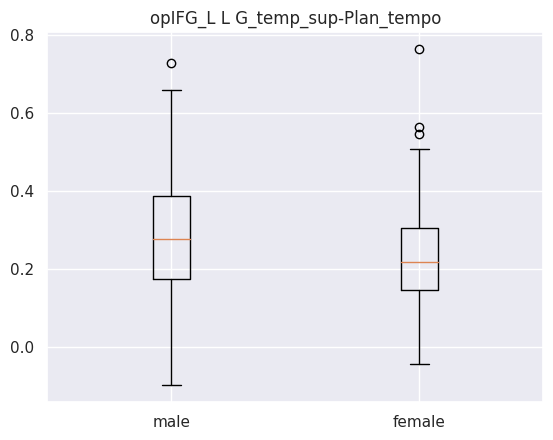

Ttest_indResult(statistic=4.658112093864058, pvalue=4.223278693577736e-06)
male mean : 0.2863882349772728
male std : 0.14948277729148243
female mean : 0.22649747706194692
female std : 0.12022186901150231


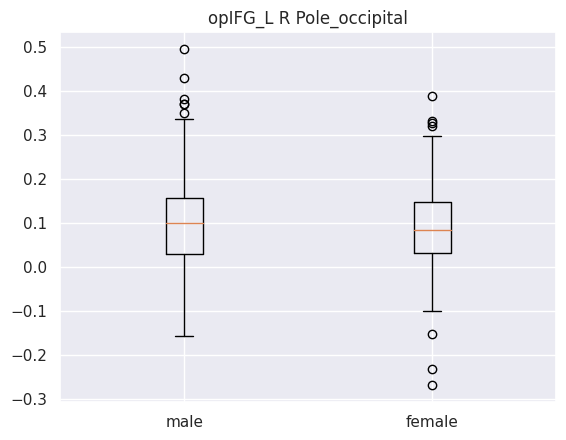

Ttest_indResult(statistic=1.2270200243822131, pvalue=0.22046528670431295)
male mean : 0.10264165664127273
male std : 0.10579771660158865
female mean : 0.09113777078365044
female std : 0.09140653167378178


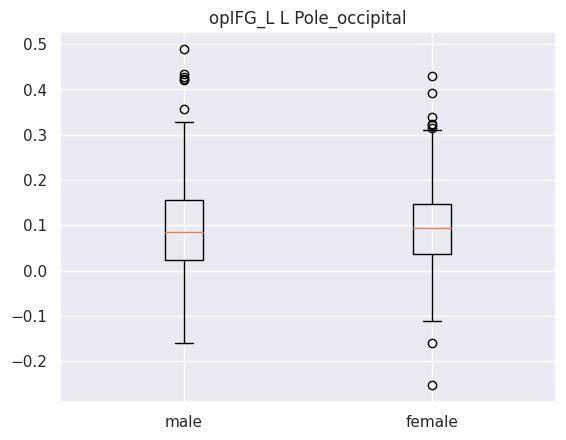

Ttest_indResult(statistic=0.41319809936730145, pvalue=0.6796609598891232)
male mean : 0.10181187025654546
male std : 0.10793048805971699
female mean : 0.09780579236287609
female std : 0.09616272201075322


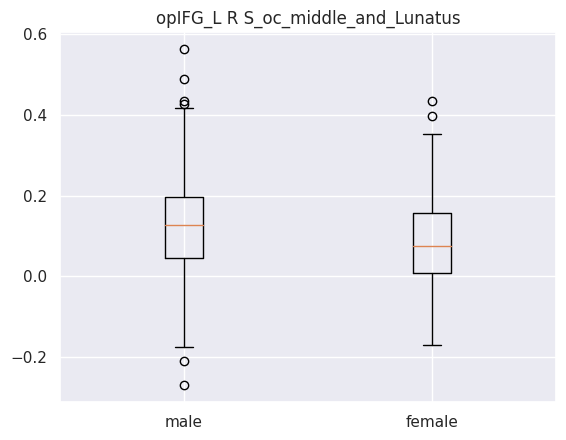

Ttest_indResult(statistic=3.5387262822560994, pvalue=0.0004444547820448851)
male mean : 0.12557852228272728
male std : 0.12899481535497134
female mean : 0.08501587136902654
female std : 0.11215185185322979


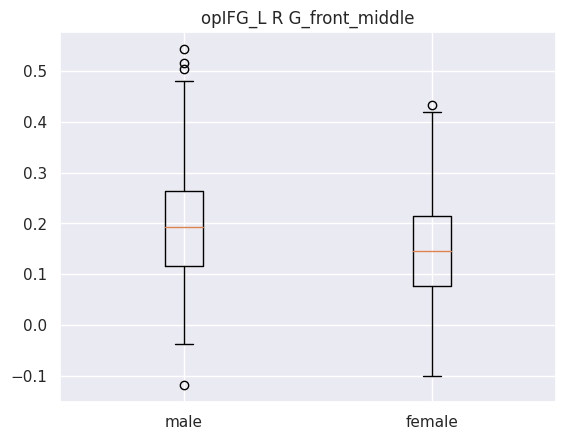

Ttest_indResult(statistic=4.696146136615386, pvalue=3.5393285997104538e-06)
male mean : 0.19782072086818184
male std : 0.11127072008455094
female mean : 0.15016436032079647
female std : 0.10247843418607412


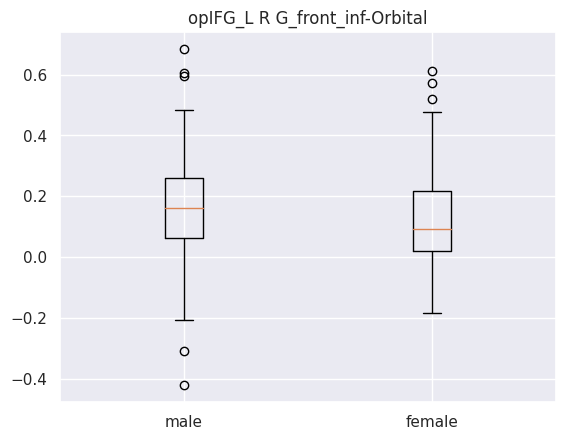

Ttest_indResult(statistic=2.8700219557338875, pvalue=0.004300467745953177)
male mean : 0.16176995975213632
male std : 0.1624989648112715
female mean : 0.11882039737123894
female std : 0.1527833017666561


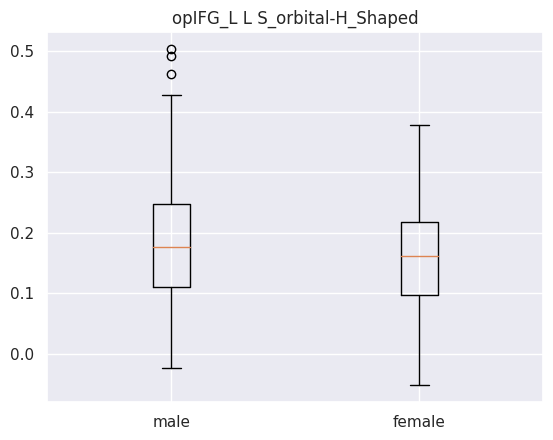

Ttest_indResult(statistic=2.644633190936108, pvalue=0.008467788090063377)
male mean : 0.18242765075681822
male std : 0.09921559781825649
female mean : 0.15890996436504423
female std : 0.08795938681733387


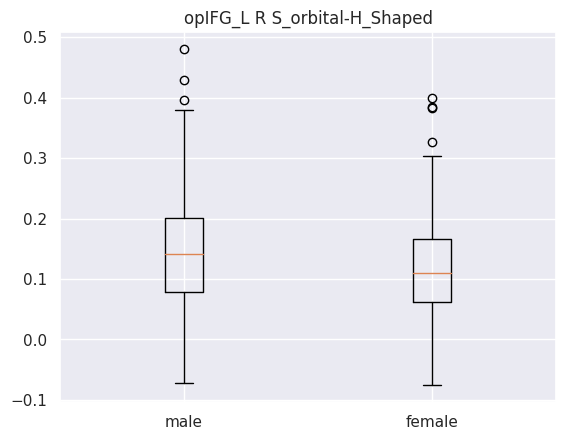

Ttest_indResult(statistic=3.2608437565029393, pvalue=0.0011963500710870224)
male mean : 0.14576014278922725
male std : 0.09483663815021946
female mean : 0.11767383919380532
female std : 0.08656092225564993
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['opIFG_R']
-------------------------------------------------------------------------------------------------------
     coefficient     seed                labels
63      0.243249  opIFG_R  L S_orbital-H_Shaped
144     0.181521  opIFG_R       R S_subparietal
41      0.153763  opIFG_R      L Pole_occipital
51      0.145312  opIFG_R         L S_front_inf
17      0.140490  opIFG_R     L G_insular_short
42      0.134728  opIFG_R       L Pole_temporal
117     0.127797  opIFG_R         R S_calcarine
125     0.126361  opIFG_R         R S_front_inf
115     0.125303  opIFG_R      R Pole_occipital
111     0.113600  opIFG_R  

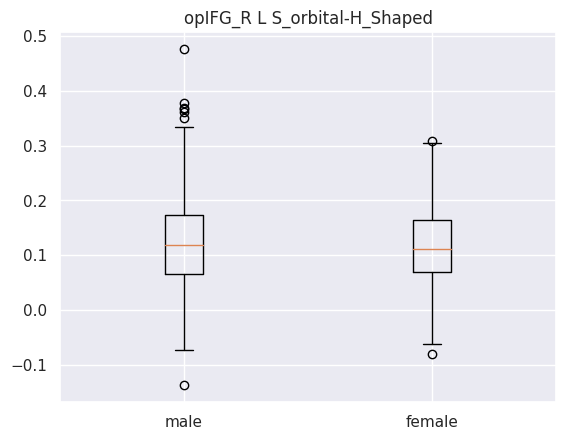

Ttest_indResult(statistic=0.8561324777791736, pvalue=0.39238630056013113)
male mean : 0.12343299978045455
male std : 0.08958678153626323
female mean : 0.11666919567345133
female std : 0.07653337463165284


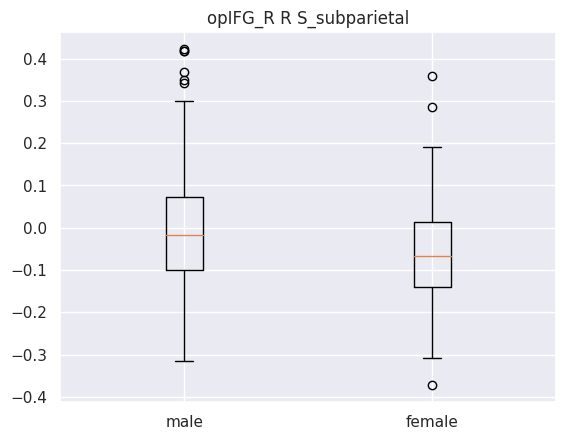

Ttest_indResult(statistic=4.342181044945235, pvalue=1.749268283550659e-05)
male mean : -0.008883466066818179
male std : 0.14428559820039927
female mean : -0.06175231570632744
female std : 0.11046401972822666


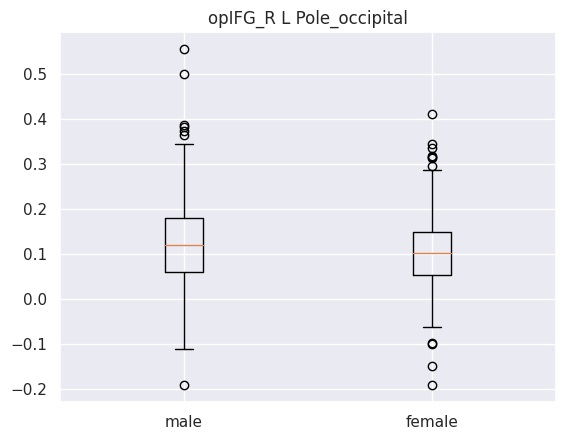

Ttest_indResult(statistic=1.9668569199465695, pvalue=0.049822028600582956)
male mean : 0.1226511061215
male std : 0.10336637927130211
female mean : 0.10500797782699114
female std : 0.08498185574097446


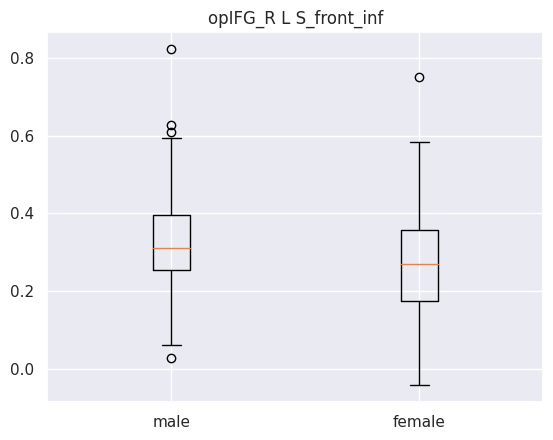

Ttest_indResult(statistic=5.03969636500921, pvalue=6.800010225621523e-07)
male mean : 0.3225272741545454
male std : 0.11879517347001615
female mean : 0.2652191471548672
female std : 0.12075781373921896


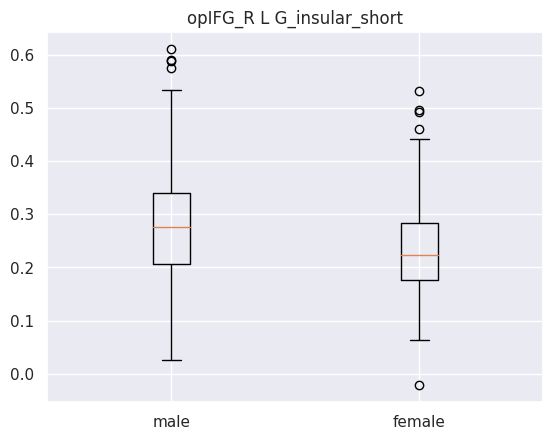

Ttest_indResult(statistic=4.8748625987796, pvalue=1.51867837439264e-06)
male mean : 0.28017770994090907
male std : 0.10586630539410616
female mean : 0.234887319539823
female std : 0.08940955273694462


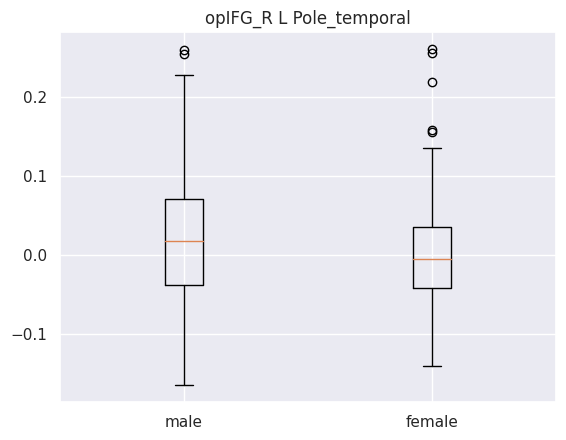

Ttest_indResult(statistic=3.2165588253943294, pvalue=0.0013922323602105183)
male mean : 0.022209156279090914
male std : 0.08266507667997913
female mean : -0.0003959798308849558
female std : 0.06453515907440345


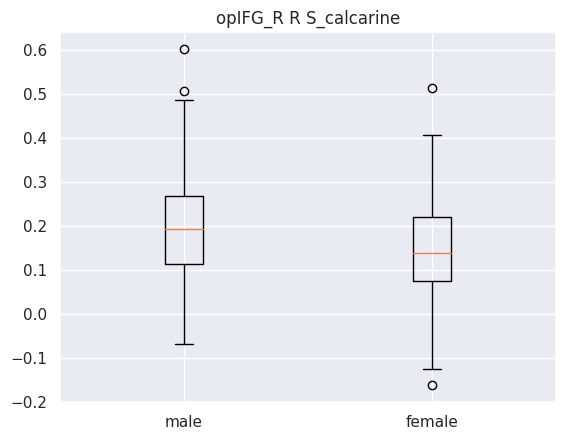

Ttest_indResult(statistic=4.237827850565027, pvalue=2.7464151972045144e-05)
male mean : 0.19217596783045457
male std : 0.11294197663986946
female mean : 0.14892272028761064
female std : 0.10196970971881396


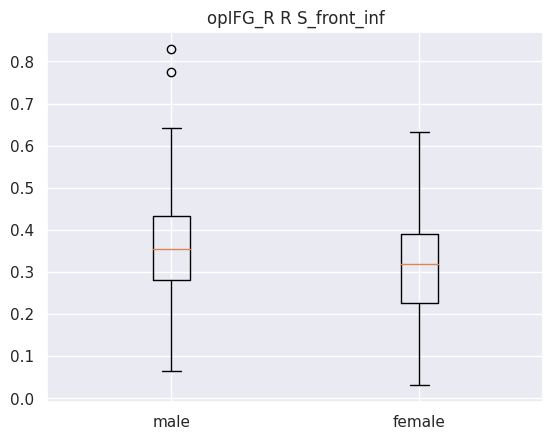

Ttest_indResult(statistic=3.9946084585433304, pvalue=7.584042967238988e-05)
male mean : 0.36241775419090916
male std : 0.11709006437871611
female mean : 0.31739422023451325
female std : 0.12031934666421866


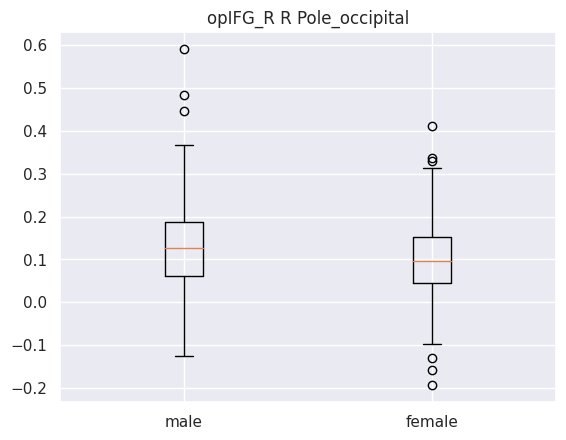

Ttest_indResult(statistic=2.6060938753485763, pvalue=0.009465977162065771)
male mean : 0.12615672341909093
male std : 0.10369712116426066
female mean : 0.10252247063672566
female std : 0.0868614163138863


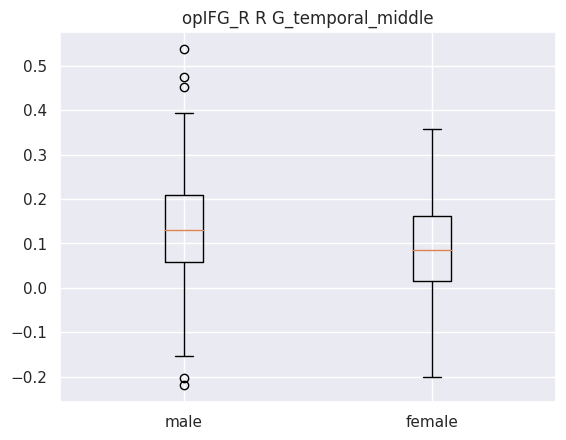

Ttest_indResult(statistic=4.6582079043912445, pvalue=4.221405846411217e-06)
male mean : 0.13492025501840907
male std : 0.1137072130254681
female mean : 0.08854866335650442
female std : 0.09548712161845173
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['pITG_L']
-------------------------------------------------------------------------------------------------------
     coefficient    seed                       labels
5       0.225580  pITG_L         L G_and_S_cingul-Ant
86      0.219003  pITG_L        R G_front_inf-Orbital
125     0.201882  pITG_L                R S_front_inf
73      0.177175  pITG_L      L S_temporal_transverse
70      0.175313  pITG_L              L S_subparietal
147     0.155924  pITG_L      R S_temporal_transverse
9       0.150438  pITG_L      L G_cingul-Post-ventral
55      0.150417  pITG_L  L S_intrapariet_and_P_trans
126     0.138278  pITG_

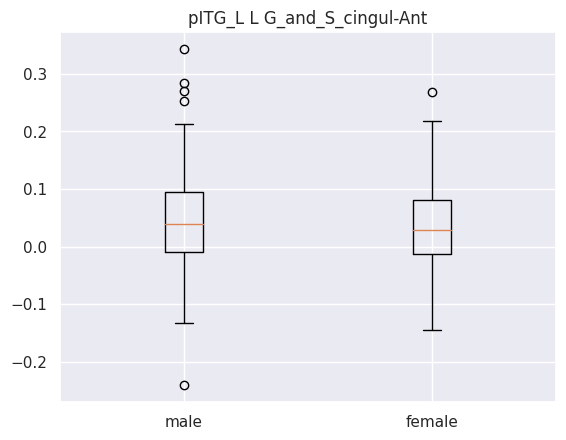

Ttest_indResult(statistic=0.9423641748942606, pvalue=0.34651867898691713)
male mean : 0.04273676698363637
male std : 0.08120406336224366
female mean : 0.035810986843185844
female std : 0.07355665164454465


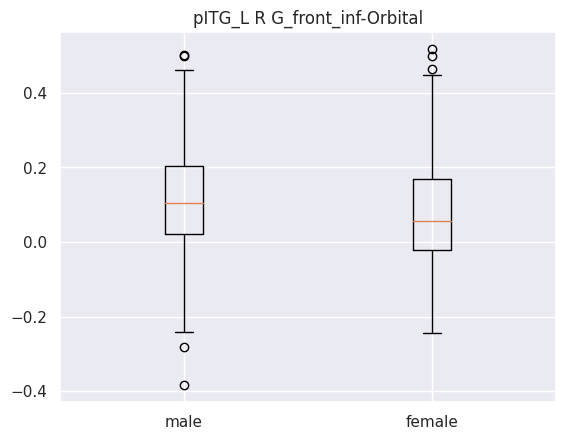

Ttest_indResult(statistic=2.1985301607329877, pvalue=0.02842657546406812)
male mean : 0.10284580619136363
male std : 0.14888510757101564
female mean : 0.07244750026106195
female std : 0.1424496079400281


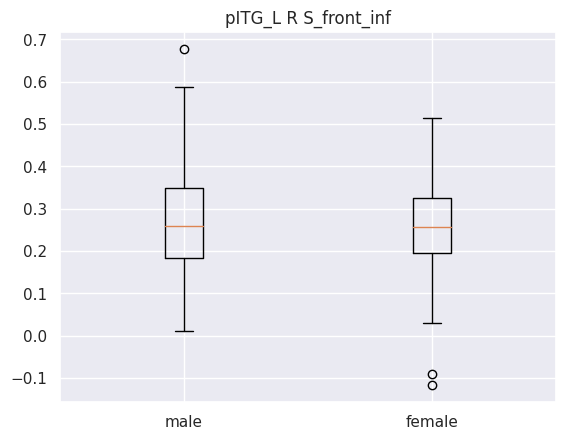

Ttest_indResult(statistic=1.0020328934125462, pvalue=0.31687348431400925)
male mean : 0.2700681785363636
male std : 0.11105772730043446
female mean : 0.25973832161504423
female std : 0.10615524639315872


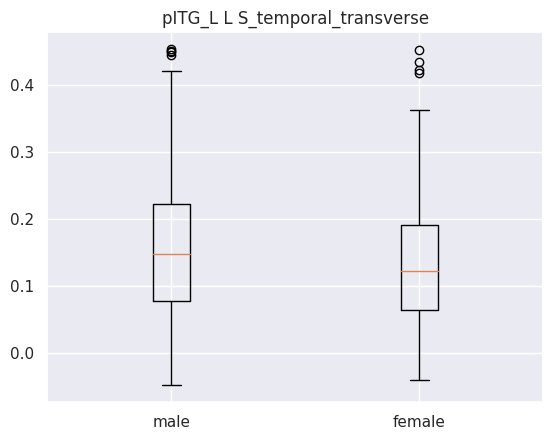

Ttest_indResult(statistic=2.5571750426222266, pvalue=0.010883989566106632)
male mean : 0.1583446232454545
male std : 0.10578124515424395
female mean : 0.1342784206256637
female std : 0.09222667259385757


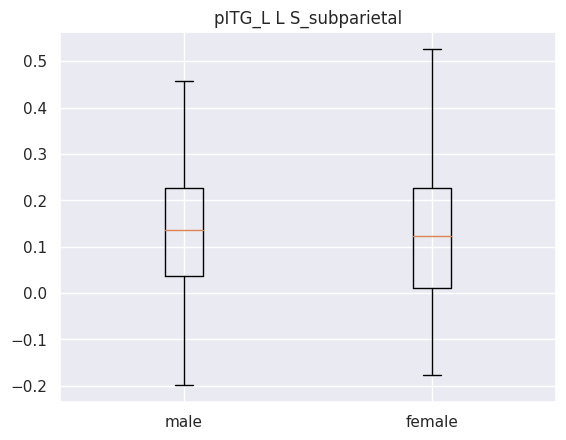

Ttest_indResult(statistic=0.5127464357072493, pvalue=0.6083836959736425)
male mean : 0.13141780353045457
male std : 0.13112363977164576
female mean : 0.12473059681924778
female std : 0.14323238441155559


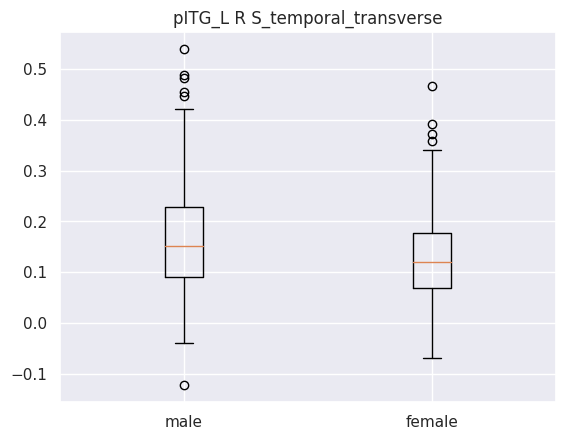

Ttest_indResult(statistic=3.792213370476279, pvalue=0.00016996651763579552)
male mean : 0.16461195800772727
male std : 0.10736839162410636
female mean : 0.1294958394858407
female std : 0.0869378915541169


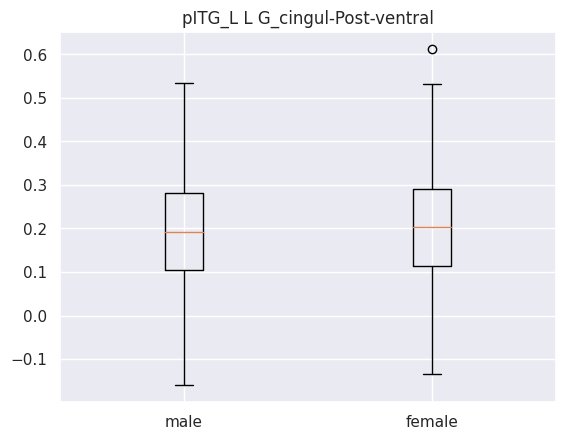

Ttest_indResult(statistic=-0.8502284729847315, pvalue=0.3956563221847449)
male mean : 0.19532825054954547
male std : 0.12405214793600829
female mean : 0.2054311569070796
female std : 0.12626706102176716


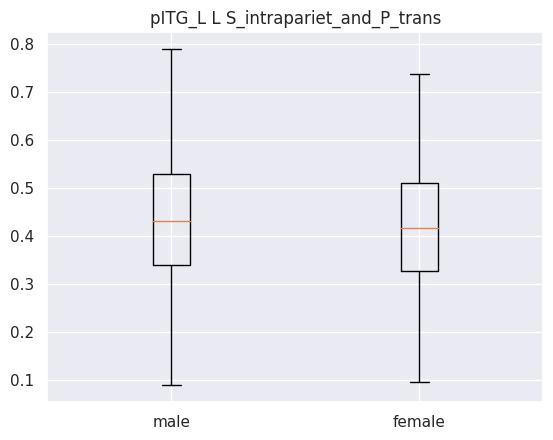

Ttest_indResult(statistic=0.6041143572753404, pvalue=0.5460761592105134)
male mean : 0.4304373097727274
male std : 0.13301584196209193
female mean : 0.42295020637610614
female std : 0.1281282122063903


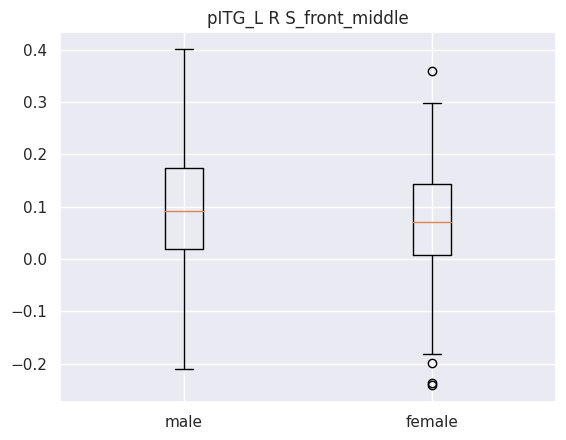

Ttest_indResult(statistic=2.262227860903967, pvalue=0.024165930044473365)
male mean : 0.09672683969472727
male std : 0.10691554436745918
female mean : 0.07428678904690267
female std : 0.10209048708783634


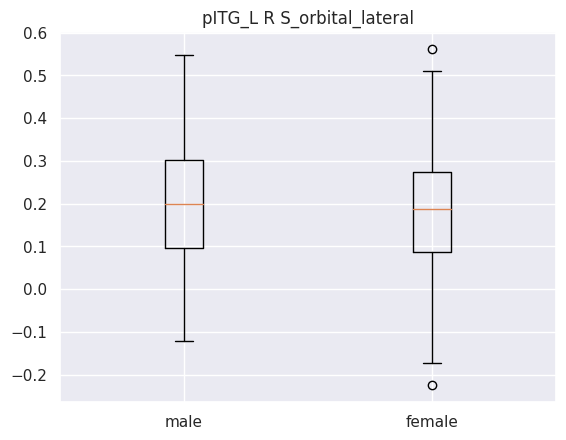

Ttest_indResult(statistic=1.3108865376813061, pvalue=0.19057369875431965)
male mean : 0.20063633318604546
male std : 0.1449903023935802
female mean : 0.1830400494539823
female std : 0.13783407715558785
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['pITG_R']
-------------------------------------------------------------------------------------------------------
     coefficient    seed                   labels
125     0.228313  pITG_R            R S_front_inf
20      0.223031  pITG_R  L G_oc-temp_lat-fusifor
115     0.190659  pITG_R         R Pole_occipital
144     0.168625  pITG_R          R S_subparietal
63      0.139670  pITG_R     L S_orbital-H_Shaped
83      0.130479  pITG_R  R G_cingul-Post-ventral
70      0.111367  pITG_R          L S_subparietal
79      0.110136  pITG_R     R G_and_S_cingul-Ant
69      0.108413  pITG_R           L S_suborbital
17      0.10

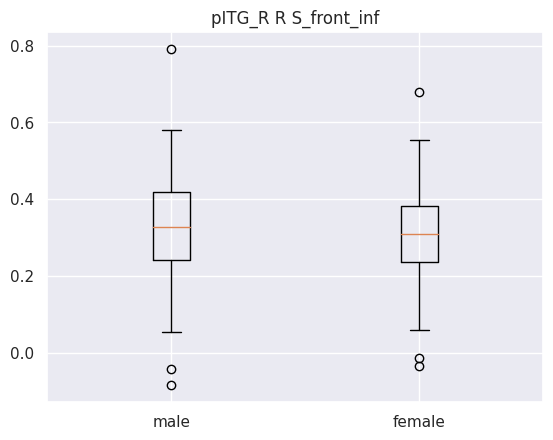

Ttest_indResult(statistic=2.13538486489198, pvalue=0.03327622102378573)
male mean : 0.3298146207409091
male std : 0.12123145108487972
female mean : 0.3068887235929204
female std : 0.1045843071513845


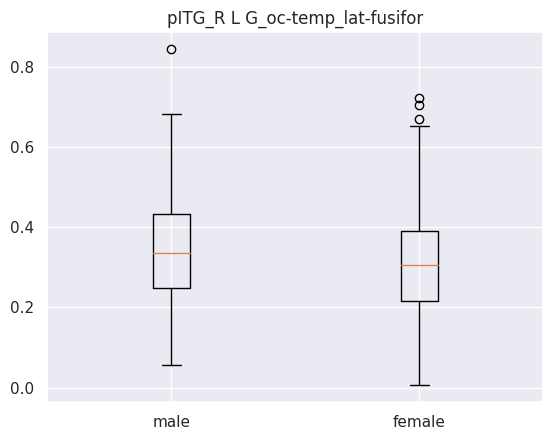

Ttest_indResult(statistic=2.207601503782289, pvalue=0.027782692747375555)
male mean : 0.3381230503772727
male std : 0.13608853787659086
female mean : 0.31070127244911505
female std : 0.1255552430118421


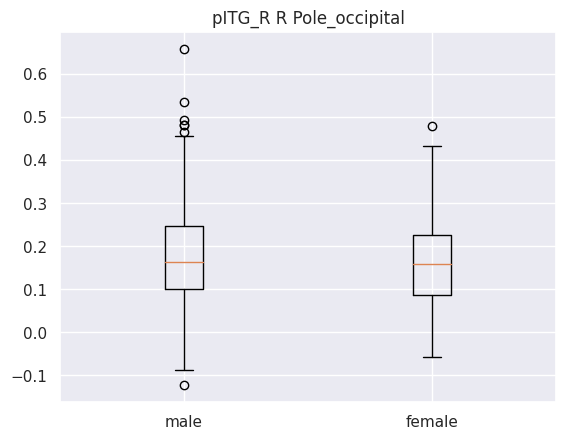

Ttest_indResult(statistic=1.7933223513803218, pvalue=0.07360183332149493)
male mean : 0.18422044456818182
male std : 0.12142253248366915
female mean : 0.16513208214721237
female std : 0.10228235745395765


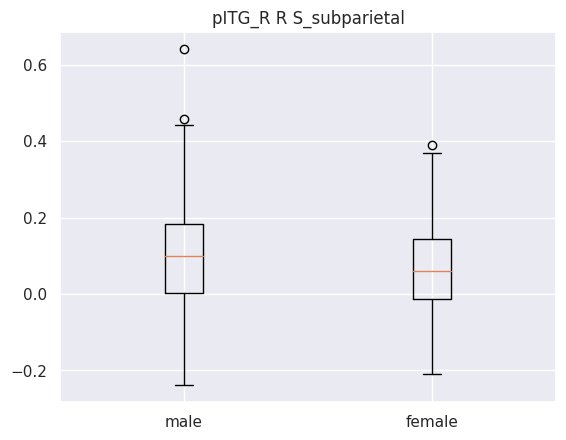

Ttest_indResult(statistic=2.829717950526025, pvalue=0.004870145913425502)
male mean : 0.09907962378045454
male std : 0.14339205847252812
female mean : 0.06350742244464602
female std : 0.12080952413470375


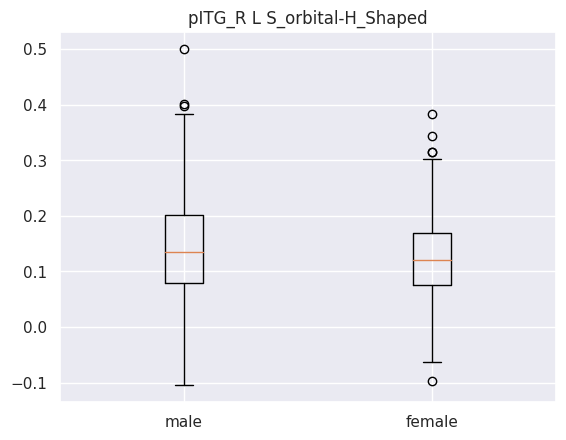

Ttest_indResult(statistic=2.4099850697887852, pvalue=0.016358900955009078)
male mean : 0.1438940428718182
male std : 0.09387540069779379
female mean : 0.12447468039911505
female std : 0.07511177448180904


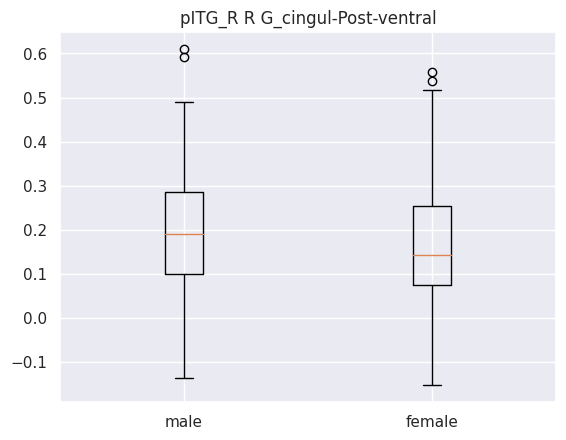

Ttest_indResult(statistic=2.380140291533847, pvalue=0.01772726625126871)
male mean : 0.19296064746681815
male std : 0.1346758980066957
female mean : 0.16264045314955752
female std : 0.13373455574896778


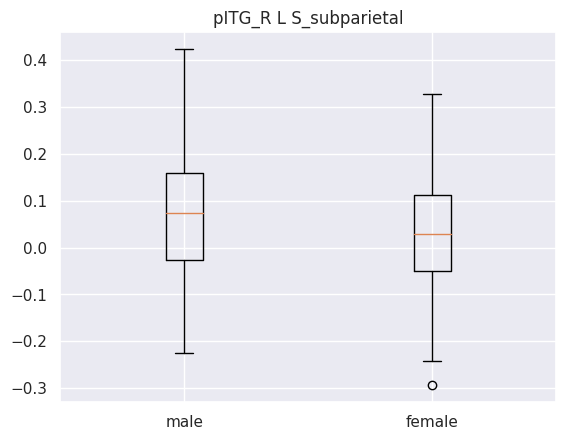

Ttest_indResult(statistic=3.0469046759693255, pvalue=0.002449976139377508)
male mean : 0.07185232365500001
male std : 0.1405051803664912
female mean : 0.0345531874569469
female std : 0.1166332690460987


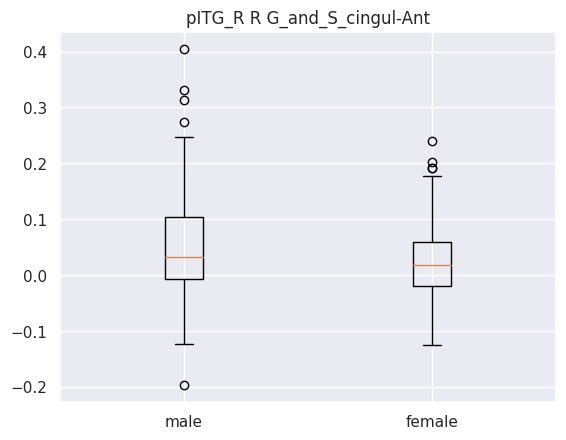

Ttest_indResult(statistic=3.3660004581303236, pvalue=0.0008289579997513635)
male mean : 0.04933961785272728
male std : 0.08588680640744353
female mean : 0.025453949248053095
female std : 0.062030754045511526


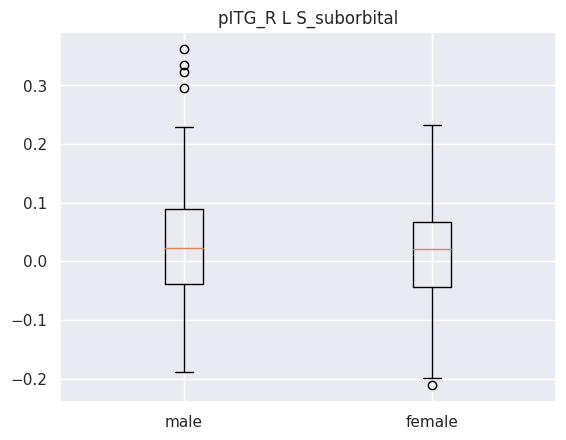

Ttest_indResult(statistic=1.8687614240116652, pvalue=0.062314242575285034)
male mean : 0.03234572284590909
male std : 0.09417368434894365
female mean : 0.01658450089809734
female std : 0.08334198217708257


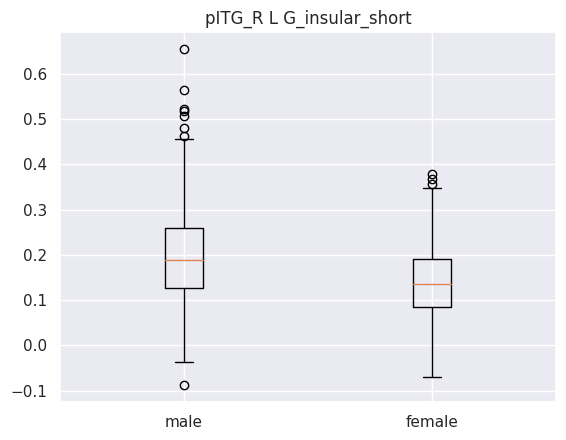

Ttest_indResult(statistic=5.998795194583973, pvalue=4.127056179850988e-09)
male mean : 0.19648743574554547
male std : 0.11404458623613879
female mean : 0.14062664109867257
female std : 0.07956460959271469
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['planumtemp_L']
-------------------------------------------------------------------------------------------------------
     coefficient          seed                     labels
94      0.205845  planumtemp_L    R G_oc-temp_lat-fusifor
75      0.203749  planumtemp_L    R G_and_S_occipital_inf
20      0.167511  planumtemp_L    L G_oc-temp_lat-fusifor
27      0.163707  planumtemp_L            L G_postcentral
88      0.145960  planumtemp_L           R G_front_middle
46      0.127837  planumtemp_L    L S_circular_insula_ant
116     0.121455  planumtemp_L            R Pole_temporal
14      0.119973  planumtemp_L         

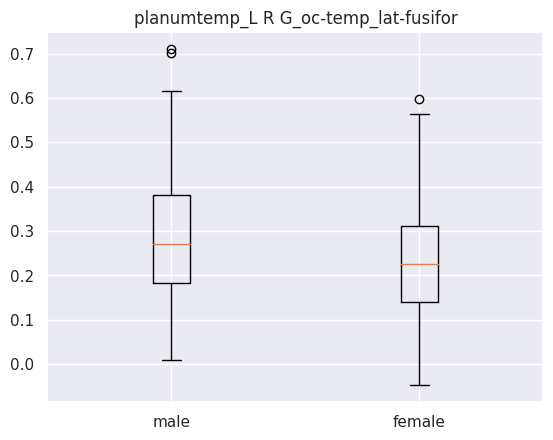

Ttest_indResult(statistic=4.055614333449546, pvalue=5.9060276690219876e-05)
male mean : 0.28515832146363634
male std : 0.13827308909461045
female mean : 0.23584467546176993
female std : 0.11734248121055887


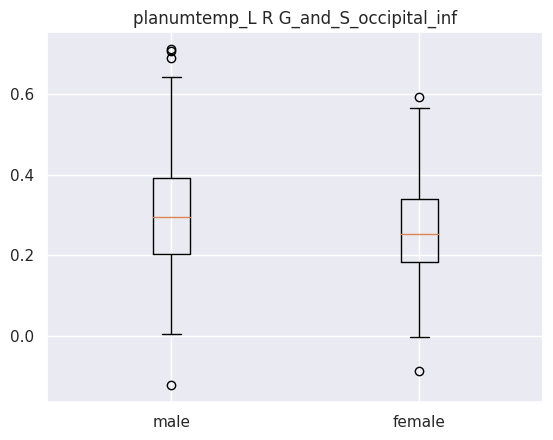

Ttest_indResult(statistic=3.531736949871788, pvalue=0.00045603535995372815)
male mean : 0.3035152627109091
male std : 0.14361189077675587
female mean : 0.25931693665619465
female std : 0.11926479827017382


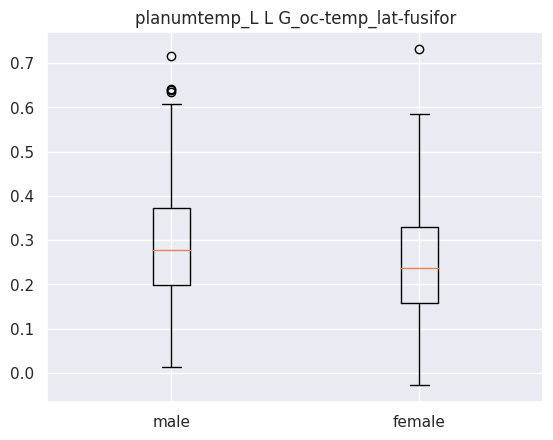

Ttest_indResult(statistic=3.7622305190657452, pvalue=0.0001909807101357603)
male mean : 0.2942304806272728
male std : 0.13292350850751689
female mean : 0.24918162700884958
female std : 0.119170924743853


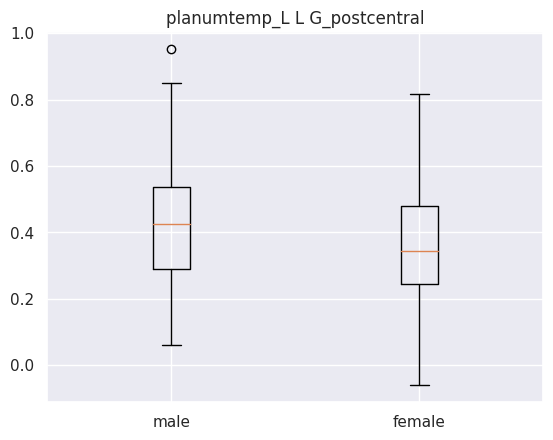

Ttest_indResult(statistic=3.8010635167476186, pvalue=0.00016419353236903363)
male mean : 0.4266919482909091
male std : 0.17868821585085246
female mean : 0.3641308410840708
female std : 0.16807001388504972


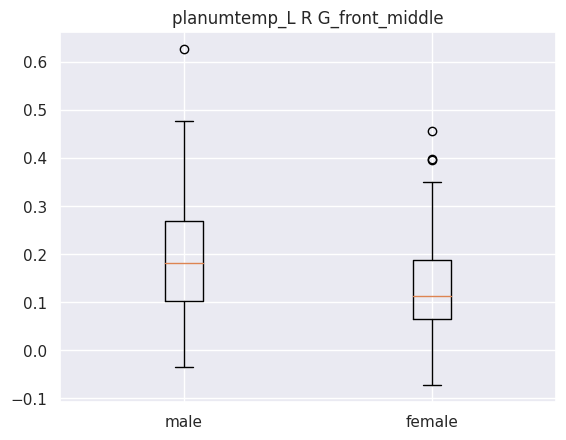

Ttest_indResult(statistic=6.634469213319584, pvalue=9.499788890810707e-11)
male mean : 0.19229594642727274
male std : 0.1135469466588058
female mean : 0.12716070434433627
female std : 0.09251751281917918


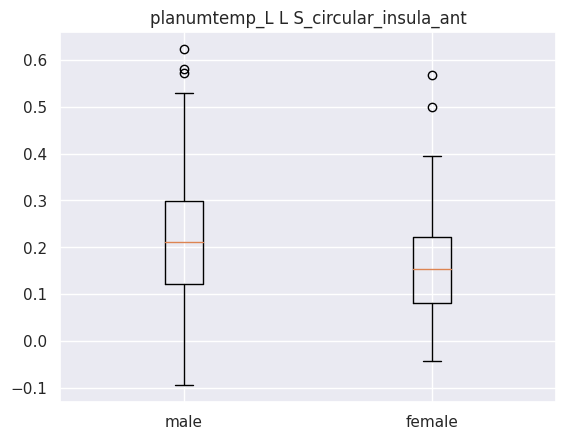

Ttest_indResult(statistic=5.476913594842976, pvalue=7.259335623414973e-08)
male mean : 0.21467638611545456
male std : 0.1275760675099925
female mean : 0.1549528182676991
female std : 0.10099214552742872


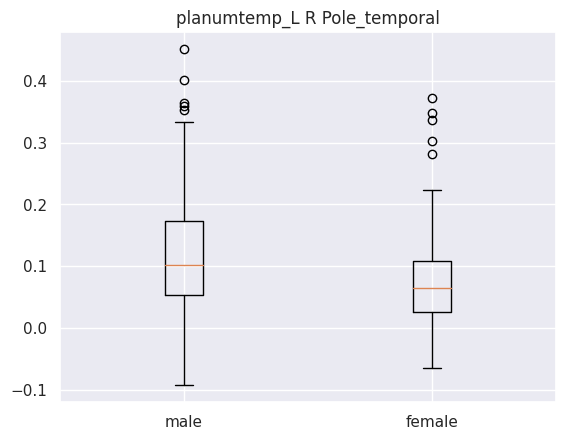

Ttest_indResult(statistic=5.44117187145923, pvalue=8.766068622803628e-08)
male mean : 0.1164685098168182
male std : 0.09468062255002856
female mean : 0.07288128754579645
female std : 0.07299118880583733


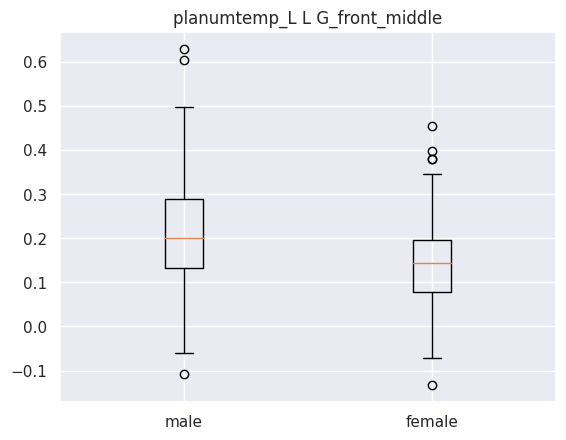

Ttest_indResult(statistic=6.448439451752483, pvalue=2.9545624332827016e-10)
male mean : 0.2113752705990909
male std : 0.12046099141051857
female mean : 0.14510719002101768
female std : 0.09488999192223299


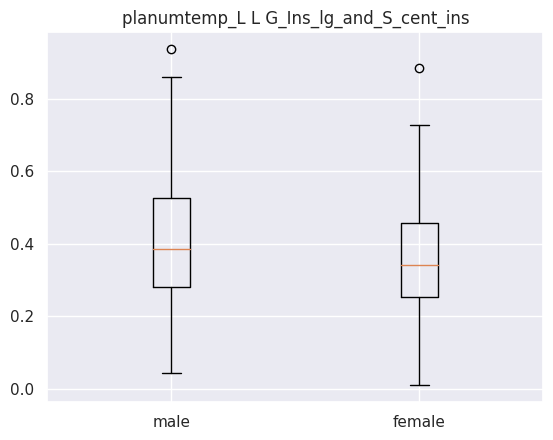

Ttest_indResult(statistic=3.3583212739143358, pvalue=0.0008517419587286367)
male mean : 0.40574434097272727
male std : 0.16530709164084129
female mean : 0.3558610716637168
female std : 0.14737730497290397


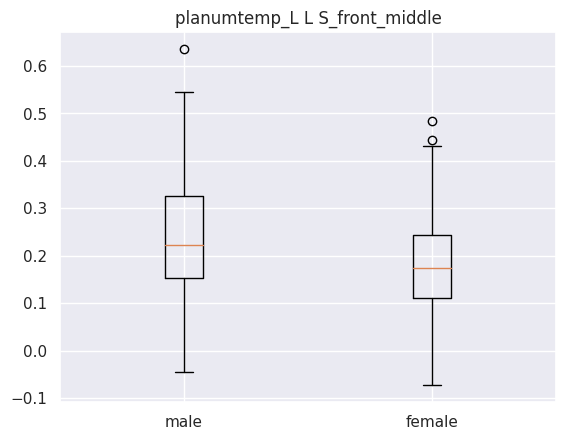

Ttest_indResult(statistic=5.441456835325737, pvalue=8.75293204882479e-08)
male mean : 0.23746832226818185
male std : 0.12024151888048461
female mean : 0.1805095673982301
female std : 0.0996145755465106
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['planumtemp_R']
-------------------------------------------------------------------------------------------------------
     coefficient          seed                   labels
76      0.162227  planumtemp_R    R G_and_S_paracentral
138     0.156005  planumtemp_R    R S_parieto_occipital
58      0.150316  planumtemp_R        L S_occipital_ant
13      0.143834  planumtemp_R   L G_front_inf-Triangul
108     0.141471  planumtemp_R  R G_temp_sup-Plan_polar
0       0.140341  planumtemp_R   L G_and_S_frontomargin
121     0.139099  planumtemp_R  R S_circular_insula_inf
89      0.139084  planumtemp_R            R G_front_sup
54

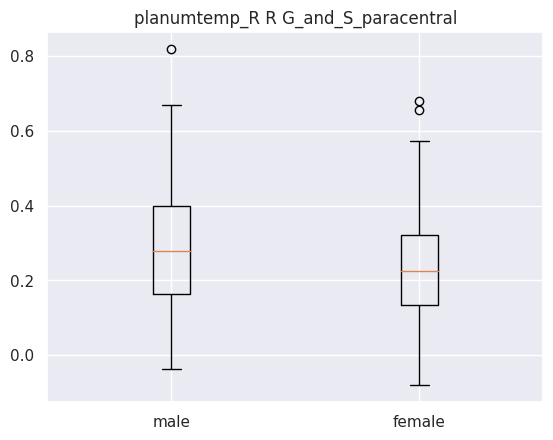

Ttest_indResult(statistic=4.196659912299442, pvalue=3.273103530306964e-05)
male mean : 0.2934674143389091
male std : 0.1626728430119187
female mean : 0.23408976544690266
female std : 0.13447674437900894


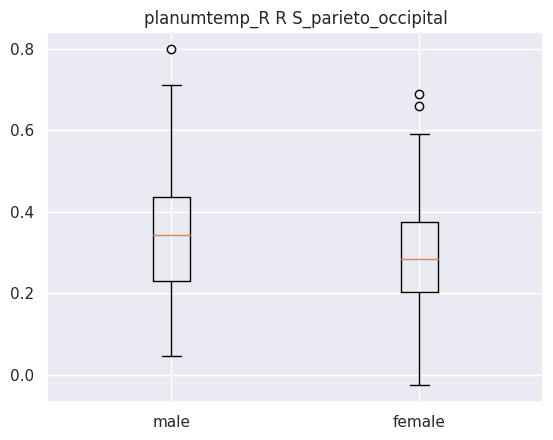

Ttest_indResult(statistic=3.9735147716732495, pvalue=8.262916707408917e-05)
male mean : 0.3464650088363636
male std : 0.14530057159964557
female mean : 0.2948573092123894
female std : 0.12803427267062117


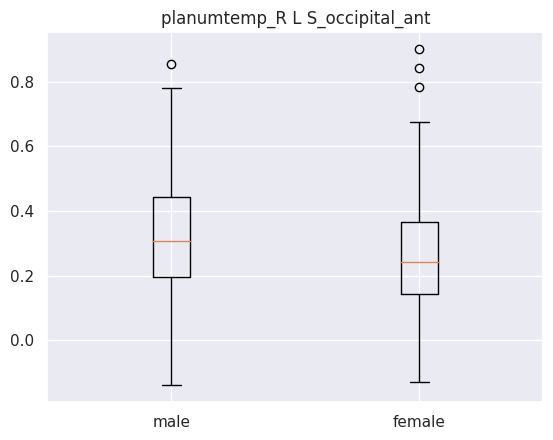

Ttest_indResult(statistic=3.629468538442295, pvalue=0.00031705795408566576)
male mean : 0.32491525365363627
male std : 0.18850141769971665
female mean : 0.262817527569469
female std : 0.17181993436516113


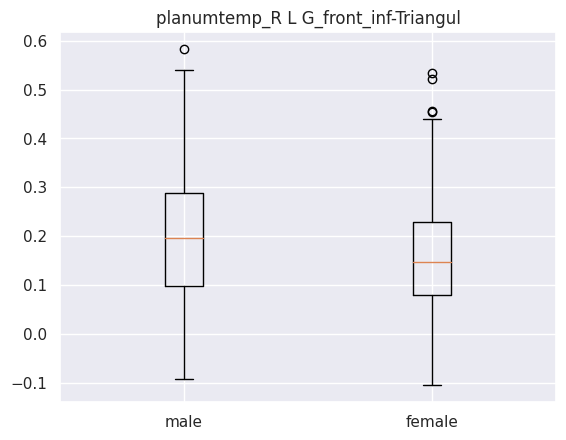

Ttest_indResult(statistic=3.0562464773207436, pvalue=0.002376449454751913)
male mean : 0.1960273009493182
male std : 0.1378420525655936
female mean : 0.15926674510530975
female std : 0.1148448116542265


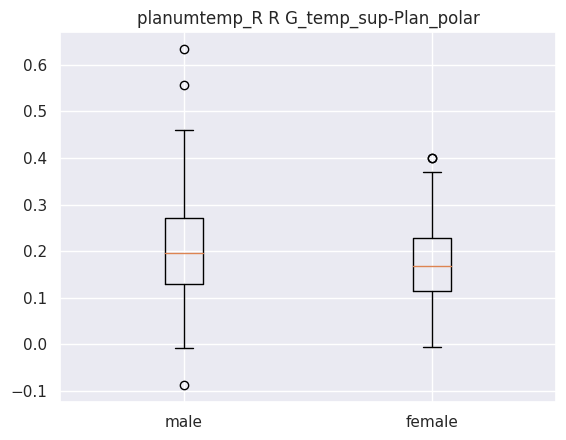

Ttest_indResult(statistic=3.411258353986623, pvalue=0.0007058022781917119)
male mean : 0.20694257242727274
male std : 0.10325686123318684
female mean : 0.17643976180088497
female std : 0.08445412241365245


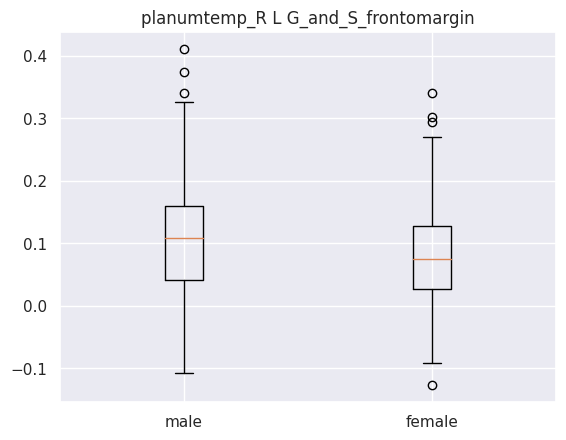

Ttest_indResult(statistic=2.855172605397317, pvalue=0.004502898139870614)
male mean : 0.10687692289254545
male std : 0.09086656022634325
female mean : 0.08364367973172564
female std : 0.08040149919565204


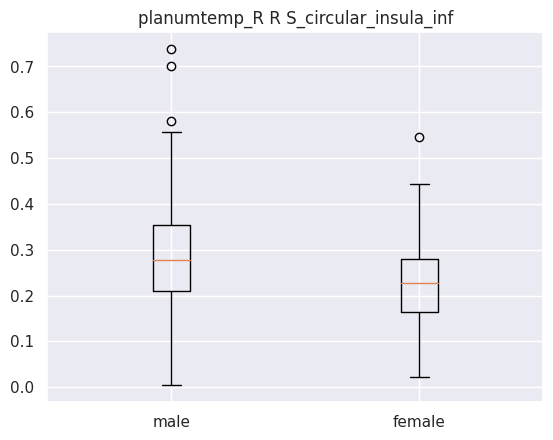

Ttest_indResult(statistic=5.673022197146965, pvalue=2.5335329424316272e-08)
male mean : 0.28464964156636363
male std : 0.11115068945139177
female mean : 0.22998609894690267
female std : 0.0911493316406924


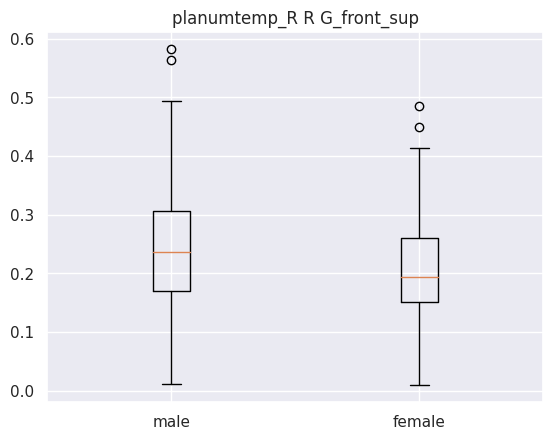

Ttest_indResult(statistic=4.5006283224909716, pvalue=8.666038673621973e-06)
male mean : 0.24589423058181817
male std : 0.10164280812239743
female mean : 0.20654477780088495
female std : 0.08176069201200725


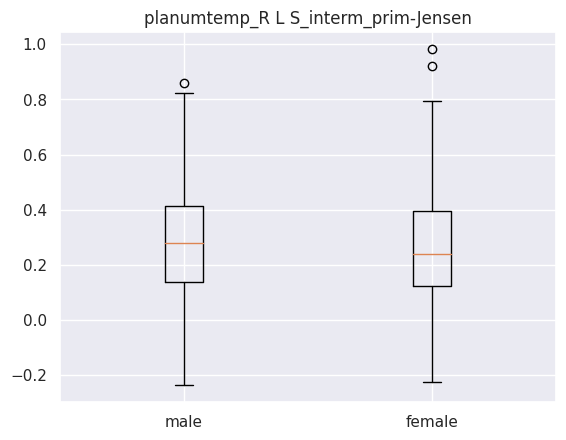

Ttest_indResult(statistic=1.1922978799961215, pvalue=0.2337812983411768)
male mean : 0.28258564518636364
male std : 0.2042966381610263
female mean : 0.25978969691681414
female std : 0.19857273452688937


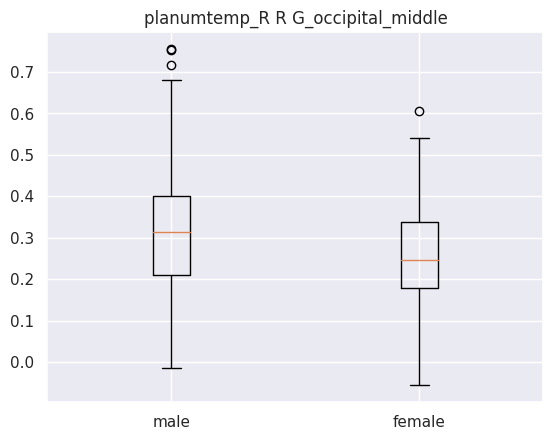

Ttest_indResult(statistic=4.383052844193073, pvalue=1.4623244897765363e-05)
male mean : 0.3154081653127273
male std : 0.14921315901594265
female mean : 0.2596160326061947
female std : 0.11752888622942285
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['opIFG_L', 'planumtemp_L', 'aMTG_L', 'pITG_L']
-------------------------------------------------------------------------------------------------------
     coefficient          seed                      labels
149     0.177962  planumtemp_L     L G_and_S_occipital_inf
53      0.172036       opIFG_L               L S_front_sup
98      0.160288       opIFG_L      R G_pariet_inf-Angular
263     0.157782  planumtemp_L            R Pole_occipital
189     0.156944  planumtemp_L            L Pole_occipital
292     0.137680  planumtemp_L             R S_subparietal
66      0.131887       opIFG_L             L S_postcentral
2

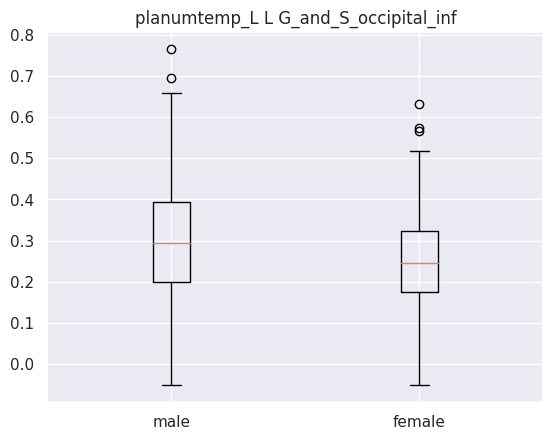

Ttest_indResult(statistic=4.062848625647285, pvalue=5.7322582795216496e-05)
male mean : 0.30012571736045457
male std : 0.14531143258700227
female mean : 0.24886884809292031
female std : 0.11959963365654121


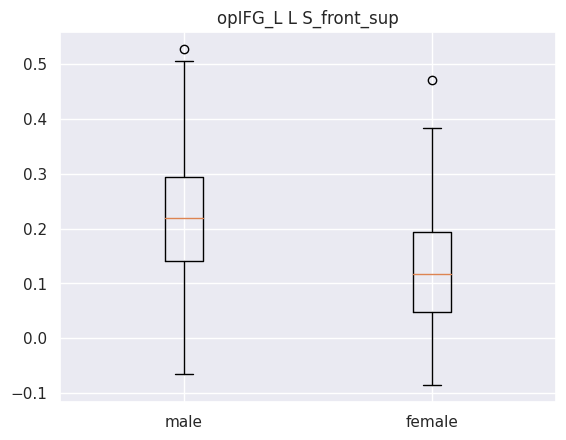

Ttest_indResult(statistic=9.514226955534408, pvalue=1.1745948061525577e-19)
male mean : 0.22193633239999996
male std : 0.11249626112199279
female mean : 0.12588911007571682
female std : 0.10000267392277586


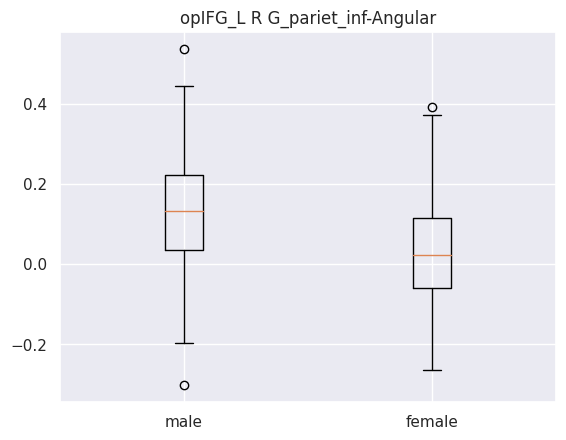

Ttest_indResult(statistic=7.24780487230096, pvalue=1.8918423767886693e-12)
male mean : 0.12424016548681818
male std : 0.13424300726761648
female mean : 0.03453558849026549
female std : 0.1265180924203619


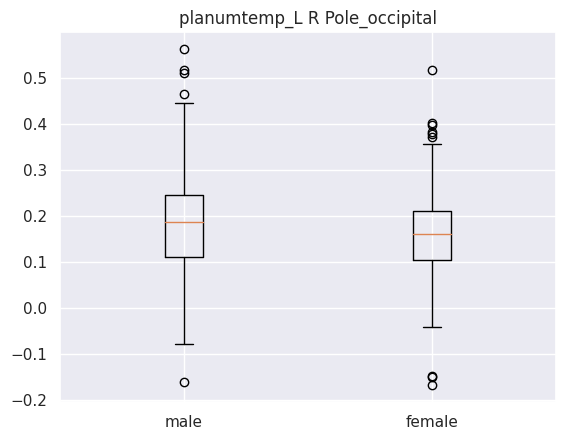

Ttest_indResult(statistic=3.1021672492680086, pvalue=0.002043621734370567)
male mean : 0.19048745212727272
male std : 0.11516897002896241
female mean : 0.15857792705907078
female std : 0.10129749612281899


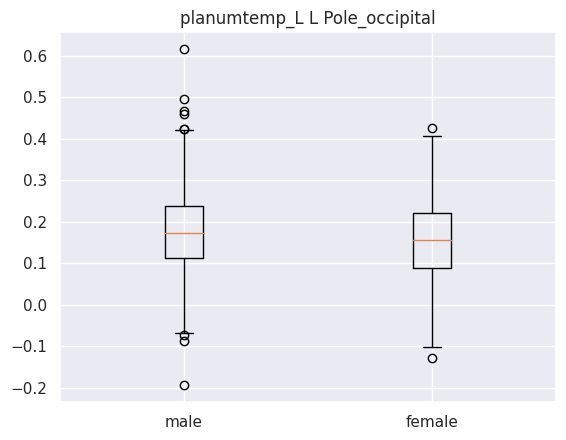

Ttest_indResult(statistic=2.8966477425742636, pvalue=0.003958114551412912)
male mean : 0.18402248281818182
male std : 0.11334589412846845
female mean : 0.1545630971402655
female std : 0.10073153762994376


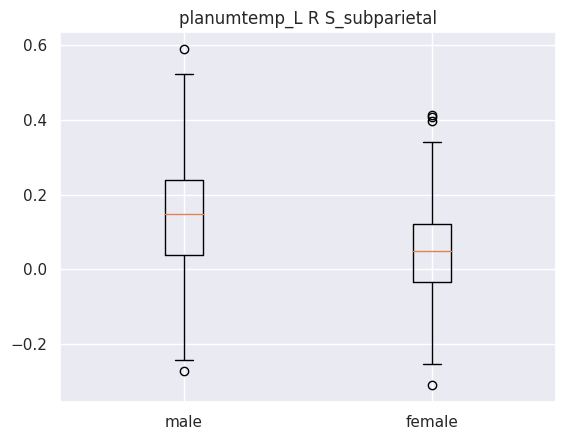

Ttest_indResult(statistic=7.56549749480455, pvalue=2.2461055047719585e-13)
male mean : 0.14965265973
male std : 0.1555451758275771
female mean : 0.04831891531513274
female std : 0.12545920341429934


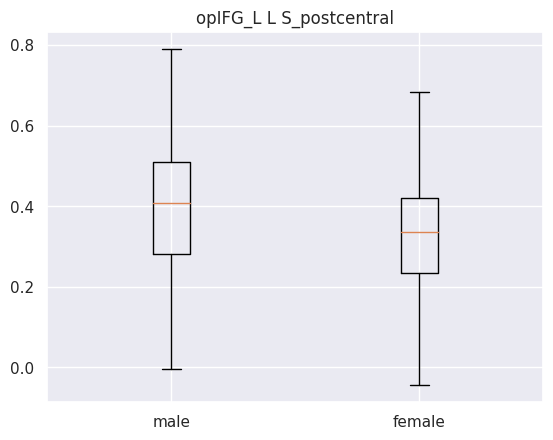

Ttest_indResult(statistic=5.176173981414192, pvalue=3.43837391925615e-07)
male mean : 0.4032316063681817
male std : 0.1555923989988481
female mean : 0.33058522653097344
female std : 0.13990642927460226


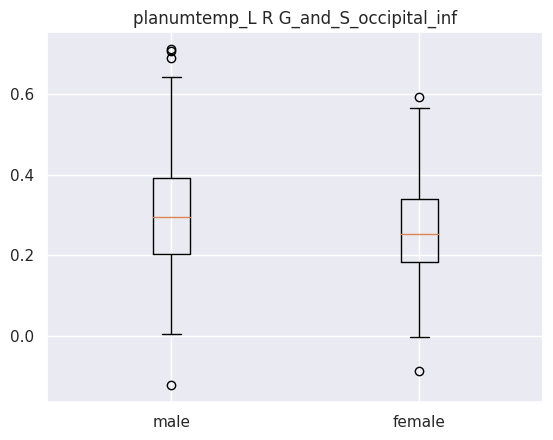

Ttest_indResult(statistic=3.531736949871788, pvalue=0.00045603535995372815)
male mean : 0.3035152627109091
male std : 0.14361189077675587
female mean : 0.25931693665619465
female std : 0.11926479827017382


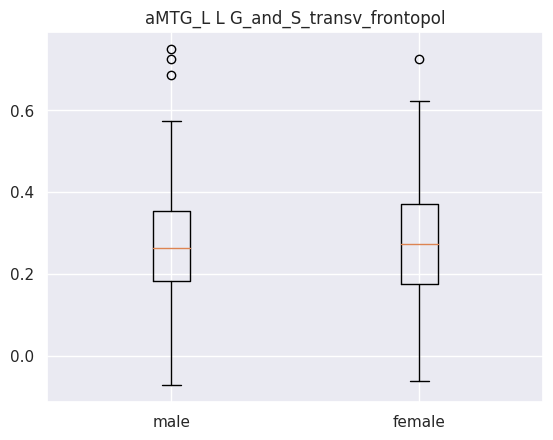

Ttest_indResult(statistic=-0.13187058202998522, pvalue=0.8951463929773453)
male mean : 0.2736758421272727
male std : 0.13376710268148156
female mean : 0.2753599954026549
female std : 0.13529084478562486


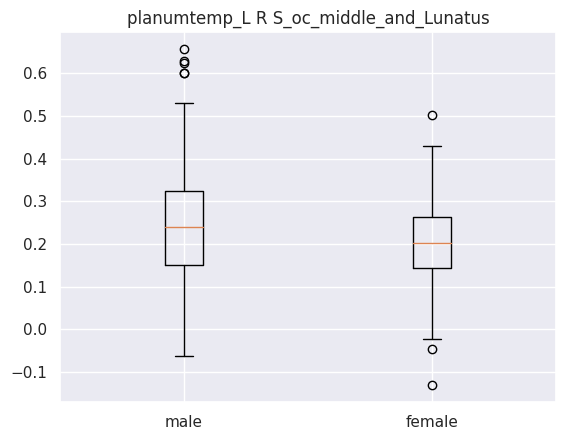

Ttest_indResult(statistic=4.287769800660265, pvalue=2.21565520549817e-05)
male mean : 0.2501186846863636
male std : 0.13630743242980192
female mean : 0.20154915945530977
female std : 0.10007719194915646
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []


-------------------------------------------------------------------------------------------------------
['opIFG_R', 'planumtemp_R', 'aMTG_R', 'pITG_R']
-------------------------------------------------------------------------------------------------------
     coefficient          seed                       labels
421     0.170159        aMTG_R                R S_front_inf
498     0.140400        pITG_R       L S_interm_prim-Jensen
53      0.130885       opIFG_R                L S_front_sup
292     0.130798  planumtemp_R              R S_subparietal
64      0.124063       opIFG_R        L S_parieto_occipital
316     0.122245        aMTG_R      L G_oc-temp_lat-fusifor
55      0.111506       opIFG_R  L S_intrapariet_and_P_

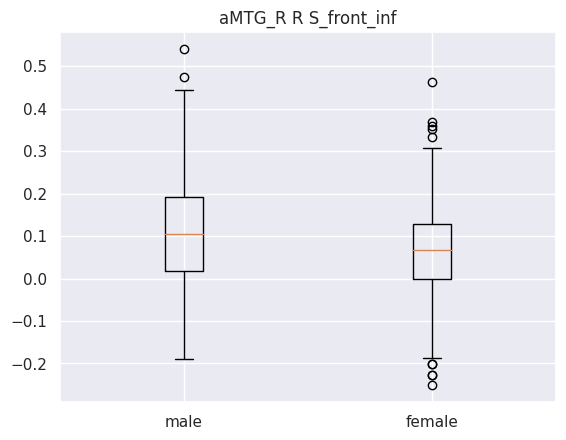

Ttest_indResult(statistic=3.956278857457922, pvalue=8.86001863789618e-05)
male mean : 0.10791621693545454
male std : 0.12931995413969696
female mean : 0.06154310212610619
female std : 0.11751957032303513


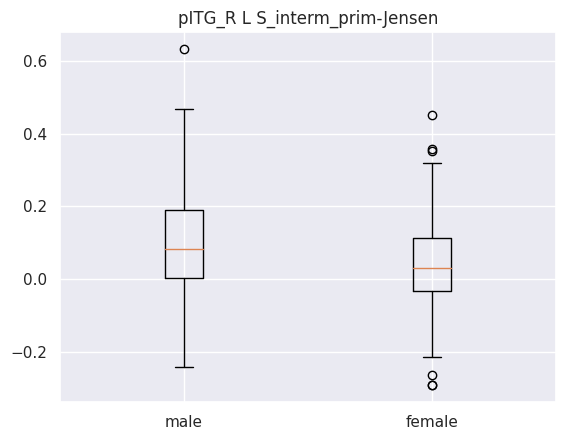

Ttest_indResult(statistic=5.007996133956906, pvalue=7.949942585866972e-07)
male mean : 0.0980466264909091
male std : 0.14302591474588874
female mean : 0.035939954145840704
female std : 0.11734710737051729


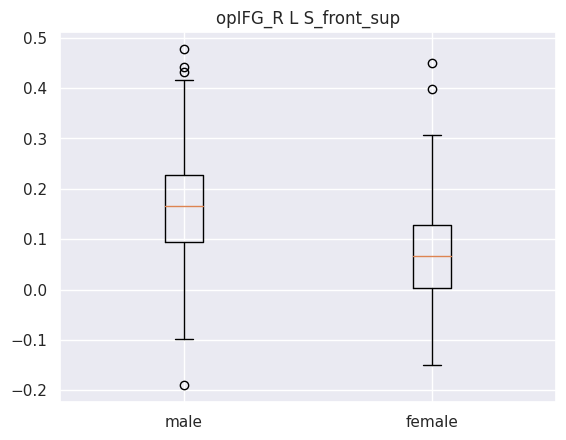

Ttest_indResult(statistic=9.215326889220611, pvalue=1.248160215367442e-18)
male mean : 0.16320744882072724
male std : 0.10965043228920933
female mean : 0.07219020907314161
female std : 0.09828873030252666


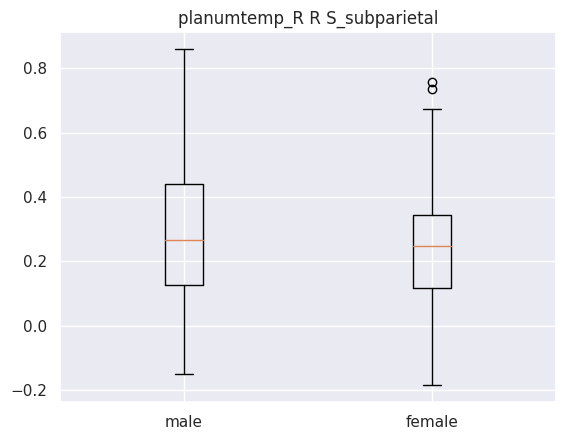

Ttest_indResult(statistic=2.8075668872297204, pvalue=0.0052116316108214876)
male mean : 0.2896251211704545
male std : 0.20367778731138816
female mean : 0.2395944374004425
female std : 0.1707762541855722


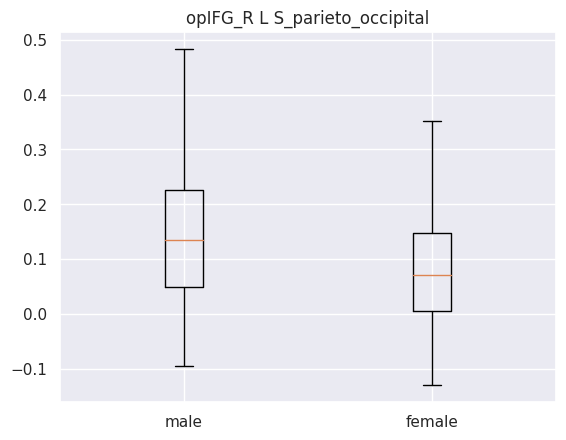

Ttest_indResult(statistic=5.781395635652353, pvalue=1.3979734806667211e-08)
male mean : 0.14218281041136366
male std : 0.11891861698938232
female mean : 0.0824201834380531
female std : 0.09816536989568139


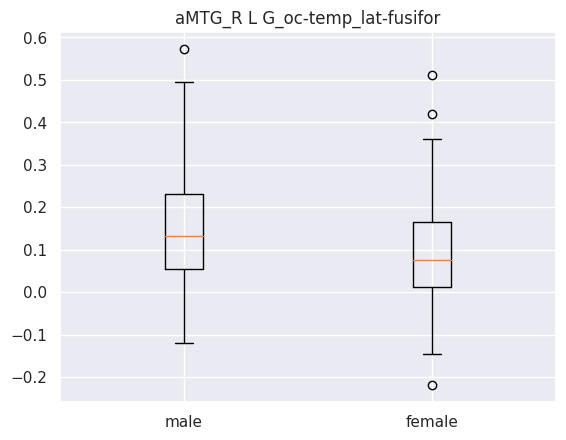

Ttest_indResult(statistic=5.157132505636498, pvalue=3.7849853475325553e-07)
male mean : 0.15163267344727274
male std : 0.13083327172091533
female mean : 0.09148790766993664
female std : 0.11456737640495235


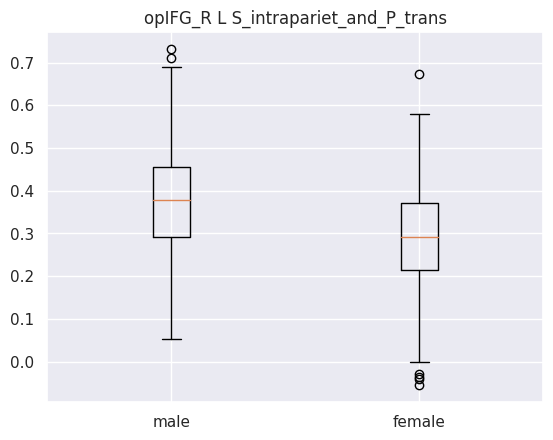

Ttest_indResult(statistic=7.525715474692434, pvalue=2.943978024764579e-13)
male mean : 0.3783558262136364
male std : 0.13092386861978492
female mean : 0.2881963432641593
female std : 0.1214409141686982


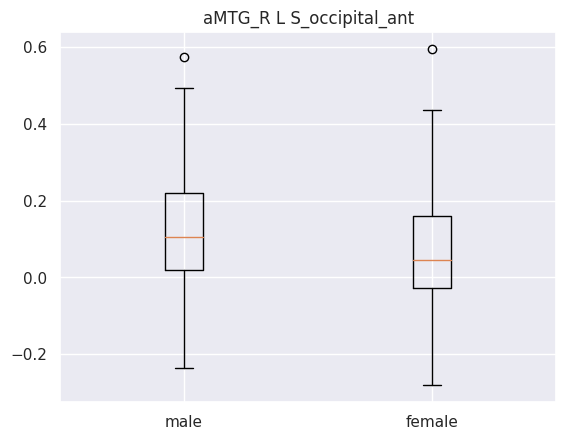

Ttest_indResult(statistic=4.227244739767999, pvalue=2.8735092380929307e-05)
male mean : 0.12326161493249999
male std : 0.14982970317405928
female mean : 0.06501712138650442
female std : 0.1404466315417327


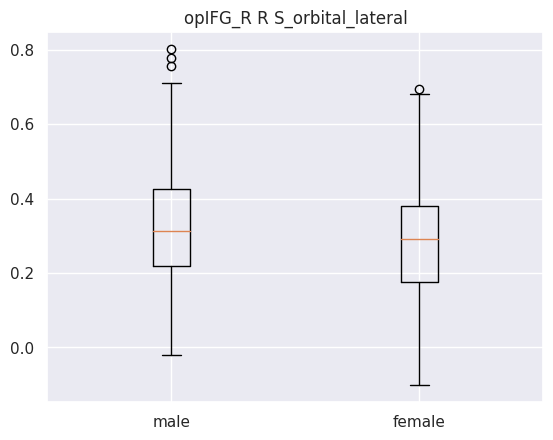

Ttest_indResult(statistic=2.744861835289781, pvalue=0.006299189228159366)
male mean : 0.3271381634947727
male std : 0.15738718014219788
female mean : 0.28616663755176996
female std : 0.15711147119637517


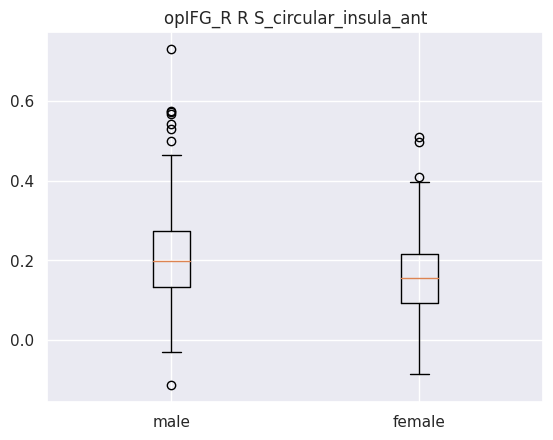

Ttest_indResult(statistic=5.2924843036655735, pvalue=1.9003389567791272e-07)
male mean : 0.21558394754363636
male std : 0.12082565507412785
female mean : 0.15951880155575224
female std : 0.10181469485023342
Empty DataFrame
Columns: [Region, Men, Women, P value]
Index: []




In [96]:
for result in all_results:
    if result == results_path_all_seed:
        rois = ["opIFG_L", "planumtemp_L", "aMTG_L", "pITG_L", "opIFG_R", "planumtemp_R", "aMTG_R", "pITG_R"] # modified to rois of interest
    elif result == results_path_aMTG_L:
        rois = ["aMTG_L"]
    elif result == results_path_aMTG_R:
        rois = ["aMTG_R"]
    elif result == results_path_opIFG_L:
        rois = ["opIFG_L"]
    elif result == results_path_opIFG_R:
        rois = ["opIFG_R"]
    elif result == results_path_pITG_L:
        rois = ["pITG_L"]
    elif result == results_path_pITG_R:
        rois = ["pITG_R"]
    elif result == results_path_planumtemp_L:
        rois = ["planumtemp_L"]
    elif result == results_path_planumtemp_R:
        rois = ["planumtemp_R"]
    elif result == results_path_all_left:
        rois = ["opIFG_L", "planumtemp_L", "aMTG_L", "pITG_L"]
    elif result == results_path_all_right:
        rois = ["opIFG_R", "planumtemp_R", "aMTG_R", "pITG_R"]
    print("-------------------------------------------------------------------------------------------------------")
    print(rois)
    print("-------------------------------------------------------------------------------------------------------")
    moyenne, scoresZ, pvalue, data_results = compute_results(result)
    ROIs = regionsOfInterest(data_results["acc_test"], pvalue, moyenne, rois, label, x_correl)
    sensitivity = data_results["confusion_matrix"].apply(lambda x: x["Femme"][0] / (x["Femme"][0] + x["Femme"][1]))
    specificity = data_results["confusion_matrix"].apply(lambda x: x['Homme'][1] / (x["Homme"][1] + x["Homme"][0]))
    print("Mean sensitivity : " + str(sensitivity.mean()) + " Std sensitivity : " + str(sensitivity.std()))
    print("Mean specificity : " + str(specificity.mean()) + " Std specificity : " + str(specificity.std()))
    print("Validation accuracy")
    moyenne, scoresZ, pvalue, data_results = compute_results(result)
    pdList = []
    pdList.extend(data_results["confusion_matrix_validation"])
    concat_df = pd.concat(pdList)
    mean_confusion = concat_df.groupby(concat_df.index)
    mean_confusion = mean_confusion.mean()
    sensitivity, specificity = sensitivity_specificity(mean_confusion)
    print("Sensitivity : " + str(sensitivity))
    print("Specificity : " + str(specificity))
    print("mean Accuracy validation : " + str(data_results["acc_validation"].mean()))
    bestRegion(ROIs, data, df_boot)
    print("\n")


# Violin plot

## Violin plot wm 01

0.149155713895


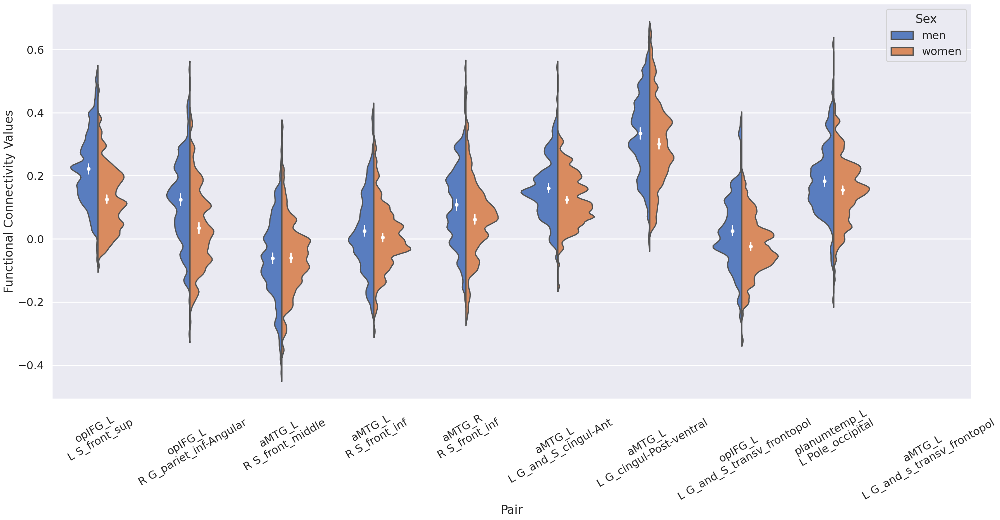

In [106]:
#1. make dataframe for the violin plot 
Final_df = pd.read_csv("/data/brambati/dataset/HCP/derivatives/training_sex_diff/HCP_matched_age_educ_train.csv")
df = pd.DataFrame.from_dict(data, orient="index", columns=label["name"]).reset_index()
df["participant_id"] = df["index"].apply(lambda x: x[0])
df["seed"] = df["index"].apply(lambda x: x[1])
df["Gender"] = list(Final_df["Gender"]) * 8
df["Gender"] = df["Gender"].replace({0:"men", 1:"women"})

df_connectivity = df.melt(id_vars=["participant_id", "seed", "Gender"], value_vars=label["name"])
df_connectivity["pair"] = df_connectivity["seed"] + " with " + df_connectivity["name"]

df_temp_men = df_connectivity.loc[
    (df_connectivity["Gender"] == "men") &
    (df_connectivity["pair"] == "aMTG_L with L S_front_sup")
]  
df_temp_women = df_connectivity.loc[
    (df_connectivity["Gender"] == "women") &
    (df_connectivity["pair"] == "aMTG_L with L S_front_sup")
]
stats.ttest_ind(df_temp_men["value"], df_temp_women["value"])
print(df_temp_men["value"].mean())


# 53       0.076144       opIFG_L               L S_front_sup
# 98       0.069329       opIFG_L      R G_pariet_inf-Angular
# 422      0.065315        aMTG_L            R S_front_middle
# 421      0.064355        aMTG_L               R S_front_inf
# 1013     0.060580        aMTG_R               R S_front_inf
# 301      0.060371        aMTG_L        L G_and_S_cingul-Ant
# 305      0.059266        aMTG_L     L G_cingul-Post-ventral
# 4        0.056628       opIFG_L  L G_and_S_transv_frontopol
# 189      0.055237  planumtemp_L            L Pole_occipital
# 300      0.053906        aMTG_L  L G_and_S_transv_frontopol


# A changer selon les dix meilleures seeds
# list to make sure top 10 regions are in order 
top10 = ["opIFG_L with L S_front_sup",
         "opIFG_L with R G_pariet_inf-Angular",
         "aMTG_L with R S_front_middle",
         "aMTG_L with R S_front_inf",
         "aMTG_R with R S_front_inf", 
         "aMTG_L with L G_and_S_cingul-Ant",
         "aMTG_L with L G_cingul-Post-ventral",
         "opIFG_L with L G_and_S_transv_frontopol",
         "planumtemp_L with L Pole_occipital", 
         "aMTG_L with L G_and_s_transv_frontopol"]
         

df_temp = df_connectivity.loc[
    # (df_connectivity["seed"] == "opIFG_L") &
    (df_connectivity["pair"].isin(top10))
]  
df_temp["Sex"] = df_temp["Gender"]
df_temp["Functional Connectivity Values"] = df_temp["value"]
df_temp["Pair"] = df_temp["pair"]

# plt.figure(figsize=(20, 11.25))

sns.set_theme(context="poster")

v_plot = sns.violinplot(x="Pair", y="Functional Connectivity Values", hue="Sex", data=df_temp, split= True, bw=0.10,inner = None, palette="muted", order=top10)
# v_plot.set_xticks([0,1])
# v_plot.set_xticklabels(["aMTG_L\nL S_front_sup", "2"])
# v_plot

v_plot = sns.pointplot(x="Pair", y="Functional Connectivity Values", hue="Sex",
                    data=df_temp, dodge=0.2, join=False, palette=['white'], ax=v_plot, scale=0.5, order=top10, legend=False)

# changer les xticklabels selon les labels obtenues
v_plot.set_xticks([0,1,2,3,4,5,6,7,8,9])
v_plot.set_xticklabels(["opIFG_L\nL S_front_sup",
         "opIFG_L\nR G_pariet_inf-Angular",
         "aMTG_L\nR S_front_middle",
         "aMTG_L\nR S_front_inf",
         "aMTG_R\nR S_front_inf", 
         "aMTG_L\nL G_and_S_cingul-Ant",
         "aMTG_L\nL G_cingul-Post-ventral",
         "opIFG_L\nL G_and_S_transv_frontopol",
         "planumtemp_L\nL Pole_occipital", 
         "aMTG_L\nL G_and_s_transv_frontopol"], rotation=30)


fig = v_plot.get_figure()
fig.set_size_inches(28.5, 15)
plt.tight_layout()
fig.savefig("./Images/violin_plot_wm_01.png", dpi=300)

## violin plot wm 02

0.149155713895


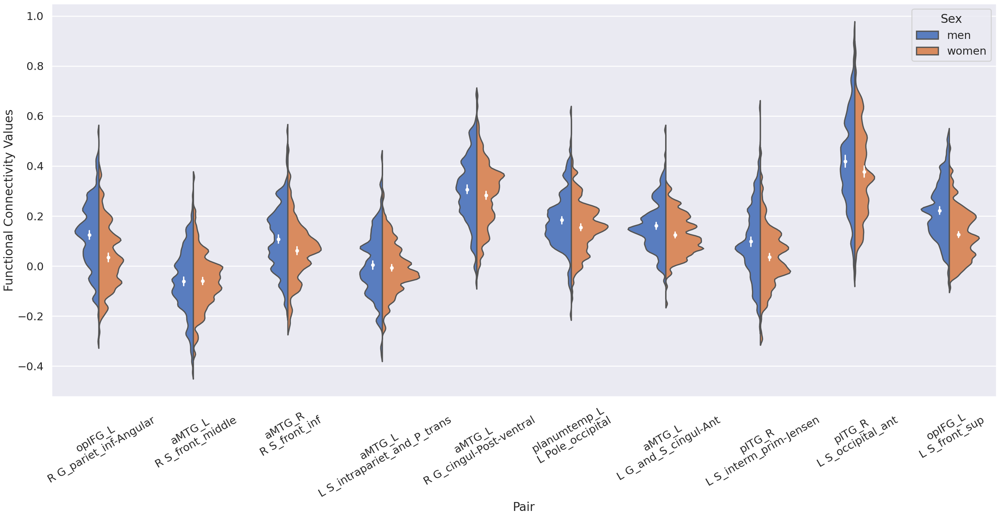

In [101]:
#1. make dataframe for the violin plot 
Final_df = pd.read_csv("/data/brambati/dataset/HCP/derivatives/training_sex_diff/HCP_matched_age_educ_train.csv")
df = pd.DataFrame.from_dict(data, orient="index", columns=label["name"]).reset_index()
df["participant_id"] = df["index"].apply(lambda x: x[0])
df["seed"] = df["index"].apply(lambda x: x[1])
df["Gender"] = list(Final_df["Gender"]) * 8
df["Gender"] = df["Gender"].replace({0:"men", 1:"women"})

df_connectivity = df.melt(id_vars=["participant_id", "seed", "Gender"], value_vars=label["name"])
df_connectivity["pair"] = df_connectivity["seed"] + " with " + df_connectivity["name"]

df_temp_men = df_connectivity.loc[
    (df_connectivity["Gender"] == "men") &
    (df_connectivity["pair"] == "aMTG_L with L S_front_sup")
]  
df_temp_women = df_connectivity.loc[
    (df_connectivity["Gender"] == "women") &
    (df_connectivity["pair"] == "aMTG_L with L S_front_sup")
]
stats.ttest_ind(df_temp_men["value"], df_temp_women["value"])
print(df_temp_men["value"].mean())


# 98       0.076190       opIFG_L       R G_pariet_inf-Angular
# 422      0.073980        aMTG_L             R S_front_middle
# 1013     0.068757        aMTG_R                R S_front_inf
# 351      0.064106        aMTG_L  L S_intrapariet_and_P_trans
# 379      0.063116        aMTG_L      R G_cingul-Post-ventral
# 189      0.059016  planumtemp_L             L Pole_occipital
# 301      0.058613        aMTG_L         L G_and_S_cingul-Ant
# 1090     0.057939        pITG_R       L S_interm_prim-Jensen
# 1094     0.054540        pITG_R            L S_occipital_ant
# 53       0.052777       opIFG_L                L S_front_sup


# A changer selon les dix meilleures seeds
# list to make sure top 10 regions are in order 
top10 = ["opIFG_L with R G_pariet_inf-Angular",
         "aMTG_L with R S_front_middle",
         "aMTG_R with R S_front_inf",
         "aMTG_L with L S_intrapariet_and_P_trans",
         "aMTG_L with R G_cingul-Post-ventral", 
         "planumtemp_L with L Pole_occipital",
         "aMTG_L with L G_and_S_cingul-Ant",
         "pITG_R with L S_interm_prim-Jensen",
         "pITG_R with L S_occipital_ant", 
         "opIFG_L with L S_front_sup"]
         

df_temp = df_connectivity.loc[
    # (df_connectivity["seed"] == "opIFG_L") &
    (df_connectivity["pair"].isin(top10))
]  
df_temp["Sex"] = df_temp["Gender"]
df_temp["Functional Connectivity Values"] = df_temp["value"]
df_temp["Pair"] = df_temp["pair"]

# plt.figure(figsize=(20, 11.25))

sns.set_theme(context="poster")

v_plot = sns.violinplot(x="Pair", y="Functional Connectivity Values", hue="Sex", data=df_temp, split= True, bw=0.10,inner = None, palette="muted", order=top10)
# v_plot.set_xticks([0,1])
# v_plot.set_xticklabels(["aMTG_L\nL S_front_sup", "2"])
# v_plot

v_plot = sns.pointplot(x="Pair", y="Functional Connectivity Values", hue="Sex",
                    data=df_temp, dodge=0.2, join=False, palette=['white'], ax=v_plot, scale=0.5, order=top10, legend=False)

# changer les xticklabels selon les labels obtenues
v_plot.set_xticks([0,1,2,3,4,5,6,7,8,9])
v_plot.set_xticklabels(["opIFG_L\nR G_pariet_inf-Angular",
         "aMTG_L\nR S_front_middle",
         "aMTG_R\nR S_front_inf",
         "aMTG_L\nL S_intrapariet_and_P_trans",
         "aMTG_L\nR G_cingul-Post-ventral", 
         "planumtemp_L\nL Pole_occipital",
         "aMTG_L\nL G_and_S_cingul-Ant",
         "pITG_R\nL S_interm_prim-Jensen",
         "pITG_R\nL S_occipital_ant", 
         "opIFG_L\nL S_front_sup"], rotation=30)


fig = v_plot.get_figure()
fig.set_size_inches(28.5, 15)
plt.tight_layout()
fig.savefig("./Images/violin_plot_wm_02.png", dpi=300)

## violin plot no 02

0.09901800113601895


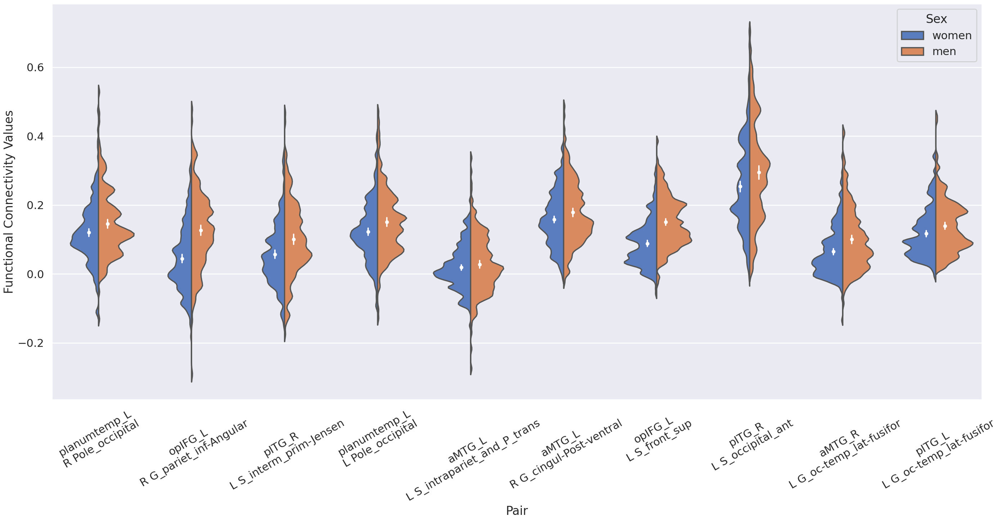

In [18]:
#1. make dataframe for the violin plot 
Final_df = pd.read_csv("/data/brambati/dataset/HCP/derivatives/training_sex_diff/HCP_matched_age_educ_train_02.csv")
df = pd.DataFrame.from_dict(data, orient="index", columns=label["name"]).reset_index()
df["participant_id"] = df["index"].apply(lambda x: x[0])
df["seed"] = df["index"].apply(lambda x: x[1])
df["Gender"] = list(Final_df["Gender"]) * 8
df["Gender"] = df["Gender"].replace({0:"men", 1:"women"})

df_connectivity = df.melt(id_vars=["participant_id", "seed", "Gender"], value_vars=label["name"])
df_connectivity["pair"] = df_connectivity["seed"] + " with " + df_connectivity["name"]

df_temp_men = df_connectivity.loc[
    (df_connectivity["Gender"] == "men") &
    (df_connectivity["pair"] == "aMTG_L with L S_front_sup")
]  
df_temp_women = df_connectivity.loc[
    (df_connectivity["Gender"] == "women") &
    (df_connectivity["pair"] == "aMTG_L with L S_front_sup")
]
stats.ttest_ind(df_temp_men["value"], df_temp_women["value"])
print(df_temp_men["value"].mean())


# 263      0.071801  planumtemp_L             R Pole_occipital
# 98       0.066985       opIFG_L       R G_pariet_inf-Angular
# 1090     0.066145        pITG_R       L S_interm_prim-Jensen
# 189      0.063483  planumtemp_L             L Pole_occipital
# 351      0.051789        aMTG_L  L S_intrapariet_and_P_trans
# 379      0.051756        aMTG_L      R G_cingul-Post-ventral
# 53       0.051418       opIFG_L                L S_front_sup
# 1094     0.051398        pITG_R            L S_occipital_ant
# 908      0.050601        aMTG_R      L G_oc-temp_lat-fusifor
# 464      0.049779        pITG_L      L G_oc-temp_lat-fusifor



# A changer selon les dix meilleures seeds
# list to make sure top 10 regions are in order 
top10 = ["planumtemp_L with R Pole_occipital",
         "opIFG_L with R G_pariet_inf-Angular",
         "pITG_R with L S_interm_prim-Jensen",
         "planumtemp_L with L Pole_occipital",
         "aMTG_L with L S_intrapariet_and_P_trans", 
         "aMTG_L with R G_cingul-Post-ventral",
         "opIFG_L with L S_front_sup",
         "pITG_R with L S_occipital_ant",
         "aMTG_R with L G_oc-temp_lat-fusifor", 
         "pITG_L with L G_oc-temp_lat-fusifor"]
         

df_temp = df_connectivity.loc[
    # (df_connectivity["seed"] == "opIFG_L") &
    (df_connectivity["pair"].isin(top10))
]  
df_temp["Sex"] = df_temp["Gender"]
df_temp["Functional Connectivity Values"] = df_temp["value"]
df_temp["Pair"] = df_temp["pair"]

# plt.figure(figsize=(20, 11.25))

sns.set_theme(context="poster")

v_plot = sns.violinplot(x="Pair", y="Functional Connectivity Values", hue="Sex", data=df_temp, split= True, bw=0.10,inner = None, palette="muted", order=top10)
# v_plot.set_xticks([0,1])
# v_plot.set_xticklabels(["aMTG_L\nL S_front_sup", "2"])
# v_plot

v_plot = sns.pointplot(x="Pair", y="Functional Connectivity Values", hue="Sex",
                    data=df_temp, dodge=0.2, join=False, palette=['white'], ax=v_plot, scale=0.5, order=top10, legend=False)

# changer les xticklabels selon les labels obtenues
v_plot.set_xticks([0,1,2,3,4,5,6,7,8,9])
v_plot.set_xticklabels(["planumtemp_L\nR Pole_occipital",
                        "opIFG_L\nR G_pariet_inf-Angular",
                        "pITG_R\nL S_interm_prim-Jensen",
                        "planumtemp_L\nL Pole_occipital",
                        "aMTG_L\nL S_intrapariet_and_P_trans", 
                        "aMTG_L\nR G_cingul-Post-ventral",
                        "opIFG_L\nL S_front_sup",
                        "pITG_R\nL S_occipital_ant",
                        "aMTG_R\nL G_oc-temp_lat-fusifor", 
                        "pITG_L\nL G_oc-temp_lat-fusifor"], rotation=30)


fig = v_plot.get_figure()
fig.set_size_inches(28.5, 15)
plt.tight_layout()
fig.savefig("./Images/violin_plot_no_02.png", dpi=300)

## violin plot gsr 02

0.149155713895


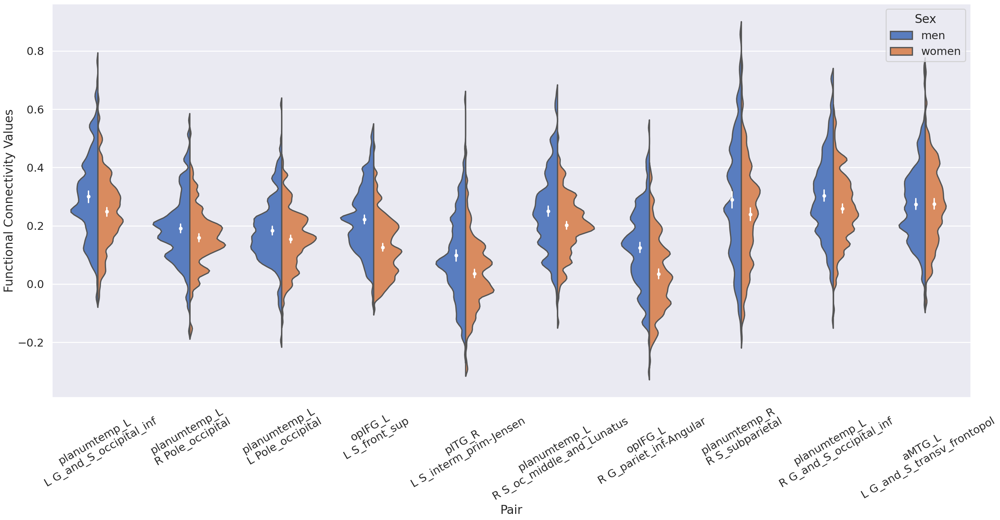

In [108]:
#1. make dataframe for the violin plot 
Final_df = pd.read_csv("/data/brambati/dataset/HCP/derivatives/training_sex_diff/HCP_matched_age_educ_train.csv")
df = pd.DataFrame.from_dict(data, orient="index", columns=label["name"]).reset_index()
df["participant_id"] = df["index"].apply(lambda x: x[0])
df["seed"] = df["index"].apply(lambda x: x[1])
df["Gender"] = list(Final_df["Gender"]) * 8
df["Gender"] = df["Gender"].replace({0:"men", 1:"women"})

df_connectivity = df.melt(id_vars=["participant_id", "seed", "Gender"], value_vars=label["name"])
df_connectivity["pair"] = df_connectivity["seed"] + " with " + df_connectivity["name"]

df_temp_men = df_connectivity.loc[
    (df_connectivity["Gender"] == "men") &
    (df_connectivity["pair"] == "aMTG_L with L S_front_sup")
]  
df_temp_women = df_connectivity.loc[
    (df_connectivity["Gender"] == "women") &
    (df_connectivity["pair"] == "aMTG_L with L S_front_sup")
]
stats.ttest_ind(df_temp_men["value"], df_temp_women["value"])
print(df_temp_men["value"].mean())


# 149      0.123747  planumtemp_L     L G_and_S_occipital_inf
# 263      0.114840  planumtemp_L            R Pole_occipital
# 189      0.111908  planumtemp_L            L Pole_occipital
# 53       0.102685       opIFG_L               L S_front_sup
# 1090     0.099728        pITG_R      L S_interm_prim-Jensen
# 278      0.094654  planumtemp_L   R S_oc_middle_and_Lunatus
# 98       0.094187       opIFG_L      R G_pariet_inf-Angular
# 884      0.088933  planumtemp_R             R S_subparietal
# 223      0.083269  planumtemp_L     R G_and_S_occipital_inf
# 300      0.081604        aMTG_L  L G_and_S_transv_frontopol


# A changer selon les dix meilleures seeds
# list to make sure top 10 regions are in order 
top10 = ["planumtemp_L with L G_and_S_occipital_inf",
         "planumtemp_L with R Pole_occipital",
         "planumtemp_L with L Pole_occipital",
         "opIFG_L with L S_front_sup",
         "pITG_R with L S_interm_prim-Jensen", 
         "planumtemp_L with R S_oc_middle_and_Lunatus",
         "opIFG_L with R G_pariet_inf-Angular",
         "planumtemp_R with R S_subparietal",
         "planumtemp_L with R G_and_S_occipital_inf", 
         "aMTG_L with L G_and_S_transv_frontopol"]
         

df_temp = df_connectivity.loc[
    # (df_connectivity["seed"] == "opIFG_L") &
    (df_connectivity["pair"].isin(top10))
]  
df_temp["Sex"] = df_temp["Gender"]
df_temp["Functional Connectivity Values"] = df_temp["value"]
df_temp["Pair"] = df_temp["pair"]

# plt.figure(figsize=(20, 11.25))

sns.set_theme(context="poster")

v_plot = sns.violinplot(x="Pair", y="Functional Connectivity Values", hue="Sex", data=df_temp, split= True, bw=0.10,inner = None, palette="muted", order=top10)
# v_plot.set_xticks([0,1])
# v_plot.set_xticklabels(["aMTG_L\nL S_front_sup", "2"])
# v_plot

v_plot = sns.pointplot(x="Pair", y="Functional Connectivity Values", hue="Sex",
                    data=df_temp, dodge=0.2, join=False, palette=['white'], ax=v_plot, scale=0.5, order=top10, legend=False)

# changer les xticklabels selon les labels obtenues
v_plot.set_xticks([0,1,2,3,4,5,6,7,8,9])
v_plot.set_xticklabels(["planumtemp_L\nL G_and_S_occipital_inf",
         "planumtemp_L\nR Pole_occipital",
         "planumtemp_L\nL Pole_occipital",
         "opIFG_L\nL S_front_sup",
         "pITG_R\nL S_interm_prim-Jensen", 
         "planumtemp_L\nR S_oc_middle_and_Lunatus",
         "opIFG_L\nR G_pariet_inf-Angular",
         "planumtemp_R\nR S_subparietal",
         "planumtemp_L\nR G_and_S_occipital_inf", 
         "aMTG_L\nL G_and_S_transv_frontopol"], rotation=30)


fig = v_plot.get_figure()
fig.set_size_inches(28.5, 15)
plt.tight_layout()
fig.savefig("./Images/violin_plot_gsr_02.png", dpi=300)

## Test classification feature by feature on an independent set

In [ ]:
# top 10 region/seed from the all seed results from acc_test
# 53      0.071670       opIFG_L                L S_front_sup
# 98      0.068736       opIFG_L       R G_pariet_inf-Angular
# 305     0.067573        aMTG_L      L G_cingul-Post-ventral
# 4       0.062202       opIFG_L   L G_and_S_transv_frontopol
# 351     0.061009        aMTG_L  L S_intrapariet_and_P_trans
# 379     0.055271        aMTG_L      R G_cingul-Post-ventral
# 421     0.054923        aMTG_L                R S_front_inf
# 189     0.053367  planumtemp_L             L Pole_occipital
# 301     0.052666        aMTG_L         L G_and_S_cingul-Ant
# 431     0.051921        aMTG_L          R S_orbital_lateral

# the best feature (seed and their region)
seeds = ["opIFG_L", "opIFG_L", "aMTG_L", "opIFG_L", "aMTG_L", "aMTG_L" , "aMTG_L", "planumtemp_L", "aMTG_L", "aMTG_L"]
regions = ["L_S_front_sup", 
          "R_G_pariet_inf-Angular", 
          "L_G_cingul-Post-ventral", 
          "L_G_and_S_transv_frontopol", 
          "L_S_intrapariet_and_P_trans", 
          "R_G_cingul-Post-ventral",
           "R_S_front_inf",
         "L_Pole_occipital",
         "L_G_and_S_cingul-Ant",
         "R_S_orbital_lateral"]

file_path = "/data/brambati/dataset/HCP/derivatives/seed-to-voxel-nilearn/results_2024/atlas_means/destrieux_fisherz/seed-{seed_name}_atlas-destrieux_mean-all4_gmcorrected__fisherz.csv"
Final_df = pd.read_csv("/data/brambati/dataset/HCP/derivatives/training_sex_diff/HCP_matched_age_educ_train.csv")

x = []
y = []
for i in range(0, 1):
    file = file_path.format(seed_name=seeds[i])
    loaded = pd.read_csv(file_path.format(seed_name=seeds[i]))
    signal = loaded[seeds[i]+"__"+regions[i]]
    for subject in Final_df["Subject"]:
        sub_sex = Final_df.loc[Final_df["Subject"] == subject]["Gender"].values[0]
        value = loaded.loc[loaded["Unnamed: 0"] == "sub-"+str(subject)][seeds[i]+"__"+regions[i]].values[0]
        x.append(value)
        y.append(sub_sex)
    x = np.asarray(x)
    x = x.reshape(-1,1)
    print("Testing : "+seeds[i]+" "+regions[i])
    model = machine_learning(x,y)
    print("\n")
    x = []
    y = []
        